In [ ]:
#####################################################################
#   PROJET 5 - Catégorisez automatiquement des questions            #
#-------------------------------------------------------------------#
#   NOTEBOOK D'EXPLORATION :                                        #
#      ---> analyse univariée,                                      #
#      ---> analyse multivariée,                                    #
#      ---> réduction dimensionnelle                                #
#      ---> différentes questions de recherche associées.           #
#####################################################################

In [ ]:
#####################################################################
#   GITHUB                                                          #
#-------------------------------------------------------------------#
# GitHub              : https://github.com/irribarre                #
# Repository projet 5 : https://github.com/irribarre/Texte_1        #
# Notebook 1          : 1_notebook_exploration.ipynb                #
#####################################################################

In [1]:
# Constantes
# Exécution sur google colab ou pas
C_EXECUTION_SUR_GOOGLE_COLAB = False  # False --> PC
                                      # True --> Google colab : https://colab.research.google.com/

In [ ]:
if (C_EXECUTION_SUR_GOOGLE_COLAB):
    !pip install emoji
   #!pip install seaborn --upgrade

In [2]:
# built-in (librairie par défaut avec python)
import os
import time # https://realpython.com/python-timer/

# Data
import pandas as pd
import numpy as np
from zipfile import ZipFile
import seaborn as sns

# NLP
from string import punctuation
import re
from bs4 import BeautifulSoup
from nltk.tokenize import word_tokenize
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.util import ngrams
import emoji
from nltk.corpus import words   # liste des mots dans une langue
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.probability import FreqDist

# Visualisation
import matplotlib.pyplot as plt
from wordcloud import WordCloud


# ------------------------------- Pour google colab -------------------------------
if (C_EXECUTION_SUR_GOOGLE_COLAB):
    from google.colab import drive

# 1. RECUPERATION DU CORPUS DE TEXTE

In [ ]:
# Montage disques réseau avec google drive + demande autorisation connexion)
# Google drive : https://drive.google.com/drive/my-drive
if (C_EXECUTION_SUR_GOOGLE_COLAB):
    drive.mount('/content/drive', force_remount = True)
    # vérification fichier
    !ls /content/drive/MyDrive/Colab_Notebooks/data_P5

In [3]:
# Constantes
# Google colab
if (C_EXECUTION_SUR_GOOGLE_COLAB):
    C_DATASET_SOURCE  = '/content/drive/MyDrive/Colab_Notebooks/data_P5/source/'        
    C_DATASET_CLEANED = '/content/drive/MyDrive/Colab_Notebooks/data_P5/cleaned/'
    C_APP_MODELE      = '/content/drive/MyDrive/Colab_Notebooks/app_models/'       # modèles pré-entraînés pour
                                                                                   # l'application
    C_APP_PREPARATION = '/content/drive/MyDrive/Colab_Notebooks/app_preparation/'  # fichiers de préparation pour 
                                                                                   # l'application    
# PC
else:
    C_DATASET_SOURCE  = './data/source/'
    C_DATASET_CLEANED = './data/cleaned/'
    C_APP_MODELE      = './app_models/'       # modèles pré-entraînés pour l'application
    C_APP_PREPARATION = './app_preparation/'  # fichiers de préparation pour l'application

In [4]:
# Liste des fichiers fournis
os.listdir(C_DATASET_SOURCE)

['QueryResults_2008_to_2023.zip']

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ A FAIRE UNE SEULE FOIS :                                                                         @
# @ Transformation du zip contenant n fichiers en un seul (exploitable si travail sur google colab). @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# https://stacklima.com/facons-dimporter-des-fichiers-csv-dans-google-colab/
if (not C_EXECUTION_SUR_GOOGLE_COLAB):
    df_zip = pd.concat([pd.read_csv(ZipFile(C_DATASET_SOURCE + 'QueryResults_2008_to_2023.zip').open(i)) 
                        for i in ZipFile(C_DATASET_SOURCE + 'QueryResults_2008_to_2023.zip').namelist()],
                       ignore_index = True)

    df_zip.shape
    df_zip.to_csv(C_DATASET_SOURCE + 'QueryResults_2008_to_2023.csv', 
                  sep = '\t', header = True, index = False)

In [5]:
# Lecture fichier
# https://ichi.pro/fr/tutoriel-google-colab-101-avec-python-conseils-astuces-et-faq-130333958546612
# Google Colab fournit également des fonctionnalités pour lire les données de Google Drive.
if (C_EXECUTION_SUR_GOOGLE_COLAB):
    df = pd.read_csv(C_DATASET_SOURCE + 'QueryResults_2008_to_2023.csv', sep = '\t')

else:
    df = pd.concat([pd.read_csv(ZipFile(C_DATASET_SOURCE + 'QueryResults_2008_to_2023.zip').open(i)) 
                    for i in ZipFile(C_DATASET_SOURCE + 'QueryResults_2008_to_2023.zip').namelist()],
                   ignore_index = True)
    
print(df)

        PostTypeId         CreationDate  \
0                1  2008-08-09 04:13:02   
1                1  2008-08-06 19:26:30   
2                1  2008-08-07 02:29:58   
3                1  2008-08-09 21:16:29   
4                1  2008-08-09 06:50:22   
...            ...                  ...   
223334           1  2023-02-06 14:29:31   
223335           1  2023-02-06 22:06:47   
223336           1  2023-02-07 10:56:09   
223337           1  2023-02-07 18:11:01   
223338           1  2023-02-08 15:39:44   

                                                    Title  \
0       Registry vs. INI file for storing user configu...   
1       IllegalArgumentException or NullPointerExcepti...   
2       What is the best way to create a sparse array ...   
3       Thread safe lazy construction of a singleton i...   
4               Web Services -- WCF vs. ASMX ("Standard")   
...                                                   ...   
223334  How can I get the url pathname on a server com..

# 2. EDA (EXPLORATORY DATA ANALYSIS) 

In [6]:
# Informations sur le dataframe : shape, nombre de lignes, indice du dernier élément.
def df_info(df_in):
    print('df shape\t\t=', df_in.shape)
    print('nb lignes\t\t=', len(df_in.index))
    print('indice dernier élément \t=', df_in.index[-1])

# 2.1. AFFICHAGE

In [7]:
# Affichage des 5 premières lignes
df.head(5)

,PostTypeId,CreationDate,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount
0,1,2008-08-09 04:13:02,Registry vs. INI file for storing user configu...,<p>I'm a new Windows programmer and I'm not su...,<windows><registry><settings><configuration-fi...,6607,55,25485,0.0,13
1,1,2008-08-06 19:26:30,IllegalArgumentException or NullPointerExcepti...,<p>I have a simple setter method for a propert...,<java><exception><null><nullpointerexception><...,3881,570,196562,0.0,26
2,1,2008-08-07 02:29:58,What is the best way to create a sparse array ...,<p>I am working on a project that requires the...,<c++><oop><data-structures><hash><maps>,4306,62,58381,0.0,11
3,1,2008-08-09 21:16:29,Thread safe lazy construction of a singleton i...,<p>Is there a way to implement a singleton obj...,<c++><multithreading><singleton><construction>...,6915,38,27413,0.0,9
4,1,2008-08-09 06:50:22,"Web Services -- WCF vs. ASMX (""Standard"")",<p>I am working on a new project. Is there any...,<.net><wcf><web-services><visual-studio><asmx>,6666,34,11745,0.0,7


In [8]:
# affichage des 5 dernières lignes
df.tail(5)

,PostTypeId,CreationDate,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount
223334,1,2023-02-06 14:29:31,How can I get the url pathname on a server com...,<p>So basically I have a server component in a...,<javascript><next.js><path><router><react-serv...,75362636,10,4351,NaN,2
223335,1,2023-02-06 22:06:47,DeprecationWarning: headless property is depre...,<p>I am trying to execute a basic program usin...,<python><selenium><selenium-webdriver><seleniu...,75367068,8,8015,NaN,2
223336,1,2023-02-07 10:56:09,std::move and lifetime of temporary objects,<p>Can someone explain the execution order of ...,<c++><move><destructor><move-semantics><lifetime>,75372382,19,1085,NaN,2
223337,1,2023-02-07 18:11:01,"f = std::forward in lambda capture, what does ...",<p>I have the following code which is used to ...,<c++><lambda><metaprogramming><perfect-forward...,75377353,6,139,NaN,2
223338,1,2023-02-08 15:39:44,"""Error: require() of ES Module"" using Visx wit...",<p>I am using the Visx library to build charts...,<javascript><reactjs><next.js><es6-modules><visx>,75388177,8,614,NaN,2


In [9]:
# affichage de 5 lignes au hasard
df.sample(5)

,PostTypeId,CreationDate,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount
211112,1,2020-09-15 12:28:58,Why shouldn't I use IdToken as bearer token in...,<p>I am using an IDP platform (here AWS Cognit...,<authentication><jwt><amazon-cognito><openid-c...,63901860,6,1540,0.0,1
50517,1,2011-09-18 18:32:01,"Why do we have map, fmap and liftM?",<pre><code>map :: (a -&gt; b) -&gt; [a] -&gt; ...,<list><haskell><monads><redundancy><functor>,7463500,107,10656,0.0,1
119498,1,2014-05-23 08:59:48,Is there any array-like data structure that ca...,<p>I'm a student working on a small project fo...,<c++><arrays><memory-management><data-structur...,23824986,7,1369,0.0,4
141960,1,2015-06-25 18:51:55,Spark 1.4 increase maxResultSize memory,<p>I am using Spark 1.4 for my research and st...,<python><memory><apache-spark><pyspark><jupyter>,31058504,50,68309,0.0,7
103780,1,2014-08-01 05:54:06,NSWindow beginSheet completionHandler not called,<p>I am showing a sheet within my main window....,<macos><cocoa><nsview><nswindow><nswindowcontr...,25073716,7,6398,0.0,2


In [10]:
# affichage de 5 lignes
count = 0

for index, row in df.iterrows():
    print('@' * 100, '\nindex =', index,
          '\nTags\t=', row['Tags'],
          '\nTitle\t=', row['Title'], 
          '\nBody\t=', row['Body'])
    count = count + 1
    
    if (count >= 5):
        break

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
index = 0 
Tags	= <windows><registry><settings><configuration-files><ini> 
Title	= Registry vs. INI file for storing user configurable application settings 
Body	= <p>I'm a new Windows programmer and I'm not sure where I should store user configurable application settings.  I understand the need to provide a user friendly means for the user to change application settings, like an Edit | Settings form or similar.  But where should I store the values after the user hits the Apply button on that form?  </p>

<p>What are the pros and cons of storing settings in the Windows registry vs. storing them in a local INI file or config file or similar?</p>

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
index = 1 
Tags	= <java><exception><null><nullpointerexception><illegalargumentexception> 
Title	= IllegalArgumentException or NullPointerExce

In [11]:
df.columns

Index(['PostTypeId', 'CreationDate', 'Title', 'Body', 'Tags', 'Id', 'Score',
       'ViewCount', 'FavoriteCount', 'AnswerCount'],
      dtype='object')

# 2.2. STRUCTURE

In [12]:
# nombre de lignes et nombre de colonnes
df.shape

(223339, 10)

In [13]:
# type des colonnes
df.dtypes

PostTypeId         int64
CreationDate      object
Title             object
Body              object
Tags              object
Id                 int64
Score              int64
ViewCount          int64
FavoriteCount    float64
AnswerCount        int64
dtype: object

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 223339 entries, 0 to 223338
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   PostTypeId     223339 non-null  int64  
 1   CreationDate   223339 non-null  object 
 2   Title          223339 non-null  object 
 3   Body           223339 non-null  object 
 4   Tags           223339 non-null  object 
 5   Id             223339 non-null  int64  
 6   Score          223339 non-null  int64  
 7   ViewCount      223339 non-null  int64  
 8   FavoriteCount  190664 non-null  float64
 9   AnswerCount    223339 non-null  int64  
dtypes: float64(1), int64(5), object(4)
memory usage: 17.0+ MB


In [15]:
# nombre de colonnes de chaque dtypes (sert si 100 colonnes par exemple)
df.dtypes.value_counts()

int64      5
object     4
float64    1
Name: count, dtype: int64

In [16]:
# nombre de valeurs uniques par colonne
df.nunique()

PostTypeId            1
CreationDate     223257
Title            223331
Body             223339
Tags             213404
Id               223339
Score              1136
ViewCount         60662
FavoriteCount         4
AnswerCount          79
dtype: int64

In [17]:
# suppression de la colonne PostTypeId car il n'y a qu'une valeur unique
df.drop(['PostTypeId'], axis = 1, inplace = True)

# 2.3. VALEURS MANQUANTES

In [18]:
# Nombre de valeurs manquantes
nb_na = df.isna().sum()
nb_na[nb_na > 0]

FavoriteCount    32675
dtype: int64

In [19]:
# Nombre de valeurs manquantes
nb_na = df.isna().sum()
nb_na[nb_na > 0]

FavoriteCount    32675
dtype: int64

In [20]:
# Nombre de valeurs manquantes en pourcentage
nb_na_p100 = df.isna().mean()
nb_na_p100[nb_na_p100 > 0]

FavoriteCount    0.146302
dtype: float64

<AxesSubplot:>

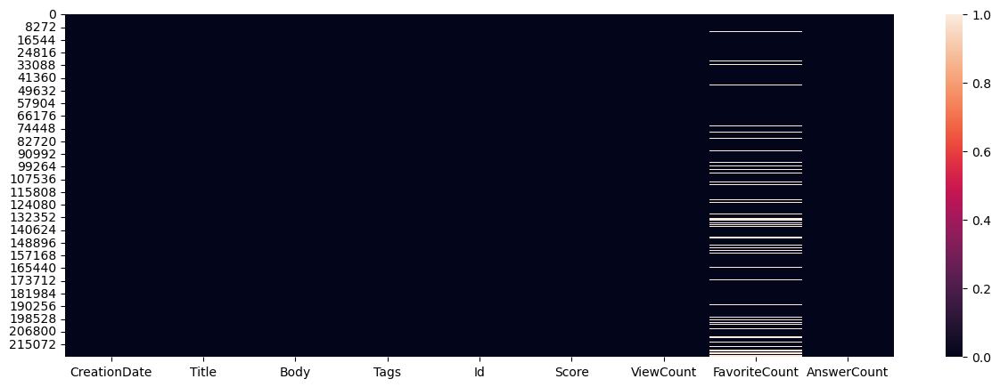

In [21]:
# représentation graphique des valeurs manquantes
fig, ax = plt.subplots(1, 1, figsize = (15, 5))
sns.heatmap(df.isna())

# noir <=> il y a une valeur.
# blanc <=> il n'y a pas de valeur.

In [22]:
# traces
# FavoriteCount
print('@' * 30, 'FavoriteCount', '@' * 30)
print(df['FavoriteCount'].nunique(), 'valeurs uniques :', 
      df['FavoriteCount'].unique())

print('nombre et fréquence de valeurs :')
print(df['FavoriteCount'].value_counts())

print('[min, max] : [', df['FavoriteCount'].min(), ',', df['FavoriteCount'].max(), ']')

# ViewCount
print('\n', '@' * 32, 'ViewCount', '@' * 31)
print('[min, max] : [', df['ViewCount'].min(), ',', df['ViewCount'].max(), ']')

# Score
print('\n', '@' * 33, 'Score', '@' * 34)
print('[min, max] : [', df['Score'].min(), ',', df['Score'].max(), ']')

# AnswerCount
print('\n', '@' * 30, 'AnswerCount', '@' * 31)
print('[min, max] : [', df['AnswerCount'].min(), ',', df['AnswerCount'].max(), ']')

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ FavoriteCount @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
4 valeurs uniques : [ 0. nan  1. 32.  2.]
nombre et fréquence de valeurs :
FavoriteCount
0.0     190652
1.0         10
32.0         1
2.0          1
Name: count, dtype: int64
[min, max] : [ 0.0 , 32.0 ]

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ ViewCount @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
[min, max] : [ 50 , 12807534 ]

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Score @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
[min, max] : [ 6 , 27009 ]

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ AnswerCount @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
[min, max] : [ 1 , 134 ]


In [23]:
# Suppression colonne 'FavoriteCount', car :
#  - peu de valeurs > 0
#  - nous avons d'autres critères de filtrage utilisés dans la commande SQL : ViewCount > 10, Score > 5, AnswerCount > 0.
df.drop(['FavoriteCount'], axis = 1, inplace = True)

In [24]:
# Vérification nombre de valeurs manquantes
nb_na = df.isnull().sum()
nb_na[nb_na > 0]

Series([], dtype: int64)

# 2.4. VALEURS DUPLIQUEES

In [25]:
df.columns

Index(['CreationDate', 'Title', 'Body', 'Tags', 'Id', 'Score', 'ViewCount',
       'AnswerCount'],
      dtype='object')

In [26]:
########################################
# Doublons entre toutes les lignes     #
########################################
# il n'y a aucune ligne dupliquée <=> il n'existe aucune ligne au niveau du dataframe qui soit la même.
df.duplicated().sum()

0

In [27]:
########################################
# Doublons colonne Body                #
########################################
# Recherche si il y a des valeurs dupliquées pour la colonne Body (corps du message)
df.duplicated(subset = 'Body').sum()

0

In [28]:
# Affichage des duplicated pour un même Body.
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.duplicated.html
idx = df.duplicated(subset = 'Body', keep = False) # Mark all duplicates as True.
df_duplicated = df.loc[idx, :].sort_values('Body')
df_duplicated

# pas de valeurs dupliquées pour un même Body.

,CreationDate,Title,Body,Tags,Id,Score,ViewCount,AnswerCount


In [29]:
########################################
# Doublons entre toutes les colonnes   #
########################################
# Recherche si il y a des valeurs dupliquées pour chaque colonne
for col in df.columns:
    n = df.duplicated(subset = col).sum()
    print(f"col : {col} -> duplicated : {n}")

col : CreationDate -> duplicated : 82
col : Title -> duplicated : 8
col : Body -> duplicated : 0
col : Tags -> duplicated : 9935
col : Id -> duplicated : 0
col : Score -> duplicated : 222203
col : ViewCount -> duplicated : 162677
col : AnswerCount -> duplicated : 223260


In [30]:
########################################
# Doublons colonne Title               #
########################################
# Affichage des duplicated pour un même Title.
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.duplicated.html
idx = df.duplicated(subset = 'Title', keep = False) # Mark all duplicates as True.
df_duplicated = df.loc[idx, :].sort_values('Title')
df_duplicated

,CreationDate,Title,Body,Tags,Id,Score,ViewCount,AnswerCount
1545,2008-09-17 10:58:14,A potentially dangerous Request.Form value was...,<p>Every time a user posts something containin...,<asp.net><asp.net-mvc><validation><html-encode...,81991,1581,1133070,48
54662,2012-02-03 14:28:36,A potentially dangerous Request.Form value was...,<p>I have this issue. I have tried everything....,<c#><jquery><asp.net><architecture><postback>,9130186,25,113706,8
22051,2010-02-22 21:50:22,Git post-receive hook not working,<p>We're using git with a central repo (using ...,<git><bash><gitosis><githooks><git-post-receive>,2314500,12,11562,3
43318,2011-02-09 21:38:22,Git post-receive hook not working,"<p>My setup is a windows XAMPP server, with cU...",<git><curl><hudson><githooks><git-post-receive>,4950800,8,14587,5
11625,2009-12-10 21:18:38,HTML Agility Pack,<p>I'm trying to use HTML Agility Pack to get ...,<c#><html><winforms><parsing><html-agility-pack>,1884094,11,14754,2
19068,2010-03-11 05:32:04,HTML Agility Pack,<p>I want to parse the html table using html a...,<c#><.net><winforms><html-parsing><html-agilit...,2422762,6,6506,1
74523,2012-08-01 12:18:04,Injection of autowired dependencies failed; ne...,"<p>I am creating web application using Spring,...",<java><spring><hibernate><spring-mvc><struts>,11759040,21,186028,3
169021,2017-03-16 11:09:21,Injection of autowired dependencies failed; ne...,<p>I am new here and I am trying to create an ...,<java><spring><hibernate><maven><spring-mvc>,42832387,6,12236,4
31924,2011-08-31 15:38:30,LINQ to Entities does not recognize the method,<p>I'm getting the following error when trying...,<.net><linq><entity-framework><linq-to-entitie...,7259567,138,161033,5
43156,2011-01-22 11:40:06,LINQ to Entities does not recognize the method,"<p>I am following <a href=""http://msdn.microso...",<entity-framework><entity-framework-4><code-fi...,4767596,6,3103,1


In [31]:
for index, row in df_duplicated.iterrows():
    if ((index == 14398) | (index == 19745)):
        print('\n', '@' * 30, 'index =', index, '@' * 30)
        print(row['Title'], row['Body'][1:250], '\n')


 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 14398 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
Pointcut matching methods with annotated parameters p>I need to create an aspect with a pointcut matching a method if:</p>

<ol>
<li>it is annoted with MyAnnotationForMethod</li>
<li>One of its parameters (can have many) is annotated with @MyAnnotationForParam (but can have other annotations as well) 


 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 19745 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
Pointcut matching methods with annotated parameters p>I need to create an aspect with a pointcut matching a method if:</p>

<ul>
<li>Is public</li>
<li>Its class is annotated with @Controller  <strong><em>(Finally does not)</em></strong></li>
<li>One of its parameters (can have many) is annotated wit 



In [ ]:
########################################
# Doublons colonnes Title & Body       #
########################################

In [32]:
 # Affichage des duplicated pour un même Title et Body.
idx = df.duplicated(subset = ['Title', 'Body'], keep = False) # Mark all duplicates as True.
df.loc[idx, :].sort_values('Title')

,CreationDate,Title,Body,Tags,Id,Score,ViewCount,AnswerCount


In [ ]:
###############################################################
#   FUSION DES 2 COLONNES      DE TYPE TEXTE : TITLE & BODY   #
#           EN 1 SEULE COLONNE DE TYPE TEXTE : TEXT           #
###############################################################

In [33]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ COLONNES TEXTE : Text + Body --> _Text                        @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# https://apprendrepython.com/concatenation-de-chaines-de-caracteres-en-python-operateur-jointure-etc/
for index, row in df.iterrows():
    
    # Stockage du résultat pour chaque ligne   
    df.loc[index, '_Text'] = df.loc[index, 'Title'] + ' ' + df.loc[index, 'Body'] # Google colab : 54 s

In [34]:
index = 10

print('index =', index, '\n')
print('@' * 30, 'Title =', '@' * 30, '\n',
      df.loc[index, 'Title'], '\n')

print('@' * 30, 'Body =', '@' * 30, '\n',
      df.loc[index, 'Body'], '\n')

print('@' * 30, '_Text =', '@' * 30, '\n',
      df.loc[index, '_Text'], '\n')

index = 10 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Title = @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 LinqDataSource - Can you limit the amount of records returned? 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Body = @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 <p>I'd like to use a <code>LinqDataSource</code> control on a page and limit the amount of records returned.  I know if I use code behind I could do something like this:</p>

<pre><code>IEnumerable&lt;int&gt; values = Enumerable.Range(0, 10);
IEnumerable&lt;int&gt; take3 = values.Take(3);
</code></pre>

<p>Does anyone know if something like this is possible with a <code>LinqDataSource</code> control?</p>

<p><strong>[Update]</strong></p>

<p>I'm going to use the <code>LinqDataSource</code> with the <code>ListView</code> control, <em>not</em> a GridView or Repeater.  The <code>LinqDataSource</code> wizard does not provide the ability to limit the number of records return.  The Advanced options only allow you to enabled deletes, inserts, and updates.</p>
 

@@@@@@@@@@@@@

In [35]:
# Suppression des colonnes Title et Body (fusionnées dans la colonne _Text)
df.drop(['Title', 'Body'], axis = 1, inplace = True)

In [36]:
########################################
# Doublons colonne _Text               #
########################################
# Vérification qu'il n'y a pas de valeurs dupliquées pour la colonne _Text
df.duplicated(subset = '_Text').sum()

0

# 2.5. DATA INSPECTION

In [37]:
# summary statistics sur les colonnes de type numérique
# (transpose met les attributs en ligne pour + de lisibilité)
df.describe(include = np.number).transpose()

,count,mean,std,min,25%,50%,75%,max
Id,223339.0,2.666292e+07,1.925549e+07,4.0,9469555.0,23685630.0,41588480.5,76403109.0
Score,223339.0,2.598959e+01,1.446805e+02,6.0,7.0,10.0,18.0,27009.0
ViewCount,223339.0,2.711956e+04,1.067922e+05,50.0,3087.0,8234.0,21179.5,12807534.0
AnswerCount,223339.0,3.394405e+00,3.495859e+00,1.0,1.0,2.0,4.0,134.0


In [38]:
# summary statistics sur les colonnes de type object
# (transpose met les attributs en ligne pour + de lisibilité)
df.describe(include = object).transpose()

,count,unique,top,freq
CreationDate,223339,223257,2014-06-23 06:12:33,2
Tags,223339,213404,<javascript><jquery><html><css><twitter-bootst...,111
_Text,223339,223339,Registry vs. INI file for storing user configu...,1


# 3. PRETRAITEMENT DU TEXTE / TEXT PROCESSING

# 3.1. BALISES DE TAGS = TARGET Y

In [39]:
# Trace colonne Tags
for i in [0, 10, 100]:
    print('@' * 40, 'index =', i, '@' * 40, '\n',
          df.loc[i, 'Tags'], '\n')

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 0 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 <windows><registry><settings><configuration-files><ini> 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 10 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 <c#><asp.net><database><linq><linq-to-sql> 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 100 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 <c#><asp.net><compilation><startup><aspnet-compiler> 



In [40]:
############################################################
# Suppression des balises de tags                          #
############################################################
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ COLONNES TAGS : Tags --> _Tags                         @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
def tags_process_dataset():
    
    # Traitement pour chaque ligne
    for index, row in df.iterrows():
    
        tags = df.loc[index, 'Tags']
        
        # Suppression des balises <>
        tags = re.sub(r"<", "", tags)
        tags = re.sub(r">", " ", tags)

        # Nombre de tags
        # https://fr.moonbooks.org/Articles/Comment-obtenir-le-nombre-de-mots-dans-un-texte-manuscript-en-python-/        
        list_of_words = tags.split()
        nb_tags = len(list_of_words)
        
        # Stockage du résultat pour chaque ligne   
        df.loc[index, '_Tags']    = tags     # liste de tags sans les balises
        df.loc[index, '_Nb_tags'] = nb_tags  # nombre de tags

In [41]:
tags_process_dataset() # Google colab : 1 min

In [42]:
# traces pour vérifier
for i in [0, 10, 100]:
    print('@' * 40, 'index =', i, '@' * 40, '\n',
          'AVANT :', df.loc[i, 'Tags'], '\n',
          'APRES :', df.loc[i, '_Tags'], '\n',
          '_Nb_tags :', df.loc[i, '_Nb_tags'], '\n')

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 0 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 AVANT : <windows><registry><settings><configuration-files><ini> 
 APRES : windows registry settings configuration-files ini  
 _Nb_tags : 5.0 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 10 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 AVANT : <c#><asp.net><database><linq><linq-to-sql> 
 APRES : c# asp.net database linq linq-to-sql  
 _Nb_tags : 5.0 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 100 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 AVANT : <c#><asp.net><compilation><startup><aspnet-compiler> 
 APRES : c# asp.net compilation startup aspnet-compiler  
 _Nb_tags : 5.0 



In [43]:
df['_Nb_tags'].describe().transpose()
# Il y a entre 5 et 6 tags par ligne.

count    223339.000000
mean          5.000031
std           0.005598
min           5.000000
25%           5.000000
50%           5.000000
75%           5.000000
max           6.000000
Name: _Nb_tags, dtype: float64

In [44]:
# Suppression des colonnes Tags et _Nb_tags
df.drop(['Tags', '_Nb_tags'], axis = 1, inplace = True)

# 3.1.1. TAGS : CORPUS & TOKENS

In [45]:
###########################
# Corpus au format texte  #
###########################
# on reconstitue le corpus en joignant l'ensemble des lignes / documents entre eux.
# On fait join avec '' et non ' ', car > a été remplacé par un blanc, la liste de tags se termine par blanc
# (cela évite d'avoir 2 blancs).
corpus_tags = ''.join(df['_Tags']) 
corpus_tags[:1_000]

'windows registry settings configuration-files ini java exception null nullpointerexception illegalargumentexception c++ oop data-structures hash maps c++ multithreading singleton construction lazy-initialization .net wcf web-services visual-studio asmx .net visual-studio tdd mbunit testdriven.net jakarta-ee deployment ant websphere ear sql sql-server database sql-server-2008 intellisense c# .net performance configuration properties language-agnostic http webserver header etag c# asp.net database linq linq-to-sql c# vb.net performance stringbuilder string.format c# c++ windows 64-bit memcached c# .net .net-3.5 wia image-scanner java xml json cross-platform configuration-files c# .net winforms visual-studio-2008 visual-studio-2005 c++ oop class syntax static asp.net performance .net-3.5 content-management-system n2 c++ winapi macos porting fopen http iis iis-7 cookies windows-vista c function pointers syntax parameters html mobile responsive-design wap wml c++ linux eclipse gdb valgrind

In [46]:
###########################
# Corpus au format token  #
###########################
token_tags = corpus_tags.split()
len(token_tags)

1116702

In [47]:
# Enregistrement dans un fichier
tmp = pd.DataFrame({'token_tag': token_tags})
tmp.to_csv(C_APP_PREPARATION + 'token_tags.txt', header = False, index = False)

In [48]:
print(token_tags[0:10])

['windows', 'registry', 'settings', 'configuration-files', 'ini', 'java', 'exception', 'null', 'nullpointerexception', 'illegalargumentexception']


In [49]:
# Nombre de fois où sont présents les tokens dans le corpus
# (certains tokens ne sont présents qu'une seule fois).
count_tags = pd.Series(token_tags).value_counts()
count_tags

java                  26280
c#                    25236
javascript            23558
python                23109
c++                   16697
                      ...  
delphi.net                1
ng-hide                   1
mpmoviewcontroller        1
bitsets                   1
visx                      1
Name: count, Length: 31402, dtype: int64

In [50]:
# Nombre de valeurs uniques
print('count_tags :', len(count_tags), 'valeurs uniques')

count_tags : 31402 valeurs uniques


In [51]:
count_tags.describe()

count    31402.000000
mean        35.561493
std        381.644076
min          1.000000
25%          1.000000
50%          3.000000
75%         11.000000
max      26280.000000
Name: count, dtype: float64

In [52]:
# 15 tokens les plus importants
count_tags.head(15)

java           26280
c#             25236
javascript     23558
python         23109
c++            16697
android        15952
ios            15631
.net           11731
html            9781
php             8871
jquery          7764
objective-c     7398
c               6818
node.js         6555
iphone          6437
Name: count, dtype: int64

In [53]:
# 15 tokens les moins importants
count_tags.tail(15)

kie-wb                 1
ibplugin               1
homomorphism           1
lighttable             1
jaxbelement            1
sigma.js               1
pdftoppm               1
pgrouting              1
screenshotexception    1
hclust                 1
delphi.net             1
ng-hide                1
mpmoviewcontroller     1
bitsets                1
visx                   1
Name: count, dtype: int64

# 3.1.2. REDUCTION DU NOMBRE DE TAGS

In [ ]:
# Réduction du nombre de tags pour en avoir moins de 30.

In [54]:
count_tag_max = count_tags.max()
count_tag_plage_min = 14 / 100 * count_tag_max

print('count_tag_max\t\t=', count_tag_max)
print('count_tag_plage_min\t=', round(count_tag_plage_min), '(14% count_tag_max)')

count_tag_max		= 26280
count_tag_plage_min	= 3679 (14% count_tag_max)


In [55]:
####################################################################
#  Recherche des tags présents plus de 14% de fois dans le dataset #
####################################################################
# https://fr.moonbooks.org/Articles/Comment-extraire-les-noms-et-valeurs-de-valuecounts-avec-pandas-en-python-/
new_liste_tags = []

count_tags_reduced = count_tags[count_tags >= count_tag_plage_min]

for idx, name in enumerate(count_tags_reduced.index.tolist()):
    if (count_tags_reduced[idx] >= count_tag_plage_min):
        # Ajout dans la liste si pas déjà présent
        if (name not in new_liste_tags):
            new_liste_tags.append(name)
            print(count_tags_reduced[idx], "\t:", name)

26280 	: java
25236 	: c#
23558 	: javascript
23109 	: python
16697 	: c++
15952 	: android
15631 	: ios
11731 	: .net
9781 	: html
8871 	: php
7764 	: jquery
7398 	: objective-c
6818 	: c
6555 	: node.js
6437 	: iphone
6344 	: css
5408 	: linux
5290 	: asp.net
5174 	: swift
5114 	: spring
5019 	: sql
4510 	: xcode
4304 	: performance
4285 	: ruby-on-rails
4025 	: json
3932 	: reactjs
3854 	: windows
3799 	: mysql


In [56]:
# Nombre de valeurs uniques
print('new_liste_tags :', len(new_liste_tags), 'valeurs uniques :\n')

# liste triée
# https://www.cours-gratuit.com/tutoriel-python/tutoriel-python-list-comment-ordonnertrier-une-liste
print(sorted(new_liste_tags))

# ==> on garde 28 valeurs de tags sur 31402 présents initialement.

new_liste_tags : 28 valeurs uniques :

['.net', 'android', 'asp.net', 'c', 'c#', 'c++', 'css', 'html', 'ios', 'iphone', 'java', 'javascript', 'jquery', 'json', 'linux', 'mysql', 'node.js', 'objective-c', 'performance', 'php', 'python', 'reactjs', 'ruby-on-rails', 'spring', 'sql', 'swift', 'windows', 'xcode']


In [57]:
#####################################################################
# Recherche des 2 tags les plus représentés pour chaque ligne       #
#####################################################################
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ COLONNES TAGS : Tags --> _Tags  --> _Tag_1, _Tag_2     @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

def reduction_tags_dataset():
    
    # initialisation
    count              = 0 
    lignes_a_supprimer = []

    for index, row in df.iterrows():
        # initialisation
        tags       = row['_Tags']
        token_tags = tags.split()
        dict_tags  = {}
    
        # Sélection des tags qui sont dans la liste
        for i in np.arange(0, len(token_tags)):
            if token_tags[i] in new_liste_tags:
                # On stocke les tags et leur fréquence dans un dictionnaire
                # Exemple : count_tags['java']   = 26280
                #           count_tags['python'] = 23109
                # => dict_tags['java'] = 26280
                dict_tags[token_tags[i]] = count_tags[token_tags[i]]
        
        len_dict_tags = len(dict_tags)
        
        if (count < 10):
            print('index =', index, ':', '\n',
                  '\t- _Tags\t\t=', row['_Tags'], '\n', 
                  '\t- dict_tags\t= ', dict_tags, '\n',
                  '\t- len_dict_tags\t=', len_dict_tags)
    
        # 0 tags : on supprime la ligne si il n'y a plus de tags
        if (len_dict_tags == 0):
            lignes_a_supprimer.append(index)
            if (count < 10):
                print('\t - AUCUN TAG => SUPPRESSION LIGNE\n')
        
        else:
            # Recherche des 2 plus grandes valeurs
            # https://www.delftstack.com/fr/howto/python/find-max-value-in-dictionary-python/
            # https://fr.code-paper.com/python/examples-max-value-from-a-dictionary-in-python
            max_key_1 = max(dict_tags, key = dict_tags.get)
            df.loc[index, '_Tag_1'] = max_key_1
            # suppression du dictionnaire 
            del(dict_tags[max_key_1])
            
            # Plus de 2 tags
            if (len_dict_tags >= 2):
                max_key_2 = max(dict_tags, key = dict_tags.get)
                df.loc[index, '_Tag_2'] = max_key_2
            
            # 1 seul tag
            else: 
                df.loc[index, '_Tag_2'] = 'no_tag' # Valeur vide pour _Tag_2
            
            # Affichage de 10 valeurs
            if (count < 10):
                print('\t - _Tag_1 =', df.loc[index, '_Tag_1'], ', _Tag_2 =', df.loc[index, '_Tag_2'], '\n')             

        count = count + 1
    

    # Suppression des tags vides (en donnant index)
    df.drop(lignes_a_supprimer, axis = 0, inplace = True)
    print("\n==>", len(lignes_a_supprimer), "lignes supprimées\n")

In [58]:
reduction_tags_dataset() # Google colab : 59 s

index = 0 : 
 	- _Tags		= windows registry settings configuration-files ini  
 	- dict_tags	=  {'windows': 3854} 
 	- len_dict_tags	= 1
	 - _Tag_1 = windows , _Tag_2 = no_tag 

index = 1 : 
 	- _Tags		= java exception null nullpointerexception illegalargumentexception  
 	- dict_tags	=  {'java': 26280} 
 	- len_dict_tags	= 1
	 - _Tag_1 = java , _Tag_2 = no_tag 

index = 2 : 
 	- _Tags		= c++ oop data-structures hash maps  
 	- dict_tags	=  {'c++': 16697} 
 	- len_dict_tags	= 1
	 - _Tag_1 = c++ , _Tag_2 = no_tag 

index = 3 : 
 	- _Tags		= c++ multithreading singleton construction lazy-initialization  
 	- dict_tags	=  {'c++': 16697} 
 	- len_dict_tags	= 1
	 - _Tag_1 = c++ , _Tag_2 = no_tag 

index = 4 : 
 	- _Tags		= .net wcf web-services visual-studio asmx  
 	- dict_tags	=  {'.net': 11731} 
 	- len_dict_tags	= 1
	 - _Tag_1 = .net , _Tag_2 = no_tag 

index = 5 : 
 	- _Tags		= .net visual-studio tdd mbunit testdriven.net  
 	- dict_tags	=  {'.net': 11731} 
 	- len_dict_tags	= 1
	 - _Ta

In [59]:
# Vérification qu'il n'y a pas de _Tag_2 vide (sinon mise à jour avec 'no_tag')
count = 0

for index, row in df.iterrows():
    if (pd.isna(row['_Tag_2'])):
        count = count + 1
        df.loc[index, '_Tag_2'] = 'no_tag'
        
print(count, 'lignes corrigées pour _Tag_2 : nan --> \'no_tag\'')

0 lignes corrigées pour _Tag_2 : nan --> 'no_tag'


In [60]:
# trace pour vérifier maj _Tag_1 et _Tag_2
count = 0

for index, row in df.iterrows():
    if (count < 20):
        print('index = ', index, ', _Tag_1 =', row['_Tag_1'], '\t, _Tag_2 =', row['_Tag_2'])
    else:
        break
    count = count + 1

index =  0 , _Tag_1 = windows 	, _Tag_2 = no_tag
index =  1 , _Tag_1 = java 	, _Tag_2 = no_tag
index =  2 , _Tag_1 = c++ 	, _Tag_2 = no_tag
index =  3 , _Tag_1 = c++ 	, _Tag_2 = no_tag
index =  4 , _Tag_1 = .net 	, _Tag_2 = no_tag
index =  5 , _Tag_1 = .net 	, _Tag_2 = no_tag
index =  7 , _Tag_1 = sql 	, _Tag_2 = no_tag
index =  8 , _Tag_1 = c# 	, _Tag_2 = .net
index =  10 , _Tag_1 = c# 	, _Tag_2 = asp.net
index =  11 , _Tag_1 = c# 	, _Tag_2 = performance
index =  12 , _Tag_1 = c# 	, _Tag_2 = c++
index =  13 , _Tag_1 = c# 	, _Tag_2 = .net
index =  14 , _Tag_1 = java 	, _Tag_2 = json
index =  15 , _Tag_1 = c# 	, _Tag_2 = .net
index =  16 , _Tag_1 = c++ 	, _Tag_2 = no_tag
index =  17 , _Tag_1 = asp.net 	, _Tag_2 = performance
index =  18 , _Tag_1 = c++ 	, _Tag_2 = no_tag
index =  20 , _Tag_1 = c 	, _Tag_2 = no_tag
index =  21 , _Tag_1 = html 	, _Tag_2 = no_tag
index =  22 , _Tag_1 = c++ 	, _Tag_2 = linux


In [61]:
# Suppression de la colonne _Tags
df.drop(['_Tags'], axis = 1, inplace = True)

In [62]:
# Informations sur le dataframe : shape, nombre de lignes, indice du dernier élément.
df_info(df_in = df)

df shape		= (182919, 8)
nb lignes		= 182919
indice dernier élément 	= 223338


# 3.2. BALISES HTML

In [63]:
# Trace colonne _Text
for i in [1, 10, 100]:
    print('@' * 40, 'index =', i, '@' * 40, '\n',
          df.loc[i, '_Text'], '\n')

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 1 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 IllegalArgumentException or NullPointerException for a null parameter? <p>I have a simple setter method for a property and <code>null</code> is not appropriate for this particular property. I have always been torn in this situation: should I throw an <a href="http://docs.oracle.com/javase/7/docs/api/java/lang/IllegalArgumentException.html" rel="noreferrer"><code>IllegalArgumentException</code></a>, or a <a href="http://docs.oracle.com/javase/7/docs/api/java/lang/NullPointerException.html" rel="noreferrer"><code>NullPointerException</code></a>? From the javadocs, both seem appropriate. Is there some kind of an understood standard?  Or is this just one of those things that you should do whatever you prefer and both are really correct?</p>
 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 10 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 LinqDataSource - Can you limit the amount of records returned

In [64]:
########################################################################
# Pour une ligne :                                                     #
#   - Suppression des balises HTML                                     #
#   - Passage en minuscules                                            #
########################################################################
def html_process(index_in, is_affichage_in):

    # https://stackoverflow.com/questions/37018475/python-remove-all-html-tags-from-string
    if (is_affichage_in):
        print('index_in =', index_in, '\n')
    
    markup = df.loc[index_in, '_Text']
    
    if (is_affichage_in):
        print('@' * 40, 'html_process - début', '@' * 40)
        print(markup, '\n')
    
    
    # Suppression des balises HTML
    soup = BeautifulSoup(markup)
    soup_text = soup.get_text()
    
    
    # On met tout le texte en minuscule  
    soup_text = soup_text.lower()
        
    if (is_affichage_in):    
        print('@' * 40, 'html_process - fin', '@' * 40)
        print(soup_text)
    
    return soup_text

In [65]:
text = html_process(index_in        = 10, 
                    is_affichage_in = True)

index_in = 10 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ html_process - début @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
LinqDataSource - Can you limit the amount of records returned? <p>I'd like to use a <code>LinqDataSource</code> control on a page and limit the amount of records returned.  I know if I use code behind I could do something like this:</p>

<pre><code>IEnumerable&lt;int&gt; values = Enumerable.Range(0, 10);
IEnumerable&lt;int&gt; take3 = values.Take(3);
</code></pre>

<p>Does anyone know if something like this is possible with a <code>LinqDataSource</code> control?</p>

<p><strong>[Update]</strong></p>

<p>I'm going to use the <code>LinqDataSource</code> with the <code>ListView</code> control, <em>not</em> a GridView or Repeater.  The <code>LinqDataSource</code> wizard does not provide the ability to limit the number of records return.  The Advanced options only allow you to enabled deletes, inserts, and updates.</p>
 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ html_proces

In [66]:
########################################################################
# Pour tout le dataset :                                               #
#   - Suppression des balises HTML                                     #
#   - Passage en minuscules                                            #
########################################################################
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ COLONNES TEXTE : Text + Body --> _Text --> _Text_sans_html    @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

def html_process_dataset():
    
    lignes_a_supprimer = [] # initialisation
    
    # Traitement pour chaque ligne
    for index, row in df.iterrows():
    
        text = html_process(index_in        = index, 
                            is_affichage_in = False)
   
      
        # Suppression ligne si text vide (valeur NaN)
        # https://www.delftstack.com/fr/howto/python/check-for-nan-values-python/        
        if (pd.isna(text)):
            lignes_a_supprimer.append(index)

        # Sinon : mise à jour dans le dataset : stockage du résultat pour chaque ligne
        # https://www.delftstack.com/fr/howto/python/how-to-convert-a-list-to-string/
        # Convertir une liste qui a des éléments de type de données str en une chaîne de caractères.            
        else:  
            df.loc[index, '_Text_sans_html'] = text
        
    # Suppression des lignes sans tokens
    df.drop(lignes_a_supprimer, axis = 0, inplace = True)
    print("==>", len(lignes_a_supprimer), "ligne(s) supprimée(s)\n")

In [67]:
html_process_dataset() # Google colab : 3 min 39 s

==> 0 ligne(s) supprimée(s)



In [68]:
# Trace (pour vérifier)
index = 10

print('@' * 40, '_Text / index =', index, '@' * 40, '\n',
      df.loc[i, '_Text'], '\n\n',
      '@' * 35, '_Text_sans_html / index =', index, '@' * 35, '\n',
      df.loc[i, '_Text_sans_html'], '\n')

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text / index = 10 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 Precompilation and startup times on ASP.Net <p>I am developping a (relatively small) website in ASP.Net 2.0. I am also using nAnt to perform some easy tweaking on my project before delivering executables. In its current state, the website is "precompiled" using </p>

<blockquote>
  <p><code>aspnet_compiler.exe -nologo -v ${Appname} -u ${target}</code></p>
</blockquote>

<p>I have noticed that after the IIS pool is restarted (after a idle shutdown or a recycle), the application takes up to 20 seconds before it is back online (and Application_start is reached).</p>

<p>I don't have the same issue when I am debugging directly within Visual Studio (it takes 2 seconds to start) so I am wondering if the aspnet_compiler is really such a good idea.</p>

<p>I couldn't find much on MSDN. How do you compile your websites for production?</p>
 

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html

In [ ]:
#############################################
#         Nombre de mots par ligne          #
#############################################

In [69]:
# Calcul nombre de mots par ligne
def calcul_nb_mots_par_ligne(colonne_in, colonne_nb_mots_in):
    for index, row in df.iterrows():
        # suppression ligne vide
        if (pd.isna(row[colonne_in])):
            print('ligne_a_supprimer :', index, '(vide)')  
            df.drop(index, axis = 0, inplace = True)
        # sinon calcul nb mots dans la ligne et stockage dans une nouvelle colonne
        else:
            df.loc[index, colonne_nb_mots_in] = len(row[colonne_in].split())

In [70]:
# Suppression ligne si contient moins que nb_min_in mots
def suppression_si_nb_mots_par_ligne(colonne_nb_mots_in, nb_min_in):
    
    # Suppression des données avec moins de nb_min_in mots pour diminuer le nombre de données 
    # et augmenter le temps de processus.
    df_words_inf = df.loc[df[colonne_nb_mots_in] < nb_min_in,:]

    # Nombre de lignes avant correction
    print('nb lignes avec', colonne_nb_mots_in, '<', nb_min_in, '=', len(df_words_inf.index))
    
    lignes_a_supprimer = []
     
    for index in df_words_inf.index:
        lignes_a_supprimer.append(index)
        
    df.drop(lignes_a_supprimer, axis = 0, inplace = True)
    print("==>", len(lignes_a_supprimer), "lignes supprimées\n")

In [71]:
# Calcul nombre de mots par ligne pour colonne '_Text_sans_html'
calcul_nb_mots_par_ligne(colonne_in         = '_Text_sans_html', 
                         colonne_nb_mots_in = '_nb_words_Text_sans_html')

In [72]:
# output de sortie pour contrôler que l'opération s'est bien effectuée.
df.describe(include = np.number)
# la grande majorité des messages (50 %) a 147 mots.
# Certains ont une taille très élevée (10.740).
# 25 % a 91 mots => choix de supprimer les lignes qui ont moins de 100 mots pour alléger les processus.

,Id,Score,ViewCount,AnswerCount,_nb_words_Text_sans_html
count,1.829190e+05,182919.000000,1.829190e+05,182919.000000,182919.000000
mean,2.625240e+07,25.818324,2.778012e+04,3.462117,198.846282
std,1.897768e+07,125.835538,1.014833e+05,3.534243,189.759238
min,4.000000e+00,6.000000,5.100000e+01,1.000000,0.000000
25%,9.373776e+06,7.000000,3.150000e+03,2.000000,91.000000
50%,2.323330e+07,10.000000,8.474000e+03,3.000000,147.000000
75%,4.067546e+07,18.000000,2.189850e+04,4.000000,241.000000
max,7.640311e+07,27009.000000,1.019836e+07,127.000000,10740.000000


In [73]:
suppression_si_nb_mots_par_ligne(colonne_nb_mots_in = '_nb_words_Text_sans_html', 
                                 nb_min_in          = 100)

nb lignes avec _nb_words_Text_sans_html < 100 = 53004
==> 53004 lignes supprimées



In [74]:
# suppression de la colonne
df.drop(['_nb_words_Text_sans_html'], axis = 1, inplace = True)

In [75]:
# Informations sur le dataframe : shape, nombre de lignes, indice du dernier élément.
df_info(df_in = df)

df shape		= (129915, 9)
nb lignes		= 129915
indice dernier élément 	= 223338


In [76]:
# Réinitialisation de l’index du dataFrame :
#   --> Après la suppression des lignes ci-dessus.
#   --> Avant §3.3. Nettoyage : tokenization, suppressions (stop words, nombres...).
# https://www.delftstack.com/fr/howto/python-pandas/pandas-reset-index-python/
df.reset_index(inplace = True, drop = True)

In [77]:
# Informations sur le dataframe : shape, nombre de lignes, indice du dernier élément.
df_info(df_in = df)

df shape		= (129915, 9)
nb lignes		= 129915
indice dernier élément 	= 129914


# 3.3. NETTOYAGE : TOKENISATION, SUPPRESSIONS (STOP WORDS, NOMBRES...)

In [78]:
##########################################################
#              Affichage taille des tokens               #
##########################################################
def affichage_token_size(tokens_in):
    
    print(tokens_in)
    
    # nombre de tokens
    print('\nnombre de tokens\t\t=', len(tokens_in))

    # nombre de tokens uniques
    print('nombre de tokens uniques\t=', len(set(tokens_in)))

In [ ]:
if (C_EXECUTION_SUR_GOOGLE_COLAB):
    import nltk
    nltk.download('stopwords')
    nltk.download('words')

In [79]:
########################################################################
#   Stop words = liste de mots trop génériques pour être informatif.   #
########################################################################
stop_words = set(stopwords.words('english'))  # langage = anglais
print(stop_words)

{'of', 'm', 'above', 'than', 'our', 're', 've', 'y', "isn't", 'again', 'mustn', "you'll", "you'd", 'until', 'just', 'him', 'or', 'through', 'who', "haven't", 'should', 'needn', "hadn't", 'at', 'how', 'but', 'such', 'by', 'their', 'on', 'into', 'against', "that'll", "weren't", 'he', 'haven', 'each', 'when', 'a', 'himself', 'because', 'about', 'if', 'an', 'same', 'ain', 'further', 'them', 'did', 'hers', 'i', 'most', 'having', 'before', 'mightn', "shan't", "needn't", 'my', 'myself', 'herself', 'll', "couldn't", 'in', 'only', 'wasn', "you're", 'not', 'is', 'this', 'few', 'now', "mustn't", 'ma', 'we', 'do', 'isn', 'weren', 'where', "hasn't", 'under', 'from', 'while', 'all', 'any', 'o', "wouldn't", 'you', 'the', 'those', 'are', 'will', 'ourselves', 'it', 'was', 'and', 'some', 'here', 'been', "won't", 'am', 'with', 'ours', 'which', 'does', 'yours', 'had', 'for', 'down', 'more', 'these', 'between', 'didn', "wasn't", 'no', 'up', 'as', 'what', "aren't", 'then', 'doing', 'shouldn', 'has', 'd', 'c

In [80]:
# Enregistrement dans un fichier pour l'API
tmp = pd.DataFrame({'stop_word': list(stop_words)})
tmp.to_csv(C_APP_PREPARATION + 'stop_words.txt', header = False, index = False)

In [ ]:
#################################################
#        Dictionnaire des mots anglais          #
#################################################

In [81]:
# on uniformise en ne prenant que les mots en minuscules
english_words = [i.lower() for i in words.words()]
pd.Series(english_words).sample(15)

38981              cognosce
119655           morphonomy
47373         cyathophyllum
148873           plumaceous
33683            characetum
187166             splenoma
158694    pseudofluctuation
108008           logomacher
125645        noncontraband
139379             parching
185854        spatterdashed
178631        sequentiality
232248               widely
89810         hyphomycetous
228266           vesiculase
dtype: object

In [82]:
len(english_words)

236736

In [83]:
# Enregistrement dans un fichier pour l'API
tmp = pd.DataFrame({'english_word': english_words})
tmp.to_csv(C_APP_PREPARATION + 'english_words.txt', header = False, index = False)

In [84]:
# Initialisation RegexpTokenizer
tokenizer = RegexpTokenizer(r'\w+')

In [86]:
################################################################################################
# Pour une ligne, travail au niveau des chaînes de caractères :                                #
#  - Tokenization                                                                              #
#  - Suppressions : ponctuation, caractères 'blancs', mots alphanumeriques, nombres            #
#  - Transform emojis to characters                                                            #
################################################################################################
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ COLONNES TEXTE : Text + Body --> _Text --> _Text_sans_html --> _Text_tokens_chaine  @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

def cleaning_process_dataset_chaine(index_min_in, index_max_in):
    
    tic = time.perf_counter()
#    print('tic =', tic)
    
    print('index_min_in =', index_min_in, ', index_max_in =', index_max_in,
          '=>', index_max_in - index_min_in + 1, 'lignes\n')

    
    # https://moncoachdata.com/blog/filtrer-un-dataframe-pandas/
    df_filtered = df.loc[index_min_in:index_max_in, :] # lignes index_min_in à index_max_in, toutes les colonnes
            
    for index, row in df_filtered.iterrows():
        print('index =', index)
    
        # Suppression ponctuation (remplacement par un caractère blanc)
        # Ponctuation =  !"#$%&'()*+,-./:;<=>?@[\]^_`{|}~ 
        doc_sans_ponctuation = re.sub(f"[{re.escape(punctuation)}]", " ", row['_Text_sans_html'])

    
        # Tokenization : liste de tokens bruts
        tokens = tokenizer.tokenize(doc_sans_ponctuation)
            
    
        # Suppression de tous les caractères "blanc" (\s) i.e. équivalent à la classe [ \t\n\r\f\v].
        # https://docs.python.org/fr/3/howto/regex.html
        tokens_no_blanc = [w for w in tokens if not (bool(re.search(r'\s', w)))]
        
        
        # Suppression des mots alphanumeriques (exemple : 4cb9df79467b3eb5d6787a98dcf8665)
        # https://www.delftstack.com/fr/howto/python/how-to-check-a-string-contains-a-number-or-not-in-python/
        # <=> on regarde si la chaîne de caractère contient un nombre.
        # Suppression de tous les caractères numériques (\d) i.e. équivalent à la classe [0-9].
        # https://docs.python.org/fr/3/howto/regex.html        
        tokens_no_alphanum = [w for w in tokens_no_blanc if not (bool(re.search(r'\d', w)))]
        
        
        # Suppression des nombres    
        tokens_no_nombre = [w for w in tokens_no_alphanum if not (w.isdigit())]
                
        
        # Conversion liste de tokens de type str --> une chaîne de caractères.        
        # https://www.delftstack.com/fr/howto/python/how-to-convert-a-list-to-string/
        text_clean = ' '.join(tokens_no_nombre)


        # Transform emojis to characters
        text_no_emojis = emoji.demojize(text_clean)  
    
    
        # Maj dataset
        df.loc[index, '_Text_tokens_chaine'] = text_no_emojis
    
    
    toc = time.perf_counter()
#    print('toc =', toc)    
    
    
    print(f"cleaning_process_dataset_chaine en {toc - tic:0.3f} secondes <=> {(toc - tic)/60:0.1f} minutes")

In [87]:
# Cleaning au niveau des chaînes de caractères pour tout le dataset
cleaning_process_dataset_chaine(index_min_in = 0, 
                                index_max_in = df.index[-1]) # 5.6 minutes

index_min_in = 0 , index_max_in = 129914 => 129915 lignes

index = 0
index = 1
index = 2
index = 3
index = 4
index = 5
index = 6
index = 7
index = 8
index = 9
index = 10
index = 11
index = 12
index = 13
index = 14
index = 15
index = 16
index = 17
index = 18
index = 19
index = 20
index = 21
index = 22
index = 23
index = 24
index = 25
index = 26
index = 27
index = 28
index = 29
index = 30
index = 31
index = 32
index = 33
index = 34
index = 35
index = 36
index = 37
index = 38
index = 39
index = 40
index = 41
index = 42
index = 43
index = 44
index = 45
index = 46
index = 47
index = 48
index = 49
index = 50
index = 51
index = 52
index = 53
index = 54
index = 55
index = 56
index = 57
index = 58
index = 59
index = 60
index = 61
index = 62
index = 63
index = 64
index = 65
index = 66
index = 67
index = 68
index = 69
index = 70
index = 71
index = 72
index = 73
index = 74
index = 75
index = 76
index = 77
index = 78
index = 79
index = 80
index = 81
index = 82
index = 83
index = 84
index = 85
index

index = 709
index = 710
index = 711
index = 712
index = 713
index = 714
index = 715
index = 716
index = 717
index = 718
index = 719
index = 720
index = 721
index = 722
index = 723
index = 724
index = 725
index = 726
index = 727
index = 728
index = 729
index = 730
index = 731
index = 732
index = 733
index = 734
index = 735
index = 736
index = 737
index = 738
index = 739
index = 740
index = 741
index = 742
index = 743
index = 744
index = 745
index = 746
index = 747
index = 748
index = 749
index = 750
index = 751
index = 752
index = 753
index = 754
index = 755
index = 756
index = 757
index = 758
index = 759
index = 760
index = 761
index = 762
index = 763
index = 764
index = 765
index = 766
index = 767
index = 768
index = 769
index = 770
index = 771
index = 772
index = 773
index = 774
index = 775
index = 776
index = 777
index = 778
index = 779
index = 780
index = 781
index = 782
index = 783
index = 784
index = 785
index = 786
index = 787
index = 788
index = 789
index = 790
index = 791
inde

index = 1434
index = 1435
index = 1436
index = 1437
index = 1438
index = 1439
index = 1440
index = 1441
index = 1442
index = 1443
index = 1444
index = 1445
index = 1446
index = 1447
index = 1448
index = 1449
index = 1450
index = 1451
index = 1452
index = 1453
index = 1454
index = 1455
index = 1456
index = 1457
index = 1458
index = 1459
index = 1460
index = 1461
index = 1462
index = 1463
index = 1464
index = 1465
index = 1466
index = 1467
index = 1468
index = 1469
index = 1470
index = 1471
index = 1472
index = 1473
index = 1474
index = 1475
index = 1476
index = 1477
index = 1478
index = 1479
index = 1480
index = 1481
index = 1482
index = 1483
index = 1484
index = 1485
index = 1486
index = 1487
index = 1488
index = 1489
index = 1490
index = 1491
index = 1492
index = 1493
index = 1494
index = 1495
index = 1496
index = 1497
index = 1498
index = 1499
index = 1500
index = 1501
index = 1502
index = 1503
index = 1504
index = 1505
index = 1506
index = 1507
index = 1508
index = 1509
index = 1510

index = 2072
index = 2073
index = 2074
index = 2075
index = 2076
index = 2077
index = 2078
index = 2079
index = 2080
index = 2081
index = 2082
index = 2083
index = 2084
index = 2085
index = 2086
index = 2087
index = 2088
index = 2089
index = 2090
index = 2091
index = 2092
index = 2093
index = 2094
index = 2095
index = 2096
index = 2097
index = 2098
index = 2099
index = 2100
index = 2101
index = 2102
index = 2103
index = 2104
index = 2105
index = 2106
index = 2107
index = 2108
index = 2109
index = 2110
index = 2111
index = 2112
index = 2113
index = 2114
index = 2115
index = 2116
index = 2117
index = 2118
index = 2119
index = 2120
index = 2121
index = 2122
index = 2123
index = 2124
index = 2125
index = 2126
index = 2127
index = 2128
index = 2129
index = 2130
index = 2131
index = 2132
index = 2133
index = 2134
index = 2135
index = 2136
index = 2137
index = 2138
index = 2139
index = 2140
index = 2141
index = 2142
index = 2143
index = 2144
index = 2145
index = 2146
index = 2147
index = 2148

index = 2731
index = 2732
index = 2733
index = 2734
index = 2735
index = 2736
index = 2737
index = 2738
index = 2739
index = 2740
index = 2741
index = 2742
index = 2743
index = 2744
index = 2745
index = 2746
index = 2747
index = 2748
index = 2749
index = 2750
index = 2751
index = 2752
index = 2753
index = 2754
index = 2755
index = 2756
index = 2757
index = 2758
index = 2759
index = 2760
index = 2761
index = 2762
index = 2763
index = 2764
index = 2765
index = 2766
index = 2767
index = 2768
index = 2769
index = 2770
index = 2771
index = 2772
index = 2773
index = 2774
index = 2775
index = 2776
index = 2777
index = 2778
index = 2779
index = 2780
index = 2781
index = 2782
index = 2783
index = 2784
index = 2785
index = 2786
index = 2787
index = 2788
index = 2789
index = 2790
index = 2791
index = 2792
index = 2793
index = 2794
index = 2795
index = 2796
index = 2797
index = 2798
index = 2799
index = 2800
index = 2801
index = 2802
index = 2803
index = 2804
index = 2805
index = 2806
index = 2807

index = 3506
index = 3507
index = 3508
index = 3509
index = 3510
index = 3511
index = 3512
index = 3513
index = 3514
index = 3515
index = 3516
index = 3517
index = 3518
index = 3519
index = 3520
index = 3521
index = 3522
index = 3523
index = 3524
index = 3525
index = 3526
index = 3527
index = 3528
index = 3529
index = 3530
index = 3531
index = 3532
index = 3533
index = 3534
index = 3535
index = 3536
index = 3537
index = 3538
index = 3539
index = 3540
index = 3541
index = 3542
index = 3543
index = 3544
index = 3545
index = 3546
index = 3547
index = 3548
index = 3549
index = 3550
index = 3551
index = 3552
index = 3553
index = 3554
index = 3555
index = 3556
index = 3557
index = 3558
index = 3559
index = 3560
index = 3561
index = 3562
index = 3563
index = 3564
index = 3565
index = 3566
index = 3567
index = 3568
index = 3569
index = 3570
index = 3571
index = 3572
index = 3573
index = 3574
index = 3575
index = 3576
index = 3577
index = 3578
index = 3579
index = 3580
index = 3581
index = 3582

index = 4215
index = 4216
index = 4217
index = 4218
index = 4219
index = 4220
index = 4221
index = 4222
index = 4223
index = 4224
index = 4225
index = 4226
index = 4227
index = 4228
index = 4229
index = 4230
index = 4231
index = 4232
index = 4233
index = 4234
index = 4235
index = 4236
index = 4237
index = 4238
index = 4239
index = 4240
index = 4241
index = 4242
index = 4243
index = 4244
index = 4245
index = 4246
index = 4247
index = 4248
index = 4249
index = 4250
index = 4251
index = 4252
index = 4253
index = 4254
index = 4255
index = 4256
index = 4257
index = 4258
index = 4259
index = 4260
index = 4261
index = 4262
index = 4263
index = 4264
index = 4265
index = 4266
index = 4267
index = 4268
index = 4269
index = 4270
index = 4271
index = 4272
index = 4273
index = 4274
index = 4275
index = 4276
index = 4277
index = 4278
index = 4279
index = 4280
index = 4281
index = 4282
index = 4283
index = 4284
index = 4285
index = 4286
index = 4287
index = 4288
index = 4289
index = 4290
index = 4291

index = 4935
index = 4936
index = 4937
index = 4938
index = 4939
index = 4940
index = 4941
index = 4942
index = 4943
index = 4944
index = 4945
index = 4946
index = 4947
index = 4948
index = 4949
index = 4950
index = 4951
index = 4952
index = 4953
index = 4954
index = 4955
index = 4956
index = 4957
index = 4958
index = 4959
index = 4960
index = 4961
index = 4962
index = 4963
index = 4964
index = 4965
index = 4966
index = 4967
index = 4968
index = 4969
index = 4970
index = 4971
index = 4972
index = 4973
index = 4974
index = 4975
index = 4976
index = 4977
index = 4978
index = 4979
index = 4980
index = 4981
index = 4982
index = 4983
index = 4984
index = 4985
index = 4986
index = 4987
index = 4988
index = 4989
index = 4990
index = 4991
index = 4992
index = 4993
index = 4994
index = 4995
index = 4996
index = 4997
index = 4998
index = 4999
index = 5000
index = 5001
index = 5002
index = 5003
index = 5004
index = 5005
index = 5006
index = 5007
index = 5008
index = 5009
index = 5010
index = 5011

index = 5640
index = 5641
index = 5642
index = 5643
index = 5644
index = 5645
index = 5646
index = 5647
index = 5648
index = 5649
index = 5650
index = 5651
index = 5652
index = 5653
index = 5654
index = 5655
index = 5656
index = 5657
index = 5658
index = 5659
index = 5660
index = 5661
index = 5662
index = 5663
index = 5664
index = 5665
index = 5666
index = 5667
index = 5668
index = 5669
index = 5670
index = 5671
index = 5672
index = 5673
index = 5674
index = 5675
index = 5676
index = 5677
index = 5678
index = 5679
index = 5680
index = 5681
index = 5682
index = 5683
index = 5684
index = 5685
index = 5686
index = 5687
index = 5688
index = 5689
index = 5690
index = 5691
index = 5692
index = 5693
index = 5694
index = 5695
index = 5696
index = 5697
index = 5698
index = 5699
index = 5700
index = 5701
index = 5702
index = 5703
index = 5704
index = 5705
index = 5706
index = 5707
index = 5708
index = 5709
index = 5710
index = 5711
index = 5712
index = 5713
index = 5714
index = 5715
index = 5716

index = 6294
index = 6295
index = 6296
index = 6297
index = 6298
index = 6299
index = 6300
index = 6301
index = 6302
index = 6303
index = 6304
index = 6305
index = 6306
index = 6307
index = 6308
index = 6309
index = 6310
index = 6311
index = 6312
index = 6313
index = 6314
index = 6315
index = 6316
index = 6317
index = 6318
index = 6319
index = 6320
index = 6321
index = 6322
index = 6323
index = 6324
index = 6325
index = 6326
index = 6327
index = 6328
index = 6329
index = 6330
index = 6331
index = 6332
index = 6333
index = 6334
index = 6335
index = 6336
index = 6337
index = 6338
index = 6339
index = 6340
index = 6341
index = 6342
index = 6343
index = 6344
index = 6345
index = 6346
index = 6347
index = 6348
index = 6349
index = 6350
index = 6351
index = 6352
index = 6353
index = 6354
index = 6355
index = 6356
index = 6357
index = 6358
index = 6359
index = 6360
index = 6361
index = 6362
index = 6363
index = 6364
index = 6365
index = 6366
index = 6367
index = 6368
index = 6369
index = 6370

index = 6927
index = 6928
index = 6929
index = 6930
index = 6931
index = 6932
index = 6933
index = 6934
index = 6935
index = 6936
index = 6937
index = 6938
index = 6939
index = 6940
index = 6941
index = 6942
index = 6943
index = 6944
index = 6945
index = 6946
index = 6947
index = 6948
index = 6949
index = 6950
index = 6951
index = 6952
index = 6953
index = 6954
index = 6955
index = 6956
index = 6957
index = 6958
index = 6959
index = 6960
index = 6961
index = 6962
index = 6963
index = 6964
index = 6965
index = 6966
index = 6967
index = 6968
index = 6969
index = 6970
index = 6971
index = 6972
index = 6973
index = 6974
index = 6975
index = 6976
index = 6977
index = 6978
index = 6979
index = 6980
index = 6981
index = 6982
index = 6983
index = 6984
index = 6985
index = 6986
index = 6987
index = 6988
index = 6989
index = 6990
index = 6991
index = 6992
index = 6993
index = 6994
index = 6995
index = 6996
index = 6997
index = 6998
index = 6999
index = 7000
index = 7001
index = 7002
index = 7003

index = 7651
index = 7652
index = 7653
index = 7654
index = 7655
index = 7656
index = 7657
index = 7658
index = 7659
index = 7660
index = 7661
index = 7662
index = 7663
index = 7664
index = 7665
index = 7666
index = 7667
index = 7668
index = 7669
index = 7670
index = 7671
index = 7672
index = 7673
index = 7674
index = 7675
index = 7676
index = 7677
index = 7678
index = 7679
index = 7680
index = 7681
index = 7682
index = 7683
index = 7684
index = 7685
index = 7686
index = 7687
index = 7688
index = 7689
index = 7690
index = 7691
index = 7692
index = 7693
index = 7694
index = 7695
index = 7696
index = 7697
index = 7698
index = 7699
index = 7700
index = 7701
index = 7702
index = 7703
index = 7704
index = 7705
index = 7706
index = 7707
index = 7708
index = 7709
index = 7710
index = 7711
index = 7712
index = 7713
index = 7714
index = 7715
index = 7716
index = 7717
index = 7718
index = 7719
index = 7720
index = 7721
index = 7722
index = 7723
index = 7724
index = 7725
index = 7726
index = 7727

index = 8389
index = 8390
index = 8391
index = 8392
index = 8393
index = 8394
index = 8395
index = 8396
index = 8397
index = 8398
index = 8399
index = 8400
index = 8401
index = 8402
index = 8403
index = 8404
index = 8405
index = 8406
index = 8407
index = 8408
index = 8409
index = 8410
index = 8411
index = 8412
index = 8413
index = 8414
index = 8415
index = 8416
index = 8417
index = 8418
index = 8419
index = 8420
index = 8421
index = 8422
index = 8423
index = 8424
index = 8425
index = 8426
index = 8427
index = 8428
index = 8429
index = 8430
index = 8431
index = 8432
index = 8433
index = 8434
index = 8435
index = 8436
index = 8437
index = 8438
index = 8439
index = 8440
index = 8441
index = 8442
index = 8443
index = 8444
index = 8445
index = 8446
index = 8447
index = 8448
index = 8449
index = 8450
index = 8451
index = 8452
index = 8453
index = 8454
index = 8455
index = 8456
index = 8457
index = 8458
index = 8459
index = 8460
index = 8461
index = 8462
index = 8463
index = 8464
index = 8465

index = 9105
index = 9106
index = 9107
index = 9108
index = 9109
index = 9110
index = 9111
index = 9112
index = 9113
index = 9114
index = 9115
index = 9116
index = 9117
index = 9118
index = 9119
index = 9120
index = 9121
index = 9122
index = 9123
index = 9124
index = 9125
index = 9126
index = 9127
index = 9128
index = 9129
index = 9130
index = 9131
index = 9132
index = 9133
index = 9134
index = 9135
index = 9136
index = 9137
index = 9138
index = 9139
index = 9140
index = 9141
index = 9142
index = 9143
index = 9144
index = 9145
index = 9146
index = 9147
index = 9148
index = 9149
index = 9150
index = 9151
index = 9152
index = 9153
index = 9154
index = 9155
index = 9156
index = 9157
index = 9158
index = 9159
index = 9160
index = 9161
index = 9162
index = 9163
index = 9164
index = 9165
index = 9166
index = 9167
index = 9168
index = 9169
index = 9170
index = 9171
index = 9172
index = 9173
index = 9174
index = 9175
index = 9176
index = 9177
index = 9178
index = 9179
index = 9180
index = 9181

index = 9880
index = 9881
index = 9882
index = 9883
index = 9884
index = 9885
index = 9886
index = 9887
index = 9888
index = 9889
index = 9890
index = 9891
index = 9892
index = 9893
index = 9894
index = 9895
index = 9896
index = 9897
index = 9898
index = 9899
index = 9900
index = 9901
index = 9902
index = 9903
index = 9904
index = 9905
index = 9906
index = 9907
index = 9908
index = 9909
index = 9910
index = 9911
index = 9912
index = 9913
index = 9914
index = 9915
index = 9916
index = 9917
index = 9918
index = 9919
index = 9920
index = 9921
index = 9922
index = 9923
index = 9924
index = 9925
index = 9926
index = 9927
index = 9928
index = 9929
index = 9930
index = 9931
index = 9932
index = 9933
index = 9934
index = 9935
index = 9936
index = 9937
index = 9938
index = 9939
index = 9940
index = 9941
index = 9942
index = 9943
index = 9944
index = 9945
index = 9946
index = 9947
index = 9948
index = 9949
index = 9950
index = 9951
index = 9952
index = 9953
index = 9954
index = 9955
index = 9956

index = 10617
index = 10618
index = 10619
index = 10620
index = 10621
index = 10622
index = 10623
index = 10624
index = 10625
index = 10626
index = 10627
index = 10628
index = 10629
index = 10630
index = 10631
index = 10632
index = 10633
index = 10634
index = 10635
index = 10636
index = 10637
index = 10638
index = 10639
index = 10640
index = 10641
index = 10642
index = 10643
index = 10644
index = 10645
index = 10646
index = 10647
index = 10648
index = 10649
index = 10650
index = 10651
index = 10652
index = 10653
index = 10654
index = 10655
index = 10656
index = 10657
index = 10658
index = 10659
index = 10660
index = 10661
index = 10662
index = 10663
index = 10664
index = 10665
index = 10666
index = 10667
index = 10668
index = 10669
index = 10670
index = 10671
index = 10672
index = 10673
index = 10674
index = 10675
index = 10676
index = 10677
index = 10678
index = 10679
index = 10680
index = 10681
index = 10682
index = 10683
index = 10684
index = 10685
index = 10686
index = 10687
index 

index = 11218
index = 11219
index = 11220
index = 11221
index = 11222
index = 11223
index = 11224
index = 11225
index = 11226
index = 11227
index = 11228
index = 11229
index = 11230
index = 11231
index = 11232
index = 11233
index = 11234
index = 11235
index = 11236
index = 11237
index = 11238
index = 11239
index = 11240
index = 11241
index = 11242
index = 11243
index = 11244
index = 11245
index = 11246
index = 11247
index = 11248
index = 11249
index = 11250
index = 11251
index = 11252
index = 11253
index = 11254
index = 11255
index = 11256
index = 11257
index = 11258
index = 11259
index = 11260
index = 11261
index = 11262
index = 11263
index = 11264
index = 11265
index = 11266
index = 11267
index = 11268
index = 11269
index = 11270
index = 11271
index = 11272
index = 11273
index = 11274
index = 11275
index = 11276
index = 11277
index = 11278
index = 11279
index = 11280
index = 11281
index = 11282
index = 11283
index = 11284
index = 11285
index = 11286
index = 11287
index = 11288
index 

index = 11846
index = 11847
index = 11848
index = 11849
index = 11850
index = 11851
index = 11852
index = 11853
index = 11854
index = 11855
index = 11856
index = 11857
index = 11858
index = 11859
index = 11860
index = 11861
index = 11862
index = 11863
index = 11864
index = 11865
index = 11866
index = 11867
index = 11868
index = 11869
index = 11870
index = 11871
index = 11872
index = 11873
index = 11874
index = 11875
index = 11876
index = 11877
index = 11878
index = 11879
index = 11880
index = 11881
index = 11882
index = 11883
index = 11884
index = 11885
index = 11886
index = 11887
index = 11888
index = 11889
index = 11890
index = 11891
index = 11892
index = 11893
index = 11894
index = 11895
index = 11896
index = 11897
index = 11898
index = 11899
index = 11900
index = 11901
index = 11902
index = 11903
index = 11904
index = 11905
index = 11906
index = 11907
index = 11908
index = 11909
index = 11910
index = 11911
index = 11912
index = 11913
index = 11914
index = 11915
index = 11916
index 

index = 12498
index = 12499
index = 12500
index = 12501
index = 12502
index = 12503
index = 12504
index = 12505
index = 12506
index = 12507
index = 12508
index = 12509
index = 12510
index = 12511
index = 12512
index = 12513
index = 12514
index = 12515
index = 12516
index = 12517
index = 12518
index = 12519
index = 12520
index = 12521
index = 12522
index = 12523
index = 12524
index = 12525
index = 12526
index = 12527
index = 12528
index = 12529
index = 12530
index = 12531
index = 12532
index = 12533
index = 12534
index = 12535
index = 12536
index = 12537
index = 12538
index = 12539
index = 12540
index = 12541
index = 12542
index = 12543
index = 12544
index = 12545
index = 12546
index = 12547
index = 12548
index = 12549
index = 12550
index = 12551
index = 12552
index = 12553
index = 12554
index = 12555
index = 12556
index = 12557
index = 12558
index = 12559
index = 12560
index = 12561
index = 12562
index = 12563
index = 12564
index = 12565
index = 12566
index = 12567
index = 12568
index 

index = 13151
index = 13152
index = 13153
index = 13154
index = 13155
index = 13156
index = 13157
index = 13158
index = 13159
index = 13160
index = 13161
index = 13162
index = 13163
index = 13164
index = 13165
index = 13166
index = 13167
index = 13168
index = 13169
index = 13170
index = 13171
index = 13172
index = 13173
index = 13174
index = 13175
index = 13176
index = 13177
index = 13178
index = 13179
index = 13180
index = 13181
index = 13182
index = 13183
index = 13184
index = 13185
index = 13186
index = 13187
index = 13188
index = 13189
index = 13190
index = 13191
index = 13192
index = 13193
index = 13194
index = 13195
index = 13196
index = 13197
index = 13198
index = 13199
index = 13200
index = 13201
index = 13202
index = 13203
index = 13204
index = 13205
index = 13206
index = 13207
index = 13208
index = 13209
index = 13210
index = 13211
index = 13212
index = 13213
index = 13214
index = 13215
index = 13216
index = 13217
index = 13218
index = 13219
index = 13220
index = 13221
index 

index = 13746
index = 13747
index = 13748
index = 13749
index = 13750
index = 13751
index = 13752
index = 13753
index = 13754
index = 13755
index = 13756
index = 13757
index = 13758
index = 13759
index = 13760
index = 13761
index = 13762
index = 13763
index = 13764
index = 13765
index = 13766
index = 13767
index = 13768
index = 13769
index = 13770
index = 13771
index = 13772
index = 13773
index = 13774
index = 13775
index = 13776
index = 13777
index = 13778
index = 13779
index = 13780
index = 13781
index = 13782
index = 13783
index = 13784
index = 13785
index = 13786
index = 13787
index = 13788
index = 13789
index = 13790
index = 13791
index = 13792
index = 13793
index = 13794
index = 13795
index = 13796
index = 13797
index = 13798
index = 13799
index = 13800
index = 13801
index = 13802
index = 13803
index = 13804
index = 13805
index = 13806
index = 13807
index = 13808
index = 13809
index = 13810
index = 13811
index = 13812
index = 13813
index = 13814
index = 13815
index = 13816
index 

index = 14372
index = 14373
index = 14374
index = 14375
index = 14376
index = 14377
index = 14378
index = 14379
index = 14380
index = 14381
index = 14382
index = 14383
index = 14384
index = 14385
index = 14386
index = 14387
index = 14388
index = 14389
index = 14390
index = 14391
index = 14392
index = 14393
index = 14394
index = 14395
index = 14396
index = 14397
index = 14398
index = 14399
index = 14400
index = 14401
index = 14402
index = 14403
index = 14404
index = 14405
index = 14406
index = 14407
index = 14408
index = 14409
index = 14410
index = 14411
index = 14412
index = 14413
index = 14414
index = 14415
index = 14416
index = 14417
index = 14418
index = 14419
index = 14420
index = 14421
index = 14422
index = 14423
index = 14424
index = 14425
index = 14426
index = 14427
index = 14428
index = 14429
index = 14430
index = 14431
index = 14432
index = 14433
index = 14434
index = 14435
index = 14436
index = 14437
index = 14438
index = 14439
index = 14440
index = 14441
index = 14442
index 

index = 15125
index = 15126
index = 15127
index = 15128
index = 15129
index = 15130
index = 15131
index = 15132
index = 15133
index = 15134
index = 15135
index = 15136
index = 15137
index = 15138
index = 15139
index = 15140
index = 15141
index = 15142
index = 15143
index = 15144
index = 15145
index = 15146
index = 15147
index = 15148
index = 15149
index = 15150
index = 15151
index = 15152
index = 15153
index = 15154
index = 15155
index = 15156
index = 15157
index = 15158
index = 15159
index = 15160
index = 15161
index = 15162
index = 15163
index = 15164
index = 15165
index = 15166
index = 15167
index = 15168
index = 15169
index = 15170
index = 15171
index = 15172
index = 15173
index = 15174
index = 15175
index = 15176
index = 15177
index = 15178
index = 15179
index = 15180
index = 15181
index = 15182
index = 15183
index = 15184
index = 15185
index = 15186
index = 15187
index = 15188
index = 15189
index = 15190
index = 15191
index = 15192
index = 15193
index = 15194
index = 15195
index 

index = 15866
index = 15867
index = 15868
index = 15869
index = 15870
index = 15871
index = 15872
index = 15873
index = 15874
index = 15875
index = 15876
index = 15877
index = 15878
index = 15879
index = 15880
index = 15881
index = 15882
index = 15883
index = 15884
index = 15885
index = 15886
index = 15887
index = 15888
index = 15889
index = 15890
index = 15891
index = 15892
index = 15893
index = 15894
index = 15895
index = 15896
index = 15897
index = 15898
index = 15899
index = 15900
index = 15901
index = 15902
index = 15903
index = 15904
index = 15905
index = 15906
index = 15907
index = 15908
index = 15909
index = 15910
index = 15911
index = 15912
index = 15913
index = 15914
index = 15915
index = 15916
index = 15917
index = 15918
index = 15919
index = 15920
index = 15921
index = 15922
index = 15923
index = 15924
index = 15925
index = 15926
index = 15927
index = 15928
index = 15929
index = 15930
index = 15931
index = 15932
index = 15933
index = 15934
index = 15935
index = 15936
index 

index = 16496
index = 16497
index = 16498
index = 16499
index = 16500
index = 16501
index = 16502
index = 16503
index = 16504
index = 16505
index = 16506
index = 16507
index = 16508
index = 16509
index = 16510
index = 16511
index = 16512
index = 16513
index = 16514
index = 16515
index = 16516
index = 16517
index = 16518
index = 16519
index = 16520
index = 16521
index = 16522
index = 16523
index = 16524
index = 16525
index = 16526
index = 16527
index = 16528
index = 16529
index = 16530
index = 16531
index = 16532
index = 16533
index = 16534
index = 16535
index = 16536
index = 16537
index = 16538
index = 16539
index = 16540
index = 16541
index = 16542
index = 16543
index = 16544
index = 16545
index = 16546
index = 16547
index = 16548
index = 16549
index = 16550
index = 16551
index = 16552
index = 16553
index = 16554
index = 16555
index = 16556
index = 16557
index = 16558
index = 16559
index = 16560
index = 16561
index = 16562
index = 16563
index = 16564
index = 16565
index = 16566
index 

index = 17164
index = 17165
index = 17166
index = 17167
index = 17168
index = 17169
index = 17170
index = 17171
index = 17172
index = 17173
index = 17174
index = 17175
index = 17176
index = 17177
index = 17178
index = 17179
index = 17180
index = 17181
index = 17182
index = 17183
index = 17184
index = 17185
index = 17186
index = 17187
index = 17188
index = 17189
index = 17190
index = 17191
index = 17192
index = 17193
index = 17194
index = 17195
index = 17196
index = 17197
index = 17198
index = 17199
index = 17200
index = 17201
index = 17202
index = 17203
index = 17204
index = 17205
index = 17206
index = 17207
index = 17208
index = 17209
index = 17210
index = 17211
index = 17212
index = 17213
index = 17214
index = 17215
index = 17216
index = 17217
index = 17218
index = 17219
index = 17220
index = 17221
index = 17222
index = 17223
index = 17224
index = 17225
index = 17226
index = 17227
index = 17228
index = 17229
index = 17230
index = 17231
index = 17232
index = 17233
index = 17234
index 

index = 17782
index = 17783
index = 17784
index = 17785
index = 17786
index = 17787
index = 17788
index = 17789
index = 17790
index = 17791
index = 17792
index = 17793
index = 17794
index = 17795
index = 17796
index = 17797
index = 17798
index = 17799
index = 17800
index = 17801
index = 17802
index = 17803
index = 17804
index = 17805
index = 17806
index = 17807
index = 17808
index = 17809
index = 17810
index = 17811
index = 17812
index = 17813
index = 17814
index = 17815
index = 17816
index = 17817
index = 17818
index = 17819
index = 17820
index = 17821
index = 17822
index = 17823
index = 17824
index = 17825
index = 17826
index = 17827
index = 17828
index = 17829
index = 17830
index = 17831
index = 17832
index = 17833
index = 17834
index = 17835
index = 17836
index = 17837
index = 17838
index = 17839
index = 17840
index = 17841
index = 17842
index = 17843
index = 17844
index = 17845
index = 17846
index = 17847
index = 17848
index = 17849
index = 17850
index = 17851
index = 17852
index 

index = 18440
index = 18441
index = 18442
index = 18443
index = 18444
index = 18445
index = 18446
index = 18447
index = 18448
index = 18449
index = 18450
index = 18451
index = 18452
index = 18453
index = 18454
index = 18455
index = 18456
index = 18457
index = 18458
index = 18459
index = 18460
index = 18461
index = 18462
index = 18463
index = 18464
index = 18465
index = 18466
index = 18467
index = 18468
index = 18469
index = 18470
index = 18471
index = 18472
index = 18473
index = 18474
index = 18475
index = 18476
index = 18477
index = 18478
index = 18479
index = 18480
index = 18481
index = 18482
index = 18483
index = 18484
index = 18485
index = 18486
index = 18487
index = 18488
index = 18489
index = 18490
index = 18491
index = 18492
index = 18493
index = 18494
index = 18495
index = 18496
index = 18497
index = 18498
index = 18499
index = 18500
index = 18501
index = 18502
index = 18503
index = 18504
index = 18505
index = 18506
index = 18507
index = 18508
index = 18509
index = 18510
index 

index = 19043
index = 19044
index = 19045
index = 19046
index = 19047
index = 19048
index = 19049
index = 19050
index = 19051
index = 19052
index = 19053
index = 19054
index = 19055
index = 19056
index = 19057
index = 19058
index = 19059
index = 19060
index = 19061
index = 19062
index = 19063
index = 19064
index = 19065
index = 19066
index = 19067
index = 19068
index = 19069
index = 19070
index = 19071
index = 19072
index = 19073
index = 19074
index = 19075
index = 19076
index = 19077
index = 19078
index = 19079
index = 19080
index = 19081
index = 19082
index = 19083
index = 19084
index = 19085
index = 19086
index = 19087
index = 19088
index = 19089
index = 19090
index = 19091
index = 19092
index = 19093
index = 19094
index = 19095
index = 19096
index = 19097
index = 19098
index = 19099
index = 19100
index = 19101
index = 19102
index = 19103
index = 19104
index = 19105
index = 19106
index = 19107
index = 19108
index = 19109
index = 19110
index = 19111
index = 19112
index = 19113
index 

index = 19703
index = 19704
index = 19705
index = 19706
index = 19707
index = 19708
index = 19709
index = 19710
index = 19711
index = 19712
index = 19713
index = 19714
index = 19715
index = 19716
index = 19717
index = 19718
index = 19719
index = 19720
index = 19721
index = 19722
index = 19723
index = 19724
index = 19725
index = 19726
index = 19727
index = 19728
index = 19729
index = 19730
index = 19731
index = 19732
index = 19733
index = 19734
index = 19735
index = 19736
index = 19737
index = 19738
index = 19739
index = 19740
index = 19741
index = 19742
index = 19743
index = 19744
index = 19745
index = 19746
index = 19747
index = 19748
index = 19749
index = 19750
index = 19751
index = 19752
index = 19753
index = 19754
index = 19755
index = 19756
index = 19757
index = 19758
index = 19759
index = 19760
index = 19761
index = 19762
index = 19763
index = 19764
index = 19765
index = 19766
index = 19767
index = 19768
index = 19769
index = 19770
index = 19771
index = 19772
index = 19773
index 

index = 20417
index = 20418
index = 20419
index = 20420
index = 20421
index = 20422
index = 20423
index = 20424
index = 20425
index = 20426
index = 20427
index = 20428
index = 20429
index = 20430
index = 20431
index = 20432
index = 20433
index = 20434
index = 20435
index = 20436
index = 20437
index = 20438
index = 20439
index = 20440
index = 20441
index = 20442
index = 20443
index = 20444
index = 20445
index = 20446
index = 20447
index = 20448
index = 20449
index = 20450
index = 20451
index = 20452
index = 20453
index = 20454
index = 20455
index = 20456
index = 20457
index = 20458
index = 20459
index = 20460
index = 20461
index = 20462
index = 20463
index = 20464
index = 20465
index = 20466
index = 20467
index = 20468
index = 20469
index = 20470
index = 20471
index = 20472
index = 20473
index = 20474
index = 20475
index = 20476
index = 20477
index = 20478
index = 20479
index = 20480
index = 20481
index = 20482
index = 20483
index = 20484
index = 20485
index = 20486
index = 20487
index 

index = 21036
index = 21037
index = 21038
index = 21039
index = 21040
index = 21041
index = 21042
index = 21043
index = 21044
index = 21045
index = 21046
index = 21047
index = 21048
index = 21049
index = 21050
index = 21051
index = 21052
index = 21053
index = 21054
index = 21055
index = 21056
index = 21057
index = 21058
index = 21059
index = 21060
index = 21061
index = 21062
index = 21063
index = 21064
index = 21065
index = 21066
index = 21067
index = 21068
index = 21069
index = 21070
index = 21071
index = 21072
index = 21073
index = 21074
index = 21075
index = 21076
index = 21077
index = 21078
index = 21079
index = 21080
index = 21081
index = 21082
index = 21083
index = 21084
index = 21085
index = 21086
index = 21087
index = 21088
index = 21089
index = 21090
index = 21091
index = 21092
index = 21093
index = 21094
index = 21095
index = 21096
index = 21097
index = 21098
index = 21099
index = 21100
index = 21101
index = 21102
index = 21103
index = 21104
index = 21105
index = 21106
index 

index = 21709
index = 21710
index = 21711
index = 21712
index = 21713
index = 21714
index = 21715
index = 21716
index = 21717
index = 21718
index = 21719
index = 21720
index = 21721
index = 21722
index = 21723
index = 21724
index = 21725
index = 21726
index = 21727
index = 21728
index = 21729
index = 21730
index = 21731
index = 21732
index = 21733
index = 21734
index = 21735
index = 21736
index = 21737
index = 21738
index = 21739
index = 21740
index = 21741
index = 21742
index = 21743
index = 21744
index = 21745
index = 21746
index = 21747
index = 21748
index = 21749
index = 21750
index = 21751
index = 21752
index = 21753
index = 21754
index = 21755
index = 21756
index = 21757
index = 21758
index = 21759
index = 21760
index = 21761
index = 21762
index = 21763
index = 21764
index = 21765
index = 21766
index = 21767
index = 21768
index = 21769
index = 21770
index = 21771
index = 21772
index = 21773
index = 21774
index = 21775
index = 21776
index = 21777
index = 21778
index = 21779
index 

index = 22367
index = 22368
index = 22369
index = 22370
index = 22371
index = 22372
index = 22373
index = 22374
index = 22375
index = 22376
index = 22377
index = 22378
index = 22379
index = 22380
index = 22381
index = 22382
index = 22383
index = 22384
index = 22385
index = 22386
index = 22387
index = 22388
index = 22389
index = 22390
index = 22391
index = 22392
index = 22393
index = 22394
index = 22395
index = 22396
index = 22397
index = 22398
index = 22399
index = 22400
index = 22401
index = 22402
index = 22403
index = 22404
index = 22405
index = 22406
index = 22407
index = 22408
index = 22409
index = 22410
index = 22411
index = 22412
index = 22413
index = 22414
index = 22415
index = 22416
index = 22417
index = 22418
index = 22419
index = 22420
index = 22421
index = 22422
index = 22423
index = 22424
index = 22425
index = 22426
index = 22427
index = 22428
index = 22429
index = 22430
index = 22431
index = 22432
index = 22433
index = 22434
index = 22435
index = 22436
index = 22437
index 

index = 23131
index = 23132
index = 23133
index = 23134
index = 23135
index = 23136
index = 23137
index = 23138
index = 23139
index = 23140
index = 23141
index = 23142
index = 23143
index = 23144
index = 23145
index = 23146
index = 23147
index = 23148
index = 23149
index = 23150
index = 23151
index = 23152
index = 23153
index = 23154
index = 23155
index = 23156
index = 23157
index = 23158
index = 23159
index = 23160
index = 23161
index = 23162
index = 23163
index = 23164
index = 23165
index = 23166
index = 23167
index = 23168
index = 23169
index = 23170
index = 23171
index = 23172
index = 23173
index = 23174
index = 23175
index = 23176
index = 23177
index = 23178
index = 23179
index = 23180
index = 23181
index = 23182
index = 23183
index = 23184
index = 23185
index = 23186
index = 23187
index = 23188
index = 23189
index = 23190
index = 23191
index = 23192
index = 23193
index = 23194
index = 23195
index = 23196
index = 23197
index = 23198
index = 23199
index = 23200
index = 23201
index 

index = 23779
index = 23780
index = 23781
index = 23782
index = 23783
index = 23784
index = 23785
index = 23786
index = 23787
index = 23788
index = 23789
index = 23790
index = 23791
index = 23792
index = 23793
index = 23794
index = 23795
index = 23796
index = 23797
index = 23798
index = 23799
index = 23800
index = 23801
index = 23802
index = 23803
index = 23804
index = 23805
index = 23806
index = 23807
index = 23808
index = 23809
index = 23810
index = 23811
index = 23812
index = 23813
index = 23814
index = 23815
index = 23816
index = 23817
index = 23818
index = 23819
index = 23820
index = 23821
index = 23822
index = 23823
index = 23824
index = 23825
index = 23826
index = 23827
index = 23828
index = 23829
index = 23830
index = 23831
index = 23832
index = 23833
index = 23834
index = 23835
index = 23836
index = 23837
index = 23838
index = 23839
index = 23840
index = 23841
index = 23842
index = 23843
index = 23844
index = 23845
index = 23846
index = 23847
index = 23848
index = 23849
index 

index = 24375
index = 24376
index = 24377
index = 24378
index = 24379
index = 24380
index = 24381
index = 24382
index = 24383
index = 24384
index = 24385
index = 24386
index = 24387
index = 24388
index = 24389
index = 24390
index = 24391
index = 24392
index = 24393
index = 24394
index = 24395
index = 24396
index = 24397
index = 24398
index = 24399
index = 24400
index = 24401
index = 24402
index = 24403
index = 24404
index = 24405
index = 24406
index = 24407
index = 24408
index = 24409
index = 24410
index = 24411
index = 24412
index = 24413
index = 24414
index = 24415
index = 24416
index = 24417
index = 24418
index = 24419
index = 24420
index = 24421
index = 24422
index = 24423
index = 24424
index = 24425
index = 24426
index = 24427
index = 24428
index = 24429
index = 24430
index = 24431
index = 24432
index = 24433
index = 24434
index = 24435
index = 24436
index = 24437
index = 24438
index = 24439
index = 24440
index = 24441
index = 24442
index = 24443
index = 24444
index = 24445
index 

index = 25080
index = 25081
index = 25082
index = 25083
index = 25084
index = 25085
index = 25086
index = 25087
index = 25088
index = 25089
index = 25090
index = 25091
index = 25092
index = 25093
index = 25094
index = 25095
index = 25096
index = 25097
index = 25098
index = 25099
index = 25100
index = 25101
index = 25102
index = 25103
index = 25104
index = 25105
index = 25106
index = 25107
index = 25108
index = 25109
index = 25110
index = 25111
index = 25112
index = 25113
index = 25114
index = 25115
index = 25116
index = 25117
index = 25118
index = 25119
index = 25120
index = 25121
index = 25122
index = 25123
index = 25124
index = 25125
index = 25126
index = 25127
index = 25128
index = 25129
index = 25130
index = 25131
index = 25132
index = 25133
index = 25134
index = 25135
index = 25136
index = 25137
index = 25138
index = 25139
index = 25140
index = 25141
index = 25142
index = 25143
index = 25144
index = 25145
index = 25146
index = 25147
index = 25148
index = 25149
index = 25150
index 

index = 25697
index = 25698
index = 25699
index = 25700
index = 25701
index = 25702
index = 25703
index = 25704
index = 25705
index = 25706
index = 25707
index = 25708
index = 25709
index = 25710
index = 25711
index = 25712
index = 25713
index = 25714
index = 25715
index = 25716
index = 25717
index = 25718
index = 25719
index = 25720
index = 25721
index = 25722
index = 25723
index = 25724
index = 25725
index = 25726
index = 25727
index = 25728
index = 25729
index = 25730
index = 25731
index = 25732
index = 25733
index = 25734
index = 25735
index = 25736
index = 25737
index = 25738
index = 25739
index = 25740
index = 25741
index = 25742
index = 25743
index = 25744
index = 25745
index = 25746
index = 25747
index = 25748
index = 25749
index = 25750
index = 25751
index = 25752
index = 25753
index = 25754
index = 25755
index = 25756
index = 25757
index = 25758
index = 25759
index = 25760
index = 25761
index = 25762
index = 25763
index = 25764
index = 25765
index = 25766
index = 25767
index 

index = 26347
index = 26348
index = 26349
index = 26350
index = 26351
index = 26352
index = 26353
index = 26354
index = 26355
index = 26356
index = 26357
index = 26358
index = 26359
index = 26360
index = 26361
index = 26362
index = 26363
index = 26364
index = 26365
index = 26366
index = 26367
index = 26368
index = 26369
index = 26370
index = 26371
index = 26372
index = 26373
index = 26374
index = 26375
index = 26376
index = 26377
index = 26378
index = 26379
index = 26380
index = 26381
index = 26382
index = 26383
index = 26384
index = 26385
index = 26386
index = 26387
index = 26388
index = 26389
index = 26390
index = 26391
index = 26392
index = 26393
index = 26394
index = 26395
index = 26396
index = 26397
index = 26398
index = 26399
index = 26400
index = 26401
index = 26402
index = 26403
index = 26404
index = 26405
index = 26406
index = 26407
index = 26408
index = 26409
index = 26410
index = 26411
index = 26412
index = 26413
index = 26414
index = 26415
index = 26416
index = 26417
index 

index = 27001
index = 27002
index = 27003
index = 27004
index = 27005
index = 27006
index = 27007
index = 27008
index = 27009
index = 27010
index = 27011
index = 27012
index = 27013
index = 27014
index = 27015
index = 27016
index = 27017
index = 27018
index = 27019
index = 27020
index = 27021
index = 27022
index = 27023
index = 27024
index = 27025
index = 27026
index = 27027
index = 27028
index = 27029
index = 27030
index = 27031
index = 27032
index = 27033
index = 27034
index = 27035
index = 27036
index = 27037
index = 27038
index = 27039
index = 27040
index = 27041
index = 27042
index = 27043
index = 27044
index = 27045
index = 27046
index = 27047
index = 27048
index = 27049
index = 27050
index = 27051
index = 27052
index = 27053
index = 27054
index = 27055
index = 27056
index = 27057
index = 27058
index = 27059
index = 27060
index = 27061
index = 27062
index = 27063
index = 27064
index = 27065
index = 27066
index = 27067
index = 27068
index = 27069
index = 27070
index = 27071
index 

index = 27646
index = 27647
index = 27648
index = 27649
index = 27650
index = 27651
index = 27652
index = 27653
index = 27654
index = 27655
index = 27656
index = 27657
index = 27658
index = 27659
index = 27660
index = 27661
index = 27662
index = 27663
index = 27664
index = 27665
index = 27666
index = 27667
index = 27668
index = 27669
index = 27670
index = 27671
index = 27672
index = 27673
index = 27674
index = 27675
index = 27676
index = 27677
index = 27678
index = 27679
index = 27680
index = 27681
index = 27682
index = 27683
index = 27684
index = 27685
index = 27686
index = 27687
index = 27688
index = 27689
index = 27690
index = 27691
index = 27692
index = 27693
index = 27694
index = 27695
index = 27696
index = 27697
index = 27698
index = 27699
index = 27700
index = 27701
index = 27702
index = 27703
index = 27704
index = 27705
index = 27706
index = 27707
index = 27708
index = 27709
index = 27710
index = 27711
index = 27712
index = 27713
index = 27714
index = 27715
index = 27716
index 

index = 28258
index = 28259
index = 28260
index = 28261
index = 28262
index = 28263
index = 28264
index = 28265
index = 28266
index = 28267
index = 28268
index = 28269
index = 28270
index = 28271
index = 28272
index = 28273
index = 28274
index = 28275
index = 28276
index = 28277
index = 28278
index = 28279
index = 28280
index = 28281
index = 28282
index = 28283
index = 28284
index = 28285
index = 28286
index = 28287
index = 28288
index = 28289
index = 28290
index = 28291
index = 28292
index = 28293
index = 28294
index = 28295
index = 28296
index = 28297
index = 28298
index = 28299
index = 28300
index = 28301
index = 28302
index = 28303
index = 28304
index = 28305
index = 28306
index = 28307
index = 28308
index = 28309
index = 28310
index = 28311
index = 28312
index = 28313
index = 28314
index = 28315
index = 28316
index = 28317
index = 28318
index = 28319
index = 28320
index = 28321
index = 28322
index = 28323
index = 28324
index = 28325
index = 28326
index = 28327
index = 28328
index 

index = 28932
index = 28933
index = 28934
index = 28935
index = 28936
index = 28937
index = 28938
index = 28939
index = 28940
index = 28941
index = 28942
index = 28943
index = 28944
index = 28945
index = 28946
index = 28947
index = 28948
index = 28949
index = 28950
index = 28951
index = 28952
index = 28953
index = 28954
index = 28955
index = 28956
index = 28957
index = 28958
index = 28959
index = 28960
index = 28961
index = 28962
index = 28963
index = 28964
index = 28965
index = 28966
index = 28967
index = 28968
index = 28969
index = 28970
index = 28971
index = 28972
index = 28973
index = 28974
index = 28975
index = 28976
index = 28977
index = 28978
index = 28979
index = 28980
index = 28981
index = 28982
index = 28983
index = 28984
index = 28985
index = 28986
index = 28987
index = 28988
index = 28989
index = 28990
index = 28991
index = 28992
index = 28993
index = 28994
index = 28995
index = 28996
index = 28997
index = 28998
index = 28999
index = 29000
index = 29001
index = 29002
index 

index = 29547
index = 29548
index = 29549
index = 29550
index = 29551
index = 29552
index = 29553
index = 29554
index = 29555
index = 29556
index = 29557
index = 29558
index = 29559
index = 29560
index = 29561
index = 29562
index = 29563
index = 29564
index = 29565
index = 29566
index = 29567
index = 29568
index = 29569
index = 29570
index = 29571
index = 29572
index = 29573
index = 29574
index = 29575
index = 29576
index = 29577
index = 29578
index = 29579
index = 29580
index = 29581
index = 29582
index = 29583
index = 29584
index = 29585
index = 29586
index = 29587
index = 29588
index = 29589
index = 29590
index = 29591
index = 29592
index = 29593
index = 29594
index = 29595
index = 29596
index = 29597
index = 29598
index = 29599
index = 29600
index = 29601
index = 29602
index = 29603
index = 29604
index = 29605
index = 29606
index = 29607
index = 29608
index = 29609
index = 29610
index = 29611
index = 29612
index = 29613
index = 29614
index = 29615
index = 29616
index = 29617
index 

index = 30186
index = 30187
index = 30188
index = 30189
index = 30190
index = 30191
index = 30192
index = 30193
index = 30194
index = 30195
index = 30196
index = 30197
index = 30198
index = 30199
index = 30200
index = 30201
index = 30202
index = 30203
index = 30204
index = 30205
index = 30206
index = 30207
index = 30208
index = 30209
index = 30210
index = 30211
index = 30212
index = 30213
index = 30214
index = 30215
index = 30216
index = 30217
index = 30218
index = 30219
index = 30220
index = 30221
index = 30222
index = 30223
index = 30224
index = 30225
index = 30226
index = 30227
index = 30228
index = 30229
index = 30230
index = 30231
index = 30232
index = 30233
index = 30234
index = 30235
index = 30236
index = 30237
index = 30238
index = 30239
index = 30240
index = 30241
index = 30242
index = 30243
index = 30244
index = 30245
index = 30246
index = 30247
index = 30248
index = 30249
index = 30250
index = 30251
index = 30252
index = 30253
index = 30254
index = 30255
index = 30256
index 

index = 30809
index = 30810
index = 30811
index = 30812
index = 30813
index = 30814
index = 30815
index = 30816
index = 30817
index = 30818
index = 30819
index = 30820
index = 30821
index = 30822
index = 30823
index = 30824
index = 30825
index = 30826
index = 30827
index = 30828
index = 30829
index = 30830
index = 30831
index = 30832
index = 30833
index = 30834
index = 30835
index = 30836
index = 30837
index = 30838
index = 30839
index = 30840
index = 30841
index = 30842
index = 30843
index = 30844
index = 30845
index = 30846
index = 30847
index = 30848
index = 30849
index = 30850
index = 30851
index = 30852
index = 30853
index = 30854
index = 30855
index = 30856
index = 30857
index = 30858
index = 30859
index = 30860
index = 30861
index = 30862
index = 30863
index = 30864
index = 30865
index = 30866
index = 30867
index = 30868
index = 30869
index = 30870
index = 30871
index = 30872
index = 30873
index = 30874
index = 30875
index = 30876
index = 30877
index = 30878
index = 30879
index 

index = 31426
index = 31427
index = 31428
index = 31429
index = 31430
index = 31431
index = 31432
index = 31433
index = 31434
index = 31435
index = 31436
index = 31437
index = 31438
index = 31439
index = 31440
index = 31441
index = 31442
index = 31443
index = 31444
index = 31445
index = 31446
index = 31447
index = 31448
index = 31449
index = 31450
index = 31451
index = 31452
index = 31453
index = 31454
index = 31455
index = 31456
index = 31457
index = 31458
index = 31459
index = 31460
index = 31461
index = 31462
index = 31463
index = 31464
index = 31465
index = 31466
index = 31467
index = 31468
index = 31469
index = 31470
index = 31471
index = 31472
index = 31473
index = 31474
index = 31475
index = 31476
index = 31477
index = 31478
index = 31479
index = 31480
index = 31481
index = 31482
index = 31483
index = 31484
index = 31485
index = 31486
index = 31487
index = 31488
index = 31489
index = 31490
index = 31491
index = 31492
index = 31493
index = 31494
index = 31495
index = 31496
index 

index = 32104
index = 32105
index = 32106
index = 32107
index = 32108
index = 32109
index = 32110
index = 32111
index = 32112
index = 32113
index = 32114
index = 32115
index = 32116
index = 32117
index = 32118
index = 32119
index = 32120
index = 32121
index = 32122
index = 32123
index = 32124
index = 32125
index = 32126
index = 32127
index = 32128
index = 32129
index = 32130
index = 32131
index = 32132
index = 32133
index = 32134
index = 32135
index = 32136
index = 32137
index = 32138
index = 32139
index = 32140
index = 32141
index = 32142
index = 32143
index = 32144
index = 32145
index = 32146
index = 32147
index = 32148
index = 32149
index = 32150
index = 32151
index = 32152
index = 32153
index = 32154
index = 32155
index = 32156
index = 32157
index = 32158
index = 32159
index = 32160
index = 32161
index = 32162
index = 32163
index = 32164
index = 32165
index = 32166
index = 32167
index = 32168
index = 32169
index = 32170
index = 32171
index = 32172
index = 32173
index = 32174
index 

index = 32722
index = 32723
index = 32724
index = 32725
index = 32726
index = 32727
index = 32728
index = 32729
index = 32730
index = 32731
index = 32732
index = 32733
index = 32734
index = 32735
index = 32736
index = 32737
index = 32738
index = 32739
index = 32740
index = 32741
index = 32742
index = 32743
index = 32744
index = 32745
index = 32746
index = 32747
index = 32748
index = 32749
index = 32750
index = 32751
index = 32752
index = 32753
index = 32754
index = 32755
index = 32756
index = 32757
index = 32758
index = 32759
index = 32760
index = 32761
index = 32762
index = 32763
index = 32764
index = 32765
index = 32766
index = 32767
index = 32768
index = 32769
index = 32770
index = 32771
index = 32772
index = 32773
index = 32774
index = 32775
index = 32776
index = 32777
index = 32778
index = 32779
index = 32780
index = 32781
index = 32782
index = 32783
index = 32784
index = 32785
index = 32786
index = 32787
index = 32788
index = 32789
index = 32790
index = 32791
index = 32792
index 

index = 33320
index = 33321
index = 33322
index = 33323
index = 33324
index = 33325
index = 33326
index = 33327
index = 33328
index = 33329
index = 33330
index = 33331
index = 33332
index = 33333
index = 33334
index = 33335
index = 33336
index = 33337
index = 33338
index = 33339
index = 33340
index = 33341
index = 33342
index = 33343
index = 33344
index = 33345
index = 33346
index = 33347
index = 33348
index = 33349
index = 33350
index = 33351
index = 33352
index = 33353
index = 33354
index = 33355
index = 33356
index = 33357
index = 33358
index = 33359
index = 33360
index = 33361
index = 33362
index = 33363
index = 33364
index = 33365
index = 33366
index = 33367
index = 33368
index = 33369
index = 33370
index = 33371
index = 33372
index = 33373
index = 33374
index = 33375
index = 33376
index = 33377
index = 33378
index = 33379
index = 33380
index = 33381
index = 33382
index = 33383
index = 33384
index = 33385
index = 33386
index = 33387
index = 33388
index = 33389
index = 33390
index 

index = 33964
index = 33965
index = 33966
index = 33967
index = 33968
index = 33969
index = 33970
index = 33971
index = 33972
index = 33973
index = 33974
index = 33975
index = 33976
index = 33977
index = 33978
index = 33979
index = 33980
index = 33981
index = 33982
index = 33983
index = 33984
index = 33985
index = 33986
index = 33987
index = 33988
index = 33989
index = 33990
index = 33991
index = 33992
index = 33993
index = 33994
index = 33995
index = 33996
index = 33997
index = 33998
index = 33999
index = 34000
index = 34001
index = 34002
index = 34003
index = 34004
index = 34005
index = 34006
index = 34007
index = 34008
index = 34009
index = 34010
index = 34011
index = 34012
index = 34013
index = 34014
index = 34015
index = 34016
index = 34017
index = 34018
index = 34019
index = 34020
index = 34021
index = 34022
index = 34023
index = 34024
index = 34025
index = 34026
index = 34027
index = 34028
index = 34029
index = 34030
index = 34031
index = 34032
index = 34033
index = 34034
index 

index = 34585
index = 34586
index = 34587
index = 34588
index = 34589
index = 34590
index = 34591
index = 34592
index = 34593
index = 34594
index = 34595
index = 34596
index = 34597
index = 34598
index = 34599
index = 34600
index = 34601
index = 34602
index = 34603
index = 34604
index = 34605
index = 34606
index = 34607
index = 34608
index = 34609
index = 34610
index = 34611
index = 34612
index = 34613
index = 34614
index = 34615
index = 34616
index = 34617
index = 34618
index = 34619
index = 34620
index = 34621
index = 34622
index = 34623
index = 34624
index = 34625
index = 34626
index = 34627
index = 34628
index = 34629
index = 34630
index = 34631
index = 34632
index = 34633
index = 34634
index = 34635
index = 34636
index = 34637
index = 34638
index = 34639
index = 34640
index = 34641
index = 34642
index = 34643
index = 34644
index = 34645
index = 34646
index = 34647
index = 34648
index = 34649
index = 34650
index = 34651
index = 34652
index = 34653
index = 34654
index = 34655
index 

index = 35195
index = 35196
index = 35197
index = 35198
index = 35199
index = 35200
index = 35201
index = 35202
index = 35203
index = 35204
index = 35205
index = 35206
index = 35207
index = 35208
index = 35209
index = 35210
index = 35211
index = 35212
index = 35213
index = 35214
index = 35215
index = 35216
index = 35217
index = 35218
index = 35219
index = 35220
index = 35221
index = 35222
index = 35223
index = 35224
index = 35225
index = 35226
index = 35227
index = 35228
index = 35229
index = 35230
index = 35231
index = 35232
index = 35233
index = 35234
index = 35235
index = 35236
index = 35237
index = 35238
index = 35239
index = 35240
index = 35241
index = 35242
index = 35243
index = 35244
index = 35245
index = 35246
index = 35247
index = 35248
index = 35249
index = 35250
index = 35251
index = 35252
index = 35253
index = 35254
index = 35255
index = 35256
index = 35257
index = 35258
index = 35259
index = 35260
index = 35261
index = 35262
index = 35263
index = 35264
index = 35265
index 

index = 35783
index = 35784
index = 35785
index = 35786
index = 35787
index = 35788
index = 35789
index = 35790
index = 35791
index = 35792
index = 35793
index = 35794
index = 35795
index = 35796
index = 35797
index = 35798
index = 35799
index = 35800
index = 35801
index = 35802
index = 35803
index = 35804
index = 35805
index = 35806
index = 35807
index = 35808
index = 35809
index = 35810
index = 35811
index = 35812
index = 35813
index = 35814
index = 35815
index = 35816
index = 35817
index = 35818
index = 35819
index = 35820
index = 35821
index = 35822
index = 35823
index = 35824
index = 35825
index = 35826
index = 35827
index = 35828
index = 35829
index = 35830
index = 35831
index = 35832
index = 35833
index = 35834
index = 35835
index = 35836
index = 35837
index = 35838
index = 35839
index = 35840
index = 35841
index = 35842
index = 35843
index = 35844
index = 35845
index = 35846
index = 35847
index = 35848
index = 35849
index = 35850
index = 35851
index = 35852
index = 35853
index 

index = 36433
index = 36434
index = 36435
index = 36436
index = 36437
index = 36438
index = 36439
index = 36440
index = 36441
index = 36442
index = 36443
index = 36444
index = 36445
index = 36446
index = 36447
index = 36448
index = 36449
index = 36450
index = 36451
index = 36452
index = 36453
index = 36454
index = 36455
index = 36456
index = 36457
index = 36458
index = 36459
index = 36460
index = 36461
index = 36462
index = 36463
index = 36464
index = 36465
index = 36466
index = 36467
index = 36468
index = 36469
index = 36470
index = 36471
index = 36472
index = 36473
index = 36474
index = 36475
index = 36476
index = 36477
index = 36478
index = 36479
index = 36480
index = 36481
index = 36482
index = 36483
index = 36484
index = 36485
index = 36486
index = 36487
index = 36488
index = 36489
index = 36490
index = 36491
index = 36492
index = 36493
index = 36494
index = 36495
index = 36496
index = 36497
index = 36498
index = 36499
index = 36500
index = 36501
index = 36502
index = 36503
index 

index = 37063
index = 37064
index = 37065
index = 37066
index = 37067
index = 37068
index = 37069
index = 37070
index = 37071
index = 37072
index = 37073
index = 37074
index = 37075
index = 37076
index = 37077
index = 37078
index = 37079
index = 37080
index = 37081
index = 37082
index = 37083
index = 37084
index = 37085
index = 37086
index = 37087
index = 37088
index = 37089
index = 37090
index = 37091
index = 37092
index = 37093
index = 37094
index = 37095
index = 37096
index = 37097
index = 37098
index = 37099
index = 37100
index = 37101
index = 37102
index = 37103
index = 37104
index = 37105
index = 37106
index = 37107
index = 37108
index = 37109
index = 37110
index = 37111
index = 37112
index = 37113
index = 37114
index = 37115
index = 37116
index = 37117
index = 37118
index = 37119
index = 37120
index = 37121
index = 37122
index = 37123
index = 37124
index = 37125
index = 37126
index = 37127
index = 37128
index = 37129
index = 37130
index = 37131
index = 37132
index = 37133
index 

index = 37781
index = 37782
index = 37783
index = 37784
index = 37785
index = 37786
index = 37787
index = 37788
index = 37789
index = 37790
index = 37791
index = 37792
index = 37793
index = 37794
index = 37795
index = 37796
index = 37797
index = 37798
index = 37799
index = 37800
index = 37801
index = 37802
index = 37803
index = 37804
index = 37805
index = 37806
index = 37807
index = 37808
index = 37809
index = 37810
index = 37811
index = 37812
index = 37813
index = 37814
index = 37815
index = 37816
index = 37817
index = 37818
index = 37819
index = 37820
index = 37821
index = 37822
index = 37823
index = 37824
index = 37825
index = 37826
index = 37827
index = 37828
index = 37829
index = 37830
index = 37831
index = 37832
index = 37833
index = 37834
index = 37835
index = 37836
index = 37837
index = 37838
index = 37839
index = 37840
index = 37841
index = 37842
index = 37843
index = 37844
index = 37845
index = 37846
index = 37847
index = 37848
index = 37849
index = 37850
index = 37851
index 

index = 38397
index = 38398
index = 38399
index = 38400
index = 38401
index = 38402
index = 38403
index = 38404
index = 38405
index = 38406
index = 38407
index = 38408
index = 38409
index = 38410
index = 38411
index = 38412
index = 38413
index = 38414
index = 38415
index = 38416
index = 38417
index = 38418
index = 38419
index = 38420
index = 38421
index = 38422
index = 38423
index = 38424
index = 38425
index = 38426
index = 38427
index = 38428
index = 38429
index = 38430
index = 38431
index = 38432
index = 38433
index = 38434
index = 38435
index = 38436
index = 38437
index = 38438
index = 38439
index = 38440
index = 38441
index = 38442
index = 38443
index = 38444
index = 38445
index = 38446
index = 38447
index = 38448
index = 38449
index = 38450
index = 38451
index = 38452
index = 38453
index = 38454
index = 38455
index = 38456
index = 38457
index = 38458
index = 38459
index = 38460
index = 38461
index = 38462
index = 38463
index = 38464
index = 38465
index = 38466
index = 38467
index 

index = 39100
index = 39101
index = 39102
index = 39103
index = 39104
index = 39105
index = 39106
index = 39107
index = 39108
index = 39109
index = 39110
index = 39111
index = 39112
index = 39113
index = 39114
index = 39115
index = 39116
index = 39117
index = 39118
index = 39119
index = 39120
index = 39121
index = 39122
index = 39123
index = 39124
index = 39125
index = 39126
index = 39127
index = 39128
index = 39129
index = 39130
index = 39131
index = 39132
index = 39133
index = 39134
index = 39135
index = 39136
index = 39137
index = 39138
index = 39139
index = 39140
index = 39141
index = 39142
index = 39143
index = 39144
index = 39145
index = 39146
index = 39147
index = 39148
index = 39149
index = 39150
index = 39151
index = 39152
index = 39153
index = 39154
index = 39155
index = 39156
index = 39157
index = 39158
index = 39159
index = 39160
index = 39161
index = 39162
index = 39163
index = 39164
index = 39165
index = 39166
index = 39167
index = 39168
index = 39169
index = 39170
index 

index = 39763
index = 39764
index = 39765
index = 39766
index = 39767
index = 39768
index = 39769
index = 39770
index = 39771
index = 39772
index = 39773
index = 39774
index = 39775
index = 39776
index = 39777
index = 39778
index = 39779
index = 39780
index = 39781
index = 39782
index = 39783
index = 39784
index = 39785
index = 39786
index = 39787
index = 39788
index = 39789
index = 39790
index = 39791
index = 39792
index = 39793
index = 39794
index = 39795
index = 39796
index = 39797
index = 39798
index = 39799
index = 39800
index = 39801
index = 39802
index = 39803
index = 39804
index = 39805
index = 39806
index = 39807
index = 39808
index = 39809
index = 39810
index = 39811
index = 39812
index = 39813
index = 39814
index = 39815
index = 39816
index = 39817
index = 39818
index = 39819
index = 39820
index = 39821
index = 39822
index = 39823
index = 39824
index = 39825
index = 39826
index = 39827
index = 39828
index = 39829
index = 39830
index = 39831
index = 39832
index = 39833
index 

index = 40458
index = 40459
index = 40460
index = 40461
index = 40462
index = 40463
index = 40464
index = 40465
index = 40466
index = 40467
index = 40468
index = 40469
index = 40470
index = 40471
index = 40472
index = 40473
index = 40474
index = 40475
index = 40476
index = 40477
index = 40478
index = 40479
index = 40480
index = 40481
index = 40482
index = 40483
index = 40484
index = 40485
index = 40486
index = 40487
index = 40488
index = 40489
index = 40490
index = 40491
index = 40492
index = 40493
index = 40494
index = 40495
index = 40496
index = 40497
index = 40498
index = 40499
index = 40500
index = 40501
index = 40502
index = 40503
index = 40504
index = 40505
index = 40506
index = 40507
index = 40508
index = 40509
index = 40510
index = 40511
index = 40512
index = 40513
index = 40514
index = 40515
index = 40516
index = 40517
index = 40518
index = 40519
index = 40520
index = 40521
index = 40522
index = 40523
index = 40524
index = 40525
index = 40526
index = 40527
index = 40528
index 

index = 41114
index = 41115
index = 41116
index = 41117
index = 41118
index = 41119
index = 41120
index = 41121
index = 41122
index = 41123
index = 41124
index = 41125
index = 41126
index = 41127
index = 41128
index = 41129
index = 41130
index = 41131
index = 41132
index = 41133
index = 41134
index = 41135
index = 41136
index = 41137
index = 41138
index = 41139
index = 41140
index = 41141
index = 41142
index = 41143
index = 41144
index = 41145
index = 41146
index = 41147
index = 41148
index = 41149
index = 41150
index = 41151
index = 41152
index = 41153
index = 41154
index = 41155
index = 41156
index = 41157
index = 41158
index = 41159
index = 41160
index = 41161
index = 41162
index = 41163
index = 41164
index = 41165
index = 41166
index = 41167
index = 41168
index = 41169
index = 41170
index = 41171
index = 41172
index = 41173
index = 41174
index = 41175
index = 41176
index = 41177
index = 41178
index = 41179
index = 41180
index = 41181
index = 41182
index = 41183
index = 41184
index 

index = 41851
index = 41852
index = 41853
index = 41854
index = 41855
index = 41856
index = 41857
index = 41858
index = 41859
index = 41860
index = 41861
index = 41862
index = 41863
index = 41864
index = 41865
index = 41866
index = 41867
index = 41868
index = 41869
index = 41870
index = 41871
index = 41872
index = 41873
index = 41874
index = 41875
index = 41876
index = 41877
index = 41878
index = 41879
index = 41880
index = 41881
index = 41882
index = 41883
index = 41884
index = 41885
index = 41886
index = 41887
index = 41888
index = 41889
index = 41890
index = 41891
index = 41892
index = 41893
index = 41894
index = 41895
index = 41896
index = 41897
index = 41898
index = 41899
index = 41900
index = 41901
index = 41902
index = 41903
index = 41904
index = 41905
index = 41906
index = 41907
index = 41908
index = 41909
index = 41910
index = 41911
index = 41912
index = 41913
index = 41914
index = 41915
index = 41916
index = 41917
index = 41918
index = 41919
index = 41920
index = 41921
index 

index = 42490
index = 42491
index = 42492
index = 42493
index = 42494
index = 42495
index = 42496
index = 42497
index = 42498
index = 42499
index = 42500
index = 42501
index = 42502
index = 42503
index = 42504
index = 42505
index = 42506
index = 42507
index = 42508
index = 42509
index = 42510
index = 42511
index = 42512
index = 42513
index = 42514
index = 42515
index = 42516
index = 42517
index = 42518
index = 42519
index = 42520
index = 42521
index = 42522
index = 42523
index = 42524
index = 42525
index = 42526
index = 42527
index = 42528
index = 42529
index = 42530
index = 42531
index = 42532
index = 42533
index = 42534
index = 42535
index = 42536
index = 42537
index = 42538
index = 42539
index = 42540
index = 42541
index = 42542
index = 42543
index = 42544
index = 42545
index = 42546
index = 42547
index = 42548
index = 42549
index = 42550
index = 42551
index = 42552
index = 42553
index = 42554
index = 42555
index = 42556
index = 42557
index = 42558
index = 42559
index = 42560
index 

index = 43076
index = 43077
index = 43078
index = 43079
index = 43080
index = 43081
index = 43082
index = 43083
index = 43084
index = 43085
index = 43086
index = 43087
index = 43088
index = 43089
index = 43090
index = 43091
index = 43092
index = 43093
index = 43094
index = 43095
index = 43096
index = 43097
index = 43098
index = 43099
index = 43100
index = 43101
index = 43102
index = 43103
index = 43104
index = 43105
index = 43106
index = 43107
index = 43108
index = 43109
index = 43110
index = 43111
index = 43112
index = 43113
index = 43114
index = 43115
index = 43116
index = 43117
index = 43118
index = 43119
index = 43120
index = 43121
index = 43122
index = 43123
index = 43124
index = 43125
index = 43126
index = 43127
index = 43128
index = 43129
index = 43130
index = 43131
index = 43132
index = 43133
index = 43134
index = 43135
index = 43136
index = 43137
index = 43138
index = 43139
index = 43140
index = 43141
index = 43142
index = 43143
index = 43144
index = 43145
index = 43146
index 

index = 43713
index = 43714
index = 43715
index = 43716
index = 43717
index = 43718
index = 43719
index = 43720
index = 43721
index = 43722
index = 43723
index = 43724
index = 43725
index = 43726
index = 43727
index = 43728
index = 43729
index = 43730
index = 43731
index = 43732
index = 43733
index = 43734
index = 43735
index = 43736
index = 43737
index = 43738
index = 43739
index = 43740
index = 43741
index = 43742
index = 43743
index = 43744
index = 43745
index = 43746
index = 43747
index = 43748
index = 43749
index = 43750
index = 43751
index = 43752
index = 43753
index = 43754
index = 43755
index = 43756
index = 43757
index = 43758
index = 43759
index = 43760
index = 43761
index = 43762
index = 43763
index = 43764
index = 43765
index = 43766
index = 43767
index = 43768
index = 43769
index = 43770
index = 43771
index = 43772
index = 43773
index = 43774
index = 43775
index = 43776
index = 43777
index = 43778
index = 43779
index = 43780
index = 43781
index = 43782
index = 43783
index 

index = 44339
index = 44340
index = 44341
index = 44342
index = 44343
index = 44344
index = 44345
index = 44346
index = 44347
index = 44348
index = 44349
index = 44350
index = 44351
index = 44352
index = 44353
index = 44354
index = 44355
index = 44356
index = 44357
index = 44358
index = 44359
index = 44360
index = 44361
index = 44362
index = 44363
index = 44364
index = 44365
index = 44366
index = 44367
index = 44368
index = 44369
index = 44370
index = 44371
index = 44372
index = 44373
index = 44374
index = 44375
index = 44376
index = 44377
index = 44378
index = 44379
index = 44380
index = 44381
index = 44382
index = 44383
index = 44384
index = 44385
index = 44386
index = 44387
index = 44388
index = 44389
index = 44390
index = 44391
index = 44392
index = 44393
index = 44394
index = 44395
index = 44396
index = 44397
index = 44398
index = 44399
index = 44400
index = 44401
index = 44402
index = 44403
index = 44404
index = 44405
index = 44406
index = 44407
index = 44408
index = 44409
index 

index = 45032
index = 45033
index = 45034
index = 45035
index = 45036
index = 45037
index = 45038
index = 45039
index = 45040
index = 45041
index = 45042
index = 45043
index = 45044
index = 45045
index = 45046
index = 45047
index = 45048
index = 45049
index = 45050
index = 45051
index = 45052
index = 45053
index = 45054
index = 45055
index = 45056
index = 45057
index = 45058
index = 45059
index = 45060
index = 45061
index = 45062
index = 45063
index = 45064
index = 45065
index = 45066
index = 45067
index = 45068
index = 45069
index = 45070
index = 45071
index = 45072
index = 45073
index = 45074
index = 45075
index = 45076
index = 45077
index = 45078
index = 45079
index = 45080
index = 45081
index = 45082
index = 45083
index = 45084
index = 45085
index = 45086
index = 45087
index = 45088
index = 45089
index = 45090
index = 45091
index = 45092
index = 45093
index = 45094
index = 45095
index = 45096
index = 45097
index = 45098
index = 45099
index = 45100
index = 45101
index = 45102
index 

index = 45699
index = 45700
index = 45701
index = 45702
index = 45703
index = 45704
index = 45705
index = 45706
index = 45707
index = 45708
index = 45709
index = 45710
index = 45711
index = 45712
index = 45713
index = 45714
index = 45715
index = 45716
index = 45717
index = 45718
index = 45719
index = 45720
index = 45721
index = 45722
index = 45723
index = 45724
index = 45725
index = 45726
index = 45727
index = 45728
index = 45729
index = 45730
index = 45731
index = 45732
index = 45733
index = 45734
index = 45735
index = 45736
index = 45737
index = 45738
index = 45739
index = 45740
index = 45741
index = 45742
index = 45743
index = 45744
index = 45745
index = 45746
index = 45747
index = 45748
index = 45749
index = 45750
index = 45751
index = 45752
index = 45753
index = 45754
index = 45755
index = 45756
index = 45757
index = 45758
index = 45759
index = 45760
index = 45761
index = 45762
index = 45763
index = 45764
index = 45765
index = 45766
index = 45767
index = 45768
index = 45769
index 

index = 46402
index = 46403
index = 46404
index = 46405
index = 46406
index = 46407
index = 46408
index = 46409
index = 46410
index = 46411
index = 46412
index = 46413
index = 46414
index = 46415
index = 46416
index = 46417
index = 46418
index = 46419
index = 46420
index = 46421
index = 46422
index = 46423
index = 46424
index = 46425
index = 46426
index = 46427
index = 46428
index = 46429
index = 46430
index = 46431
index = 46432
index = 46433
index = 46434
index = 46435
index = 46436
index = 46437
index = 46438
index = 46439
index = 46440
index = 46441
index = 46442
index = 46443
index = 46444
index = 46445
index = 46446
index = 46447
index = 46448
index = 46449
index = 46450
index = 46451
index = 46452
index = 46453
index = 46454
index = 46455
index = 46456
index = 46457
index = 46458
index = 46459
index = 46460
index = 46461
index = 46462
index = 46463
index = 46464
index = 46465
index = 46466
index = 46467
index = 46468
index = 46469
index = 46470
index = 46471
index = 46472
index 

index = 47060
index = 47061
index = 47062
index = 47063
index = 47064
index = 47065
index = 47066
index = 47067
index = 47068
index = 47069
index = 47070
index = 47071
index = 47072
index = 47073
index = 47074
index = 47075
index = 47076
index = 47077
index = 47078
index = 47079
index = 47080
index = 47081
index = 47082
index = 47083
index = 47084
index = 47085
index = 47086
index = 47087
index = 47088
index = 47089
index = 47090
index = 47091
index = 47092
index = 47093
index = 47094
index = 47095
index = 47096
index = 47097
index = 47098
index = 47099
index = 47100
index = 47101
index = 47102
index = 47103
index = 47104
index = 47105
index = 47106
index = 47107
index = 47108
index = 47109
index = 47110
index = 47111
index = 47112
index = 47113
index = 47114
index = 47115
index = 47116
index = 47117
index = 47118
index = 47119
index = 47120
index = 47121
index = 47122
index = 47123
index = 47124
index = 47125
index = 47126
index = 47127
index = 47128
index = 47129
index = 47130
index 

index = 47687
index = 47688
index = 47689
index = 47690
index = 47691
index = 47692
index = 47693
index = 47694
index = 47695
index = 47696
index = 47697
index = 47698
index = 47699
index = 47700
index = 47701
index = 47702
index = 47703
index = 47704
index = 47705
index = 47706
index = 47707
index = 47708
index = 47709
index = 47710
index = 47711
index = 47712
index = 47713
index = 47714
index = 47715
index = 47716
index = 47717
index = 47718
index = 47719
index = 47720
index = 47721
index = 47722
index = 47723
index = 47724
index = 47725
index = 47726
index = 47727
index = 47728
index = 47729
index = 47730
index = 47731
index = 47732
index = 47733
index = 47734
index = 47735
index = 47736
index = 47737
index = 47738
index = 47739
index = 47740
index = 47741
index = 47742
index = 47743
index = 47744
index = 47745
index = 47746
index = 47747
index = 47748
index = 47749
index = 47750
index = 47751
index = 47752
index = 47753
index = 47754
index = 47755
index = 47756
index = 47757
index 

index = 48317
index = 48318
index = 48319
index = 48320
index = 48321
index = 48322
index = 48323
index = 48324
index = 48325
index = 48326
index = 48327
index = 48328
index = 48329
index = 48330
index = 48331
index = 48332
index = 48333
index = 48334
index = 48335
index = 48336
index = 48337
index = 48338
index = 48339
index = 48340
index = 48341
index = 48342
index = 48343
index = 48344
index = 48345
index = 48346
index = 48347
index = 48348
index = 48349
index = 48350
index = 48351
index = 48352
index = 48353
index = 48354
index = 48355
index = 48356
index = 48357
index = 48358
index = 48359
index = 48360
index = 48361
index = 48362
index = 48363
index = 48364
index = 48365
index = 48366
index = 48367
index = 48368
index = 48369
index = 48370
index = 48371
index = 48372
index = 48373
index = 48374
index = 48375
index = 48376
index = 48377
index = 48378
index = 48379
index = 48380
index = 48381
index = 48382
index = 48383
index = 48384
index = 48385
index = 48386
index = 48387
index 

index = 48985
index = 48986
index = 48987
index = 48988
index = 48989
index = 48990
index = 48991
index = 48992
index = 48993
index = 48994
index = 48995
index = 48996
index = 48997
index = 48998
index = 48999
index = 49000
index = 49001
index = 49002
index = 49003
index = 49004
index = 49005
index = 49006
index = 49007
index = 49008
index = 49009
index = 49010
index = 49011
index = 49012
index = 49013
index = 49014
index = 49015
index = 49016
index = 49017
index = 49018
index = 49019
index = 49020
index = 49021
index = 49022
index = 49023
index = 49024
index = 49025
index = 49026
index = 49027
index = 49028
index = 49029
index = 49030
index = 49031
index = 49032
index = 49033
index = 49034
index = 49035
index = 49036
index = 49037
index = 49038
index = 49039
index = 49040
index = 49041
index = 49042
index = 49043
index = 49044
index = 49045
index = 49046
index = 49047
index = 49048
index = 49049
index = 49050
index = 49051
index = 49052
index = 49053
index = 49054
index = 49055
index 

index = 49637
index = 49638
index = 49639
index = 49640
index = 49641
index = 49642
index = 49643
index = 49644
index = 49645
index = 49646
index = 49647
index = 49648
index = 49649
index = 49650
index = 49651
index = 49652
index = 49653
index = 49654
index = 49655
index = 49656
index = 49657
index = 49658
index = 49659
index = 49660
index = 49661
index = 49662
index = 49663
index = 49664
index = 49665
index = 49666
index = 49667
index = 49668
index = 49669
index = 49670
index = 49671
index = 49672
index = 49673
index = 49674
index = 49675
index = 49676
index = 49677
index = 49678
index = 49679
index = 49680
index = 49681
index = 49682
index = 49683
index = 49684
index = 49685
index = 49686
index = 49687
index = 49688
index = 49689
index = 49690
index = 49691
index = 49692
index = 49693
index = 49694
index = 49695
index = 49696
index = 49697
index = 49698
index = 49699
index = 49700
index = 49701
index = 49702
index = 49703
index = 49704
index = 49705
index = 49706
index = 49707
index 

index = 50235
index = 50236
index = 50237
index = 50238
index = 50239
index = 50240
index = 50241
index = 50242
index = 50243
index = 50244
index = 50245
index = 50246
index = 50247
index = 50248
index = 50249
index = 50250
index = 50251
index = 50252
index = 50253
index = 50254
index = 50255
index = 50256
index = 50257
index = 50258
index = 50259
index = 50260
index = 50261
index = 50262
index = 50263
index = 50264
index = 50265
index = 50266
index = 50267
index = 50268
index = 50269
index = 50270
index = 50271
index = 50272
index = 50273
index = 50274
index = 50275
index = 50276
index = 50277
index = 50278
index = 50279
index = 50280
index = 50281
index = 50282
index = 50283
index = 50284
index = 50285
index = 50286
index = 50287
index = 50288
index = 50289
index = 50290
index = 50291
index = 50292
index = 50293
index = 50294
index = 50295
index = 50296
index = 50297
index = 50298
index = 50299
index = 50300
index = 50301
index = 50302
index = 50303
index = 50304
index = 50305
index 

index = 50901
index = 50902
index = 50903
index = 50904
index = 50905
index = 50906
index = 50907
index = 50908
index = 50909
index = 50910
index = 50911
index = 50912
index = 50913
index = 50914
index = 50915
index = 50916
index = 50917
index = 50918
index = 50919
index = 50920
index = 50921
index = 50922
index = 50923
index = 50924
index = 50925
index = 50926
index = 50927
index = 50928
index = 50929
index = 50930
index = 50931
index = 50932
index = 50933
index = 50934
index = 50935
index = 50936
index = 50937
index = 50938
index = 50939
index = 50940
index = 50941
index = 50942
index = 50943
index = 50944
index = 50945
index = 50946
index = 50947
index = 50948
index = 50949
index = 50950
index = 50951
index = 50952
index = 50953
index = 50954
index = 50955
index = 50956
index = 50957
index = 50958
index = 50959
index = 50960
index = 50961
index = 50962
index = 50963
index = 50964
index = 50965
index = 50966
index = 50967
index = 50968
index = 50969
index = 50970
index = 50971
index 

index = 51573
index = 51574
index = 51575
index = 51576
index = 51577
index = 51578
index = 51579
index = 51580
index = 51581
index = 51582
index = 51583
index = 51584
index = 51585
index = 51586
index = 51587
index = 51588
index = 51589
index = 51590
index = 51591
index = 51592
index = 51593
index = 51594
index = 51595
index = 51596
index = 51597
index = 51598
index = 51599
index = 51600
index = 51601
index = 51602
index = 51603
index = 51604
index = 51605
index = 51606
index = 51607
index = 51608
index = 51609
index = 51610
index = 51611
index = 51612
index = 51613
index = 51614
index = 51615
index = 51616
index = 51617
index = 51618
index = 51619
index = 51620
index = 51621
index = 51622
index = 51623
index = 51624
index = 51625
index = 51626
index = 51627
index = 51628
index = 51629
index = 51630
index = 51631
index = 51632
index = 51633
index = 51634
index = 51635
index = 51636
index = 51637
index = 51638
index = 51639
index = 51640
index = 51641
index = 51642
index = 51643
index 

index = 52187
index = 52188
index = 52189
index = 52190
index = 52191
index = 52192
index = 52193
index = 52194
index = 52195
index = 52196
index = 52197
index = 52198
index = 52199
index = 52200
index = 52201
index = 52202
index = 52203
index = 52204
index = 52205
index = 52206
index = 52207
index = 52208
index = 52209
index = 52210
index = 52211
index = 52212
index = 52213
index = 52214
index = 52215
index = 52216
index = 52217
index = 52218
index = 52219
index = 52220
index = 52221
index = 52222
index = 52223
index = 52224
index = 52225
index = 52226
index = 52227
index = 52228
index = 52229
index = 52230
index = 52231
index = 52232
index = 52233
index = 52234
index = 52235
index = 52236
index = 52237
index = 52238
index = 52239
index = 52240
index = 52241
index = 52242
index = 52243
index = 52244
index = 52245
index = 52246
index = 52247
index = 52248
index = 52249
index = 52250
index = 52251
index = 52252
index = 52253
index = 52254
index = 52255
index = 52256
index = 52257
index 

index = 52859
index = 52860
index = 52861
index = 52862
index = 52863
index = 52864
index = 52865
index = 52866
index = 52867
index = 52868
index = 52869
index = 52870
index = 52871
index = 52872
index = 52873
index = 52874
index = 52875
index = 52876
index = 52877
index = 52878
index = 52879
index = 52880
index = 52881
index = 52882
index = 52883
index = 52884
index = 52885
index = 52886
index = 52887
index = 52888
index = 52889
index = 52890
index = 52891
index = 52892
index = 52893
index = 52894
index = 52895
index = 52896
index = 52897
index = 52898
index = 52899
index = 52900
index = 52901
index = 52902
index = 52903
index = 52904
index = 52905
index = 52906
index = 52907
index = 52908
index = 52909
index = 52910
index = 52911
index = 52912
index = 52913
index = 52914
index = 52915
index = 52916
index = 52917
index = 52918
index = 52919
index = 52920
index = 52921
index = 52922
index = 52923
index = 52924
index = 52925
index = 52926
index = 52927
index = 52928
index = 52929
index 

index = 53584
index = 53585
index = 53586
index = 53587
index = 53588
index = 53589
index = 53590
index = 53591
index = 53592
index = 53593
index = 53594
index = 53595
index = 53596
index = 53597
index = 53598
index = 53599
index = 53600
index = 53601
index = 53602
index = 53603
index = 53604
index = 53605
index = 53606
index = 53607
index = 53608
index = 53609
index = 53610
index = 53611
index = 53612
index = 53613
index = 53614
index = 53615
index = 53616
index = 53617
index = 53618
index = 53619
index = 53620
index = 53621
index = 53622
index = 53623
index = 53624
index = 53625
index = 53626
index = 53627
index = 53628
index = 53629
index = 53630
index = 53631
index = 53632
index = 53633
index = 53634
index = 53635
index = 53636
index = 53637
index = 53638
index = 53639
index = 53640
index = 53641
index = 53642
index = 53643
index = 53644
index = 53645
index = 53646
index = 53647
index = 53648
index = 53649
index = 53650
index = 53651
index = 53652
index = 53653
index = 53654
index 

index = 54232
index = 54233
index = 54234
index = 54235
index = 54236
index = 54237
index = 54238
index = 54239
index = 54240
index = 54241
index = 54242
index = 54243
index = 54244
index = 54245
index = 54246
index = 54247
index = 54248
index = 54249
index = 54250
index = 54251
index = 54252
index = 54253
index = 54254
index = 54255
index = 54256
index = 54257
index = 54258
index = 54259
index = 54260
index = 54261
index = 54262
index = 54263
index = 54264
index = 54265
index = 54266
index = 54267
index = 54268
index = 54269
index = 54270
index = 54271
index = 54272
index = 54273
index = 54274
index = 54275
index = 54276
index = 54277
index = 54278
index = 54279
index = 54280
index = 54281
index = 54282
index = 54283
index = 54284
index = 54285
index = 54286
index = 54287
index = 54288
index = 54289
index = 54290
index = 54291
index = 54292
index = 54293
index = 54294
index = 54295
index = 54296
index = 54297
index = 54298
index = 54299
index = 54300
index = 54301
index = 54302
index 

index = 54946
index = 54947
index = 54948
index = 54949
index = 54950
index = 54951
index = 54952
index = 54953
index = 54954
index = 54955
index = 54956
index = 54957
index = 54958
index = 54959
index = 54960
index = 54961
index = 54962
index = 54963
index = 54964
index = 54965
index = 54966
index = 54967
index = 54968
index = 54969
index = 54970
index = 54971
index = 54972
index = 54973
index = 54974
index = 54975
index = 54976
index = 54977
index = 54978
index = 54979
index = 54980
index = 54981
index = 54982
index = 54983
index = 54984
index = 54985
index = 54986
index = 54987
index = 54988
index = 54989
index = 54990
index = 54991
index = 54992
index = 54993
index = 54994
index = 54995
index = 54996
index = 54997
index = 54998
index = 54999
index = 55000
index = 55001
index = 55002
index = 55003
index = 55004
index = 55005
index = 55006
index = 55007
index = 55008
index = 55009
index = 55010
index = 55011
index = 55012
index = 55013
index = 55014
index = 55015
index = 55016
index 

index = 55560
index = 55561
index = 55562
index = 55563
index = 55564
index = 55565
index = 55566
index = 55567
index = 55568
index = 55569
index = 55570
index = 55571
index = 55572
index = 55573
index = 55574
index = 55575
index = 55576
index = 55577
index = 55578
index = 55579
index = 55580
index = 55581
index = 55582
index = 55583
index = 55584
index = 55585
index = 55586
index = 55587
index = 55588
index = 55589
index = 55590
index = 55591
index = 55592
index = 55593
index = 55594
index = 55595
index = 55596
index = 55597
index = 55598
index = 55599
index = 55600
index = 55601
index = 55602
index = 55603
index = 55604
index = 55605
index = 55606
index = 55607
index = 55608
index = 55609
index = 55610
index = 55611
index = 55612
index = 55613
index = 55614
index = 55615
index = 55616
index = 55617
index = 55618
index = 55619
index = 55620
index = 55621
index = 55622
index = 55623
index = 55624
index = 55625
index = 55626
index = 55627
index = 55628
index = 55629
index = 55630
index 

index = 56218
index = 56219
index = 56220
index = 56221
index = 56222
index = 56223
index = 56224
index = 56225
index = 56226
index = 56227
index = 56228
index = 56229
index = 56230
index = 56231
index = 56232
index = 56233
index = 56234
index = 56235
index = 56236
index = 56237
index = 56238
index = 56239
index = 56240
index = 56241
index = 56242
index = 56243
index = 56244
index = 56245
index = 56246
index = 56247
index = 56248
index = 56249
index = 56250
index = 56251
index = 56252
index = 56253
index = 56254
index = 56255
index = 56256
index = 56257
index = 56258
index = 56259
index = 56260
index = 56261
index = 56262
index = 56263
index = 56264
index = 56265
index = 56266
index = 56267
index = 56268
index = 56269
index = 56270
index = 56271
index = 56272
index = 56273
index = 56274
index = 56275
index = 56276
index = 56277
index = 56278
index = 56279
index = 56280
index = 56281
index = 56282
index = 56283
index = 56284
index = 56285
index = 56286
index = 56287
index = 56288
index 

index = 56856
index = 56857
index = 56858
index = 56859
index = 56860
index = 56861
index = 56862
index = 56863
index = 56864
index = 56865
index = 56866
index = 56867
index = 56868
index = 56869
index = 56870
index = 56871
index = 56872
index = 56873
index = 56874
index = 56875
index = 56876
index = 56877
index = 56878
index = 56879
index = 56880
index = 56881
index = 56882
index = 56883
index = 56884
index = 56885
index = 56886
index = 56887
index = 56888
index = 56889
index = 56890
index = 56891
index = 56892
index = 56893
index = 56894
index = 56895
index = 56896
index = 56897
index = 56898
index = 56899
index = 56900
index = 56901
index = 56902
index = 56903
index = 56904
index = 56905
index = 56906
index = 56907
index = 56908
index = 56909
index = 56910
index = 56911
index = 56912
index = 56913
index = 56914
index = 56915
index = 56916
index = 56917
index = 56918
index = 56919
index = 56920
index = 56921
index = 56922
index = 56923
index = 56924
index = 56925
index = 56926
index 

index = 57555
index = 57556
index = 57557
index = 57558
index = 57559
index = 57560
index = 57561
index = 57562
index = 57563
index = 57564
index = 57565
index = 57566
index = 57567
index = 57568
index = 57569
index = 57570
index = 57571
index = 57572
index = 57573
index = 57574
index = 57575
index = 57576
index = 57577
index = 57578
index = 57579
index = 57580
index = 57581
index = 57582
index = 57583
index = 57584
index = 57585
index = 57586
index = 57587
index = 57588
index = 57589
index = 57590
index = 57591
index = 57592
index = 57593
index = 57594
index = 57595
index = 57596
index = 57597
index = 57598
index = 57599
index = 57600
index = 57601
index = 57602
index = 57603
index = 57604
index = 57605
index = 57606
index = 57607
index = 57608
index = 57609
index = 57610
index = 57611
index = 57612
index = 57613
index = 57614
index = 57615
index = 57616
index = 57617
index = 57618
index = 57619
index = 57620
index = 57621
index = 57622
index = 57623
index = 57624
index = 57625
index 

index = 58179
index = 58180
index = 58181
index = 58182
index = 58183
index = 58184
index = 58185
index = 58186
index = 58187
index = 58188
index = 58189
index = 58190
index = 58191
index = 58192
index = 58193
index = 58194
index = 58195
index = 58196
index = 58197
index = 58198
index = 58199
index = 58200
index = 58201
index = 58202
index = 58203
index = 58204
index = 58205
index = 58206
index = 58207
index = 58208
index = 58209
index = 58210
index = 58211
index = 58212
index = 58213
index = 58214
index = 58215
index = 58216
index = 58217
index = 58218
index = 58219
index = 58220
index = 58221
index = 58222
index = 58223
index = 58224
index = 58225
index = 58226
index = 58227
index = 58228
index = 58229
index = 58230
index = 58231
index = 58232
index = 58233
index = 58234
index = 58235
index = 58236
index = 58237
index = 58238
index = 58239
index = 58240
index = 58241
index = 58242
index = 58243
index = 58244
index = 58245
index = 58246
index = 58247
index = 58248
index = 58249
index 

index = 58870
index = 58871
index = 58872
index = 58873
index = 58874
index = 58875
index = 58876
index = 58877
index = 58878
index = 58879
index = 58880
index = 58881
index = 58882
index = 58883
index = 58884
index = 58885
index = 58886
index = 58887
index = 58888
index = 58889
index = 58890
index = 58891
index = 58892
index = 58893
index = 58894
index = 58895
index = 58896
index = 58897
index = 58898
index = 58899
index = 58900
index = 58901
index = 58902
index = 58903
index = 58904
index = 58905
index = 58906
index = 58907
index = 58908
index = 58909
index = 58910
index = 58911
index = 58912
index = 58913
index = 58914
index = 58915
index = 58916
index = 58917
index = 58918
index = 58919
index = 58920
index = 58921
index = 58922
index = 58923
index = 58924
index = 58925
index = 58926
index = 58927
index = 58928
index = 58929
index = 58930
index = 58931
index = 58932
index = 58933
index = 58934
index = 58935
index = 58936
index = 58937
index = 58938
index = 58939
index = 58940
index 

index = 59500
index = 59501
index = 59502
index = 59503
index = 59504
index = 59505
index = 59506
index = 59507
index = 59508
index = 59509
index = 59510
index = 59511
index = 59512
index = 59513
index = 59514
index = 59515
index = 59516
index = 59517
index = 59518
index = 59519
index = 59520
index = 59521
index = 59522
index = 59523
index = 59524
index = 59525
index = 59526
index = 59527
index = 59528
index = 59529
index = 59530
index = 59531
index = 59532
index = 59533
index = 59534
index = 59535
index = 59536
index = 59537
index = 59538
index = 59539
index = 59540
index = 59541
index = 59542
index = 59543
index = 59544
index = 59545
index = 59546
index = 59547
index = 59548
index = 59549
index = 59550
index = 59551
index = 59552
index = 59553
index = 59554
index = 59555
index = 59556
index = 59557
index = 59558
index = 59559
index = 59560
index = 59561
index = 59562
index = 59563
index = 59564
index = 59565
index = 59566
index = 59567
index = 59568
index = 59569
index = 59570
index 

index = 60091
index = 60092
index = 60093
index = 60094
index = 60095
index = 60096
index = 60097
index = 60098
index = 60099
index = 60100
index = 60101
index = 60102
index = 60103
index = 60104
index = 60105
index = 60106
index = 60107
index = 60108
index = 60109
index = 60110
index = 60111
index = 60112
index = 60113
index = 60114
index = 60115
index = 60116
index = 60117
index = 60118
index = 60119
index = 60120
index = 60121
index = 60122
index = 60123
index = 60124
index = 60125
index = 60126
index = 60127
index = 60128
index = 60129
index = 60130
index = 60131
index = 60132
index = 60133
index = 60134
index = 60135
index = 60136
index = 60137
index = 60138
index = 60139
index = 60140
index = 60141
index = 60142
index = 60143
index = 60144
index = 60145
index = 60146
index = 60147
index = 60148
index = 60149
index = 60150
index = 60151
index = 60152
index = 60153
index = 60154
index = 60155
index = 60156
index = 60157
index = 60158
index = 60159
index = 60160
index = 60161
index 

index = 60718
index = 60719
index = 60720
index = 60721
index = 60722
index = 60723
index = 60724
index = 60725
index = 60726
index = 60727
index = 60728
index = 60729
index = 60730
index = 60731
index = 60732
index = 60733
index = 60734
index = 60735
index = 60736
index = 60737
index = 60738
index = 60739
index = 60740
index = 60741
index = 60742
index = 60743
index = 60744
index = 60745
index = 60746
index = 60747
index = 60748
index = 60749
index = 60750
index = 60751
index = 60752
index = 60753
index = 60754
index = 60755
index = 60756
index = 60757
index = 60758
index = 60759
index = 60760
index = 60761
index = 60762
index = 60763
index = 60764
index = 60765
index = 60766
index = 60767
index = 60768
index = 60769
index = 60770
index = 60771
index = 60772
index = 60773
index = 60774
index = 60775
index = 60776
index = 60777
index = 60778
index = 60779
index = 60780
index = 60781
index = 60782
index = 60783
index = 60784
index = 60785
index = 60786
index = 60787
index = 60788
index 

index = 61378
index = 61379
index = 61380
index = 61381
index = 61382
index = 61383
index = 61384
index = 61385
index = 61386
index = 61387
index = 61388
index = 61389
index = 61390
index = 61391
index = 61392
index = 61393
index = 61394
index = 61395
index = 61396
index = 61397
index = 61398
index = 61399
index = 61400
index = 61401
index = 61402
index = 61403
index = 61404
index = 61405
index = 61406
index = 61407
index = 61408
index = 61409
index = 61410
index = 61411
index = 61412
index = 61413
index = 61414
index = 61415
index = 61416
index = 61417
index = 61418
index = 61419
index = 61420
index = 61421
index = 61422
index = 61423
index = 61424
index = 61425
index = 61426
index = 61427
index = 61428
index = 61429
index = 61430
index = 61431
index = 61432
index = 61433
index = 61434
index = 61435
index = 61436
index = 61437
index = 61438
index = 61439
index = 61440
index = 61441
index = 61442
index = 61443
index = 61444
index = 61445
index = 61446
index = 61447
index = 61448
index 

index = 61987
index = 61988
index = 61989
index = 61990
index = 61991
index = 61992
index = 61993
index = 61994
index = 61995
index = 61996
index = 61997
index = 61998
index = 61999
index = 62000
index = 62001
index = 62002
index = 62003
index = 62004
index = 62005
index = 62006
index = 62007
index = 62008
index = 62009
index = 62010
index = 62011
index = 62012
index = 62013
index = 62014
index = 62015
index = 62016
index = 62017
index = 62018
index = 62019
index = 62020
index = 62021
index = 62022
index = 62023
index = 62024
index = 62025
index = 62026
index = 62027
index = 62028
index = 62029
index = 62030
index = 62031
index = 62032
index = 62033
index = 62034
index = 62035
index = 62036
index = 62037
index = 62038
index = 62039
index = 62040
index = 62041
index = 62042
index = 62043
index = 62044
index = 62045
index = 62046
index = 62047
index = 62048
index = 62049
index = 62050
index = 62051
index = 62052
index = 62053
index = 62054
index = 62055
index = 62056
index = 62057
index 

index = 62618
index = 62619
index = 62620
index = 62621
index = 62622
index = 62623
index = 62624
index = 62625
index = 62626
index = 62627
index = 62628
index = 62629
index = 62630
index = 62631
index = 62632
index = 62633
index = 62634
index = 62635
index = 62636
index = 62637
index = 62638
index = 62639
index = 62640
index = 62641
index = 62642
index = 62643
index = 62644
index = 62645
index = 62646
index = 62647
index = 62648
index = 62649
index = 62650
index = 62651
index = 62652
index = 62653
index = 62654
index = 62655
index = 62656
index = 62657
index = 62658
index = 62659
index = 62660
index = 62661
index = 62662
index = 62663
index = 62664
index = 62665
index = 62666
index = 62667
index = 62668
index = 62669
index = 62670
index = 62671
index = 62672
index = 62673
index = 62674
index = 62675
index = 62676
index = 62677
index = 62678
index = 62679
index = 62680
index = 62681
index = 62682
index = 62683
index = 62684
index = 62685
index = 62686
index = 62687
index = 62688
index 

index = 63206
index = 63207
index = 63208
index = 63209
index = 63210
index = 63211
index = 63212
index = 63213
index = 63214
index = 63215
index = 63216
index = 63217
index = 63218
index = 63219
index = 63220
index = 63221
index = 63222
index = 63223
index = 63224
index = 63225
index = 63226
index = 63227
index = 63228
index = 63229
index = 63230
index = 63231
index = 63232
index = 63233
index = 63234
index = 63235
index = 63236
index = 63237
index = 63238
index = 63239
index = 63240
index = 63241
index = 63242
index = 63243
index = 63244
index = 63245
index = 63246
index = 63247
index = 63248
index = 63249
index = 63250
index = 63251
index = 63252
index = 63253
index = 63254
index = 63255
index = 63256
index = 63257
index = 63258
index = 63259
index = 63260
index = 63261
index = 63262
index = 63263
index = 63264
index = 63265
index = 63266
index = 63267
index = 63268
index = 63269
index = 63270
index = 63271
index = 63272
index = 63273
index = 63274
index = 63275
index = 63276
index 

index = 63863
index = 63864
index = 63865
index = 63866
index = 63867
index = 63868
index = 63869
index = 63870
index = 63871
index = 63872
index = 63873
index = 63874
index = 63875
index = 63876
index = 63877
index = 63878
index = 63879
index = 63880
index = 63881
index = 63882
index = 63883
index = 63884
index = 63885
index = 63886
index = 63887
index = 63888
index = 63889
index = 63890
index = 63891
index = 63892
index = 63893
index = 63894
index = 63895
index = 63896
index = 63897
index = 63898
index = 63899
index = 63900
index = 63901
index = 63902
index = 63903
index = 63904
index = 63905
index = 63906
index = 63907
index = 63908
index = 63909
index = 63910
index = 63911
index = 63912
index = 63913
index = 63914
index = 63915
index = 63916
index = 63917
index = 63918
index = 63919
index = 63920
index = 63921
index = 63922
index = 63923
index = 63924
index = 63925
index = 63926
index = 63927
index = 63928
index = 63929
index = 63930
index = 63931
index = 63932
index = 63933
index 

index = 64504
index = 64505
index = 64506
index = 64507
index = 64508
index = 64509
index = 64510
index = 64511
index = 64512
index = 64513
index = 64514
index = 64515
index = 64516
index = 64517
index = 64518
index = 64519
index = 64520
index = 64521
index = 64522
index = 64523
index = 64524
index = 64525
index = 64526
index = 64527
index = 64528
index = 64529
index = 64530
index = 64531
index = 64532
index = 64533
index = 64534
index = 64535
index = 64536
index = 64537
index = 64538
index = 64539
index = 64540
index = 64541
index = 64542
index = 64543
index = 64544
index = 64545
index = 64546
index = 64547
index = 64548
index = 64549
index = 64550
index = 64551
index = 64552
index = 64553
index = 64554
index = 64555
index = 64556
index = 64557
index = 64558
index = 64559
index = 64560
index = 64561
index = 64562
index = 64563
index = 64564
index = 64565
index = 64566
index = 64567
index = 64568
index = 64569
index = 64570
index = 64571
index = 64572
index = 64573
index = 64574
index 

index = 65179
index = 65180
index = 65181
index = 65182
index = 65183
index = 65184
index = 65185
index = 65186
index = 65187
index = 65188
index = 65189
index = 65190
index = 65191
index = 65192
index = 65193
index = 65194
index = 65195
index = 65196
index = 65197
index = 65198
index = 65199
index = 65200
index = 65201
index = 65202
index = 65203
index = 65204
index = 65205
index = 65206
index = 65207
index = 65208
index = 65209
index = 65210
index = 65211
index = 65212
index = 65213
index = 65214
index = 65215
index = 65216
index = 65217
index = 65218
index = 65219
index = 65220
index = 65221
index = 65222
index = 65223
index = 65224
index = 65225
index = 65226
index = 65227
index = 65228
index = 65229
index = 65230
index = 65231
index = 65232
index = 65233
index = 65234
index = 65235
index = 65236
index = 65237
index = 65238
index = 65239
index = 65240
index = 65241
index = 65242
index = 65243
index = 65244
index = 65245
index = 65246
index = 65247
index = 65248
index = 65249
index 

index = 65822
index = 65823
index = 65824
index = 65825
index = 65826
index = 65827
index = 65828
index = 65829
index = 65830
index = 65831
index = 65832
index = 65833
index = 65834
index = 65835
index = 65836
index = 65837
index = 65838
index = 65839
index = 65840
index = 65841
index = 65842
index = 65843
index = 65844
index = 65845
index = 65846
index = 65847
index = 65848
index = 65849
index = 65850
index = 65851
index = 65852
index = 65853
index = 65854
index = 65855
index = 65856
index = 65857
index = 65858
index = 65859
index = 65860
index = 65861
index = 65862
index = 65863
index = 65864
index = 65865
index = 65866
index = 65867
index = 65868
index = 65869
index = 65870
index = 65871
index = 65872
index = 65873
index = 65874
index = 65875
index = 65876
index = 65877
index = 65878
index = 65879
index = 65880
index = 65881
index = 65882
index = 65883
index = 65884
index = 65885
index = 65886
index = 65887
index = 65888
index = 65889
index = 65890
index = 65891
index = 65892
index 

index = 66504
index = 66505
index = 66506
index = 66507
index = 66508
index = 66509
index = 66510
index = 66511
index = 66512
index = 66513
index = 66514
index = 66515
index = 66516
index = 66517
index = 66518
index = 66519
index = 66520
index = 66521
index = 66522
index = 66523
index = 66524
index = 66525
index = 66526
index = 66527
index = 66528
index = 66529
index = 66530
index = 66531
index = 66532
index = 66533
index = 66534
index = 66535
index = 66536
index = 66537
index = 66538
index = 66539
index = 66540
index = 66541
index = 66542
index = 66543
index = 66544
index = 66545
index = 66546
index = 66547
index = 66548
index = 66549
index = 66550
index = 66551
index = 66552
index = 66553
index = 66554
index = 66555
index = 66556
index = 66557
index = 66558
index = 66559
index = 66560
index = 66561
index = 66562
index = 66563
index = 66564
index = 66565
index = 66566
index = 66567
index = 66568
index = 66569
index = 66570
index = 66571
index = 66572
index = 66573
index = 66574
index 

index = 67114
index = 67115
index = 67116
index = 67117
index = 67118
index = 67119
index = 67120
index = 67121
index = 67122
index = 67123
index = 67124
index = 67125
index = 67126
index = 67127
index = 67128
index = 67129
index = 67130
index = 67131
index = 67132
index = 67133
index = 67134
index = 67135
index = 67136
index = 67137
index = 67138
index = 67139
index = 67140
index = 67141
index = 67142
index = 67143
index = 67144
index = 67145
index = 67146
index = 67147
index = 67148
index = 67149
index = 67150
index = 67151
index = 67152
index = 67153
index = 67154
index = 67155
index = 67156
index = 67157
index = 67158
index = 67159
index = 67160
index = 67161
index = 67162
index = 67163
index = 67164
index = 67165
index = 67166
index = 67167
index = 67168
index = 67169
index = 67170
index = 67171
index = 67172
index = 67173
index = 67174
index = 67175
index = 67176
index = 67177
index = 67178
index = 67179
index = 67180
index = 67181
index = 67182
index = 67183
index = 67184
index 

index = 67750
index = 67751
index = 67752
index = 67753
index = 67754
index = 67755
index = 67756
index = 67757
index = 67758
index = 67759
index = 67760
index = 67761
index = 67762
index = 67763
index = 67764
index = 67765
index = 67766
index = 67767
index = 67768
index = 67769
index = 67770
index = 67771
index = 67772
index = 67773
index = 67774
index = 67775
index = 67776
index = 67777
index = 67778
index = 67779
index = 67780
index = 67781
index = 67782
index = 67783
index = 67784
index = 67785
index = 67786
index = 67787
index = 67788
index = 67789
index = 67790
index = 67791
index = 67792
index = 67793
index = 67794
index = 67795
index = 67796
index = 67797
index = 67798
index = 67799
index = 67800
index = 67801
index = 67802
index = 67803
index = 67804
index = 67805
index = 67806
index = 67807
index = 67808
index = 67809
index = 67810
index = 67811
index = 67812
index = 67813
index = 67814
index = 67815
index = 67816
index = 67817
index = 67818
index = 67819
index = 67820
index 

index = 68370
index = 68371
index = 68372
index = 68373
index = 68374
index = 68375
index = 68376
index = 68377
index = 68378
index = 68379
index = 68380
index = 68381
index = 68382
index = 68383
index = 68384
index = 68385
index = 68386
index = 68387
index = 68388
index = 68389
index = 68390
index = 68391
index = 68392
index = 68393
index = 68394
index = 68395
index = 68396
index = 68397
index = 68398
index = 68399
index = 68400
index = 68401
index = 68402
index = 68403
index = 68404
index = 68405
index = 68406
index = 68407
index = 68408
index = 68409
index = 68410
index = 68411
index = 68412
index = 68413
index = 68414
index = 68415
index = 68416
index = 68417
index = 68418
index = 68419
index = 68420
index = 68421
index = 68422
index = 68423
index = 68424
index = 68425
index = 68426
index = 68427
index = 68428
index = 68429
index = 68430
index = 68431
index = 68432
index = 68433
index = 68434
index = 68435
index = 68436
index = 68437
index = 68438
index = 68439
index = 68440
index 

index = 69035
index = 69036
index = 69037
index = 69038
index = 69039
index = 69040
index = 69041
index = 69042
index = 69043
index = 69044
index = 69045
index = 69046
index = 69047
index = 69048
index = 69049
index = 69050
index = 69051
index = 69052
index = 69053
index = 69054
index = 69055
index = 69056
index = 69057
index = 69058
index = 69059
index = 69060
index = 69061
index = 69062
index = 69063
index = 69064
index = 69065
index = 69066
index = 69067
index = 69068
index = 69069
index = 69070
index = 69071
index = 69072
index = 69073
index = 69074
index = 69075
index = 69076
index = 69077
index = 69078
index = 69079
index = 69080
index = 69081
index = 69082
index = 69083
index = 69084
index = 69085
index = 69086
index = 69087
index = 69088
index = 69089
index = 69090
index = 69091
index = 69092
index = 69093
index = 69094
index = 69095
index = 69096
index = 69097
index = 69098
index = 69099
index = 69100
index = 69101
index = 69102
index = 69103
index = 69104
index = 69105
index 

index = 69683
index = 69684
index = 69685
index = 69686
index = 69687
index = 69688
index = 69689
index = 69690
index = 69691
index = 69692
index = 69693
index = 69694
index = 69695
index = 69696
index = 69697
index = 69698
index = 69699
index = 69700
index = 69701
index = 69702
index = 69703
index = 69704
index = 69705
index = 69706
index = 69707
index = 69708
index = 69709
index = 69710
index = 69711
index = 69712
index = 69713
index = 69714
index = 69715
index = 69716
index = 69717
index = 69718
index = 69719
index = 69720
index = 69721
index = 69722
index = 69723
index = 69724
index = 69725
index = 69726
index = 69727
index = 69728
index = 69729
index = 69730
index = 69731
index = 69732
index = 69733
index = 69734
index = 69735
index = 69736
index = 69737
index = 69738
index = 69739
index = 69740
index = 69741
index = 69742
index = 69743
index = 69744
index = 69745
index = 69746
index = 69747
index = 69748
index = 69749
index = 69750
index = 69751
index = 69752
index = 69753
index 

index = 70319
index = 70320
index = 70321
index = 70322
index = 70323
index = 70324
index = 70325
index = 70326
index = 70327
index = 70328
index = 70329
index = 70330
index = 70331
index = 70332
index = 70333
index = 70334
index = 70335
index = 70336
index = 70337
index = 70338
index = 70339
index = 70340
index = 70341
index = 70342
index = 70343
index = 70344
index = 70345
index = 70346
index = 70347
index = 70348
index = 70349
index = 70350
index = 70351
index = 70352
index = 70353
index = 70354
index = 70355
index = 70356
index = 70357
index = 70358
index = 70359
index = 70360
index = 70361
index = 70362
index = 70363
index = 70364
index = 70365
index = 70366
index = 70367
index = 70368
index = 70369
index = 70370
index = 70371
index = 70372
index = 70373
index = 70374
index = 70375
index = 70376
index = 70377
index = 70378
index = 70379
index = 70380
index = 70381
index = 70382
index = 70383
index = 70384
index = 70385
index = 70386
index = 70387
index = 70388
index = 70389
index 

index = 70996
index = 70997
index = 70998
index = 70999
index = 71000
index = 71001
index = 71002
index = 71003
index = 71004
index = 71005
index = 71006
index = 71007
index = 71008
index = 71009
index = 71010
index = 71011
index = 71012
index = 71013
index = 71014
index = 71015
index = 71016
index = 71017
index = 71018
index = 71019
index = 71020
index = 71021
index = 71022
index = 71023
index = 71024
index = 71025
index = 71026
index = 71027
index = 71028
index = 71029
index = 71030
index = 71031
index = 71032
index = 71033
index = 71034
index = 71035
index = 71036
index = 71037
index = 71038
index = 71039
index = 71040
index = 71041
index = 71042
index = 71043
index = 71044
index = 71045
index = 71046
index = 71047
index = 71048
index = 71049
index = 71050
index = 71051
index = 71052
index = 71053
index = 71054
index = 71055
index = 71056
index = 71057
index = 71058
index = 71059
index = 71060
index = 71061
index = 71062
index = 71063
index = 71064
index = 71065
index = 71066
index 

index = 71649
index = 71650
index = 71651
index = 71652
index = 71653
index = 71654
index = 71655
index = 71656
index = 71657
index = 71658
index = 71659
index = 71660
index = 71661
index = 71662
index = 71663
index = 71664
index = 71665
index = 71666
index = 71667
index = 71668
index = 71669
index = 71670
index = 71671
index = 71672
index = 71673
index = 71674
index = 71675
index = 71676
index = 71677
index = 71678
index = 71679
index = 71680
index = 71681
index = 71682
index = 71683
index = 71684
index = 71685
index = 71686
index = 71687
index = 71688
index = 71689
index = 71690
index = 71691
index = 71692
index = 71693
index = 71694
index = 71695
index = 71696
index = 71697
index = 71698
index = 71699
index = 71700
index = 71701
index = 71702
index = 71703
index = 71704
index = 71705
index = 71706
index = 71707
index = 71708
index = 71709
index = 71710
index = 71711
index = 71712
index = 71713
index = 71714
index = 71715
index = 71716
index = 71717
index = 71718
index = 71719
index 

index = 72253
index = 72254
index = 72255
index = 72256
index = 72257
index = 72258
index = 72259
index = 72260
index = 72261
index = 72262
index = 72263
index = 72264
index = 72265
index = 72266
index = 72267
index = 72268
index = 72269
index = 72270
index = 72271
index = 72272
index = 72273
index = 72274
index = 72275
index = 72276
index = 72277
index = 72278
index = 72279
index = 72280
index = 72281
index = 72282
index = 72283
index = 72284
index = 72285
index = 72286
index = 72287
index = 72288
index = 72289
index = 72290
index = 72291
index = 72292
index = 72293
index = 72294
index = 72295
index = 72296
index = 72297
index = 72298
index = 72299
index = 72300
index = 72301
index = 72302
index = 72303
index = 72304
index = 72305
index = 72306
index = 72307
index = 72308
index = 72309
index = 72310
index = 72311
index = 72312
index = 72313
index = 72314
index = 72315
index = 72316
index = 72317
index = 72318
index = 72319
index = 72320
index = 72321
index = 72322
index = 72323
index 

index = 72842
index = 72843
index = 72844
index = 72845
index = 72846
index = 72847
index = 72848
index = 72849
index = 72850
index = 72851
index = 72852
index = 72853
index = 72854
index = 72855
index = 72856
index = 72857
index = 72858
index = 72859
index = 72860
index = 72861
index = 72862
index = 72863
index = 72864
index = 72865
index = 72866
index = 72867
index = 72868
index = 72869
index = 72870
index = 72871
index = 72872
index = 72873
index = 72874
index = 72875
index = 72876
index = 72877
index = 72878
index = 72879
index = 72880
index = 72881
index = 72882
index = 72883
index = 72884
index = 72885
index = 72886
index = 72887
index = 72888
index = 72889
index = 72890
index = 72891
index = 72892
index = 72893
index = 72894
index = 72895
index = 72896
index = 72897
index = 72898
index = 72899
index = 72900
index = 72901
index = 72902
index = 72903
index = 72904
index = 72905
index = 72906
index = 72907
index = 72908
index = 72909
index = 72910
index = 72911
index = 72912
index 

index = 73466
index = 73467
index = 73468
index = 73469
index = 73470
index = 73471
index = 73472
index = 73473
index = 73474
index = 73475
index = 73476
index = 73477
index = 73478
index = 73479
index = 73480
index = 73481
index = 73482
index = 73483
index = 73484
index = 73485
index = 73486
index = 73487
index = 73488
index = 73489
index = 73490
index = 73491
index = 73492
index = 73493
index = 73494
index = 73495
index = 73496
index = 73497
index = 73498
index = 73499
index = 73500
index = 73501
index = 73502
index = 73503
index = 73504
index = 73505
index = 73506
index = 73507
index = 73508
index = 73509
index = 73510
index = 73511
index = 73512
index = 73513
index = 73514
index = 73515
index = 73516
index = 73517
index = 73518
index = 73519
index = 73520
index = 73521
index = 73522
index = 73523
index = 73524
index = 73525
index = 73526
index = 73527
index = 73528
index = 73529
index = 73530
index = 73531
index = 73532
index = 73533
index = 73534
index = 73535
index = 73536
index 

index = 74173
index = 74174
index = 74175
index = 74176
index = 74177
index = 74178
index = 74179
index = 74180
index = 74181
index = 74182
index = 74183
index = 74184
index = 74185
index = 74186
index = 74187
index = 74188
index = 74189
index = 74190
index = 74191
index = 74192
index = 74193
index = 74194
index = 74195
index = 74196
index = 74197
index = 74198
index = 74199
index = 74200
index = 74201
index = 74202
index = 74203
index = 74204
index = 74205
index = 74206
index = 74207
index = 74208
index = 74209
index = 74210
index = 74211
index = 74212
index = 74213
index = 74214
index = 74215
index = 74216
index = 74217
index = 74218
index = 74219
index = 74220
index = 74221
index = 74222
index = 74223
index = 74224
index = 74225
index = 74226
index = 74227
index = 74228
index = 74229
index = 74230
index = 74231
index = 74232
index = 74233
index = 74234
index = 74235
index = 74236
index = 74237
index = 74238
index = 74239
index = 74240
index = 74241
index = 74242
index = 74243
index 

index = 74810
index = 74811
index = 74812
index = 74813
index = 74814
index = 74815
index = 74816
index = 74817
index = 74818
index = 74819
index = 74820
index = 74821
index = 74822
index = 74823
index = 74824
index = 74825
index = 74826
index = 74827
index = 74828
index = 74829
index = 74830
index = 74831
index = 74832
index = 74833
index = 74834
index = 74835
index = 74836
index = 74837
index = 74838
index = 74839
index = 74840
index = 74841
index = 74842
index = 74843
index = 74844
index = 74845
index = 74846
index = 74847
index = 74848
index = 74849
index = 74850
index = 74851
index = 74852
index = 74853
index = 74854
index = 74855
index = 74856
index = 74857
index = 74858
index = 74859
index = 74860
index = 74861
index = 74862
index = 74863
index = 74864
index = 74865
index = 74866
index = 74867
index = 74868
index = 74869
index = 74870
index = 74871
index = 74872
index = 74873
index = 74874
index = 74875
index = 74876
index = 74877
index = 74878
index = 74879
index = 74880
index 

index = 75419
index = 75420
index = 75421
index = 75422
index = 75423
index = 75424
index = 75425
index = 75426
index = 75427
index = 75428
index = 75429
index = 75430
index = 75431
index = 75432
index = 75433
index = 75434
index = 75435
index = 75436
index = 75437
index = 75438
index = 75439
index = 75440
index = 75441
index = 75442
index = 75443
index = 75444
index = 75445
index = 75446
index = 75447
index = 75448
index = 75449
index = 75450
index = 75451
index = 75452
index = 75453
index = 75454
index = 75455
index = 75456
index = 75457
index = 75458
index = 75459
index = 75460
index = 75461
index = 75462
index = 75463
index = 75464
index = 75465
index = 75466
index = 75467
index = 75468
index = 75469
index = 75470
index = 75471
index = 75472
index = 75473
index = 75474
index = 75475
index = 75476
index = 75477
index = 75478
index = 75479
index = 75480
index = 75481
index = 75482
index = 75483
index = 75484
index = 75485
index = 75486
index = 75487
index = 75488
index = 75489
index 

index = 76017
index = 76018
index = 76019
index = 76020
index = 76021
index = 76022
index = 76023
index = 76024
index = 76025
index = 76026
index = 76027
index = 76028
index = 76029
index = 76030
index = 76031
index = 76032
index = 76033
index = 76034
index = 76035
index = 76036
index = 76037
index = 76038
index = 76039
index = 76040
index = 76041
index = 76042
index = 76043
index = 76044
index = 76045
index = 76046
index = 76047
index = 76048
index = 76049
index = 76050
index = 76051
index = 76052
index = 76053
index = 76054
index = 76055
index = 76056
index = 76057
index = 76058
index = 76059
index = 76060
index = 76061
index = 76062
index = 76063
index = 76064
index = 76065
index = 76066
index = 76067
index = 76068
index = 76069
index = 76070
index = 76071
index = 76072
index = 76073
index = 76074
index = 76075
index = 76076
index = 76077
index = 76078
index = 76079
index = 76080
index = 76081
index = 76082
index = 76083
index = 76084
index = 76085
index = 76086
index = 76087
index 

index = 76616
index = 76617
index = 76618
index = 76619
index = 76620
index = 76621
index = 76622
index = 76623
index = 76624
index = 76625
index = 76626
index = 76627
index = 76628
index = 76629
index = 76630
index = 76631
index = 76632
index = 76633
index = 76634
index = 76635
index = 76636
index = 76637
index = 76638
index = 76639
index = 76640
index = 76641
index = 76642
index = 76643
index = 76644
index = 76645
index = 76646
index = 76647
index = 76648
index = 76649
index = 76650
index = 76651
index = 76652
index = 76653
index = 76654
index = 76655
index = 76656
index = 76657
index = 76658
index = 76659
index = 76660
index = 76661
index = 76662
index = 76663
index = 76664
index = 76665
index = 76666
index = 76667
index = 76668
index = 76669
index = 76670
index = 76671
index = 76672
index = 76673
index = 76674
index = 76675
index = 76676
index = 76677
index = 76678
index = 76679
index = 76680
index = 76681
index = 76682
index = 76683
index = 76684
index = 76685
index = 76686
index 

index = 77266
index = 77267
index = 77268
index = 77269
index = 77270
index = 77271
index = 77272
index = 77273
index = 77274
index = 77275
index = 77276
index = 77277
index = 77278
index = 77279
index = 77280
index = 77281
index = 77282
index = 77283
index = 77284
index = 77285
index = 77286
index = 77287
index = 77288
index = 77289
index = 77290
index = 77291
index = 77292
index = 77293
index = 77294
index = 77295
index = 77296
index = 77297
index = 77298
index = 77299
index = 77300
index = 77301
index = 77302
index = 77303
index = 77304
index = 77305
index = 77306
index = 77307
index = 77308
index = 77309
index = 77310
index = 77311
index = 77312
index = 77313
index = 77314
index = 77315
index = 77316
index = 77317
index = 77318
index = 77319
index = 77320
index = 77321
index = 77322
index = 77323
index = 77324
index = 77325
index = 77326
index = 77327
index = 77328
index = 77329
index = 77330
index = 77331
index = 77332
index = 77333
index = 77334
index = 77335
index = 77336
index 

index = 77906
index = 77907
index = 77908
index = 77909
index = 77910
index = 77911
index = 77912
index = 77913
index = 77914
index = 77915
index = 77916
index = 77917
index = 77918
index = 77919
index = 77920
index = 77921
index = 77922
index = 77923
index = 77924
index = 77925
index = 77926
index = 77927
index = 77928
index = 77929
index = 77930
index = 77931
index = 77932
index = 77933
index = 77934
index = 77935
index = 77936
index = 77937
index = 77938
index = 77939
index = 77940
index = 77941
index = 77942
index = 77943
index = 77944
index = 77945
index = 77946
index = 77947
index = 77948
index = 77949
index = 77950
index = 77951
index = 77952
index = 77953
index = 77954
index = 77955
index = 77956
index = 77957
index = 77958
index = 77959
index = 77960
index = 77961
index = 77962
index = 77963
index = 77964
index = 77965
index = 77966
index = 77967
index = 77968
index = 77969
index = 77970
index = 77971
index = 77972
index = 77973
index = 77974
index = 77975
index = 77976
index 

index = 78625
index = 78626
index = 78627
index = 78628
index = 78629
index = 78630
index = 78631
index = 78632
index = 78633
index = 78634
index = 78635
index = 78636
index = 78637
index = 78638
index = 78639
index = 78640
index = 78641
index = 78642
index = 78643
index = 78644
index = 78645
index = 78646
index = 78647
index = 78648
index = 78649
index = 78650
index = 78651
index = 78652
index = 78653
index = 78654
index = 78655
index = 78656
index = 78657
index = 78658
index = 78659
index = 78660
index = 78661
index = 78662
index = 78663
index = 78664
index = 78665
index = 78666
index = 78667
index = 78668
index = 78669
index = 78670
index = 78671
index = 78672
index = 78673
index = 78674
index = 78675
index = 78676
index = 78677
index = 78678
index = 78679
index = 78680
index = 78681
index = 78682
index = 78683
index = 78684
index = 78685
index = 78686
index = 78687
index = 78688
index = 78689
index = 78690
index = 78691
index = 78692
index = 78693
index = 78694
index = 78695
index 

index = 79275
index = 79276
index = 79277
index = 79278
index = 79279
index = 79280
index = 79281
index = 79282
index = 79283
index = 79284
index = 79285
index = 79286
index = 79287
index = 79288
index = 79289
index = 79290
index = 79291
index = 79292
index = 79293
index = 79294
index = 79295
index = 79296
index = 79297
index = 79298
index = 79299
index = 79300
index = 79301
index = 79302
index = 79303
index = 79304
index = 79305
index = 79306
index = 79307
index = 79308
index = 79309
index = 79310
index = 79311
index = 79312
index = 79313
index = 79314
index = 79315
index = 79316
index = 79317
index = 79318
index = 79319
index = 79320
index = 79321
index = 79322
index = 79323
index = 79324
index = 79325
index = 79326
index = 79327
index = 79328
index = 79329
index = 79330
index = 79331
index = 79332
index = 79333
index = 79334
index = 79335
index = 79336
index = 79337
index = 79338
index = 79339
index = 79340
index = 79341
index = 79342
index = 79343
index = 79344
index = 79345
index 

index = 79993
index = 79994
index = 79995
index = 79996
index = 79997
index = 79998
index = 79999
index = 80000
index = 80001
index = 80002
index = 80003
index = 80004
index = 80005
index = 80006
index = 80007
index = 80008
index = 80009
index = 80010
index = 80011
index = 80012
index = 80013
index = 80014
index = 80015
index = 80016
index = 80017
index = 80018
index = 80019
index = 80020
index = 80021
index = 80022
index = 80023
index = 80024
index = 80025
index = 80026
index = 80027
index = 80028
index = 80029
index = 80030
index = 80031
index = 80032
index = 80033
index = 80034
index = 80035
index = 80036
index = 80037
index = 80038
index = 80039
index = 80040
index = 80041
index = 80042
index = 80043
index = 80044
index = 80045
index = 80046
index = 80047
index = 80048
index = 80049
index = 80050
index = 80051
index = 80052
index = 80053
index = 80054
index = 80055
index = 80056
index = 80057
index = 80058
index = 80059
index = 80060
index = 80061
index = 80062
index = 80063
index 

index = 80602
index = 80603
index = 80604
index = 80605
index = 80606
index = 80607
index = 80608
index = 80609
index = 80610
index = 80611
index = 80612
index = 80613
index = 80614
index = 80615
index = 80616
index = 80617
index = 80618
index = 80619
index = 80620
index = 80621
index = 80622
index = 80623
index = 80624
index = 80625
index = 80626
index = 80627
index = 80628
index = 80629
index = 80630
index = 80631
index = 80632
index = 80633
index = 80634
index = 80635
index = 80636
index = 80637
index = 80638
index = 80639
index = 80640
index = 80641
index = 80642
index = 80643
index = 80644
index = 80645
index = 80646
index = 80647
index = 80648
index = 80649
index = 80650
index = 80651
index = 80652
index = 80653
index = 80654
index = 80655
index = 80656
index = 80657
index = 80658
index = 80659
index = 80660
index = 80661
index = 80662
index = 80663
index = 80664
index = 80665
index = 80666
index = 80667
index = 80668
index = 80669
index = 80670
index = 80671
index = 80672
index 

index = 81198
index = 81199
index = 81200
index = 81201
index = 81202
index = 81203
index = 81204
index = 81205
index = 81206
index = 81207
index = 81208
index = 81209
index = 81210
index = 81211
index = 81212
index = 81213
index = 81214
index = 81215
index = 81216
index = 81217
index = 81218
index = 81219
index = 81220
index = 81221
index = 81222
index = 81223
index = 81224
index = 81225
index = 81226
index = 81227
index = 81228
index = 81229
index = 81230
index = 81231
index = 81232
index = 81233
index = 81234
index = 81235
index = 81236
index = 81237
index = 81238
index = 81239
index = 81240
index = 81241
index = 81242
index = 81243
index = 81244
index = 81245
index = 81246
index = 81247
index = 81248
index = 81249
index = 81250
index = 81251
index = 81252
index = 81253
index = 81254
index = 81255
index = 81256
index = 81257
index = 81258
index = 81259
index = 81260
index = 81261
index = 81262
index = 81263
index = 81264
index = 81265
index = 81266
index = 81267
index = 81268
index 

index = 81874
index = 81875
index = 81876
index = 81877
index = 81878
index = 81879
index = 81880
index = 81881
index = 81882
index = 81883
index = 81884
index = 81885
index = 81886
index = 81887
index = 81888
index = 81889
index = 81890
index = 81891
index = 81892
index = 81893
index = 81894
index = 81895
index = 81896
index = 81897
index = 81898
index = 81899
index = 81900
index = 81901
index = 81902
index = 81903
index = 81904
index = 81905
index = 81906
index = 81907
index = 81908
index = 81909
index = 81910
index = 81911
index = 81912
index = 81913
index = 81914
index = 81915
index = 81916
index = 81917
index = 81918
index = 81919
index = 81920
index = 81921
index = 81922
index = 81923
index = 81924
index = 81925
index = 81926
index = 81927
index = 81928
index = 81929
index = 81930
index = 81931
index = 81932
index = 81933
index = 81934
index = 81935
index = 81936
index = 81937
index = 81938
index = 81939
index = 81940
index = 81941
index = 81942
index = 81943
index = 81944
index 

index = 82546
index = 82547
index = 82548
index = 82549
index = 82550
index = 82551
index = 82552
index = 82553
index = 82554
index = 82555
index = 82556
index = 82557
index = 82558
index = 82559
index = 82560
index = 82561
index = 82562
index = 82563
index = 82564
index = 82565
index = 82566
index = 82567
index = 82568
index = 82569
index = 82570
index = 82571
index = 82572
index = 82573
index = 82574
index = 82575
index = 82576
index = 82577
index = 82578
index = 82579
index = 82580
index = 82581
index = 82582
index = 82583
index = 82584
index = 82585
index = 82586
index = 82587
index = 82588
index = 82589
index = 82590
index = 82591
index = 82592
index = 82593
index = 82594
index = 82595
index = 82596
index = 82597
index = 82598
index = 82599
index = 82600
index = 82601
index = 82602
index = 82603
index = 82604
index = 82605
index = 82606
index = 82607
index = 82608
index = 82609
index = 82610
index = 82611
index = 82612
index = 82613
index = 82614
index = 82615
index = 82616
index 

index = 83172
index = 83173
index = 83174
index = 83175
index = 83176
index = 83177
index = 83178
index = 83179
index = 83180
index = 83181
index = 83182
index = 83183
index = 83184
index = 83185
index = 83186
index = 83187
index = 83188
index = 83189
index = 83190
index = 83191
index = 83192
index = 83193
index = 83194
index = 83195
index = 83196
index = 83197
index = 83198
index = 83199
index = 83200
index = 83201
index = 83202
index = 83203
index = 83204
index = 83205
index = 83206
index = 83207
index = 83208
index = 83209
index = 83210
index = 83211
index = 83212
index = 83213
index = 83214
index = 83215
index = 83216
index = 83217
index = 83218
index = 83219
index = 83220
index = 83221
index = 83222
index = 83223
index = 83224
index = 83225
index = 83226
index = 83227
index = 83228
index = 83229
index = 83230
index = 83231
index = 83232
index = 83233
index = 83234
index = 83235
index = 83236
index = 83237
index = 83238
index = 83239
index = 83240
index = 83241
index = 83242
index 

index = 83845
index = 83846
index = 83847
index = 83848
index = 83849
index = 83850
index = 83851
index = 83852
index = 83853
index = 83854
index = 83855
index = 83856
index = 83857
index = 83858
index = 83859
index = 83860
index = 83861
index = 83862
index = 83863
index = 83864
index = 83865
index = 83866
index = 83867
index = 83868
index = 83869
index = 83870
index = 83871
index = 83872
index = 83873
index = 83874
index = 83875
index = 83876
index = 83877
index = 83878
index = 83879
index = 83880
index = 83881
index = 83882
index = 83883
index = 83884
index = 83885
index = 83886
index = 83887
index = 83888
index = 83889
index = 83890
index = 83891
index = 83892
index = 83893
index = 83894
index = 83895
index = 83896
index = 83897
index = 83898
index = 83899
index = 83900
index = 83901
index = 83902
index = 83903
index = 83904
index = 83905
index = 83906
index = 83907
index = 83908
index = 83909
index = 83910
index = 83911
index = 83912
index = 83913
index = 83914
index = 83915
index 

index = 84447
index = 84448
index = 84449
index = 84450
index = 84451
index = 84452
index = 84453
index = 84454
index = 84455
index = 84456
index = 84457
index = 84458
index = 84459
index = 84460
index = 84461
index = 84462
index = 84463
index = 84464
index = 84465
index = 84466
index = 84467
index = 84468
index = 84469
index = 84470
index = 84471
index = 84472
index = 84473
index = 84474
index = 84475
index = 84476
index = 84477
index = 84478
index = 84479
index = 84480
index = 84481
index = 84482
index = 84483
index = 84484
index = 84485
index = 84486
index = 84487
index = 84488
index = 84489
index = 84490
index = 84491
index = 84492
index = 84493
index = 84494
index = 84495
index = 84496
index = 84497
index = 84498
index = 84499
index = 84500
index = 84501
index = 84502
index = 84503
index = 84504
index = 84505
index = 84506
index = 84507
index = 84508
index = 84509
index = 84510
index = 84511
index = 84512
index = 84513
index = 84514
index = 84515
index = 84516
index = 84517
index 

index = 85092
index = 85093
index = 85094
index = 85095
index = 85096
index = 85097
index = 85098
index = 85099
index = 85100
index = 85101
index = 85102
index = 85103
index = 85104
index = 85105
index = 85106
index = 85107
index = 85108
index = 85109
index = 85110
index = 85111
index = 85112
index = 85113
index = 85114
index = 85115
index = 85116
index = 85117
index = 85118
index = 85119
index = 85120
index = 85121
index = 85122
index = 85123
index = 85124
index = 85125
index = 85126
index = 85127
index = 85128
index = 85129
index = 85130
index = 85131
index = 85132
index = 85133
index = 85134
index = 85135
index = 85136
index = 85137
index = 85138
index = 85139
index = 85140
index = 85141
index = 85142
index = 85143
index = 85144
index = 85145
index = 85146
index = 85147
index = 85148
index = 85149
index = 85150
index = 85151
index = 85152
index = 85153
index = 85154
index = 85155
index = 85156
index = 85157
index = 85158
index = 85159
index = 85160
index = 85161
index = 85162
index 

index = 85729
index = 85730
index = 85731
index = 85732
index = 85733
index = 85734
index = 85735
index = 85736
index = 85737
index = 85738
index = 85739
index = 85740
index = 85741
index = 85742
index = 85743
index = 85744
index = 85745
index = 85746
index = 85747
index = 85748
index = 85749
index = 85750
index = 85751
index = 85752
index = 85753
index = 85754
index = 85755
index = 85756
index = 85757
index = 85758
index = 85759
index = 85760
index = 85761
index = 85762
index = 85763
index = 85764
index = 85765
index = 85766
index = 85767
index = 85768
index = 85769
index = 85770
index = 85771
index = 85772
index = 85773
index = 85774
index = 85775
index = 85776
index = 85777
index = 85778
index = 85779
index = 85780
index = 85781
index = 85782
index = 85783
index = 85784
index = 85785
index = 85786
index = 85787
index = 85788
index = 85789
index = 85790
index = 85791
index = 85792
index = 85793
index = 85794
index = 85795
index = 85796
index = 85797
index = 85798
index = 85799
index 

index = 86334
index = 86335
index = 86336
index = 86337
index = 86338
index = 86339
index = 86340
index = 86341
index = 86342
index = 86343
index = 86344
index = 86345
index = 86346
index = 86347
index = 86348
index = 86349
index = 86350
index = 86351
index = 86352
index = 86353
index = 86354
index = 86355
index = 86356
index = 86357
index = 86358
index = 86359
index = 86360
index = 86361
index = 86362
index = 86363
index = 86364
index = 86365
index = 86366
index = 86367
index = 86368
index = 86369
index = 86370
index = 86371
index = 86372
index = 86373
index = 86374
index = 86375
index = 86376
index = 86377
index = 86378
index = 86379
index = 86380
index = 86381
index = 86382
index = 86383
index = 86384
index = 86385
index = 86386
index = 86387
index = 86388
index = 86389
index = 86390
index = 86391
index = 86392
index = 86393
index = 86394
index = 86395
index = 86396
index = 86397
index = 86398
index = 86399
index = 86400
index = 86401
index = 86402
index = 86403
index = 86404
index 

index = 86942
index = 86943
index = 86944
index = 86945
index = 86946
index = 86947
index = 86948
index = 86949
index = 86950
index = 86951
index = 86952
index = 86953
index = 86954
index = 86955
index = 86956
index = 86957
index = 86958
index = 86959
index = 86960
index = 86961
index = 86962
index = 86963
index = 86964
index = 86965
index = 86966
index = 86967
index = 86968
index = 86969
index = 86970
index = 86971
index = 86972
index = 86973
index = 86974
index = 86975
index = 86976
index = 86977
index = 86978
index = 86979
index = 86980
index = 86981
index = 86982
index = 86983
index = 86984
index = 86985
index = 86986
index = 86987
index = 86988
index = 86989
index = 86990
index = 86991
index = 86992
index = 86993
index = 86994
index = 86995
index = 86996
index = 86997
index = 86998
index = 86999
index = 87000
index = 87001
index = 87002
index = 87003
index = 87004
index = 87005
index = 87006
index = 87007
index = 87008
index = 87009
index = 87010
index = 87011
index = 87012
index 

index = 87559
index = 87560
index = 87561
index = 87562
index = 87563
index = 87564
index = 87565
index = 87566
index = 87567
index = 87568
index = 87569
index = 87570
index = 87571
index = 87572
index = 87573
index = 87574
index = 87575
index = 87576
index = 87577
index = 87578
index = 87579
index = 87580
index = 87581
index = 87582
index = 87583
index = 87584
index = 87585
index = 87586
index = 87587
index = 87588
index = 87589
index = 87590
index = 87591
index = 87592
index = 87593
index = 87594
index = 87595
index = 87596
index = 87597
index = 87598
index = 87599
index = 87600
index = 87601
index = 87602
index = 87603
index = 87604
index = 87605
index = 87606
index = 87607
index = 87608
index = 87609
index = 87610
index = 87611
index = 87612
index = 87613
index = 87614
index = 87615
index = 87616
index = 87617
index = 87618
index = 87619
index = 87620
index = 87621
index = 87622
index = 87623
index = 87624
index = 87625
index = 87626
index = 87627
index = 87628
index = 87629
index 

index = 88152
index = 88153
index = 88154
index = 88155
index = 88156
index = 88157
index = 88158
index = 88159
index = 88160
index = 88161
index = 88162
index = 88163
index = 88164
index = 88165
index = 88166
index = 88167
index = 88168
index = 88169
index = 88170
index = 88171
index = 88172
index = 88173
index = 88174
index = 88175
index = 88176
index = 88177
index = 88178
index = 88179
index = 88180
index = 88181
index = 88182
index = 88183
index = 88184
index = 88185
index = 88186
index = 88187
index = 88188
index = 88189
index = 88190
index = 88191
index = 88192
index = 88193
index = 88194
index = 88195
index = 88196
index = 88197
index = 88198
index = 88199
index = 88200
index = 88201
index = 88202
index = 88203
index = 88204
index = 88205
index = 88206
index = 88207
index = 88208
index = 88209
index = 88210
index = 88211
index = 88212
index = 88213
index = 88214
index = 88215
index = 88216
index = 88217
index = 88218
index = 88219
index = 88220
index = 88221
index = 88222
index 

index = 88798
index = 88799
index = 88800
index = 88801
index = 88802
index = 88803
index = 88804
index = 88805
index = 88806
index = 88807
index = 88808
index = 88809
index = 88810
index = 88811
index = 88812
index = 88813
index = 88814
index = 88815
index = 88816
index = 88817
index = 88818
index = 88819
index = 88820
index = 88821
index = 88822
index = 88823
index = 88824
index = 88825
index = 88826
index = 88827
index = 88828
index = 88829
index = 88830
index = 88831
index = 88832
index = 88833
index = 88834
index = 88835
index = 88836
index = 88837
index = 88838
index = 88839
index = 88840
index = 88841
index = 88842
index = 88843
index = 88844
index = 88845
index = 88846
index = 88847
index = 88848
index = 88849
index = 88850
index = 88851
index = 88852
index = 88853
index = 88854
index = 88855
index = 88856
index = 88857
index = 88858
index = 88859
index = 88860
index = 88861
index = 88862
index = 88863
index = 88864
index = 88865
index = 88866
index = 88867
index = 88868
index 

index = 89387
index = 89388
index = 89389
index = 89390
index = 89391
index = 89392
index = 89393
index = 89394
index = 89395
index = 89396
index = 89397
index = 89398
index = 89399
index = 89400
index = 89401
index = 89402
index = 89403
index = 89404
index = 89405
index = 89406
index = 89407
index = 89408
index = 89409
index = 89410
index = 89411
index = 89412
index = 89413
index = 89414
index = 89415
index = 89416
index = 89417
index = 89418
index = 89419
index = 89420
index = 89421
index = 89422
index = 89423
index = 89424
index = 89425
index = 89426
index = 89427
index = 89428
index = 89429
index = 89430
index = 89431
index = 89432
index = 89433
index = 89434
index = 89435
index = 89436
index = 89437
index = 89438
index = 89439
index = 89440
index = 89441
index = 89442
index = 89443
index = 89444
index = 89445
index = 89446
index = 89447
index = 89448
index = 89449
index = 89450
index = 89451
index = 89452
index = 89453
index = 89454
index = 89455
index = 89456
index = 89457
index 

index = 89998
index = 89999
index = 90000
index = 90001
index = 90002
index = 90003
index = 90004
index = 90005
index = 90006
index = 90007
index = 90008
index = 90009
index = 90010
index = 90011
index = 90012
index = 90013
index = 90014
index = 90015
index = 90016
index = 90017
index = 90018
index = 90019
index = 90020
index = 90021
index = 90022
index = 90023
index = 90024
index = 90025
index = 90026
index = 90027
index = 90028
index = 90029
index = 90030
index = 90031
index = 90032
index = 90033
index = 90034
index = 90035
index = 90036
index = 90037
index = 90038
index = 90039
index = 90040
index = 90041
index = 90042
index = 90043
index = 90044
index = 90045
index = 90046
index = 90047
index = 90048
index = 90049
index = 90050
index = 90051
index = 90052
index = 90053
index = 90054
index = 90055
index = 90056
index = 90057
index = 90058
index = 90059
index = 90060
index = 90061
index = 90062
index = 90063
index = 90064
index = 90065
index = 90066
index = 90067
index = 90068
index 

index = 90628
index = 90629
index = 90630
index = 90631
index = 90632
index = 90633
index = 90634
index = 90635
index = 90636
index = 90637
index = 90638
index = 90639
index = 90640
index = 90641
index = 90642
index = 90643
index = 90644
index = 90645
index = 90646
index = 90647
index = 90648
index = 90649
index = 90650
index = 90651
index = 90652
index = 90653
index = 90654
index = 90655
index = 90656
index = 90657
index = 90658
index = 90659
index = 90660
index = 90661
index = 90662
index = 90663
index = 90664
index = 90665
index = 90666
index = 90667
index = 90668
index = 90669
index = 90670
index = 90671
index = 90672
index = 90673
index = 90674
index = 90675
index = 90676
index = 90677
index = 90678
index = 90679
index = 90680
index = 90681
index = 90682
index = 90683
index = 90684
index = 90685
index = 90686
index = 90687
index = 90688
index = 90689
index = 90690
index = 90691
index = 90692
index = 90693
index = 90694
index = 90695
index = 90696
index = 90697
index = 90698
index 

index = 91275
index = 91276
index = 91277
index = 91278
index = 91279
index = 91280
index = 91281
index = 91282
index = 91283
index = 91284
index = 91285
index = 91286
index = 91287
index = 91288
index = 91289
index = 91290
index = 91291
index = 91292
index = 91293
index = 91294
index = 91295
index = 91296
index = 91297
index = 91298
index = 91299
index = 91300
index = 91301
index = 91302
index = 91303
index = 91304
index = 91305
index = 91306
index = 91307
index = 91308
index = 91309
index = 91310
index = 91311
index = 91312
index = 91313
index = 91314
index = 91315
index = 91316
index = 91317
index = 91318
index = 91319
index = 91320
index = 91321
index = 91322
index = 91323
index = 91324
index = 91325
index = 91326
index = 91327
index = 91328
index = 91329
index = 91330
index = 91331
index = 91332
index = 91333
index = 91334
index = 91335
index = 91336
index = 91337
index = 91338
index = 91339
index = 91340
index = 91341
index = 91342
index = 91343
index = 91344
index = 91345
index 

index = 91862
index = 91863
index = 91864
index = 91865
index = 91866
index = 91867
index = 91868
index = 91869
index = 91870
index = 91871
index = 91872
index = 91873
index = 91874
index = 91875
index = 91876
index = 91877
index = 91878
index = 91879
index = 91880
index = 91881
index = 91882
index = 91883
index = 91884
index = 91885
index = 91886
index = 91887
index = 91888
index = 91889
index = 91890
index = 91891
index = 91892
index = 91893
index = 91894
index = 91895
index = 91896
index = 91897
index = 91898
index = 91899
index = 91900
index = 91901
index = 91902
index = 91903
index = 91904
index = 91905
index = 91906
index = 91907
index = 91908
index = 91909
index = 91910
index = 91911
index = 91912
index = 91913
index = 91914
index = 91915
index = 91916
index = 91917
index = 91918
index = 91919
index = 91920
index = 91921
index = 91922
index = 91923
index = 91924
index = 91925
index = 91926
index = 91927
index = 91928
index = 91929
index = 91930
index = 91931
index = 91932
index 

index = 92485
index = 92486
index = 92487
index = 92488
index = 92489
index = 92490
index = 92491
index = 92492
index = 92493
index = 92494
index = 92495
index = 92496
index = 92497
index = 92498
index = 92499
index = 92500
index = 92501
index = 92502
index = 92503
index = 92504
index = 92505
index = 92506
index = 92507
index = 92508
index = 92509
index = 92510
index = 92511
index = 92512
index = 92513
index = 92514
index = 92515
index = 92516
index = 92517
index = 92518
index = 92519
index = 92520
index = 92521
index = 92522
index = 92523
index = 92524
index = 92525
index = 92526
index = 92527
index = 92528
index = 92529
index = 92530
index = 92531
index = 92532
index = 92533
index = 92534
index = 92535
index = 92536
index = 92537
index = 92538
index = 92539
index = 92540
index = 92541
index = 92542
index = 92543
index = 92544
index = 92545
index = 92546
index = 92547
index = 92548
index = 92549
index = 92550
index = 92551
index = 92552
index = 92553
index = 92554
index = 92555
index 

index = 93200
index = 93201
index = 93202
index = 93203
index = 93204
index = 93205
index = 93206
index = 93207
index = 93208
index = 93209
index = 93210
index = 93211
index = 93212
index = 93213
index = 93214
index = 93215
index = 93216
index = 93217
index = 93218
index = 93219
index = 93220
index = 93221
index = 93222
index = 93223
index = 93224
index = 93225
index = 93226
index = 93227
index = 93228
index = 93229
index = 93230
index = 93231
index = 93232
index = 93233
index = 93234
index = 93235
index = 93236
index = 93237
index = 93238
index = 93239
index = 93240
index = 93241
index = 93242
index = 93243
index = 93244
index = 93245
index = 93246
index = 93247
index = 93248
index = 93249
index = 93250
index = 93251
index = 93252
index = 93253
index = 93254
index = 93255
index = 93256
index = 93257
index = 93258
index = 93259
index = 93260
index = 93261
index = 93262
index = 93263
index = 93264
index = 93265
index = 93266
index = 93267
index = 93268
index = 93269
index = 93270
index 

index = 93853
index = 93854
index = 93855
index = 93856
index = 93857
index = 93858
index = 93859
index = 93860
index = 93861
index = 93862
index = 93863
index = 93864
index = 93865
index = 93866
index = 93867
index = 93868
index = 93869
index = 93870
index = 93871
index = 93872
index = 93873
index = 93874
index = 93875
index = 93876
index = 93877
index = 93878
index = 93879
index = 93880
index = 93881
index = 93882
index = 93883
index = 93884
index = 93885
index = 93886
index = 93887
index = 93888
index = 93889
index = 93890
index = 93891
index = 93892
index = 93893
index = 93894
index = 93895
index = 93896
index = 93897
index = 93898
index = 93899
index = 93900
index = 93901
index = 93902
index = 93903
index = 93904
index = 93905
index = 93906
index = 93907
index = 93908
index = 93909
index = 93910
index = 93911
index = 93912
index = 93913
index = 93914
index = 93915
index = 93916
index = 93917
index = 93918
index = 93919
index = 93920
index = 93921
index = 93922
index = 93923
index 

index = 94473
index = 94474
index = 94475
index = 94476
index = 94477
index = 94478
index = 94479
index = 94480
index = 94481
index = 94482
index = 94483
index = 94484
index = 94485
index = 94486
index = 94487
index = 94488
index = 94489
index = 94490
index = 94491
index = 94492
index = 94493
index = 94494
index = 94495
index = 94496
index = 94497
index = 94498
index = 94499
index = 94500
index = 94501
index = 94502
index = 94503
index = 94504
index = 94505
index = 94506
index = 94507
index = 94508
index = 94509
index = 94510
index = 94511
index = 94512
index = 94513
index = 94514
index = 94515
index = 94516
index = 94517
index = 94518
index = 94519
index = 94520
index = 94521
index = 94522
index = 94523
index = 94524
index = 94525
index = 94526
index = 94527
index = 94528
index = 94529
index = 94530
index = 94531
index = 94532
index = 94533
index = 94534
index = 94535
index = 94536
index = 94537
index = 94538
index = 94539
index = 94540
index = 94541
index = 94542
index = 94543
index 

index = 95099
index = 95100
index = 95101
index = 95102
index = 95103
index = 95104
index = 95105
index = 95106
index = 95107
index = 95108
index = 95109
index = 95110
index = 95111
index = 95112
index = 95113
index = 95114
index = 95115
index = 95116
index = 95117
index = 95118
index = 95119
index = 95120
index = 95121
index = 95122
index = 95123
index = 95124
index = 95125
index = 95126
index = 95127
index = 95128
index = 95129
index = 95130
index = 95131
index = 95132
index = 95133
index = 95134
index = 95135
index = 95136
index = 95137
index = 95138
index = 95139
index = 95140
index = 95141
index = 95142
index = 95143
index = 95144
index = 95145
index = 95146
index = 95147
index = 95148
index = 95149
index = 95150
index = 95151
index = 95152
index = 95153
index = 95154
index = 95155
index = 95156
index = 95157
index = 95158
index = 95159
index = 95160
index = 95161
index = 95162
index = 95163
index = 95164
index = 95165
index = 95166
index = 95167
index = 95168
index = 95169
index 

index = 95705
index = 95706
index = 95707
index = 95708
index = 95709
index = 95710
index = 95711
index = 95712
index = 95713
index = 95714
index = 95715
index = 95716
index = 95717
index = 95718
index = 95719
index = 95720
index = 95721
index = 95722
index = 95723
index = 95724
index = 95725
index = 95726
index = 95727
index = 95728
index = 95729
index = 95730
index = 95731
index = 95732
index = 95733
index = 95734
index = 95735
index = 95736
index = 95737
index = 95738
index = 95739
index = 95740
index = 95741
index = 95742
index = 95743
index = 95744
index = 95745
index = 95746
index = 95747
index = 95748
index = 95749
index = 95750
index = 95751
index = 95752
index = 95753
index = 95754
index = 95755
index = 95756
index = 95757
index = 95758
index = 95759
index = 95760
index = 95761
index = 95762
index = 95763
index = 95764
index = 95765
index = 95766
index = 95767
index = 95768
index = 95769
index = 95770
index = 95771
index = 95772
index = 95773
index = 95774
index = 95775
index 

index = 96293
index = 96294
index = 96295
index = 96296
index = 96297
index = 96298
index = 96299
index = 96300
index = 96301
index = 96302
index = 96303
index = 96304
index = 96305
index = 96306
index = 96307
index = 96308
index = 96309
index = 96310
index = 96311
index = 96312
index = 96313
index = 96314
index = 96315
index = 96316
index = 96317
index = 96318
index = 96319
index = 96320
index = 96321
index = 96322
index = 96323
index = 96324
index = 96325
index = 96326
index = 96327
index = 96328
index = 96329
index = 96330
index = 96331
index = 96332
index = 96333
index = 96334
index = 96335
index = 96336
index = 96337
index = 96338
index = 96339
index = 96340
index = 96341
index = 96342
index = 96343
index = 96344
index = 96345
index = 96346
index = 96347
index = 96348
index = 96349
index = 96350
index = 96351
index = 96352
index = 96353
index = 96354
index = 96355
index = 96356
index = 96357
index = 96358
index = 96359
index = 96360
index = 96361
index = 96362
index = 96363
index 

index = 96957
index = 96958
index = 96959
index = 96960
index = 96961
index = 96962
index = 96963
index = 96964
index = 96965
index = 96966
index = 96967
index = 96968
index = 96969
index = 96970
index = 96971
index = 96972
index = 96973
index = 96974
index = 96975
index = 96976
index = 96977
index = 96978
index = 96979
index = 96980
index = 96981
index = 96982
index = 96983
index = 96984
index = 96985
index = 96986
index = 96987
index = 96988
index = 96989
index = 96990
index = 96991
index = 96992
index = 96993
index = 96994
index = 96995
index = 96996
index = 96997
index = 96998
index = 96999
index = 97000
index = 97001
index = 97002
index = 97003
index = 97004
index = 97005
index = 97006
index = 97007
index = 97008
index = 97009
index = 97010
index = 97011
index = 97012
index = 97013
index = 97014
index = 97015
index = 97016
index = 97017
index = 97018
index = 97019
index = 97020
index = 97021
index = 97022
index = 97023
index = 97024
index = 97025
index = 97026
index = 97027
index 

index = 97574
index = 97575
index = 97576
index = 97577
index = 97578
index = 97579
index = 97580
index = 97581
index = 97582
index = 97583
index = 97584
index = 97585
index = 97586
index = 97587
index = 97588
index = 97589
index = 97590
index = 97591
index = 97592
index = 97593
index = 97594
index = 97595
index = 97596
index = 97597
index = 97598
index = 97599
index = 97600
index = 97601
index = 97602
index = 97603
index = 97604
index = 97605
index = 97606
index = 97607
index = 97608
index = 97609
index = 97610
index = 97611
index = 97612
index = 97613
index = 97614
index = 97615
index = 97616
index = 97617
index = 97618
index = 97619
index = 97620
index = 97621
index = 97622
index = 97623
index = 97624
index = 97625
index = 97626
index = 97627
index = 97628
index = 97629
index = 97630
index = 97631
index = 97632
index = 97633
index = 97634
index = 97635
index = 97636
index = 97637
index = 97638
index = 97639
index = 97640
index = 97641
index = 97642
index = 97643
index = 97644
index 

index = 98182
index = 98183
index = 98184
index = 98185
index = 98186
index = 98187
index = 98188
index = 98189
index = 98190
index = 98191
index = 98192
index = 98193
index = 98194
index = 98195
index = 98196
index = 98197
index = 98198
index = 98199
index = 98200
index = 98201
index = 98202
index = 98203
index = 98204
index = 98205
index = 98206
index = 98207
index = 98208
index = 98209
index = 98210
index = 98211
index = 98212
index = 98213
index = 98214
index = 98215
index = 98216
index = 98217
index = 98218
index = 98219
index = 98220
index = 98221
index = 98222
index = 98223
index = 98224
index = 98225
index = 98226
index = 98227
index = 98228
index = 98229
index = 98230
index = 98231
index = 98232
index = 98233
index = 98234
index = 98235
index = 98236
index = 98237
index = 98238
index = 98239
index = 98240
index = 98241
index = 98242
index = 98243
index = 98244
index = 98245
index = 98246
index = 98247
index = 98248
index = 98249
index = 98250
index = 98251
index = 98252
index 

index = 98811
index = 98812
index = 98813
index = 98814
index = 98815
index = 98816
index = 98817
index = 98818
index = 98819
index = 98820
index = 98821
index = 98822
index = 98823
index = 98824
index = 98825
index = 98826
index = 98827
index = 98828
index = 98829
index = 98830
index = 98831
index = 98832
index = 98833
index = 98834
index = 98835
index = 98836
index = 98837
index = 98838
index = 98839
index = 98840
index = 98841
index = 98842
index = 98843
index = 98844
index = 98845
index = 98846
index = 98847
index = 98848
index = 98849
index = 98850
index = 98851
index = 98852
index = 98853
index = 98854
index = 98855
index = 98856
index = 98857
index = 98858
index = 98859
index = 98860
index = 98861
index = 98862
index = 98863
index = 98864
index = 98865
index = 98866
index = 98867
index = 98868
index = 98869
index = 98870
index = 98871
index = 98872
index = 98873
index = 98874
index = 98875
index = 98876
index = 98877
index = 98878
index = 98879
index = 98880
index = 98881
index 

index = 99429
index = 99430
index = 99431
index = 99432
index = 99433
index = 99434
index = 99435
index = 99436
index = 99437
index = 99438
index = 99439
index = 99440
index = 99441
index = 99442
index = 99443
index = 99444
index = 99445
index = 99446
index = 99447
index = 99448
index = 99449
index = 99450
index = 99451
index = 99452
index = 99453
index = 99454
index = 99455
index = 99456
index = 99457
index = 99458
index = 99459
index = 99460
index = 99461
index = 99462
index = 99463
index = 99464
index = 99465
index = 99466
index = 99467
index = 99468
index = 99469
index = 99470
index = 99471
index = 99472
index = 99473
index = 99474
index = 99475
index = 99476
index = 99477
index = 99478
index = 99479
index = 99480
index = 99481
index = 99482
index = 99483
index = 99484
index = 99485
index = 99486
index = 99487
index = 99488
index = 99489
index = 99490
index = 99491
index = 99492
index = 99493
index = 99494
index = 99495
index = 99496
index = 99497
index = 99498
index = 99499
index 

index = 100051
index = 100052
index = 100053
index = 100054
index = 100055
index = 100056
index = 100057
index = 100058
index = 100059
index = 100060
index = 100061
index = 100062
index = 100063
index = 100064
index = 100065
index = 100066
index = 100067
index = 100068
index = 100069
index = 100070
index = 100071
index = 100072
index = 100073
index = 100074
index = 100075
index = 100076
index = 100077
index = 100078
index = 100079
index = 100080
index = 100081
index = 100082
index = 100083
index = 100084
index = 100085
index = 100086
index = 100087
index = 100088
index = 100089
index = 100090
index = 100091
index = 100092
index = 100093
index = 100094
index = 100095
index = 100096
index = 100097
index = 100098
index = 100099
index = 100100
index = 100101
index = 100102
index = 100103
index = 100104
index = 100105
index = 100106
index = 100107
index = 100108
index = 100109
index = 100110
index = 100111
index = 100112
index = 100113
index = 100114
index = 100115
index = 100116
index = 10

index = 100699
index = 100700
index = 100701
index = 100702
index = 100703
index = 100704
index = 100705
index = 100706
index = 100707
index = 100708
index = 100709
index = 100710
index = 100711
index = 100712
index = 100713
index = 100714
index = 100715
index = 100716
index = 100717
index = 100718
index = 100719
index = 100720
index = 100721
index = 100722
index = 100723
index = 100724
index = 100725
index = 100726
index = 100727
index = 100728
index = 100729
index = 100730
index = 100731
index = 100732
index = 100733
index = 100734
index = 100735
index = 100736
index = 100737
index = 100738
index = 100739
index = 100740
index = 100741
index = 100742
index = 100743
index = 100744
index = 100745
index = 100746
index = 100747
index = 100748
index = 100749
index = 100750
index = 100751
index = 100752
index = 100753
index = 100754
index = 100755
index = 100756
index = 100757
index = 100758
index = 100759
index = 100760
index = 100761
index = 100762
index = 100763
index = 100764
index = 10

index = 101322
index = 101323
index = 101324
index = 101325
index = 101326
index = 101327
index = 101328
index = 101329
index = 101330
index = 101331
index = 101332
index = 101333
index = 101334
index = 101335
index = 101336
index = 101337
index = 101338
index = 101339
index = 101340
index = 101341
index = 101342
index = 101343
index = 101344
index = 101345
index = 101346
index = 101347
index = 101348
index = 101349
index = 101350
index = 101351
index = 101352
index = 101353
index = 101354
index = 101355
index = 101356
index = 101357
index = 101358
index = 101359
index = 101360
index = 101361
index = 101362
index = 101363
index = 101364
index = 101365
index = 101366
index = 101367
index = 101368
index = 101369
index = 101370
index = 101371
index = 101372
index = 101373
index = 101374
index = 101375
index = 101376
index = 101377
index = 101378
index = 101379
index = 101380
index = 101381
index = 101382
index = 101383
index = 101384
index = 101385
index = 101386
index = 101387
index = 10

index = 101874
index = 101875
index = 101876
index = 101877
index = 101878
index = 101879
index = 101880
index = 101881
index = 101882
index = 101883
index = 101884
index = 101885
index = 101886
index = 101887
index = 101888
index = 101889
index = 101890
index = 101891
index = 101892
index = 101893
index = 101894
index = 101895
index = 101896
index = 101897
index = 101898
index = 101899
index = 101900
index = 101901
index = 101902
index = 101903
index = 101904
index = 101905
index = 101906
index = 101907
index = 101908
index = 101909
index = 101910
index = 101911
index = 101912
index = 101913
index = 101914
index = 101915
index = 101916
index = 101917
index = 101918
index = 101919
index = 101920
index = 101921
index = 101922
index = 101923
index = 101924
index = 101925
index = 101926
index = 101927
index = 101928
index = 101929
index = 101930
index = 101931
index = 101932
index = 101933
index = 101934
index = 101935
index = 101936
index = 101937
index = 101938
index = 101939
index = 10

index = 102434
index = 102435
index = 102436
index = 102437
index = 102438
index = 102439
index = 102440
index = 102441
index = 102442
index = 102443
index = 102444
index = 102445
index = 102446
index = 102447
index = 102448
index = 102449
index = 102450
index = 102451
index = 102452
index = 102453
index = 102454
index = 102455
index = 102456
index = 102457
index = 102458
index = 102459
index = 102460
index = 102461
index = 102462
index = 102463
index = 102464
index = 102465
index = 102466
index = 102467
index = 102468
index = 102469
index = 102470
index = 102471
index = 102472
index = 102473
index = 102474
index = 102475
index = 102476
index = 102477
index = 102478
index = 102479
index = 102480
index = 102481
index = 102482
index = 102483
index = 102484
index = 102485
index = 102486
index = 102487
index = 102488
index = 102489
index = 102490
index = 102491
index = 102492
index = 102493
index = 102494
index = 102495
index = 102496
index = 102497
index = 102498
index = 102499
index = 10

index = 103096
index = 103097
index = 103098
index = 103099
index = 103100
index = 103101
index = 103102
index = 103103
index = 103104
index = 103105
index = 103106
index = 103107
index = 103108
index = 103109
index = 103110
index = 103111
index = 103112
index = 103113
index = 103114
index = 103115
index = 103116
index = 103117
index = 103118
index = 103119
index = 103120
index = 103121
index = 103122
index = 103123
index = 103124
index = 103125
index = 103126
index = 103127
index = 103128
index = 103129
index = 103130
index = 103131
index = 103132
index = 103133
index = 103134
index = 103135
index = 103136
index = 103137
index = 103138
index = 103139
index = 103140
index = 103141
index = 103142
index = 103143
index = 103144
index = 103145
index = 103146
index = 103147
index = 103148
index = 103149
index = 103150
index = 103151
index = 103152
index = 103153
index = 103154
index = 103155
index = 103156
index = 103157
index = 103158
index = 103159
index = 103160
index = 103161
index = 10

index = 103655
index = 103656
index = 103657
index = 103658
index = 103659
index = 103660
index = 103661
index = 103662
index = 103663
index = 103664
index = 103665
index = 103666
index = 103667
index = 103668
index = 103669
index = 103670
index = 103671
index = 103672
index = 103673
index = 103674
index = 103675
index = 103676
index = 103677
index = 103678
index = 103679
index = 103680
index = 103681
index = 103682
index = 103683
index = 103684
index = 103685
index = 103686
index = 103687
index = 103688
index = 103689
index = 103690
index = 103691
index = 103692
index = 103693
index = 103694
index = 103695
index = 103696
index = 103697
index = 103698
index = 103699
index = 103700
index = 103701
index = 103702
index = 103703
index = 103704
index = 103705
index = 103706
index = 103707
index = 103708
index = 103709
index = 103710
index = 103711
index = 103712
index = 103713
index = 103714
index = 103715
index = 103716
index = 103717
index = 103718
index = 103719
index = 103720
index = 10

index = 104252
index = 104253
index = 104254
index = 104255
index = 104256
index = 104257
index = 104258
index = 104259
index = 104260
index = 104261
index = 104262
index = 104263
index = 104264
index = 104265
index = 104266
index = 104267
index = 104268
index = 104269
index = 104270
index = 104271
index = 104272
index = 104273
index = 104274
index = 104275
index = 104276
index = 104277
index = 104278
index = 104279
index = 104280
index = 104281
index = 104282
index = 104283
index = 104284
index = 104285
index = 104286
index = 104287
index = 104288
index = 104289
index = 104290
index = 104291
index = 104292
index = 104293
index = 104294
index = 104295
index = 104296
index = 104297
index = 104298
index = 104299
index = 104300
index = 104301
index = 104302
index = 104303
index = 104304
index = 104305
index = 104306
index = 104307
index = 104308
index = 104309
index = 104310
index = 104311
index = 104312
index = 104313
index = 104314
index = 104315
index = 104316
index = 104317
index = 10

index = 104914
index = 104915
index = 104916
index = 104917
index = 104918
index = 104919
index = 104920
index = 104921
index = 104922
index = 104923
index = 104924
index = 104925
index = 104926
index = 104927
index = 104928
index = 104929
index = 104930
index = 104931
index = 104932
index = 104933
index = 104934
index = 104935
index = 104936
index = 104937
index = 104938
index = 104939
index = 104940
index = 104941
index = 104942
index = 104943
index = 104944
index = 104945
index = 104946
index = 104947
index = 104948
index = 104949
index = 104950
index = 104951
index = 104952
index = 104953
index = 104954
index = 104955
index = 104956
index = 104957
index = 104958
index = 104959
index = 104960
index = 104961
index = 104962
index = 104963
index = 104964
index = 104965
index = 104966
index = 104967
index = 104968
index = 104969
index = 104970
index = 104971
index = 104972
index = 104973
index = 104974
index = 104975
index = 104976
index = 104977
index = 104978
index = 104979
index = 10

index = 105495
index = 105496
index = 105497
index = 105498
index = 105499
index = 105500
index = 105501
index = 105502
index = 105503
index = 105504
index = 105505
index = 105506
index = 105507
index = 105508
index = 105509
index = 105510
index = 105511
index = 105512
index = 105513
index = 105514
index = 105515
index = 105516
index = 105517
index = 105518
index = 105519
index = 105520
index = 105521
index = 105522
index = 105523
index = 105524
index = 105525
index = 105526
index = 105527
index = 105528
index = 105529
index = 105530
index = 105531
index = 105532
index = 105533
index = 105534
index = 105535
index = 105536
index = 105537
index = 105538
index = 105539
index = 105540
index = 105541
index = 105542
index = 105543
index = 105544
index = 105545
index = 105546
index = 105547
index = 105548
index = 105549
index = 105550
index = 105551
index = 105552
index = 105553
index = 105554
index = 105555
index = 105556
index = 105557
index = 105558
index = 105559
index = 105560
index = 10

index = 106047
index = 106048
index = 106049
index = 106050
index = 106051
index = 106052
index = 106053
index = 106054
index = 106055
index = 106056
index = 106057
index = 106058
index = 106059
index = 106060
index = 106061
index = 106062
index = 106063
index = 106064
index = 106065
index = 106066
index = 106067
index = 106068
index = 106069
index = 106070
index = 106071
index = 106072
index = 106073
index = 106074
index = 106075
index = 106076
index = 106077
index = 106078
index = 106079
index = 106080
index = 106081
index = 106082
index = 106083
index = 106084
index = 106085
index = 106086
index = 106087
index = 106088
index = 106089
index = 106090
index = 106091
index = 106092
index = 106093
index = 106094
index = 106095
index = 106096
index = 106097
index = 106098
index = 106099
index = 106100
index = 106101
index = 106102
index = 106103
index = 106104
index = 106105
index = 106106
index = 106107
index = 106108
index = 106109
index = 106110
index = 106111
index = 106112
index = 10

index = 106695
index = 106696
index = 106697
index = 106698
index = 106699
index = 106700
index = 106701
index = 106702
index = 106703
index = 106704
index = 106705
index = 106706
index = 106707
index = 106708
index = 106709
index = 106710
index = 106711
index = 106712
index = 106713
index = 106714
index = 106715
index = 106716
index = 106717
index = 106718
index = 106719
index = 106720
index = 106721
index = 106722
index = 106723
index = 106724
index = 106725
index = 106726
index = 106727
index = 106728
index = 106729
index = 106730
index = 106731
index = 106732
index = 106733
index = 106734
index = 106735
index = 106736
index = 106737
index = 106738
index = 106739
index = 106740
index = 106741
index = 106742
index = 106743
index = 106744
index = 106745
index = 106746
index = 106747
index = 106748
index = 106749
index = 106750
index = 106751
index = 106752
index = 106753
index = 106754
index = 106755
index = 106756
index = 106757
index = 106758
index = 106759
index = 106760
index = 10

index = 107276
index = 107277
index = 107278
index = 107279
index = 107280
index = 107281
index = 107282
index = 107283
index = 107284
index = 107285
index = 107286
index = 107287
index = 107288
index = 107289
index = 107290
index = 107291
index = 107292
index = 107293
index = 107294
index = 107295
index = 107296
index = 107297
index = 107298
index = 107299
index = 107300
index = 107301
index = 107302
index = 107303
index = 107304
index = 107305
index = 107306
index = 107307
index = 107308
index = 107309
index = 107310
index = 107311
index = 107312
index = 107313
index = 107314
index = 107315
index = 107316
index = 107317
index = 107318
index = 107319
index = 107320
index = 107321
index = 107322
index = 107323
index = 107324
index = 107325
index = 107326
index = 107327
index = 107328
index = 107329
index = 107330
index = 107331
index = 107332
index = 107333
index = 107334
index = 107335
index = 107336
index = 107337
index = 107338
index = 107339
index = 107340
index = 107341
index = 10

index = 107847
index = 107848
index = 107849
index = 107850
index = 107851
index = 107852
index = 107853
index = 107854
index = 107855
index = 107856
index = 107857
index = 107858
index = 107859
index = 107860
index = 107861
index = 107862
index = 107863
index = 107864
index = 107865
index = 107866
index = 107867
index = 107868
index = 107869
index = 107870
index = 107871
index = 107872
index = 107873
index = 107874
index = 107875
index = 107876
index = 107877
index = 107878
index = 107879
index = 107880
index = 107881
index = 107882
index = 107883
index = 107884
index = 107885
index = 107886
index = 107887
index = 107888
index = 107889
index = 107890
index = 107891
index = 107892
index = 107893
index = 107894
index = 107895
index = 107896
index = 107897
index = 107898
index = 107899
index = 107900
index = 107901
index = 107902
index = 107903
index = 107904
index = 107905
index = 107906
index = 107907
index = 107908
index = 107909
index = 107910
index = 107911
index = 107912
index = 10

index = 108457
index = 108458
index = 108459
index = 108460
index = 108461
index = 108462
index = 108463
index = 108464
index = 108465
index = 108466
index = 108467
index = 108468
index = 108469
index = 108470
index = 108471
index = 108472
index = 108473
index = 108474
index = 108475
index = 108476
index = 108477
index = 108478
index = 108479
index = 108480
index = 108481
index = 108482
index = 108483
index = 108484
index = 108485
index = 108486
index = 108487
index = 108488
index = 108489
index = 108490
index = 108491
index = 108492
index = 108493
index = 108494
index = 108495
index = 108496
index = 108497
index = 108498
index = 108499
index = 108500
index = 108501
index = 108502
index = 108503
index = 108504
index = 108505
index = 108506
index = 108507
index = 108508
index = 108509
index = 108510
index = 108511
index = 108512
index = 108513
index = 108514
index = 108515
index = 108516
index = 108517
index = 108518
index = 108519
index = 108520
index = 108521
index = 108522
index = 10

index = 109042
index = 109043
index = 109044
index = 109045
index = 109046
index = 109047
index = 109048
index = 109049
index = 109050
index = 109051
index = 109052
index = 109053
index = 109054
index = 109055
index = 109056
index = 109057
index = 109058
index = 109059
index = 109060
index = 109061
index = 109062
index = 109063
index = 109064
index = 109065
index = 109066
index = 109067
index = 109068
index = 109069
index = 109070
index = 109071
index = 109072
index = 109073
index = 109074
index = 109075
index = 109076
index = 109077
index = 109078
index = 109079
index = 109080
index = 109081
index = 109082
index = 109083
index = 109084
index = 109085
index = 109086
index = 109087
index = 109088
index = 109089
index = 109090
index = 109091
index = 109092
index = 109093
index = 109094
index = 109095
index = 109096
index = 109097
index = 109098
index = 109099
index = 109100
index = 109101
index = 109102
index = 109103
index = 109104
index = 109105
index = 109106
index = 109107
index = 10

index = 109590
index = 109591
index = 109592
index = 109593
index = 109594
index = 109595
index = 109596
index = 109597
index = 109598
index = 109599
index = 109600
index = 109601
index = 109602
index = 109603
index = 109604
index = 109605
index = 109606
index = 109607
index = 109608
index = 109609
index = 109610
index = 109611
index = 109612
index = 109613
index = 109614
index = 109615
index = 109616
index = 109617
index = 109618
index = 109619
index = 109620
index = 109621
index = 109622
index = 109623
index = 109624
index = 109625
index = 109626
index = 109627
index = 109628
index = 109629
index = 109630
index = 109631
index = 109632
index = 109633
index = 109634
index = 109635
index = 109636
index = 109637
index = 109638
index = 109639
index = 109640
index = 109641
index = 109642
index = 109643
index = 109644
index = 109645
index = 109646
index = 109647
index = 109648
index = 109649
index = 109650
index = 109651
index = 109652
index = 109653
index = 109654
index = 109655
index = 10

index = 110151
index = 110152
index = 110153
index = 110154
index = 110155
index = 110156
index = 110157
index = 110158
index = 110159
index = 110160
index = 110161
index = 110162
index = 110163
index = 110164
index = 110165
index = 110166
index = 110167
index = 110168
index = 110169
index = 110170
index = 110171
index = 110172
index = 110173
index = 110174
index = 110175
index = 110176
index = 110177
index = 110178
index = 110179
index = 110180
index = 110181
index = 110182
index = 110183
index = 110184
index = 110185
index = 110186
index = 110187
index = 110188
index = 110189
index = 110190
index = 110191
index = 110192
index = 110193
index = 110194
index = 110195
index = 110196
index = 110197
index = 110198
index = 110199
index = 110200
index = 110201
index = 110202
index = 110203
index = 110204
index = 110205
index = 110206
index = 110207
index = 110208
index = 110209
index = 110210
index = 110211
index = 110212
index = 110213
index = 110214
index = 110215
index = 110216
index = 11

index = 110774
index = 110775
index = 110776
index = 110777
index = 110778
index = 110779
index = 110780
index = 110781
index = 110782
index = 110783
index = 110784
index = 110785
index = 110786
index = 110787
index = 110788
index = 110789
index = 110790
index = 110791
index = 110792
index = 110793
index = 110794
index = 110795
index = 110796
index = 110797
index = 110798
index = 110799
index = 110800
index = 110801
index = 110802
index = 110803
index = 110804
index = 110805
index = 110806
index = 110807
index = 110808
index = 110809
index = 110810
index = 110811
index = 110812
index = 110813
index = 110814
index = 110815
index = 110816
index = 110817
index = 110818
index = 110819
index = 110820
index = 110821
index = 110822
index = 110823
index = 110824
index = 110825
index = 110826
index = 110827
index = 110828
index = 110829
index = 110830
index = 110831
index = 110832
index = 110833
index = 110834
index = 110835
index = 110836
index = 110837
index = 110838
index = 110839
index = 11

index = 111330
index = 111331
index = 111332
index = 111333
index = 111334
index = 111335
index = 111336
index = 111337
index = 111338
index = 111339
index = 111340
index = 111341
index = 111342
index = 111343
index = 111344
index = 111345
index = 111346
index = 111347
index = 111348
index = 111349
index = 111350
index = 111351
index = 111352
index = 111353
index = 111354
index = 111355
index = 111356
index = 111357
index = 111358
index = 111359
index = 111360
index = 111361
index = 111362
index = 111363
index = 111364
index = 111365
index = 111366
index = 111367
index = 111368
index = 111369
index = 111370
index = 111371
index = 111372
index = 111373
index = 111374
index = 111375
index = 111376
index = 111377
index = 111378
index = 111379
index = 111380
index = 111381
index = 111382
index = 111383
index = 111384
index = 111385
index = 111386
index = 111387
index = 111388
index = 111389
index = 111390
index = 111391
index = 111392
index = 111393
index = 111394
index = 111395
index = 11

index = 111888
index = 111889
index = 111890
index = 111891
index = 111892
index = 111893
index = 111894
index = 111895
index = 111896
index = 111897
index = 111898
index = 111899
index = 111900
index = 111901
index = 111902
index = 111903
index = 111904
index = 111905
index = 111906
index = 111907
index = 111908
index = 111909
index = 111910
index = 111911
index = 111912
index = 111913
index = 111914
index = 111915
index = 111916
index = 111917
index = 111918
index = 111919
index = 111920
index = 111921
index = 111922
index = 111923
index = 111924
index = 111925
index = 111926
index = 111927
index = 111928
index = 111929
index = 111930
index = 111931
index = 111932
index = 111933
index = 111934
index = 111935
index = 111936
index = 111937
index = 111938
index = 111939
index = 111940
index = 111941
index = 111942
index = 111943
index = 111944
index = 111945
index = 111946
index = 111947
index = 111948
index = 111949
index = 111950
index = 111951
index = 111952
index = 111953
index = 11

index = 112441
index = 112442
index = 112443
index = 112444
index = 112445
index = 112446
index = 112447
index = 112448
index = 112449
index = 112450
index = 112451
index = 112452
index = 112453
index = 112454
index = 112455
index = 112456
index = 112457
index = 112458
index = 112459
index = 112460
index = 112461
index = 112462
index = 112463
index = 112464
index = 112465
index = 112466
index = 112467
index = 112468
index = 112469
index = 112470
index = 112471
index = 112472
index = 112473
index = 112474
index = 112475
index = 112476
index = 112477
index = 112478
index = 112479
index = 112480
index = 112481
index = 112482
index = 112483
index = 112484
index = 112485
index = 112486
index = 112487
index = 112488
index = 112489
index = 112490
index = 112491
index = 112492
index = 112493
index = 112494
index = 112495
index = 112496
index = 112497
index = 112498
index = 112499
index = 112500
index = 112501
index = 112502
index = 112503
index = 112504
index = 112505
index = 112506
index = 11

index = 113032
index = 113033
index = 113034
index = 113035
index = 113036
index = 113037
index = 113038
index = 113039
index = 113040
index = 113041
index = 113042
index = 113043
index = 113044
index = 113045
index = 113046
index = 113047
index = 113048
index = 113049
index = 113050
index = 113051
index = 113052
index = 113053
index = 113054
index = 113055
index = 113056
index = 113057
index = 113058
index = 113059
index = 113060
index = 113061
index = 113062
index = 113063
index = 113064
index = 113065
index = 113066
index = 113067
index = 113068
index = 113069
index = 113070
index = 113071
index = 113072
index = 113073
index = 113074
index = 113075
index = 113076
index = 113077
index = 113078
index = 113079
index = 113080
index = 113081
index = 113082
index = 113083
index = 113084
index = 113085
index = 113086
index = 113087
index = 113088
index = 113089
index = 113090
index = 113091
index = 113092
index = 113093
index = 113094
index = 113095
index = 113096
index = 113097
index = 11

index = 113601
index = 113602
index = 113603
index = 113604
index = 113605
index = 113606
index = 113607
index = 113608
index = 113609
index = 113610
index = 113611
index = 113612
index = 113613
index = 113614
index = 113615
index = 113616
index = 113617
index = 113618
index = 113619
index = 113620
index = 113621
index = 113622
index = 113623
index = 113624
index = 113625
index = 113626
index = 113627
index = 113628
index = 113629
index = 113630
index = 113631
index = 113632
index = 113633
index = 113634
index = 113635
index = 113636
index = 113637
index = 113638
index = 113639
index = 113640
index = 113641
index = 113642
index = 113643
index = 113644
index = 113645
index = 113646
index = 113647
index = 113648
index = 113649
index = 113650
index = 113651
index = 113652
index = 113653
index = 113654
index = 113655
index = 113656
index = 113657
index = 113658
index = 113659
index = 113660
index = 113661
index = 113662
index = 113663
index = 113664
index = 113665
index = 113666
index = 11

index = 114236
index = 114237
index = 114238
index = 114239
index = 114240
index = 114241
index = 114242
index = 114243
index = 114244
index = 114245
index = 114246
index = 114247
index = 114248
index = 114249
index = 114250
index = 114251
index = 114252
index = 114253
index = 114254
index = 114255
index = 114256
index = 114257
index = 114258
index = 114259
index = 114260
index = 114261
index = 114262
index = 114263
index = 114264
index = 114265
index = 114266
index = 114267
index = 114268
index = 114269
index = 114270
index = 114271
index = 114272
index = 114273
index = 114274
index = 114275
index = 114276
index = 114277
index = 114278
index = 114279
index = 114280
index = 114281
index = 114282
index = 114283
index = 114284
index = 114285
index = 114286
index = 114287
index = 114288
index = 114289
index = 114290
index = 114291
index = 114292
index = 114293
index = 114294
index = 114295
index = 114296
index = 114297
index = 114298
index = 114299
index = 114300
index = 114301
index = 11

index = 114846
index = 114847
index = 114848
index = 114849
index = 114850
index = 114851
index = 114852
index = 114853
index = 114854
index = 114855
index = 114856
index = 114857
index = 114858
index = 114859
index = 114860
index = 114861
index = 114862
index = 114863
index = 114864
index = 114865
index = 114866
index = 114867
index = 114868
index = 114869
index = 114870
index = 114871
index = 114872
index = 114873
index = 114874
index = 114875
index = 114876
index = 114877
index = 114878
index = 114879
index = 114880
index = 114881
index = 114882
index = 114883
index = 114884
index = 114885
index = 114886
index = 114887
index = 114888
index = 114889
index = 114890
index = 114891
index = 114892
index = 114893
index = 114894
index = 114895
index = 114896
index = 114897
index = 114898
index = 114899
index = 114900
index = 114901
index = 114902
index = 114903
index = 114904
index = 114905
index = 114906
index = 114907
index = 114908
index = 114909
index = 114910
index = 114911
index = 11

index = 115457
index = 115458
index = 115459
index = 115460
index = 115461
index = 115462
index = 115463
index = 115464
index = 115465
index = 115466
index = 115467
index = 115468
index = 115469
index = 115470
index = 115471
index = 115472
index = 115473
index = 115474
index = 115475
index = 115476
index = 115477
index = 115478
index = 115479
index = 115480
index = 115481
index = 115482
index = 115483
index = 115484
index = 115485
index = 115486
index = 115487
index = 115488
index = 115489
index = 115490
index = 115491
index = 115492
index = 115493
index = 115494
index = 115495
index = 115496
index = 115497
index = 115498
index = 115499
index = 115500
index = 115501
index = 115502
index = 115503
index = 115504
index = 115505
index = 115506
index = 115507
index = 115508
index = 115509
index = 115510
index = 115511
index = 115512
index = 115513
index = 115514
index = 115515
index = 115516
index = 115517
index = 115518
index = 115519
index = 115520
index = 115521
index = 115522
index = 11

index = 116025
index = 116026
index = 116027
index = 116028
index = 116029
index = 116030
index = 116031
index = 116032
index = 116033
index = 116034
index = 116035
index = 116036
index = 116037
index = 116038
index = 116039
index = 116040
index = 116041
index = 116042
index = 116043
index = 116044
index = 116045
index = 116046
index = 116047
index = 116048
index = 116049
index = 116050
index = 116051
index = 116052
index = 116053
index = 116054
index = 116055
index = 116056
index = 116057
index = 116058
index = 116059
index = 116060
index = 116061
index = 116062
index = 116063
index = 116064
index = 116065
index = 116066
index = 116067
index = 116068
index = 116069
index = 116070
index = 116071
index = 116072
index = 116073
index = 116074
index = 116075
index = 116076
index = 116077
index = 116078
index = 116079
index = 116080
index = 116081
index = 116082
index = 116083
index = 116084
index = 116085
index = 116086
index = 116087
index = 116088
index = 116089
index = 116090
index = 11

index = 116655
index = 116656
index = 116657
index = 116658
index = 116659
index = 116660
index = 116661
index = 116662
index = 116663
index = 116664
index = 116665
index = 116666
index = 116667
index = 116668
index = 116669
index = 116670
index = 116671
index = 116672
index = 116673
index = 116674
index = 116675
index = 116676
index = 116677
index = 116678
index = 116679
index = 116680
index = 116681
index = 116682
index = 116683
index = 116684
index = 116685
index = 116686
index = 116687
index = 116688
index = 116689
index = 116690
index = 116691
index = 116692
index = 116693
index = 116694
index = 116695
index = 116696
index = 116697
index = 116698
index = 116699
index = 116700
index = 116701
index = 116702
index = 116703
index = 116704
index = 116705
index = 116706
index = 116707
index = 116708
index = 116709
index = 116710
index = 116711
index = 116712
index = 116713
index = 116714
index = 116715
index = 116716
index = 116717
index = 116718
index = 116719
index = 116720
index = 11

index = 117235
index = 117236
index = 117237
index = 117238
index = 117239
index = 117240
index = 117241
index = 117242
index = 117243
index = 117244
index = 117245
index = 117246
index = 117247
index = 117248
index = 117249
index = 117250
index = 117251
index = 117252
index = 117253
index = 117254
index = 117255
index = 117256
index = 117257
index = 117258
index = 117259
index = 117260
index = 117261
index = 117262
index = 117263
index = 117264
index = 117265
index = 117266
index = 117267
index = 117268
index = 117269
index = 117270
index = 117271
index = 117272
index = 117273
index = 117274
index = 117275
index = 117276
index = 117277
index = 117278
index = 117279
index = 117280
index = 117281
index = 117282
index = 117283
index = 117284
index = 117285
index = 117286
index = 117287
index = 117288
index = 117289
index = 117290
index = 117291
index = 117292
index = 117293
index = 117294
index = 117295
index = 117296
index = 117297
index = 117298
index = 117299
index = 117300
index = 11

index = 117834
index = 117835
index = 117836
index = 117837
index = 117838
index = 117839
index = 117840
index = 117841
index = 117842
index = 117843
index = 117844
index = 117845
index = 117846
index = 117847
index = 117848
index = 117849
index = 117850
index = 117851
index = 117852
index = 117853
index = 117854
index = 117855
index = 117856
index = 117857
index = 117858
index = 117859
index = 117860
index = 117861
index = 117862
index = 117863
index = 117864
index = 117865
index = 117866
index = 117867
index = 117868
index = 117869
index = 117870
index = 117871
index = 117872
index = 117873
index = 117874
index = 117875
index = 117876
index = 117877
index = 117878
index = 117879
index = 117880
index = 117881
index = 117882
index = 117883
index = 117884
index = 117885
index = 117886
index = 117887
index = 117888
index = 117889
index = 117890
index = 117891
index = 117892
index = 117893
index = 117894
index = 117895
index = 117896
index = 117897
index = 117898
index = 117899
index = 11

index = 118427
index = 118428
index = 118429
index = 118430
index = 118431
index = 118432
index = 118433
index = 118434
index = 118435
index = 118436
index = 118437
index = 118438
index = 118439
index = 118440
index = 118441
index = 118442
index = 118443
index = 118444
index = 118445
index = 118446
index = 118447
index = 118448
index = 118449
index = 118450
index = 118451
index = 118452
index = 118453
index = 118454
index = 118455
index = 118456
index = 118457
index = 118458
index = 118459
index = 118460
index = 118461
index = 118462
index = 118463
index = 118464
index = 118465
index = 118466
index = 118467
index = 118468
index = 118469
index = 118470
index = 118471
index = 118472
index = 118473
index = 118474
index = 118475
index = 118476
index = 118477
index = 118478
index = 118479
index = 118480
index = 118481
index = 118482
index = 118483
index = 118484
index = 118485
index = 118486
index = 118487
index = 118488
index = 118489
index = 118490
index = 118491
index = 118492
index = 11

index = 118982
index = 118983
index = 118984
index = 118985
index = 118986
index = 118987
index = 118988
index = 118989
index = 118990
index = 118991
index = 118992
index = 118993
index = 118994
index = 118995
index = 118996
index = 118997
index = 118998
index = 118999
index = 119000
index = 119001
index = 119002
index = 119003
index = 119004
index = 119005
index = 119006
index = 119007
index = 119008
index = 119009
index = 119010
index = 119011
index = 119012
index = 119013
index = 119014
index = 119015
index = 119016
index = 119017
index = 119018
index = 119019
index = 119020
index = 119021
index = 119022
index = 119023
index = 119024
index = 119025
index = 119026
index = 119027
index = 119028
index = 119029
index = 119030
index = 119031
index = 119032
index = 119033
index = 119034
index = 119035
index = 119036
index = 119037
index = 119038
index = 119039
index = 119040
index = 119041
index = 119042
index = 119043
index = 119044
index = 119045
index = 119046
index = 119047
index = 11

index = 119649
index = 119650
index = 119651
index = 119652
index = 119653
index = 119654
index = 119655
index = 119656
index = 119657
index = 119658
index = 119659
index = 119660
index = 119661
index = 119662
index = 119663
index = 119664
index = 119665
index = 119666
index = 119667
index = 119668
index = 119669
index = 119670
index = 119671
index = 119672
index = 119673
index = 119674
index = 119675
index = 119676
index = 119677
index = 119678
index = 119679
index = 119680
index = 119681
index = 119682
index = 119683
index = 119684
index = 119685
index = 119686
index = 119687
index = 119688
index = 119689
index = 119690
index = 119691
index = 119692
index = 119693
index = 119694
index = 119695
index = 119696
index = 119697
index = 119698
index = 119699
index = 119700
index = 119701
index = 119702
index = 119703
index = 119704
index = 119705
index = 119706
index = 119707
index = 119708
index = 119709
index = 119710
index = 119711
index = 119712
index = 119713
index = 119714
index = 11

index = 120244
index = 120245
index = 120246
index = 120247
index = 120248
index = 120249
index = 120250
index = 120251
index = 120252
index = 120253
index = 120254
index = 120255
index = 120256
index = 120257
index = 120258
index = 120259
index = 120260
index = 120261
index = 120262
index = 120263
index = 120264
index = 120265
index = 120266
index = 120267
index = 120268
index = 120269
index = 120270
index = 120271
index = 120272
index = 120273
index = 120274
index = 120275
index = 120276
index = 120277
index = 120278
index = 120279
index = 120280
index = 120281
index = 120282
index = 120283
index = 120284
index = 120285
index = 120286
index = 120287
index = 120288
index = 120289
index = 120290
index = 120291
index = 120292
index = 120293
index = 120294
index = 120295
index = 120296
index = 120297
index = 120298
index = 120299
index = 120300
index = 120301
index = 120302
index = 120303
index = 120304
index = 120305
index = 120306
index = 120307
index = 120308
index = 120309
index = 12

index = 120827
index = 120828
index = 120829
index = 120830
index = 120831
index = 120832
index = 120833
index = 120834
index = 120835
index = 120836
index = 120837
index = 120838
index = 120839
index = 120840
index = 120841
index = 120842
index = 120843
index = 120844
index = 120845
index = 120846
index = 120847
index = 120848
index = 120849
index = 120850
index = 120851
index = 120852
index = 120853
index = 120854
index = 120855
index = 120856
index = 120857
index = 120858
index = 120859
index = 120860
index = 120861
index = 120862
index = 120863
index = 120864
index = 120865
index = 120866
index = 120867
index = 120868
index = 120869
index = 120870
index = 120871
index = 120872
index = 120873
index = 120874
index = 120875
index = 120876
index = 120877
index = 120878
index = 120879
index = 120880
index = 120881
index = 120882
index = 120883
index = 120884
index = 120885
index = 120886
index = 120887
index = 120888
index = 120889
index = 120890
index = 120891
index = 120892
index = 12

index = 121378
index = 121379
index = 121380
index = 121381
index = 121382
index = 121383
index = 121384
index = 121385
index = 121386
index = 121387
index = 121388
index = 121389
index = 121390
index = 121391
index = 121392
index = 121393
index = 121394
index = 121395
index = 121396
index = 121397
index = 121398
index = 121399
index = 121400
index = 121401
index = 121402
index = 121403
index = 121404
index = 121405
index = 121406
index = 121407
index = 121408
index = 121409
index = 121410
index = 121411
index = 121412
index = 121413
index = 121414
index = 121415
index = 121416
index = 121417
index = 121418
index = 121419
index = 121420
index = 121421
index = 121422
index = 121423
index = 121424
index = 121425
index = 121426
index = 121427
index = 121428
index = 121429
index = 121430
index = 121431
index = 121432
index = 121433
index = 121434
index = 121435
index = 121436
index = 121437
index = 121438
index = 121439
index = 121440
index = 121441
index = 121442
index = 121443
index = 12

index = 121949
index = 121950
index = 121951
index = 121952
index = 121953
index = 121954
index = 121955
index = 121956
index = 121957
index = 121958
index = 121959
index = 121960
index = 121961
index = 121962
index = 121963
index = 121964
index = 121965
index = 121966
index = 121967
index = 121968
index = 121969
index = 121970
index = 121971
index = 121972
index = 121973
index = 121974
index = 121975
index = 121976
index = 121977
index = 121978
index = 121979
index = 121980
index = 121981
index = 121982
index = 121983
index = 121984
index = 121985
index = 121986
index = 121987
index = 121988
index = 121989
index = 121990
index = 121991
index = 121992
index = 121993
index = 121994
index = 121995
index = 121996
index = 121997
index = 121998
index = 121999
index = 122000
index = 122001
index = 122002
index = 122003
index = 122004
index = 122005
index = 122006
index = 122007
index = 122008
index = 122009
index = 122010
index = 122011
index = 122012
index = 122013
index = 122014
index = 12

index = 122510
index = 122511
index = 122512
index = 122513
index = 122514
index = 122515
index = 122516
index = 122517
index = 122518
index = 122519
index = 122520
index = 122521
index = 122522
index = 122523
index = 122524
index = 122525
index = 122526
index = 122527
index = 122528
index = 122529
index = 122530
index = 122531
index = 122532
index = 122533
index = 122534
index = 122535
index = 122536
index = 122537
index = 122538
index = 122539
index = 122540
index = 122541
index = 122542
index = 122543
index = 122544
index = 122545
index = 122546
index = 122547
index = 122548
index = 122549
index = 122550
index = 122551
index = 122552
index = 122553
index = 122554
index = 122555
index = 122556
index = 122557
index = 122558
index = 122559
index = 122560
index = 122561
index = 122562
index = 122563
index = 122564
index = 122565
index = 122566
index = 122567
index = 122568
index = 122569
index = 122570
index = 122571
index = 122572
index = 122573
index = 122574
index = 122575
index = 12

index = 123140
index = 123141
index = 123142
index = 123143
index = 123144
index = 123145
index = 123146
index = 123147
index = 123148
index = 123149
index = 123150
index = 123151
index = 123152
index = 123153
index = 123154
index = 123155
index = 123156
index = 123157
index = 123158
index = 123159
index = 123160
index = 123161
index = 123162
index = 123163
index = 123164
index = 123165
index = 123166
index = 123167
index = 123168
index = 123169
index = 123170
index = 123171
index = 123172
index = 123173
index = 123174
index = 123175
index = 123176
index = 123177
index = 123178
index = 123179
index = 123180
index = 123181
index = 123182
index = 123183
index = 123184
index = 123185
index = 123186
index = 123187
index = 123188
index = 123189
index = 123190
index = 123191
index = 123192
index = 123193
index = 123194
index = 123195
index = 123196
index = 123197
index = 123198
index = 123199
index = 123200
index = 123201
index = 123202
index = 123203
index = 123204
index = 123205
index = 12

index = 123692
index = 123693
index = 123694
index = 123695
index = 123696
index = 123697
index = 123698
index = 123699
index = 123700
index = 123701
index = 123702
index = 123703
index = 123704
index = 123705
index = 123706
index = 123707
index = 123708
index = 123709
index = 123710
index = 123711
index = 123712
index = 123713
index = 123714
index = 123715
index = 123716
index = 123717
index = 123718
index = 123719
index = 123720
index = 123721
index = 123722
index = 123723
index = 123724
index = 123725
index = 123726
index = 123727
index = 123728
index = 123729
index = 123730
index = 123731
index = 123732
index = 123733
index = 123734
index = 123735
index = 123736
index = 123737
index = 123738
index = 123739
index = 123740
index = 123741
index = 123742
index = 123743
index = 123744
index = 123745
index = 123746
index = 123747
index = 123748
index = 123749
index = 123750
index = 123751
index = 123752
index = 123753
index = 123754
index = 123755
index = 123756
index = 123757
index = 12

index = 124326
index = 124327
index = 124328
index = 124329
index = 124330
index = 124331
index = 124332
index = 124333
index = 124334
index = 124335
index = 124336
index = 124337
index = 124338
index = 124339
index = 124340
index = 124341
index = 124342
index = 124343
index = 124344
index = 124345
index = 124346
index = 124347
index = 124348
index = 124349
index = 124350
index = 124351
index = 124352
index = 124353
index = 124354
index = 124355
index = 124356
index = 124357
index = 124358
index = 124359
index = 124360
index = 124361
index = 124362
index = 124363
index = 124364
index = 124365
index = 124366
index = 124367
index = 124368
index = 124369
index = 124370
index = 124371
index = 124372
index = 124373
index = 124374
index = 124375
index = 124376
index = 124377
index = 124378
index = 124379
index = 124380
index = 124381
index = 124382
index = 124383
index = 124384
index = 124385
index = 124386
index = 124387
index = 124388
index = 124389
index = 124390
index = 124391
index = 12

index = 124906
index = 124907
index = 124908
index = 124909
index = 124910
index = 124911
index = 124912
index = 124913
index = 124914
index = 124915
index = 124916
index = 124917
index = 124918
index = 124919
index = 124920
index = 124921
index = 124922
index = 124923
index = 124924
index = 124925
index = 124926
index = 124927
index = 124928
index = 124929
index = 124930
index = 124931
index = 124932
index = 124933
index = 124934
index = 124935
index = 124936
index = 124937
index = 124938
index = 124939
index = 124940
index = 124941
index = 124942
index = 124943
index = 124944
index = 124945
index = 124946
index = 124947
index = 124948
index = 124949
index = 124950
index = 124951
index = 124952
index = 124953
index = 124954
index = 124955
index = 124956
index = 124957
index = 124958
index = 124959
index = 124960
index = 124961
index = 124962
index = 124963
index = 124964
index = 124965
index = 124966
index = 124967
index = 124968
index = 124969
index = 124970
index = 124971
index = 12

index = 125539
index = 125540
index = 125541
index = 125542
index = 125543
index = 125544
index = 125545
index = 125546
index = 125547
index = 125548
index = 125549
index = 125550
index = 125551
index = 125552
index = 125553
index = 125554
index = 125555
index = 125556
index = 125557
index = 125558
index = 125559
index = 125560
index = 125561
index = 125562
index = 125563
index = 125564
index = 125565
index = 125566
index = 125567
index = 125568
index = 125569
index = 125570
index = 125571
index = 125572
index = 125573
index = 125574
index = 125575
index = 125576
index = 125577
index = 125578
index = 125579
index = 125580
index = 125581
index = 125582
index = 125583
index = 125584
index = 125585
index = 125586
index = 125587
index = 125588
index = 125589
index = 125590
index = 125591
index = 125592
index = 125593
index = 125594
index = 125595
index = 125596
index = 125597
index = 125598
index = 125599
index = 125600
index = 125601
index = 125602
index = 125603
index = 125604
index = 12

index = 126086
index = 126087
index = 126088
index = 126089
index = 126090
index = 126091
index = 126092
index = 126093
index = 126094
index = 126095
index = 126096
index = 126097
index = 126098
index = 126099
index = 126100
index = 126101
index = 126102
index = 126103
index = 126104
index = 126105
index = 126106
index = 126107
index = 126108
index = 126109
index = 126110
index = 126111
index = 126112
index = 126113
index = 126114
index = 126115
index = 126116
index = 126117
index = 126118
index = 126119
index = 126120
index = 126121
index = 126122
index = 126123
index = 126124
index = 126125
index = 126126
index = 126127
index = 126128
index = 126129
index = 126130
index = 126131
index = 126132
index = 126133
index = 126134
index = 126135
index = 126136
index = 126137
index = 126138
index = 126139
index = 126140
index = 126141
index = 126142
index = 126143
index = 126144
index = 126145
index = 126146
index = 126147
index = 126148
index = 126149
index = 126150
index = 126151
index = 12

index = 126663
index = 126664
index = 126665
index = 126666
index = 126667
index = 126668
index = 126669
index = 126670
index = 126671
index = 126672
index = 126673
index = 126674
index = 126675
index = 126676
index = 126677
index = 126678
index = 126679
index = 126680
index = 126681
index = 126682
index = 126683
index = 126684
index = 126685
index = 126686
index = 126687
index = 126688
index = 126689
index = 126690
index = 126691
index = 126692
index = 126693
index = 126694
index = 126695
index = 126696
index = 126697
index = 126698
index = 126699
index = 126700
index = 126701
index = 126702
index = 126703
index = 126704
index = 126705
index = 126706
index = 126707
index = 126708
index = 126709
index = 126710
index = 126711
index = 126712
index = 126713
index = 126714
index = 126715
index = 126716
index = 126717
index = 126718
index = 126719
index = 126720
index = 126721
index = 126722
index = 126723
index = 126724
index = 126725
index = 126726
index = 126727
index = 126728
index = 12

index = 127216
index = 127217
index = 127218
index = 127219
index = 127220
index = 127221
index = 127222
index = 127223
index = 127224
index = 127225
index = 127226
index = 127227
index = 127228
index = 127229
index = 127230
index = 127231
index = 127232
index = 127233
index = 127234
index = 127235
index = 127236
index = 127237
index = 127238
index = 127239
index = 127240
index = 127241
index = 127242
index = 127243
index = 127244
index = 127245
index = 127246
index = 127247
index = 127248
index = 127249
index = 127250
index = 127251
index = 127252
index = 127253
index = 127254
index = 127255
index = 127256
index = 127257
index = 127258
index = 127259
index = 127260
index = 127261
index = 127262
index = 127263
index = 127264
index = 127265
index = 127266
index = 127267
index = 127268
index = 127269
index = 127270
index = 127271
index = 127272
index = 127273
index = 127274
index = 127275
index = 127276
index = 127277
index = 127278
index = 127279
index = 127280
index = 127281
index = 12

index = 127809
index = 127810
index = 127811
index = 127812
index = 127813
index = 127814
index = 127815
index = 127816
index = 127817
index = 127818
index = 127819
index = 127820
index = 127821
index = 127822
index = 127823
index = 127824
index = 127825
index = 127826
index = 127827
index = 127828
index = 127829
index = 127830
index = 127831
index = 127832
index = 127833
index = 127834
index = 127835
index = 127836
index = 127837
index = 127838
index = 127839
index = 127840
index = 127841
index = 127842
index = 127843
index = 127844
index = 127845
index = 127846
index = 127847
index = 127848
index = 127849
index = 127850
index = 127851
index = 127852
index = 127853
index = 127854
index = 127855
index = 127856
index = 127857
index = 127858
index = 127859
index = 127860
index = 127861
index = 127862
index = 127863
index = 127864
index = 127865
index = 127866
index = 127867
index = 127868
index = 127869
index = 127870
index = 127871
index = 127872
index = 127873
index = 127874
index = 12

index = 128392
index = 128393
index = 128394
index = 128395
index = 128396
index = 128397
index = 128398
index = 128399
index = 128400
index = 128401
index = 128402
index = 128403
index = 128404
index = 128405
index = 128406
index = 128407
index = 128408
index = 128409
index = 128410
index = 128411
index = 128412
index = 128413
index = 128414
index = 128415
index = 128416
index = 128417
index = 128418
index = 128419
index = 128420
index = 128421
index = 128422
index = 128423
index = 128424
index = 128425
index = 128426
index = 128427
index = 128428
index = 128429
index = 128430
index = 128431
index = 128432
index = 128433
index = 128434
index = 128435
index = 128436
index = 128437
index = 128438
index = 128439
index = 128440
index = 128441
index = 128442
index = 128443
index = 128444
index = 128445
index = 128446
index = 128447
index = 128448
index = 128449
index = 128450
index = 128451
index = 128452
index = 128453
index = 128454
index = 128455
index = 128456
index = 128457
index = 12

index = 128943
index = 128944
index = 128945
index = 128946
index = 128947
index = 128948
index = 128949
index = 128950
index = 128951
index = 128952
index = 128953
index = 128954
index = 128955
index = 128956
index = 128957
index = 128958
index = 128959
index = 128960
index = 128961
index = 128962
index = 128963
index = 128964
index = 128965
index = 128966
index = 128967
index = 128968
index = 128969
index = 128970
index = 128971
index = 128972
index = 128973
index = 128974
index = 128975
index = 128976
index = 128977
index = 128978
index = 128979
index = 128980
index = 128981
index = 128982
index = 128983
index = 128984
index = 128985
index = 128986
index = 128987
index = 128988
index = 128989
index = 128990
index = 128991
index = 128992
index = 128993
index = 128994
index = 128995
index = 128996
index = 128997
index = 128998
index = 128999
index = 129000
index = 129001
index = 129002
index = 129003
index = 129004
index = 129005
index = 129006
index = 129007
index = 129008
index = 12

index = 129500
index = 129501
index = 129502
index = 129503
index = 129504
index = 129505
index = 129506
index = 129507
index = 129508
index = 129509
index = 129510
index = 129511
index = 129512
index = 129513
index = 129514
index = 129515
index = 129516
index = 129517
index = 129518
index = 129519
index = 129520
index = 129521
index = 129522
index = 129523
index = 129524
index = 129525
index = 129526
index = 129527
index = 129528
index = 129529
index = 129530
index = 129531
index = 129532
index = 129533
index = 129534
index = 129535
index = 129536
index = 129537
index = 129538
index = 129539
index = 129540
index = 129541
index = 129542
index = 129543
index = 129544
index = 129545
index = 129546
index = 129547
index = 129548
index = 129549
index = 129550
index = 129551
index = 129552
index = 129553
index = 129554
index = 129555
index = 129556
index = 129557
index = 129558
index = 129559
index = 129560
index = 129561
index = 129562
index = 129563
index = 129564
index = 129565
index = 12

In [ ]:
##########################################################
#      Supppression lignes avec moins de 100 tokens      #
##########################################################

In [88]:
# Calcul nombre de mots par ligne pour colonne '_Text_tokens_chaine'
calcul_nb_mots_par_ligne(colonne_in         = '_Text_tokens_chaine', 
                         colonne_nb_mots_in = '_nb_words_Text_tokens_chaine')

In [89]:
# output de sortie pour contrôler que l'opération s'est bien effectuée.
df.describe(include = np.number)
# la grande majorité des messages (50 %) a 205 mots.
# Certains ont une taille très élevée (4.565).
# 25 % a 146 mots => choix de supprimer les lignes qui ont moins de 120 mots pour alléger les processus
# (car il reste encore à faire un tri sur les mots, ce qui réduira la taille des phrases).

,Id,Score,ViewCount,AnswerCount,_nb_words_Text_tokens_chaine
count,1.299150e+05,129915.000000,1.299150e+05,129915.000000,129915.000000
mean,2.779967e+07,20.397614,2.137327e+04,3.222961,277.775045
std,1.893462e+07,102.927488,6.636140e+04,3.166131,242.560185
min,1.900000e+01,6.000000,5.100000e+01,1.000000,23.000000
25%,1.112641e+07,7.000000,2.770000e+03,1.000000,146.000000
50%,2.569816e+07,10.000000,7.373000e+03,2.000000,205.000000
75%,4.224464e+07,16.000000,1.869300e+04,4.000000,316.000000
max,7.639181e+07,27009.000000,6.024098e+06,111.000000,4565.000000


In [90]:
suppression_si_nb_mots_par_ligne(colonne_nb_mots_in = '_nb_words_Text_tokens_chaine', 
                                 nb_min_in          = 120)

nb lignes avec _nb_words_Text_tokens_chaine < 120 = 13669
==> 13669 lignes supprimées



In [91]:
# suppression de la colonne
df.drop(['_nb_words_Text_tokens_chaine'], axis = 1, inplace = True)

In [92]:
# Réinitialisation de l’index du dataFrame
df.reset_index(inplace = True, drop = True)

In [93]:
# Informations sur le dataframe : shape, nombre de lignes, indice du dernier élément.
df_info(df_in = df)

df shape		= (116246, 10)
nb lignes		= 116246
indice dernier élément 	= 116245


In [95]:
#################################################################################################
# Pour une ligne, travail au niveau des mots :                                                  #
#  - Suppressions : stop words, mots qui ne sont pas dans le dictionnaire anglais, short tokens #
#################################################################################################
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ COLONNES TEXTE : Text + Body --> _Text --> _Text_sans_html --> _Text_tokens_chaine  @
# @                  --> _Text_tokens                                                   @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

def cleaning_process_dataset_mot(index_min_in, index_max_in, min_len_word_in = 3):
    
    tic = time.perf_counter()
#    print('tic =', tic)
    
    print('index_min_in =', index_min_in, ', index_max_in =', index_max_in,
          '=>', index_max_in - index_min_in + 1, 'lignes\n')

    
    # https://moncoachdata.com/blog/filtrer-un-dataframe-pandas/
    df_filtered = df.loc[index_min_in:index_max_in, :] # lignes index_min_in à index_max_in, toutes les colonnes
            
    for index, row in df_filtered.iterrows():
        print('index =', index)
    
        doc = df.loc[index, '_Text_tokens_chaine']

    
        # Découpage en tokens
        tokens = doc.split()
    
        
        # Suppression stop_words
        tokens_no_stop_words = [w for w in tokens if w not in stop_words] 
        
        
        # Suppression des mots qui ne sont pas dans le dictionnaire anglais 
        tokens_english = [w for w in tokens_no_stop_words if w in english_words]

        
        # Suppression short tokens (taille >= min_len_word_in) s'il n'est pas dans les token_tags 
        # (les termes techniques sont indispensables à garder pour les algos).
        # Autrement dit, les tokens longs prennnent en compte les tags.
        tokens_long = [w for w in tokens_english if (len(w) >= min_len_word_in) |  
                                                    (w in token_tags)]
  

        # Conversion liste de tokens de type str --> une chaîne de caractères.     
        # https://www.delftstack.com/fr/howto/python/how-to-convert-a-list-to-string/
        text_clean = ' '.join(tokens_long)

        
        # Maj dataset
        df.loc[index, '_Text_tokens'] = text_clean
    
    
    toc = time.perf_counter()
#    print('toc =', toc)    
    
    
    print(f"cleaning_process_dataset_mot en {toc - tic:0.3f} secondes <=> {(toc - tic)/60:0.1f} minutes")    

In [96]:
#################################################################
#   Affichage après fonctions cleaning_process (chaine & mot)   #
#################################################################
def affichage_apres_cleaning_process(index_in):
    
    print('tokens_in =', index_in)
    
    # Avant fonction cleaning_process
    print('\n', '@' * 36, '_Text_sans_html (AVANT fonction cleaning_process)', '@' * 37)
    print(df.loc[index_in, '_Text_sans_html'])

    # Après fonction cleaning_process_chaine  
    print('\n', '@' * 31, '_Text_tokens_chaine (APRES fonction cleaning_process_chaine)', '@' * 31)
    print(df.loc[index_in, '_Text_tokens_chaine'])    
    
    # Après fonction cleaning_process_mot 
    print('\n', '@' * 36, '_Text_tokens (APRES fonction cleaning_process_mot)', '@' * 36)
    print(df.loc[index_in, '_Text_tokens'])    
    
    # Enregistrement (provisoire)
    df.to_csv(C_DATASET_CLEANED + 'QueryResults_2008_to_2023_clean.csv', 
              sep = '\t', header = True, index = False)

In [ ]:
# Cleaning au niveau des chaînes de caractères par plage de 10.000 lignes

In [97]:
###################################################
# index 0 --> 9.999 : 10.000 lignes               #
###################################################
cleaning_process_dataset_mot(index_min_in = 0, 
                             index_max_in = 9_999)

index_min_in = 0 , index_max_in = 9999 => 10000 lignes

index = 0
index = 1
index = 2
index = 3
index = 4
index = 5
index = 6
index = 7
index = 8
index = 9
index = 10
index = 11
index = 12
index = 13
index = 14
index = 15
index = 16
index = 17
index = 18
index = 19
index = 20
index = 21
index = 22
index = 23
index = 24
index = 25
index = 26
index = 27
index = 28
index = 29
index = 30
index = 31
index = 32
index = 33
index = 34
index = 35
index = 36
index = 37
index = 38
index = 39
index = 40
index = 41
index = 42
index = 43
index = 44
index = 45
index = 46
index = 47
index = 48
index = 49
index = 50
index = 51
index = 52
index = 53
index = 54
index = 55
index = 56
index = 57
index = 58
index = 59
index = 60
index = 61
index = 62
index = 63
index = 64
index = 65
index = 66
index = 67
index = 68
index = 69
index = 70
index = 71
index = 72
index = 73
index = 74
index = 75
index = 76
index = 77
index = 78
index = 79
index = 80
index = 81
index = 82
index = 83
index = 84
index = 85
index = 

index = 688
index = 689
index = 690
index = 691
index = 692
index = 693
index = 694
index = 695
index = 696
index = 697
index = 698
index = 699
index = 700
index = 701
index = 702
index = 703
index = 704
index = 705
index = 706
index = 707
index = 708
index = 709
index = 710
index = 711
index = 712
index = 713
index = 714
index = 715
index = 716
index = 717
index = 718
index = 719
index = 720
index = 721
index = 722
index = 723
index = 724
index = 725
index = 726
index = 727
index = 728
index = 729
index = 730
index = 731
index = 732
index = 733
index = 734
index = 735
index = 736
index = 737
index = 738
index = 739
index = 740
index = 741
index = 742
index = 743
index = 744
index = 745
index = 746
index = 747
index = 748
index = 749
index = 750
index = 751
index = 752
index = 753
index = 754
index = 755
index = 756
index = 757
index = 758
index = 759
index = 760
index = 761
index = 762
index = 763
index = 764
index = 765
index = 766
index = 767
index = 768
index = 769
index = 770
inde

index = 1343
index = 1344
index = 1345
index = 1346
index = 1347
index = 1348
index = 1349
index = 1350
index = 1351
index = 1352
index = 1353
index = 1354
index = 1355
index = 1356
index = 1357
index = 1358
index = 1359
index = 1360
index = 1361
index = 1362
index = 1363
index = 1364
index = 1365
index = 1366
index = 1367
index = 1368
index = 1369
index = 1370
index = 1371
index = 1372
index = 1373
index = 1374
index = 1375
index = 1376
index = 1377
index = 1378
index = 1379
index = 1380
index = 1381
index = 1382
index = 1383
index = 1384
index = 1385
index = 1386
index = 1387
index = 1388
index = 1389
index = 1390
index = 1391
index = 1392
index = 1393
index = 1394
index = 1395
index = 1396
index = 1397
index = 1398
index = 1399
index = 1400
index = 1401
index = 1402
index = 1403
index = 1404
index = 1405
index = 1406
index = 1407
index = 1408
index = 1409
index = 1410
index = 1411
index = 1412
index = 1413
index = 1414
index = 1415
index = 1416
index = 1417
index = 1418
index = 1419

index = 1974
index = 1975
index = 1976
index = 1977
index = 1978
index = 1979
index = 1980
index = 1981
index = 1982
index = 1983
index = 1984
index = 1985
index = 1986
index = 1987
index = 1988
index = 1989
index = 1990
index = 1991
index = 1992
index = 1993
index = 1994
index = 1995
index = 1996
index = 1997
index = 1998
index = 1999
index = 2000
index = 2001
index = 2002
index = 2003
index = 2004
index = 2005
index = 2006
index = 2007
index = 2008
index = 2009
index = 2010
index = 2011
index = 2012
index = 2013
index = 2014
index = 2015
index = 2016
index = 2017
index = 2018
index = 2019
index = 2020
index = 2021
index = 2022
index = 2023
index = 2024
index = 2025
index = 2026
index = 2027
index = 2028
index = 2029
index = 2030
index = 2031
index = 2032
index = 2033
index = 2034
index = 2035
index = 2036
index = 2037
index = 2038
index = 2039
index = 2040
index = 2041
index = 2042
index = 2043
index = 2044
index = 2045
index = 2046
index = 2047
index = 2048
index = 2049
index = 2050

index = 2605
index = 2606
index = 2607
index = 2608
index = 2609
index = 2610
index = 2611
index = 2612
index = 2613
index = 2614
index = 2615
index = 2616
index = 2617
index = 2618
index = 2619
index = 2620
index = 2621
index = 2622
index = 2623
index = 2624
index = 2625
index = 2626
index = 2627
index = 2628
index = 2629
index = 2630
index = 2631
index = 2632
index = 2633
index = 2634
index = 2635
index = 2636
index = 2637
index = 2638
index = 2639
index = 2640
index = 2641
index = 2642
index = 2643
index = 2644
index = 2645
index = 2646
index = 2647
index = 2648
index = 2649
index = 2650
index = 2651
index = 2652
index = 2653
index = 2654
index = 2655
index = 2656
index = 2657
index = 2658
index = 2659
index = 2660
index = 2661
index = 2662
index = 2663
index = 2664
index = 2665
index = 2666
index = 2667
index = 2668
index = 2669
index = 2670
index = 2671
index = 2672
index = 2673
index = 2674
index = 2675
index = 2676
index = 2677
index = 2678
index = 2679
index = 2680
index = 2681

index = 3236
index = 3237
index = 3238
index = 3239
index = 3240
index = 3241
index = 3242
index = 3243
index = 3244
index = 3245
index = 3246
index = 3247
index = 3248
index = 3249
index = 3250
index = 3251
index = 3252
index = 3253
index = 3254
index = 3255
index = 3256
index = 3257
index = 3258
index = 3259
index = 3260
index = 3261
index = 3262
index = 3263
index = 3264
index = 3265
index = 3266
index = 3267
index = 3268
index = 3269
index = 3270
index = 3271
index = 3272
index = 3273
index = 3274
index = 3275
index = 3276
index = 3277
index = 3278
index = 3279
index = 3280
index = 3281
index = 3282
index = 3283
index = 3284
index = 3285
index = 3286
index = 3287
index = 3288
index = 3289
index = 3290
index = 3291
index = 3292
index = 3293
index = 3294
index = 3295
index = 3296
index = 3297
index = 3298
index = 3299
index = 3300
index = 3301
index = 3302
index = 3303
index = 3304
index = 3305
index = 3306
index = 3307
index = 3308
index = 3309
index = 3310
index = 3311
index = 3312

index = 3867
index = 3868
index = 3869
index = 3870
index = 3871
index = 3872
index = 3873
index = 3874
index = 3875
index = 3876
index = 3877
index = 3878
index = 3879
index = 3880
index = 3881
index = 3882
index = 3883
index = 3884
index = 3885
index = 3886
index = 3887
index = 3888
index = 3889
index = 3890
index = 3891
index = 3892
index = 3893
index = 3894
index = 3895
index = 3896
index = 3897
index = 3898
index = 3899
index = 3900
index = 3901
index = 3902
index = 3903
index = 3904
index = 3905
index = 3906
index = 3907
index = 3908
index = 3909
index = 3910
index = 3911
index = 3912
index = 3913
index = 3914
index = 3915
index = 3916
index = 3917
index = 3918
index = 3919
index = 3920
index = 3921
index = 3922
index = 3923
index = 3924
index = 3925
index = 3926
index = 3927
index = 3928
index = 3929
index = 3930
index = 3931
index = 3932
index = 3933
index = 3934
index = 3935
index = 3936
index = 3937
index = 3938
index = 3939
index = 3940
index = 3941
index = 3942
index = 3943

index = 4498
index = 4499
index = 4500
index = 4501
index = 4502
index = 4503
index = 4504
index = 4505
index = 4506
index = 4507
index = 4508
index = 4509
index = 4510
index = 4511
index = 4512
index = 4513
index = 4514
index = 4515
index = 4516
index = 4517
index = 4518
index = 4519
index = 4520
index = 4521
index = 4522
index = 4523
index = 4524
index = 4525
index = 4526
index = 4527
index = 4528
index = 4529
index = 4530
index = 4531
index = 4532
index = 4533
index = 4534
index = 4535
index = 4536
index = 4537
index = 4538
index = 4539
index = 4540
index = 4541
index = 4542
index = 4543
index = 4544
index = 4545
index = 4546
index = 4547
index = 4548
index = 4549
index = 4550
index = 4551
index = 4552
index = 4553
index = 4554
index = 4555
index = 4556
index = 4557
index = 4558
index = 4559
index = 4560
index = 4561
index = 4562
index = 4563
index = 4564
index = 4565
index = 4566
index = 4567
index = 4568
index = 4569
index = 4570
index = 4571
index = 4572
index = 4573
index = 4574

index = 5129
index = 5130
index = 5131
index = 5132
index = 5133
index = 5134
index = 5135
index = 5136
index = 5137
index = 5138
index = 5139
index = 5140
index = 5141
index = 5142
index = 5143
index = 5144
index = 5145
index = 5146
index = 5147
index = 5148
index = 5149
index = 5150
index = 5151
index = 5152
index = 5153
index = 5154
index = 5155
index = 5156
index = 5157
index = 5158
index = 5159
index = 5160
index = 5161
index = 5162
index = 5163
index = 5164
index = 5165
index = 5166
index = 5167
index = 5168
index = 5169
index = 5170
index = 5171
index = 5172
index = 5173
index = 5174
index = 5175
index = 5176
index = 5177
index = 5178
index = 5179
index = 5180
index = 5181
index = 5182
index = 5183
index = 5184
index = 5185
index = 5186
index = 5187
index = 5188
index = 5189
index = 5190
index = 5191
index = 5192
index = 5193
index = 5194
index = 5195
index = 5196
index = 5197
index = 5198
index = 5199
index = 5200
index = 5201
index = 5202
index = 5203
index = 5204
index = 5205

index = 5760
index = 5761
index = 5762
index = 5763
index = 5764
index = 5765
index = 5766
index = 5767
index = 5768
index = 5769
index = 5770
index = 5771
index = 5772
index = 5773
index = 5774
index = 5775
index = 5776
index = 5777
index = 5778
index = 5779
index = 5780
index = 5781
index = 5782
index = 5783
index = 5784
index = 5785
index = 5786
index = 5787
index = 5788
index = 5789
index = 5790
index = 5791
index = 5792
index = 5793
index = 5794
index = 5795
index = 5796
index = 5797
index = 5798
index = 5799
index = 5800
index = 5801
index = 5802
index = 5803
index = 5804
index = 5805
index = 5806
index = 5807
index = 5808
index = 5809
index = 5810
index = 5811
index = 5812
index = 5813
index = 5814
index = 5815
index = 5816
index = 5817
index = 5818
index = 5819
index = 5820
index = 5821
index = 5822
index = 5823
index = 5824
index = 5825
index = 5826
index = 5827
index = 5828
index = 5829
index = 5830
index = 5831
index = 5832
index = 5833
index = 5834
index = 5835
index = 5836

index = 6391
index = 6392
index = 6393
index = 6394
index = 6395
index = 6396
index = 6397
index = 6398
index = 6399
index = 6400
index = 6401
index = 6402
index = 6403
index = 6404
index = 6405
index = 6406
index = 6407
index = 6408
index = 6409
index = 6410
index = 6411
index = 6412
index = 6413
index = 6414
index = 6415
index = 6416
index = 6417
index = 6418
index = 6419
index = 6420
index = 6421
index = 6422
index = 6423
index = 6424
index = 6425
index = 6426
index = 6427
index = 6428
index = 6429
index = 6430
index = 6431
index = 6432
index = 6433
index = 6434
index = 6435
index = 6436
index = 6437
index = 6438
index = 6439
index = 6440
index = 6441
index = 6442
index = 6443
index = 6444
index = 6445
index = 6446
index = 6447
index = 6448
index = 6449
index = 6450
index = 6451
index = 6452
index = 6453
index = 6454
index = 6455
index = 6456
index = 6457
index = 6458
index = 6459
index = 6460
index = 6461
index = 6462
index = 6463
index = 6464
index = 6465
index = 6466
index = 6467

index = 7022
index = 7023
index = 7024
index = 7025
index = 7026
index = 7027
index = 7028
index = 7029
index = 7030
index = 7031
index = 7032
index = 7033
index = 7034
index = 7035
index = 7036
index = 7037
index = 7038
index = 7039
index = 7040
index = 7041
index = 7042
index = 7043
index = 7044
index = 7045
index = 7046
index = 7047
index = 7048
index = 7049
index = 7050
index = 7051
index = 7052
index = 7053
index = 7054
index = 7055
index = 7056
index = 7057
index = 7058
index = 7059
index = 7060
index = 7061
index = 7062
index = 7063
index = 7064
index = 7065
index = 7066
index = 7067
index = 7068
index = 7069
index = 7070
index = 7071
index = 7072
index = 7073
index = 7074
index = 7075
index = 7076
index = 7077
index = 7078
index = 7079
index = 7080
index = 7081
index = 7082
index = 7083
index = 7084
index = 7085
index = 7086
index = 7087
index = 7088
index = 7089
index = 7090
index = 7091
index = 7092
index = 7093
index = 7094
index = 7095
index = 7096
index = 7097
index = 7098

index = 7653
index = 7654
index = 7655
index = 7656
index = 7657
index = 7658
index = 7659
index = 7660
index = 7661
index = 7662
index = 7663
index = 7664
index = 7665
index = 7666
index = 7667
index = 7668
index = 7669
index = 7670
index = 7671
index = 7672
index = 7673
index = 7674
index = 7675
index = 7676
index = 7677
index = 7678
index = 7679
index = 7680
index = 7681
index = 7682
index = 7683
index = 7684
index = 7685
index = 7686
index = 7687
index = 7688
index = 7689
index = 7690
index = 7691
index = 7692
index = 7693
index = 7694
index = 7695
index = 7696
index = 7697
index = 7698
index = 7699
index = 7700
index = 7701
index = 7702
index = 7703
index = 7704
index = 7705
index = 7706
index = 7707
index = 7708
index = 7709
index = 7710
index = 7711
index = 7712
index = 7713
index = 7714
index = 7715
index = 7716
index = 7717
index = 7718
index = 7719
index = 7720
index = 7721
index = 7722
index = 7723
index = 7724
index = 7725
index = 7726
index = 7727
index = 7728
index = 7729

index = 8284
index = 8285
index = 8286
index = 8287
index = 8288
index = 8289
index = 8290
index = 8291
index = 8292
index = 8293
index = 8294
index = 8295
index = 8296
index = 8297
index = 8298
index = 8299
index = 8300
index = 8301
index = 8302
index = 8303
index = 8304
index = 8305
index = 8306
index = 8307
index = 8308
index = 8309
index = 8310
index = 8311
index = 8312
index = 8313
index = 8314
index = 8315
index = 8316
index = 8317
index = 8318
index = 8319
index = 8320
index = 8321
index = 8322
index = 8323
index = 8324
index = 8325
index = 8326
index = 8327
index = 8328
index = 8329
index = 8330
index = 8331
index = 8332
index = 8333
index = 8334
index = 8335
index = 8336
index = 8337
index = 8338
index = 8339
index = 8340
index = 8341
index = 8342
index = 8343
index = 8344
index = 8345
index = 8346
index = 8347
index = 8348
index = 8349
index = 8350
index = 8351
index = 8352
index = 8353
index = 8354
index = 8355
index = 8356
index = 8357
index = 8358
index = 8359
index = 8360

index = 8915
index = 8916
index = 8917
index = 8918
index = 8919
index = 8920
index = 8921
index = 8922
index = 8923
index = 8924
index = 8925
index = 8926
index = 8927
index = 8928
index = 8929
index = 8930
index = 8931
index = 8932
index = 8933
index = 8934
index = 8935
index = 8936
index = 8937
index = 8938
index = 8939
index = 8940
index = 8941
index = 8942
index = 8943
index = 8944
index = 8945
index = 8946
index = 8947
index = 8948
index = 8949
index = 8950
index = 8951
index = 8952
index = 8953
index = 8954
index = 8955
index = 8956
index = 8957
index = 8958
index = 8959
index = 8960
index = 8961
index = 8962
index = 8963
index = 8964
index = 8965
index = 8966
index = 8967
index = 8968
index = 8969
index = 8970
index = 8971
index = 8972
index = 8973
index = 8974
index = 8975
index = 8976
index = 8977
index = 8978
index = 8979
index = 8980
index = 8981
index = 8982
index = 8983
index = 8984
index = 8985
index = 8986
index = 8987
index = 8988
index = 8989
index = 8990
index = 8991

index = 9546
index = 9547
index = 9548
index = 9549
index = 9550
index = 9551
index = 9552
index = 9553
index = 9554
index = 9555
index = 9556
index = 9557
index = 9558
index = 9559
index = 9560
index = 9561
index = 9562
index = 9563
index = 9564
index = 9565
index = 9566
index = 9567
index = 9568
index = 9569
index = 9570
index = 9571
index = 9572
index = 9573
index = 9574
index = 9575
index = 9576
index = 9577
index = 9578
index = 9579
index = 9580
index = 9581
index = 9582
index = 9583
index = 9584
index = 9585
index = 9586
index = 9587
index = 9588
index = 9589
index = 9590
index = 9591
index = 9592
index = 9593
index = 9594
index = 9595
index = 9596
index = 9597
index = 9598
index = 9599
index = 9600
index = 9601
index = 9602
index = 9603
index = 9604
index = 9605
index = 9606
index = 9607
index = 9608
index = 9609
index = 9610
index = 9611
index = 9612
index = 9613
index = 9614
index = 9615
index = 9616
index = 9617
index = 9618
index = 9619
index = 9620
index = 9621
index = 9622

In [98]:
# Trace d'une ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 9_999)

tokens_in = 9999

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
how do i determine if a property was overridden? i am doing a project that where i need to register all the properties, because of the system being so huge it would require a lot of work to register all the properties that i want to be dependent for the purpose of xaml.
the goal is to find all properties that are on the top of the tree.
so basically
public class a{
    public int property1 { get; set; }
}

public class b : a{
    public int property2 { get; set; }
    public virtual int property3 { get; set; }
}

public class c : b{
    public override int property3 { get; set; }
    public int property4 { get; set; }
    public int property5 { get; set; }
}

the end result would be something like this
a.property1  
b.property2  
b.property3  
c.property4  
c.property5  

if you notice i don't want to accept overridden properties because of the

In [99]:
###################################################
# index 10.000 --> 19.999 : 10.000 lignes         #
###################################################
cleaning_process_dataset_mot(index_min_in = 10_000, 
                             index_max_in = 19_999) 

index_min_in = 10000 , index_max_in = 19999 => 10000 lignes

index = 10000
index = 10001
index = 10002
index = 10003
index = 10004
index = 10005
index = 10006
index = 10007
index = 10008
index = 10009
index = 10010
index = 10011
index = 10012
index = 10013
index = 10014
index = 10015
index = 10016
index = 10017
index = 10018
index = 10019
index = 10020
index = 10021
index = 10022
index = 10023
index = 10024
index = 10025
index = 10026
index = 10027
index = 10028
index = 10029
index = 10030
index = 10031
index = 10032
index = 10033
index = 10034
index = 10035
index = 10036
index = 10037
index = 10038
index = 10039
index = 10040
index = 10041
index = 10042
index = 10043
index = 10044
index = 10045
index = 10046
index = 10047
index = 10048
index = 10049
index = 10050
index = 10051
index = 10052
index = 10053
index = 10054
index = 10055
index = 10056
index = 10057
index = 10058
index = 10059
index = 10060
index = 10061
index = 10062
index = 10063
index = 10064
index = 10065
index = 10066
i

index = 10581
index = 10582
index = 10583
index = 10584
index = 10585
index = 10586
index = 10587
index = 10588
index = 10589
index = 10590
index = 10591
index = 10592
index = 10593
index = 10594
index = 10595
index = 10596
index = 10597
index = 10598
index = 10599
index = 10600
index = 10601
index = 10602
index = 10603
index = 10604
index = 10605
index = 10606
index = 10607
index = 10608
index = 10609
index = 10610
index = 10611
index = 10612
index = 10613
index = 10614
index = 10615
index = 10616
index = 10617
index = 10618
index = 10619
index = 10620
index = 10621
index = 10622
index = 10623
index = 10624
index = 10625
index = 10626
index = 10627
index = 10628
index = 10629
index = 10630
index = 10631
index = 10632
index = 10633
index = 10634
index = 10635
index = 10636
index = 10637
index = 10638
index = 10639
index = 10640
index = 10641
index = 10642
index = 10643
index = 10644
index = 10645
index = 10646
index = 10647
index = 10648
index = 10649
index = 10650
index = 10651
index 

index = 11167
index = 11168
index = 11169
index = 11170
index = 11171
index = 11172
index = 11173
index = 11174
index = 11175
index = 11176
index = 11177
index = 11178
index = 11179
index = 11180
index = 11181
index = 11182
index = 11183
index = 11184
index = 11185
index = 11186
index = 11187
index = 11188
index = 11189
index = 11190
index = 11191
index = 11192
index = 11193
index = 11194
index = 11195
index = 11196
index = 11197
index = 11198
index = 11199
index = 11200
index = 11201
index = 11202
index = 11203
index = 11204
index = 11205
index = 11206
index = 11207
index = 11208
index = 11209
index = 11210
index = 11211
index = 11212
index = 11213
index = 11214
index = 11215
index = 11216
index = 11217
index = 11218
index = 11219
index = 11220
index = 11221
index = 11222
index = 11223
index = 11224
index = 11225
index = 11226
index = 11227
index = 11228
index = 11229
index = 11230
index = 11231
index = 11232
index = 11233
index = 11234
index = 11235
index = 11236
index = 11237
index 

index = 11753
index = 11754
index = 11755
index = 11756
index = 11757
index = 11758
index = 11759
index = 11760
index = 11761
index = 11762
index = 11763
index = 11764
index = 11765
index = 11766
index = 11767
index = 11768
index = 11769
index = 11770
index = 11771
index = 11772
index = 11773
index = 11774
index = 11775
index = 11776
index = 11777
index = 11778
index = 11779
index = 11780
index = 11781
index = 11782
index = 11783
index = 11784
index = 11785
index = 11786
index = 11787
index = 11788
index = 11789
index = 11790
index = 11791
index = 11792
index = 11793
index = 11794
index = 11795
index = 11796
index = 11797
index = 11798
index = 11799
index = 11800
index = 11801
index = 11802
index = 11803
index = 11804
index = 11805
index = 11806
index = 11807
index = 11808
index = 11809
index = 11810
index = 11811
index = 11812
index = 11813
index = 11814
index = 11815
index = 11816
index = 11817
index = 11818
index = 11819
index = 11820
index = 11821
index = 11822
index = 11823
index 

index = 12339
index = 12340
index = 12341
index = 12342
index = 12343
index = 12344
index = 12345
index = 12346
index = 12347
index = 12348
index = 12349
index = 12350
index = 12351
index = 12352
index = 12353
index = 12354
index = 12355
index = 12356
index = 12357
index = 12358
index = 12359
index = 12360
index = 12361
index = 12362
index = 12363
index = 12364
index = 12365
index = 12366
index = 12367
index = 12368
index = 12369
index = 12370
index = 12371
index = 12372
index = 12373
index = 12374
index = 12375
index = 12376
index = 12377
index = 12378
index = 12379
index = 12380
index = 12381
index = 12382
index = 12383
index = 12384
index = 12385
index = 12386
index = 12387
index = 12388
index = 12389
index = 12390
index = 12391
index = 12392
index = 12393
index = 12394
index = 12395
index = 12396
index = 12397
index = 12398
index = 12399
index = 12400
index = 12401
index = 12402
index = 12403
index = 12404
index = 12405
index = 12406
index = 12407
index = 12408
index = 12409
index 

index = 12925
index = 12926
index = 12927
index = 12928
index = 12929
index = 12930
index = 12931
index = 12932
index = 12933
index = 12934
index = 12935
index = 12936
index = 12937
index = 12938
index = 12939
index = 12940
index = 12941
index = 12942
index = 12943
index = 12944
index = 12945
index = 12946
index = 12947
index = 12948
index = 12949
index = 12950
index = 12951
index = 12952
index = 12953
index = 12954
index = 12955
index = 12956
index = 12957
index = 12958
index = 12959
index = 12960
index = 12961
index = 12962
index = 12963
index = 12964
index = 12965
index = 12966
index = 12967
index = 12968
index = 12969
index = 12970
index = 12971
index = 12972
index = 12973
index = 12974
index = 12975
index = 12976
index = 12977
index = 12978
index = 12979
index = 12980
index = 12981
index = 12982
index = 12983
index = 12984
index = 12985
index = 12986
index = 12987
index = 12988
index = 12989
index = 12990
index = 12991
index = 12992
index = 12993
index = 12994
index = 12995
index 

index = 13511
index = 13512
index = 13513
index = 13514
index = 13515
index = 13516
index = 13517
index = 13518
index = 13519
index = 13520
index = 13521
index = 13522
index = 13523
index = 13524
index = 13525
index = 13526
index = 13527
index = 13528
index = 13529
index = 13530
index = 13531
index = 13532
index = 13533
index = 13534
index = 13535
index = 13536
index = 13537
index = 13538
index = 13539
index = 13540
index = 13541
index = 13542
index = 13543
index = 13544
index = 13545
index = 13546
index = 13547
index = 13548
index = 13549
index = 13550
index = 13551
index = 13552
index = 13553
index = 13554
index = 13555
index = 13556
index = 13557
index = 13558
index = 13559
index = 13560
index = 13561
index = 13562
index = 13563
index = 13564
index = 13565
index = 13566
index = 13567
index = 13568
index = 13569
index = 13570
index = 13571
index = 13572
index = 13573
index = 13574
index = 13575
index = 13576
index = 13577
index = 13578
index = 13579
index = 13580
index = 13581
index 

index = 14097
index = 14098
index = 14099
index = 14100
index = 14101
index = 14102
index = 14103
index = 14104
index = 14105
index = 14106
index = 14107
index = 14108
index = 14109
index = 14110
index = 14111
index = 14112
index = 14113
index = 14114
index = 14115
index = 14116
index = 14117
index = 14118
index = 14119
index = 14120
index = 14121
index = 14122
index = 14123
index = 14124
index = 14125
index = 14126
index = 14127
index = 14128
index = 14129
index = 14130
index = 14131
index = 14132
index = 14133
index = 14134
index = 14135
index = 14136
index = 14137
index = 14138
index = 14139
index = 14140
index = 14141
index = 14142
index = 14143
index = 14144
index = 14145
index = 14146
index = 14147
index = 14148
index = 14149
index = 14150
index = 14151
index = 14152
index = 14153
index = 14154
index = 14155
index = 14156
index = 14157
index = 14158
index = 14159
index = 14160
index = 14161
index = 14162
index = 14163
index = 14164
index = 14165
index = 14166
index = 14167
index 

index = 14683
index = 14684
index = 14685
index = 14686
index = 14687
index = 14688
index = 14689
index = 14690
index = 14691
index = 14692
index = 14693
index = 14694
index = 14695
index = 14696
index = 14697
index = 14698
index = 14699
index = 14700
index = 14701
index = 14702
index = 14703
index = 14704
index = 14705
index = 14706
index = 14707
index = 14708
index = 14709
index = 14710
index = 14711
index = 14712
index = 14713
index = 14714
index = 14715
index = 14716
index = 14717
index = 14718
index = 14719
index = 14720
index = 14721
index = 14722
index = 14723
index = 14724
index = 14725
index = 14726
index = 14727
index = 14728
index = 14729
index = 14730
index = 14731
index = 14732
index = 14733
index = 14734
index = 14735
index = 14736
index = 14737
index = 14738
index = 14739
index = 14740
index = 14741
index = 14742
index = 14743
index = 14744
index = 14745
index = 14746
index = 14747
index = 14748
index = 14749
index = 14750
index = 14751
index = 14752
index = 14753
index 

index = 15269
index = 15270
index = 15271
index = 15272
index = 15273
index = 15274
index = 15275
index = 15276
index = 15277
index = 15278
index = 15279
index = 15280
index = 15281
index = 15282
index = 15283
index = 15284
index = 15285
index = 15286
index = 15287
index = 15288
index = 15289
index = 15290
index = 15291
index = 15292
index = 15293
index = 15294
index = 15295
index = 15296
index = 15297
index = 15298
index = 15299
index = 15300
index = 15301
index = 15302
index = 15303
index = 15304
index = 15305
index = 15306
index = 15307
index = 15308
index = 15309
index = 15310
index = 15311
index = 15312
index = 15313
index = 15314
index = 15315
index = 15316
index = 15317
index = 15318
index = 15319
index = 15320
index = 15321
index = 15322
index = 15323
index = 15324
index = 15325
index = 15326
index = 15327
index = 15328
index = 15329
index = 15330
index = 15331
index = 15332
index = 15333
index = 15334
index = 15335
index = 15336
index = 15337
index = 15338
index = 15339
index 

index = 15855
index = 15856
index = 15857
index = 15858
index = 15859
index = 15860
index = 15861
index = 15862
index = 15863
index = 15864
index = 15865
index = 15866
index = 15867
index = 15868
index = 15869
index = 15870
index = 15871
index = 15872
index = 15873
index = 15874
index = 15875
index = 15876
index = 15877
index = 15878
index = 15879
index = 15880
index = 15881
index = 15882
index = 15883
index = 15884
index = 15885
index = 15886
index = 15887
index = 15888
index = 15889
index = 15890
index = 15891
index = 15892
index = 15893
index = 15894
index = 15895
index = 15896
index = 15897
index = 15898
index = 15899
index = 15900
index = 15901
index = 15902
index = 15903
index = 15904
index = 15905
index = 15906
index = 15907
index = 15908
index = 15909
index = 15910
index = 15911
index = 15912
index = 15913
index = 15914
index = 15915
index = 15916
index = 15917
index = 15918
index = 15919
index = 15920
index = 15921
index = 15922
index = 15923
index = 15924
index = 15925
index 

index = 16441
index = 16442
index = 16443
index = 16444
index = 16445
index = 16446
index = 16447
index = 16448
index = 16449
index = 16450
index = 16451
index = 16452
index = 16453
index = 16454
index = 16455
index = 16456
index = 16457
index = 16458
index = 16459
index = 16460
index = 16461
index = 16462
index = 16463
index = 16464
index = 16465
index = 16466
index = 16467
index = 16468
index = 16469
index = 16470
index = 16471
index = 16472
index = 16473
index = 16474
index = 16475
index = 16476
index = 16477
index = 16478
index = 16479
index = 16480
index = 16481
index = 16482
index = 16483
index = 16484
index = 16485
index = 16486
index = 16487
index = 16488
index = 16489
index = 16490
index = 16491
index = 16492
index = 16493
index = 16494
index = 16495
index = 16496
index = 16497
index = 16498
index = 16499
index = 16500
index = 16501
index = 16502
index = 16503
index = 16504
index = 16505
index = 16506
index = 16507
index = 16508
index = 16509
index = 16510
index = 16511
index 

index = 17027
index = 17028
index = 17029
index = 17030
index = 17031
index = 17032
index = 17033
index = 17034
index = 17035
index = 17036
index = 17037
index = 17038
index = 17039
index = 17040
index = 17041
index = 17042
index = 17043
index = 17044
index = 17045
index = 17046
index = 17047
index = 17048
index = 17049
index = 17050
index = 17051
index = 17052
index = 17053
index = 17054
index = 17055
index = 17056
index = 17057
index = 17058
index = 17059
index = 17060
index = 17061
index = 17062
index = 17063
index = 17064
index = 17065
index = 17066
index = 17067
index = 17068
index = 17069
index = 17070
index = 17071
index = 17072
index = 17073
index = 17074
index = 17075
index = 17076
index = 17077
index = 17078
index = 17079
index = 17080
index = 17081
index = 17082
index = 17083
index = 17084
index = 17085
index = 17086
index = 17087
index = 17088
index = 17089
index = 17090
index = 17091
index = 17092
index = 17093
index = 17094
index = 17095
index = 17096
index = 17097
index 

index = 17613
index = 17614
index = 17615
index = 17616
index = 17617
index = 17618
index = 17619
index = 17620
index = 17621
index = 17622
index = 17623
index = 17624
index = 17625
index = 17626
index = 17627
index = 17628
index = 17629
index = 17630
index = 17631
index = 17632
index = 17633
index = 17634
index = 17635
index = 17636
index = 17637
index = 17638
index = 17639
index = 17640
index = 17641
index = 17642
index = 17643
index = 17644
index = 17645
index = 17646
index = 17647
index = 17648
index = 17649
index = 17650
index = 17651
index = 17652
index = 17653
index = 17654
index = 17655
index = 17656
index = 17657
index = 17658
index = 17659
index = 17660
index = 17661
index = 17662
index = 17663
index = 17664
index = 17665
index = 17666
index = 17667
index = 17668
index = 17669
index = 17670
index = 17671
index = 17672
index = 17673
index = 17674
index = 17675
index = 17676
index = 17677
index = 17678
index = 17679
index = 17680
index = 17681
index = 17682
index = 17683
index 

index = 18199
index = 18200
index = 18201
index = 18202
index = 18203
index = 18204
index = 18205
index = 18206
index = 18207
index = 18208
index = 18209
index = 18210
index = 18211
index = 18212
index = 18213
index = 18214
index = 18215
index = 18216
index = 18217
index = 18218
index = 18219
index = 18220
index = 18221
index = 18222
index = 18223
index = 18224
index = 18225
index = 18226
index = 18227
index = 18228
index = 18229
index = 18230
index = 18231
index = 18232
index = 18233
index = 18234
index = 18235
index = 18236
index = 18237
index = 18238
index = 18239
index = 18240
index = 18241
index = 18242
index = 18243
index = 18244
index = 18245
index = 18246
index = 18247
index = 18248
index = 18249
index = 18250
index = 18251
index = 18252
index = 18253
index = 18254
index = 18255
index = 18256
index = 18257
index = 18258
index = 18259
index = 18260
index = 18261
index = 18262
index = 18263
index = 18264
index = 18265
index = 18266
index = 18267
index = 18268
index = 18269
index 

index = 18785
index = 18786
index = 18787
index = 18788
index = 18789
index = 18790
index = 18791
index = 18792
index = 18793
index = 18794
index = 18795
index = 18796
index = 18797
index = 18798
index = 18799
index = 18800
index = 18801
index = 18802
index = 18803
index = 18804
index = 18805
index = 18806
index = 18807
index = 18808
index = 18809
index = 18810
index = 18811
index = 18812
index = 18813
index = 18814
index = 18815
index = 18816
index = 18817
index = 18818
index = 18819
index = 18820
index = 18821
index = 18822
index = 18823
index = 18824
index = 18825
index = 18826
index = 18827
index = 18828
index = 18829
index = 18830
index = 18831
index = 18832
index = 18833
index = 18834
index = 18835
index = 18836
index = 18837
index = 18838
index = 18839
index = 18840
index = 18841
index = 18842
index = 18843
index = 18844
index = 18845
index = 18846
index = 18847
index = 18848
index = 18849
index = 18850
index = 18851
index = 18852
index = 18853
index = 18854
index = 18855
index 

index = 19371
index = 19372
index = 19373
index = 19374
index = 19375
index = 19376
index = 19377
index = 19378
index = 19379
index = 19380
index = 19381
index = 19382
index = 19383
index = 19384
index = 19385
index = 19386
index = 19387
index = 19388
index = 19389
index = 19390
index = 19391
index = 19392
index = 19393
index = 19394
index = 19395
index = 19396
index = 19397
index = 19398
index = 19399
index = 19400
index = 19401
index = 19402
index = 19403
index = 19404
index = 19405
index = 19406
index = 19407
index = 19408
index = 19409
index = 19410
index = 19411
index = 19412
index = 19413
index = 19414
index = 19415
index = 19416
index = 19417
index = 19418
index = 19419
index = 19420
index = 19421
index = 19422
index = 19423
index = 19424
index = 19425
index = 19426
index = 19427
index = 19428
index = 19429
index = 19430
index = 19431
index = 19432
index = 19433
index = 19434
index = 19435
index = 19436
index = 19437
index = 19438
index = 19439
index = 19440
index = 19441
index 

index = 19957
index = 19958
index = 19959
index = 19960
index = 19961
index = 19962
index = 19963
index = 19964
index = 19965
index = 19966
index = 19967
index = 19968
index = 19969
index = 19970
index = 19971
index = 19972
index = 19973
index = 19974
index = 19975
index = 19976
index = 19977
index = 19978
index = 19979
index = 19980
index = 19981
index = 19982
index = 19983
index = 19984
index = 19985
index = 19986
index = 19987
index = 19988
index = 19989
index = 19990
index = 19991
index = 19992
index = 19993
index = 19994
index = 19995
index = 19996
index = 19997
index = 19998
index = 19999
cleaning_process_dataset_mot en 11913.188 secondes <=> 198.6 minutes


In [100]:
# Trace d'une ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 19_999)

tokens_in = 19999

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
c# linq stored procedure i have a c# windows service that communicates with a sql server 2008 database via linq. within linq, i have a few stored procedures defined. my service basically wakes up every couple of minutes and looks in the database for things to process. while processing, for each new record it runs a stored procedure. once all of the records are processed, it runs another stored procedure. i have a very weird problem going on. for the first stored procedure (run with each record), things run fine. the procedure gets called, functions properly, and the code continues past the call. for the second procedure (run one all records processed), the service just hangs. i don't get an error message, it doesn't crash, it still seems to be running, but it never does anything until i restart the service. if i run the procedure manually in s

In [101]:
###################################################
# index 20.000 --> 29.999 : 10.000 lignes         #
###################################################
cleaning_process_dataset_mot(index_min_in = 20_000, 
                             index_max_in = 29_999)

index_min_in = 20000 , index_max_in = 29999 => 10000 lignes

index = 20000
index = 20001
index = 20002
index = 20003
index = 20004
index = 20005
index = 20006
index = 20007
index = 20008
index = 20009
index = 20010
index = 20011
index = 20012
index = 20013
index = 20014
index = 20015
index = 20016
index = 20017
index = 20018
index = 20019
index = 20020
index = 20021
index = 20022
index = 20023
index = 20024
index = 20025
index = 20026
index = 20027
index = 20028
index = 20029
index = 20030
index = 20031
index = 20032
index = 20033
index = 20034
index = 20035
index = 20036
index = 20037
index = 20038
index = 20039
index = 20040
index = 20041
index = 20042
index = 20043
index = 20044
index = 20045
index = 20046
index = 20047
index = 20048
index = 20049
index = 20050
index = 20051
index = 20052
index = 20053
index = 20054
index = 20055
index = 20056
index = 20057
index = 20058
index = 20059
index = 20060
index = 20061
index = 20062
index = 20063
index = 20064
index = 20065
index = 20066
i

index = 20581
index = 20582
index = 20583
index = 20584
index = 20585
index = 20586
index = 20587
index = 20588
index = 20589
index = 20590
index = 20591
index = 20592
index = 20593
index = 20594
index = 20595
index = 20596
index = 20597
index = 20598
index = 20599
index = 20600
index = 20601
index = 20602
index = 20603
index = 20604
index = 20605
index = 20606
index = 20607
index = 20608
index = 20609
index = 20610
index = 20611
index = 20612
index = 20613
index = 20614
index = 20615
index = 20616
index = 20617
index = 20618
index = 20619
index = 20620
index = 20621
index = 20622
index = 20623
index = 20624
index = 20625
index = 20626
index = 20627
index = 20628
index = 20629
index = 20630
index = 20631
index = 20632
index = 20633
index = 20634
index = 20635
index = 20636
index = 20637
index = 20638
index = 20639
index = 20640
index = 20641
index = 20642
index = 20643
index = 20644
index = 20645
index = 20646
index = 20647
index = 20648
index = 20649
index = 20650
index = 20651
index 

index = 21167
index = 21168
index = 21169
index = 21170
index = 21171
index = 21172
index = 21173
index = 21174
index = 21175
index = 21176
index = 21177
index = 21178
index = 21179
index = 21180
index = 21181
index = 21182
index = 21183
index = 21184
index = 21185
index = 21186
index = 21187
index = 21188
index = 21189
index = 21190
index = 21191
index = 21192
index = 21193
index = 21194
index = 21195
index = 21196
index = 21197
index = 21198
index = 21199
index = 21200
index = 21201
index = 21202
index = 21203
index = 21204
index = 21205
index = 21206
index = 21207
index = 21208
index = 21209
index = 21210
index = 21211
index = 21212
index = 21213
index = 21214
index = 21215
index = 21216
index = 21217
index = 21218
index = 21219
index = 21220
index = 21221
index = 21222
index = 21223
index = 21224
index = 21225
index = 21226
index = 21227
index = 21228
index = 21229
index = 21230
index = 21231
index = 21232
index = 21233
index = 21234
index = 21235
index = 21236
index = 21237
index 

index = 21753
index = 21754
index = 21755
index = 21756
index = 21757
index = 21758
index = 21759
index = 21760
index = 21761
index = 21762
index = 21763
index = 21764
index = 21765
index = 21766
index = 21767
index = 21768
index = 21769
index = 21770
index = 21771
index = 21772
index = 21773
index = 21774
index = 21775
index = 21776
index = 21777
index = 21778
index = 21779
index = 21780
index = 21781
index = 21782
index = 21783
index = 21784
index = 21785
index = 21786
index = 21787
index = 21788
index = 21789
index = 21790
index = 21791
index = 21792
index = 21793
index = 21794
index = 21795
index = 21796
index = 21797
index = 21798
index = 21799
index = 21800
index = 21801
index = 21802
index = 21803
index = 21804
index = 21805
index = 21806
index = 21807
index = 21808
index = 21809
index = 21810
index = 21811
index = 21812
index = 21813
index = 21814
index = 21815
index = 21816
index = 21817
index = 21818
index = 21819
index = 21820
index = 21821
index = 21822
index = 21823
index 

index = 22339
index = 22340
index = 22341
index = 22342
index = 22343
index = 22344
index = 22345
index = 22346
index = 22347
index = 22348
index = 22349
index = 22350
index = 22351
index = 22352
index = 22353
index = 22354
index = 22355
index = 22356
index = 22357
index = 22358
index = 22359
index = 22360
index = 22361
index = 22362
index = 22363
index = 22364
index = 22365
index = 22366
index = 22367
index = 22368
index = 22369
index = 22370
index = 22371
index = 22372
index = 22373
index = 22374
index = 22375
index = 22376
index = 22377
index = 22378
index = 22379
index = 22380
index = 22381
index = 22382
index = 22383
index = 22384
index = 22385
index = 22386
index = 22387
index = 22388
index = 22389
index = 22390
index = 22391
index = 22392
index = 22393
index = 22394
index = 22395
index = 22396
index = 22397
index = 22398
index = 22399
index = 22400
index = 22401
index = 22402
index = 22403
index = 22404
index = 22405
index = 22406
index = 22407
index = 22408
index = 22409
index 

index = 22925
index = 22926
index = 22927
index = 22928
index = 22929
index = 22930
index = 22931
index = 22932
index = 22933
index = 22934
index = 22935
index = 22936
index = 22937
index = 22938
index = 22939
index = 22940
index = 22941
index = 22942
index = 22943
index = 22944
index = 22945
index = 22946
index = 22947
index = 22948
index = 22949
index = 22950
index = 22951
index = 22952
index = 22953
index = 22954
index = 22955
index = 22956
index = 22957
index = 22958
index = 22959
index = 22960
index = 22961
index = 22962
index = 22963
index = 22964
index = 22965
index = 22966
index = 22967
index = 22968
index = 22969
index = 22970
index = 22971
index = 22972
index = 22973
index = 22974
index = 22975
index = 22976
index = 22977
index = 22978
index = 22979
index = 22980
index = 22981
index = 22982
index = 22983
index = 22984
index = 22985
index = 22986
index = 22987
index = 22988
index = 22989
index = 22990
index = 22991
index = 22992
index = 22993
index = 22994
index = 22995
index 

index = 23511
index = 23512
index = 23513
index = 23514
index = 23515
index = 23516
index = 23517
index = 23518
index = 23519
index = 23520
index = 23521
index = 23522
index = 23523
index = 23524
index = 23525
index = 23526
index = 23527
index = 23528
index = 23529
index = 23530
index = 23531
index = 23532
index = 23533
index = 23534
index = 23535
index = 23536
index = 23537
index = 23538
index = 23539
index = 23540
index = 23541
index = 23542
index = 23543
index = 23544
index = 23545
index = 23546
index = 23547
index = 23548
index = 23549
index = 23550
index = 23551
index = 23552
index = 23553
index = 23554
index = 23555
index = 23556
index = 23557
index = 23558
index = 23559
index = 23560
index = 23561
index = 23562
index = 23563
index = 23564
index = 23565
index = 23566
index = 23567
index = 23568
index = 23569
index = 23570
index = 23571
index = 23572
index = 23573
index = 23574
index = 23575
index = 23576
index = 23577
index = 23578
index = 23579
index = 23580
index = 23581
index 

index = 24097
index = 24098
index = 24099
index = 24100
index = 24101
index = 24102
index = 24103
index = 24104
index = 24105
index = 24106
index = 24107
index = 24108
index = 24109
index = 24110
index = 24111
index = 24112
index = 24113
index = 24114
index = 24115
index = 24116
index = 24117
index = 24118
index = 24119
index = 24120
index = 24121
index = 24122
index = 24123
index = 24124
index = 24125
index = 24126
index = 24127
index = 24128
index = 24129
index = 24130
index = 24131
index = 24132
index = 24133
index = 24134
index = 24135
index = 24136
index = 24137
index = 24138
index = 24139
index = 24140
index = 24141
index = 24142
index = 24143
index = 24144
index = 24145
index = 24146
index = 24147
index = 24148
index = 24149
index = 24150
index = 24151
index = 24152
index = 24153
index = 24154
index = 24155
index = 24156
index = 24157
index = 24158
index = 24159
index = 24160
index = 24161
index = 24162
index = 24163
index = 24164
index = 24165
index = 24166
index = 24167
index 

index = 24683
index = 24684
index = 24685
index = 24686
index = 24687
index = 24688
index = 24689
index = 24690
index = 24691
index = 24692
index = 24693
index = 24694
index = 24695
index = 24696
index = 24697
index = 24698
index = 24699
index = 24700
index = 24701
index = 24702
index = 24703
index = 24704
index = 24705
index = 24706
index = 24707
index = 24708
index = 24709
index = 24710
index = 24711
index = 24712
index = 24713
index = 24714
index = 24715
index = 24716
index = 24717
index = 24718
index = 24719
index = 24720
index = 24721
index = 24722
index = 24723
index = 24724
index = 24725
index = 24726
index = 24727
index = 24728
index = 24729
index = 24730
index = 24731
index = 24732
index = 24733
index = 24734
index = 24735
index = 24736
index = 24737
index = 24738
index = 24739
index = 24740
index = 24741
index = 24742
index = 24743
index = 24744
index = 24745
index = 24746
index = 24747
index = 24748
index = 24749
index = 24750
index = 24751
index = 24752
index = 24753
index 

index = 25269
index = 25270
index = 25271
index = 25272
index = 25273
index = 25274
index = 25275
index = 25276
index = 25277
index = 25278
index = 25279
index = 25280
index = 25281
index = 25282
index = 25283
index = 25284
index = 25285
index = 25286
index = 25287
index = 25288
index = 25289
index = 25290
index = 25291
index = 25292
index = 25293
index = 25294
index = 25295
index = 25296
index = 25297
index = 25298
index = 25299
index = 25300
index = 25301
index = 25302
index = 25303
index = 25304
index = 25305
index = 25306
index = 25307
index = 25308
index = 25309
index = 25310
index = 25311
index = 25312
index = 25313
index = 25314
index = 25315
index = 25316
index = 25317
index = 25318
index = 25319
index = 25320
index = 25321
index = 25322
index = 25323
index = 25324
index = 25325
index = 25326
index = 25327
index = 25328
index = 25329
index = 25330
index = 25331
index = 25332
index = 25333
index = 25334
index = 25335
index = 25336
index = 25337
index = 25338
index = 25339
index 

index = 25855
index = 25856
index = 25857
index = 25858
index = 25859
index = 25860
index = 25861
index = 25862
index = 25863
index = 25864
index = 25865
index = 25866
index = 25867
index = 25868
index = 25869
index = 25870
index = 25871
index = 25872
index = 25873
index = 25874
index = 25875
index = 25876
index = 25877
index = 25878
index = 25879
index = 25880
index = 25881
index = 25882
index = 25883
index = 25884
index = 25885
index = 25886
index = 25887
index = 25888
index = 25889
index = 25890
index = 25891
index = 25892
index = 25893
index = 25894
index = 25895
index = 25896
index = 25897
index = 25898
index = 25899
index = 25900
index = 25901
index = 25902
index = 25903
index = 25904
index = 25905
index = 25906
index = 25907
index = 25908
index = 25909
index = 25910
index = 25911
index = 25912
index = 25913
index = 25914
index = 25915
index = 25916
index = 25917
index = 25918
index = 25919
index = 25920
index = 25921
index = 25922
index = 25923
index = 25924
index = 25925
index 

index = 26441
index = 26442
index = 26443
index = 26444
index = 26445
index = 26446
index = 26447
index = 26448
index = 26449
index = 26450
index = 26451
index = 26452
index = 26453
index = 26454
index = 26455
index = 26456
index = 26457
index = 26458
index = 26459
index = 26460
index = 26461
index = 26462
index = 26463
index = 26464
index = 26465
index = 26466
index = 26467
index = 26468
index = 26469
index = 26470
index = 26471
index = 26472
index = 26473
index = 26474
index = 26475
index = 26476
index = 26477
index = 26478
index = 26479
index = 26480
index = 26481
index = 26482
index = 26483
index = 26484
index = 26485
index = 26486
index = 26487
index = 26488
index = 26489
index = 26490
index = 26491
index = 26492
index = 26493
index = 26494
index = 26495
index = 26496
index = 26497
index = 26498
index = 26499
index = 26500
index = 26501
index = 26502
index = 26503
index = 26504
index = 26505
index = 26506
index = 26507
index = 26508
index = 26509
index = 26510
index = 26511
index 

index = 27027
index = 27028
index = 27029
index = 27030
index = 27031
index = 27032
index = 27033
index = 27034
index = 27035
index = 27036
index = 27037
index = 27038
index = 27039
index = 27040
index = 27041
index = 27042
index = 27043
index = 27044
index = 27045
index = 27046
index = 27047
index = 27048
index = 27049
index = 27050
index = 27051
index = 27052
index = 27053
index = 27054
index = 27055
index = 27056
index = 27057
index = 27058
index = 27059
index = 27060
index = 27061
index = 27062
index = 27063
index = 27064
index = 27065
index = 27066
index = 27067
index = 27068
index = 27069
index = 27070
index = 27071
index = 27072
index = 27073
index = 27074
index = 27075
index = 27076
index = 27077
index = 27078
index = 27079
index = 27080
index = 27081
index = 27082
index = 27083
index = 27084
index = 27085
index = 27086
index = 27087
index = 27088
index = 27089
index = 27090
index = 27091
index = 27092
index = 27093
index = 27094
index = 27095
index = 27096
index = 27097
index 

index = 27613
index = 27614
index = 27615
index = 27616
index = 27617
index = 27618
index = 27619
index = 27620
index = 27621
index = 27622
index = 27623
index = 27624
index = 27625
index = 27626
index = 27627
index = 27628
index = 27629
index = 27630
index = 27631
index = 27632
index = 27633
index = 27634
index = 27635
index = 27636
index = 27637
index = 27638
index = 27639
index = 27640
index = 27641
index = 27642
index = 27643
index = 27644
index = 27645
index = 27646
index = 27647
index = 27648
index = 27649
index = 27650
index = 27651
index = 27652
index = 27653
index = 27654
index = 27655
index = 27656
index = 27657
index = 27658
index = 27659
index = 27660
index = 27661
index = 27662
index = 27663
index = 27664
index = 27665
index = 27666
index = 27667
index = 27668
index = 27669
index = 27670
index = 27671
index = 27672
index = 27673
index = 27674
index = 27675
index = 27676
index = 27677
index = 27678
index = 27679
index = 27680
index = 27681
index = 27682
index = 27683
index 

index = 28199
index = 28200
index = 28201
index = 28202
index = 28203
index = 28204
index = 28205
index = 28206
index = 28207
index = 28208
index = 28209
index = 28210
index = 28211
index = 28212
index = 28213
index = 28214
index = 28215
index = 28216
index = 28217
index = 28218
index = 28219
index = 28220
index = 28221
index = 28222
index = 28223
index = 28224
index = 28225
index = 28226
index = 28227
index = 28228
index = 28229
index = 28230
index = 28231
index = 28232
index = 28233
index = 28234
index = 28235
index = 28236
index = 28237
index = 28238
index = 28239
index = 28240
index = 28241
index = 28242
index = 28243
index = 28244
index = 28245
index = 28246
index = 28247
index = 28248
index = 28249
index = 28250
index = 28251
index = 28252
index = 28253
index = 28254
index = 28255
index = 28256
index = 28257
index = 28258
index = 28259
index = 28260
index = 28261
index = 28262
index = 28263
index = 28264
index = 28265
index = 28266
index = 28267
index = 28268
index = 28269
index 

index = 28785
index = 28786
index = 28787
index = 28788
index = 28789
index = 28790
index = 28791
index = 28792
index = 28793
index = 28794
index = 28795
index = 28796
index = 28797
index = 28798
index = 28799
index = 28800
index = 28801
index = 28802
index = 28803
index = 28804
index = 28805
index = 28806
index = 28807
index = 28808
index = 28809
index = 28810
index = 28811
index = 28812
index = 28813
index = 28814
index = 28815
index = 28816
index = 28817
index = 28818
index = 28819
index = 28820
index = 28821
index = 28822
index = 28823
index = 28824
index = 28825
index = 28826
index = 28827
index = 28828
index = 28829
index = 28830
index = 28831
index = 28832
index = 28833
index = 28834
index = 28835
index = 28836
index = 28837
index = 28838
index = 28839
index = 28840
index = 28841
index = 28842
index = 28843
index = 28844
index = 28845
index = 28846
index = 28847
index = 28848
index = 28849
index = 28850
index = 28851
index = 28852
index = 28853
index = 28854
index = 28855
index 

index = 29371
index = 29372
index = 29373
index = 29374
index = 29375
index = 29376
index = 29377
index = 29378
index = 29379
index = 29380
index = 29381
index = 29382
index = 29383
index = 29384
index = 29385
index = 29386
index = 29387
index = 29388
index = 29389
index = 29390
index = 29391
index = 29392
index = 29393
index = 29394
index = 29395
index = 29396
index = 29397
index = 29398
index = 29399
index = 29400
index = 29401
index = 29402
index = 29403
index = 29404
index = 29405
index = 29406
index = 29407
index = 29408
index = 29409
index = 29410
index = 29411
index = 29412
index = 29413
index = 29414
index = 29415
index = 29416
index = 29417
index = 29418
index = 29419
index = 29420
index = 29421
index = 29422
index = 29423
index = 29424
index = 29425
index = 29426
index = 29427
index = 29428
index = 29429
index = 29430
index = 29431
index = 29432
index = 29433
index = 29434
index = 29435
index = 29436
index = 29437
index = 29438
index = 29439
index = 29440
index = 29441
index 

index = 29957
index = 29958
index = 29959
index = 29960
index = 29961
index = 29962
index = 29963
index = 29964
index = 29965
index = 29966
index = 29967
index = 29968
index = 29969
index = 29970
index = 29971
index = 29972
index = 29973
index = 29974
index = 29975
index = 29976
index = 29977
index = 29978
index = 29979
index = 29980
index = 29981
index = 29982
index = 29983
index = 29984
index = 29985
index = 29986
index = 29987
index = 29988
index = 29989
index = 29990
index = 29991
index = 29992
index = 29993
index = 29994
index = 29995
index = 29996
index = 29997
index = 29998
index = 29999
cleaning_process_dataset_mot en 19840.505 secondes <=> 330.7 minutes


In [102]:
# Trace d'une ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 29_999)

tokens_in = 29999

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
reading usb hid barcode scanner input without knowing vid&pid i'm trying to develop device independent library for barcode scanners, it has to be working in windows environment. 
i've done some research in this field, afaik most of the solutions of this problem are depending on specific device vid&pid (rawinput @ filter by vid&pid string), in my situation this is inacceptable, because i'm trying to develop a device independent solution, which will be working with any usb-barcode scanner. 
actually this thing is quite challenging, for me atleast, here are exact requiriments. also i can't ask user to hot-plug device (in that case i could've just detect plugged device and extract it vid/pid). also i can't use vid&pid database of devices. in general i can't use vid&pid at all actually. 
also i can't in any way reprogramm barcode scanner, unless it

In [103]:
###################################################
# index 30.000 --> 39.999 : 10.000 lignes         #
###################################################
cleaning_process_dataset_mot(index_min_in = 30_000, 
                             index_max_in = 39_999)

index_min_in = 30000 , index_max_in = 39999 => 10000 lignes

index = 30000
index = 30001
index = 30002
index = 30003
index = 30004
index = 30005
index = 30006
index = 30007
index = 30008
index = 30009
index = 30010
index = 30011
index = 30012
index = 30013
index = 30014
index = 30015
index = 30016
index = 30017
index = 30018
index = 30019
index = 30020
index = 30021
index = 30022
index = 30023
index = 30024
index = 30025
index = 30026
index = 30027
index = 30028
index = 30029
index = 30030
index = 30031
index = 30032
index = 30033
index = 30034
index = 30035
index = 30036
index = 30037
index = 30038
index = 30039
index = 30040
index = 30041
index = 30042
index = 30043
index = 30044
index = 30045
index = 30046
index = 30047
index = 30048
index = 30049
index = 30050
index = 30051
index = 30052
index = 30053
index = 30054
index = 30055
index = 30056
index = 30057
index = 30058
index = 30059
index = 30060
index = 30061
index = 30062
index = 30063
index = 30064
index = 30065
index = 30066
i

index = 30581
index = 30582
index = 30583
index = 30584
index = 30585
index = 30586
index = 30587
index = 30588
index = 30589
index = 30590
index = 30591
index = 30592
index = 30593
index = 30594
index = 30595
index = 30596
index = 30597
index = 30598
index = 30599
index = 30600
index = 30601
index = 30602
index = 30603
index = 30604
index = 30605
index = 30606
index = 30607
index = 30608
index = 30609
index = 30610
index = 30611
index = 30612
index = 30613
index = 30614
index = 30615
index = 30616
index = 30617
index = 30618
index = 30619
index = 30620
index = 30621
index = 30622
index = 30623
index = 30624
index = 30625
index = 30626
index = 30627
index = 30628
index = 30629
index = 30630
index = 30631
index = 30632
index = 30633
index = 30634
index = 30635
index = 30636
index = 30637
index = 30638
index = 30639
index = 30640
index = 30641
index = 30642
index = 30643
index = 30644
index = 30645
index = 30646
index = 30647
index = 30648
index = 30649
index = 30650
index = 30651
index 

index = 31167
index = 31168
index = 31169
index = 31170
index = 31171
index = 31172
index = 31173
index = 31174
index = 31175
index = 31176
index = 31177
index = 31178
index = 31179
index = 31180
index = 31181
index = 31182
index = 31183
index = 31184
index = 31185
index = 31186
index = 31187
index = 31188
index = 31189
index = 31190
index = 31191
index = 31192
index = 31193
index = 31194
index = 31195
index = 31196
index = 31197
index = 31198
index = 31199
index = 31200
index = 31201
index = 31202
index = 31203
index = 31204
index = 31205
index = 31206
index = 31207
index = 31208
index = 31209
index = 31210
index = 31211
index = 31212
index = 31213
index = 31214
index = 31215
index = 31216
index = 31217
index = 31218
index = 31219
index = 31220
index = 31221
index = 31222
index = 31223
index = 31224
index = 31225
index = 31226
index = 31227
index = 31228
index = 31229
index = 31230
index = 31231
index = 31232
index = 31233
index = 31234
index = 31235
index = 31236
index = 31237
index 

index = 31753
index = 31754
index = 31755
index = 31756
index = 31757
index = 31758
index = 31759
index = 31760
index = 31761
index = 31762
index = 31763
index = 31764
index = 31765
index = 31766
index = 31767
index = 31768
index = 31769
index = 31770
index = 31771
index = 31772
index = 31773
index = 31774
index = 31775
index = 31776
index = 31777
index = 31778
index = 31779
index = 31780
index = 31781
index = 31782
index = 31783
index = 31784
index = 31785
index = 31786
index = 31787
index = 31788
index = 31789
index = 31790
index = 31791
index = 31792
index = 31793
index = 31794
index = 31795
index = 31796
index = 31797
index = 31798
index = 31799
index = 31800
index = 31801
index = 31802
index = 31803
index = 31804
index = 31805
index = 31806
index = 31807
index = 31808
index = 31809
index = 31810
index = 31811
index = 31812
index = 31813
index = 31814
index = 31815
index = 31816
index = 31817
index = 31818
index = 31819
index = 31820
index = 31821
index = 31822
index = 31823
index 

index = 32339
index = 32340
index = 32341
index = 32342
index = 32343
index = 32344
index = 32345
index = 32346
index = 32347
index = 32348
index = 32349
index = 32350
index = 32351
index = 32352
index = 32353
index = 32354
index = 32355
index = 32356
index = 32357
index = 32358
index = 32359
index = 32360
index = 32361
index = 32362
index = 32363
index = 32364
index = 32365
index = 32366
index = 32367
index = 32368
index = 32369
index = 32370
index = 32371
index = 32372
index = 32373
index = 32374
index = 32375
index = 32376
index = 32377
index = 32378
index = 32379
index = 32380
index = 32381
index = 32382
index = 32383
index = 32384
index = 32385
index = 32386
index = 32387
index = 32388
index = 32389
index = 32390
index = 32391
index = 32392
index = 32393
index = 32394
index = 32395
index = 32396
index = 32397
index = 32398
index = 32399
index = 32400
index = 32401
index = 32402
index = 32403
index = 32404
index = 32405
index = 32406
index = 32407
index = 32408
index = 32409
index 

index = 32925
index = 32926
index = 32927
index = 32928
index = 32929
index = 32930
index = 32931
index = 32932
index = 32933
index = 32934
index = 32935
index = 32936
index = 32937
index = 32938
index = 32939
index = 32940
index = 32941
index = 32942
index = 32943
index = 32944
index = 32945
index = 32946
index = 32947
index = 32948
index = 32949
index = 32950
index = 32951
index = 32952
index = 32953
index = 32954
index = 32955
index = 32956
index = 32957
index = 32958
index = 32959
index = 32960
index = 32961
index = 32962
index = 32963
index = 32964
index = 32965
index = 32966
index = 32967
index = 32968
index = 32969
index = 32970
index = 32971
index = 32972
index = 32973
index = 32974
index = 32975
index = 32976
index = 32977
index = 32978
index = 32979
index = 32980
index = 32981
index = 32982
index = 32983
index = 32984
index = 32985
index = 32986
index = 32987
index = 32988
index = 32989
index = 32990
index = 32991
index = 32992
index = 32993
index = 32994
index = 32995
index 

index = 33511
index = 33512
index = 33513
index = 33514
index = 33515
index = 33516
index = 33517
index = 33518
index = 33519
index = 33520
index = 33521
index = 33522
index = 33523
index = 33524
index = 33525
index = 33526
index = 33527
index = 33528
index = 33529
index = 33530
index = 33531
index = 33532
index = 33533
index = 33534
index = 33535
index = 33536
index = 33537
index = 33538
index = 33539
index = 33540
index = 33541
index = 33542
index = 33543
index = 33544
index = 33545
index = 33546
index = 33547
index = 33548
index = 33549
index = 33550
index = 33551
index = 33552
index = 33553
index = 33554
index = 33555
index = 33556
index = 33557
index = 33558
index = 33559
index = 33560
index = 33561
index = 33562
index = 33563
index = 33564
index = 33565
index = 33566
index = 33567
index = 33568
index = 33569
index = 33570
index = 33571
index = 33572
index = 33573
index = 33574
index = 33575
index = 33576
index = 33577
index = 33578
index = 33579
index = 33580
index = 33581
index 

index = 34097
index = 34098
index = 34099
index = 34100
index = 34101
index = 34102
index = 34103
index = 34104
index = 34105
index = 34106
index = 34107
index = 34108
index = 34109
index = 34110
index = 34111
index = 34112
index = 34113
index = 34114
index = 34115
index = 34116
index = 34117
index = 34118
index = 34119
index = 34120
index = 34121
index = 34122
index = 34123
index = 34124
index = 34125
index = 34126
index = 34127
index = 34128
index = 34129
index = 34130
index = 34131
index = 34132
index = 34133
index = 34134
index = 34135
index = 34136
index = 34137
index = 34138
index = 34139
index = 34140
index = 34141
index = 34142
index = 34143
index = 34144
index = 34145
index = 34146
index = 34147
index = 34148
index = 34149
index = 34150
index = 34151
index = 34152
index = 34153
index = 34154
index = 34155
index = 34156
index = 34157
index = 34158
index = 34159
index = 34160
index = 34161
index = 34162
index = 34163
index = 34164
index = 34165
index = 34166
index = 34167
index 

index = 34683
index = 34684
index = 34685
index = 34686
index = 34687
index = 34688
index = 34689
index = 34690
index = 34691
index = 34692
index = 34693
index = 34694
index = 34695
index = 34696
index = 34697
index = 34698
index = 34699
index = 34700
index = 34701
index = 34702
index = 34703
index = 34704
index = 34705
index = 34706
index = 34707
index = 34708
index = 34709
index = 34710
index = 34711
index = 34712
index = 34713
index = 34714
index = 34715
index = 34716
index = 34717
index = 34718
index = 34719
index = 34720
index = 34721
index = 34722
index = 34723
index = 34724
index = 34725
index = 34726
index = 34727
index = 34728
index = 34729
index = 34730
index = 34731
index = 34732
index = 34733
index = 34734
index = 34735
index = 34736
index = 34737
index = 34738
index = 34739
index = 34740
index = 34741
index = 34742
index = 34743
index = 34744
index = 34745
index = 34746
index = 34747
index = 34748
index = 34749
index = 34750
index = 34751
index = 34752
index = 34753
index 

index = 35269
index = 35270
index = 35271
index = 35272
index = 35273
index = 35274
index = 35275
index = 35276
index = 35277
index = 35278
index = 35279
index = 35280
index = 35281
index = 35282
index = 35283
index = 35284
index = 35285
index = 35286
index = 35287
index = 35288
index = 35289
index = 35290
index = 35291
index = 35292
index = 35293
index = 35294
index = 35295
index = 35296
index = 35297
index = 35298
index = 35299
index = 35300
index = 35301
index = 35302
index = 35303
index = 35304
index = 35305
index = 35306
index = 35307
index = 35308
index = 35309
index = 35310
index = 35311
index = 35312
index = 35313
index = 35314
index = 35315
index = 35316
index = 35317
index = 35318
index = 35319
index = 35320
index = 35321
index = 35322
index = 35323
index = 35324
index = 35325
index = 35326
index = 35327
index = 35328
index = 35329
index = 35330
index = 35331
index = 35332
index = 35333
index = 35334
index = 35335
index = 35336
index = 35337
index = 35338
index = 35339
index 

index = 35855
index = 35856
index = 35857
index = 35858
index = 35859
index = 35860
index = 35861
index = 35862
index = 35863
index = 35864
index = 35865
index = 35866
index = 35867
index = 35868
index = 35869
index = 35870
index = 35871
index = 35872
index = 35873
index = 35874
index = 35875
index = 35876
index = 35877
index = 35878
index = 35879
index = 35880
index = 35881
index = 35882
index = 35883
index = 35884
index = 35885
index = 35886
index = 35887
index = 35888
index = 35889
index = 35890
index = 35891
index = 35892
index = 35893
index = 35894
index = 35895
index = 35896
index = 35897
index = 35898
index = 35899
index = 35900
index = 35901
index = 35902
index = 35903
index = 35904
index = 35905
index = 35906
index = 35907
index = 35908
index = 35909
index = 35910
index = 35911
index = 35912
index = 35913
index = 35914
index = 35915
index = 35916
index = 35917
index = 35918
index = 35919
index = 35920
index = 35921
index = 35922
index = 35923
index = 35924
index = 35925
index 

index = 36441
index = 36442
index = 36443
index = 36444
index = 36445
index = 36446
index = 36447
index = 36448
index = 36449
index = 36450
index = 36451
index = 36452
index = 36453
index = 36454
index = 36455
index = 36456
index = 36457
index = 36458
index = 36459
index = 36460
index = 36461
index = 36462
index = 36463
index = 36464
index = 36465
index = 36466
index = 36467
index = 36468
index = 36469
index = 36470
index = 36471
index = 36472
index = 36473
index = 36474
index = 36475
index = 36476
index = 36477
index = 36478
index = 36479
index = 36480
index = 36481
index = 36482
index = 36483
index = 36484
index = 36485
index = 36486
index = 36487
index = 36488
index = 36489
index = 36490
index = 36491
index = 36492
index = 36493
index = 36494
index = 36495
index = 36496
index = 36497
index = 36498
index = 36499
index = 36500
index = 36501
index = 36502
index = 36503
index = 36504
index = 36505
index = 36506
index = 36507
index = 36508
index = 36509
index = 36510
index = 36511
index 

index = 37027
index = 37028
index = 37029
index = 37030
index = 37031
index = 37032
index = 37033
index = 37034
index = 37035
index = 37036
index = 37037
index = 37038
index = 37039
index = 37040
index = 37041
index = 37042
index = 37043
index = 37044
index = 37045
index = 37046
index = 37047
index = 37048
index = 37049
index = 37050
index = 37051
index = 37052
index = 37053
index = 37054
index = 37055
index = 37056
index = 37057
index = 37058
index = 37059
index = 37060
index = 37061
index = 37062
index = 37063
index = 37064
index = 37065
index = 37066
index = 37067
index = 37068
index = 37069
index = 37070
index = 37071
index = 37072
index = 37073
index = 37074
index = 37075
index = 37076
index = 37077
index = 37078
index = 37079
index = 37080
index = 37081
index = 37082
index = 37083
index = 37084
index = 37085
index = 37086
index = 37087
index = 37088
index = 37089
index = 37090
index = 37091
index = 37092
index = 37093
index = 37094
index = 37095
index = 37096
index = 37097
index 

index = 37613
index = 37614
index = 37615
index = 37616
index = 37617
index = 37618
index = 37619
index = 37620
index = 37621
index = 37622
index = 37623
index = 37624
index = 37625
index = 37626
index = 37627
index = 37628
index = 37629
index = 37630
index = 37631
index = 37632
index = 37633
index = 37634
index = 37635
index = 37636
index = 37637
index = 37638
index = 37639
index = 37640
index = 37641
index = 37642
index = 37643
index = 37644
index = 37645
index = 37646
index = 37647
index = 37648
index = 37649
index = 37650
index = 37651
index = 37652
index = 37653
index = 37654
index = 37655
index = 37656
index = 37657
index = 37658
index = 37659
index = 37660
index = 37661
index = 37662
index = 37663
index = 37664
index = 37665
index = 37666
index = 37667
index = 37668
index = 37669
index = 37670
index = 37671
index = 37672
index = 37673
index = 37674
index = 37675
index = 37676
index = 37677
index = 37678
index = 37679
index = 37680
index = 37681
index = 37682
index = 37683
index 

index = 38199
index = 38200
index = 38201
index = 38202
index = 38203
index = 38204
index = 38205
index = 38206
index = 38207
index = 38208
index = 38209
index = 38210
index = 38211
index = 38212
index = 38213
index = 38214
index = 38215
index = 38216
index = 38217
index = 38218
index = 38219
index = 38220
index = 38221
index = 38222
index = 38223
index = 38224
index = 38225
index = 38226
index = 38227
index = 38228
index = 38229
index = 38230
index = 38231
index = 38232
index = 38233
index = 38234
index = 38235
index = 38236
index = 38237
index = 38238
index = 38239
index = 38240
index = 38241
index = 38242
index = 38243
index = 38244
index = 38245
index = 38246
index = 38247
index = 38248
index = 38249
index = 38250
index = 38251
index = 38252
index = 38253
index = 38254
index = 38255
index = 38256
index = 38257
index = 38258
index = 38259
index = 38260
index = 38261
index = 38262
index = 38263
index = 38264
index = 38265
index = 38266
index = 38267
index = 38268
index = 38269
index 

index = 38785
index = 38786
index = 38787
index = 38788
index = 38789
index = 38790
index = 38791
index = 38792
index = 38793
index = 38794
index = 38795
index = 38796
index = 38797
index = 38798
index = 38799
index = 38800
index = 38801
index = 38802
index = 38803
index = 38804
index = 38805
index = 38806
index = 38807
index = 38808
index = 38809
index = 38810
index = 38811
index = 38812
index = 38813
index = 38814
index = 38815
index = 38816
index = 38817
index = 38818
index = 38819
index = 38820
index = 38821
index = 38822
index = 38823
index = 38824
index = 38825
index = 38826
index = 38827
index = 38828
index = 38829
index = 38830
index = 38831
index = 38832
index = 38833
index = 38834
index = 38835
index = 38836
index = 38837
index = 38838
index = 38839
index = 38840
index = 38841
index = 38842
index = 38843
index = 38844
index = 38845
index = 38846
index = 38847
index = 38848
index = 38849
index = 38850
index = 38851
index = 38852
index = 38853
index = 38854
index = 38855
index 

index = 39371
index = 39372
index = 39373
index = 39374
index = 39375
index = 39376
index = 39377
index = 39378
index = 39379
index = 39380
index = 39381
index = 39382
index = 39383
index = 39384
index = 39385
index = 39386
index = 39387
index = 39388
index = 39389
index = 39390
index = 39391
index = 39392
index = 39393
index = 39394
index = 39395
index = 39396
index = 39397
index = 39398
index = 39399
index = 39400
index = 39401
index = 39402
index = 39403
index = 39404
index = 39405
index = 39406
index = 39407
index = 39408
index = 39409
index = 39410
index = 39411
index = 39412
index = 39413
index = 39414
index = 39415
index = 39416
index = 39417
index = 39418
index = 39419
index = 39420
index = 39421
index = 39422
index = 39423
index = 39424
index = 39425
index = 39426
index = 39427
index = 39428
index = 39429
index = 39430
index = 39431
index = 39432
index = 39433
index = 39434
index = 39435
index = 39436
index = 39437
index = 39438
index = 39439
index = 39440
index = 39441
index 

index = 39957
index = 39958
index = 39959
index = 39960
index = 39961
index = 39962
index = 39963
index = 39964
index = 39965
index = 39966
index = 39967
index = 39968
index = 39969
index = 39970
index = 39971
index = 39972
index = 39973
index = 39974
index = 39975
index = 39976
index = 39977
index = 39978
index = 39979
index = 39980
index = 39981
index = 39982
index = 39983
index = 39984
index = 39985
index = 39986
index = 39987
index = 39988
index = 39989
index = 39990
index = 39991
index = 39992
index = 39993
index = 39994
index = 39995
index = 39996
index = 39997
index = 39998
index = 39999
cleaning_process_dataset_mot en 12060.082 secondes <=> 201.0 minutes


In [104]:
# Trace d'une ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 39_999)

tokens_in = 39999

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
nunit - loads all testcasesources even if they're not required by current test i recently starting using nunit to do integration testing for my project. it's a great tool, but i've found one drawback that i cannot seem to get the answer to. all my integration tests use the testcasesource attribute and specify a test case source name for each test. now the problem is that preparing these test case sources takes quite some time (~1 min.) and if i'm running a single test, nunit always loads every single test case source, even if it's not a test case source for the test that i'm running. 
can this behavior be changed so that only the test case source(s) for the test i'm running load? i want to avoid creating new assemblies every time i want to create a new test (seems rather superfluous and cumbersome, not to mention, hard to maintain), since i've

In [105]:
###################################################
# index 40.000 --> 49.999 : 10.000 lignes         #
###################################################
cleaning_process_dataset_mot(index_min_in = 40_000, 
                             index_max_in = 49_999)

index_min_in = 40000 , index_max_in = 49999 => 10000 lignes

index = 40000
index = 40001
index = 40002
index = 40003
index = 40004
index = 40005
index = 40006
index = 40007
index = 40008
index = 40009
index = 40010
index = 40011
index = 40012
index = 40013
index = 40014
index = 40015
index = 40016
index = 40017
index = 40018
index = 40019
index = 40020
index = 40021
index = 40022
index = 40023
index = 40024
index = 40025
index = 40026
index = 40027
index = 40028
index = 40029
index = 40030
index = 40031
index = 40032
index = 40033
index = 40034
index = 40035
index = 40036
index = 40037
index = 40038
index = 40039
index = 40040
index = 40041
index = 40042
index = 40043
index = 40044
index = 40045
index = 40046
index = 40047
index = 40048
index = 40049
index = 40050
index = 40051
index = 40052
index = 40053
index = 40054
index = 40055
index = 40056
index = 40057
index = 40058
index = 40059
index = 40060
index = 40061
index = 40062
index = 40063
index = 40064
index = 40065
index = 40066
i

index = 40581
index = 40582
index = 40583
index = 40584
index = 40585
index = 40586
index = 40587
index = 40588
index = 40589
index = 40590
index = 40591
index = 40592
index = 40593
index = 40594
index = 40595
index = 40596
index = 40597
index = 40598
index = 40599
index = 40600
index = 40601
index = 40602
index = 40603
index = 40604
index = 40605
index = 40606
index = 40607
index = 40608
index = 40609
index = 40610
index = 40611
index = 40612
index = 40613
index = 40614
index = 40615
index = 40616
index = 40617
index = 40618
index = 40619
index = 40620
index = 40621
index = 40622
index = 40623
index = 40624
index = 40625
index = 40626
index = 40627
index = 40628
index = 40629
index = 40630
index = 40631
index = 40632
index = 40633
index = 40634
index = 40635
index = 40636
index = 40637
index = 40638
index = 40639
index = 40640
index = 40641
index = 40642
index = 40643
index = 40644
index = 40645
index = 40646
index = 40647
index = 40648
index = 40649
index = 40650
index = 40651
index 

index = 41167
index = 41168
index = 41169
index = 41170
index = 41171
index = 41172
index = 41173
index = 41174
index = 41175
index = 41176
index = 41177
index = 41178
index = 41179
index = 41180
index = 41181
index = 41182
index = 41183
index = 41184
index = 41185
index = 41186
index = 41187
index = 41188
index = 41189
index = 41190
index = 41191
index = 41192
index = 41193
index = 41194
index = 41195
index = 41196
index = 41197
index = 41198
index = 41199
index = 41200
index = 41201
index = 41202
index = 41203
index = 41204
index = 41205
index = 41206
index = 41207
index = 41208
index = 41209
index = 41210
index = 41211
index = 41212
index = 41213
index = 41214
index = 41215
index = 41216
index = 41217
index = 41218
index = 41219
index = 41220
index = 41221
index = 41222
index = 41223
index = 41224
index = 41225
index = 41226
index = 41227
index = 41228
index = 41229
index = 41230
index = 41231
index = 41232
index = 41233
index = 41234
index = 41235
index = 41236
index = 41237
index 

index = 41753
index = 41754
index = 41755
index = 41756
index = 41757
index = 41758
index = 41759
index = 41760
index = 41761
index = 41762
index = 41763
index = 41764
index = 41765
index = 41766
index = 41767
index = 41768
index = 41769
index = 41770
index = 41771
index = 41772
index = 41773
index = 41774
index = 41775
index = 41776
index = 41777
index = 41778
index = 41779
index = 41780
index = 41781
index = 41782
index = 41783
index = 41784
index = 41785
index = 41786
index = 41787
index = 41788
index = 41789
index = 41790
index = 41791
index = 41792
index = 41793
index = 41794
index = 41795
index = 41796
index = 41797
index = 41798
index = 41799
index = 41800
index = 41801
index = 41802
index = 41803
index = 41804
index = 41805
index = 41806
index = 41807
index = 41808
index = 41809
index = 41810
index = 41811
index = 41812
index = 41813
index = 41814
index = 41815
index = 41816
index = 41817
index = 41818
index = 41819
index = 41820
index = 41821
index = 41822
index = 41823
index 

index = 42339
index = 42340
index = 42341
index = 42342
index = 42343
index = 42344
index = 42345
index = 42346
index = 42347
index = 42348
index = 42349
index = 42350
index = 42351
index = 42352
index = 42353
index = 42354
index = 42355
index = 42356
index = 42357
index = 42358
index = 42359
index = 42360
index = 42361
index = 42362
index = 42363
index = 42364
index = 42365
index = 42366
index = 42367
index = 42368
index = 42369
index = 42370
index = 42371
index = 42372
index = 42373
index = 42374
index = 42375
index = 42376
index = 42377
index = 42378
index = 42379
index = 42380
index = 42381
index = 42382
index = 42383
index = 42384
index = 42385
index = 42386
index = 42387
index = 42388
index = 42389
index = 42390
index = 42391
index = 42392
index = 42393
index = 42394
index = 42395
index = 42396
index = 42397
index = 42398
index = 42399
index = 42400
index = 42401
index = 42402
index = 42403
index = 42404
index = 42405
index = 42406
index = 42407
index = 42408
index = 42409
index 

index = 42925
index = 42926
index = 42927
index = 42928
index = 42929
index = 42930
index = 42931
index = 42932
index = 42933
index = 42934
index = 42935
index = 42936
index = 42937
index = 42938
index = 42939
index = 42940
index = 42941
index = 42942
index = 42943
index = 42944
index = 42945
index = 42946
index = 42947
index = 42948
index = 42949
index = 42950
index = 42951
index = 42952
index = 42953
index = 42954
index = 42955
index = 42956
index = 42957
index = 42958
index = 42959
index = 42960
index = 42961
index = 42962
index = 42963
index = 42964
index = 42965
index = 42966
index = 42967
index = 42968
index = 42969
index = 42970
index = 42971
index = 42972
index = 42973
index = 42974
index = 42975
index = 42976
index = 42977
index = 42978
index = 42979
index = 42980
index = 42981
index = 42982
index = 42983
index = 42984
index = 42985
index = 42986
index = 42987
index = 42988
index = 42989
index = 42990
index = 42991
index = 42992
index = 42993
index = 42994
index = 42995
index 

index = 43511
index = 43512
index = 43513
index = 43514
index = 43515
index = 43516
index = 43517
index = 43518
index = 43519
index = 43520
index = 43521
index = 43522
index = 43523
index = 43524
index = 43525
index = 43526
index = 43527
index = 43528
index = 43529
index = 43530
index = 43531
index = 43532
index = 43533
index = 43534
index = 43535
index = 43536
index = 43537
index = 43538
index = 43539
index = 43540
index = 43541
index = 43542
index = 43543
index = 43544
index = 43545
index = 43546
index = 43547
index = 43548
index = 43549
index = 43550
index = 43551
index = 43552
index = 43553
index = 43554
index = 43555
index = 43556
index = 43557
index = 43558
index = 43559
index = 43560
index = 43561
index = 43562
index = 43563
index = 43564
index = 43565
index = 43566
index = 43567
index = 43568
index = 43569
index = 43570
index = 43571
index = 43572
index = 43573
index = 43574
index = 43575
index = 43576
index = 43577
index = 43578
index = 43579
index = 43580
index = 43581
index 

index = 44097
index = 44098
index = 44099
index = 44100
index = 44101
index = 44102
index = 44103
index = 44104
index = 44105
index = 44106
index = 44107
index = 44108
index = 44109
index = 44110
index = 44111
index = 44112
index = 44113
index = 44114
index = 44115
index = 44116
index = 44117
index = 44118
index = 44119
index = 44120
index = 44121
index = 44122
index = 44123
index = 44124
index = 44125
index = 44126
index = 44127
index = 44128
index = 44129
index = 44130
index = 44131
index = 44132
index = 44133
index = 44134
index = 44135
index = 44136
index = 44137
index = 44138
index = 44139
index = 44140
index = 44141
index = 44142
index = 44143
index = 44144
index = 44145
index = 44146
index = 44147
index = 44148
index = 44149
index = 44150
index = 44151
index = 44152
index = 44153
index = 44154
index = 44155
index = 44156
index = 44157
index = 44158
index = 44159
index = 44160
index = 44161
index = 44162
index = 44163
index = 44164
index = 44165
index = 44166
index = 44167
index 

index = 44683
index = 44684
index = 44685
index = 44686
index = 44687
index = 44688
index = 44689
index = 44690
index = 44691
index = 44692
index = 44693
index = 44694
index = 44695
index = 44696
index = 44697
index = 44698
index = 44699
index = 44700
index = 44701
index = 44702
index = 44703
index = 44704
index = 44705
index = 44706
index = 44707
index = 44708
index = 44709
index = 44710
index = 44711
index = 44712
index = 44713
index = 44714
index = 44715
index = 44716
index = 44717
index = 44718
index = 44719
index = 44720
index = 44721
index = 44722
index = 44723
index = 44724
index = 44725
index = 44726
index = 44727
index = 44728
index = 44729
index = 44730
index = 44731
index = 44732
index = 44733
index = 44734
index = 44735
index = 44736
index = 44737
index = 44738
index = 44739
index = 44740
index = 44741
index = 44742
index = 44743
index = 44744
index = 44745
index = 44746
index = 44747
index = 44748
index = 44749
index = 44750
index = 44751
index = 44752
index = 44753
index 

index = 45269
index = 45270
index = 45271
index = 45272
index = 45273
index = 45274
index = 45275
index = 45276
index = 45277
index = 45278
index = 45279
index = 45280
index = 45281
index = 45282
index = 45283
index = 45284
index = 45285
index = 45286
index = 45287
index = 45288
index = 45289
index = 45290
index = 45291
index = 45292
index = 45293
index = 45294
index = 45295
index = 45296
index = 45297
index = 45298
index = 45299
index = 45300
index = 45301
index = 45302
index = 45303
index = 45304
index = 45305
index = 45306
index = 45307
index = 45308
index = 45309
index = 45310
index = 45311
index = 45312
index = 45313
index = 45314
index = 45315
index = 45316
index = 45317
index = 45318
index = 45319
index = 45320
index = 45321
index = 45322
index = 45323
index = 45324
index = 45325
index = 45326
index = 45327
index = 45328
index = 45329
index = 45330
index = 45331
index = 45332
index = 45333
index = 45334
index = 45335
index = 45336
index = 45337
index = 45338
index = 45339
index 

index = 45855
index = 45856
index = 45857
index = 45858
index = 45859
index = 45860
index = 45861
index = 45862
index = 45863
index = 45864
index = 45865
index = 45866
index = 45867
index = 45868
index = 45869
index = 45870
index = 45871
index = 45872
index = 45873
index = 45874
index = 45875
index = 45876
index = 45877
index = 45878
index = 45879
index = 45880
index = 45881
index = 45882
index = 45883
index = 45884
index = 45885
index = 45886
index = 45887
index = 45888
index = 45889
index = 45890
index = 45891
index = 45892
index = 45893
index = 45894
index = 45895
index = 45896
index = 45897
index = 45898
index = 45899
index = 45900
index = 45901
index = 45902
index = 45903
index = 45904
index = 45905
index = 45906
index = 45907
index = 45908
index = 45909
index = 45910
index = 45911
index = 45912
index = 45913
index = 45914
index = 45915
index = 45916
index = 45917
index = 45918
index = 45919
index = 45920
index = 45921
index = 45922
index = 45923
index = 45924
index = 45925
index 

index = 46441
index = 46442
index = 46443
index = 46444
index = 46445
index = 46446
index = 46447
index = 46448
index = 46449
index = 46450
index = 46451
index = 46452
index = 46453
index = 46454
index = 46455
index = 46456
index = 46457
index = 46458
index = 46459
index = 46460
index = 46461
index = 46462
index = 46463
index = 46464
index = 46465
index = 46466
index = 46467
index = 46468
index = 46469
index = 46470
index = 46471
index = 46472
index = 46473
index = 46474
index = 46475
index = 46476
index = 46477
index = 46478
index = 46479
index = 46480
index = 46481
index = 46482
index = 46483
index = 46484
index = 46485
index = 46486
index = 46487
index = 46488
index = 46489
index = 46490
index = 46491
index = 46492
index = 46493
index = 46494
index = 46495
index = 46496
index = 46497
index = 46498
index = 46499
index = 46500
index = 46501
index = 46502
index = 46503
index = 46504
index = 46505
index = 46506
index = 46507
index = 46508
index = 46509
index = 46510
index = 46511
index 

index = 47027
index = 47028
index = 47029
index = 47030
index = 47031
index = 47032
index = 47033
index = 47034
index = 47035
index = 47036
index = 47037
index = 47038
index = 47039
index = 47040
index = 47041
index = 47042
index = 47043
index = 47044
index = 47045
index = 47046
index = 47047
index = 47048
index = 47049
index = 47050
index = 47051
index = 47052
index = 47053
index = 47054
index = 47055
index = 47056
index = 47057
index = 47058
index = 47059
index = 47060
index = 47061
index = 47062
index = 47063
index = 47064
index = 47065
index = 47066
index = 47067
index = 47068
index = 47069
index = 47070
index = 47071
index = 47072
index = 47073
index = 47074
index = 47075
index = 47076
index = 47077
index = 47078
index = 47079
index = 47080
index = 47081
index = 47082
index = 47083
index = 47084
index = 47085
index = 47086
index = 47087
index = 47088
index = 47089
index = 47090
index = 47091
index = 47092
index = 47093
index = 47094
index = 47095
index = 47096
index = 47097
index 

index = 47613
index = 47614
index = 47615
index = 47616
index = 47617
index = 47618
index = 47619
index = 47620
index = 47621
index = 47622
index = 47623
index = 47624
index = 47625
index = 47626
index = 47627
index = 47628
index = 47629
index = 47630
index = 47631
index = 47632
index = 47633
index = 47634
index = 47635
index = 47636
index = 47637
index = 47638
index = 47639
index = 47640
index = 47641
index = 47642
index = 47643
index = 47644
index = 47645
index = 47646
index = 47647
index = 47648
index = 47649
index = 47650
index = 47651
index = 47652
index = 47653
index = 47654
index = 47655
index = 47656
index = 47657
index = 47658
index = 47659
index = 47660
index = 47661
index = 47662
index = 47663
index = 47664
index = 47665
index = 47666
index = 47667
index = 47668
index = 47669
index = 47670
index = 47671
index = 47672
index = 47673
index = 47674
index = 47675
index = 47676
index = 47677
index = 47678
index = 47679
index = 47680
index = 47681
index = 47682
index = 47683
index 

index = 48199
index = 48200
index = 48201
index = 48202
index = 48203
index = 48204
index = 48205
index = 48206
index = 48207
index = 48208
index = 48209
index = 48210
index = 48211
index = 48212
index = 48213
index = 48214
index = 48215
index = 48216
index = 48217
index = 48218
index = 48219
index = 48220
index = 48221
index = 48222
index = 48223
index = 48224
index = 48225
index = 48226
index = 48227
index = 48228
index = 48229
index = 48230
index = 48231
index = 48232
index = 48233
index = 48234
index = 48235
index = 48236
index = 48237
index = 48238
index = 48239
index = 48240
index = 48241
index = 48242
index = 48243
index = 48244
index = 48245
index = 48246
index = 48247
index = 48248
index = 48249
index = 48250
index = 48251
index = 48252
index = 48253
index = 48254
index = 48255
index = 48256
index = 48257
index = 48258
index = 48259
index = 48260
index = 48261
index = 48262
index = 48263
index = 48264
index = 48265
index = 48266
index = 48267
index = 48268
index = 48269
index 

index = 48785
index = 48786
index = 48787
index = 48788
index = 48789
index = 48790
index = 48791
index = 48792
index = 48793
index = 48794
index = 48795
index = 48796
index = 48797
index = 48798
index = 48799
index = 48800
index = 48801
index = 48802
index = 48803
index = 48804
index = 48805
index = 48806
index = 48807
index = 48808
index = 48809
index = 48810
index = 48811
index = 48812
index = 48813
index = 48814
index = 48815
index = 48816
index = 48817
index = 48818
index = 48819
index = 48820
index = 48821
index = 48822
index = 48823
index = 48824
index = 48825
index = 48826
index = 48827
index = 48828
index = 48829
index = 48830
index = 48831
index = 48832
index = 48833
index = 48834
index = 48835
index = 48836
index = 48837
index = 48838
index = 48839
index = 48840
index = 48841
index = 48842
index = 48843
index = 48844
index = 48845
index = 48846
index = 48847
index = 48848
index = 48849
index = 48850
index = 48851
index = 48852
index = 48853
index = 48854
index = 48855
index 

index = 49371
index = 49372
index = 49373
index = 49374
index = 49375
index = 49376
index = 49377
index = 49378
index = 49379
index = 49380
index = 49381
index = 49382
index = 49383
index = 49384
index = 49385
index = 49386
index = 49387
index = 49388
index = 49389
index = 49390
index = 49391
index = 49392
index = 49393
index = 49394
index = 49395
index = 49396
index = 49397
index = 49398
index = 49399
index = 49400
index = 49401
index = 49402
index = 49403
index = 49404
index = 49405
index = 49406
index = 49407
index = 49408
index = 49409
index = 49410
index = 49411
index = 49412
index = 49413
index = 49414
index = 49415
index = 49416
index = 49417
index = 49418
index = 49419
index = 49420
index = 49421
index = 49422
index = 49423
index = 49424
index = 49425
index = 49426
index = 49427
index = 49428
index = 49429
index = 49430
index = 49431
index = 49432
index = 49433
index = 49434
index = 49435
index = 49436
index = 49437
index = 49438
index = 49439
index = 49440
index = 49441
index 

index = 49957
index = 49958
index = 49959
index = 49960
index = 49961
index = 49962
index = 49963
index = 49964
index = 49965
index = 49966
index = 49967
index = 49968
index = 49969
index = 49970
index = 49971
index = 49972
index = 49973
index = 49974
index = 49975
index = 49976
index = 49977
index = 49978
index = 49979
index = 49980
index = 49981
index = 49982
index = 49983
index = 49984
index = 49985
index = 49986
index = 49987
index = 49988
index = 49989
index = 49990
index = 49991
index = 49992
index = 49993
index = 49994
index = 49995
index = 49996
index = 49997
index = 49998
index = 49999
cleaning_process_dataset_mot en 12746.463 secondes <=> 212.4 minutes


In [106]:
# Trace d'une ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 49_999)

tokens_in = 49999

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
why does web worker performance sharply decline after 30 seconds? i'm trying to improve the performance of a script when executed in a web worker. it's designed to parse large text files in the browser without crashing. everything works pretty well, but i notice a severe difference in performance for large files when using a web worker.
so i conducted a simple experiment. i ran the script on the same input twice. the first run executed the script in the main thread of the page (no web workers). naturally, this causes the page to freeze and become unresponsive. for the second run, i executed the script in a web worker.

script being executed
test runner page

for small files in this experiment (< ~100 mb), the performance difference is negligible. however, on large files, parsing takes about 20x longer in the worker thread:

the blue line is ex

In [107]:
###################################################
# index 50.000 --> 59.999 : 10.000 lignes         #
###################################################
cleaning_process_dataset_mot(index_min_in = 50_000, 
                             index_max_in = 59_999)

index_min_in = 50000 , index_max_in = 59999 => 10000 lignes

index = 50000
index = 50001
index = 50002
index = 50003
index = 50004
index = 50005
index = 50006
index = 50007
index = 50008
index = 50009
index = 50010
index = 50011
index = 50012
index = 50013
index = 50014
index = 50015
index = 50016
index = 50017
index = 50018
index = 50019
index = 50020
index = 50021
index = 50022
index = 50023
index = 50024
index = 50025
index = 50026
index = 50027
index = 50028
index = 50029
index = 50030
index = 50031
index = 50032
index = 50033
index = 50034
index = 50035
index = 50036
index = 50037
index = 50038
index = 50039
index = 50040
index = 50041
index = 50042
index = 50043
index = 50044
index = 50045
index = 50046
index = 50047
index = 50048
index = 50049
index = 50050
index = 50051
index = 50052
index = 50053
index = 50054
index = 50055
index = 50056
index = 50057
index = 50058
index = 50059
index = 50060
index = 50061
index = 50062
index = 50063
index = 50064
index = 50065
index = 50066
i

index = 50581
index = 50582
index = 50583
index = 50584
index = 50585
index = 50586
index = 50587
index = 50588
index = 50589
index = 50590
index = 50591
index = 50592
index = 50593
index = 50594
index = 50595
index = 50596
index = 50597
index = 50598
index = 50599
index = 50600
index = 50601
index = 50602
index = 50603
index = 50604
index = 50605
index = 50606
index = 50607
index = 50608
index = 50609
index = 50610
index = 50611
index = 50612
index = 50613
index = 50614
index = 50615
index = 50616
index = 50617
index = 50618
index = 50619
index = 50620
index = 50621
index = 50622
index = 50623
index = 50624
index = 50625
index = 50626
index = 50627
index = 50628
index = 50629
index = 50630
index = 50631
index = 50632
index = 50633
index = 50634
index = 50635
index = 50636
index = 50637
index = 50638
index = 50639
index = 50640
index = 50641
index = 50642
index = 50643
index = 50644
index = 50645
index = 50646
index = 50647
index = 50648
index = 50649
index = 50650
index = 50651
index 

index = 51167
index = 51168
index = 51169
index = 51170
index = 51171
index = 51172
index = 51173
index = 51174
index = 51175
index = 51176
index = 51177
index = 51178
index = 51179
index = 51180
index = 51181
index = 51182
index = 51183
index = 51184
index = 51185
index = 51186
index = 51187
index = 51188
index = 51189
index = 51190
index = 51191
index = 51192
index = 51193
index = 51194
index = 51195
index = 51196
index = 51197
index = 51198
index = 51199
index = 51200
index = 51201
index = 51202
index = 51203
index = 51204
index = 51205
index = 51206
index = 51207
index = 51208
index = 51209
index = 51210
index = 51211
index = 51212
index = 51213
index = 51214
index = 51215
index = 51216
index = 51217
index = 51218
index = 51219
index = 51220
index = 51221
index = 51222
index = 51223
index = 51224
index = 51225
index = 51226
index = 51227
index = 51228
index = 51229
index = 51230
index = 51231
index = 51232
index = 51233
index = 51234
index = 51235
index = 51236
index = 51237
index 

index = 51753
index = 51754
index = 51755
index = 51756
index = 51757
index = 51758
index = 51759
index = 51760
index = 51761
index = 51762
index = 51763
index = 51764
index = 51765
index = 51766
index = 51767
index = 51768
index = 51769
index = 51770
index = 51771
index = 51772
index = 51773
index = 51774
index = 51775
index = 51776
index = 51777
index = 51778
index = 51779
index = 51780
index = 51781
index = 51782
index = 51783
index = 51784
index = 51785
index = 51786
index = 51787
index = 51788
index = 51789
index = 51790
index = 51791
index = 51792
index = 51793
index = 51794
index = 51795
index = 51796
index = 51797
index = 51798
index = 51799
index = 51800
index = 51801
index = 51802
index = 51803
index = 51804
index = 51805
index = 51806
index = 51807
index = 51808
index = 51809
index = 51810
index = 51811
index = 51812
index = 51813
index = 51814
index = 51815
index = 51816
index = 51817
index = 51818
index = 51819
index = 51820
index = 51821
index = 51822
index = 51823
index 

index = 52339
index = 52340
index = 52341
index = 52342
index = 52343
index = 52344
index = 52345
index = 52346
index = 52347
index = 52348
index = 52349
index = 52350
index = 52351
index = 52352
index = 52353
index = 52354
index = 52355
index = 52356
index = 52357
index = 52358
index = 52359
index = 52360
index = 52361
index = 52362
index = 52363
index = 52364
index = 52365
index = 52366
index = 52367
index = 52368
index = 52369
index = 52370
index = 52371
index = 52372
index = 52373
index = 52374
index = 52375
index = 52376
index = 52377
index = 52378
index = 52379
index = 52380
index = 52381
index = 52382
index = 52383
index = 52384
index = 52385
index = 52386
index = 52387
index = 52388
index = 52389
index = 52390
index = 52391
index = 52392
index = 52393
index = 52394
index = 52395
index = 52396
index = 52397
index = 52398
index = 52399
index = 52400
index = 52401
index = 52402
index = 52403
index = 52404
index = 52405
index = 52406
index = 52407
index = 52408
index = 52409
index 

index = 52925
index = 52926
index = 52927
index = 52928
index = 52929
index = 52930
index = 52931
index = 52932
index = 52933
index = 52934
index = 52935
index = 52936
index = 52937
index = 52938
index = 52939
index = 52940
index = 52941
index = 52942
index = 52943
index = 52944
index = 52945
index = 52946
index = 52947
index = 52948
index = 52949
index = 52950
index = 52951
index = 52952
index = 52953
index = 52954
index = 52955
index = 52956
index = 52957
index = 52958
index = 52959
index = 52960
index = 52961
index = 52962
index = 52963
index = 52964
index = 52965
index = 52966
index = 52967
index = 52968
index = 52969
index = 52970
index = 52971
index = 52972
index = 52973
index = 52974
index = 52975
index = 52976
index = 52977
index = 52978
index = 52979
index = 52980
index = 52981
index = 52982
index = 52983
index = 52984
index = 52985
index = 52986
index = 52987
index = 52988
index = 52989
index = 52990
index = 52991
index = 52992
index = 52993
index = 52994
index = 52995
index 

index = 53511
index = 53512
index = 53513
index = 53514
index = 53515
index = 53516
index = 53517
index = 53518
index = 53519
index = 53520
index = 53521
index = 53522
index = 53523
index = 53524
index = 53525
index = 53526
index = 53527
index = 53528
index = 53529
index = 53530
index = 53531
index = 53532
index = 53533
index = 53534
index = 53535
index = 53536
index = 53537
index = 53538
index = 53539
index = 53540
index = 53541
index = 53542
index = 53543
index = 53544
index = 53545
index = 53546
index = 53547
index = 53548
index = 53549
index = 53550
index = 53551
index = 53552
index = 53553
index = 53554
index = 53555
index = 53556
index = 53557
index = 53558
index = 53559
index = 53560
index = 53561
index = 53562
index = 53563
index = 53564
index = 53565
index = 53566
index = 53567
index = 53568
index = 53569
index = 53570
index = 53571
index = 53572
index = 53573
index = 53574
index = 53575
index = 53576
index = 53577
index = 53578
index = 53579
index = 53580
index = 53581
index 

index = 54097
index = 54098
index = 54099
index = 54100
index = 54101
index = 54102
index = 54103
index = 54104
index = 54105
index = 54106
index = 54107
index = 54108
index = 54109
index = 54110
index = 54111
index = 54112
index = 54113
index = 54114
index = 54115
index = 54116
index = 54117
index = 54118
index = 54119
index = 54120
index = 54121
index = 54122
index = 54123
index = 54124
index = 54125
index = 54126
index = 54127
index = 54128
index = 54129
index = 54130
index = 54131
index = 54132
index = 54133
index = 54134
index = 54135
index = 54136
index = 54137
index = 54138
index = 54139
index = 54140
index = 54141
index = 54142
index = 54143
index = 54144
index = 54145
index = 54146
index = 54147
index = 54148
index = 54149
index = 54150
index = 54151
index = 54152
index = 54153
index = 54154
index = 54155
index = 54156
index = 54157
index = 54158
index = 54159
index = 54160
index = 54161
index = 54162
index = 54163
index = 54164
index = 54165
index = 54166
index = 54167
index 

index = 54683
index = 54684
index = 54685
index = 54686
index = 54687
index = 54688
index = 54689
index = 54690
index = 54691
index = 54692
index = 54693
index = 54694
index = 54695
index = 54696
index = 54697
index = 54698
index = 54699
index = 54700
index = 54701
index = 54702
index = 54703
index = 54704
index = 54705
index = 54706
index = 54707
index = 54708
index = 54709
index = 54710
index = 54711
index = 54712
index = 54713
index = 54714
index = 54715
index = 54716
index = 54717
index = 54718
index = 54719
index = 54720
index = 54721
index = 54722
index = 54723
index = 54724
index = 54725
index = 54726
index = 54727
index = 54728
index = 54729
index = 54730
index = 54731
index = 54732
index = 54733
index = 54734
index = 54735
index = 54736
index = 54737
index = 54738
index = 54739
index = 54740
index = 54741
index = 54742
index = 54743
index = 54744
index = 54745
index = 54746
index = 54747
index = 54748
index = 54749
index = 54750
index = 54751
index = 54752
index = 54753
index 

index = 55269
index = 55270
index = 55271
index = 55272
index = 55273
index = 55274
index = 55275
index = 55276
index = 55277
index = 55278
index = 55279
index = 55280
index = 55281
index = 55282
index = 55283
index = 55284
index = 55285
index = 55286
index = 55287
index = 55288
index = 55289
index = 55290
index = 55291
index = 55292
index = 55293
index = 55294
index = 55295
index = 55296
index = 55297
index = 55298
index = 55299
index = 55300
index = 55301
index = 55302
index = 55303
index = 55304
index = 55305
index = 55306
index = 55307
index = 55308
index = 55309
index = 55310
index = 55311
index = 55312
index = 55313
index = 55314
index = 55315
index = 55316
index = 55317
index = 55318
index = 55319
index = 55320
index = 55321
index = 55322
index = 55323
index = 55324
index = 55325
index = 55326
index = 55327
index = 55328
index = 55329
index = 55330
index = 55331
index = 55332
index = 55333
index = 55334
index = 55335
index = 55336
index = 55337
index = 55338
index = 55339
index 

index = 55855
index = 55856
index = 55857
index = 55858
index = 55859
index = 55860
index = 55861
index = 55862
index = 55863
index = 55864
index = 55865
index = 55866
index = 55867
index = 55868
index = 55869
index = 55870
index = 55871
index = 55872
index = 55873
index = 55874
index = 55875
index = 55876
index = 55877
index = 55878
index = 55879
index = 55880
index = 55881
index = 55882
index = 55883
index = 55884
index = 55885
index = 55886
index = 55887
index = 55888
index = 55889
index = 55890
index = 55891
index = 55892
index = 55893
index = 55894
index = 55895
index = 55896
index = 55897
index = 55898
index = 55899
index = 55900
index = 55901
index = 55902
index = 55903
index = 55904
index = 55905
index = 55906
index = 55907
index = 55908
index = 55909
index = 55910
index = 55911
index = 55912
index = 55913
index = 55914
index = 55915
index = 55916
index = 55917
index = 55918
index = 55919
index = 55920
index = 55921
index = 55922
index = 55923
index = 55924
index = 55925
index 

index = 56441
index = 56442
index = 56443
index = 56444
index = 56445
index = 56446
index = 56447
index = 56448
index = 56449
index = 56450
index = 56451
index = 56452
index = 56453
index = 56454
index = 56455
index = 56456
index = 56457
index = 56458
index = 56459
index = 56460
index = 56461
index = 56462
index = 56463
index = 56464
index = 56465
index = 56466
index = 56467
index = 56468
index = 56469
index = 56470
index = 56471
index = 56472
index = 56473
index = 56474
index = 56475
index = 56476
index = 56477
index = 56478
index = 56479
index = 56480
index = 56481
index = 56482
index = 56483
index = 56484
index = 56485
index = 56486
index = 56487
index = 56488
index = 56489
index = 56490
index = 56491
index = 56492
index = 56493
index = 56494
index = 56495
index = 56496
index = 56497
index = 56498
index = 56499
index = 56500
index = 56501
index = 56502
index = 56503
index = 56504
index = 56505
index = 56506
index = 56507
index = 56508
index = 56509
index = 56510
index = 56511
index 

index = 57027
index = 57028
index = 57029
index = 57030
index = 57031
index = 57032
index = 57033
index = 57034
index = 57035
index = 57036
index = 57037
index = 57038
index = 57039
index = 57040
index = 57041
index = 57042
index = 57043
index = 57044
index = 57045
index = 57046
index = 57047
index = 57048
index = 57049
index = 57050
index = 57051
index = 57052
index = 57053
index = 57054
index = 57055
index = 57056
index = 57057
index = 57058
index = 57059
index = 57060
index = 57061
index = 57062
index = 57063
index = 57064
index = 57065
index = 57066
index = 57067
index = 57068
index = 57069
index = 57070
index = 57071
index = 57072
index = 57073
index = 57074
index = 57075
index = 57076
index = 57077
index = 57078
index = 57079
index = 57080
index = 57081
index = 57082
index = 57083
index = 57084
index = 57085
index = 57086
index = 57087
index = 57088
index = 57089
index = 57090
index = 57091
index = 57092
index = 57093
index = 57094
index = 57095
index = 57096
index = 57097
index 

index = 57613
index = 57614
index = 57615
index = 57616
index = 57617
index = 57618
index = 57619
index = 57620
index = 57621
index = 57622
index = 57623
index = 57624
index = 57625
index = 57626
index = 57627
index = 57628
index = 57629
index = 57630
index = 57631
index = 57632
index = 57633
index = 57634
index = 57635
index = 57636
index = 57637
index = 57638
index = 57639
index = 57640
index = 57641
index = 57642
index = 57643
index = 57644
index = 57645
index = 57646
index = 57647
index = 57648
index = 57649
index = 57650
index = 57651
index = 57652
index = 57653
index = 57654
index = 57655
index = 57656
index = 57657
index = 57658
index = 57659
index = 57660
index = 57661
index = 57662
index = 57663
index = 57664
index = 57665
index = 57666
index = 57667
index = 57668
index = 57669
index = 57670
index = 57671
index = 57672
index = 57673
index = 57674
index = 57675
index = 57676
index = 57677
index = 57678
index = 57679
index = 57680
index = 57681
index = 57682
index = 57683
index 

index = 58199
index = 58200
index = 58201
index = 58202
index = 58203
index = 58204
index = 58205
index = 58206
index = 58207
index = 58208
index = 58209
index = 58210
index = 58211
index = 58212
index = 58213
index = 58214
index = 58215
index = 58216
index = 58217
index = 58218
index = 58219
index = 58220
index = 58221
index = 58222
index = 58223
index = 58224
index = 58225
index = 58226
index = 58227
index = 58228
index = 58229
index = 58230
index = 58231
index = 58232
index = 58233
index = 58234
index = 58235
index = 58236
index = 58237
index = 58238
index = 58239
index = 58240
index = 58241
index = 58242
index = 58243
index = 58244
index = 58245
index = 58246
index = 58247
index = 58248
index = 58249
index = 58250
index = 58251
index = 58252
index = 58253
index = 58254
index = 58255
index = 58256
index = 58257
index = 58258
index = 58259
index = 58260
index = 58261
index = 58262
index = 58263
index = 58264
index = 58265
index = 58266
index = 58267
index = 58268
index = 58269
index 

index = 58785
index = 58786
index = 58787
index = 58788
index = 58789
index = 58790
index = 58791
index = 58792
index = 58793
index = 58794
index = 58795
index = 58796
index = 58797
index = 58798
index = 58799
index = 58800
index = 58801
index = 58802
index = 58803
index = 58804
index = 58805
index = 58806
index = 58807
index = 58808
index = 58809
index = 58810
index = 58811
index = 58812
index = 58813
index = 58814
index = 58815
index = 58816
index = 58817
index = 58818
index = 58819
index = 58820
index = 58821
index = 58822
index = 58823
index = 58824
index = 58825
index = 58826
index = 58827
index = 58828
index = 58829
index = 58830
index = 58831
index = 58832
index = 58833
index = 58834
index = 58835
index = 58836
index = 58837
index = 58838
index = 58839
index = 58840
index = 58841
index = 58842
index = 58843
index = 58844
index = 58845
index = 58846
index = 58847
index = 58848
index = 58849
index = 58850
index = 58851
index = 58852
index = 58853
index = 58854
index = 58855
index 

index = 59371
index = 59372
index = 59373
index = 59374
index = 59375
index = 59376
index = 59377
index = 59378
index = 59379
index = 59380
index = 59381
index = 59382
index = 59383
index = 59384
index = 59385
index = 59386
index = 59387
index = 59388
index = 59389
index = 59390
index = 59391
index = 59392
index = 59393
index = 59394
index = 59395
index = 59396
index = 59397
index = 59398
index = 59399
index = 59400
index = 59401
index = 59402
index = 59403
index = 59404
index = 59405
index = 59406
index = 59407
index = 59408
index = 59409
index = 59410
index = 59411
index = 59412
index = 59413
index = 59414
index = 59415
index = 59416
index = 59417
index = 59418
index = 59419
index = 59420
index = 59421
index = 59422
index = 59423
index = 59424
index = 59425
index = 59426
index = 59427
index = 59428
index = 59429
index = 59430
index = 59431
index = 59432
index = 59433
index = 59434
index = 59435
index = 59436
index = 59437
index = 59438
index = 59439
index = 59440
index = 59441
index 

index = 59957
index = 59958
index = 59959
index = 59960
index = 59961
index = 59962
index = 59963
index = 59964
index = 59965
index = 59966
index = 59967
index = 59968
index = 59969
index = 59970
index = 59971
index = 59972
index = 59973
index = 59974
index = 59975
index = 59976
index = 59977
index = 59978
index = 59979
index = 59980
index = 59981
index = 59982
index = 59983
index = 59984
index = 59985
index = 59986
index = 59987
index = 59988
index = 59989
index = 59990
index = 59991
index = 59992
index = 59993
index = 59994
index = 59995
index = 59996
index = 59997
index = 59998
index = 59999
cleaning_process_dataset_mot en 12628.524 secondes <=> 210.5 minutes


In [108]:
# Trace d'une ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 59_999)

tokens_in = 59999

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
should i inline all css and js for a static spa? i am creating a single page application that consists of only static html, js and css. i need to support ie9+, modern desktop browsers and ios 6+. 
the web is built using grunt, and i'm considering inlining all js and css the html file, which would simplify handling a little bit.
as there is no server-generated content, and the .html page is cached as well, do you see any pitfalls or drawbacks when inlining all js and css? as far as i understand it could even increase performance, as there are fewer roundtrips for the browser, but maybe there are some good reasons to not inline those (quite huge) files?
do you have any experiences with this?
[edit]
it seems to be quite unclear. i do not want to manually put all js and css i am working with in the resulting html file. i have a clean project struc

In [109]:
###################################################
# index 60.000 --> 69.999 : 10.000 lignes         #
###################################################
cleaning_process_dataset_mot(index_min_in = 60_000, 
                             index_max_in = 69_999)

index_min_in = 60000 , index_max_in = 69999 => 10000 lignes

index = 60000
index = 60001
index = 60002
index = 60003
index = 60004
index = 60005
index = 60006
index = 60007
index = 60008
index = 60009
index = 60010
index = 60011
index = 60012
index = 60013
index = 60014
index = 60015
index = 60016
index = 60017
index = 60018
index = 60019
index = 60020
index = 60021
index = 60022
index = 60023
index = 60024
index = 60025
index = 60026
index = 60027
index = 60028
index = 60029
index = 60030
index = 60031
index = 60032
index = 60033
index = 60034
index = 60035
index = 60036
index = 60037
index = 60038
index = 60039
index = 60040
index = 60041
index = 60042
index = 60043
index = 60044
index = 60045
index = 60046
index = 60047
index = 60048
index = 60049
index = 60050
index = 60051
index = 60052
index = 60053
index = 60054
index = 60055
index = 60056
index = 60057
index = 60058
index = 60059
index = 60060
index = 60061
index = 60062
index = 60063
index = 60064
index = 60065
index = 60066
i

index = 60581
index = 60582
index = 60583
index = 60584
index = 60585
index = 60586
index = 60587
index = 60588
index = 60589
index = 60590
index = 60591
index = 60592
index = 60593
index = 60594
index = 60595
index = 60596
index = 60597
index = 60598
index = 60599
index = 60600
index = 60601
index = 60602
index = 60603
index = 60604
index = 60605
index = 60606
index = 60607
index = 60608
index = 60609
index = 60610
index = 60611
index = 60612
index = 60613
index = 60614
index = 60615
index = 60616
index = 60617
index = 60618
index = 60619
index = 60620
index = 60621
index = 60622
index = 60623
index = 60624
index = 60625
index = 60626
index = 60627
index = 60628
index = 60629
index = 60630
index = 60631
index = 60632
index = 60633
index = 60634
index = 60635
index = 60636
index = 60637
index = 60638
index = 60639
index = 60640
index = 60641
index = 60642
index = 60643
index = 60644
index = 60645
index = 60646
index = 60647
index = 60648
index = 60649
index = 60650
index = 60651
index 

index = 61167
index = 61168
index = 61169
index = 61170
index = 61171
index = 61172
index = 61173
index = 61174
index = 61175
index = 61176
index = 61177
index = 61178
index = 61179
index = 61180
index = 61181
index = 61182
index = 61183
index = 61184
index = 61185
index = 61186
index = 61187
index = 61188
index = 61189
index = 61190
index = 61191
index = 61192
index = 61193
index = 61194
index = 61195
index = 61196
index = 61197
index = 61198
index = 61199
index = 61200
index = 61201
index = 61202
index = 61203
index = 61204
index = 61205
index = 61206
index = 61207
index = 61208
index = 61209
index = 61210
index = 61211
index = 61212
index = 61213
index = 61214
index = 61215
index = 61216
index = 61217
index = 61218
index = 61219
index = 61220
index = 61221
index = 61222
index = 61223
index = 61224
index = 61225
index = 61226
index = 61227
index = 61228
index = 61229
index = 61230
index = 61231
index = 61232
index = 61233
index = 61234
index = 61235
index = 61236
index = 61237
index 

index = 61753
index = 61754
index = 61755
index = 61756
index = 61757
index = 61758
index = 61759
index = 61760
index = 61761
index = 61762
index = 61763
index = 61764
index = 61765
index = 61766
index = 61767
index = 61768
index = 61769
index = 61770
index = 61771
index = 61772
index = 61773
index = 61774
index = 61775
index = 61776
index = 61777
index = 61778
index = 61779
index = 61780
index = 61781
index = 61782
index = 61783
index = 61784
index = 61785
index = 61786
index = 61787
index = 61788
index = 61789
index = 61790
index = 61791
index = 61792
index = 61793
index = 61794
index = 61795
index = 61796
index = 61797
index = 61798
index = 61799
index = 61800
index = 61801
index = 61802
index = 61803
index = 61804
index = 61805
index = 61806
index = 61807
index = 61808
index = 61809
index = 61810
index = 61811
index = 61812
index = 61813
index = 61814
index = 61815
index = 61816
index = 61817
index = 61818
index = 61819
index = 61820
index = 61821
index = 61822
index = 61823
index 

index = 62339
index = 62340
index = 62341
index = 62342
index = 62343
index = 62344
index = 62345
index = 62346
index = 62347
index = 62348
index = 62349
index = 62350
index = 62351
index = 62352
index = 62353
index = 62354
index = 62355
index = 62356
index = 62357
index = 62358
index = 62359
index = 62360
index = 62361
index = 62362
index = 62363
index = 62364
index = 62365
index = 62366
index = 62367
index = 62368
index = 62369
index = 62370
index = 62371
index = 62372
index = 62373
index = 62374
index = 62375
index = 62376
index = 62377
index = 62378
index = 62379
index = 62380
index = 62381
index = 62382
index = 62383
index = 62384
index = 62385
index = 62386
index = 62387
index = 62388
index = 62389
index = 62390
index = 62391
index = 62392
index = 62393
index = 62394
index = 62395
index = 62396
index = 62397
index = 62398
index = 62399
index = 62400
index = 62401
index = 62402
index = 62403
index = 62404
index = 62405
index = 62406
index = 62407
index = 62408
index = 62409
index 

index = 62925
index = 62926
index = 62927
index = 62928
index = 62929
index = 62930
index = 62931
index = 62932
index = 62933
index = 62934
index = 62935
index = 62936
index = 62937
index = 62938
index = 62939
index = 62940
index = 62941
index = 62942
index = 62943
index = 62944
index = 62945
index = 62946
index = 62947
index = 62948
index = 62949
index = 62950
index = 62951
index = 62952
index = 62953
index = 62954
index = 62955
index = 62956
index = 62957
index = 62958
index = 62959
index = 62960
index = 62961
index = 62962
index = 62963
index = 62964
index = 62965
index = 62966
index = 62967
index = 62968
index = 62969
index = 62970
index = 62971
index = 62972
index = 62973
index = 62974
index = 62975
index = 62976
index = 62977
index = 62978
index = 62979
index = 62980
index = 62981
index = 62982
index = 62983
index = 62984
index = 62985
index = 62986
index = 62987
index = 62988
index = 62989
index = 62990
index = 62991
index = 62992
index = 62993
index = 62994
index = 62995
index 

index = 63511
index = 63512
index = 63513
index = 63514
index = 63515
index = 63516
index = 63517
index = 63518
index = 63519
index = 63520
index = 63521
index = 63522
index = 63523
index = 63524
index = 63525
index = 63526
index = 63527
index = 63528
index = 63529
index = 63530
index = 63531
index = 63532
index = 63533
index = 63534
index = 63535
index = 63536
index = 63537
index = 63538
index = 63539
index = 63540
index = 63541
index = 63542
index = 63543
index = 63544
index = 63545
index = 63546
index = 63547
index = 63548
index = 63549
index = 63550
index = 63551
index = 63552
index = 63553
index = 63554
index = 63555
index = 63556
index = 63557
index = 63558
index = 63559
index = 63560
index = 63561
index = 63562
index = 63563
index = 63564
index = 63565
index = 63566
index = 63567
index = 63568
index = 63569
index = 63570
index = 63571
index = 63572
index = 63573
index = 63574
index = 63575
index = 63576
index = 63577
index = 63578
index = 63579
index = 63580
index = 63581
index 

index = 64097
index = 64098
index = 64099
index = 64100
index = 64101
index = 64102
index = 64103
index = 64104
index = 64105
index = 64106
index = 64107
index = 64108
index = 64109
index = 64110
index = 64111
index = 64112
index = 64113
index = 64114
index = 64115
index = 64116
index = 64117
index = 64118
index = 64119
index = 64120
index = 64121
index = 64122
index = 64123
index = 64124
index = 64125
index = 64126
index = 64127
index = 64128
index = 64129
index = 64130
index = 64131
index = 64132
index = 64133
index = 64134
index = 64135
index = 64136
index = 64137
index = 64138
index = 64139
index = 64140
index = 64141
index = 64142
index = 64143
index = 64144
index = 64145
index = 64146
index = 64147
index = 64148
index = 64149
index = 64150
index = 64151
index = 64152
index = 64153
index = 64154
index = 64155
index = 64156
index = 64157
index = 64158
index = 64159
index = 64160
index = 64161
index = 64162
index = 64163
index = 64164
index = 64165
index = 64166
index = 64167
index 

index = 64683
index = 64684
index = 64685
index = 64686
index = 64687
index = 64688
index = 64689
index = 64690
index = 64691
index = 64692
index = 64693
index = 64694
index = 64695
index = 64696
index = 64697
index = 64698
index = 64699
index = 64700
index = 64701
index = 64702
index = 64703
index = 64704
index = 64705
index = 64706
index = 64707
index = 64708
index = 64709
index = 64710
index = 64711
index = 64712
index = 64713
index = 64714
index = 64715
index = 64716
index = 64717
index = 64718
index = 64719
index = 64720
index = 64721
index = 64722
index = 64723
index = 64724
index = 64725
index = 64726
index = 64727
index = 64728
index = 64729
index = 64730
index = 64731
index = 64732
index = 64733
index = 64734
index = 64735
index = 64736
index = 64737
index = 64738
index = 64739
index = 64740
index = 64741
index = 64742
index = 64743
index = 64744
index = 64745
index = 64746
index = 64747
index = 64748
index = 64749
index = 64750
index = 64751
index = 64752
index = 64753
index 

index = 65269
index = 65270
index = 65271
index = 65272
index = 65273
index = 65274
index = 65275
index = 65276
index = 65277
index = 65278
index = 65279
index = 65280
index = 65281
index = 65282
index = 65283
index = 65284
index = 65285
index = 65286
index = 65287
index = 65288
index = 65289
index = 65290
index = 65291
index = 65292
index = 65293
index = 65294
index = 65295
index = 65296
index = 65297
index = 65298
index = 65299
index = 65300
index = 65301
index = 65302
index = 65303
index = 65304
index = 65305
index = 65306
index = 65307
index = 65308
index = 65309
index = 65310
index = 65311
index = 65312
index = 65313
index = 65314
index = 65315
index = 65316
index = 65317
index = 65318
index = 65319
index = 65320
index = 65321
index = 65322
index = 65323
index = 65324
index = 65325
index = 65326
index = 65327
index = 65328
index = 65329
index = 65330
index = 65331
index = 65332
index = 65333
index = 65334
index = 65335
index = 65336
index = 65337
index = 65338
index = 65339
index 

index = 65855
index = 65856
index = 65857
index = 65858
index = 65859
index = 65860
index = 65861
index = 65862
index = 65863
index = 65864
index = 65865
index = 65866
index = 65867
index = 65868
index = 65869
index = 65870
index = 65871
index = 65872
index = 65873
index = 65874
index = 65875
index = 65876
index = 65877
index = 65878
index = 65879
index = 65880
index = 65881
index = 65882
index = 65883
index = 65884
index = 65885
index = 65886
index = 65887
index = 65888
index = 65889
index = 65890
index = 65891
index = 65892
index = 65893
index = 65894
index = 65895
index = 65896
index = 65897
index = 65898
index = 65899
index = 65900
index = 65901
index = 65902
index = 65903
index = 65904
index = 65905
index = 65906
index = 65907
index = 65908
index = 65909
index = 65910
index = 65911
index = 65912
index = 65913
index = 65914
index = 65915
index = 65916
index = 65917
index = 65918
index = 65919
index = 65920
index = 65921
index = 65922
index = 65923
index = 65924
index = 65925
index 

index = 66441
index = 66442
index = 66443
index = 66444
index = 66445
index = 66446
index = 66447
index = 66448
index = 66449
index = 66450
index = 66451
index = 66452
index = 66453
index = 66454
index = 66455
index = 66456
index = 66457
index = 66458
index = 66459
index = 66460
index = 66461
index = 66462
index = 66463
index = 66464
index = 66465
index = 66466
index = 66467
index = 66468
index = 66469
index = 66470
index = 66471
index = 66472
index = 66473
index = 66474
index = 66475
index = 66476
index = 66477
index = 66478
index = 66479
index = 66480
index = 66481
index = 66482
index = 66483
index = 66484
index = 66485
index = 66486
index = 66487
index = 66488
index = 66489
index = 66490
index = 66491
index = 66492
index = 66493
index = 66494
index = 66495
index = 66496
index = 66497
index = 66498
index = 66499
index = 66500
index = 66501
index = 66502
index = 66503
index = 66504
index = 66505
index = 66506
index = 66507
index = 66508
index = 66509
index = 66510
index = 66511
index 

index = 67027
index = 67028
index = 67029
index = 67030
index = 67031
index = 67032
index = 67033
index = 67034
index = 67035
index = 67036
index = 67037
index = 67038
index = 67039
index = 67040
index = 67041
index = 67042
index = 67043
index = 67044
index = 67045
index = 67046
index = 67047
index = 67048
index = 67049
index = 67050
index = 67051
index = 67052
index = 67053
index = 67054
index = 67055
index = 67056
index = 67057
index = 67058
index = 67059
index = 67060
index = 67061
index = 67062
index = 67063
index = 67064
index = 67065
index = 67066
index = 67067
index = 67068
index = 67069
index = 67070
index = 67071
index = 67072
index = 67073
index = 67074
index = 67075
index = 67076
index = 67077
index = 67078
index = 67079
index = 67080
index = 67081
index = 67082
index = 67083
index = 67084
index = 67085
index = 67086
index = 67087
index = 67088
index = 67089
index = 67090
index = 67091
index = 67092
index = 67093
index = 67094
index = 67095
index = 67096
index = 67097
index 

index = 67613
index = 67614
index = 67615
index = 67616
index = 67617
index = 67618
index = 67619
index = 67620
index = 67621
index = 67622
index = 67623
index = 67624
index = 67625
index = 67626
index = 67627
index = 67628
index = 67629
index = 67630
index = 67631
index = 67632
index = 67633
index = 67634
index = 67635
index = 67636
index = 67637
index = 67638
index = 67639
index = 67640
index = 67641
index = 67642
index = 67643
index = 67644
index = 67645
index = 67646
index = 67647
index = 67648
index = 67649
index = 67650
index = 67651
index = 67652
index = 67653
index = 67654
index = 67655
index = 67656
index = 67657
index = 67658
index = 67659
index = 67660
index = 67661
index = 67662
index = 67663
index = 67664
index = 67665
index = 67666
index = 67667
index = 67668
index = 67669
index = 67670
index = 67671
index = 67672
index = 67673
index = 67674
index = 67675
index = 67676
index = 67677
index = 67678
index = 67679
index = 67680
index = 67681
index = 67682
index = 67683
index 

index = 68199
index = 68200
index = 68201
index = 68202
index = 68203
index = 68204
index = 68205
index = 68206
index = 68207
index = 68208
index = 68209
index = 68210
index = 68211
index = 68212
index = 68213
index = 68214
index = 68215
index = 68216
index = 68217
index = 68218
index = 68219
index = 68220
index = 68221
index = 68222
index = 68223
index = 68224
index = 68225
index = 68226
index = 68227
index = 68228
index = 68229
index = 68230
index = 68231
index = 68232
index = 68233
index = 68234
index = 68235
index = 68236
index = 68237
index = 68238
index = 68239
index = 68240
index = 68241
index = 68242
index = 68243
index = 68244
index = 68245
index = 68246
index = 68247
index = 68248
index = 68249
index = 68250
index = 68251
index = 68252
index = 68253
index = 68254
index = 68255
index = 68256
index = 68257
index = 68258
index = 68259
index = 68260
index = 68261
index = 68262
index = 68263
index = 68264
index = 68265
index = 68266
index = 68267
index = 68268
index = 68269
index 

index = 68785
index = 68786
index = 68787
index = 68788
index = 68789
index = 68790
index = 68791
index = 68792
index = 68793
index = 68794
index = 68795
index = 68796
index = 68797
index = 68798
index = 68799
index = 68800
index = 68801
index = 68802
index = 68803
index = 68804
index = 68805
index = 68806
index = 68807
index = 68808
index = 68809
index = 68810
index = 68811
index = 68812
index = 68813
index = 68814
index = 68815
index = 68816
index = 68817
index = 68818
index = 68819
index = 68820
index = 68821
index = 68822
index = 68823
index = 68824
index = 68825
index = 68826
index = 68827
index = 68828
index = 68829
index = 68830
index = 68831
index = 68832
index = 68833
index = 68834
index = 68835
index = 68836
index = 68837
index = 68838
index = 68839
index = 68840
index = 68841
index = 68842
index = 68843
index = 68844
index = 68845
index = 68846
index = 68847
index = 68848
index = 68849
index = 68850
index = 68851
index = 68852
index = 68853
index = 68854
index = 68855
index 

index = 69371
index = 69372
index = 69373
index = 69374
index = 69375
index = 69376
index = 69377
index = 69378
index = 69379
index = 69380
index = 69381
index = 69382
index = 69383
index = 69384
index = 69385
index = 69386
index = 69387
index = 69388
index = 69389
index = 69390
index = 69391
index = 69392
index = 69393
index = 69394
index = 69395
index = 69396
index = 69397
index = 69398
index = 69399
index = 69400
index = 69401
index = 69402
index = 69403
index = 69404
index = 69405
index = 69406
index = 69407
index = 69408
index = 69409
index = 69410
index = 69411
index = 69412
index = 69413
index = 69414
index = 69415
index = 69416
index = 69417
index = 69418
index = 69419
index = 69420
index = 69421
index = 69422
index = 69423
index = 69424
index = 69425
index = 69426
index = 69427
index = 69428
index = 69429
index = 69430
index = 69431
index = 69432
index = 69433
index = 69434
index = 69435
index = 69436
index = 69437
index = 69438
index = 69439
index = 69440
index = 69441
index 

index = 69957
index = 69958
index = 69959
index = 69960
index = 69961
index = 69962
index = 69963
index = 69964
index = 69965
index = 69966
index = 69967
index = 69968
index = 69969
index = 69970
index = 69971
index = 69972
index = 69973
index = 69974
index = 69975
index = 69976
index = 69977
index = 69978
index = 69979
index = 69980
index = 69981
index = 69982
index = 69983
index = 69984
index = 69985
index = 69986
index = 69987
index = 69988
index = 69989
index = 69990
index = 69991
index = 69992
index = 69993
index = 69994
index = 69995
index = 69996
index = 69997
index = 69998
index = 69999
cleaning_process_dataset_mot en 18968.519 secondes <=> 316.1 minutes


In [110]:
# Trace d'une ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 69_999)

tokens_in = 69999

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
exc_bad_access on mergechangesfromcontextdidsavenotification we have been trying to debug a core data multiple-context/threading issue wherein merging a core data save notification into our main thread nsmanagedobjectcontext is sporadically crashing the app. this is crashing ~2% of our app sessions and we are at a loss as to how to solve this. we would really appreciate any guidance or general advice on what could possibly cause this crash.
we have a core data setup that looks like this:

n.b. this is the default core data stack in magical record v2.3 created from [magicalrecord setupautomigratingcoredatastack]
this is the scenario where our app is crashing:

http request returns json
json is parsed into nsmanagedobjects (some new entities, some updated entities) on root saving context
root saving context saves to persistent store
nsmanagedobj

In [111]:
###################################################
# index 70.000 --> 79.999 : 10.000 lignes         #
###################################################
cleaning_process_dataset_mot(index_min_in = 70_000, 
                             index_max_in = 79_999)

index_min_in = 70000 , index_max_in = 79999 => 10000 lignes

index = 70000
index = 70001
index = 70002
index = 70003
index = 70004
index = 70005
index = 70006
index = 70007
index = 70008
index = 70009
index = 70010
index = 70011
index = 70012
index = 70013
index = 70014
index = 70015
index = 70016
index = 70017
index = 70018
index = 70019
index = 70020
index = 70021
index = 70022
index = 70023
index = 70024
index = 70025
index = 70026
index = 70027
index = 70028
index = 70029
index = 70030
index = 70031
index = 70032
index = 70033
index = 70034
index = 70035
index = 70036
index = 70037
index = 70038
index = 70039
index = 70040
index = 70041
index = 70042
index = 70043
index = 70044
index = 70045
index = 70046
index = 70047
index = 70048
index = 70049
index = 70050
index = 70051
index = 70052
index = 70053
index = 70054
index = 70055
index = 70056
index = 70057
index = 70058
index = 70059
index = 70060
index = 70061
index = 70062
index = 70063
index = 70064
index = 70065
index = 70066
i

index = 70581
index = 70582
index = 70583
index = 70584
index = 70585
index = 70586
index = 70587
index = 70588
index = 70589
index = 70590
index = 70591
index = 70592
index = 70593
index = 70594
index = 70595
index = 70596
index = 70597
index = 70598
index = 70599
index = 70600
index = 70601
index = 70602
index = 70603
index = 70604
index = 70605
index = 70606
index = 70607
index = 70608
index = 70609
index = 70610
index = 70611
index = 70612
index = 70613
index = 70614
index = 70615
index = 70616
index = 70617
index = 70618
index = 70619
index = 70620
index = 70621
index = 70622
index = 70623
index = 70624
index = 70625
index = 70626
index = 70627
index = 70628
index = 70629
index = 70630
index = 70631
index = 70632
index = 70633
index = 70634
index = 70635
index = 70636
index = 70637
index = 70638
index = 70639
index = 70640
index = 70641
index = 70642
index = 70643
index = 70644
index = 70645
index = 70646
index = 70647
index = 70648
index = 70649
index = 70650
index = 70651
index 

index = 71167
index = 71168
index = 71169
index = 71170
index = 71171
index = 71172
index = 71173
index = 71174
index = 71175
index = 71176
index = 71177
index = 71178
index = 71179
index = 71180
index = 71181
index = 71182
index = 71183
index = 71184
index = 71185
index = 71186
index = 71187
index = 71188
index = 71189
index = 71190
index = 71191
index = 71192
index = 71193
index = 71194
index = 71195
index = 71196
index = 71197
index = 71198
index = 71199
index = 71200
index = 71201
index = 71202
index = 71203
index = 71204
index = 71205
index = 71206
index = 71207
index = 71208
index = 71209
index = 71210
index = 71211
index = 71212
index = 71213
index = 71214
index = 71215
index = 71216
index = 71217
index = 71218
index = 71219
index = 71220
index = 71221
index = 71222
index = 71223
index = 71224
index = 71225
index = 71226
index = 71227
index = 71228
index = 71229
index = 71230
index = 71231
index = 71232
index = 71233
index = 71234
index = 71235
index = 71236
index = 71237
index 

index = 71753
index = 71754
index = 71755
index = 71756
index = 71757
index = 71758
index = 71759
index = 71760
index = 71761
index = 71762
index = 71763
index = 71764
index = 71765
index = 71766
index = 71767
index = 71768
index = 71769
index = 71770
index = 71771
index = 71772
index = 71773
index = 71774
index = 71775
index = 71776
index = 71777
index = 71778
index = 71779
index = 71780
index = 71781
index = 71782
index = 71783
index = 71784
index = 71785
index = 71786
index = 71787
index = 71788
index = 71789
index = 71790
index = 71791
index = 71792
index = 71793
index = 71794
index = 71795
index = 71796
index = 71797
index = 71798
index = 71799
index = 71800
index = 71801
index = 71802
index = 71803
index = 71804
index = 71805
index = 71806
index = 71807
index = 71808
index = 71809
index = 71810
index = 71811
index = 71812
index = 71813
index = 71814
index = 71815
index = 71816
index = 71817
index = 71818
index = 71819
index = 71820
index = 71821
index = 71822
index = 71823
index 

index = 72339
index = 72340
index = 72341
index = 72342
index = 72343
index = 72344
index = 72345
index = 72346
index = 72347
index = 72348
index = 72349
index = 72350
index = 72351
index = 72352
index = 72353
index = 72354
index = 72355
index = 72356
index = 72357
index = 72358
index = 72359
index = 72360
index = 72361
index = 72362
index = 72363
index = 72364
index = 72365
index = 72366
index = 72367
index = 72368
index = 72369
index = 72370
index = 72371
index = 72372
index = 72373
index = 72374
index = 72375
index = 72376
index = 72377
index = 72378
index = 72379
index = 72380
index = 72381
index = 72382
index = 72383
index = 72384
index = 72385
index = 72386
index = 72387
index = 72388
index = 72389
index = 72390
index = 72391
index = 72392
index = 72393
index = 72394
index = 72395
index = 72396
index = 72397
index = 72398
index = 72399
index = 72400
index = 72401
index = 72402
index = 72403
index = 72404
index = 72405
index = 72406
index = 72407
index = 72408
index = 72409
index 

index = 72925
index = 72926
index = 72927
index = 72928
index = 72929
index = 72930
index = 72931
index = 72932
index = 72933
index = 72934
index = 72935
index = 72936
index = 72937
index = 72938
index = 72939
index = 72940
index = 72941
index = 72942
index = 72943
index = 72944
index = 72945
index = 72946
index = 72947
index = 72948
index = 72949
index = 72950
index = 72951
index = 72952
index = 72953
index = 72954
index = 72955
index = 72956
index = 72957
index = 72958
index = 72959
index = 72960
index = 72961
index = 72962
index = 72963
index = 72964
index = 72965
index = 72966
index = 72967
index = 72968
index = 72969
index = 72970
index = 72971
index = 72972
index = 72973
index = 72974
index = 72975
index = 72976
index = 72977
index = 72978
index = 72979
index = 72980
index = 72981
index = 72982
index = 72983
index = 72984
index = 72985
index = 72986
index = 72987
index = 72988
index = 72989
index = 72990
index = 72991
index = 72992
index = 72993
index = 72994
index = 72995
index 

index = 73511
index = 73512
index = 73513
index = 73514
index = 73515
index = 73516
index = 73517
index = 73518
index = 73519
index = 73520
index = 73521
index = 73522
index = 73523
index = 73524
index = 73525
index = 73526
index = 73527
index = 73528
index = 73529
index = 73530
index = 73531
index = 73532
index = 73533
index = 73534
index = 73535
index = 73536
index = 73537
index = 73538
index = 73539
index = 73540
index = 73541
index = 73542
index = 73543
index = 73544
index = 73545
index = 73546
index = 73547
index = 73548
index = 73549
index = 73550
index = 73551
index = 73552
index = 73553
index = 73554
index = 73555
index = 73556
index = 73557
index = 73558
index = 73559
index = 73560
index = 73561
index = 73562
index = 73563
index = 73564
index = 73565
index = 73566
index = 73567
index = 73568
index = 73569
index = 73570
index = 73571
index = 73572
index = 73573
index = 73574
index = 73575
index = 73576
index = 73577
index = 73578
index = 73579
index = 73580
index = 73581
index 

index = 74097
index = 74098
index = 74099
index = 74100
index = 74101
index = 74102
index = 74103
index = 74104
index = 74105
index = 74106
index = 74107
index = 74108
index = 74109
index = 74110
index = 74111
index = 74112
index = 74113
index = 74114
index = 74115
index = 74116
index = 74117
index = 74118
index = 74119
index = 74120
index = 74121
index = 74122
index = 74123
index = 74124
index = 74125
index = 74126
index = 74127
index = 74128
index = 74129
index = 74130
index = 74131
index = 74132
index = 74133
index = 74134
index = 74135
index = 74136
index = 74137
index = 74138
index = 74139
index = 74140
index = 74141
index = 74142
index = 74143
index = 74144
index = 74145
index = 74146
index = 74147
index = 74148
index = 74149
index = 74150
index = 74151
index = 74152
index = 74153
index = 74154
index = 74155
index = 74156
index = 74157
index = 74158
index = 74159
index = 74160
index = 74161
index = 74162
index = 74163
index = 74164
index = 74165
index = 74166
index = 74167
index 

index = 74683
index = 74684
index = 74685
index = 74686
index = 74687
index = 74688
index = 74689
index = 74690
index = 74691
index = 74692
index = 74693
index = 74694
index = 74695
index = 74696
index = 74697
index = 74698
index = 74699
index = 74700
index = 74701
index = 74702
index = 74703
index = 74704
index = 74705
index = 74706
index = 74707
index = 74708
index = 74709
index = 74710
index = 74711
index = 74712
index = 74713
index = 74714
index = 74715
index = 74716
index = 74717
index = 74718
index = 74719
index = 74720
index = 74721
index = 74722
index = 74723
index = 74724
index = 74725
index = 74726
index = 74727
index = 74728
index = 74729
index = 74730
index = 74731
index = 74732
index = 74733
index = 74734
index = 74735
index = 74736
index = 74737
index = 74738
index = 74739
index = 74740
index = 74741
index = 74742
index = 74743
index = 74744
index = 74745
index = 74746
index = 74747
index = 74748
index = 74749
index = 74750
index = 74751
index = 74752
index = 74753
index 

index = 75269
index = 75270
index = 75271
index = 75272
index = 75273
index = 75274
index = 75275
index = 75276
index = 75277
index = 75278
index = 75279
index = 75280
index = 75281
index = 75282
index = 75283
index = 75284
index = 75285
index = 75286
index = 75287
index = 75288
index = 75289
index = 75290
index = 75291
index = 75292
index = 75293
index = 75294
index = 75295
index = 75296
index = 75297
index = 75298
index = 75299
index = 75300
index = 75301
index = 75302
index = 75303
index = 75304
index = 75305
index = 75306
index = 75307
index = 75308
index = 75309
index = 75310
index = 75311
index = 75312
index = 75313
index = 75314
index = 75315
index = 75316
index = 75317
index = 75318
index = 75319
index = 75320
index = 75321
index = 75322
index = 75323
index = 75324
index = 75325
index = 75326
index = 75327
index = 75328
index = 75329
index = 75330
index = 75331
index = 75332
index = 75333
index = 75334
index = 75335
index = 75336
index = 75337
index = 75338
index = 75339
index 

index = 75855
index = 75856
index = 75857
index = 75858
index = 75859
index = 75860
index = 75861
index = 75862
index = 75863
index = 75864
index = 75865
index = 75866
index = 75867
index = 75868
index = 75869
index = 75870
index = 75871
index = 75872
index = 75873
index = 75874
index = 75875
index = 75876
index = 75877
index = 75878
index = 75879
index = 75880
index = 75881
index = 75882
index = 75883
index = 75884
index = 75885
index = 75886
index = 75887
index = 75888
index = 75889
index = 75890
index = 75891
index = 75892
index = 75893
index = 75894
index = 75895
index = 75896
index = 75897
index = 75898
index = 75899
index = 75900
index = 75901
index = 75902
index = 75903
index = 75904
index = 75905
index = 75906
index = 75907
index = 75908
index = 75909
index = 75910
index = 75911
index = 75912
index = 75913
index = 75914
index = 75915
index = 75916
index = 75917
index = 75918
index = 75919
index = 75920
index = 75921
index = 75922
index = 75923
index = 75924
index = 75925
index 

index = 76441
index = 76442
index = 76443
index = 76444
index = 76445
index = 76446
index = 76447
index = 76448
index = 76449
index = 76450
index = 76451
index = 76452
index = 76453
index = 76454
index = 76455
index = 76456
index = 76457
index = 76458
index = 76459
index = 76460
index = 76461
index = 76462
index = 76463
index = 76464
index = 76465
index = 76466
index = 76467
index = 76468
index = 76469
index = 76470
index = 76471
index = 76472
index = 76473
index = 76474
index = 76475
index = 76476
index = 76477
index = 76478
index = 76479
index = 76480
index = 76481
index = 76482
index = 76483
index = 76484
index = 76485
index = 76486
index = 76487
index = 76488
index = 76489
index = 76490
index = 76491
index = 76492
index = 76493
index = 76494
index = 76495
index = 76496
index = 76497
index = 76498
index = 76499
index = 76500
index = 76501
index = 76502
index = 76503
index = 76504
index = 76505
index = 76506
index = 76507
index = 76508
index = 76509
index = 76510
index = 76511
index 

index = 77027
index = 77028
index = 77029
index = 77030
index = 77031
index = 77032
index = 77033
index = 77034
index = 77035
index = 77036
index = 77037
index = 77038
index = 77039
index = 77040
index = 77041
index = 77042
index = 77043
index = 77044
index = 77045
index = 77046
index = 77047
index = 77048
index = 77049
index = 77050
index = 77051
index = 77052
index = 77053
index = 77054
index = 77055
index = 77056
index = 77057
index = 77058
index = 77059
index = 77060
index = 77061
index = 77062
index = 77063
index = 77064
index = 77065
index = 77066
index = 77067
index = 77068
index = 77069
index = 77070
index = 77071
index = 77072
index = 77073
index = 77074
index = 77075
index = 77076
index = 77077
index = 77078
index = 77079
index = 77080
index = 77081
index = 77082
index = 77083
index = 77084
index = 77085
index = 77086
index = 77087
index = 77088
index = 77089
index = 77090
index = 77091
index = 77092
index = 77093
index = 77094
index = 77095
index = 77096
index = 77097
index 

index = 77613
index = 77614
index = 77615
index = 77616
index = 77617
index = 77618
index = 77619
index = 77620
index = 77621
index = 77622
index = 77623
index = 77624
index = 77625
index = 77626
index = 77627
index = 77628
index = 77629
index = 77630
index = 77631
index = 77632
index = 77633
index = 77634
index = 77635
index = 77636
index = 77637
index = 77638
index = 77639
index = 77640
index = 77641
index = 77642
index = 77643
index = 77644
index = 77645
index = 77646
index = 77647
index = 77648
index = 77649
index = 77650
index = 77651
index = 77652
index = 77653
index = 77654
index = 77655
index = 77656
index = 77657
index = 77658
index = 77659
index = 77660
index = 77661
index = 77662
index = 77663
index = 77664
index = 77665
index = 77666
index = 77667
index = 77668
index = 77669
index = 77670
index = 77671
index = 77672
index = 77673
index = 77674
index = 77675
index = 77676
index = 77677
index = 77678
index = 77679
index = 77680
index = 77681
index = 77682
index = 77683
index 

index = 78199
index = 78200
index = 78201
index = 78202
index = 78203
index = 78204
index = 78205
index = 78206
index = 78207
index = 78208
index = 78209
index = 78210
index = 78211
index = 78212
index = 78213
index = 78214
index = 78215
index = 78216
index = 78217
index = 78218
index = 78219
index = 78220
index = 78221
index = 78222
index = 78223
index = 78224
index = 78225
index = 78226
index = 78227
index = 78228
index = 78229
index = 78230
index = 78231
index = 78232
index = 78233
index = 78234
index = 78235
index = 78236
index = 78237
index = 78238
index = 78239
index = 78240
index = 78241
index = 78242
index = 78243
index = 78244
index = 78245
index = 78246
index = 78247
index = 78248
index = 78249
index = 78250
index = 78251
index = 78252
index = 78253
index = 78254
index = 78255
index = 78256
index = 78257
index = 78258
index = 78259
index = 78260
index = 78261
index = 78262
index = 78263
index = 78264
index = 78265
index = 78266
index = 78267
index = 78268
index = 78269
index 

index = 78785
index = 78786
index = 78787
index = 78788
index = 78789
index = 78790
index = 78791
index = 78792
index = 78793
index = 78794
index = 78795
index = 78796
index = 78797
index = 78798
index = 78799
index = 78800
index = 78801
index = 78802
index = 78803
index = 78804
index = 78805
index = 78806
index = 78807
index = 78808
index = 78809
index = 78810
index = 78811
index = 78812
index = 78813
index = 78814
index = 78815
index = 78816
index = 78817
index = 78818
index = 78819
index = 78820
index = 78821
index = 78822
index = 78823
index = 78824
index = 78825
index = 78826
index = 78827
index = 78828
index = 78829
index = 78830
index = 78831
index = 78832
index = 78833
index = 78834
index = 78835
index = 78836
index = 78837
index = 78838
index = 78839
index = 78840
index = 78841
index = 78842
index = 78843
index = 78844
index = 78845
index = 78846
index = 78847
index = 78848
index = 78849
index = 78850
index = 78851
index = 78852
index = 78853
index = 78854
index = 78855
index 

index = 79371
index = 79372
index = 79373
index = 79374
index = 79375
index = 79376
index = 79377
index = 79378
index = 79379
index = 79380
index = 79381
index = 79382
index = 79383
index = 79384
index = 79385
index = 79386
index = 79387
index = 79388
index = 79389
index = 79390
index = 79391
index = 79392
index = 79393
index = 79394
index = 79395
index = 79396
index = 79397
index = 79398
index = 79399
index = 79400
index = 79401
index = 79402
index = 79403
index = 79404
index = 79405
index = 79406
index = 79407
index = 79408
index = 79409
index = 79410
index = 79411
index = 79412
index = 79413
index = 79414
index = 79415
index = 79416
index = 79417
index = 79418
index = 79419
index = 79420
index = 79421
index = 79422
index = 79423
index = 79424
index = 79425
index = 79426
index = 79427
index = 79428
index = 79429
index = 79430
index = 79431
index = 79432
index = 79433
index = 79434
index = 79435
index = 79436
index = 79437
index = 79438
index = 79439
index = 79440
index = 79441
index 

index = 79957
index = 79958
index = 79959
index = 79960
index = 79961
index = 79962
index = 79963
index = 79964
index = 79965
index = 79966
index = 79967
index = 79968
index = 79969
index = 79970
index = 79971
index = 79972
index = 79973
index = 79974
index = 79975
index = 79976
index = 79977
index = 79978
index = 79979
index = 79980
index = 79981
index = 79982
index = 79983
index = 79984
index = 79985
index = 79986
index = 79987
index = 79988
index = 79989
index = 79990
index = 79991
index = 79992
index = 79993
index = 79994
index = 79995
index = 79996
index = 79997
index = 79998
index = 79999
cleaning_process_dataset_mot en 17262.098 secondes <=> 287.7 minutes


In [114]:
# Trace d'une ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 79_999)

tokens_in = 79999

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
can't require custom module from renderer in electron i'm trying to make some classes that i can import for use in my project, but i'm having some trouble actually importing the modules i'm making.
my file structure looks like this:
├╴main.js
└╴src/
   ├╴html/
   │  └╴index.html
   ├╴css/
   │  └╴index.css
   └╴js/
      ├╴index.js
      └╴participant.js

all the index.* files are related to each other, hence having the same name.
the trouble-makers in question are index.js, my renderer for index.html, and participant.js
here's the code i got:
// index.js
const {participant} = require("./participant");

const addnodebtn = document.getelementbyid('add-node');

addnodebtn.addeventlistener('click', () => {
  // this is really just filler code to see if everything works
  let p = new participant("jason");
  alert(`his name was ${p.name}`);
});

an

In [115]:
###################################################
# index 80.000 --> 89.999 : 10.000 lignes         #
###################################################
cleaning_process_dataset_mot(index_min_in = 80_000, 
                             index_max_in = 89_999)

index_min_in = 80000 , index_max_in = 89999 => 10000 lignes

index = 80000
index = 80001
index = 80002
index = 80003
index = 80004
index = 80005
index = 80006
index = 80007
index = 80008
index = 80009
index = 80010
index = 80011
index = 80012
index = 80013
index = 80014
index = 80015
index = 80016
index = 80017
index = 80018
index = 80019
index = 80020
index = 80021
index = 80022
index = 80023
index = 80024
index = 80025
index = 80026
index = 80027
index = 80028
index = 80029
index = 80030
index = 80031
index = 80032
index = 80033
index = 80034
index = 80035
index = 80036
index = 80037
index = 80038
index = 80039
index = 80040
index = 80041
index = 80042
index = 80043
index = 80044
index = 80045
index = 80046
index = 80047
index = 80048
index = 80049
index = 80050
index = 80051
index = 80052
index = 80053
index = 80054
index = 80055
index = 80056
index = 80057
index = 80058
index = 80059
index = 80060
index = 80061
index = 80062
index = 80063
index = 80064
index = 80065
index = 80066
i

index = 80581
index = 80582
index = 80583
index = 80584
index = 80585
index = 80586
index = 80587
index = 80588
index = 80589
index = 80590
index = 80591
index = 80592
index = 80593
index = 80594
index = 80595
index = 80596
index = 80597
index = 80598
index = 80599
index = 80600
index = 80601
index = 80602
index = 80603
index = 80604
index = 80605
index = 80606
index = 80607
index = 80608
index = 80609
index = 80610
index = 80611
index = 80612
index = 80613
index = 80614
index = 80615
index = 80616
index = 80617
index = 80618
index = 80619
index = 80620
index = 80621
index = 80622
index = 80623
index = 80624
index = 80625
index = 80626
index = 80627
index = 80628
index = 80629
index = 80630
index = 80631
index = 80632
index = 80633
index = 80634
index = 80635
index = 80636
index = 80637
index = 80638
index = 80639
index = 80640
index = 80641
index = 80642
index = 80643
index = 80644
index = 80645
index = 80646
index = 80647
index = 80648
index = 80649
index = 80650
index = 80651
index 

index = 81167
index = 81168
index = 81169
index = 81170
index = 81171
index = 81172
index = 81173
index = 81174
index = 81175
index = 81176
index = 81177
index = 81178
index = 81179
index = 81180
index = 81181
index = 81182
index = 81183
index = 81184
index = 81185
index = 81186
index = 81187
index = 81188
index = 81189
index = 81190
index = 81191
index = 81192
index = 81193
index = 81194
index = 81195
index = 81196
index = 81197
index = 81198
index = 81199
index = 81200
index = 81201
index = 81202
index = 81203
index = 81204
index = 81205
index = 81206
index = 81207
index = 81208
index = 81209
index = 81210
index = 81211
index = 81212
index = 81213
index = 81214
index = 81215
index = 81216
index = 81217
index = 81218
index = 81219
index = 81220
index = 81221
index = 81222
index = 81223
index = 81224
index = 81225
index = 81226
index = 81227
index = 81228
index = 81229
index = 81230
index = 81231
index = 81232
index = 81233
index = 81234
index = 81235
index = 81236
index = 81237
index 

index = 81753
index = 81754
index = 81755
index = 81756
index = 81757
index = 81758
index = 81759
index = 81760
index = 81761
index = 81762
index = 81763
index = 81764
index = 81765
index = 81766
index = 81767
index = 81768
index = 81769
index = 81770
index = 81771
index = 81772
index = 81773
index = 81774
index = 81775
index = 81776
index = 81777
index = 81778
index = 81779
index = 81780
index = 81781
index = 81782
index = 81783
index = 81784
index = 81785
index = 81786
index = 81787
index = 81788
index = 81789
index = 81790
index = 81791
index = 81792
index = 81793
index = 81794
index = 81795
index = 81796
index = 81797
index = 81798
index = 81799
index = 81800
index = 81801
index = 81802
index = 81803
index = 81804
index = 81805
index = 81806
index = 81807
index = 81808
index = 81809
index = 81810
index = 81811
index = 81812
index = 81813
index = 81814
index = 81815
index = 81816
index = 81817
index = 81818
index = 81819
index = 81820
index = 81821
index = 81822
index = 81823
index 

index = 82339
index = 82340
index = 82341
index = 82342
index = 82343
index = 82344
index = 82345
index = 82346
index = 82347
index = 82348
index = 82349
index = 82350
index = 82351
index = 82352
index = 82353
index = 82354
index = 82355
index = 82356
index = 82357
index = 82358
index = 82359
index = 82360
index = 82361
index = 82362
index = 82363
index = 82364
index = 82365
index = 82366
index = 82367
index = 82368
index = 82369
index = 82370
index = 82371
index = 82372
index = 82373
index = 82374
index = 82375
index = 82376
index = 82377
index = 82378
index = 82379
index = 82380
index = 82381
index = 82382
index = 82383
index = 82384
index = 82385
index = 82386
index = 82387
index = 82388
index = 82389
index = 82390
index = 82391
index = 82392
index = 82393
index = 82394
index = 82395
index = 82396
index = 82397
index = 82398
index = 82399
index = 82400
index = 82401
index = 82402
index = 82403
index = 82404
index = 82405
index = 82406
index = 82407
index = 82408
index = 82409
index 

index = 82925
index = 82926
index = 82927
index = 82928
index = 82929
index = 82930
index = 82931
index = 82932
index = 82933
index = 82934
index = 82935
index = 82936
index = 82937
index = 82938
index = 82939
index = 82940
index = 82941
index = 82942
index = 82943
index = 82944
index = 82945
index = 82946
index = 82947
index = 82948
index = 82949
index = 82950
index = 82951
index = 82952
index = 82953
index = 82954
index = 82955
index = 82956
index = 82957
index = 82958
index = 82959
index = 82960
index = 82961
index = 82962
index = 82963
index = 82964
index = 82965
index = 82966
index = 82967
index = 82968
index = 82969
index = 82970
index = 82971
index = 82972
index = 82973
index = 82974
index = 82975
index = 82976
index = 82977
index = 82978
index = 82979
index = 82980
index = 82981
index = 82982
index = 82983
index = 82984
index = 82985
index = 82986
index = 82987
index = 82988
index = 82989
index = 82990
index = 82991
index = 82992
index = 82993
index = 82994
index = 82995
index 

index = 83511
index = 83512
index = 83513
index = 83514
index = 83515
index = 83516
index = 83517
index = 83518
index = 83519
index = 83520
index = 83521
index = 83522
index = 83523
index = 83524
index = 83525
index = 83526
index = 83527
index = 83528
index = 83529
index = 83530
index = 83531
index = 83532
index = 83533
index = 83534
index = 83535
index = 83536
index = 83537
index = 83538
index = 83539
index = 83540
index = 83541
index = 83542
index = 83543
index = 83544
index = 83545
index = 83546
index = 83547
index = 83548
index = 83549
index = 83550
index = 83551
index = 83552
index = 83553
index = 83554
index = 83555
index = 83556
index = 83557
index = 83558
index = 83559
index = 83560
index = 83561
index = 83562
index = 83563
index = 83564
index = 83565
index = 83566
index = 83567
index = 83568
index = 83569
index = 83570
index = 83571
index = 83572
index = 83573
index = 83574
index = 83575
index = 83576
index = 83577
index = 83578
index = 83579
index = 83580
index = 83581
index 

index = 84097
index = 84098
index = 84099
index = 84100
index = 84101
index = 84102
index = 84103
index = 84104
index = 84105
index = 84106
index = 84107
index = 84108
index = 84109
index = 84110
index = 84111
index = 84112
index = 84113
index = 84114
index = 84115
index = 84116
index = 84117
index = 84118
index = 84119
index = 84120
index = 84121
index = 84122
index = 84123
index = 84124
index = 84125
index = 84126
index = 84127
index = 84128
index = 84129
index = 84130
index = 84131
index = 84132
index = 84133
index = 84134
index = 84135
index = 84136
index = 84137
index = 84138
index = 84139
index = 84140
index = 84141
index = 84142
index = 84143
index = 84144
index = 84145
index = 84146
index = 84147
index = 84148
index = 84149
index = 84150
index = 84151
index = 84152
index = 84153
index = 84154
index = 84155
index = 84156
index = 84157
index = 84158
index = 84159
index = 84160
index = 84161
index = 84162
index = 84163
index = 84164
index = 84165
index = 84166
index = 84167
index 

index = 84683
index = 84684
index = 84685
index = 84686
index = 84687
index = 84688
index = 84689
index = 84690
index = 84691
index = 84692
index = 84693
index = 84694
index = 84695
index = 84696
index = 84697
index = 84698
index = 84699
index = 84700
index = 84701
index = 84702
index = 84703
index = 84704
index = 84705
index = 84706
index = 84707
index = 84708
index = 84709
index = 84710
index = 84711
index = 84712
index = 84713
index = 84714
index = 84715
index = 84716
index = 84717
index = 84718
index = 84719
index = 84720
index = 84721
index = 84722
index = 84723
index = 84724
index = 84725
index = 84726
index = 84727
index = 84728
index = 84729
index = 84730
index = 84731
index = 84732
index = 84733
index = 84734
index = 84735
index = 84736
index = 84737
index = 84738
index = 84739
index = 84740
index = 84741
index = 84742
index = 84743
index = 84744
index = 84745
index = 84746
index = 84747
index = 84748
index = 84749
index = 84750
index = 84751
index = 84752
index = 84753
index 

index = 85269
index = 85270
index = 85271
index = 85272
index = 85273
index = 85274
index = 85275
index = 85276
index = 85277
index = 85278
index = 85279
index = 85280
index = 85281
index = 85282
index = 85283
index = 85284
index = 85285
index = 85286
index = 85287
index = 85288
index = 85289
index = 85290
index = 85291
index = 85292
index = 85293
index = 85294
index = 85295
index = 85296
index = 85297
index = 85298
index = 85299
index = 85300
index = 85301
index = 85302
index = 85303
index = 85304
index = 85305
index = 85306
index = 85307
index = 85308
index = 85309
index = 85310
index = 85311
index = 85312
index = 85313
index = 85314
index = 85315
index = 85316
index = 85317
index = 85318
index = 85319
index = 85320
index = 85321
index = 85322
index = 85323
index = 85324
index = 85325
index = 85326
index = 85327
index = 85328
index = 85329
index = 85330
index = 85331
index = 85332
index = 85333
index = 85334
index = 85335
index = 85336
index = 85337
index = 85338
index = 85339
index 

index = 85855
index = 85856
index = 85857
index = 85858
index = 85859
index = 85860
index = 85861
index = 85862
index = 85863
index = 85864
index = 85865
index = 85866
index = 85867
index = 85868
index = 85869
index = 85870
index = 85871
index = 85872
index = 85873
index = 85874
index = 85875
index = 85876
index = 85877
index = 85878
index = 85879
index = 85880
index = 85881
index = 85882
index = 85883
index = 85884
index = 85885
index = 85886
index = 85887
index = 85888
index = 85889
index = 85890
index = 85891
index = 85892
index = 85893
index = 85894
index = 85895
index = 85896
index = 85897
index = 85898
index = 85899
index = 85900
index = 85901
index = 85902
index = 85903
index = 85904
index = 85905
index = 85906
index = 85907
index = 85908
index = 85909
index = 85910
index = 85911
index = 85912
index = 85913
index = 85914
index = 85915
index = 85916
index = 85917
index = 85918
index = 85919
index = 85920
index = 85921
index = 85922
index = 85923
index = 85924
index = 85925
index 

index = 86441
index = 86442
index = 86443
index = 86444
index = 86445
index = 86446
index = 86447
index = 86448
index = 86449
index = 86450
index = 86451
index = 86452
index = 86453
index = 86454
index = 86455
index = 86456
index = 86457
index = 86458
index = 86459
index = 86460
index = 86461
index = 86462
index = 86463
index = 86464
index = 86465
index = 86466
index = 86467
index = 86468
index = 86469
index = 86470
index = 86471
index = 86472
index = 86473
index = 86474
index = 86475
index = 86476
index = 86477
index = 86478
index = 86479
index = 86480
index = 86481
index = 86482
index = 86483
index = 86484
index = 86485
index = 86486
index = 86487
index = 86488
index = 86489
index = 86490
index = 86491
index = 86492
index = 86493
index = 86494
index = 86495
index = 86496
index = 86497
index = 86498
index = 86499
index = 86500
index = 86501
index = 86502
index = 86503
index = 86504
index = 86505
index = 86506
index = 86507
index = 86508
index = 86509
index = 86510
index = 86511
index 

index = 87027
index = 87028
index = 87029
index = 87030
index = 87031
index = 87032
index = 87033
index = 87034
index = 87035
index = 87036
index = 87037
index = 87038
index = 87039
index = 87040
index = 87041
index = 87042
index = 87043
index = 87044
index = 87045
index = 87046
index = 87047
index = 87048
index = 87049
index = 87050
index = 87051
index = 87052
index = 87053
index = 87054
index = 87055
index = 87056
index = 87057
index = 87058
index = 87059
index = 87060
index = 87061
index = 87062
index = 87063
index = 87064
index = 87065
index = 87066
index = 87067
index = 87068
index = 87069
index = 87070
index = 87071
index = 87072
index = 87073
index = 87074
index = 87075
index = 87076
index = 87077
index = 87078
index = 87079
index = 87080
index = 87081
index = 87082
index = 87083
index = 87084
index = 87085
index = 87086
index = 87087
index = 87088
index = 87089
index = 87090
index = 87091
index = 87092
index = 87093
index = 87094
index = 87095
index = 87096
index = 87097
index 

index = 87613
index = 87614
index = 87615
index = 87616
index = 87617
index = 87618
index = 87619
index = 87620
index = 87621
index = 87622
index = 87623
index = 87624
index = 87625
index = 87626
index = 87627
index = 87628
index = 87629
index = 87630
index = 87631
index = 87632
index = 87633
index = 87634
index = 87635
index = 87636
index = 87637
index = 87638
index = 87639
index = 87640
index = 87641
index = 87642
index = 87643
index = 87644
index = 87645
index = 87646
index = 87647
index = 87648
index = 87649
index = 87650
index = 87651
index = 87652
index = 87653
index = 87654
index = 87655
index = 87656
index = 87657
index = 87658
index = 87659
index = 87660
index = 87661
index = 87662
index = 87663
index = 87664
index = 87665
index = 87666
index = 87667
index = 87668
index = 87669
index = 87670
index = 87671
index = 87672
index = 87673
index = 87674
index = 87675
index = 87676
index = 87677
index = 87678
index = 87679
index = 87680
index = 87681
index = 87682
index = 87683
index 

index = 88199
index = 88200
index = 88201
index = 88202
index = 88203
index = 88204
index = 88205
index = 88206
index = 88207
index = 88208
index = 88209
index = 88210
index = 88211
index = 88212
index = 88213
index = 88214
index = 88215
index = 88216
index = 88217
index = 88218
index = 88219
index = 88220
index = 88221
index = 88222
index = 88223
index = 88224
index = 88225
index = 88226
index = 88227
index = 88228
index = 88229
index = 88230
index = 88231
index = 88232
index = 88233
index = 88234
index = 88235
index = 88236
index = 88237
index = 88238
index = 88239
index = 88240
index = 88241
index = 88242
index = 88243
index = 88244
index = 88245
index = 88246
index = 88247
index = 88248
index = 88249
index = 88250
index = 88251
index = 88252
index = 88253
index = 88254
index = 88255
index = 88256
index = 88257
index = 88258
index = 88259
index = 88260
index = 88261
index = 88262
index = 88263
index = 88264
index = 88265
index = 88266
index = 88267
index = 88268
index = 88269
index 

index = 88785
index = 88786
index = 88787
index = 88788
index = 88789
index = 88790
index = 88791
index = 88792
index = 88793
index = 88794
index = 88795
index = 88796
index = 88797
index = 88798
index = 88799
index = 88800
index = 88801
index = 88802
index = 88803
index = 88804
index = 88805
index = 88806
index = 88807
index = 88808
index = 88809
index = 88810
index = 88811
index = 88812
index = 88813
index = 88814
index = 88815
index = 88816
index = 88817
index = 88818
index = 88819
index = 88820
index = 88821
index = 88822
index = 88823
index = 88824
index = 88825
index = 88826
index = 88827
index = 88828
index = 88829
index = 88830
index = 88831
index = 88832
index = 88833
index = 88834
index = 88835
index = 88836
index = 88837
index = 88838
index = 88839
index = 88840
index = 88841
index = 88842
index = 88843
index = 88844
index = 88845
index = 88846
index = 88847
index = 88848
index = 88849
index = 88850
index = 88851
index = 88852
index = 88853
index = 88854
index = 88855
index 

index = 89371
index = 89372
index = 89373
index = 89374
index = 89375
index = 89376
index = 89377
index = 89378
index = 89379
index = 89380
index = 89381
index = 89382
index = 89383
index = 89384
index = 89385
index = 89386
index = 89387
index = 89388
index = 89389
index = 89390
index = 89391
index = 89392
index = 89393
index = 89394
index = 89395
index = 89396
index = 89397
index = 89398
index = 89399
index = 89400
index = 89401
index = 89402
index = 89403
index = 89404
index = 89405
index = 89406
index = 89407
index = 89408
index = 89409
index = 89410
index = 89411
index = 89412
index = 89413
index = 89414
index = 89415
index = 89416
index = 89417
index = 89418
index = 89419
index = 89420
index = 89421
index = 89422
index = 89423
index = 89424
index = 89425
index = 89426
index = 89427
index = 89428
index = 89429
index = 89430
index = 89431
index = 89432
index = 89433
index = 89434
index = 89435
index = 89436
index = 89437
index = 89438
index = 89439
index = 89440
index = 89441
index 

index = 89957
index = 89958
index = 89959
index = 89960
index = 89961
index = 89962
index = 89963
index = 89964
index = 89965
index = 89966
index = 89967
index = 89968
index = 89969
index = 89970
index = 89971
index = 89972
index = 89973
index = 89974
index = 89975
index = 89976
index = 89977
index = 89978
index = 89979
index = 89980
index = 89981
index = 89982
index = 89983
index = 89984
index = 89985
index = 89986
index = 89987
index = 89988
index = 89989
index = 89990
index = 89991
index = 89992
index = 89993
index = 89994
index = 89995
index = 89996
index = 89997
index = 89998
index = 89999
cleaning_process_dataset_mot en 42104.043 secondes <=> 701.7 minutes


In [119]:
# Trace d'une ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 89_999)

tokens_in = 89999

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
use a filter or pipe to load product categories into pages in ionic 2? i wish to create a ionic 2 app with 6 pages, i am unsure whether to use a pipe or a filter for the individual category pages and the code i need to do that.
each category page can load the relevant products defined by the "applecat" category. below is the api, display of the products in spreadsheet format via google sheets and a very quick homepage mockup idea:
https://sheetsu.com/apis/v1.0/04c2d2906a10
https://docs.google.com/spreadsheets/d/1rnlxsxtfymqrwq_s538qx1p1paediea6s5sv8etkflu/edit?usp=sharing

overview
6 pages 

home - no products needed to load - just links to pages
allproducts  -loads all products
ipad - loads all items listed as ipad under applecat category
iphone - loads all items listed as iphone under applecat category
keyboard - loads all items listed as ip

In [120]:
###################################################
# index 90.000 --> 99.999 : 10.000 lignes         #
###################################################
cleaning_process_dataset_mot(index_min_in = 90_000, 
                             index_max_in = 99_999)

index_min_in = 90000 , index_max_in = 99999 => 10000 lignes

index = 90000
index = 90001
index = 90002
index = 90003
index = 90004
index = 90005
index = 90006
index = 90007
index = 90008
index = 90009
index = 90010
index = 90011
index = 90012
index = 90013
index = 90014
index = 90015
index = 90016
index = 90017
index = 90018
index = 90019
index = 90020
index = 90021
index = 90022
index = 90023
index = 90024
index = 90025
index = 90026
index = 90027
index = 90028
index = 90029
index = 90030
index = 90031
index = 90032
index = 90033
index = 90034
index = 90035
index = 90036
index = 90037
index = 90038
index = 90039
index = 90040
index = 90041
index = 90042
index = 90043
index = 90044
index = 90045
index = 90046
index = 90047
index = 90048
index = 90049
index = 90050
index = 90051
index = 90052
index = 90053
index = 90054
index = 90055
index = 90056
index = 90057
index = 90058
index = 90059
index = 90060
index = 90061
index = 90062
index = 90063
index = 90064
index = 90065
index = 90066
i

index = 90581
index = 90582
index = 90583
index = 90584
index = 90585
index = 90586
index = 90587
index = 90588
index = 90589
index = 90590
index = 90591
index = 90592
index = 90593
index = 90594
index = 90595
index = 90596
index = 90597
index = 90598
index = 90599
index = 90600
index = 90601
index = 90602
index = 90603
index = 90604
index = 90605
index = 90606
index = 90607
index = 90608
index = 90609
index = 90610
index = 90611
index = 90612
index = 90613
index = 90614
index = 90615
index = 90616
index = 90617
index = 90618
index = 90619
index = 90620
index = 90621
index = 90622
index = 90623
index = 90624
index = 90625
index = 90626
index = 90627
index = 90628
index = 90629
index = 90630
index = 90631
index = 90632
index = 90633
index = 90634
index = 90635
index = 90636
index = 90637
index = 90638
index = 90639
index = 90640
index = 90641
index = 90642
index = 90643
index = 90644
index = 90645
index = 90646
index = 90647
index = 90648
index = 90649
index = 90650
index = 90651
index 

index = 91167
index = 91168
index = 91169
index = 91170
index = 91171
index = 91172
index = 91173
index = 91174
index = 91175
index = 91176
index = 91177
index = 91178
index = 91179
index = 91180
index = 91181
index = 91182
index = 91183
index = 91184
index = 91185
index = 91186
index = 91187
index = 91188
index = 91189
index = 91190
index = 91191
index = 91192
index = 91193
index = 91194
index = 91195
index = 91196
index = 91197
index = 91198
index = 91199
index = 91200
index = 91201
index = 91202
index = 91203
index = 91204
index = 91205
index = 91206
index = 91207
index = 91208
index = 91209
index = 91210
index = 91211
index = 91212
index = 91213
index = 91214
index = 91215
index = 91216
index = 91217
index = 91218
index = 91219
index = 91220
index = 91221
index = 91222
index = 91223
index = 91224
index = 91225
index = 91226
index = 91227
index = 91228
index = 91229
index = 91230
index = 91231
index = 91232
index = 91233
index = 91234
index = 91235
index = 91236
index = 91237
index 

index = 91753
index = 91754
index = 91755
index = 91756
index = 91757
index = 91758
index = 91759
index = 91760
index = 91761
index = 91762
index = 91763
index = 91764
index = 91765
index = 91766
index = 91767
index = 91768
index = 91769
index = 91770
index = 91771
index = 91772
index = 91773
index = 91774
index = 91775
index = 91776
index = 91777
index = 91778
index = 91779
index = 91780
index = 91781
index = 91782
index = 91783
index = 91784
index = 91785
index = 91786
index = 91787
index = 91788
index = 91789
index = 91790
index = 91791
index = 91792
index = 91793
index = 91794
index = 91795
index = 91796
index = 91797
index = 91798
index = 91799
index = 91800
index = 91801
index = 91802
index = 91803
index = 91804
index = 91805
index = 91806
index = 91807
index = 91808
index = 91809
index = 91810
index = 91811
index = 91812
index = 91813
index = 91814
index = 91815
index = 91816
index = 91817
index = 91818
index = 91819
index = 91820
index = 91821
index = 91822
index = 91823
index 

index = 92339
index = 92340
index = 92341
index = 92342
index = 92343
index = 92344
index = 92345
index = 92346
index = 92347
index = 92348
index = 92349
index = 92350
index = 92351
index = 92352
index = 92353
index = 92354
index = 92355
index = 92356
index = 92357
index = 92358
index = 92359
index = 92360
index = 92361
index = 92362
index = 92363
index = 92364
index = 92365
index = 92366
index = 92367
index = 92368
index = 92369
index = 92370
index = 92371
index = 92372
index = 92373
index = 92374
index = 92375
index = 92376
index = 92377
index = 92378
index = 92379
index = 92380
index = 92381
index = 92382
index = 92383
index = 92384
index = 92385
index = 92386
index = 92387
index = 92388
index = 92389
index = 92390
index = 92391
index = 92392
index = 92393
index = 92394
index = 92395
index = 92396
index = 92397
index = 92398
index = 92399
index = 92400
index = 92401
index = 92402
index = 92403
index = 92404
index = 92405
index = 92406
index = 92407
index = 92408
index = 92409
index 

index = 92925
index = 92926
index = 92927
index = 92928
index = 92929
index = 92930
index = 92931
index = 92932
index = 92933
index = 92934
index = 92935
index = 92936
index = 92937
index = 92938
index = 92939
index = 92940
index = 92941
index = 92942
index = 92943
index = 92944
index = 92945
index = 92946
index = 92947
index = 92948
index = 92949
index = 92950
index = 92951
index = 92952
index = 92953
index = 92954
index = 92955
index = 92956
index = 92957
index = 92958
index = 92959
index = 92960
index = 92961
index = 92962
index = 92963
index = 92964
index = 92965
index = 92966
index = 92967
index = 92968
index = 92969
index = 92970
index = 92971
index = 92972
index = 92973
index = 92974
index = 92975
index = 92976
index = 92977
index = 92978
index = 92979
index = 92980
index = 92981
index = 92982
index = 92983
index = 92984
index = 92985
index = 92986
index = 92987
index = 92988
index = 92989
index = 92990
index = 92991
index = 92992
index = 92993
index = 92994
index = 92995
index 

index = 93511
index = 93512
index = 93513
index = 93514
index = 93515
index = 93516
index = 93517
index = 93518
index = 93519
index = 93520
index = 93521
index = 93522
index = 93523
index = 93524
index = 93525
index = 93526
index = 93527
index = 93528
index = 93529
index = 93530
index = 93531
index = 93532
index = 93533
index = 93534
index = 93535
index = 93536
index = 93537
index = 93538
index = 93539
index = 93540
index = 93541
index = 93542
index = 93543
index = 93544
index = 93545
index = 93546
index = 93547
index = 93548
index = 93549
index = 93550
index = 93551
index = 93552
index = 93553
index = 93554
index = 93555
index = 93556
index = 93557
index = 93558
index = 93559
index = 93560
index = 93561
index = 93562
index = 93563
index = 93564
index = 93565
index = 93566
index = 93567
index = 93568
index = 93569
index = 93570
index = 93571
index = 93572
index = 93573
index = 93574
index = 93575
index = 93576
index = 93577
index = 93578
index = 93579
index = 93580
index = 93581
index 

index = 94097
index = 94098
index = 94099
index = 94100
index = 94101
index = 94102
index = 94103
index = 94104
index = 94105
index = 94106
index = 94107
index = 94108
index = 94109
index = 94110
index = 94111
index = 94112
index = 94113
index = 94114
index = 94115
index = 94116
index = 94117
index = 94118
index = 94119
index = 94120
index = 94121
index = 94122
index = 94123
index = 94124
index = 94125
index = 94126
index = 94127
index = 94128
index = 94129
index = 94130
index = 94131
index = 94132
index = 94133
index = 94134
index = 94135
index = 94136
index = 94137
index = 94138
index = 94139
index = 94140
index = 94141
index = 94142
index = 94143
index = 94144
index = 94145
index = 94146
index = 94147
index = 94148
index = 94149
index = 94150
index = 94151
index = 94152
index = 94153
index = 94154
index = 94155
index = 94156
index = 94157
index = 94158
index = 94159
index = 94160
index = 94161
index = 94162
index = 94163
index = 94164
index = 94165
index = 94166
index = 94167
index 

index = 94683
index = 94684
index = 94685
index = 94686
index = 94687
index = 94688
index = 94689
index = 94690
index = 94691
index = 94692
index = 94693
index = 94694
index = 94695
index = 94696
index = 94697
index = 94698
index = 94699
index = 94700
index = 94701
index = 94702
index = 94703
index = 94704
index = 94705
index = 94706
index = 94707
index = 94708
index = 94709
index = 94710
index = 94711
index = 94712
index = 94713
index = 94714
index = 94715
index = 94716
index = 94717
index = 94718
index = 94719
index = 94720
index = 94721
index = 94722
index = 94723
index = 94724
index = 94725
index = 94726
index = 94727
index = 94728
index = 94729
index = 94730
index = 94731
index = 94732
index = 94733
index = 94734
index = 94735
index = 94736
index = 94737
index = 94738
index = 94739
index = 94740
index = 94741
index = 94742
index = 94743
index = 94744
index = 94745
index = 94746
index = 94747
index = 94748
index = 94749
index = 94750
index = 94751
index = 94752
index = 94753
index 

index = 95269
index = 95270
index = 95271
index = 95272
index = 95273
index = 95274
index = 95275
index = 95276
index = 95277
index = 95278
index = 95279
index = 95280
index = 95281
index = 95282
index = 95283
index = 95284
index = 95285
index = 95286
index = 95287
index = 95288
index = 95289
index = 95290
index = 95291
index = 95292
index = 95293
index = 95294
index = 95295
index = 95296
index = 95297
index = 95298
index = 95299
index = 95300
index = 95301
index = 95302
index = 95303
index = 95304
index = 95305
index = 95306
index = 95307
index = 95308
index = 95309
index = 95310
index = 95311
index = 95312
index = 95313
index = 95314
index = 95315
index = 95316
index = 95317
index = 95318
index = 95319
index = 95320
index = 95321
index = 95322
index = 95323
index = 95324
index = 95325
index = 95326
index = 95327
index = 95328
index = 95329
index = 95330
index = 95331
index = 95332
index = 95333
index = 95334
index = 95335
index = 95336
index = 95337
index = 95338
index = 95339
index 

index = 95855
index = 95856
index = 95857
index = 95858
index = 95859
index = 95860
index = 95861
index = 95862
index = 95863
index = 95864
index = 95865
index = 95866
index = 95867
index = 95868
index = 95869
index = 95870
index = 95871
index = 95872
index = 95873
index = 95874
index = 95875
index = 95876
index = 95877
index = 95878
index = 95879
index = 95880
index = 95881
index = 95882
index = 95883
index = 95884
index = 95885
index = 95886
index = 95887
index = 95888
index = 95889
index = 95890
index = 95891
index = 95892
index = 95893
index = 95894
index = 95895
index = 95896
index = 95897
index = 95898
index = 95899
index = 95900
index = 95901
index = 95902
index = 95903
index = 95904
index = 95905
index = 95906
index = 95907
index = 95908
index = 95909
index = 95910
index = 95911
index = 95912
index = 95913
index = 95914
index = 95915
index = 95916
index = 95917
index = 95918
index = 95919
index = 95920
index = 95921
index = 95922
index = 95923
index = 95924
index = 95925
index 

index = 96441
index = 96442
index = 96443
index = 96444
index = 96445
index = 96446
index = 96447
index = 96448
index = 96449
index = 96450
index = 96451
index = 96452
index = 96453
index = 96454
index = 96455
index = 96456
index = 96457
index = 96458
index = 96459
index = 96460
index = 96461
index = 96462
index = 96463
index = 96464
index = 96465
index = 96466
index = 96467
index = 96468
index = 96469
index = 96470
index = 96471
index = 96472
index = 96473
index = 96474
index = 96475
index = 96476
index = 96477
index = 96478
index = 96479
index = 96480
index = 96481
index = 96482
index = 96483
index = 96484
index = 96485
index = 96486
index = 96487
index = 96488
index = 96489
index = 96490
index = 96491
index = 96492
index = 96493
index = 96494
index = 96495
index = 96496
index = 96497
index = 96498
index = 96499
index = 96500
index = 96501
index = 96502
index = 96503
index = 96504
index = 96505
index = 96506
index = 96507
index = 96508
index = 96509
index = 96510
index = 96511
index 

index = 97027
index = 97028
index = 97029
index = 97030
index = 97031
index = 97032
index = 97033
index = 97034
index = 97035
index = 97036
index = 97037
index = 97038
index = 97039
index = 97040
index = 97041
index = 97042
index = 97043
index = 97044
index = 97045
index = 97046
index = 97047
index = 97048
index = 97049
index = 97050
index = 97051
index = 97052
index = 97053
index = 97054
index = 97055
index = 97056
index = 97057
index = 97058
index = 97059
index = 97060
index = 97061
index = 97062
index = 97063
index = 97064
index = 97065
index = 97066
index = 97067
index = 97068
index = 97069
index = 97070
index = 97071
index = 97072
index = 97073
index = 97074
index = 97075
index = 97076
index = 97077
index = 97078
index = 97079
index = 97080
index = 97081
index = 97082
index = 97083
index = 97084
index = 97085
index = 97086
index = 97087
index = 97088
index = 97089
index = 97090
index = 97091
index = 97092
index = 97093
index = 97094
index = 97095
index = 97096
index = 97097
index 

index = 97613
index = 97614
index = 97615
index = 97616
index = 97617
index = 97618
index = 97619
index = 97620
index = 97621
index = 97622
index = 97623
index = 97624
index = 97625
index = 97626
index = 97627
index = 97628
index = 97629
index = 97630
index = 97631
index = 97632
index = 97633
index = 97634
index = 97635
index = 97636
index = 97637
index = 97638
index = 97639
index = 97640
index = 97641
index = 97642
index = 97643
index = 97644
index = 97645
index = 97646
index = 97647
index = 97648
index = 97649
index = 97650
index = 97651
index = 97652
index = 97653
index = 97654
index = 97655
index = 97656
index = 97657
index = 97658
index = 97659
index = 97660
index = 97661
index = 97662
index = 97663
index = 97664
index = 97665
index = 97666
index = 97667
index = 97668
index = 97669
index = 97670
index = 97671
index = 97672
index = 97673
index = 97674
index = 97675
index = 97676
index = 97677
index = 97678
index = 97679
index = 97680
index = 97681
index = 97682
index = 97683
index 

index = 98199
index = 98200
index = 98201
index = 98202
index = 98203
index = 98204
index = 98205
index = 98206
index = 98207
index = 98208
index = 98209
index = 98210
index = 98211
index = 98212
index = 98213
index = 98214
index = 98215
index = 98216
index = 98217
index = 98218
index = 98219
index = 98220
index = 98221
index = 98222
index = 98223
index = 98224
index = 98225
index = 98226
index = 98227
index = 98228
index = 98229
index = 98230
index = 98231
index = 98232
index = 98233
index = 98234
index = 98235
index = 98236
index = 98237
index = 98238
index = 98239
index = 98240
index = 98241
index = 98242
index = 98243
index = 98244
index = 98245
index = 98246
index = 98247
index = 98248
index = 98249
index = 98250
index = 98251
index = 98252
index = 98253
index = 98254
index = 98255
index = 98256
index = 98257
index = 98258
index = 98259
index = 98260
index = 98261
index = 98262
index = 98263
index = 98264
index = 98265
index = 98266
index = 98267
index = 98268
index = 98269
index 

index = 98785
index = 98786
index = 98787
index = 98788
index = 98789
index = 98790
index = 98791
index = 98792
index = 98793
index = 98794
index = 98795
index = 98796
index = 98797
index = 98798
index = 98799
index = 98800
index = 98801
index = 98802
index = 98803
index = 98804
index = 98805
index = 98806
index = 98807
index = 98808
index = 98809
index = 98810
index = 98811
index = 98812
index = 98813
index = 98814
index = 98815
index = 98816
index = 98817
index = 98818
index = 98819
index = 98820
index = 98821
index = 98822
index = 98823
index = 98824
index = 98825
index = 98826
index = 98827
index = 98828
index = 98829
index = 98830
index = 98831
index = 98832
index = 98833
index = 98834
index = 98835
index = 98836
index = 98837
index = 98838
index = 98839
index = 98840
index = 98841
index = 98842
index = 98843
index = 98844
index = 98845
index = 98846
index = 98847
index = 98848
index = 98849
index = 98850
index = 98851
index = 98852
index = 98853
index = 98854
index = 98855
index 

index = 99371
index = 99372
index = 99373
index = 99374
index = 99375
index = 99376
index = 99377
index = 99378
index = 99379
index = 99380
index = 99381
index = 99382
index = 99383
index = 99384
index = 99385
index = 99386
index = 99387
index = 99388
index = 99389
index = 99390
index = 99391
index = 99392
index = 99393
index = 99394
index = 99395
index = 99396
index = 99397
index = 99398
index = 99399
index = 99400
index = 99401
index = 99402
index = 99403
index = 99404
index = 99405
index = 99406
index = 99407
index = 99408
index = 99409
index = 99410
index = 99411
index = 99412
index = 99413
index = 99414
index = 99415
index = 99416
index = 99417
index = 99418
index = 99419
index = 99420
index = 99421
index = 99422
index = 99423
index = 99424
index = 99425
index = 99426
index = 99427
index = 99428
index = 99429
index = 99430
index = 99431
index = 99432
index = 99433
index = 99434
index = 99435
index = 99436
index = 99437
index = 99438
index = 99439
index = 99440
index = 99441
index 

index = 99957
index = 99958
index = 99959
index = 99960
index = 99961
index = 99962
index = 99963
index = 99964
index = 99965
index = 99966
index = 99967
index = 99968
index = 99969
index = 99970
index = 99971
index = 99972
index = 99973
index = 99974
index = 99975
index = 99976
index = 99977
index = 99978
index = 99979
index = 99980
index = 99981
index = 99982
index = 99983
index = 99984
index = 99985
index = 99986
index = 99987
index = 99988
index = 99989
index = 99990
index = 99991
index = 99992
index = 99993
index = 99994
index = 99995
index = 99996
index = 99997
index = 99998
index = 99999
cleaning_process_dataset_mot en 18514.529 secondes <=> 308.6 minutes


In [121]:
# Trace d'une ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 99_999)

tokens_in = 99999

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
hibernate random "session is closed error" with 2 databases i have a requirement to use 2 different databases within single dao class. one of the databases is read/write while the other is read only.
i have created 2 data sources, 2 session factories and 2 transaction managers (transaction manager for the read/write database is the platform transaction manager) for these databases. i am using @transactional on the service method to configure spring for transaction management.
we are getting random session is closed! exceptions when we call sessionfactory.getcurrentsession() in the dao class ( i can not always produce it, it sometimes works ok, sometimes gets error) :
org.hibernate.sessionexception: session is closed!
at org.hibernate.internal.abstractsessionimpl.errorifclosed(abstractsessionimpl.java:133)
at org.hibernate.internal.sessionimpl.

In [122]:
###################################################
# index 100.000 --> 109.999 : 10.000 lignes       #
###################################################
cleaning_process_dataset_mot(index_min_in = 100_000, 
                             index_max_in = 109_999)

index_min_in = 100000 , index_max_in = 109999 => 10000 lignes

index = 100000
index = 100001
index = 100002
index = 100003
index = 100004
index = 100005
index = 100006
index = 100007
index = 100008
index = 100009
index = 100010
index = 100011
index = 100012
index = 100013
index = 100014
index = 100015
index = 100016
index = 100017
index = 100018
index = 100019
index = 100020
index = 100021
index = 100022
index = 100023
index = 100024
index = 100025
index = 100026
index = 100027
index = 100028
index = 100029
index = 100030
index = 100031
index = 100032
index = 100033
index = 100034
index = 100035
index = 100036
index = 100037
index = 100038
index = 100039
index = 100040
index = 100041
index = 100042
index = 100043
index = 100044
index = 100045
index = 100046
index = 100047
index = 100048
index = 100049
index = 100050
index = 100051
index = 100052
index = 100053
index = 100054
index = 100055
index = 100056
index = 100057
index = 100058
index = 100059
index = 100060
index = 100061
index =

index = 100542
index = 100543
index = 100544
index = 100545
index = 100546
index = 100547
index = 100548
index = 100549
index = 100550
index = 100551
index = 100552
index = 100553
index = 100554
index = 100555
index = 100556
index = 100557
index = 100558
index = 100559
index = 100560
index = 100561
index = 100562
index = 100563
index = 100564
index = 100565
index = 100566
index = 100567
index = 100568
index = 100569
index = 100570
index = 100571
index = 100572
index = 100573
index = 100574
index = 100575
index = 100576
index = 100577
index = 100578
index = 100579
index = 100580
index = 100581
index = 100582
index = 100583
index = 100584
index = 100585
index = 100586
index = 100587
index = 100588
index = 100589
index = 100590
index = 100591
index = 100592
index = 100593
index = 100594
index = 100595
index = 100596
index = 100597
index = 100598
index = 100599
index = 100600
index = 100601
index = 100602
index = 100603
index = 100604
index = 100605
index = 100606
index = 100607
index = 10

index = 101089
index = 101090
index = 101091
index = 101092
index = 101093
index = 101094
index = 101095
index = 101096
index = 101097
index = 101098
index = 101099
index = 101100
index = 101101
index = 101102
index = 101103
index = 101104
index = 101105
index = 101106
index = 101107
index = 101108
index = 101109
index = 101110
index = 101111
index = 101112
index = 101113
index = 101114
index = 101115
index = 101116
index = 101117
index = 101118
index = 101119
index = 101120
index = 101121
index = 101122
index = 101123
index = 101124
index = 101125
index = 101126
index = 101127
index = 101128
index = 101129
index = 101130
index = 101131
index = 101132
index = 101133
index = 101134
index = 101135
index = 101136
index = 101137
index = 101138
index = 101139
index = 101140
index = 101141
index = 101142
index = 101143
index = 101144
index = 101145
index = 101146
index = 101147
index = 101148
index = 101149
index = 101150
index = 101151
index = 101152
index = 101153
index = 101154
index = 10

index = 101636
index = 101637
index = 101638
index = 101639
index = 101640
index = 101641
index = 101642
index = 101643
index = 101644
index = 101645
index = 101646
index = 101647
index = 101648
index = 101649
index = 101650
index = 101651
index = 101652
index = 101653
index = 101654
index = 101655
index = 101656
index = 101657
index = 101658
index = 101659
index = 101660
index = 101661
index = 101662
index = 101663
index = 101664
index = 101665
index = 101666
index = 101667
index = 101668
index = 101669
index = 101670
index = 101671
index = 101672
index = 101673
index = 101674
index = 101675
index = 101676
index = 101677
index = 101678
index = 101679
index = 101680
index = 101681
index = 101682
index = 101683
index = 101684
index = 101685
index = 101686
index = 101687
index = 101688
index = 101689
index = 101690
index = 101691
index = 101692
index = 101693
index = 101694
index = 101695
index = 101696
index = 101697
index = 101698
index = 101699
index = 101700
index = 101701
index = 10

index = 102183
index = 102184
index = 102185
index = 102186
index = 102187
index = 102188
index = 102189
index = 102190
index = 102191
index = 102192
index = 102193
index = 102194
index = 102195
index = 102196
index = 102197
index = 102198
index = 102199
index = 102200
index = 102201
index = 102202
index = 102203
index = 102204
index = 102205
index = 102206
index = 102207
index = 102208
index = 102209
index = 102210
index = 102211
index = 102212
index = 102213
index = 102214
index = 102215
index = 102216
index = 102217
index = 102218
index = 102219
index = 102220
index = 102221
index = 102222
index = 102223
index = 102224
index = 102225
index = 102226
index = 102227
index = 102228
index = 102229
index = 102230
index = 102231
index = 102232
index = 102233
index = 102234
index = 102235
index = 102236
index = 102237
index = 102238
index = 102239
index = 102240
index = 102241
index = 102242
index = 102243
index = 102244
index = 102245
index = 102246
index = 102247
index = 102248
index = 10

index = 102730
index = 102731
index = 102732
index = 102733
index = 102734
index = 102735
index = 102736
index = 102737
index = 102738
index = 102739
index = 102740
index = 102741
index = 102742
index = 102743
index = 102744
index = 102745
index = 102746
index = 102747
index = 102748
index = 102749
index = 102750
index = 102751
index = 102752
index = 102753
index = 102754
index = 102755
index = 102756
index = 102757
index = 102758
index = 102759
index = 102760
index = 102761
index = 102762
index = 102763
index = 102764
index = 102765
index = 102766
index = 102767
index = 102768
index = 102769
index = 102770
index = 102771
index = 102772
index = 102773
index = 102774
index = 102775
index = 102776
index = 102777
index = 102778
index = 102779
index = 102780
index = 102781
index = 102782
index = 102783
index = 102784
index = 102785
index = 102786
index = 102787
index = 102788
index = 102789
index = 102790
index = 102791
index = 102792
index = 102793
index = 102794
index = 102795
index = 10

index = 103277
index = 103278
index = 103279
index = 103280
index = 103281
index = 103282
index = 103283
index = 103284
index = 103285
index = 103286
index = 103287
index = 103288
index = 103289
index = 103290
index = 103291
index = 103292
index = 103293
index = 103294
index = 103295
index = 103296
index = 103297
index = 103298
index = 103299
index = 103300
index = 103301
index = 103302
index = 103303
index = 103304
index = 103305
index = 103306
index = 103307
index = 103308
index = 103309
index = 103310
index = 103311
index = 103312
index = 103313
index = 103314
index = 103315
index = 103316
index = 103317
index = 103318
index = 103319
index = 103320
index = 103321
index = 103322
index = 103323
index = 103324
index = 103325
index = 103326
index = 103327
index = 103328
index = 103329
index = 103330
index = 103331
index = 103332
index = 103333
index = 103334
index = 103335
index = 103336
index = 103337
index = 103338
index = 103339
index = 103340
index = 103341
index = 103342
index = 10

index = 103824
index = 103825
index = 103826
index = 103827
index = 103828
index = 103829
index = 103830
index = 103831
index = 103832
index = 103833
index = 103834
index = 103835
index = 103836
index = 103837
index = 103838
index = 103839
index = 103840
index = 103841
index = 103842
index = 103843
index = 103844
index = 103845
index = 103846
index = 103847
index = 103848
index = 103849
index = 103850
index = 103851
index = 103852
index = 103853
index = 103854
index = 103855
index = 103856
index = 103857
index = 103858
index = 103859
index = 103860
index = 103861
index = 103862
index = 103863
index = 103864
index = 103865
index = 103866
index = 103867
index = 103868
index = 103869
index = 103870
index = 103871
index = 103872
index = 103873
index = 103874
index = 103875
index = 103876
index = 103877
index = 103878
index = 103879
index = 103880
index = 103881
index = 103882
index = 103883
index = 103884
index = 103885
index = 103886
index = 103887
index = 103888
index = 103889
index = 10

index = 104371
index = 104372
index = 104373
index = 104374
index = 104375
index = 104376
index = 104377
index = 104378
index = 104379
index = 104380
index = 104381
index = 104382
index = 104383
index = 104384
index = 104385
index = 104386
index = 104387
index = 104388
index = 104389
index = 104390
index = 104391
index = 104392
index = 104393
index = 104394
index = 104395
index = 104396
index = 104397
index = 104398
index = 104399
index = 104400
index = 104401
index = 104402
index = 104403
index = 104404
index = 104405
index = 104406
index = 104407
index = 104408
index = 104409
index = 104410
index = 104411
index = 104412
index = 104413
index = 104414
index = 104415
index = 104416
index = 104417
index = 104418
index = 104419
index = 104420
index = 104421
index = 104422
index = 104423
index = 104424
index = 104425
index = 104426
index = 104427
index = 104428
index = 104429
index = 104430
index = 104431
index = 104432
index = 104433
index = 104434
index = 104435
index = 104436
index = 10

index = 104918
index = 104919
index = 104920
index = 104921
index = 104922
index = 104923
index = 104924
index = 104925
index = 104926
index = 104927
index = 104928
index = 104929
index = 104930
index = 104931
index = 104932
index = 104933
index = 104934
index = 104935
index = 104936
index = 104937
index = 104938
index = 104939
index = 104940
index = 104941
index = 104942
index = 104943
index = 104944
index = 104945
index = 104946
index = 104947
index = 104948
index = 104949
index = 104950
index = 104951
index = 104952
index = 104953
index = 104954
index = 104955
index = 104956
index = 104957
index = 104958
index = 104959
index = 104960
index = 104961
index = 104962
index = 104963
index = 104964
index = 104965
index = 104966
index = 104967
index = 104968
index = 104969
index = 104970
index = 104971
index = 104972
index = 104973
index = 104974
index = 104975
index = 104976
index = 104977
index = 104978
index = 104979
index = 104980
index = 104981
index = 104982
index = 104983
index = 10

index = 105465
index = 105466
index = 105467
index = 105468
index = 105469
index = 105470
index = 105471
index = 105472
index = 105473
index = 105474
index = 105475
index = 105476
index = 105477
index = 105478
index = 105479
index = 105480
index = 105481
index = 105482
index = 105483
index = 105484
index = 105485
index = 105486
index = 105487
index = 105488
index = 105489
index = 105490
index = 105491
index = 105492
index = 105493
index = 105494
index = 105495
index = 105496
index = 105497
index = 105498
index = 105499
index = 105500
index = 105501
index = 105502
index = 105503
index = 105504
index = 105505
index = 105506
index = 105507
index = 105508
index = 105509
index = 105510
index = 105511
index = 105512
index = 105513
index = 105514
index = 105515
index = 105516
index = 105517
index = 105518
index = 105519
index = 105520
index = 105521
index = 105522
index = 105523
index = 105524
index = 105525
index = 105526
index = 105527
index = 105528
index = 105529
index = 105530
index = 10

index = 106012
index = 106013
index = 106014
index = 106015
index = 106016
index = 106017
index = 106018
index = 106019
index = 106020
index = 106021
index = 106022
index = 106023
index = 106024
index = 106025
index = 106026
index = 106027
index = 106028
index = 106029
index = 106030
index = 106031
index = 106032
index = 106033
index = 106034
index = 106035
index = 106036
index = 106037
index = 106038
index = 106039
index = 106040
index = 106041
index = 106042
index = 106043
index = 106044
index = 106045
index = 106046
index = 106047
index = 106048
index = 106049
index = 106050
index = 106051
index = 106052
index = 106053
index = 106054
index = 106055
index = 106056
index = 106057
index = 106058
index = 106059
index = 106060
index = 106061
index = 106062
index = 106063
index = 106064
index = 106065
index = 106066
index = 106067
index = 106068
index = 106069
index = 106070
index = 106071
index = 106072
index = 106073
index = 106074
index = 106075
index = 106076
index = 106077
index = 10

index = 106559
index = 106560
index = 106561
index = 106562
index = 106563
index = 106564
index = 106565
index = 106566
index = 106567
index = 106568
index = 106569
index = 106570
index = 106571
index = 106572
index = 106573
index = 106574
index = 106575
index = 106576
index = 106577
index = 106578
index = 106579
index = 106580
index = 106581
index = 106582
index = 106583
index = 106584
index = 106585
index = 106586
index = 106587
index = 106588
index = 106589
index = 106590
index = 106591
index = 106592
index = 106593
index = 106594
index = 106595
index = 106596
index = 106597
index = 106598
index = 106599
index = 106600
index = 106601
index = 106602
index = 106603
index = 106604
index = 106605
index = 106606
index = 106607
index = 106608
index = 106609
index = 106610
index = 106611
index = 106612
index = 106613
index = 106614
index = 106615
index = 106616
index = 106617
index = 106618
index = 106619
index = 106620
index = 106621
index = 106622
index = 106623
index = 106624
index = 10

index = 107106
index = 107107
index = 107108
index = 107109
index = 107110
index = 107111
index = 107112
index = 107113
index = 107114
index = 107115
index = 107116
index = 107117
index = 107118
index = 107119
index = 107120
index = 107121
index = 107122
index = 107123
index = 107124
index = 107125
index = 107126
index = 107127
index = 107128
index = 107129
index = 107130
index = 107131
index = 107132
index = 107133
index = 107134
index = 107135
index = 107136
index = 107137
index = 107138
index = 107139
index = 107140
index = 107141
index = 107142
index = 107143
index = 107144
index = 107145
index = 107146
index = 107147
index = 107148
index = 107149
index = 107150
index = 107151
index = 107152
index = 107153
index = 107154
index = 107155
index = 107156
index = 107157
index = 107158
index = 107159
index = 107160
index = 107161
index = 107162
index = 107163
index = 107164
index = 107165
index = 107166
index = 107167
index = 107168
index = 107169
index = 107170
index = 107171
index = 10

index = 107653
index = 107654
index = 107655
index = 107656
index = 107657
index = 107658
index = 107659
index = 107660
index = 107661
index = 107662
index = 107663
index = 107664
index = 107665
index = 107666
index = 107667
index = 107668
index = 107669
index = 107670
index = 107671
index = 107672
index = 107673
index = 107674
index = 107675
index = 107676
index = 107677
index = 107678
index = 107679
index = 107680
index = 107681
index = 107682
index = 107683
index = 107684
index = 107685
index = 107686
index = 107687
index = 107688
index = 107689
index = 107690
index = 107691
index = 107692
index = 107693
index = 107694
index = 107695
index = 107696
index = 107697
index = 107698
index = 107699
index = 107700
index = 107701
index = 107702
index = 107703
index = 107704
index = 107705
index = 107706
index = 107707
index = 107708
index = 107709
index = 107710
index = 107711
index = 107712
index = 107713
index = 107714
index = 107715
index = 107716
index = 107717
index = 107718
index = 10

index = 108200
index = 108201
index = 108202
index = 108203
index = 108204
index = 108205
index = 108206
index = 108207
index = 108208
index = 108209
index = 108210
index = 108211
index = 108212
index = 108213
index = 108214
index = 108215
index = 108216
index = 108217
index = 108218
index = 108219
index = 108220
index = 108221
index = 108222
index = 108223
index = 108224
index = 108225
index = 108226
index = 108227
index = 108228
index = 108229
index = 108230
index = 108231
index = 108232
index = 108233
index = 108234
index = 108235
index = 108236
index = 108237
index = 108238
index = 108239
index = 108240
index = 108241
index = 108242
index = 108243
index = 108244
index = 108245
index = 108246
index = 108247
index = 108248
index = 108249
index = 108250
index = 108251
index = 108252
index = 108253
index = 108254
index = 108255
index = 108256
index = 108257
index = 108258
index = 108259
index = 108260
index = 108261
index = 108262
index = 108263
index = 108264
index = 108265
index = 10

index = 108747
index = 108748
index = 108749
index = 108750
index = 108751
index = 108752
index = 108753
index = 108754
index = 108755
index = 108756
index = 108757
index = 108758
index = 108759
index = 108760
index = 108761
index = 108762
index = 108763
index = 108764
index = 108765
index = 108766
index = 108767
index = 108768
index = 108769
index = 108770
index = 108771
index = 108772
index = 108773
index = 108774
index = 108775
index = 108776
index = 108777
index = 108778
index = 108779
index = 108780
index = 108781
index = 108782
index = 108783
index = 108784
index = 108785
index = 108786
index = 108787
index = 108788
index = 108789
index = 108790
index = 108791
index = 108792
index = 108793
index = 108794
index = 108795
index = 108796
index = 108797
index = 108798
index = 108799
index = 108800
index = 108801
index = 108802
index = 108803
index = 108804
index = 108805
index = 108806
index = 108807
index = 108808
index = 108809
index = 108810
index = 108811
index = 108812
index = 10

index = 109294
index = 109295
index = 109296
index = 109297
index = 109298
index = 109299
index = 109300
index = 109301
index = 109302
index = 109303
index = 109304
index = 109305
index = 109306
index = 109307
index = 109308
index = 109309
index = 109310
index = 109311
index = 109312
index = 109313
index = 109314
index = 109315
index = 109316
index = 109317
index = 109318
index = 109319
index = 109320
index = 109321
index = 109322
index = 109323
index = 109324
index = 109325
index = 109326
index = 109327
index = 109328
index = 109329
index = 109330
index = 109331
index = 109332
index = 109333
index = 109334
index = 109335
index = 109336
index = 109337
index = 109338
index = 109339
index = 109340
index = 109341
index = 109342
index = 109343
index = 109344
index = 109345
index = 109346
index = 109347
index = 109348
index = 109349
index = 109350
index = 109351
index = 109352
index = 109353
index = 109354
index = 109355
index = 109356
index = 109357
index = 109358
index = 109359
index = 10

index = 109841
index = 109842
index = 109843
index = 109844
index = 109845
index = 109846
index = 109847
index = 109848
index = 109849
index = 109850
index = 109851
index = 109852
index = 109853
index = 109854
index = 109855
index = 109856
index = 109857
index = 109858
index = 109859
index = 109860
index = 109861
index = 109862
index = 109863
index = 109864
index = 109865
index = 109866
index = 109867
index = 109868
index = 109869
index = 109870
index = 109871
index = 109872
index = 109873
index = 109874
index = 109875
index = 109876
index = 109877
index = 109878
index = 109879
index = 109880
index = 109881
index = 109882
index = 109883
index = 109884
index = 109885
index = 109886
index = 109887
index = 109888
index = 109889
index = 109890
index = 109891
index = 109892
index = 109893
index = 109894
index = 109895
index = 109896
index = 109897
index = 109898
index = 109899
index = 109900
index = 109901
index = 109902
index = 109903
index = 109904
index = 109905
index = 109906
index = 10

In [123]:
# Trace d'une ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 109_999)

tokens_in = 109999

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
how can i show that volatile assignment is not atomic? i understand that assignment may not be atomic in c++. 
i am trying to trigger a race condition to show this.
however my code below does not seem to trigger any such.
how can i change it so that it will eventually trigger a race condition?
#include <iostream>
#include <thread>

volatile uint64_t sharedvalue = 1;
const uint64_t value1 = 13;
const uint64_t value2 = 1414;

void write() {
    bool even = true;
    for (;;) {
        uint64_t value;
        if (even)
            value = value1;
        else
            value = value2;
        sharedvalue = value;
        even = !even;
    }
}

void read() {
    for (;;) {
        uint64_t value = sharedvalue;
        if (value != value1 && value != value2) {
            std::cout << "race condition! value: " << value << std::endl << std::flush

In [124]:
###################################################
# index 110.000 --> 116.245 : 6.246 lignes        #
###################################################
cleaning_process_dataset_mot(index_min_in = 110_000, 
                             index_max_in = df.index[-1]) # index du dernier élément du dataframe

index_min_in = 110000 , index_max_in = 116245 => 6246 lignes

index = 110000
index = 110001
index = 110002
index = 110003
index = 110004
index = 110005
index = 110006
index = 110007
index = 110008
index = 110009
index = 110010
index = 110011
index = 110012
index = 110013
index = 110014
index = 110015
index = 110016
index = 110017
index = 110018
index = 110019
index = 110020
index = 110021
index = 110022
index = 110023
index = 110024
index = 110025
index = 110026
index = 110027
index = 110028
index = 110029
index = 110030
index = 110031
index = 110032
index = 110033
index = 110034
index = 110035
index = 110036
index = 110037
index = 110038
index = 110039
index = 110040
index = 110041
index = 110042
index = 110043
index = 110044
index = 110045
index = 110046
index = 110047
index = 110048
index = 110049
index = 110050
index = 110051
index = 110052
index = 110053
index = 110054
index = 110055
index = 110056
index = 110057
index = 110058
index = 110059
index = 110060
index = 110061
index = 

index = 110543
index = 110544
index = 110545
index = 110546
index = 110547
index = 110548
index = 110549
index = 110550
index = 110551
index = 110552
index = 110553
index = 110554
index = 110555
index = 110556
index = 110557
index = 110558
index = 110559
index = 110560
index = 110561
index = 110562
index = 110563
index = 110564
index = 110565
index = 110566
index = 110567
index = 110568
index = 110569
index = 110570
index = 110571
index = 110572
index = 110573
index = 110574
index = 110575
index = 110576
index = 110577
index = 110578
index = 110579
index = 110580
index = 110581
index = 110582
index = 110583
index = 110584
index = 110585
index = 110586
index = 110587
index = 110588
index = 110589
index = 110590
index = 110591
index = 110592
index = 110593
index = 110594
index = 110595
index = 110596
index = 110597
index = 110598
index = 110599
index = 110600
index = 110601
index = 110602
index = 110603
index = 110604
index = 110605
index = 110606
index = 110607
index = 110608
index = 11

index = 111090
index = 111091
index = 111092
index = 111093
index = 111094
index = 111095
index = 111096
index = 111097
index = 111098
index = 111099
index = 111100
index = 111101
index = 111102
index = 111103
index = 111104
index = 111105
index = 111106
index = 111107
index = 111108
index = 111109
index = 111110
index = 111111
index = 111112
index = 111113
index = 111114
index = 111115
index = 111116
index = 111117
index = 111118
index = 111119
index = 111120
index = 111121
index = 111122
index = 111123
index = 111124
index = 111125
index = 111126
index = 111127
index = 111128
index = 111129
index = 111130
index = 111131
index = 111132
index = 111133
index = 111134
index = 111135
index = 111136
index = 111137
index = 111138
index = 111139
index = 111140
index = 111141
index = 111142
index = 111143
index = 111144
index = 111145
index = 111146
index = 111147
index = 111148
index = 111149
index = 111150
index = 111151
index = 111152
index = 111153
index = 111154
index = 111155
index = 11

index = 111637
index = 111638
index = 111639
index = 111640
index = 111641
index = 111642
index = 111643
index = 111644
index = 111645
index = 111646
index = 111647
index = 111648
index = 111649
index = 111650
index = 111651
index = 111652
index = 111653
index = 111654
index = 111655
index = 111656
index = 111657
index = 111658
index = 111659
index = 111660
index = 111661
index = 111662
index = 111663
index = 111664
index = 111665
index = 111666
index = 111667
index = 111668
index = 111669
index = 111670
index = 111671
index = 111672
index = 111673
index = 111674
index = 111675
index = 111676
index = 111677
index = 111678
index = 111679
index = 111680
index = 111681
index = 111682
index = 111683
index = 111684
index = 111685
index = 111686
index = 111687
index = 111688
index = 111689
index = 111690
index = 111691
index = 111692
index = 111693
index = 111694
index = 111695
index = 111696
index = 111697
index = 111698
index = 111699
index = 111700
index = 111701
index = 111702
index = 11

index = 112184
index = 112185
index = 112186
index = 112187
index = 112188
index = 112189
index = 112190
index = 112191
index = 112192
index = 112193
index = 112194
index = 112195
index = 112196
index = 112197
index = 112198
index = 112199
index = 112200
index = 112201
index = 112202
index = 112203
index = 112204
index = 112205
index = 112206
index = 112207
index = 112208
index = 112209
index = 112210
index = 112211
index = 112212
index = 112213
index = 112214
index = 112215
index = 112216
index = 112217
index = 112218
index = 112219
index = 112220
index = 112221
index = 112222
index = 112223
index = 112224
index = 112225
index = 112226
index = 112227
index = 112228
index = 112229
index = 112230
index = 112231
index = 112232
index = 112233
index = 112234
index = 112235
index = 112236
index = 112237
index = 112238
index = 112239
index = 112240
index = 112241
index = 112242
index = 112243
index = 112244
index = 112245
index = 112246
index = 112247
index = 112248
index = 112249
index = 11

index = 112731
index = 112732
index = 112733
index = 112734
index = 112735
index = 112736
index = 112737
index = 112738
index = 112739
index = 112740
index = 112741
index = 112742
index = 112743
index = 112744
index = 112745
index = 112746
index = 112747
index = 112748
index = 112749
index = 112750
index = 112751
index = 112752
index = 112753
index = 112754
index = 112755
index = 112756
index = 112757
index = 112758
index = 112759
index = 112760
index = 112761
index = 112762
index = 112763
index = 112764
index = 112765
index = 112766
index = 112767
index = 112768
index = 112769
index = 112770
index = 112771
index = 112772
index = 112773
index = 112774
index = 112775
index = 112776
index = 112777
index = 112778
index = 112779
index = 112780
index = 112781
index = 112782
index = 112783
index = 112784
index = 112785
index = 112786
index = 112787
index = 112788
index = 112789
index = 112790
index = 112791
index = 112792
index = 112793
index = 112794
index = 112795
index = 112796
index = 11

index = 113278
index = 113279
index = 113280
index = 113281
index = 113282
index = 113283
index = 113284
index = 113285
index = 113286
index = 113287
index = 113288
index = 113289
index = 113290
index = 113291
index = 113292
index = 113293
index = 113294
index = 113295
index = 113296
index = 113297
index = 113298
index = 113299
index = 113300
index = 113301
index = 113302
index = 113303
index = 113304
index = 113305
index = 113306
index = 113307
index = 113308
index = 113309
index = 113310
index = 113311
index = 113312
index = 113313
index = 113314
index = 113315
index = 113316
index = 113317
index = 113318
index = 113319
index = 113320
index = 113321
index = 113322
index = 113323
index = 113324
index = 113325
index = 113326
index = 113327
index = 113328
index = 113329
index = 113330
index = 113331
index = 113332
index = 113333
index = 113334
index = 113335
index = 113336
index = 113337
index = 113338
index = 113339
index = 113340
index = 113341
index = 113342
index = 113343
index = 11

index = 113825
index = 113826
index = 113827
index = 113828
index = 113829
index = 113830
index = 113831
index = 113832
index = 113833
index = 113834
index = 113835
index = 113836
index = 113837
index = 113838
index = 113839
index = 113840
index = 113841
index = 113842
index = 113843
index = 113844
index = 113845
index = 113846
index = 113847
index = 113848
index = 113849
index = 113850
index = 113851
index = 113852
index = 113853
index = 113854
index = 113855
index = 113856
index = 113857
index = 113858
index = 113859
index = 113860
index = 113861
index = 113862
index = 113863
index = 113864
index = 113865
index = 113866
index = 113867
index = 113868
index = 113869
index = 113870
index = 113871
index = 113872
index = 113873
index = 113874
index = 113875
index = 113876
index = 113877
index = 113878
index = 113879
index = 113880
index = 113881
index = 113882
index = 113883
index = 113884
index = 113885
index = 113886
index = 113887
index = 113888
index = 113889
index = 113890
index = 11

index = 114372
index = 114373
index = 114374
index = 114375
index = 114376
index = 114377
index = 114378
index = 114379
index = 114380
index = 114381
index = 114382
index = 114383
index = 114384
index = 114385
index = 114386
index = 114387
index = 114388
index = 114389
index = 114390
index = 114391
index = 114392
index = 114393
index = 114394
index = 114395
index = 114396
index = 114397
index = 114398
index = 114399
index = 114400
index = 114401
index = 114402
index = 114403
index = 114404
index = 114405
index = 114406
index = 114407
index = 114408
index = 114409
index = 114410
index = 114411
index = 114412
index = 114413
index = 114414
index = 114415
index = 114416
index = 114417
index = 114418
index = 114419
index = 114420
index = 114421
index = 114422
index = 114423
index = 114424
index = 114425
index = 114426
index = 114427
index = 114428
index = 114429
index = 114430
index = 114431
index = 114432
index = 114433
index = 114434
index = 114435
index = 114436
index = 114437
index = 11

index = 114919
index = 114920
index = 114921
index = 114922
index = 114923
index = 114924
index = 114925
index = 114926
index = 114927
index = 114928
index = 114929
index = 114930
index = 114931
index = 114932
index = 114933
index = 114934
index = 114935
index = 114936
index = 114937
index = 114938
index = 114939
index = 114940
index = 114941
index = 114942
index = 114943
index = 114944
index = 114945
index = 114946
index = 114947
index = 114948
index = 114949
index = 114950
index = 114951
index = 114952
index = 114953
index = 114954
index = 114955
index = 114956
index = 114957
index = 114958
index = 114959
index = 114960
index = 114961
index = 114962
index = 114963
index = 114964
index = 114965
index = 114966
index = 114967
index = 114968
index = 114969
index = 114970
index = 114971
index = 114972
index = 114973
index = 114974
index = 114975
index = 114976
index = 114977
index = 114978
index = 114979
index = 114980
index = 114981
index = 114982
index = 114983
index = 114984
index = 11

index = 115466
index = 115467
index = 115468
index = 115469
index = 115470
index = 115471
index = 115472
index = 115473
index = 115474
index = 115475
index = 115476
index = 115477
index = 115478
index = 115479
index = 115480
index = 115481
index = 115482
index = 115483
index = 115484
index = 115485
index = 115486
index = 115487
index = 115488
index = 115489
index = 115490
index = 115491
index = 115492
index = 115493
index = 115494
index = 115495
index = 115496
index = 115497
index = 115498
index = 115499
index = 115500
index = 115501
index = 115502
index = 115503
index = 115504
index = 115505
index = 115506
index = 115507
index = 115508
index = 115509
index = 115510
index = 115511
index = 115512
index = 115513
index = 115514
index = 115515
index = 115516
index = 115517
index = 115518
index = 115519
index = 115520
index = 115521
index = 115522
index = 115523
index = 115524
index = 115525
index = 115526
index = 115527
index = 115528
index = 115529
index = 115530
index = 115531
index = 11

index = 116013
index = 116014
index = 116015
index = 116016
index = 116017
index = 116018
index = 116019
index = 116020
index = 116021
index = 116022
index = 116023
index = 116024
index = 116025
index = 116026
index = 116027
index = 116028
index = 116029
index = 116030
index = 116031
index = 116032
index = 116033
index = 116034
index = 116035
index = 116036
index = 116037
index = 116038
index = 116039
index = 116040
index = 116041
index = 116042
index = 116043
index = 116044
index = 116045
index = 116046
index = 116047
index = 116048
index = 116049
index = 116050
index = 116051
index = 116052
index = 116053
index = 116054
index = 116055
index = 116056
index = 116057
index = 116058
index = 116059
index = 116060
index = 116061
index = 116062
index = 116063
index = 116064
index = 116065
index = 116066
index = 116067
index = 116068
index = 116069
index = 116070
index = 116071
index = 116072
index = 116073
index = 116074
index = 116075
index = 116076
index = 116077
index = 116078
index = 11

In [125]:
# Trace d'une ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 116_245)

tokens_in = 116245

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
"error: require() of es module" using visx with nextjs i am using the visx library to build charts in nextjs. i am using the visx scales, for which i import them as follows:
import { scaleband, scalelinear, scaleordinal } from "@visx/scale"
internally, visx uses d3's scales and is using "require" import to access them, so i get the following nextjs error:
error: require() of es module \node_modules\d3-scale\src\index.js from \node_modules\@visx\scale\lib\scales\band.js not supported. instead change the require of index.js in \node_modules\@visx\scale\lib\scales\band.js to a dynamic import() which is available in all commonjs modules.
i know the error is self-explanatory, but i would like to know if there is another solution besides changing the library's files or, in any case, what is the best one.
i also tried changing the imports of visx sc

In [ ]:
##########################################################
#      Supppression lignes avec moins de 100 tokens      #
##########################################################

In [126]:
# Calcul nombre de mots par ligne pour colonne '_Text_tokens'
calcul_nb_mots_par_ligne(colonne_in         = '_Text_tokens', 
                         colonne_nb_mots_in = '_nb_words_Text_tokens')

In [ ]:
# output de sortie pour contrôler que l'opération s'est bien effectuée.
df.describe(include = np.number)

In [127]:
# choix de supprimer les lignes qui ont moins de 100 mots pour alléger les processus
suppression_si_nb_mots_par_ligne(colonne_nb_mots_in = '_nb_words_Text_tokens', 
                                 nb_min_in          = 100)

nb lignes avec _nb_words_Text_tokens < 100 = 66575
==> 66575 lignes supprimées



In [128]:
# suppression de la colonne
df.drop(['_nb_words_Text_tokens'], axis = 1, inplace = True)

In [129]:
# Réinitialisation de l’index du dataFrame
df.reset_index(inplace = True, drop = True)

In [130]:
# Informations sur le dataframe : shape, nombre de lignes, indice du dernier élément.
df_info(df_in = df)

df shape		= (49671, 11)
nb lignes		= 49671
indice dernier élément 	= 49670


In [131]:
################################################################
# Vérification absence valeurs NaN dans la colonne colonne_in. #
################################################################
def verification_NaN(index_min_in, index_max_in, colonne_in, supprimer_ligne_in = False):
    df_filtered = df.loc[index_min_in : index_max_in,:]
    
    liste_index = []
    for index, row in df_filtered.iterrows():
        if (pd.isna(row[colonne_in]) | (row[colonne_in] == '')):
            print(index, row[colonne_in]) 
            liste_index.append(index)
            
    # Suppression lignes vides
    if (supprimer_ligne_in):
        df.drop(liste_index, axis = 0, inplace = True)
        print("==>", len(liste_index), "ligne(s) supprimée(s).")
    # Affichage nombre de lignes vides
    else:    
        print('liste_index avec', colonne_in, 'vide =', liste_index)

In [132]:
# Vérification absence valeurs NaN dans la colonne _Text_tokens.
verification_NaN(index_min_in       = 0, 
                 index_max_in       = df.index[-1], # index du dernier élément du dataframe
                 colonne_in         = '_Text_tokens',
                 supprimer_ligne_in = False)

liste_index avec _Text_tokens vide = []


In [133]:
# Réinitialisation de l’index du dataFrame :
#   --> Après la suppression des lignes ci-dessus.
#   --> Avant §4. Compléments prétraitement du texte / text processing.
# https://www.delftstack.com/fr/howto/python-pandas/pandas-reset-index-python/
df.reset_index(inplace = True, drop = True)

In [134]:
# Informations sur le dataframe : shape, nombre de lignes, indice du dernier élément.
df_info(df_in = df)

df shape		= (49671, 11)
nb lignes		= 49671
indice dernier élément 	= 49670


In [135]:
# Enregistrement (provisoire)
df.to_csv(C_DATASET_CLEANED + 'QueryResults_2008_to_2023_apres_premier_clean.csv', 
          sep = '\t', header = True, index = False) # fichier de secours
df.to_csv(C_DATASET_CLEANED + 'QueryResults_2008_to_2023_clean.csv', 
              sep = '\t', header = True, index = False)

# 4. COMPLEMENT PRETRAITEMENT DU TEXTE / TEXT PROCESSING

In [ ]:
# Calculs sur tout le corpus après un premier nettoyage. 

# 4.1. CALCUL RARE TOKENS

In [136]:
##############################################################
#   Rare tokens : tokens faiblement présents sur le corpus   #
#   (nb_min_in fois : 1, 2, 5, 10...)                        #
##############################################################
def rare_tokens(nb_min_in = 1):

    print('nb_min_in\t\t=', nb_min_in)
    
    
    ###########################
    # Corpus au format texte  #
    ###########################
    corpus_text = ' '.join(df['_Text_tokens'])


    ###########################
    # Corpus au format token  #
    ###########################
    token_text = corpus_text.split()
    print('taille token_text\t=', f"{len(token_text):,}") # avec séparateur de milliers


    # Nombre de fois où sont présents les tokens dans le corpus
    # (certains tokens ne sont présents qu'une seule fois).
    count_text = pd.Series(token_text).value_counts()
#    print('\ncount_text =')
#    print(count_text, '\n')
    
    
    ##########################################################
    # Tokens présents 1 seule fois sur le corpus             #
    ##########################################################
    if (nb_min_in == 1):
        liste_rare_words = count_text[count_text == 1]

        
    ##########################################################
    # Tokens présents plus de 2 fois ou moins sur le corpus  #
    ##########################################################
    else:    
        liste_rare_words = count_text[count_text <= nb_min_in]

    
    print('nb rare_words\t\t=', f"{len(liste_rare_words):,}", '\n') # avec séparateur de milliers
    

    # Calcul % rare_words % token_text
    print('==> rare_words =', round(len(liste_rare_words) / len(token_text) * 100, 3), '% token_text\n')
    
    liste_rare_words_list_ = liste_rare_words.index.tolist()
    

    # Mise à jour corpus % tags : on conserve un token s'il n'est pas dans les token_tags 
    # (les termes techniques sont indispensables à garder pour les algos).
    # Autrement dit, les rare words ne prennnent pas en compte les tags.
    liste_rare_words_list = [w for w in liste_rare_words_list_ if w not in token_tags]
    
    print('liste_rare_words_list (', len(liste_rare_words_list), 'éléments) =')
    print(liste_rare_words_list[0:10], '...')

    return liste_rare_words_list

In [137]:
# "Rare words" présents 1 fois sur le corpus
liste_rare_words_1 = rare_tokens(nb_min_in = 1)

nb_min_in		= 1
taille token_text	= 9,735,039
nb rare_words		= 4,280 

==> rare_words = 0.044 % token_text

liste_rare_words_list ( 4199 éléments) =
['tribute', 'nazi', 'midrange', 'neem', 'manifesto', 'unappealing', 'hectic', 'pessimize', 'scotia', 'calypso'] ...


In [138]:
# "Rare words" présents moins de 200 fois sur le corpus
liste_rare_words_200 = rare_tokens(nb_min_in = 200)

nb_min_in		= 200
taille token_text	= 9,735,039
nb rare_words		= 17,575 

==> rare_words = 0.181 % token_text

liste_rare_words_list ( 15978 éléments) =
['versus', 'convenient', 'ship', 'shut', 'utilize', 'risk', 'hundred', 'travis', 'infer', 'messing'] ...


In [139]:
# "Rare words" présents moins de 2.000 fois sur le corpus
liste_rare_words_2_000 = rare_tokens(nb_min_in = 2_000)

nb_min_in		= 2000
taille token_text	= 9,735,039
nb rare_words		= 19,752 

==> rare_words = 0.203 % token_text

liste_rare_words_list ( 17269 éléments) =
['material', 'black', 'happen', 'constant', 'starter', 'entire', 'texture', 'appear', 'somehow', 'year'] ...


In [140]:
# "Rare words" présents moins de 20.000 fois sur le corpus
liste_rare_words_20_000 = rare_tokens(nb_min_in = 20_000)

nb_min_in		= 20000
taille token_text	= 9,735,039
nb rare_words		= 20,525 

==> rare_words = 0.211 % token_text

liste_rare_words_list ( 17703 éléments) =
['end', 'need', 'see', 'support', 'net', 'item', 'start', 'array', 'table', 'update'] ...


In [141]:
# Maj nombre rare words = 20.000
liste_rare_words = liste_rare_words_20_000

# Conversion liste_rare_words en liste :
print(len(liste_rare_words), 'rare words :')
print(liste_rare_words[1:50], '...')

17703 rare words :
['need', 'see', 'support', 'net', 'item', 'start', 'array', 'table', 'update', 'found', 'could', 'make', 'trying', 'try', 'source', 'else', 'page', 'index', 'form', 'script', 'read', 'library', 'works', 'question', 'know', 'override', 'something', 'event', 'access', 'however', 'used', 'property', 'working', 'react', 'dependency', 'running', 'print', 'home', 'query', 'color', 'style', 'help', 'two', 'length', 'issue', 'long', 'site', 'number', 'different'] ...


In [142]:
# Enregistrement dans un fichier pour l'API
tmp = pd.DataFrame({'rare_word': liste_rare_words})
tmp.to_csv(C_APP_PREPARATION + 'rare_words.txt', header = False, index = False)

# 4.2. CALCUL DOUBLONS

In [ ]:
#####################################################
# Tags les plus représentés par ordre décroissant : #
#   26280 : java --------> n°1                      #
#   25236 : c# ----------> n°2                      #
#   23558 : javascript --> n°3                      #
#   23109 : python ------> n°4                      #
#   16697 : c++ ---------> n°5                      #
#####################################################

In [143]:
# Création de sous-dataframes en filtrant sur les tags
df_java        = df[(df['_Tag_1'] == 'java')       | (df['_Tag_2'] == 'java')]       # java
df_c_sharp     = df[(df['_Tag_1'] == 'c#')         | (df['_Tag_2'] == 'c#')]         # c#
df_javascript  = df[(df['_Tag_1'] == 'javascript') | (df['_Tag_2'] == 'javascript')] # javascript
df_python      = df[(df['_Tag_1'] == 'python')     | (df['_Tag_2'] == 'python')]     # python
df_c_plus_plus = df[(df['_Tag_1'] == 'c++')        | (df['_Tag_2'] == 'c++')]        # c++

In [144]:
print('df_java shape\t\t=',      df_java.shape)
print('df_c_sharp shape\t=',     df_c_sharp.shape)
print('df_javascript shape\t=',  df_javascript.shape)
print('df_python shape\t\t=',    df_python.shape)
print('df_c_plus_plus shape\t=', df_c_plus_plus.shape)

df_java shape		= (8765, 11)
df_c_sharp shape	= (6615, 11)
df_javascript shape	= (6560, 11)
df_python shape		= (6817, 11)
df_c_plus_plus shape	= (4300, 11)


In [145]:
# Cherchons les doublons les nb_in plus fréquents i.e. les mots présents dans les 2 corpus.
# On pourra les exclure car ils sont présents dans les 2 catégories.
# Remarque : 5% * 16.615 = 830 => on prendra 850.
def recherche_doublons(nb_in, df_1_in, df_2_in):
    
    ###########################
    # Corpus au format texte  #
    ###########################    
    corpus_1 = ' '.join(df_1_in['_Text_tokens'])
    corpus_2 = ' '.join(df_2_in['_Text_tokens'])
    
    
    ###########################
    # Corpus au format token  #
    ###########################
    tokens_1 = corpus_1.split()
    tokens_2 = corpus_2.split()
    
    
    # Nombre de fois où sont présents les tokens dans le corpus   
    count_tokens_1 = pd.Series(tokens_1).value_counts()
    count_tokens_2 = pd.Series(tokens_2).value_counts()    
    
#    print(count_tokens_1.head(nb_in).index)
#    print(count_tokens_2.head(nb_in).index)
    
    
    # Mise à jour corpus % tags : on conserve un token s'il n'est pas dans les token_tags 
    # (les termes techniques sont indispensables à garder pour les algos).
    # Autrement dit, les doublons ne prennnent pas en compte les tags.
    tokens_1 = [w for w in count_tokens_1.head(nb_in).index if w not in token_tags]
    tokens_2 = [w for w in count_tokens_2.head(nb_in).index if w not in token_tags]
    
    
    doublons = [i for i in tokens_2
                if i in tokens_1]
#    doublons = [i for i in count_tokens_2.head(nb_in).index
#                if i not in token_tags
#                if i in count_tokens_1.head(nb_in).index]
    
    return doublons

In [146]:
###########################################################
#   Doublons entre df_java (n°1) et df_c_sharp (n°2)      #
###########################################################
for nb in [10, 100, 500, 1000, 1500, 2000, 2500, 3000]:
    doublons_java_c_sharp = recherche_doublons(nb_in = nb, df_1_in = df_java, df_2_in = df_c_sharp)
#    print('nb =', nb, ', doublons_java_c_sharp =', doublons_java_c_sharp, '\n')
    print('nb =', nb, '\t:', len(doublons_java_c_sharp), '\tdoublons_java_c_sharp')

nb = 10 	: 1 	doublons_java_c_sharp
nb = 100 	: 31 	doublons_java_c_sharp
nb = 500 	: 224 	doublons_java_c_sharp
nb = 1000 	: 469 	doublons_java_c_sharp
nb = 1500 	: 729 	doublons_java_c_sharp
nb = 2000 	: 990 	doublons_java_c_sharp
nb = 2500 	: 1272 	doublons_java_c_sharp
nb = 3000 	: 1529 	doublons_java_c_sharp


In [147]:
###########################################################
#   Doublons entre df_java (n°1) et df_javascript (n°3)   #
###########################################################
for nb in [10, 100, 500, 1000, 1500, 2000, 2500, 3000]:
    doublons_java_javascript = recherche_doublons(nb_in = nb, df_1_in = df_java, df_2_in = df_javascript)
#    print('nb =', nb, ', doublons_java_javascript =', doublons_java_javascript, '\n')
    print('nb =', nb, '\t:', len(doublons_java_javascript), '\tdoublons_java_javascript')

nb = 10 	: 1 	doublons_java_javascript
nb = 100 	: 25 	doublons_java_javascript
nb = 500 	: 205 	doublons_java_javascript
nb = 1000 	: 448 	doublons_java_javascript
nb = 1500 	: 708 	doublons_java_javascript
nb = 2000 	: 942 	doublons_java_javascript
nb = 2500 	: 1206 	doublons_java_javascript
nb = 3000 	: 1476 	doublons_java_javascript


In [148]:
###########################################################
#   Doublons entre df_java (n°1) et df_python (n°4)       #
###########################################################
for nb in [10, 100, 500, 1000, 1500, 2000, 2500, 3000]:
    doublons_java_python = recherche_doublons(nb_in = nb, df_1_in = df_java, df_2_in = df_python)
#    print('nb =', nb, ', doublons_java_python =', doublons_java_python, '\n')
    print('nb =', nb, '\t:', len(doublons_java_python), '\tdoublons_java_python')

nb = 10 	: 1 	doublons_java_python
nb = 100 	: 26 	doublons_java_python
nb = 500 	: 213 	doublons_java_python
nb = 1000 	: 442 	doublons_java_python
nb = 1500 	: 689 	doublons_java_python
nb = 2000 	: 943 	doublons_java_python
nb = 2500 	: 1179 	doublons_java_python
nb = 3000 	: 1443 	doublons_java_python


In [149]:
###########################################################
#   Doublons entre df_java (n°1) et df_c_plus_plus (n°5)  #
###########################################################
for nb in [10, 100, 500, 1000, 1500, 2000, 2500, 3000]:
    doublons_java_c_plus_plus = recherche_doublons(nb_in = nb, df_1_in = df_java, df_2_in = df_c_plus_plus)
#    print('nb =', nb, ', df_java_c_plus_plus =', df_java_c_plus_plus, '\n') 
    print('nb =', nb, '\t:', len(doublons_java_c_plus_plus), '\tdoublons_java_c_plus_plus')

nb = 10 	: 0 	doublons_java_c_plus_plus
nb = 100 	: 23 	doublons_java_c_plus_plus
nb = 500 	: 197 	doublons_java_c_plus_plus
nb = 1000 	: 427 	doublons_java_c_plus_plus
nb = 1500 	: 665 	doublons_java_c_plus_plus
nb = 2000 	: 924 	doublons_java_c_plus_plus
nb = 2500 	: 1186 	doublons_java_c_plus_plus
nb = 3000 	: 1455 	doublons_java_c_plus_plus


In [150]:
# Recherches des doublons commons au 5 dataframes les plus présents
# <=> stop words "techniques".
# https://www.techiedelight.com/fr/find-common-elements-lists-python/
doublons = set(doublons_java_c_sharp) & set(doublons_java_javascript) & set(doublons_java_python) \
           & set(doublons_java_c_plus_plus)
print(len(doublons), 'doublons :\n', doublons)

1218 doublons :
 {'beyond', 'anything', 'recent', 'recently', 'scenario', 'towards', 'alone', 'unsupported', 'suggestion', 'inherit', 'engine', 'shed', 'eventually', 'significantly', 'unclear', 'overall', 'linear', 'significant', 'miss', 'independent', 'similarly', 'executed', 'fixing', 'empty', 'trigger', 'fine', 'apis', 'explicitly', 'closed', 'related', 'beginner', 'deploy', 'past', 'comes', 'finding', 'usual', 'totally', 'experiment', 'assume', 'pointing', 'site', 'turns', 'adjust', 'want', 'access', 'absolutely', 'contact', 'available', 'due', 'goal', 'produce', 'wrapped', 'well', 'reuse', 'able', 'caller', 'even', 'getting', 'collector', 'normal', 'middle', 'amount', 'currently', 'lack', 'standard', 'lot', 'simple', 'ended', 'holder', 'lock', 'optimize', 'else', 'age', 'fire', 'lazy', 'generating', 'aware', 'greater', 'prior', 'test', 'dealing', 'order', 'single', 'accomplish', 'invalid', 'sub', 'odd', 'forgot', 'cross', 'modal', 'spent', 'degree', 'tutorial', 'ahead', 'found', '

In [151]:
# Enregistrement dans un fichier pour l'API
tmp = pd.DataFrame({'doublon': list(doublons)})
tmp.to_csv(C_APP_PREPARATION + 'doublons.txt', header = False, index = False)

# 4.3. COMPLEMENT NETTOYAGE : RARE WORDS, DOUBLONS, NORMALISATION (LEMMATISATION & STEMMING)

In [152]:
# Initialisation
stemmer = PorterStemmer()
lemma   = WordNetLemmatizer()    

In [153]:
###########################################################################################
# Pour une ligne :                                                                        #
#  - Suppressions : rare words, doublons.                                                 #
#  - Normalisation (lemmatisation & stemming).                                            #
###########################################################################################
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ COLONNES TEXTE : Text + Body --> _Text --> _Text_sans_html --> _Text_tokens_chaine  @
# @                  --> _Text_tokens --> _Text_clean, _Stemmer_clean, _Lemma_clean     @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

def cleaning_process_complement_dataset(index_min_in, index_max_in, liste_rare_words_in, doublons_in, 
                                        is_affichage_in = False):    
    
    tic = time.perf_counter()
#    print('tic =', tic)
    
    print('index_min_in =', index_min_in, ', index_max_in =', index_max_in,
          '=>', index_max_in - index_min_in + 1, 'lignes\n')

    
    # https://moncoachdata.com/blog/filtrer-un-dataframe-pandas/
    df_filtered = df.loc[index_min_in:index_max_in, :] # lignes index_min_in à index_max_in, toutes les colonnes
            
    for index, row in df_filtered.iterrows():
        print('index =', index)
       
        doc = row['_Text_tokens']

    
        # Découpage en tokens
        tokens = doc.split()
    
    
        # Suppression rare tokens présents peu de fois
        # Les tokens rares sur l'ensemble du corpus ne sont pas très utiles.
        # Nous les supprimons pour diminuer la liste de tokens du corpus (la taille du vocabulaire) et accélérer nos calculs.
        tokens_non_rare = [w for w in tokens if w not in liste_rare_words_in]
    
    
        # Suppression doublons
        tokens_sans_doublons = [w for w in tokens_non_rare if w not in doublons_in]
    
        
        # Normalisation : lemmatisation et stemming
        # >>>>>>> stemming   
        tokens_stemmer = [stemmer.stem(i) for i in tokens_sans_doublons]   
    
        # >>>>>>> lemmatisation
        tokens_lemma = [lemma.lemmatize(i) for i in tokens_sans_doublons]
            
        
        # Suppression short tokens (taille >= 3)
        tokens_stemmer_long = [w for w in tokens_stemmer if len(w) >= 3]
        tokens_lemma_long   = [w for w in tokens_lemma if len(w) >= 3]
    
    
        # Conversion liste d'éléments de type str --> une chaîne de caractères.        
        # https://www.delftstack.com/fr/howto/python/how-to-convert-a-list-to-string/
        text_clean    = ' '.join(tokens_sans_doublons)
        stemmer_clean = ' '.join(tokens_stemmer_long)
        lemma_clean   = ' '.join(tokens_lemma_long)

    
        # Maj dataset
        # >>>>>>> liste de tokens
        df.loc[index, '_Tokens_text_clean']    = str(tokens_sans_doublons)
        df.loc[index, '_Tokens_stemmer_clean'] = str(tokens_stemmer_long)
        df.loc[index, '_Tokens_lemma_clean']   = str(tokens_lemma_long)
        # >>>>>>> tokens séparés par un espace
        df.loc[index, '_Text_clean']           = text_clean
        df.loc[index, '_Stemmer_clean']        = stemmer_clean
        df.loc[index, '_Lemma_clean']          = lemma_clean
            


        # Trace des étapes
        if (is_affichage_in):
    
            print('index_in =', index_in, '\n')    
    
            print('@' * 45, 'cleaning_process_complement - début', '@' * 45)
            print(doc)
        
            print('\n')
            print('@' * 32, 'cleaning_process_complement - après suppression rare tokens', '@' * 32)
            affichage_token_size(tokens_in = tokens_non_rare)
    
            print('\n')
            print('@' * 34, 'cleaning_process_complement - après suppression doublons', '@' * 35)
            affichage_token_size(tokens_in = tokens_sans_doublons)        
    
            print('\n')
            print('@' * 34, 'cleaning_process_complement - après normalisation stemming', '@' * 33)
            affichage_token_size(tokens_in = tokens_stemmer)
            print('\n')
            print('@' * 31, 'cleaning_process_complement - après normalisation lemmatisation', '@' * 31)
            affichage_token_size(tokens_in = tokens_lemma)
        
            print('\n')
            print('@' * 23, 'cleaning_process_complement - après suppression tokens stemming de taille >= 3', '@' * 23)
            affichage_token_size(tokens_in = tokens_stemmer_long)
            print('\n')
            print('@' * 21, 'cleaning_process_complement - après suppression tokens lemmatisation de taille >= 3', '@' * 20)
            affichage_token_size(tokens_in = tokens_lemma_long) 
        
    toc = time.perf_counter()
#    print('toc =', toc)    
    
    
    print(f"cleaning_process_complement_dataset en {toc - tic:0.3f} secondes <=> {(toc - tic)/60:0.1f} minutes")        

In [154]:
##########################################################
#  Affichage après fonction cleaning_process_complement  #
##########################################################
def affichage_apres_cleaning_process_complement(index_in):
    
    print('tokens_in =', index_in)
    
    # Avant fonction cleaning_process_complement
    print('\n')
    print('@' * 34, '_Text_tokens (AVANT fonction cleaning_process_complement)', '@' * 33)
    print(df.loc[index_in, '_Text_tokens'])
        

        
    # Après fonction cleaning_process_complement (liste de tokens)
    print('\n\n')
    print('@' * 31, '_Tokens_xxx_clean (APRES fonction cleaning_process_complement)', '@' * 31)
    print('-' * 53, '_Tokens_text_clean', '-' * 54)    
    print(df.loc[index_in, '_Tokens_text_clean'])
    
    print('\n')
    print('-' * 52, '_Tokens_stemmer_clean', '-' * 52)
    print(df.loc[index_in, '_Tokens_stemmer_clean'])    
    
    print('\n')
    print('-' * 53, '_Tokens_lemma_clean', '-' * 53)
    print(df.loc[index_in, '_Tokens_lemma_clean'])    
    
    
    
    # Après fonction cleaning_process_complement (tokens séparés par un espace)   
    print('\n\n')
    print('@' * 34, '_xxx_clean (APRES fonction cleaning_process_complement)', '@' * 34)    
    print('-' * 57, '_Text_clean', '-' * 57)
    print(df.loc[index_in, '_Text_clean'])
    
    print('\n')
    print('-' * 55, '_Stemmer_clean', '-' * 56)
    print(df.loc[index_in, '_Stemmer_clean'])    
    
    print('\n')
    print('-' * 56, '_Lemma_clean', '-' * 56)
    print(df.loc[index_in, '_Lemma_clean'])    
    
    # Enregistrement (provisoire)
    df.to_csv(C_DATASET_CLEANED + 'QueryResults_2008_to_2023_clean.csv', 
              sep = '\t', header = True, index = False)

In [155]:
# Informations sur le dataframe : shape, nombre de lignes, indice du dernier élément.
df_info(df_in = df)

df shape		= (49671, 11)
nb lignes		= 49671
indice dernier élément 	= 49670


In [156]:
###################################################
#    index 0 --> 19.999 : 20.000 lignes           #
###################################################
cleaning_process_complement_dataset(index_min_in        = 0, 
                                    index_max_in        = 19_999,
                                    liste_rare_words_in = liste_rare_words,
                                    doublons_in         = doublons)

index_min_in = 0 , index_max_in = 19999 => 20000 lignes

index = 0
index = 1
index = 2
index = 3
index = 4
index = 5
index = 6
index = 7
index = 8
index = 9
index = 10
index = 11
index = 12
index = 13
index = 14
index = 15
index = 16
index = 17
index = 18
index = 19
index = 20
index = 21
index = 22
index = 23
index = 24
index = 25
index = 26
index = 27
index = 28
index = 29
index = 30
index = 31
index = 32
index = 33
index = 34
index = 35
index = 36
index = 37
index = 38
index = 39
index = 40
index = 41
index = 42
index = 43
index = 44
index = 45
index = 46
index = 47
index = 48
index = 49
index = 50
index = 51
index = 52
index = 53
index = 54
index = 55
index = 56
index = 57
index = 58
index = 59
index = 60
index = 61
index = 62
index = 63
index = 64
index = 65
index = 66
index = 67
index = 68
index = 69
index = 70
index = 71
index = 72
index = 73
index = 74
index = 75
index = 76
index = 77
index = 78
index = 79
index = 80
index = 81
index = 82
index = 83
index = 84
index = 85
index =

index = 691
index = 692
index = 693
index = 694
index = 695
index = 696
index = 697
index = 698
index = 699
index = 700
index = 701
index = 702
index = 703
index = 704
index = 705
index = 706
index = 707
index = 708
index = 709
index = 710
index = 711
index = 712
index = 713
index = 714
index = 715
index = 716
index = 717
index = 718
index = 719
index = 720
index = 721
index = 722
index = 723
index = 724
index = 725
index = 726
index = 727
index = 728
index = 729
index = 730
index = 731
index = 732
index = 733
index = 734
index = 735
index = 736
index = 737
index = 738
index = 739
index = 740
index = 741
index = 742
index = 743
index = 744
index = 745
index = 746
index = 747
index = 748
index = 749
index = 750
index = 751
index = 752
index = 753
index = 754
index = 755
index = 756
index = 757
index = 758
index = 759
index = 760
index = 761
index = 762
index = 763
index = 764
index = 765
index = 766
index = 767
index = 768
index = 769
index = 770
index = 771
index = 772
index = 773
inde

index = 1345
index = 1346
index = 1347
index = 1348
index = 1349
index = 1350
index = 1351
index = 1352
index = 1353
index = 1354
index = 1355
index = 1356
index = 1357
index = 1358
index = 1359
index = 1360
index = 1361
index = 1362
index = 1363
index = 1364
index = 1365
index = 1366
index = 1367
index = 1368
index = 1369
index = 1370
index = 1371
index = 1372
index = 1373
index = 1374
index = 1375
index = 1376
index = 1377
index = 1378
index = 1379
index = 1380
index = 1381
index = 1382
index = 1383
index = 1384
index = 1385
index = 1386
index = 1387
index = 1388
index = 1389
index = 1390
index = 1391
index = 1392
index = 1393
index = 1394
index = 1395
index = 1396
index = 1397
index = 1398
index = 1399
index = 1400
index = 1401
index = 1402
index = 1403
index = 1404
index = 1405
index = 1406
index = 1407
index = 1408
index = 1409
index = 1410
index = 1411
index = 1412
index = 1413
index = 1414
index = 1415
index = 1416
index = 1417
index = 1418
index = 1419
index = 1420
index = 1421

index = 1977
index = 1978
index = 1979
index = 1980
index = 1981
index = 1982
index = 1983
index = 1984
index = 1985
index = 1986
index = 1987
index = 1988
index = 1989
index = 1990
index = 1991
index = 1992
index = 1993
index = 1994
index = 1995
index = 1996
index = 1997
index = 1998
index = 1999
index = 2000
index = 2001
index = 2002
index = 2003
index = 2004
index = 2005
index = 2006
index = 2007
index = 2008
index = 2009
index = 2010
index = 2011
index = 2012
index = 2013
index = 2014
index = 2015
index = 2016
index = 2017
index = 2018
index = 2019
index = 2020
index = 2021
index = 2022
index = 2023
index = 2024
index = 2025
index = 2026
index = 2027
index = 2028
index = 2029
index = 2030
index = 2031
index = 2032
index = 2033
index = 2034
index = 2035
index = 2036
index = 2037
index = 2038
index = 2039
index = 2040
index = 2041
index = 2042
index = 2043
index = 2044
index = 2045
index = 2046
index = 2047
index = 2048
index = 2049
index = 2050
index = 2051
index = 2052
index = 2053

index = 2613
index = 2614
index = 2615
index = 2616
index = 2617
index = 2618
index = 2619
index = 2620
index = 2621
index = 2622
index = 2623
index = 2624
index = 2625
index = 2626
index = 2627
index = 2628
index = 2629
index = 2630
index = 2631
index = 2632
index = 2633
index = 2634
index = 2635
index = 2636
index = 2637
index = 2638
index = 2639
index = 2640
index = 2641
index = 2642
index = 2643
index = 2644
index = 2645
index = 2646
index = 2647
index = 2648
index = 2649
index = 2650
index = 2651
index = 2652
index = 2653
index = 2654
index = 2655
index = 2656
index = 2657
index = 2658
index = 2659
index = 2660
index = 2661
index = 2662
index = 2663
index = 2664
index = 2665
index = 2666
index = 2667
index = 2668
index = 2669
index = 2670
index = 2671
index = 2672
index = 2673
index = 2674
index = 2675
index = 2676
index = 2677
index = 2678
index = 2679
index = 2680
index = 2681
index = 2682
index = 2683
index = 2684
index = 2685
index = 2686
index = 2687
index = 2688
index = 2689

index = 3245
index = 3246
index = 3247
index = 3248
index = 3249
index = 3250
index = 3251
index = 3252
index = 3253
index = 3254
index = 3255
index = 3256
index = 3257
index = 3258
index = 3259
index = 3260
index = 3261
index = 3262
index = 3263
index = 3264
index = 3265
index = 3266
index = 3267
index = 3268
index = 3269
index = 3270
index = 3271
index = 3272
index = 3273
index = 3274
index = 3275
index = 3276
index = 3277
index = 3278
index = 3279
index = 3280
index = 3281
index = 3282
index = 3283
index = 3284
index = 3285
index = 3286
index = 3287
index = 3288
index = 3289
index = 3290
index = 3291
index = 3292
index = 3293
index = 3294
index = 3295
index = 3296
index = 3297
index = 3298
index = 3299
index = 3300
index = 3301
index = 3302
index = 3303
index = 3304
index = 3305
index = 3306
index = 3307
index = 3308
index = 3309
index = 3310
index = 3311
index = 3312
index = 3313
index = 3314
index = 3315
index = 3316
index = 3317
index = 3318
index = 3319
index = 3320
index = 3321

index = 3877
index = 3878
index = 3879
index = 3880
index = 3881
index = 3882
index = 3883
index = 3884
index = 3885
index = 3886
index = 3887
index = 3888
index = 3889
index = 3890
index = 3891
index = 3892
index = 3893
index = 3894
index = 3895
index = 3896
index = 3897
index = 3898
index = 3899
index = 3900
index = 3901
index = 3902
index = 3903
index = 3904
index = 3905
index = 3906
index = 3907
index = 3908
index = 3909
index = 3910
index = 3911
index = 3912
index = 3913
index = 3914
index = 3915
index = 3916
index = 3917
index = 3918
index = 3919
index = 3920
index = 3921
index = 3922
index = 3923
index = 3924
index = 3925
index = 3926
index = 3927
index = 3928
index = 3929
index = 3930
index = 3931
index = 3932
index = 3933
index = 3934
index = 3935
index = 3936
index = 3937
index = 3938
index = 3939
index = 3940
index = 3941
index = 3942
index = 3943
index = 3944
index = 3945
index = 3946
index = 3947
index = 3948
index = 3949
index = 3950
index = 3951
index = 3952
index = 3953

index = 4512
index = 4513
index = 4514
index = 4515
index = 4516
index = 4517
index = 4518
index = 4519
index = 4520
index = 4521
index = 4522
index = 4523
index = 4524
index = 4525
index = 4526
index = 4527
index = 4528
index = 4529
index = 4530
index = 4531
index = 4532
index = 4533
index = 4534
index = 4535
index = 4536
index = 4537
index = 4538
index = 4539
index = 4540
index = 4541
index = 4542
index = 4543
index = 4544
index = 4545
index = 4546
index = 4547
index = 4548
index = 4549
index = 4550
index = 4551
index = 4552
index = 4553
index = 4554
index = 4555
index = 4556
index = 4557
index = 4558
index = 4559
index = 4560
index = 4561
index = 4562
index = 4563
index = 4564
index = 4565
index = 4566
index = 4567
index = 4568
index = 4569
index = 4570
index = 4571
index = 4572
index = 4573
index = 4574
index = 4575
index = 4576
index = 4577
index = 4578
index = 4579
index = 4580
index = 4581
index = 4582
index = 4583
index = 4584
index = 4585
index = 4586
index = 4587
index = 4588

index = 5144
index = 5145
index = 5146
index = 5147
index = 5148
index = 5149
index = 5150
index = 5151
index = 5152
index = 5153
index = 5154
index = 5155
index = 5156
index = 5157
index = 5158
index = 5159
index = 5160
index = 5161
index = 5162
index = 5163
index = 5164
index = 5165
index = 5166
index = 5167
index = 5168
index = 5169
index = 5170
index = 5171
index = 5172
index = 5173
index = 5174
index = 5175
index = 5176
index = 5177
index = 5178
index = 5179
index = 5180
index = 5181
index = 5182
index = 5183
index = 5184
index = 5185
index = 5186
index = 5187
index = 5188
index = 5189
index = 5190
index = 5191
index = 5192
index = 5193
index = 5194
index = 5195
index = 5196
index = 5197
index = 5198
index = 5199
index = 5200
index = 5201
index = 5202
index = 5203
index = 5204
index = 5205
index = 5206
index = 5207
index = 5208
index = 5209
index = 5210
index = 5211
index = 5212
index = 5213
index = 5214
index = 5215
index = 5216
index = 5217
index = 5218
index = 5219
index = 5220

index = 5775
index = 5776
index = 5777
index = 5778
index = 5779
index = 5780
index = 5781
index = 5782
index = 5783
index = 5784
index = 5785
index = 5786
index = 5787
index = 5788
index = 5789
index = 5790
index = 5791
index = 5792
index = 5793
index = 5794
index = 5795
index = 5796
index = 5797
index = 5798
index = 5799
index = 5800
index = 5801
index = 5802
index = 5803
index = 5804
index = 5805
index = 5806
index = 5807
index = 5808
index = 5809
index = 5810
index = 5811
index = 5812
index = 5813
index = 5814
index = 5815
index = 5816
index = 5817
index = 5818
index = 5819
index = 5820
index = 5821
index = 5822
index = 5823
index = 5824
index = 5825
index = 5826
index = 5827
index = 5828
index = 5829
index = 5830
index = 5831
index = 5832
index = 5833
index = 5834
index = 5835
index = 5836
index = 5837
index = 5838
index = 5839
index = 5840
index = 5841
index = 5842
index = 5843
index = 5844
index = 5845
index = 5846
index = 5847
index = 5848
index = 5849
index = 5850
index = 5851

index = 6409
index = 6410
index = 6411
index = 6412
index = 6413
index = 6414
index = 6415
index = 6416
index = 6417
index = 6418
index = 6419
index = 6420
index = 6421
index = 6422
index = 6423
index = 6424
index = 6425
index = 6426
index = 6427
index = 6428
index = 6429
index = 6430
index = 6431
index = 6432
index = 6433
index = 6434
index = 6435
index = 6436
index = 6437
index = 6438
index = 6439
index = 6440
index = 6441
index = 6442
index = 6443
index = 6444
index = 6445
index = 6446
index = 6447
index = 6448
index = 6449
index = 6450
index = 6451
index = 6452
index = 6453
index = 6454
index = 6455
index = 6456
index = 6457
index = 6458
index = 6459
index = 6460
index = 6461
index = 6462
index = 6463
index = 6464
index = 6465
index = 6466
index = 6467
index = 6468
index = 6469
index = 6470
index = 6471
index = 6472
index = 6473
index = 6474
index = 6475
index = 6476
index = 6477
index = 6478
index = 6479
index = 6480
index = 6481
index = 6482
index = 6483
index = 6484
index = 6485

index = 7040
index = 7041
index = 7042
index = 7043
index = 7044
index = 7045
index = 7046
index = 7047
index = 7048
index = 7049
index = 7050
index = 7051
index = 7052
index = 7053
index = 7054
index = 7055
index = 7056
index = 7057
index = 7058
index = 7059
index = 7060
index = 7061
index = 7062
index = 7063
index = 7064
index = 7065
index = 7066
index = 7067
index = 7068
index = 7069
index = 7070
index = 7071
index = 7072
index = 7073
index = 7074
index = 7075
index = 7076
index = 7077
index = 7078
index = 7079
index = 7080
index = 7081
index = 7082
index = 7083
index = 7084
index = 7085
index = 7086
index = 7087
index = 7088
index = 7089
index = 7090
index = 7091
index = 7092
index = 7093
index = 7094
index = 7095
index = 7096
index = 7097
index = 7098
index = 7099
index = 7100
index = 7101
index = 7102
index = 7103
index = 7104
index = 7105
index = 7106
index = 7107
index = 7108
index = 7109
index = 7110
index = 7111
index = 7112
index = 7113
index = 7114
index = 7115
index = 7116

index = 7672
index = 7673
index = 7674
index = 7675
index = 7676
index = 7677
index = 7678
index = 7679
index = 7680
index = 7681
index = 7682
index = 7683
index = 7684
index = 7685
index = 7686
index = 7687
index = 7688
index = 7689
index = 7690
index = 7691
index = 7692
index = 7693
index = 7694
index = 7695
index = 7696
index = 7697
index = 7698
index = 7699
index = 7700
index = 7701
index = 7702
index = 7703
index = 7704
index = 7705
index = 7706
index = 7707
index = 7708
index = 7709
index = 7710
index = 7711
index = 7712
index = 7713
index = 7714
index = 7715
index = 7716
index = 7717
index = 7718
index = 7719
index = 7720
index = 7721
index = 7722
index = 7723
index = 7724
index = 7725
index = 7726
index = 7727
index = 7728
index = 7729
index = 7730
index = 7731
index = 7732
index = 7733
index = 7734
index = 7735
index = 7736
index = 7737
index = 7738
index = 7739
index = 7740
index = 7741
index = 7742
index = 7743
index = 7744
index = 7745
index = 7746
index = 7747
index = 7748

index = 8309
index = 8310
index = 8311
index = 8312
index = 8313
index = 8314
index = 8315
index = 8316
index = 8317
index = 8318
index = 8319
index = 8320
index = 8321
index = 8322
index = 8323
index = 8324
index = 8325
index = 8326
index = 8327
index = 8328
index = 8329
index = 8330
index = 8331
index = 8332
index = 8333
index = 8334
index = 8335
index = 8336
index = 8337
index = 8338
index = 8339
index = 8340
index = 8341
index = 8342
index = 8343
index = 8344
index = 8345
index = 8346
index = 8347
index = 8348
index = 8349
index = 8350
index = 8351
index = 8352
index = 8353
index = 8354
index = 8355
index = 8356
index = 8357
index = 8358
index = 8359
index = 8360
index = 8361
index = 8362
index = 8363
index = 8364
index = 8365
index = 8366
index = 8367
index = 8368
index = 8369
index = 8370
index = 8371
index = 8372
index = 8373
index = 8374
index = 8375
index = 8376
index = 8377
index = 8378
index = 8379
index = 8380
index = 8381
index = 8382
index = 8383
index = 8384
index = 8385

index = 8945
index = 8946
index = 8947
index = 8948
index = 8949
index = 8950
index = 8951
index = 8952
index = 8953
index = 8954
index = 8955
index = 8956
index = 8957
index = 8958
index = 8959
index = 8960
index = 8961
index = 8962
index = 8963
index = 8964
index = 8965
index = 8966
index = 8967
index = 8968
index = 8969
index = 8970
index = 8971
index = 8972
index = 8973
index = 8974
index = 8975
index = 8976
index = 8977
index = 8978
index = 8979
index = 8980
index = 8981
index = 8982
index = 8983
index = 8984
index = 8985
index = 8986
index = 8987
index = 8988
index = 8989
index = 8990
index = 8991
index = 8992
index = 8993
index = 8994
index = 8995
index = 8996
index = 8997
index = 8998
index = 8999
index = 9000
index = 9001
index = 9002
index = 9003
index = 9004
index = 9005
index = 9006
index = 9007
index = 9008
index = 9009
index = 9010
index = 9011
index = 9012
index = 9013
index = 9014
index = 9015
index = 9016
index = 9017
index = 9018
index = 9019
index = 9020
index = 9021

index = 9576
index = 9577
index = 9578
index = 9579
index = 9580
index = 9581
index = 9582
index = 9583
index = 9584
index = 9585
index = 9586
index = 9587
index = 9588
index = 9589
index = 9590
index = 9591
index = 9592
index = 9593
index = 9594
index = 9595
index = 9596
index = 9597
index = 9598
index = 9599
index = 9600
index = 9601
index = 9602
index = 9603
index = 9604
index = 9605
index = 9606
index = 9607
index = 9608
index = 9609
index = 9610
index = 9611
index = 9612
index = 9613
index = 9614
index = 9615
index = 9616
index = 9617
index = 9618
index = 9619
index = 9620
index = 9621
index = 9622
index = 9623
index = 9624
index = 9625
index = 9626
index = 9627
index = 9628
index = 9629
index = 9630
index = 9631
index = 9632
index = 9633
index = 9634
index = 9635
index = 9636
index = 9637
index = 9638
index = 9639
index = 9640
index = 9641
index = 9642
index = 9643
index = 9644
index = 9645
index = 9646
index = 9647
index = 9648
index = 9649
index = 9650
index = 9651
index = 9652

index = 10192
index = 10193
index = 10194
index = 10195
index = 10196
index = 10197
index = 10198
index = 10199
index = 10200
index = 10201
index = 10202
index = 10203
index = 10204
index = 10205
index = 10206
index = 10207
index = 10208
index = 10209
index = 10210
index = 10211
index = 10212
index = 10213
index = 10214
index = 10215
index = 10216
index = 10217
index = 10218
index = 10219
index = 10220
index = 10221
index = 10222
index = 10223
index = 10224
index = 10225
index = 10226
index = 10227
index = 10228
index = 10229
index = 10230
index = 10231
index = 10232
index = 10233
index = 10234
index = 10235
index = 10236
index = 10237
index = 10238
index = 10239
index = 10240
index = 10241
index = 10242
index = 10243
index = 10244
index = 10245
index = 10246
index = 10247
index = 10248
index = 10249
index = 10250
index = 10251
index = 10252
index = 10253
index = 10254
index = 10255
index = 10256
index = 10257
index = 10258
index = 10259
index = 10260
index = 10261
index = 10262
index 

index = 10778
index = 10779
index = 10780
index = 10781
index = 10782
index = 10783
index = 10784
index = 10785
index = 10786
index = 10787
index = 10788
index = 10789
index = 10790
index = 10791
index = 10792
index = 10793
index = 10794
index = 10795
index = 10796
index = 10797
index = 10798
index = 10799
index = 10800
index = 10801
index = 10802
index = 10803
index = 10804
index = 10805
index = 10806
index = 10807
index = 10808
index = 10809
index = 10810
index = 10811
index = 10812
index = 10813
index = 10814
index = 10815
index = 10816
index = 10817
index = 10818
index = 10819
index = 10820
index = 10821
index = 10822
index = 10823
index = 10824
index = 10825
index = 10826
index = 10827
index = 10828
index = 10829
index = 10830
index = 10831
index = 10832
index = 10833
index = 10834
index = 10835
index = 10836
index = 10837
index = 10838
index = 10839
index = 10840
index = 10841
index = 10842
index = 10843
index = 10844
index = 10845
index = 10846
index = 10847
index = 10848
index 

index = 11367
index = 11368
index = 11369
index = 11370
index = 11371
index = 11372
index = 11373
index = 11374
index = 11375
index = 11376
index = 11377
index = 11378
index = 11379
index = 11380
index = 11381
index = 11382
index = 11383
index = 11384
index = 11385
index = 11386
index = 11387
index = 11388
index = 11389
index = 11390
index = 11391
index = 11392
index = 11393
index = 11394
index = 11395
index = 11396
index = 11397
index = 11398
index = 11399
index = 11400
index = 11401
index = 11402
index = 11403
index = 11404
index = 11405
index = 11406
index = 11407
index = 11408
index = 11409
index = 11410
index = 11411
index = 11412
index = 11413
index = 11414
index = 11415
index = 11416
index = 11417
index = 11418
index = 11419
index = 11420
index = 11421
index = 11422
index = 11423
index = 11424
index = 11425
index = 11426
index = 11427
index = 11428
index = 11429
index = 11430
index = 11431
index = 11432
index = 11433
index = 11434
index = 11435
index = 11436
index = 11437
index 

index = 11957
index = 11958
index = 11959
index = 11960
index = 11961
index = 11962
index = 11963
index = 11964
index = 11965
index = 11966
index = 11967
index = 11968
index = 11969
index = 11970
index = 11971
index = 11972
index = 11973
index = 11974
index = 11975
index = 11976
index = 11977
index = 11978
index = 11979
index = 11980
index = 11981
index = 11982
index = 11983
index = 11984
index = 11985
index = 11986
index = 11987
index = 11988
index = 11989
index = 11990
index = 11991
index = 11992
index = 11993
index = 11994
index = 11995
index = 11996
index = 11997
index = 11998
index = 11999
index = 12000
index = 12001
index = 12002
index = 12003
index = 12004
index = 12005
index = 12006
index = 12007
index = 12008
index = 12009
index = 12010
index = 12011
index = 12012
index = 12013
index = 12014
index = 12015
index = 12016
index = 12017
index = 12018
index = 12019
index = 12020
index = 12021
index = 12022
index = 12023
index = 12024
index = 12025
index = 12026
index = 12027
index 

index = 12544
index = 12545
index = 12546
index = 12547
index = 12548
index = 12549
index = 12550
index = 12551
index = 12552
index = 12553
index = 12554
index = 12555
index = 12556
index = 12557
index = 12558
index = 12559
index = 12560
index = 12561
index = 12562
index = 12563
index = 12564
index = 12565
index = 12566
index = 12567
index = 12568
index = 12569
index = 12570
index = 12571
index = 12572
index = 12573
index = 12574
index = 12575
index = 12576
index = 12577
index = 12578
index = 12579
index = 12580
index = 12581
index = 12582
index = 12583
index = 12584
index = 12585
index = 12586
index = 12587
index = 12588
index = 12589
index = 12590
index = 12591
index = 12592
index = 12593
index = 12594
index = 12595
index = 12596
index = 12597
index = 12598
index = 12599
index = 12600
index = 12601
index = 12602
index = 12603
index = 12604
index = 12605
index = 12606
index = 12607
index = 12608
index = 12609
index = 12610
index = 12611
index = 12612
index = 12613
index = 12614
index 

index = 13134
index = 13135
index = 13136
index = 13137
index = 13138
index = 13139
index = 13140
index = 13141
index = 13142
index = 13143
index = 13144
index = 13145
index = 13146
index = 13147
index = 13148
index = 13149
index = 13150
index = 13151
index = 13152
index = 13153
index = 13154
index = 13155
index = 13156
index = 13157
index = 13158
index = 13159
index = 13160
index = 13161
index = 13162
index = 13163
index = 13164
index = 13165
index = 13166
index = 13167
index = 13168
index = 13169
index = 13170
index = 13171
index = 13172
index = 13173
index = 13174
index = 13175
index = 13176
index = 13177
index = 13178
index = 13179
index = 13180
index = 13181
index = 13182
index = 13183
index = 13184
index = 13185
index = 13186
index = 13187
index = 13188
index = 13189
index = 13190
index = 13191
index = 13192
index = 13193
index = 13194
index = 13195
index = 13196
index = 13197
index = 13198
index = 13199
index = 13200
index = 13201
index = 13202
index = 13203
index = 13204
index 

index = 13720
index = 13721
index = 13722
index = 13723
index = 13724
index = 13725
index = 13726
index = 13727
index = 13728
index = 13729
index = 13730
index = 13731
index = 13732
index = 13733
index = 13734
index = 13735
index = 13736
index = 13737
index = 13738
index = 13739
index = 13740
index = 13741
index = 13742
index = 13743
index = 13744
index = 13745
index = 13746
index = 13747
index = 13748
index = 13749
index = 13750
index = 13751
index = 13752
index = 13753
index = 13754
index = 13755
index = 13756
index = 13757
index = 13758
index = 13759
index = 13760
index = 13761
index = 13762
index = 13763
index = 13764
index = 13765
index = 13766
index = 13767
index = 13768
index = 13769
index = 13770
index = 13771
index = 13772
index = 13773
index = 13774
index = 13775
index = 13776
index = 13777
index = 13778
index = 13779
index = 13780
index = 13781
index = 13782
index = 13783
index = 13784
index = 13785
index = 13786
index = 13787
index = 13788
index = 13789
index = 13790
index 

index = 14307
index = 14308
index = 14309
index = 14310
index = 14311
index = 14312
index = 14313
index = 14314
index = 14315
index = 14316
index = 14317
index = 14318
index = 14319
index = 14320
index = 14321
index = 14322
index = 14323
index = 14324
index = 14325
index = 14326
index = 14327
index = 14328
index = 14329
index = 14330
index = 14331
index = 14332
index = 14333
index = 14334
index = 14335
index = 14336
index = 14337
index = 14338
index = 14339
index = 14340
index = 14341
index = 14342
index = 14343
index = 14344
index = 14345
index = 14346
index = 14347
index = 14348
index = 14349
index = 14350
index = 14351
index = 14352
index = 14353
index = 14354
index = 14355
index = 14356
index = 14357
index = 14358
index = 14359
index = 14360
index = 14361
index = 14362
index = 14363
index = 14364
index = 14365
index = 14366
index = 14367
index = 14368
index = 14369
index = 14370
index = 14371
index = 14372
index = 14373
index = 14374
index = 14375
index = 14376
index = 14377
index 

index = 14896
index = 14897
index = 14898
index = 14899
index = 14900
index = 14901
index = 14902
index = 14903
index = 14904
index = 14905
index = 14906
index = 14907
index = 14908
index = 14909
index = 14910
index = 14911
index = 14912
index = 14913
index = 14914
index = 14915
index = 14916
index = 14917
index = 14918
index = 14919
index = 14920
index = 14921
index = 14922
index = 14923
index = 14924
index = 14925
index = 14926
index = 14927
index = 14928
index = 14929
index = 14930
index = 14931
index = 14932
index = 14933
index = 14934
index = 14935
index = 14936
index = 14937
index = 14938
index = 14939
index = 14940
index = 14941
index = 14942
index = 14943
index = 14944
index = 14945
index = 14946
index = 14947
index = 14948
index = 14949
index = 14950
index = 14951
index = 14952
index = 14953
index = 14954
index = 14955
index = 14956
index = 14957
index = 14958
index = 14959
index = 14960
index = 14961
index = 14962
index = 14963
index = 14964
index = 14965
index = 14966
index 

index = 15484
index = 15485
index = 15486
index = 15487
index = 15488
index = 15489
index = 15490
index = 15491
index = 15492
index = 15493
index = 15494
index = 15495
index = 15496
index = 15497
index = 15498
index = 15499
index = 15500
index = 15501
index = 15502
index = 15503
index = 15504
index = 15505
index = 15506
index = 15507
index = 15508
index = 15509
index = 15510
index = 15511
index = 15512
index = 15513
index = 15514
index = 15515
index = 15516
index = 15517
index = 15518
index = 15519
index = 15520
index = 15521
index = 15522
index = 15523
index = 15524
index = 15525
index = 15526
index = 15527
index = 15528
index = 15529
index = 15530
index = 15531
index = 15532
index = 15533
index = 15534
index = 15535
index = 15536
index = 15537
index = 15538
index = 15539
index = 15540
index = 15541
index = 15542
index = 15543
index = 15544
index = 15545
index = 15546
index = 15547
index = 15548
index = 15549
index = 15550
index = 15551
index = 15552
index = 15553
index = 15554
index 

index = 16074
index = 16075
index = 16076
index = 16077
index = 16078
index = 16079
index = 16080
index = 16081
index = 16082
index = 16083
index = 16084
index = 16085
index = 16086
index = 16087
index = 16088
index = 16089
index = 16090
index = 16091
index = 16092
index = 16093
index = 16094
index = 16095
index = 16096
index = 16097
index = 16098
index = 16099
index = 16100
index = 16101
index = 16102
index = 16103
index = 16104
index = 16105
index = 16106
index = 16107
index = 16108
index = 16109
index = 16110
index = 16111
index = 16112
index = 16113
index = 16114
index = 16115
index = 16116
index = 16117
index = 16118
index = 16119
index = 16120
index = 16121
index = 16122
index = 16123
index = 16124
index = 16125
index = 16126
index = 16127
index = 16128
index = 16129
index = 16130
index = 16131
index = 16132
index = 16133
index = 16134
index = 16135
index = 16136
index = 16137
index = 16138
index = 16139
index = 16140
index = 16141
index = 16142
index = 16143
index = 16144
index 

index = 16660
index = 16661
index = 16662
index = 16663
index = 16664
index = 16665
index = 16666
index = 16667
index = 16668
index = 16669
index = 16670
index = 16671
index = 16672
index = 16673
index = 16674
index = 16675
index = 16676
index = 16677
index = 16678
index = 16679
index = 16680
index = 16681
index = 16682
index = 16683
index = 16684
index = 16685
index = 16686
index = 16687
index = 16688
index = 16689
index = 16690
index = 16691
index = 16692
index = 16693
index = 16694
index = 16695
index = 16696
index = 16697
index = 16698
index = 16699
index = 16700
index = 16701
index = 16702
index = 16703
index = 16704
index = 16705
index = 16706
index = 16707
index = 16708
index = 16709
index = 16710
index = 16711
index = 16712
index = 16713
index = 16714
index = 16715
index = 16716
index = 16717
index = 16718
index = 16719
index = 16720
index = 16721
index = 16722
index = 16723
index = 16724
index = 16725
index = 16726
index = 16727
index = 16728
index = 16729
index = 16730
index 

index = 17248
index = 17249
index = 17250
index = 17251
index = 17252
index = 17253
index = 17254
index = 17255
index = 17256
index = 17257
index = 17258
index = 17259
index = 17260
index = 17261
index = 17262
index = 17263
index = 17264
index = 17265
index = 17266
index = 17267
index = 17268
index = 17269
index = 17270
index = 17271
index = 17272
index = 17273
index = 17274
index = 17275
index = 17276
index = 17277
index = 17278
index = 17279
index = 17280
index = 17281
index = 17282
index = 17283
index = 17284
index = 17285
index = 17286
index = 17287
index = 17288
index = 17289
index = 17290
index = 17291
index = 17292
index = 17293
index = 17294
index = 17295
index = 17296
index = 17297
index = 17298
index = 17299
index = 17300
index = 17301
index = 17302
index = 17303
index = 17304
index = 17305
index = 17306
index = 17307
index = 17308
index = 17309
index = 17310
index = 17311
index = 17312
index = 17313
index = 17314
index = 17315
index = 17316
index = 17317
index = 17318
index 

index = 17835
index = 17836
index = 17837
index = 17838
index = 17839
index = 17840
index = 17841
index = 17842
index = 17843
index = 17844
index = 17845
index = 17846
index = 17847
index = 17848
index = 17849
index = 17850
index = 17851
index = 17852
index = 17853
index = 17854
index = 17855
index = 17856
index = 17857
index = 17858
index = 17859
index = 17860
index = 17861
index = 17862
index = 17863
index = 17864
index = 17865
index = 17866
index = 17867
index = 17868
index = 17869
index = 17870
index = 17871
index = 17872
index = 17873
index = 17874
index = 17875
index = 17876
index = 17877
index = 17878
index = 17879
index = 17880
index = 17881
index = 17882
index = 17883
index = 17884
index = 17885
index = 17886
index = 17887
index = 17888
index = 17889
index = 17890
index = 17891
index = 17892
index = 17893
index = 17894
index = 17895
index = 17896
index = 17897
index = 17898
index = 17899
index = 17900
index = 17901
index = 17902
index = 17903
index = 17904
index = 17905
index 

index = 18421
index = 18422
index = 18423
index = 18424
index = 18425
index = 18426
index = 18427
index = 18428
index = 18429
index = 18430
index = 18431
index = 18432
index = 18433
index = 18434
index = 18435
index = 18436
index = 18437
index = 18438
index = 18439
index = 18440
index = 18441
index = 18442
index = 18443
index = 18444
index = 18445
index = 18446
index = 18447
index = 18448
index = 18449
index = 18450
index = 18451
index = 18452
index = 18453
index = 18454
index = 18455
index = 18456
index = 18457
index = 18458
index = 18459
index = 18460
index = 18461
index = 18462
index = 18463
index = 18464
index = 18465
index = 18466
index = 18467
index = 18468
index = 18469
index = 18470
index = 18471
index = 18472
index = 18473
index = 18474
index = 18475
index = 18476
index = 18477
index = 18478
index = 18479
index = 18480
index = 18481
index = 18482
index = 18483
index = 18484
index = 18485
index = 18486
index = 18487
index = 18488
index = 18489
index = 18490
index = 18491
index 

index = 19010
index = 19011
index = 19012
index = 19013
index = 19014
index = 19015
index = 19016
index = 19017
index = 19018
index = 19019
index = 19020
index = 19021
index = 19022
index = 19023
index = 19024
index = 19025
index = 19026
index = 19027
index = 19028
index = 19029
index = 19030
index = 19031
index = 19032
index = 19033
index = 19034
index = 19035
index = 19036
index = 19037
index = 19038
index = 19039
index = 19040
index = 19041
index = 19042
index = 19043
index = 19044
index = 19045
index = 19046
index = 19047
index = 19048
index = 19049
index = 19050
index = 19051
index = 19052
index = 19053
index = 19054
index = 19055
index = 19056
index = 19057
index = 19058
index = 19059
index = 19060
index = 19061
index = 19062
index = 19063
index = 19064
index = 19065
index = 19066
index = 19067
index = 19068
index = 19069
index = 19070
index = 19071
index = 19072
index = 19073
index = 19074
index = 19075
index = 19076
index = 19077
index = 19078
index = 19079
index = 19080
index 

index = 19597
index = 19598
index = 19599
index = 19600
index = 19601
index = 19602
index = 19603
index = 19604
index = 19605
index = 19606
index = 19607
index = 19608
index = 19609
index = 19610
index = 19611
index = 19612
index = 19613
index = 19614
index = 19615
index = 19616
index = 19617
index = 19618
index = 19619
index = 19620
index = 19621
index = 19622
index = 19623
index = 19624
index = 19625
index = 19626
index = 19627
index = 19628
index = 19629
index = 19630
index = 19631
index = 19632
index = 19633
index = 19634
index = 19635
index = 19636
index = 19637
index = 19638
index = 19639
index = 19640
index = 19641
index = 19642
index = 19643
index = 19644
index = 19645
index = 19646
index = 19647
index = 19648
index = 19649
index = 19650
index = 19651
index = 19652
index = 19653
index = 19654
index = 19655
index = 19656
index = 19657
index = 19658
index = 19659
index = 19660
index = 19661
index = 19662
index = 19663
index = 19664
index = 19665
index = 19666
index = 19667
index 

In [157]:
# Trace d'une ligne (pour vérifier)
affichage_apres_cleaning_process_complement(index_in = 19_998)

tokens_in = 19998


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_tokens (AVANT fonction cleaning_process_complement) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
android post trying post test file spring rest tomcat android android problem problem file long time file also local network time connection could server problem call curl apache works fine spring android release given android version fact default behaviour instead make also custom order manipulate connection defined implementation order modify authentication header also set false order avoid big property effects time public class override void connection string super connection connection connection post false else true override proxy proxy final super proxy get try new catch exception log tag return public class override public intercept request body execution final request new get password get enable get return execution execute request body rest call list new add new add new add new string object new string object add file new test file 

In [158]:
###################################################
#    index 20.000 --> 49.670 : 29.671 lignes      #
###################################################
cleaning_process_complement_dataset(index_min_in        = 20_000, 
                                    index_max_in        = df.index[-1], # index du dernier élément du dataframe
                                    liste_rare_words_in = liste_rare_words,
                                    doublons_in         = doublons)

index_min_in = 20000 , index_max_in = 49670 => 29671 lignes

index = 20000
index = 20001
index = 20002
index = 20003
index = 20004
index = 20005
index = 20006
index = 20007
index = 20008
index = 20009
index = 20010
index = 20011
index = 20012
index = 20013
index = 20014
index = 20015
index = 20016
index = 20017
index = 20018
index = 20019
index = 20020
index = 20021
index = 20022
index = 20023
index = 20024
index = 20025
index = 20026
index = 20027
index = 20028
index = 20029
index = 20030
index = 20031
index = 20032
index = 20033
index = 20034
index = 20035
index = 20036
index = 20037
index = 20038
index = 20039
index = 20040
index = 20041
index = 20042
index = 20043
index = 20044
index = 20045
index = 20046
index = 20047
index = 20048
index = 20049
index = 20050
index = 20051
index = 20052
index = 20053
index = 20054
index = 20055
index = 20056
index = 20057
index = 20058
index = 20059
index = 20060
index = 20061
index = 20062
index = 20063
index = 20064
index = 20065
index = 20066
i

index = 20583
index = 20584
index = 20585
index = 20586
index = 20587
index = 20588
index = 20589
index = 20590
index = 20591
index = 20592
index = 20593
index = 20594
index = 20595
index = 20596
index = 20597
index = 20598
index = 20599
index = 20600
index = 20601
index = 20602
index = 20603
index = 20604
index = 20605
index = 20606
index = 20607
index = 20608
index = 20609
index = 20610
index = 20611
index = 20612
index = 20613
index = 20614
index = 20615
index = 20616
index = 20617
index = 20618
index = 20619
index = 20620
index = 20621
index = 20622
index = 20623
index = 20624
index = 20625
index = 20626
index = 20627
index = 20628
index = 20629
index = 20630
index = 20631
index = 20632
index = 20633
index = 20634
index = 20635
index = 20636
index = 20637
index = 20638
index = 20639
index = 20640
index = 20641
index = 20642
index = 20643
index = 20644
index = 20645
index = 20646
index = 20647
index = 20648
index = 20649
index = 20650
index = 20651
index = 20652
index = 20653
index 

index = 21171
index = 21172
index = 21173
index = 21174
index = 21175
index = 21176
index = 21177
index = 21178
index = 21179
index = 21180
index = 21181
index = 21182
index = 21183
index = 21184
index = 21185
index = 21186
index = 21187
index = 21188
index = 21189
index = 21190
index = 21191
index = 21192
index = 21193
index = 21194
index = 21195
index = 21196
index = 21197
index = 21198
index = 21199
index = 21200
index = 21201
index = 21202
index = 21203
index = 21204
index = 21205
index = 21206
index = 21207
index = 21208
index = 21209
index = 21210
index = 21211
index = 21212
index = 21213
index = 21214
index = 21215
index = 21216
index = 21217
index = 21218
index = 21219
index = 21220
index = 21221
index = 21222
index = 21223
index = 21224
index = 21225
index = 21226
index = 21227
index = 21228
index = 21229
index = 21230
index = 21231
index = 21232
index = 21233
index = 21234
index = 21235
index = 21236
index = 21237
index = 21238
index = 21239
index = 21240
index = 21241
index 

index = 21757
index = 21758
index = 21759
index = 21760
index = 21761
index = 21762
index = 21763
index = 21764
index = 21765
index = 21766
index = 21767
index = 21768
index = 21769
index = 21770
index = 21771
index = 21772
index = 21773
index = 21774
index = 21775
index = 21776
index = 21777
index = 21778
index = 21779
index = 21780
index = 21781
index = 21782
index = 21783
index = 21784
index = 21785
index = 21786
index = 21787
index = 21788
index = 21789
index = 21790
index = 21791
index = 21792
index = 21793
index = 21794
index = 21795
index = 21796
index = 21797
index = 21798
index = 21799
index = 21800
index = 21801
index = 21802
index = 21803
index = 21804
index = 21805
index = 21806
index = 21807
index = 21808
index = 21809
index = 21810
index = 21811
index = 21812
index = 21813
index = 21814
index = 21815
index = 21816
index = 21817
index = 21818
index = 21819
index = 21820
index = 21821
index = 21822
index = 21823
index = 21824
index = 21825
index = 21826
index = 21827
index 

index = 22345
index = 22346
index = 22347
index = 22348
index = 22349
index = 22350
index = 22351
index = 22352
index = 22353
index = 22354
index = 22355
index = 22356
index = 22357
index = 22358
index = 22359
index = 22360
index = 22361
index = 22362
index = 22363
index = 22364
index = 22365
index = 22366
index = 22367
index = 22368
index = 22369
index = 22370
index = 22371
index = 22372
index = 22373
index = 22374
index = 22375
index = 22376
index = 22377
index = 22378
index = 22379
index = 22380
index = 22381
index = 22382
index = 22383
index = 22384
index = 22385
index = 22386
index = 22387
index = 22388
index = 22389
index = 22390
index = 22391
index = 22392
index = 22393
index = 22394
index = 22395
index = 22396
index = 22397
index = 22398
index = 22399
index = 22400
index = 22401
index = 22402
index = 22403
index = 22404
index = 22405
index = 22406
index = 22407
index = 22408
index = 22409
index = 22410
index = 22411
index = 22412
index = 22413
index = 22414
index = 22415
index 

index = 22933
index = 22934
index = 22935
index = 22936
index = 22937
index = 22938
index = 22939
index = 22940
index = 22941
index = 22942
index = 22943
index = 22944
index = 22945
index = 22946
index = 22947
index = 22948
index = 22949
index = 22950
index = 22951
index = 22952
index = 22953
index = 22954
index = 22955
index = 22956
index = 22957
index = 22958
index = 22959
index = 22960
index = 22961
index = 22962
index = 22963
index = 22964
index = 22965
index = 22966
index = 22967
index = 22968
index = 22969
index = 22970
index = 22971
index = 22972
index = 22973
index = 22974
index = 22975
index = 22976
index = 22977
index = 22978
index = 22979
index = 22980
index = 22981
index = 22982
index = 22983
index = 22984
index = 22985
index = 22986
index = 22987
index = 22988
index = 22989
index = 22990
index = 22991
index = 22992
index = 22993
index = 22994
index = 22995
index = 22996
index = 22997
index = 22998
index = 22999
index = 23000
index = 23001
index = 23002
index = 23003
index 

index = 23521
index = 23522
index = 23523
index = 23524
index = 23525
index = 23526
index = 23527
index = 23528
index = 23529
index = 23530
index = 23531
index = 23532
index = 23533
index = 23534
index = 23535
index = 23536
index = 23537
index = 23538
index = 23539
index = 23540
index = 23541
index = 23542
index = 23543
index = 23544
index = 23545
index = 23546
index = 23547
index = 23548
index = 23549
index = 23550
index = 23551
index = 23552
index = 23553
index = 23554
index = 23555
index = 23556
index = 23557
index = 23558
index = 23559
index = 23560
index = 23561
index = 23562
index = 23563
index = 23564
index = 23565
index = 23566
index = 23567
index = 23568
index = 23569
index = 23570
index = 23571
index = 23572
index = 23573
index = 23574
index = 23575
index = 23576
index = 23577
index = 23578
index = 23579
index = 23580
index = 23581
index = 23582
index = 23583
index = 23584
index = 23585
index = 23586
index = 23587
index = 23588
index = 23589
index = 23590
index = 23591
index 

index = 24108
index = 24109
index = 24110
index = 24111
index = 24112
index = 24113
index = 24114
index = 24115
index = 24116
index = 24117
index = 24118
index = 24119
index = 24120
index = 24121
index = 24122
index = 24123
index = 24124
index = 24125
index = 24126
index = 24127
index = 24128
index = 24129
index = 24130
index = 24131
index = 24132
index = 24133
index = 24134
index = 24135
index = 24136
index = 24137
index = 24138
index = 24139
index = 24140
index = 24141
index = 24142
index = 24143
index = 24144
index = 24145
index = 24146
index = 24147
index = 24148
index = 24149
index = 24150
index = 24151
index = 24152
index = 24153
index = 24154
index = 24155
index = 24156
index = 24157
index = 24158
index = 24159
index = 24160
index = 24161
index = 24162
index = 24163
index = 24164
index = 24165
index = 24166
index = 24167
index = 24168
index = 24169
index = 24170
index = 24171
index = 24172
index = 24173
index = 24174
index = 24175
index = 24176
index = 24177
index = 24178
index 

index = 24694
index = 24695
index = 24696
index = 24697
index = 24698
index = 24699
index = 24700
index = 24701
index = 24702
index = 24703
index = 24704
index = 24705
index = 24706
index = 24707
index = 24708
index = 24709
index = 24710
index = 24711
index = 24712
index = 24713
index = 24714
index = 24715
index = 24716
index = 24717
index = 24718
index = 24719
index = 24720
index = 24721
index = 24722
index = 24723
index = 24724
index = 24725
index = 24726
index = 24727
index = 24728
index = 24729
index = 24730
index = 24731
index = 24732
index = 24733
index = 24734
index = 24735
index = 24736
index = 24737
index = 24738
index = 24739
index = 24740
index = 24741
index = 24742
index = 24743
index = 24744
index = 24745
index = 24746
index = 24747
index = 24748
index = 24749
index = 24750
index = 24751
index = 24752
index = 24753
index = 24754
index = 24755
index = 24756
index = 24757
index = 24758
index = 24759
index = 24760
index = 24761
index = 24762
index = 24763
index = 24764
index 

index = 25282
index = 25283
index = 25284
index = 25285
index = 25286
index = 25287
index = 25288
index = 25289
index = 25290
index = 25291
index = 25292
index = 25293
index = 25294
index = 25295
index = 25296
index = 25297
index = 25298
index = 25299
index = 25300
index = 25301
index = 25302
index = 25303
index = 25304
index = 25305
index = 25306
index = 25307
index = 25308
index = 25309
index = 25310
index = 25311
index = 25312
index = 25313
index = 25314
index = 25315
index = 25316
index = 25317
index = 25318
index = 25319
index = 25320
index = 25321
index = 25322
index = 25323
index = 25324
index = 25325
index = 25326
index = 25327
index = 25328
index = 25329
index = 25330
index = 25331
index = 25332
index = 25333
index = 25334
index = 25335
index = 25336
index = 25337
index = 25338
index = 25339
index = 25340
index = 25341
index = 25342
index = 25343
index = 25344
index = 25345
index = 25346
index = 25347
index = 25348
index = 25349
index = 25350
index = 25351
index = 25352
index 

index = 25872
index = 25873
index = 25874
index = 25875
index = 25876
index = 25877
index = 25878
index = 25879
index = 25880
index = 25881
index = 25882
index = 25883
index = 25884
index = 25885
index = 25886
index = 25887
index = 25888
index = 25889
index = 25890
index = 25891
index = 25892
index = 25893
index = 25894
index = 25895
index = 25896
index = 25897
index = 25898
index = 25899
index = 25900
index = 25901
index = 25902
index = 25903
index = 25904
index = 25905
index = 25906
index = 25907
index = 25908
index = 25909
index = 25910
index = 25911
index = 25912
index = 25913
index = 25914
index = 25915
index = 25916
index = 25917
index = 25918
index = 25919
index = 25920
index = 25921
index = 25922
index = 25923
index = 25924
index = 25925
index = 25926
index = 25927
index = 25928
index = 25929
index = 25930
index = 25931
index = 25932
index = 25933
index = 25934
index = 25935
index = 25936
index = 25937
index = 25938
index = 25939
index = 25940
index = 25941
index = 25942
index 

index = 26463
index = 26464
index = 26465
index = 26466
index = 26467
index = 26468
index = 26469
index = 26470
index = 26471
index = 26472
index = 26473
index = 26474
index = 26475
index = 26476
index = 26477
index = 26478
index = 26479
index = 26480
index = 26481
index = 26482
index = 26483
index = 26484
index = 26485
index = 26486
index = 26487
index = 26488
index = 26489
index = 26490
index = 26491
index = 26492
index = 26493
index = 26494
index = 26495
index = 26496
index = 26497
index = 26498
index = 26499
index = 26500
index = 26501
index = 26502
index = 26503
index = 26504
index = 26505
index = 26506
index = 26507
index = 26508
index = 26509
index = 26510
index = 26511
index = 26512
index = 26513
index = 26514
index = 26515
index = 26516
index = 26517
index = 26518
index = 26519
index = 26520
index = 26521
index = 26522
index = 26523
index = 26524
index = 26525
index = 26526
index = 26527
index = 26528
index = 26529
index = 26530
index = 26531
index = 26532
index = 26533
index 

index = 27049
index = 27050
index = 27051
index = 27052
index = 27053
index = 27054
index = 27055
index = 27056
index = 27057
index = 27058
index = 27059
index = 27060
index = 27061
index = 27062
index = 27063
index = 27064
index = 27065
index = 27066
index = 27067
index = 27068
index = 27069
index = 27070
index = 27071
index = 27072
index = 27073
index = 27074
index = 27075
index = 27076
index = 27077
index = 27078
index = 27079
index = 27080
index = 27081
index = 27082
index = 27083
index = 27084
index = 27085
index = 27086
index = 27087
index = 27088
index = 27089
index = 27090
index = 27091
index = 27092
index = 27093
index = 27094
index = 27095
index = 27096
index = 27097
index = 27098
index = 27099
index = 27100
index = 27101
index = 27102
index = 27103
index = 27104
index = 27105
index = 27106
index = 27107
index = 27108
index = 27109
index = 27110
index = 27111
index = 27112
index = 27113
index = 27114
index = 27115
index = 27116
index = 27117
index = 27118
index = 27119
index 

index = 27640
index = 27641
index = 27642
index = 27643
index = 27644
index = 27645
index = 27646
index = 27647
index = 27648
index = 27649
index = 27650
index = 27651
index = 27652
index = 27653
index = 27654
index = 27655
index = 27656
index = 27657
index = 27658
index = 27659
index = 27660
index = 27661
index = 27662
index = 27663
index = 27664
index = 27665
index = 27666
index = 27667
index = 27668
index = 27669
index = 27670
index = 27671
index = 27672
index = 27673
index = 27674
index = 27675
index = 27676
index = 27677
index = 27678
index = 27679
index = 27680
index = 27681
index = 27682
index = 27683
index = 27684
index = 27685
index = 27686
index = 27687
index = 27688
index = 27689
index = 27690
index = 27691
index = 27692
index = 27693
index = 27694
index = 27695
index = 27696
index = 27697
index = 27698
index = 27699
index = 27700
index = 27701
index = 27702
index = 27703
index = 27704
index = 27705
index = 27706
index = 27707
index = 27708
index = 27709
index = 27710
index 

index = 28226
index = 28227
index = 28228
index = 28229
index = 28230
index = 28231
index = 28232
index = 28233
index = 28234
index = 28235
index = 28236
index = 28237
index = 28238
index = 28239
index = 28240
index = 28241
index = 28242
index = 28243
index = 28244
index = 28245
index = 28246
index = 28247
index = 28248
index = 28249
index = 28250
index = 28251
index = 28252
index = 28253
index = 28254
index = 28255
index = 28256
index = 28257
index = 28258
index = 28259
index = 28260
index = 28261
index = 28262
index = 28263
index = 28264
index = 28265
index = 28266
index = 28267
index = 28268
index = 28269
index = 28270
index = 28271
index = 28272
index = 28273
index = 28274
index = 28275
index = 28276
index = 28277
index = 28278
index = 28279
index = 28280
index = 28281
index = 28282
index = 28283
index = 28284
index = 28285
index = 28286
index = 28287
index = 28288
index = 28289
index = 28290
index = 28291
index = 28292
index = 28293
index = 28294
index = 28295
index = 28296
index 

index = 28816
index = 28817
index = 28818
index = 28819
index = 28820
index = 28821
index = 28822
index = 28823
index = 28824
index = 28825
index = 28826
index = 28827
index = 28828
index = 28829
index = 28830
index = 28831
index = 28832
index = 28833
index = 28834
index = 28835
index = 28836
index = 28837
index = 28838
index = 28839
index = 28840
index = 28841
index = 28842
index = 28843
index = 28844
index = 28845
index = 28846
index = 28847
index = 28848
index = 28849
index = 28850
index = 28851
index = 28852
index = 28853
index = 28854
index = 28855
index = 28856
index = 28857
index = 28858
index = 28859
index = 28860
index = 28861
index = 28862
index = 28863
index = 28864
index = 28865
index = 28866
index = 28867
index = 28868
index = 28869
index = 28870
index = 28871
index = 28872
index = 28873
index = 28874
index = 28875
index = 28876
index = 28877
index = 28878
index = 28879
index = 28880
index = 28881
index = 28882
index = 28883
index = 28884
index = 28885
index = 28886
index 

index = 29405
index = 29406
index = 29407
index = 29408
index = 29409
index = 29410
index = 29411
index = 29412
index = 29413
index = 29414
index = 29415
index = 29416
index = 29417
index = 29418
index = 29419
index = 29420
index = 29421
index = 29422
index = 29423
index = 29424
index = 29425
index = 29426
index = 29427
index = 29428
index = 29429
index = 29430
index = 29431
index = 29432
index = 29433
index = 29434
index = 29435
index = 29436
index = 29437
index = 29438
index = 29439
index = 29440
index = 29441
index = 29442
index = 29443
index = 29444
index = 29445
index = 29446
index = 29447
index = 29448
index = 29449
index = 29450
index = 29451
index = 29452
index = 29453
index = 29454
index = 29455
index = 29456
index = 29457
index = 29458
index = 29459
index = 29460
index = 29461
index = 29462
index = 29463
index = 29464
index = 29465
index = 29466
index = 29467
index = 29468
index = 29469
index = 29470
index = 29471
index = 29472
index = 29473
index = 29474
index = 29475
index 

index = 29991
index = 29992
index = 29993
index = 29994
index = 29995
index = 29996
index = 29997
index = 29998
index = 29999
index = 30000
index = 30001
index = 30002
index = 30003
index = 30004
index = 30005
index = 30006
index = 30007
index = 30008
index = 30009
index = 30010
index = 30011
index = 30012
index = 30013
index = 30014
index = 30015
index = 30016
index = 30017
index = 30018
index = 30019
index = 30020
index = 30021
index = 30022
index = 30023
index = 30024
index = 30025
index = 30026
index = 30027
index = 30028
index = 30029
index = 30030
index = 30031
index = 30032
index = 30033
index = 30034
index = 30035
index = 30036
index = 30037
index = 30038
index = 30039
index = 30040
index = 30041
index = 30042
index = 30043
index = 30044
index = 30045
index = 30046
index = 30047
index = 30048
index = 30049
index = 30050
index = 30051
index = 30052
index = 30053
index = 30054
index = 30055
index = 30056
index = 30057
index = 30058
index = 30059
index = 30060
index = 30061
index 

index = 30577
index = 30578
index = 30579
index = 30580
index = 30581
index = 30582
index = 30583
index = 30584
index = 30585
index = 30586
index = 30587
index = 30588
index = 30589
index = 30590
index = 30591
index = 30592
index = 30593
index = 30594
index = 30595
index = 30596
index = 30597
index = 30598
index = 30599
index = 30600
index = 30601
index = 30602
index = 30603
index = 30604
index = 30605
index = 30606
index = 30607
index = 30608
index = 30609
index = 30610
index = 30611
index = 30612
index = 30613
index = 30614
index = 30615
index = 30616
index = 30617
index = 30618
index = 30619
index = 30620
index = 30621
index = 30622
index = 30623
index = 30624
index = 30625
index = 30626
index = 30627
index = 30628
index = 30629
index = 30630
index = 30631
index = 30632
index = 30633
index = 30634
index = 30635
index = 30636
index = 30637
index = 30638
index = 30639
index = 30640
index = 30641
index = 30642
index = 30643
index = 30644
index = 30645
index = 30646
index = 30647
index 

index = 31165
index = 31166
index = 31167
index = 31168
index = 31169
index = 31170
index = 31171
index = 31172
index = 31173
index = 31174
index = 31175
index = 31176
index = 31177
index = 31178
index = 31179
index = 31180
index = 31181
index = 31182
index = 31183
index = 31184
index = 31185
index = 31186
index = 31187
index = 31188
index = 31189
index = 31190
index = 31191
index = 31192
index = 31193
index = 31194
index = 31195
index = 31196
index = 31197
index = 31198
index = 31199
index = 31200
index = 31201
index = 31202
index = 31203
index = 31204
index = 31205
index = 31206
index = 31207
index = 31208
index = 31209
index = 31210
index = 31211
index = 31212
index = 31213
index = 31214
index = 31215
index = 31216
index = 31217
index = 31218
index = 31219
index = 31220
index = 31221
index = 31222
index = 31223
index = 31224
index = 31225
index = 31226
index = 31227
index = 31228
index = 31229
index = 31230
index = 31231
index = 31232
index = 31233
index = 31234
index = 31235
index 

index = 31753
index = 31754
index = 31755
index = 31756
index = 31757
index = 31758
index = 31759
index = 31760
index = 31761
index = 31762
index = 31763
index = 31764
index = 31765
index = 31766
index = 31767
index = 31768
index = 31769
index = 31770
index = 31771
index = 31772
index = 31773
index = 31774
index = 31775
index = 31776
index = 31777
index = 31778
index = 31779
index = 31780
index = 31781
index = 31782
index = 31783
index = 31784
index = 31785
index = 31786
index = 31787
index = 31788
index = 31789
index = 31790
index = 31791
index = 31792
index = 31793
index = 31794
index = 31795
index = 31796
index = 31797
index = 31798
index = 31799
index = 31800
index = 31801
index = 31802
index = 31803
index = 31804
index = 31805
index = 31806
index = 31807
index = 31808
index = 31809
index = 31810
index = 31811
index = 31812
index = 31813
index = 31814
index = 31815
index = 31816
index = 31817
index = 31818
index = 31819
index = 31820
index = 31821
index = 31822
index = 31823
index 

index = 32342
index = 32343
index = 32344
index = 32345
index = 32346
index = 32347
index = 32348
index = 32349
index = 32350
index = 32351
index = 32352
index = 32353
index = 32354
index = 32355
index = 32356
index = 32357
index = 32358
index = 32359
index = 32360
index = 32361
index = 32362
index = 32363
index = 32364
index = 32365
index = 32366
index = 32367
index = 32368
index = 32369
index = 32370
index = 32371
index = 32372
index = 32373
index = 32374
index = 32375
index = 32376
index = 32377
index = 32378
index = 32379
index = 32380
index = 32381
index = 32382
index = 32383
index = 32384
index = 32385
index = 32386
index = 32387
index = 32388
index = 32389
index = 32390
index = 32391
index = 32392
index = 32393
index = 32394
index = 32395
index = 32396
index = 32397
index = 32398
index = 32399
index = 32400
index = 32401
index = 32402
index = 32403
index = 32404
index = 32405
index = 32406
index = 32407
index = 32408
index = 32409
index = 32410
index = 32411
index = 32412
index 

index = 32931
index = 32932
index = 32933
index = 32934
index = 32935
index = 32936
index = 32937
index = 32938
index = 32939
index = 32940
index = 32941
index = 32942
index = 32943
index = 32944
index = 32945
index = 32946
index = 32947
index = 32948
index = 32949
index = 32950
index = 32951
index = 32952
index = 32953
index = 32954
index = 32955
index = 32956
index = 32957
index = 32958
index = 32959
index = 32960
index = 32961
index = 32962
index = 32963
index = 32964
index = 32965
index = 32966
index = 32967
index = 32968
index = 32969
index = 32970
index = 32971
index = 32972
index = 32973
index = 32974
index = 32975
index = 32976
index = 32977
index = 32978
index = 32979
index = 32980
index = 32981
index = 32982
index = 32983
index = 32984
index = 32985
index = 32986
index = 32987
index = 32988
index = 32989
index = 32990
index = 32991
index = 32992
index = 32993
index = 32994
index = 32995
index = 32996
index = 32997
index = 32998
index = 32999
index = 33000
index = 33001
index 

index = 33519
index = 33520
index = 33521
index = 33522
index = 33523
index = 33524
index = 33525
index = 33526
index = 33527
index = 33528
index = 33529
index = 33530
index = 33531
index = 33532
index = 33533
index = 33534
index = 33535
index = 33536
index = 33537
index = 33538
index = 33539
index = 33540
index = 33541
index = 33542
index = 33543
index = 33544
index = 33545
index = 33546
index = 33547
index = 33548
index = 33549
index = 33550
index = 33551
index = 33552
index = 33553
index = 33554
index = 33555
index = 33556
index = 33557
index = 33558
index = 33559
index = 33560
index = 33561
index = 33562
index = 33563
index = 33564
index = 33565
index = 33566
index = 33567
index = 33568
index = 33569
index = 33570
index = 33571
index = 33572
index = 33573
index = 33574
index = 33575
index = 33576
index = 33577
index = 33578
index = 33579
index = 33580
index = 33581
index = 33582
index = 33583
index = 33584
index = 33585
index = 33586
index = 33587
index = 33588
index = 33589
index 

index = 34105
index = 34106
index = 34107
index = 34108
index = 34109
index = 34110
index = 34111
index = 34112
index = 34113
index = 34114
index = 34115
index = 34116
index = 34117
index = 34118
index = 34119
index = 34120
index = 34121
index = 34122
index = 34123
index = 34124
index = 34125
index = 34126
index = 34127
index = 34128
index = 34129
index = 34130
index = 34131
index = 34132
index = 34133
index = 34134
index = 34135
index = 34136
index = 34137
index = 34138
index = 34139
index = 34140
index = 34141
index = 34142
index = 34143
index = 34144
index = 34145
index = 34146
index = 34147
index = 34148
index = 34149
index = 34150
index = 34151
index = 34152
index = 34153
index = 34154
index = 34155
index = 34156
index = 34157
index = 34158
index = 34159
index = 34160
index = 34161
index = 34162
index = 34163
index = 34164
index = 34165
index = 34166
index = 34167
index = 34168
index = 34169
index = 34170
index = 34171
index = 34172
index = 34173
index = 34174
index = 34175
index 

index = 34691
index = 34692
index = 34693
index = 34694
index = 34695
index = 34696
index = 34697
index = 34698
index = 34699
index = 34700
index = 34701
index = 34702
index = 34703
index = 34704
index = 34705
index = 34706
index = 34707
index = 34708
index = 34709
index = 34710
index = 34711
index = 34712
index = 34713
index = 34714
index = 34715
index = 34716
index = 34717
index = 34718
index = 34719
index = 34720
index = 34721
index = 34722
index = 34723
index = 34724
index = 34725
index = 34726
index = 34727
index = 34728
index = 34729
index = 34730
index = 34731
index = 34732
index = 34733
index = 34734
index = 34735
index = 34736
index = 34737
index = 34738
index = 34739
index = 34740
index = 34741
index = 34742
index = 34743
index = 34744
index = 34745
index = 34746
index = 34747
index = 34748
index = 34749
index = 34750
index = 34751
index = 34752
index = 34753
index = 34754
index = 34755
index = 34756
index = 34757
index = 34758
index = 34759
index = 34760
index = 34761
index 

index = 35279
index = 35280
index = 35281
index = 35282
index = 35283
index = 35284
index = 35285
index = 35286
index = 35287
index = 35288
index = 35289
index = 35290
index = 35291
index = 35292
index = 35293
index = 35294
index = 35295
index = 35296
index = 35297
index = 35298
index = 35299
index = 35300
index = 35301
index = 35302
index = 35303
index = 35304
index = 35305
index = 35306
index = 35307
index = 35308
index = 35309
index = 35310
index = 35311
index = 35312
index = 35313
index = 35314
index = 35315
index = 35316
index = 35317
index = 35318
index = 35319
index = 35320
index = 35321
index = 35322
index = 35323
index = 35324
index = 35325
index = 35326
index = 35327
index = 35328
index = 35329
index = 35330
index = 35331
index = 35332
index = 35333
index = 35334
index = 35335
index = 35336
index = 35337
index = 35338
index = 35339
index = 35340
index = 35341
index = 35342
index = 35343
index = 35344
index = 35345
index = 35346
index = 35347
index = 35348
index = 35349
index 

index = 35867
index = 35868
index = 35869
index = 35870
index = 35871
index = 35872
index = 35873
index = 35874
index = 35875
index = 35876
index = 35877
index = 35878
index = 35879
index = 35880
index = 35881
index = 35882
index = 35883
index = 35884
index = 35885
index = 35886
index = 35887
index = 35888
index = 35889
index = 35890
index = 35891
index = 35892
index = 35893
index = 35894
index = 35895
index = 35896
index = 35897
index = 35898
index = 35899
index = 35900
index = 35901
index = 35902
index = 35903
index = 35904
index = 35905
index = 35906
index = 35907
index = 35908
index = 35909
index = 35910
index = 35911
index = 35912
index = 35913
index = 35914
index = 35915
index = 35916
index = 35917
index = 35918
index = 35919
index = 35920
index = 35921
index = 35922
index = 35923
index = 35924
index = 35925
index = 35926
index = 35927
index = 35928
index = 35929
index = 35930
index = 35931
index = 35932
index = 35933
index = 35934
index = 35935
index = 35936
index = 35937
index 

index = 36455
index = 36456
index = 36457
index = 36458
index = 36459
index = 36460
index = 36461
index = 36462
index = 36463
index = 36464
index = 36465
index = 36466
index = 36467
index = 36468
index = 36469
index = 36470
index = 36471
index = 36472
index = 36473
index = 36474
index = 36475
index = 36476
index = 36477
index = 36478
index = 36479
index = 36480
index = 36481
index = 36482
index = 36483
index = 36484
index = 36485
index = 36486
index = 36487
index = 36488
index = 36489
index = 36490
index = 36491
index = 36492
index = 36493
index = 36494
index = 36495
index = 36496
index = 36497
index = 36498
index = 36499
index = 36500
index = 36501
index = 36502
index = 36503
index = 36504
index = 36505
index = 36506
index = 36507
index = 36508
index = 36509
index = 36510
index = 36511
index = 36512
index = 36513
index = 36514
index = 36515
index = 36516
index = 36517
index = 36518
index = 36519
index = 36520
index = 36521
index = 36522
index = 36523
index = 36524
index = 36525
index 

index = 37043
index = 37044
index = 37045
index = 37046
index = 37047
index = 37048
index = 37049
index = 37050
index = 37051
index = 37052
index = 37053
index = 37054
index = 37055
index = 37056
index = 37057
index = 37058
index = 37059
index = 37060
index = 37061
index = 37062
index = 37063
index = 37064
index = 37065
index = 37066
index = 37067
index = 37068
index = 37069
index = 37070
index = 37071
index = 37072
index = 37073
index = 37074
index = 37075
index = 37076
index = 37077
index = 37078
index = 37079
index = 37080
index = 37081
index = 37082
index = 37083
index = 37084
index = 37085
index = 37086
index = 37087
index = 37088
index = 37089
index = 37090
index = 37091
index = 37092
index = 37093
index = 37094
index = 37095
index = 37096
index = 37097
index = 37098
index = 37099
index = 37100
index = 37101
index = 37102
index = 37103
index = 37104
index = 37105
index = 37106
index = 37107
index = 37108
index = 37109
index = 37110
index = 37111
index = 37112
index = 37113
index 

index = 37631
index = 37632
index = 37633
index = 37634
index = 37635
index = 37636
index = 37637
index = 37638
index = 37639
index = 37640
index = 37641
index = 37642
index = 37643
index = 37644
index = 37645
index = 37646
index = 37647
index = 37648
index = 37649
index = 37650
index = 37651
index = 37652
index = 37653
index = 37654
index = 37655
index = 37656
index = 37657
index = 37658
index = 37659
index = 37660
index = 37661
index = 37662
index = 37663
index = 37664
index = 37665
index = 37666
index = 37667
index = 37668
index = 37669
index = 37670
index = 37671
index = 37672
index = 37673
index = 37674
index = 37675
index = 37676
index = 37677
index = 37678
index = 37679
index = 37680
index = 37681
index = 37682
index = 37683
index = 37684
index = 37685
index = 37686
index = 37687
index = 37688
index = 37689
index = 37690
index = 37691
index = 37692
index = 37693
index = 37694
index = 37695
index = 37696
index = 37697
index = 37698
index = 37699
index = 37700
index = 37701
index 

index = 38219
index = 38220
index = 38221
index = 38222
index = 38223
index = 38224
index = 38225
index = 38226
index = 38227
index = 38228
index = 38229
index = 38230
index = 38231
index = 38232
index = 38233
index = 38234
index = 38235
index = 38236
index = 38237
index = 38238
index = 38239
index = 38240
index = 38241
index = 38242
index = 38243
index = 38244
index = 38245
index = 38246
index = 38247
index = 38248
index = 38249
index = 38250
index = 38251
index = 38252
index = 38253
index = 38254
index = 38255
index = 38256
index = 38257
index = 38258
index = 38259
index = 38260
index = 38261
index = 38262
index = 38263
index = 38264
index = 38265
index = 38266
index = 38267
index = 38268
index = 38269
index = 38270
index = 38271
index = 38272
index = 38273
index = 38274
index = 38275
index = 38276
index = 38277
index = 38278
index = 38279
index = 38280
index = 38281
index = 38282
index = 38283
index = 38284
index = 38285
index = 38286
index = 38287
index = 38288
index = 38289
index 

index = 38805
index = 38806
index = 38807
index = 38808
index = 38809
index = 38810
index = 38811
index = 38812
index = 38813
index = 38814
index = 38815
index = 38816
index = 38817
index = 38818
index = 38819
index = 38820
index = 38821
index = 38822
index = 38823
index = 38824
index = 38825
index = 38826
index = 38827
index = 38828
index = 38829
index = 38830
index = 38831
index = 38832
index = 38833
index = 38834
index = 38835
index = 38836
index = 38837
index = 38838
index = 38839
index = 38840
index = 38841
index = 38842
index = 38843
index = 38844
index = 38845
index = 38846
index = 38847
index = 38848
index = 38849
index = 38850
index = 38851
index = 38852
index = 38853
index = 38854
index = 38855
index = 38856
index = 38857
index = 38858
index = 38859
index = 38860
index = 38861
index = 38862
index = 38863
index = 38864
index = 38865
index = 38866
index = 38867
index = 38868
index = 38869
index = 38870
index = 38871
index = 38872
index = 38873
index = 38874
index = 38875
index 

index = 39392
index = 39393
index = 39394
index = 39395
index = 39396
index = 39397
index = 39398
index = 39399
index = 39400
index = 39401
index = 39402
index = 39403
index = 39404
index = 39405
index = 39406
index = 39407
index = 39408
index = 39409
index = 39410
index = 39411
index = 39412
index = 39413
index = 39414
index = 39415
index = 39416
index = 39417
index = 39418
index = 39419
index = 39420
index = 39421
index = 39422
index = 39423
index = 39424
index = 39425
index = 39426
index = 39427
index = 39428
index = 39429
index = 39430
index = 39431
index = 39432
index = 39433
index = 39434
index = 39435
index = 39436
index = 39437
index = 39438
index = 39439
index = 39440
index = 39441
index = 39442
index = 39443
index = 39444
index = 39445
index = 39446
index = 39447
index = 39448
index = 39449
index = 39450
index = 39451
index = 39452
index = 39453
index = 39454
index = 39455
index = 39456
index = 39457
index = 39458
index = 39459
index = 39460
index = 39461
index = 39462
index 

index = 39978
index = 39979
index = 39980
index = 39981
index = 39982
index = 39983
index = 39984
index = 39985
index = 39986
index = 39987
index = 39988
index = 39989
index = 39990
index = 39991
index = 39992
index = 39993
index = 39994
index = 39995
index = 39996
index = 39997
index = 39998
index = 39999
index = 40000
index = 40001
index = 40002
index = 40003
index = 40004
index = 40005
index = 40006
index = 40007
index = 40008
index = 40009
index = 40010
index = 40011
index = 40012
index = 40013
index = 40014
index = 40015
index = 40016
index = 40017
index = 40018
index = 40019
index = 40020
index = 40021
index = 40022
index = 40023
index = 40024
index = 40025
index = 40026
index = 40027
index = 40028
index = 40029
index = 40030
index = 40031
index = 40032
index = 40033
index = 40034
index = 40035
index = 40036
index = 40037
index = 40038
index = 40039
index = 40040
index = 40041
index = 40042
index = 40043
index = 40044
index = 40045
index = 40046
index = 40047
index = 40048
index 

index = 40564
index = 40565
index = 40566
index = 40567
index = 40568
index = 40569
index = 40570
index = 40571
index = 40572
index = 40573
index = 40574
index = 40575
index = 40576
index = 40577
index = 40578
index = 40579
index = 40580
index = 40581
index = 40582
index = 40583
index = 40584
index = 40585
index = 40586
index = 40587
index = 40588
index = 40589
index = 40590
index = 40591
index = 40592
index = 40593
index = 40594
index = 40595
index = 40596
index = 40597
index = 40598
index = 40599
index = 40600
index = 40601
index = 40602
index = 40603
index = 40604
index = 40605
index = 40606
index = 40607
index = 40608
index = 40609
index = 40610
index = 40611
index = 40612
index = 40613
index = 40614
index = 40615
index = 40616
index = 40617
index = 40618
index = 40619
index = 40620
index = 40621
index = 40622
index = 40623
index = 40624
index = 40625
index = 40626
index = 40627
index = 40628
index = 40629
index = 40630
index = 40631
index = 40632
index = 40633
index = 40634
index 

index = 41151
index = 41152
index = 41153
index = 41154
index = 41155
index = 41156
index = 41157
index = 41158
index = 41159
index = 41160
index = 41161
index = 41162
index = 41163
index = 41164
index = 41165
index = 41166
index = 41167
index = 41168
index = 41169
index = 41170
index = 41171
index = 41172
index = 41173
index = 41174
index = 41175
index = 41176
index = 41177
index = 41178
index = 41179
index = 41180
index = 41181
index = 41182
index = 41183
index = 41184
index = 41185
index = 41186
index = 41187
index = 41188
index = 41189
index = 41190
index = 41191
index = 41192
index = 41193
index = 41194
index = 41195
index = 41196
index = 41197
index = 41198
index = 41199
index = 41200
index = 41201
index = 41202
index = 41203
index = 41204
index = 41205
index = 41206
index = 41207
index = 41208
index = 41209
index = 41210
index = 41211
index = 41212
index = 41213
index = 41214
index = 41215
index = 41216
index = 41217
index = 41218
index = 41219
index = 41220
index = 41221
index 

index = 41738
index = 41739
index = 41740
index = 41741
index = 41742
index = 41743
index = 41744
index = 41745
index = 41746
index = 41747
index = 41748
index = 41749
index = 41750
index = 41751
index = 41752
index = 41753
index = 41754
index = 41755
index = 41756
index = 41757
index = 41758
index = 41759
index = 41760
index = 41761
index = 41762
index = 41763
index = 41764
index = 41765
index = 41766
index = 41767
index = 41768
index = 41769
index = 41770
index = 41771
index = 41772
index = 41773
index = 41774
index = 41775
index = 41776
index = 41777
index = 41778
index = 41779
index = 41780
index = 41781
index = 41782
index = 41783
index = 41784
index = 41785
index = 41786
index = 41787
index = 41788
index = 41789
index = 41790
index = 41791
index = 41792
index = 41793
index = 41794
index = 41795
index = 41796
index = 41797
index = 41798
index = 41799
index = 41800
index = 41801
index = 41802
index = 41803
index = 41804
index = 41805
index = 41806
index = 41807
index = 41808
index 

index = 42324
index = 42325
index = 42326
index = 42327
index = 42328
index = 42329
index = 42330
index = 42331
index = 42332
index = 42333
index = 42334
index = 42335
index = 42336
index = 42337
index = 42338
index = 42339
index = 42340
index = 42341
index = 42342
index = 42343
index = 42344
index = 42345
index = 42346
index = 42347
index = 42348
index = 42349
index = 42350
index = 42351
index = 42352
index = 42353
index = 42354
index = 42355
index = 42356
index = 42357
index = 42358
index = 42359
index = 42360
index = 42361
index = 42362
index = 42363
index = 42364
index = 42365
index = 42366
index = 42367
index = 42368
index = 42369
index = 42370
index = 42371
index = 42372
index = 42373
index = 42374
index = 42375
index = 42376
index = 42377
index = 42378
index = 42379
index = 42380
index = 42381
index = 42382
index = 42383
index = 42384
index = 42385
index = 42386
index = 42387
index = 42388
index = 42389
index = 42390
index = 42391
index = 42392
index = 42393
index = 42394
index 

index = 42910
index = 42911
index = 42912
index = 42913
index = 42914
index = 42915
index = 42916
index = 42917
index = 42918
index = 42919
index = 42920
index = 42921
index = 42922
index = 42923
index = 42924
index = 42925
index = 42926
index = 42927
index = 42928
index = 42929
index = 42930
index = 42931
index = 42932
index = 42933
index = 42934
index = 42935
index = 42936
index = 42937
index = 42938
index = 42939
index = 42940
index = 42941
index = 42942
index = 42943
index = 42944
index = 42945
index = 42946
index = 42947
index = 42948
index = 42949
index = 42950
index = 42951
index = 42952
index = 42953
index = 42954
index = 42955
index = 42956
index = 42957
index = 42958
index = 42959
index = 42960
index = 42961
index = 42962
index = 42963
index = 42964
index = 42965
index = 42966
index = 42967
index = 42968
index = 42969
index = 42970
index = 42971
index = 42972
index = 42973
index = 42974
index = 42975
index = 42976
index = 42977
index = 42978
index = 42979
index = 42980
index 

index = 43497
index = 43498
index = 43499
index = 43500
index = 43501
index = 43502
index = 43503
index = 43504
index = 43505
index = 43506
index = 43507
index = 43508
index = 43509
index = 43510
index = 43511
index = 43512
index = 43513
index = 43514
index = 43515
index = 43516
index = 43517
index = 43518
index = 43519
index = 43520
index = 43521
index = 43522
index = 43523
index = 43524
index = 43525
index = 43526
index = 43527
index = 43528
index = 43529
index = 43530
index = 43531
index = 43532
index = 43533
index = 43534
index = 43535
index = 43536
index = 43537
index = 43538
index = 43539
index = 43540
index = 43541
index = 43542
index = 43543
index = 43544
index = 43545
index = 43546
index = 43547
index = 43548
index = 43549
index = 43550
index = 43551
index = 43552
index = 43553
index = 43554
index = 43555
index = 43556
index = 43557
index = 43558
index = 43559
index = 43560
index = 43561
index = 43562
index = 43563
index = 43564
index = 43565
index = 43566
index = 43567
index 

index = 44085
index = 44086
index = 44087
index = 44088
index = 44089
index = 44090
index = 44091
index = 44092
index = 44093
index = 44094
index = 44095
index = 44096
index = 44097
index = 44098
index = 44099
index = 44100
index = 44101
index = 44102
index = 44103
index = 44104
index = 44105
index = 44106
index = 44107
index = 44108
index = 44109
index = 44110
index = 44111
index = 44112
index = 44113
index = 44114
index = 44115
index = 44116
index = 44117
index = 44118
index = 44119
index = 44120
index = 44121
index = 44122
index = 44123
index = 44124
index = 44125
index = 44126
index = 44127
index = 44128
index = 44129
index = 44130
index = 44131
index = 44132
index = 44133
index = 44134
index = 44135
index = 44136
index = 44137
index = 44138
index = 44139
index = 44140
index = 44141
index = 44142
index = 44143
index = 44144
index = 44145
index = 44146
index = 44147
index = 44148
index = 44149
index = 44150
index = 44151
index = 44152
index = 44153
index = 44154
index = 44155
index 

index = 44674
index = 44675
index = 44676
index = 44677
index = 44678
index = 44679
index = 44680
index = 44681
index = 44682
index = 44683
index = 44684
index = 44685
index = 44686
index = 44687
index = 44688
index = 44689
index = 44690
index = 44691
index = 44692
index = 44693
index = 44694
index = 44695
index = 44696
index = 44697
index = 44698
index = 44699
index = 44700
index = 44701
index = 44702
index = 44703
index = 44704
index = 44705
index = 44706
index = 44707
index = 44708
index = 44709
index = 44710
index = 44711
index = 44712
index = 44713
index = 44714
index = 44715
index = 44716
index = 44717
index = 44718
index = 44719
index = 44720
index = 44721
index = 44722
index = 44723
index = 44724
index = 44725
index = 44726
index = 44727
index = 44728
index = 44729
index = 44730
index = 44731
index = 44732
index = 44733
index = 44734
index = 44735
index = 44736
index = 44737
index = 44738
index = 44739
index = 44740
index = 44741
index = 44742
index = 44743
index = 44744
index 

index = 45262
index = 45263
index = 45264
index = 45265
index = 45266
index = 45267
index = 45268
index = 45269
index = 45270
index = 45271
index = 45272
index = 45273
index = 45274
index = 45275
index = 45276
index = 45277
index = 45278
index = 45279
index = 45280
index = 45281
index = 45282
index = 45283
index = 45284
index = 45285
index = 45286
index = 45287
index = 45288
index = 45289
index = 45290
index = 45291
index = 45292
index = 45293
index = 45294
index = 45295
index = 45296
index = 45297
index = 45298
index = 45299
index = 45300
index = 45301
index = 45302
index = 45303
index = 45304
index = 45305
index = 45306
index = 45307
index = 45308
index = 45309
index = 45310
index = 45311
index = 45312
index = 45313
index = 45314
index = 45315
index = 45316
index = 45317
index = 45318
index = 45319
index = 45320
index = 45321
index = 45322
index = 45323
index = 45324
index = 45325
index = 45326
index = 45327
index = 45328
index = 45329
index = 45330
index = 45331
index = 45332
index 

index = 45849
index = 45850
index = 45851
index = 45852
index = 45853
index = 45854
index = 45855
index = 45856
index = 45857
index = 45858
index = 45859
index = 45860
index = 45861
index = 45862
index = 45863
index = 45864
index = 45865
index = 45866
index = 45867
index = 45868
index = 45869
index = 45870
index = 45871
index = 45872
index = 45873
index = 45874
index = 45875
index = 45876
index = 45877
index = 45878
index = 45879
index = 45880
index = 45881
index = 45882
index = 45883
index = 45884
index = 45885
index = 45886
index = 45887
index = 45888
index = 45889
index = 45890
index = 45891
index = 45892
index = 45893
index = 45894
index = 45895
index = 45896
index = 45897
index = 45898
index = 45899
index = 45900
index = 45901
index = 45902
index = 45903
index = 45904
index = 45905
index = 45906
index = 45907
index = 45908
index = 45909
index = 45910
index = 45911
index = 45912
index = 45913
index = 45914
index = 45915
index = 45916
index = 45917
index = 45918
index = 45919
index 

index = 46435
index = 46436
index = 46437
index = 46438
index = 46439
index = 46440
index = 46441
index = 46442
index = 46443
index = 46444
index = 46445
index = 46446
index = 46447
index = 46448
index = 46449
index = 46450
index = 46451
index = 46452
index = 46453
index = 46454
index = 46455
index = 46456
index = 46457
index = 46458
index = 46459
index = 46460
index = 46461
index = 46462
index = 46463
index = 46464
index = 46465
index = 46466
index = 46467
index = 46468
index = 46469
index = 46470
index = 46471
index = 46472
index = 46473
index = 46474
index = 46475
index = 46476
index = 46477
index = 46478
index = 46479
index = 46480
index = 46481
index = 46482
index = 46483
index = 46484
index = 46485
index = 46486
index = 46487
index = 46488
index = 46489
index = 46490
index = 46491
index = 46492
index = 46493
index = 46494
index = 46495
index = 46496
index = 46497
index = 46498
index = 46499
index = 46500
index = 46501
index = 46502
index = 46503
index = 46504
index = 46505
index 

index = 47021
index = 47022
index = 47023
index = 47024
index = 47025
index = 47026
index = 47027
index = 47028
index = 47029
index = 47030
index = 47031
index = 47032
index = 47033
index = 47034
index = 47035
index = 47036
index = 47037
index = 47038
index = 47039
index = 47040
index = 47041
index = 47042
index = 47043
index = 47044
index = 47045
index = 47046
index = 47047
index = 47048
index = 47049
index = 47050
index = 47051
index = 47052
index = 47053
index = 47054
index = 47055
index = 47056
index = 47057
index = 47058
index = 47059
index = 47060
index = 47061
index = 47062
index = 47063
index = 47064
index = 47065
index = 47066
index = 47067
index = 47068
index = 47069
index = 47070
index = 47071
index = 47072
index = 47073
index = 47074
index = 47075
index = 47076
index = 47077
index = 47078
index = 47079
index = 47080
index = 47081
index = 47082
index = 47083
index = 47084
index = 47085
index = 47086
index = 47087
index = 47088
index = 47089
index = 47090
index = 47091
index 

index = 47607
index = 47608
index = 47609
index = 47610
index = 47611
index = 47612
index = 47613
index = 47614
index = 47615
index = 47616
index = 47617
index = 47618
index = 47619
index = 47620
index = 47621
index = 47622
index = 47623
index = 47624
index = 47625
index = 47626
index = 47627
index = 47628
index = 47629
index = 47630
index = 47631
index = 47632
index = 47633
index = 47634
index = 47635
index = 47636
index = 47637
index = 47638
index = 47639
index = 47640
index = 47641
index = 47642
index = 47643
index = 47644
index = 47645
index = 47646
index = 47647
index = 47648
index = 47649
index = 47650
index = 47651
index = 47652
index = 47653
index = 47654
index = 47655
index = 47656
index = 47657
index = 47658
index = 47659
index = 47660
index = 47661
index = 47662
index = 47663
index = 47664
index = 47665
index = 47666
index = 47667
index = 47668
index = 47669
index = 47670
index = 47671
index = 47672
index = 47673
index = 47674
index = 47675
index = 47676
index = 47677
index 

index = 48196
index = 48197
index = 48198
index = 48199
index = 48200
index = 48201
index = 48202
index = 48203
index = 48204
index = 48205
index = 48206
index = 48207
index = 48208
index = 48209
index = 48210
index = 48211
index = 48212
index = 48213
index = 48214
index = 48215
index = 48216
index = 48217
index = 48218
index = 48219
index = 48220
index = 48221
index = 48222
index = 48223
index = 48224
index = 48225
index = 48226
index = 48227
index = 48228
index = 48229
index = 48230
index = 48231
index = 48232
index = 48233
index = 48234
index = 48235
index = 48236
index = 48237
index = 48238
index = 48239
index = 48240
index = 48241
index = 48242
index = 48243
index = 48244
index = 48245
index = 48246
index = 48247
index = 48248
index = 48249
index = 48250
index = 48251
index = 48252
index = 48253
index = 48254
index = 48255
index = 48256
index = 48257
index = 48258
index = 48259
index = 48260
index = 48261
index = 48262
index = 48263
index = 48264
index = 48265
index = 48266
index 

index = 48785
index = 48786
index = 48787
index = 48788
index = 48789
index = 48790
index = 48791
index = 48792
index = 48793
index = 48794
index = 48795
index = 48796
index = 48797
index = 48798
index = 48799
index = 48800
index = 48801
index = 48802
index = 48803
index = 48804
index = 48805
index = 48806
index = 48807
index = 48808
index = 48809
index = 48810
index = 48811
index = 48812
index = 48813
index = 48814
index = 48815
index = 48816
index = 48817
index = 48818
index = 48819
index = 48820
index = 48821
index = 48822
index = 48823
index = 48824
index = 48825
index = 48826
index = 48827
index = 48828
index = 48829
index = 48830
index = 48831
index = 48832
index = 48833
index = 48834
index = 48835
index = 48836
index = 48837
index = 48838
index = 48839
index = 48840
index = 48841
index = 48842
index = 48843
index = 48844
index = 48845
index = 48846
index = 48847
index = 48848
index = 48849
index = 48850
index = 48851
index = 48852
index = 48853
index = 48854
index = 48855
index 

index = 49375
index = 49376
index = 49377
index = 49378
index = 49379
index = 49380
index = 49381
index = 49382
index = 49383
index = 49384
index = 49385
index = 49386
index = 49387
index = 49388
index = 49389
index = 49390
index = 49391
index = 49392
index = 49393
index = 49394
index = 49395
index = 49396
index = 49397
index = 49398
index = 49399
index = 49400
index = 49401
index = 49402
index = 49403
index = 49404
index = 49405
index = 49406
index = 49407
index = 49408
index = 49409
index = 49410
index = 49411
index = 49412
index = 49413
index = 49414
index = 49415
index = 49416
index = 49417
index = 49418
index = 49419
index = 49420
index = 49421
index = 49422
index = 49423
index = 49424
index = 49425
index = 49426
index = 49427
index = 49428
index = 49429
index = 49430
index = 49431
index = 49432
index = 49433
index = 49434
index = 49435
index = 49436
index = 49437
index = 49438
index = 49439
index = 49440
index = 49441
index = 49442
index = 49443
index = 49444
index = 49445
index 

In [159]:
# Trace d'une ligne (pour vérifier)
affichage_apres_cleaning_process_complement(index_in = 49_670)

tokens_in = 49670


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_tokens (AVANT fonction cleaning_process_complement) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
based network disk storage size eviction strategy remove problem use case decided write subclass would provide custom storage would implement eviction strategy better control documentation purpose class meant used subclass specific needs example might want screen storage mechanism security however ran trying use new subclass test resource fetch get response contain cache control public max age value standard non first request data network proxy second request go network done within first subsequent cause conditional subclass load data network max age seem matter conditional made something special loaded internal storage something logic missing written minimal subclass implementation demonstrate problem class zero one response note super design since want use storage class let entry data mark internal storage read guard let data try data else

In [ ]:
##########################################################
#      Supppression lignes avec moins de 30 tokens       #
##########################################################

In [160]:
# Calcul nombre de mots par ligne pour colonne '_Text_clean'
calcul_nb_mots_par_ligne(colonne_in         = '_Text_clean', 
                         colonne_nb_mots_in = '_nb_words_Text_clean')

# Calcul nombre de mots par ligne pour colonne '_Stemmer_clean'
calcul_nb_mots_par_ligne(colonne_in         = '_Stemmer_clean', 
                         colonne_nb_mots_in = '_nb_words_Stemmer_clean')

# Calcul nombre de mots par ligne pour colonne '_Lemma_clean'
calcul_nb_mots_par_ligne(colonne_in         = '_Lemma_clean', 
                         colonne_nb_mots_in = '_nb_words_Lemma_clean')

In [161]:
# output de sortie pour contrôler que l'opération s'est bien effectuée.
df.describe(include = np.number)
# la grande majorité des messages (50 %) a au moins 66 mots.
# Certains ont une taille très élevée (1.575).
# 25 % a au moins 48 mots => choix de supprimer les lignes qui ont moins de 20 mots pour alléger les processus
# (car il reste encore à faire un tri sur les mots, ce qui réduira la taille des phrases).

,Id,Score,ViewCount,AnswerCount,_nb_words_Text_clean,_nb_words_Stemmer_clean,_nb_words_Lemma_clean
count,4.967100e+04,49671.000000,4.967100e+04,49671.000000,49671.000000,49671.000000,49671.000000
mean,3.073183e+07,18.234724,1.791637e+04,3.016650,93.995430,90.660707,90.639548
std,1.900250e+07,133.787373,5.792282e+04,2.958287,88.317985,85.064005,85.110332
min,1.900000e+01,6.000000,6.700000e+01,1.000000,8.000000,7.000000,7.000000
25%,1.419744e+07,7.000000,2.450000e+03,1.000000,50.000000,48.000000,48.000000
50%,2.982214e+07,9.000000,6.455000e+03,2.000000,68.000000,66.000000,66.000000
75%,4.561758e+07,15.000000,1.642550e+04,4.000000,103.000000,99.000000,99.000000
max,7.636308e+07,27009.000000,6.024098e+06,98.000000,1575.000000,1575.000000,1575.000000


In [162]:
suppression_si_nb_mots_par_ligne(colonne_nb_mots_in = '_nb_words_Text_clean', 
                                 nb_min_in          = 20)

suppression_si_nb_mots_par_ligne(colonne_nb_mots_in = '_nb_words_Stemmer_clean', 
                                 nb_min_in          = 20)

suppression_si_nb_mots_par_ligne(colonne_nb_mots_in = '_nb_words_Lemma_clean', 
                                 nb_min_in          = 20)

nb lignes avec _nb_words_Text_clean < 20 = 96
==> 96 lignes supprimées

nb lignes avec _nb_words_Stemmer_clean < 20 = 72
==> 72 lignes supprimées

nb lignes avec _nb_words_Lemma_clean < 20 = 5
==> 5 lignes supprimées



In [163]:
# suppression de la colonne
df.drop(['_nb_words_Text_clean', '_nb_words_Stemmer_clean', '_nb_words_Lemma_clean'], axis = 1, inplace = True)

In [164]:
# Réinitialisation de l’index du dataFrame
df.reset_index(inplace = True, drop = True)

In [165]:
# Informations sur le dataframe : shape, nombre de lignes, indice du dernier élément.
df_info(df_in = df)

df shape		= (49498, 17)
nb lignes		= 49498
indice dernier élément 	= 49497


In [167]:
# Vérification absence valeurs NaN dans la colonne _Text_clean.
verification_NaN(index_min_in       = 0, 
                 index_max_in       = df.index[-1], # index du dernier élément du dataframe
                 colonne_in         = '_Text_clean',
                 supprimer_ligne_in = True)

==> 0 ligne(s) supprimée(s).


In [168]:
# Vérification absence valeurs NaN dans la colonne _Stemmer_clean.
verification_NaN(index_min_in       = 0, 
                 index_max_in       = df.index[-1], # index du dernier élément du dataframe
                 colonne_in         = '_Stemmer_clean',
                 supprimer_ligne_in = True)

==> 0 ligne(s) supprimée(s).


In [169]:
# Vérification absence valeurs NaN dans la colonne _Lemma_clean.
verification_NaN(index_min_in       = 0, 
                 index_max_in       = df.index[-1], # index du dernier élément du dataframe
                 colonne_in         = '_Lemma_clean',
                 supprimer_ligne_in = True)

==> 0 ligne(s) supprimée(s).


In [170]:
# Réinitialisation de l’index du dataFrame :
#   --> Après la suppression des lignes ci-dessus.
#   --> Avant §5. Complément prétraitement du texte / text processing - Données normalisées.
# https://www.delftstack.com/fr/howto/python-pandas/pandas-reset-index-python/
df.reset_index(inplace = True, drop = True)

In [171]:
# Informations sur le dataframe : shape, nombre de lignes, indice du dernier élément.
df_info(df_in = df)

df shape		= (49498, 17)
nb lignes		= 49498
indice dernier élément 	= 49497


# 5. COMPLEMENT PRETRAITEMENT DU TEXTE / TEXT PROCESSING – DONNEES NORMALISEES

In [172]:
# Vérification et suppression des valeur NaN pour colonnes '_Stemmer_clean' et '_Lemma_clean' si besoin.
def colonne_valeurs_nan(colonne_in):
    
    # Données avec colonne_in vide
    df_colonne_na = df.loc[df[colonne_in].isnull(),:]

    # Nombre de valeurs manquantes avant correction
    nb_colonne_na = df[colonne_in].isnull().sum()
    
    lignes_a_supprimer = []
        
        
    for index in df_colonne_na.index:
        
#        print(data_colonne_na[colonne_in])
        lignes_a_supprimer.append(index)
        
    df.drop(lignes_a_supprimer, axis = 0, inplace = True)
        
    print("==>", len(lignes_a_supprimer), "lignes supprimées\n")    

    print('Valeurs manquantes', colonne_in, ':', nb_colonne_na, '-->', df[colonne_in].isnull().sum())

In [173]:
colonne_valeurs_nan(colonne_in = '_Stemmer_clean')

==> 0 lignes supprimées

Valeurs manquantes _Stemmer_clean : 0 --> 0


In [174]:
colonne_valeurs_nan(colonne_in = '_Lemma_clean')

==> 0 lignes supprimées

Valeurs manquantes _Lemma_clean : 0 --> 0


In [ ]:
# Calculs sur tout le corpus après un deuxième nettoyage.

# 5.1. CALCUL RARE TOKENS - DONNEES NORMALISEES

In [175]:
##############################################################
#   Rare tokens : tokens faiblement présents sur le corpus   #
#   (nb_min_in fois : 1, 2, 5, 10...)                        #
##############################################################
def rare_tokens_normalisation(normalization_type_in, nb_min_in = 1):

    print('normalization_type_in\t=', normalization_type_in,
          '\nnb_min_in\t\t=', nb_min_in)
    
    
    ###########################
    # Corpus au format texte  #
    ###########################
    # Lemma
    if (normalization_type_in == 'lemma'):
        corpus_text = ' '.join(df['_Lemma_clean'])
    # Stemmer
    elif(normalization_type_in == 'stemmer'):
        corpus_text = ' '.join(df['_Stemmer_clean'])
    else:
        print('Erreur normalization_type_in')
        return []

    
    ###########################
    # Corpus au format token  #
    ###########################
    token_text = corpus_text.split()
    print('taille token_text\t=', f"{len(token_text):,}") # avec séparateur de milliers


    # Nombre de fois où sont présents les tokens dans le corpus
    # (certains tokens ne sont présents qu'une seule fois).
    count_text = pd.Series(token_text).value_counts()
#    print('\ncount_text =')
#    print(count_text, '\n')
    
    
    ##########################################################
    # Tokens présents 1 seule fois sur le corpus             #
    ##########################################################
    if (nb_min_in == 1):
        liste_rare_words = count_text[count_text == 1]

        
    ##########################################################
    # Tokens présents plus de 2 fois ou moins sur le corpus  #
    ##########################################################
    else:    
        liste_rare_words = count_text[count_text <= nb_min_in]

    
    print('nb rare_words\t\t=', f"{len(liste_rare_words):,}", '\n') # avec séparateur de milliers
    

    # Calcul % rare_words % token_text
    print('==> rare_words =', round(len(liste_rare_words) / len(token_text) * 100, 3), '% token_text\n')
    
    liste_rare_words_list_ = liste_rare_words.index.tolist()
    

    # Mise à jour corpus % tags : on conserve un token s'il n'est pas dans les token_tags 
    # (les termes techniques sont indispensables à garder pour les algos).
    # Autrement dit, les rare words ne prennnent pas en compte les tags.
    liste_rare_words_list = [w for w in liste_rare_words_list_ if w not in token_tags]
    
    print('liste_rare_words_list (', len(liste_rare_words_list), 'éléments) =')
    print(liste_rare_words_list[0:10], '...')

    return liste_rare_words_list

In [ ]:
###################################
#        LEMMATISATION            #
###################################

In [176]:
# LEMMATISATION ---> "Rare words" présents 1 fois sur le corpus
liste_rare_words_lemma_1 = rare_tokens_normalisation(normalization_type_in = 'lemma',
                                                     nb_min_in             = 1)

normalization_type_in	= lemma 
nb_min_in		= 1
taille token_text	= 4,499,312
nb rare_words		= 81 

==> rare_words = 0.002 % token_text

liste_rare_words_list ( 1 éléments) =
['ovum'] ...


In [177]:
# LEMMATISATION ---> "Rare words" présents moins de 10 fois sur le corpus
liste_rare_words_lemma_10 = rare_tokens_normalisation(normalization_type_in = 'lemma',
                                                      nb_min_in             = 10)

normalization_type_in	= lemma 
nb_min_in		= 10
taille token_text	= 4,499,312
nb rare_words		= 417 

==> rare_words = 0.009 % token_text

liste_rare_words_list ( 3 éléments) =
['erratum', 'aesthetic', 'ovum'] ...


In [178]:
# LEMMATISATION ---> "Rare words" présents moins de 100 fois sur le corpus
liste_rare_words_lemma_100 = rare_tokens_normalisation(normalization_type_in = 'lemma',
                                                       nb_min_in             = 100)

normalization_type_in	= lemma 
nb_min_in		= 100
taille token_text	= 4,499,312
nb rare_words		= 1,300 

==> rare_words = 0.029 % token_text

liste_rare_words_list ( 9 éléments) =
['parenthesis', 'brace', 'whoop', 'logo', 'coverall', 'mnemonic', 'erratum', 'aesthetic', 'ovum'] ...


In [179]:
# LEMMATISATION ---> "Rare words" présents moins de 500 fois sur le corpus
liste_rare_words_lemma_500 = rare_tokens_normalisation(normalization_type_in = 'lemma',
                                                       nb_min_in             = 500)

normalization_type_in	= lemma 
nb_min_in		= 500
taille token_text	= 4,499,312
nb rare_words		= 1,964 

==> rare_words = 0.044 % token_text

liste_rare_words_list ( 12 éléments) =
['statistic', 'physic', 'maximum', 'parenthesis', 'brace', 'whoop', 'logo', 'coverall', 'mnemonic', 'erratum'] ...


In [180]:
# LEMMATISATION ---> "Rare words" présents moins de 1.000 fois sur le corpus
liste_rare_words_lemma_1_000 = rare_tokens_normalisation(normalization_type_in = 'lemma',
                                                         nb_min_in             = 1_000)

normalization_type_in	= lemma 
nb_min_in		= 1000
taille token_text	= 4,499,312
nb rare_words		= 2,228 

==> rare_words = 0.05 % token_text

liste_rare_words_list ( 15 éléments) =
['index', 'criterion', 'spec', 'statistic', 'physic', 'maximum', 'parenthesis', 'brace', 'whoop', 'logo'] ...


In [181]:
# LEMMATISATION ---> "Rare words" présents moins de 10.000 fois sur le corpus
liste_rare_words_lemma_10_000 = rare_tokens_normalisation(normalization_type_in = 'lemma',
                                                          nb_min_in             = 10_000)

normalization_type_in	= lemma 
nb_min_in		= 10000
taille token_text	= 4,499,312
nb rare_words		= 2,743 

==> rare_words = 0.061 % token_text

liste_rare_words_list ( 19 éléments) =
['medium', 'asset', 'day', 'color', 'index', 'criterion', 'spec', 'statistic', 'physic', 'maximum'] ...


In [182]:
# LEMMATISATION ---> "Rare words" présents moins de 50.000 fois sur le corpus
liste_rare_words_lemma_50_000 = rare_tokens_normalisation(normalization_type_in = 'lemma',
                                                          nb_min_in             = 50_000)

normalization_type_in	= lemma 
nb_min_in		= 50000
taille token_text	= 4,499,312
nb rare_words		= 2,828 

==> rare_words = 0.063 % token_text

liste_rare_words_list ( 19 éléments) =
['medium', 'asset', 'day', 'color', 'index', 'criterion', 'spec', 'statistic', 'physic', 'maximum'] ...


In [183]:
# Maj nombre rare words = 10.000 (0.061 %)
liste_rare_words_lemma = liste_rare_words_lemma_10_000

# Conversion liste_rare_words en liste :
print(len(liste_rare_words_lemma), 'rare words lemma :')
print(liste_rare_words_lemma[1:50], '...')

19 rare words lemma :
['asset', 'day', 'color', 'index', 'criterion', 'spec', 'statistic', 'physic', 'maximum', 'parenthesis', 'brace', 'whoop', 'logo', 'coverall', 'mnemonic', 'erratum', 'aesthetic', 'ovum'] ...


In [184]:
# Enregistrement dans un fichier pour l'API
tmp = pd.DataFrame({'rare_word_lemma': liste_rare_words_lemma})
tmp.to_csv(C_APP_PREPARATION + 'rare_words_lemma.txt', header = False, index = False)

In [ ]:
###################################
#           STEMMER               #
###################################

In [185]:
# STEMMER ---> "Rare words" présents 1 fois sur le corpus
liste_rare_words_stemmer_1 = rare_tokens_normalisation(normalization_type_in = 'stemmer',
                                                       nb_min_in             = 1)

normalization_type_in	= stemmer 
nb_min_in		= 1
taille token_text	= 4,500,346
nb rare_words		= 80 

==> rare_words = 0.002 % token_text

liste_rare_words_list ( 35 éléments) =
['chalic', 'freezabl', 'ganymed', 'phonet', 'propheci', 'isabel', 'bibliographi', 'jazzi', 'scotti', 'nimbl'] ...


In [186]:
# STEMMER ---> "Rare words" présents moins de 10 fois sur le corpus
liste_rare_words_stemmer_10 = rare_tokens_normalisation(normalization_type_in = 'stemmer',
                                                        nb_min_in             = 10)

normalization_type_in	= stemmer 
nb_min_in		= 10
taille token_text	= 4,500,346
nb rare_words		= 400 

==> rare_words = 0.009 % token_text

liste_rare_words_list ( 166 éléments) =
['cull', 'inequ', 'discours', 'apropo', 'papyru', 'waterfal', 'telescop', 'transduc', 'crossov', 'timet'] ...


In [187]:
# STEMMER ---> "Rare words" présents moins de 100 fois sur le corpus
liste_rare_words_stemmer_100 = rare_tokens_normalisation(normalization_type_in = 'stemmer',
                                                         nb_min_in             = 100)

normalization_type_in	= stemmer 
nb_min_in		= 100
taille token_text	= 4,500,346
nb rare_words		= 1,182 

==> rare_words = 0.026 % token_text

liste_rare_words_list ( 475 éléments) =
['modulu', 'drawstr', 'downgrad', 'parenthes', 'swashbuckl', 'transmiss', 'mockeri', 'affin', 'simultan', 'masonri'] ...


In [188]:
# STEMMER ---> "Rare words" présents moins de 500 fois sur le corpus
liste_rare_words_stemmer_500 = rare_tokens_normalisation(normalization_type_in = 'stemmer',
                                                         nb_min_in             = 500)

normalization_type_in	= stemmer 
nb_min_in		= 500
taille token_text	= 4,500,346
nb rare_words		= 1,751 

==> rare_words = 0.039 % token_text

liste_rare_words_list ( 702 éléments) =
['callabl', 'atla', 'infrastructur', 'vertic', 'scrapi', 'nexu', 'statist', 'recurs', 'capac', 'replic'] ...


In [189]:
# STEMMER ---> "Rare words" présents moins de 1_000 fois sur le corpus
liste_rare_words_stemmer_1_000 = rare_tokens_normalisation(normalization_type_in = 'stemmer',
                                                           nb_min_in             = 1_000)

normalization_type_in	= stemmer 
nb_min_in		= 1000
taille token_text	= 4,500,346
nb rare_words		= 1,983 

==> rare_words = 0.044 % token_text

liste_rare_words_list ( 806 éléments) =
['util', 'popul', 'present', 'suit', 'instrument', 'receiv', 'analyt', 'squar', 'prepar', 'decim'] ...


In [190]:
# STEMMER ---> "Rare words" présents moins de 5_000 fois sur le corpus
liste_rare_words_stemmer_5_000 = rare_tokens_normalisation(normalization_type_in = 'stemmer',
                                                           nb_min_in             = 5_000)

normalization_type_in	= stemmer 
nb_min_in		= 5000
taille token_text	= 4,500,346
nb rare_words		= 2,382 

==> rare_words = 0.053 % token_text

liste_rare_words_list ( 946 éléments) =
['appli', 'profil', 'undefin', 'log', 'noth', 'unsign', 'assembl', 'figur', 'proxi', 'anim'] ...


In [191]:
# Maj nombre rare words = 5.000 (0.053 %)
liste_rare_words_stemmer = liste_rare_words_stemmer_5_000

# Conversion liste_rare_words en liste :
print(len(liste_rare_words_stemmer), 'rare words stemmer :')
print(liste_rare_words_stemmer[1:50], '...')

946 rare words stemmer :
['profil', 'undefin', 'log', 'noth', 'unsign', 'assembl', 'figur', 'proxi', 'anim', 'valid', 'canva', 'drawabl', 'replac', 'uniqu', 'navig', 'oper', 'structur', 'dynam', 'visibl', 'storag', 'certif', 'differ', 'binari', 'declar', 'asset', 'summari', 'fix', 'check', 'ident', 'mobil', 'adapt', 'integr', 'orient', 'direct', 'promis', 'disabl', 'futur', 'charact', 'signatur', 'oracl', 'translat', 'articl', 'compar', 'continu', 'jetti', 'durat', 'sequenc', 'anonym', 'verbos'] ...


In [192]:
# Enregistrement dans un fichier pour l'API
tmp = pd.DataFrame({'rare_word_stemmer': liste_rare_words_stemmer})
tmp.to_csv(C_APP_PREPARATION + 'rare_words_stemmer.txt', header = False, index = False)

# 5.2. COMPLEMENT NETTOYAGE : RARE WORDS DONNEES NORMALISEES (LEMMATISATION & STEMMING)

In [193]:
###########################################################################################
# Pour une ligne :                                                                        #
#  - Suppressions : rare words données normalisées.                                       #
###########################################################################################
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ COLONNES TEXTE : Text + Body --> _Text --> _Text_sans_html --> _Text_tokens_chaine  @
# @                  --> _Text_tokens --> _Text_clean, _Stemmer_clean, _Lemma_clean     @
# @                  --> _Stemmer_clean_final, _Lemma_clean_final                       @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

def cleaning_process_complement_normalisation_dataset(index_min_in, 
                                                      index_max_in,
                                                      liste_rare_words_stemmer_in, 
                                                      liste_rare_words_lemma_in,
                                                      is_affichage_in = False):
    
    tic = time.perf_counter()
#    print('tic =', tic)
    
    print('index_min_in =', index_min_in, ', index_max_in =', index_max_in,
          '=>', index_max_in - index_min_in + 1, 'lignes\n')
           

    # https://moncoachdata.com/blog/filtrer-un-dataframe-pandas/
    df_filtered = df.loc[index_min_in:index_max_in, :] # lignes index_min_in à index_max_in, toutes les colonnes
            
    for index, row in df_filtered.iterrows():
        print('index =', index)
    
        doc_stemmer = row['_Stemmer_clean']
        doc_lemma   = row['_Lemma_clean']
            

        # Découpage en tokens
        tokens_stemmer = doc_stemmer.split()
        tokens_lemma   = doc_lemma.split()

    
        # Suppression rare tokens présents peu de fois
        # Les tokens rares sur l'ensemble du corpus ne sont pas très utiles.
        # Nous les supprimons pour diminuer la liste de tokens du corpus (la taille du vocabulaire) et accélérer nos calculs.
        tokens_non_rare_stemmer = [w for w in tokens_stemmer if w not in liste_rare_words_stemmer_in]
        tokens_non_rare_lemma   = [w for w in tokens_lemma   if w not in liste_rare_words_lemma_in]
    
    
        # Conversion liste d'éléments de type str --> une chaîne de caractères.        
        # https://www.delftstack.com/fr/howto/python/how-to-convert-a-list-to-string/
        stemmer_clean = ' '.join(tokens_non_rare_stemmer)
        lemma_clean   = ' '.join(tokens_non_rare_lemma)
      
     
        # Maj dataset
        # >>>>>>> liste de tokens
        df.loc[index, '_Tokens_stemmer_clean_final'] = str(tokens_non_rare_stemmer)
        df.loc[index, '_Tokens_lemma_clean_final']   = str(tokens_non_rare_lemma)
        # >>>>>>> tokens séparés par un espace
        df.loc[index, '_Stemmer_clean_final']        = stemmer_clean
        df.loc[index, '_Lemma_clean_final']          = lemma_clean
            

        
        # Trace des étapes
        if (is_affichage_in):
            print('index_in =', index_in, '\n')
        
            print('@' * 45, 'cleaning_process_complement_normalisation - début', '@' * 45)
            print(doc)
        
            print('\n')
            print('@' * 32, 'cleaning_process_complement_normalisation - après suppression rare tokens stemmer', '@' * 27)
            affichage_token_size(tokens_in = tokens_non_rare_stemmer)
        
            print('\n')
            print('@' * 32, 'cleaning_process_complement_normalisation - après suppression rare tokens lemma', '@' * 27)
            affichage_token_size(tokens_in = tokens_non_rare_lemma)    
        
    toc = time.perf_counter()
#    print('toc =', toc)    
    
    
    print(f"cleaning_process_complement_normalisation_dataset en {toc - tic:0.3f} secondes <=> {(toc - tic)/60:0.1f} minutes")

In [194]:
##########################################################
#  Affichage après fonction cleaning_process_complement  #
##########################################################
def affichage_apres_cleaning_process_complement_normalisation(index_in):
    
    print('tokens_in =', index_in)
    
    # Avant fonction cleaning_process_complement
    print('\n')
    print('@' * 28, '_xxx_clean (AVANT fonction cleaning_process_complement_normalisation)', '@' * 28)    
    print('-' * 55, '_Stemmer_clean', '-' * 56)
    print(df.loc[index_in, '_Stemmer_clean'])    
    
    print('\n')
    print('-' * 56, '_Lemma_clean', '-' * 56)
    print(df.loc[index_in, '_Lemma_clean'])    
    
    
    
    # Après fonction cleaning_process_complement (tokens séparés par un espace)   
    print('\n\n')
    print('@' * 25, '_xxx_clean_final (APRES fonction cleaning_process_complement_normalisation)', '@' * 25)    
    print('-' * 52, '_Stemmer_clean_final', '-' * 53)
    print(df.loc[index_in, '_Stemmer_clean_final'])    
    
    print('\n')
    print('-' * 53, '_Lemma_clean_final', '-' * 53)
    print(df.loc[index_in, '_Lemma_clean_final'])    
    
    
    
    # Après fonction cleaning_process_complement (liste de tokens)
    print('\n\n')
    print('@' * 21, '_Tokens_xxx_clean_final (APRES fonction cleaning_process_complement_normalisation)', '@' * 22)
    print('-' * 49, '_Tokens_stemmer_clean_final', '-' * 49)
    print(df.loc[index_in, '_Tokens_stemmer_clean_final'])    
    
    print('\n')
    print('-' * 50, '_Tokens_lemma_clean_final', '-' * 50)
    print(df.loc[index_in, '_Tokens_lemma_clean_final'])    
    
    
    
    # Enregistrement (provisoire)
    df.to_csv(C_DATASET_CLEANED + 'QueryResults_2008_to_2023_clean.csv', 
              sep = '\t', header = True, index = False)

In [195]:
# Informations sur le dataframe : shape, nombre de lignes, indice du dernier élément.
df_info(df_in = df)

df shape		= (49498, 17)
nb lignes		= 49498
indice dernier élément 	= 49497


In [196]:
###################################################
#    index 0 --> 49.497 : 49.498 lignes           #
###################################################
cleaning_process_complement_normalisation_dataset(index_min_in                = 0, 
                                                  index_max_in                = df.index[-1], # index du dernier 
                                                                                              # élément du dataframe
                                                  liste_rare_words_stemmer_in = liste_rare_words_stemmer, 
                                                  liste_rare_words_lemma_in   = liste_rare_words_lemma) 

index_min_in = 0 , index_max_in = 49497 => 49498 lignes

index = 0
index = 1
index = 2
index = 3
index = 4
index = 5
index = 6
index = 7
index = 8
index = 9
index = 10
index = 11
index = 12
index = 13
index = 14
index = 15
index = 16
index = 17
index = 18
index = 19
index = 20
index = 21
index = 22
index = 23
index = 24
index = 25
index = 26
index = 27
index = 28
index = 29
index = 30
index = 31
index = 32
index = 33
index = 34
index = 35
index = 36
index = 37
index = 38
index = 39
index = 40
index = 41
index = 42
index = 43
index = 44
index = 45
index = 46
index = 47
index = 48
index = 49
index = 50
index = 51
index = 52
index = 53
index = 54
index = 55
index = 56
index = 57
index = 58
index = 59
index = 60
index = 61
index = 62
index = 63
index = 64
index = 65
index = 66
index = 67
index = 68
index = 69
index = 70
index = 71
index = 72
index = 73
index = 74
index = 75
index = 76
index = 77
index = 78
index = 79
index = 80
index = 81
index = 82
index = 83
index = 84
index = 85
index =

index = 896
index = 897
index = 898
index = 899
index = 900
index = 901
index = 902
index = 903
index = 904
index = 905
index = 906
index = 907
index = 908
index = 909
index = 910
index = 911
index = 912
index = 913
index = 914
index = 915
index = 916
index = 917
index = 918
index = 919
index = 920
index = 921
index = 922
index = 923
index = 924
index = 925
index = 926
index = 927
index = 928
index = 929
index = 930
index = 931
index = 932
index = 933
index = 934
index = 935
index = 936
index = 937
index = 938
index = 939
index = 940
index = 941
index = 942
index = 943
index = 944
index = 945
index = 946
index = 947
index = 948
index = 949
index = 950
index = 951
index = 952
index = 953
index = 954
index = 955
index = 956
index = 957
index = 958
index = 959
index = 960
index = 961
index = 962
index = 963
index = 964
index = 965
index = 966
index = 967
index = 968
index = 969
index = 970
index = 971
index = 972
index = 973
index = 974
index = 975
index = 976
index = 977
index = 978
inde

index = 1560
index = 1561
index = 1562
index = 1563
index = 1564
index = 1565
index = 1566
index = 1567
index = 1568
index = 1569
index = 1570
index = 1571
index = 1572
index = 1573
index = 1574
index = 1575
index = 1576
index = 1577
index = 1578
index = 1579
index = 1580
index = 1581
index = 1582
index = 1583
index = 1584
index = 1585
index = 1586
index = 1587
index = 1588
index = 1589
index = 1590
index = 1591
index = 1592
index = 1593
index = 1594
index = 1595
index = 1596
index = 1597
index = 1598
index = 1599
index = 1600
index = 1601
index = 1602
index = 1603
index = 1604
index = 1605
index = 1606
index = 1607
index = 1608
index = 1609
index = 1610
index = 1611
index = 1612
index = 1613
index = 1614
index = 1615
index = 1616
index = 1617
index = 1618
index = 1619
index = 1620
index = 1621
index = 1622
index = 1623
index = 1624
index = 1625
index = 1626
index = 1627
index = 1628
index = 1629
index = 1630
index = 1631
index = 1632
index = 1633
index = 1634
index = 1635
index = 1636

index = 2392
index = 2393
index = 2394
index = 2395
index = 2396
index = 2397
index = 2398
index = 2399
index = 2400
index = 2401
index = 2402
index = 2403
index = 2404
index = 2405
index = 2406
index = 2407
index = 2408
index = 2409
index = 2410
index = 2411
index = 2412
index = 2413
index = 2414
index = 2415
index = 2416
index = 2417
index = 2418
index = 2419
index = 2420
index = 2421
index = 2422
index = 2423
index = 2424
index = 2425
index = 2426
index = 2427
index = 2428
index = 2429
index = 2430
index = 2431
index = 2432
index = 2433
index = 2434
index = 2435
index = 2436
index = 2437
index = 2438
index = 2439
index = 2440
index = 2441
index = 2442
index = 2443
index = 2444
index = 2445
index = 2446
index = 2447
index = 2448
index = 2449
index = 2450
index = 2451
index = 2452
index = 2453
index = 2454
index = 2455
index = 2456
index = 2457
index = 2458
index = 2459
index = 2460
index = 2461
index = 2462
index = 2463
index = 2464
index = 2465
index = 2466
index = 2467
index = 2468

index = 3164
index = 3165
index = 3166
index = 3167
index = 3168
index = 3169
index = 3170
index = 3171
index = 3172
index = 3173
index = 3174
index = 3175
index = 3176
index = 3177
index = 3178
index = 3179
index = 3180
index = 3181
index = 3182
index = 3183
index = 3184
index = 3185
index = 3186
index = 3187
index = 3188
index = 3189
index = 3190
index = 3191
index = 3192
index = 3193
index = 3194
index = 3195
index = 3196
index = 3197
index = 3198
index = 3199
index = 3200
index = 3201
index = 3202
index = 3203
index = 3204
index = 3205
index = 3206
index = 3207
index = 3208
index = 3209
index = 3210
index = 3211
index = 3212
index = 3213
index = 3214
index = 3215
index = 3216
index = 3217
index = 3218
index = 3219
index = 3220
index = 3221
index = 3222
index = 3223
index = 3224
index = 3225
index = 3226
index = 3227
index = 3228
index = 3229
index = 3230
index = 3231
index = 3232
index = 3233
index = 3234
index = 3235
index = 3236
index = 3237
index = 3238
index = 3239
index = 3240

index = 3880
index = 3881
index = 3882
index = 3883
index = 3884
index = 3885
index = 3886
index = 3887
index = 3888
index = 3889
index = 3890
index = 3891
index = 3892
index = 3893
index = 3894
index = 3895
index = 3896
index = 3897
index = 3898
index = 3899
index = 3900
index = 3901
index = 3902
index = 3903
index = 3904
index = 3905
index = 3906
index = 3907
index = 3908
index = 3909
index = 3910
index = 3911
index = 3912
index = 3913
index = 3914
index = 3915
index = 3916
index = 3917
index = 3918
index = 3919
index = 3920
index = 3921
index = 3922
index = 3923
index = 3924
index = 3925
index = 3926
index = 3927
index = 3928
index = 3929
index = 3930
index = 3931
index = 3932
index = 3933
index = 3934
index = 3935
index = 3936
index = 3937
index = 3938
index = 3939
index = 3940
index = 3941
index = 3942
index = 3943
index = 3944
index = 3945
index = 3946
index = 3947
index = 3948
index = 3949
index = 3950
index = 3951
index = 3952
index = 3953
index = 3954
index = 3955
index = 3956

index = 4581
index = 4582
index = 4583
index = 4584
index = 4585
index = 4586
index = 4587
index = 4588
index = 4589
index = 4590
index = 4591
index = 4592
index = 4593
index = 4594
index = 4595
index = 4596
index = 4597
index = 4598
index = 4599
index = 4600
index = 4601
index = 4602
index = 4603
index = 4604
index = 4605
index = 4606
index = 4607
index = 4608
index = 4609
index = 4610
index = 4611
index = 4612
index = 4613
index = 4614
index = 4615
index = 4616
index = 4617
index = 4618
index = 4619
index = 4620
index = 4621
index = 4622
index = 4623
index = 4624
index = 4625
index = 4626
index = 4627
index = 4628
index = 4629
index = 4630
index = 4631
index = 4632
index = 4633
index = 4634
index = 4635
index = 4636
index = 4637
index = 4638
index = 4639
index = 4640
index = 4641
index = 4642
index = 4643
index = 4644
index = 4645
index = 4646
index = 4647
index = 4648
index = 4649
index = 4650
index = 4651
index = 4652
index = 4653
index = 4654
index = 4655
index = 4656
index = 4657

index = 5228
index = 5229
index = 5230
index = 5231
index = 5232
index = 5233
index = 5234
index = 5235
index = 5236
index = 5237
index = 5238
index = 5239
index = 5240
index = 5241
index = 5242
index = 5243
index = 5244
index = 5245
index = 5246
index = 5247
index = 5248
index = 5249
index = 5250
index = 5251
index = 5252
index = 5253
index = 5254
index = 5255
index = 5256
index = 5257
index = 5258
index = 5259
index = 5260
index = 5261
index = 5262
index = 5263
index = 5264
index = 5265
index = 5266
index = 5267
index = 5268
index = 5269
index = 5270
index = 5271
index = 5272
index = 5273
index = 5274
index = 5275
index = 5276
index = 5277
index = 5278
index = 5279
index = 5280
index = 5281
index = 5282
index = 5283
index = 5284
index = 5285
index = 5286
index = 5287
index = 5288
index = 5289
index = 5290
index = 5291
index = 5292
index = 5293
index = 5294
index = 5295
index = 5296
index = 5297
index = 5298
index = 5299
index = 5300
index = 5301
index = 5302
index = 5303
index = 5304

index = 5891
index = 5892
index = 5893
index = 5894
index = 5895
index = 5896
index = 5897
index = 5898
index = 5899
index = 5900
index = 5901
index = 5902
index = 5903
index = 5904
index = 5905
index = 5906
index = 5907
index = 5908
index = 5909
index = 5910
index = 5911
index = 5912
index = 5913
index = 5914
index = 5915
index = 5916
index = 5917
index = 5918
index = 5919
index = 5920
index = 5921
index = 5922
index = 5923
index = 5924
index = 5925
index = 5926
index = 5927
index = 5928
index = 5929
index = 5930
index = 5931
index = 5932
index = 5933
index = 5934
index = 5935
index = 5936
index = 5937
index = 5938
index = 5939
index = 5940
index = 5941
index = 5942
index = 5943
index = 5944
index = 5945
index = 5946
index = 5947
index = 5948
index = 5949
index = 5950
index = 5951
index = 5952
index = 5953
index = 5954
index = 5955
index = 5956
index = 5957
index = 5958
index = 5959
index = 5960
index = 5961
index = 5962
index = 5963
index = 5964
index = 5965
index = 5966
index = 5967

index = 6686
index = 6687
index = 6688
index = 6689
index = 6690
index = 6691
index = 6692
index = 6693
index = 6694
index = 6695
index = 6696
index = 6697
index = 6698
index = 6699
index = 6700
index = 6701
index = 6702
index = 6703
index = 6704
index = 6705
index = 6706
index = 6707
index = 6708
index = 6709
index = 6710
index = 6711
index = 6712
index = 6713
index = 6714
index = 6715
index = 6716
index = 6717
index = 6718
index = 6719
index = 6720
index = 6721
index = 6722
index = 6723
index = 6724
index = 6725
index = 6726
index = 6727
index = 6728
index = 6729
index = 6730
index = 6731
index = 6732
index = 6733
index = 6734
index = 6735
index = 6736
index = 6737
index = 6738
index = 6739
index = 6740
index = 6741
index = 6742
index = 6743
index = 6744
index = 6745
index = 6746
index = 6747
index = 6748
index = 6749
index = 6750
index = 6751
index = 6752
index = 6753
index = 6754
index = 6755
index = 6756
index = 6757
index = 6758
index = 6759
index = 6760
index = 6761
index = 6762

index = 7352
index = 7353
index = 7354
index = 7355
index = 7356
index = 7357
index = 7358
index = 7359
index = 7360
index = 7361
index = 7362
index = 7363
index = 7364
index = 7365
index = 7366
index = 7367
index = 7368
index = 7369
index = 7370
index = 7371
index = 7372
index = 7373
index = 7374
index = 7375
index = 7376
index = 7377
index = 7378
index = 7379
index = 7380
index = 7381
index = 7382
index = 7383
index = 7384
index = 7385
index = 7386
index = 7387
index = 7388
index = 7389
index = 7390
index = 7391
index = 7392
index = 7393
index = 7394
index = 7395
index = 7396
index = 7397
index = 7398
index = 7399
index = 7400
index = 7401
index = 7402
index = 7403
index = 7404
index = 7405
index = 7406
index = 7407
index = 7408
index = 7409
index = 7410
index = 7411
index = 7412
index = 7413
index = 7414
index = 7415
index = 7416
index = 7417
index = 7418
index = 7419
index = 7420
index = 7421
index = 7422
index = 7423
index = 7424
index = 7425
index = 7426
index = 7427
index = 7428

index = 8165
index = 8166
index = 8167
index = 8168
index = 8169
index = 8170
index = 8171
index = 8172
index = 8173
index = 8174
index = 8175
index = 8176
index = 8177
index = 8178
index = 8179
index = 8180
index = 8181
index = 8182
index = 8183
index = 8184
index = 8185
index = 8186
index = 8187
index = 8188
index = 8189
index = 8190
index = 8191
index = 8192
index = 8193
index = 8194
index = 8195
index = 8196
index = 8197
index = 8198
index = 8199
index = 8200
index = 8201
index = 8202
index = 8203
index = 8204
index = 8205
index = 8206
index = 8207
index = 8208
index = 8209
index = 8210
index = 8211
index = 8212
index = 8213
index = 8214
index = 8215
index = 8216
index = 8217
index = 8218
index = 8219
index = 8220
index = 8221
index = 8222
index = 8223
index = 8224
index = 8225
index = 8226
index = 8227
index = 8228
index = 8229
index = 8230
index = 8231
index = 8232
index = 8233
index = 8234
index = 8235
index = 8236
index = 8237
index = 8238
index = 8239
index = 8240
index = 8241

index = 8934
index = 8935
index = 8936
index = 8937
index = 8938
index = 8939
index = 8940
index = 8941
index = 8942
index = 8943
index = 8944
index = 8945
index = 8946
index = 8947
index = 8948
index = 8949
index = 8950
index = 8951
index = 8952
index = 8953
index = 8954
index = 8955
index = 8956
index = 8957
index = 8958
index = 8959
index = 8960
index = 8961
index = 8962
index = 8963
index = 8964
index = 8965
index = 8966
index = 8967
index = 8968
index = 8969
index = 8970
index = 8971
index = 8972
index = 8973
index = 8974
index = 8975
index = 8976
index = 8977
index = 8978
index = 8979
index = 8980
index = 8981
index = 8982
index = 8983
index = 8984
index = 8985
index = 8986
index = 8987
index = 8988
index = 8989
index = 8990
index = 8991
index = 8992
index = 8993
index = 8994
index = 8995
index = 8996
index = 8997
index = 8998
index = 8999
index = 9000
index = 9001
index = 9002
index = 9003
index = 9004
index = 9005
index = 9006
index = 9007
index = 9008
index = 9009
index = 9010

index = 9616
index = 9617
index = 9618
index = 9619
index = 9620
index = 9621
index = 9622
index = 9623
index = 9624
index = 9625
index = 9626
index = 9627
index = 9628
index = 9629
index = 9630
index = 9631
index = 9632
index = 9633
index = 9634
index = 9635
index = 9636
index = 9637
index = 9638
index = 9639
index = 9640
index = 9641
index = 9642
index = 9643
index = 9644
index = 9645
index = 9646
index = 9647
index = 9648
index = 9649
index = 9650
index = 9651
index = 9652
index = 9653
index = 9654
index = 9655
index = 9656
index = 9657
index = 9658
index = 9659
index = 9660
index = 9661
index = 9662
index = 9663
index = 9664
index = 9665
index = 9666
index = 9667
index = 9668
index = 9669
index = 9670
index = 9671
index = 9672
index = 9673
index = 9674
index = 9675
index = 9676
index = 9677
index = 9678
index = 9679
index = 9680
index = 9681
index = 9682
index = 9683
index = 9684
index = 9685
index = 9686
index = 9687
index = 9688
index = 9689
index = 9690
index = 9691
index = 9692

index = 10300
index = 10301
index = 10302
index = 10303
index = 10304
index = 10305
index = 10306
index = 10307
index = 10308
index = 10309
index = 10310
index = 10311
index = 10312
index = 10313
index = 10314
index = 10315
index = 10316
index = 10317
index = 10318
index = 10319
index = 10320
index = 10321
index = 10322
index = 10323
index = 10324
index = 10325
index = 10326
index = 10327
index = 10328
index = 10329
index = 10330
index = 10331
index = 10332
index = 10333
index = 10334
index = 10335
index = 10336
index = 10337
index = 10338
index = 10339
index = 10340
index = 10341
index = 10342
index = 10343
index = 10344
index = 10345
index = 10346
index = 10347
index = 10348
index = 10349
index = 10350
index = 10351
index = 10352
index = 10353
index = 10354
index = 10355
index = 10356
index = 10357
index = 10358
index = 10359
index = 10360
index = 10361
index = 10362
index = 10363
index = 10364
index = 10365
index = 10366
index = 10367
index = 10368
index = 10369
index = 10370
index 

index = 11138
index = 11139
index = 11140
index = 11141
index = 11142
index = 11143
index = 11144
index = 11145
index = 11146
index = 11147
index = 11148
index = 11149
index = 11150
index = 11151
index = 11152
index = 11153
index = 11154
index = 11155
index = 11156
index = 11157
index = 11158
index = 11159
index = 11160
index = 11161
index = 11162
index = 11163
index = 11164
index = 11165
index = 11166
index = 11167
index = 11168
index = 11169
index = 11170
index = 11171
index = 11172
index = 11173
index = 11174
index = 11175
index = 11176
index = 11177
index = 11178
index = 11179
index = 11180
index = 11181
index = 11182
index = 11183
index = 11184
index = 11185
index = 11186
index = 11187
index = 11188
index = 11189
index = 11190
index = 11191
index = 11192
index = 11193
index = 11194
index = 11195
index = 11196
index = 11197
index = 11198
index = 11199
index = 11200
index = 11201
index = 11202
index = 11203
index = 11204
index = 11205
index = 11206
index = 11207
index = 11208
index 

index = 11773
index = 11774
index = 11775
index = 11776
index = 11777
index = 11778
index = 11779
index = 11780
index = 11781
index = 11782
index = 11783
index = 11784
index = 11785
index = 11786
index = 11787
index = 11788
index = 11789
index = 11790
index = 11791
index = 11792
index = 11793
index = 11794
index = 11795
index = 11796
index = 11797
index = 11798
index = 11799
index = 11800
index = 11801
index = 11802
index = 11803
index = 11804
index = 11805
index = 11806
index = 11807
index = 11808
index = 11809
index = 11810
index = 11811
index = 11812
index = 11813
index = 11814
index = 11815
index = 11816
index = 11817
index = 11818
index = 11819
index = 11820
index = 11821
index = 11822
index = 11823
index = 11824
index = 11825
index = 11826
index = 11827
index = 11828
index = 11829
index = 11830
index = 11831
index = 11832
index = 11833
index = 11834
index = 11835
index = 11836
index = 11837
index = 11838
index = 11839
index = 11840
index = 11841
index = 11842
index = 11843
index 

index = 12531
index = 12532
index = 12533
index = 12534
index = 12535
index = 12536
index = 12537
index = 12538
index = 12539
index = 12540
index = 12541
index = 12542
index = 12543
index = 12544
index = 12545
index = 12546
index = 12547
index = 12548
index = 12549
index = 12550
index = 12551
index = 12552
index = 12553
index = 12554
index = 12555
index = 12556
index = 12557
index = 12558
index = 12559
index = 12560
index = 12561
index = 12562
index = 12563
index = 12564
index = 12565
index = 12566
index = 12567
index = 12568
index = 12569
index = 12570
index = 12571
index = 12572
index = 12573
index = 12574
index = 12575
index = 12576
index = 12577
index = 12578
index = 12579
index = 12580
index = 12581
index = 12582
index = 12583
index = 12584
index = 12585
index = 12586
index = 12587
index = 12588
index = 12589
index = 12590
index = 12591
index = 12592
index = 12593
index = 12594
index = 12595
index = 12596
index = 12597
index = 12598
index = 12599
index = 12600
index = 12601
index 

index = 13197
index = 13198
index = 13199
index = 13200
index = 13201
index = 13202
index = 13203
index = 13204
index = 13205
index = 13206
index = 13207
index = 13208
index = 13209
index = 13210
index = 13211
index = 13212
index = 13213
index = 13214
index = 13215
index = 13216
index = 13217
index = 13218
index = 13219
index = 13220
index = 13221
index = 13222
index = 13223
index = 13224
index = 13225
index = 13226
index = 13227
index = 13228
index = 13229
index = 13230
index = 13231
index = 13232
index = 13233
index = 13234
index = 13235
index = 13236
index = 13237
index = 13238
index = 13239
index = 13240
index = 13241
index = 13242
index = 13243
index = 13244
index = 13245
index = 13246
index = 13247
index = 13248
index = 13249
index = 13250
index = 13251
index = 13252
index = 13253
index = 13254
index = 13255
index = 13256
index = 13257
index = 13258
index = 13259
index = 13260
index = 13261
index = 13262
index = 13263
index = 13264
index = 13265
index = 13266
index = 13267
index 

index = 13812
index = 13813
index = 13814
index = 13815
index = 13816
index = 13817
index = 13818
index = 13819
index = 13820
index = 13821
index = 13822
index = 13823
index = 13824
index = 13825
index = 13826
index = 13827
index = 13828
index = 13829
index = 13830
index = 13831
index = 13832
index = 13833
index = 13834
index = 13835
index = 13836
index = 13837
index = 13838
index = 13839
index = 13840
index = 13841
index = 13842
index = 13843
index = 13844
index = 13845
index = 13846
index = 13847
index = 13848
index = 13849
index = 13850
index = 13851
index = 13852
index = 13853
index = 13854
index = 13855
index = 13856
index = 13857
index = 13858
index = 13859
index = 13860
index = 13861
index = 13862
index = 13863
index = 13864
index = 13865
index = 13866
index = 13867
index = 13868
index = 13869
index = 13870
index = 13871
index = 13872
index = 13873
index = 13874
index = 13875
index = 13876
index = 13877
index = 13878
index = 13879
index = 13880
index = 13881
index = 13882
index 

index = 14501
index = 14502
index = 14503
index = 14504
index = 14505
index = 14506
index = 14507
index = 14508
index = 14509
index = 14510
index = 14511
index = 14512
index = 14513
index = 14514
index = 14515
index = 14516
index = 14517
index = 14518
index = 14519
index = 14520
index = 14521
index = 14522
index = 14523
index = 14524
index = 14525
index = 14526
index = 14527
index = 14528
index = 14529
index = 14530
index = 14531
index = 14532
index = 14533
index = 14534
index = 14535
index = 14536
index = 14537
index = 14538
index = 14539
index = 14540
index = 14541
index = 14542
index = 14543
index = 14544
index = 14545
index = 14546
index = 14547
index = 14548
index = 14549
index = 14550
index = 14551
index = 14552
index = 14553
index = 14554
index = 14555
index = 14556
index = 14557
index = 14558
index = 14559
index = 14560
index = 14561
index = 14562
index = 14563
index = 14564
index = 14565
index = 14566
index = 14567
index = 14568
index = 14569
index = 14570
index = 14571
index 

index = 15207
index = 15208
index = 15209
index = 15210
index = 15211
index = 15212
index = 15213
index = 15214
index = 15215
index = 15216
index = 15217
index = 15218
index = 15219
index = 15220
index = 15221
index = 15222
index = 15223
index = 15224
index = 15225
index = 15226
index = 15227
index = 15228
index = 15229
index = 15230
index = 15231
index = 15232
index = 15233
index = 15234
index = 15235
index = 15236
index = 15237
index = 15238
index = 15239
index = 15240
index = 15241
index = 15242
index = 15243
index = 15244
index = 15245
index = 15246
index = 15247
index = 15248
index = 15249
index = 15250
index = 15251
index = 15252
index = 15253
index = 15254
index = 15255
index = 15256
index = 15257
index = 15258
index = 15259
index = 15260
index = 15261
index = 15262
index = 15263
index = 15264
index = 15265
index = 15266
index = 15267
index = 15268
index = 15269
index = 15270
index = 15271
index = 15272
index = 15273
index = 15274
index = 15275
index = 15276
index = 15277
index 

index = 15969
index = 15970
index = 15971
index = 15972
index = 15973
index = 15974
index = 15975
index = 15976
index = 15977
index = 15978
index = 15979
index = 15980
index = 15981
index = 15982
index = 15983
index = 15984
index = 15985
index = 15986
index = 15987
index = 15988
index = 15989
index = 15990
index = 15991
index = 15992
index = 15993
index = 15994
index = 15995
index = 15996
index = 15997
index = 15998
index = 15999
index = 16000
index = 16001
index = 16002
index = 16003
index = 16004
index = 16005
index = 16006
index = 16007
index = 16008
index = 16009
index = 16010
index = 16011
index = 16012
index = 16013
index = 16014
index = 16015
index = 16016
index = 16017
index = 16018
index = 16019
index = 16020
index = 16021
index = 16022
index = 16023
index = 16024
index = 16025
index = 16026
index = 16027
index = 16028
index = 16029
index = 16030
index = 16031
index = 16032
index = 16033
index = 16034
index = 16035
index = 16036
index = 16037
index = 16038
index = 16039
index 

index = 16612
index = 16613
index = 16614
index = 16615
index = 16616
index = 16617
index = 16618
index = 16619
index = 16620
index = 16621
index = 16622
index = 16623
index = 16624
index = 16625
index = 16626
index = 16627
index = 16628
index = 16629
index = 16630
index = 16631
index = 16632
index = 16633
index = 16634
index = 16635
index = 16636
index = 16637
index = 16638
index = 16639
index = 16640
index = 16641
index = 16642
index = 16643
index = 16644
index = 16645
index = 16646
index = 16647
index = 16648
index = 16649
index = 16650
index = 16651
index = 16652
index = 16653
index = 16654
index = 16655
index = 16656
index = 16657
index = 16658
index = 16659
index = 16660
index = 16661
index = 16662
index = 16663
index = 16664
index = 16665
index = 16666
index = 16667
index = 16668
index = 16669
index = 16670
index = 16671
index = 16672
index = 16673
index = 16674
index = 16675
index = 16676
index = 16677
index = 16678
index = 16679
index = 16680
index = 16681
index = 16682
index 

index = 17321
index = 17322
index = 17323
index = 17324
index = 17325
index = 17326
index = 17327
index = 17328
index = 17329
index = 17330
index = 17331
index = 17332
index = 17333
index = 17334
index = 17335
index = 17336
index = 17337
index = 17338
index = 17339
index = 17340
index = 17341
index = 17342
index = 17343
index = 17344
index = 17345
index = 17346
index = 17347
index = 17348
index = 17349
index = 17350
index = 17351
index = 17352
index = 17353
index = 17354
index = 17355
index = 17356
index = 17357
index = 17358
index = 17359
index = 17360
index = 17361
index = 17362
index = 17363
index = 17364
index = 17365
index = 17366
index = 17367
index = 17368
index = 17369
index = 17370
index = 17371
index = 17372
index = 17373
index = 17374
index = 17375
index = 17376
index = 17377
index = 17378
index = 17379
index = 17380
index = 17381
index = 17382
index = 17383
index = 17384
index = 17385
index = 17386
index = 17387
index = 17388
index = 17389
index = 17390
index = 17391
index 

index = 18144
index = 18145
index = 18146
index = 18147
index = 18148
index = 18149
index = 18150
index = 18151
index = 18152
index = 18153
index = 18154
index = 18155
index = 18156
index = 18157
index = 18158
index = 18159
index = 18160
index = 18161
index = 18162
index = 18163
index = 18164
index = 18165
index = 18166
index = 18167
index = 18168
index = 18169
index = 18170
index = 18171
index = 18172
index = 18173
index = 18174
index = 18175
index = 18176
index = 18177
index = 18178
index = 18179
index = 18180
index = 18181
index = 18182
index = 18183
index = 18184
index = 18185
index = 18186
index = 18187
index = 18188
index = 18189
index = 18190
index = 18191
index = 18192
index = 18193
index = 18194
index = 18195
index = 18196
index = 18197
index = 18198
index = 18199
index = 18200
index = 18201
index = 18202
index = 18203
index = 18204
index = 18205
index = 18206
index = 18207
index = 18208
index = 18209
index = 18210
index = 18211
index = 18212
index = 18213
index = 18214
index 

index = 18787
index = 18788
index = 18789
index = 18790
index = 18791
index = 18792
index = 18793
index = 18794
index = 18795
index = 18796
index = 18797
index = 18798
index = 18799
index = 18800
index = 18801
index = 18802
index = 18803
index = 18804
index = 18805
index = 18806
index = 18807
index = 18808
index = 18809
index = 18810
index = 18811
index = 18812
index = 18813
index = 18814
index = 18815
index = 18816
index = 18817
index = 18818
index = 18819
index = 18820
index = 18821
index = 18822
index = 18823
index = 18824
index = 18825
index = 18826
index = 18827
index = 18828
index = 18829
index = 18830
index = 18831
index = 18832
index = 18833
index = 18834
index = 18835
index = 18836
index = 18837
index = 18838
index = 18839
index = 18840
index = 18841
index = 18842
index = 18843
index = 18844
index = 18845
index = 18846
index = 18847
index = 18848
index = 18849
index = 18850
index = 18851
index = 18852
index = 18853
index = 18854
index = 18855
index = 18856
index = 18857
index 

index = 19561
index = 19562
index = 19563
index = 19564
index = 19565
index = 19566
index = 19567
index = 19568
index = 19569
index = 19570
index = 19571
index = 19572
index = 19573
index = 19574
index = 19575
index = 19576
index = 19577
index = 19578
index = 19579
index = 19580
index = 19581
index = 19582
index = 19583
index = 19584
index = 19585
index = 19586
index = 19587
index = 19588
index = 19589
index = 19590
index = 19591
index = 19592
index = 19593
index = 19594
index = 19595
index = 19596
index = 19597
index = 19598
index = 19599
index = 19600
index = 19601
index = 19602
index = 19603
index = 19604
index = 19605
index = 19606
index = 19607
index = 19608
index = 19609
index = 19610
index = 19611
index = 19612
index = 19613
index = 19614
index = 19615
index = 19616
index = 19617
index = 19618
index = 19619
index = 19620
index = 19621
index = 19622
index = 19623
index = 19624
index = 19625
index = 19626
index = 19627
index = 19628
index = 19629
index = 19630
index = 19631
index 

index = 20215
index = 20216
index = 20217
index = 20218
index = 20219
index = 20220
index = 20221
index = 20222
index = 20223
index = 20224
index = 20225
index = 20226
index = 20227
index = 20228
index = 20229
index = 20230
index = 20231
index = 20232
index = 20233
index = 20234
index = 20235
index = 20236
index = 20237
index = 20238
index = 20239
index = 20240
index = 20241
index = 20242
index = 20243
index = 20244
index = 20245
index = 20246
index = 20247
index = 20248
index = 20249
index = 20250
index = 20251
index = 20252
index = 20253
index = 20254
index = 20255
index = 20256
index = 20257
index = 20258
index = 20259
index = 20260
index = 20261
index = 20262
index = 20263
index = 20264
index = 20265
index = 20266
index = 20267
index = 20268
index = 20269
index = 20270
index = 20271
index = 20272
index = 20273
index = 20274
index = 20275
index = 20276
index = 20277
index = 20278
index = 20279
index = 20280
index = 20281
index = 20282
index = 20283
index = 20284
index = 20285
index 

index = 20822
index = 20823
index = 20824
index = 20825
index = 20826
index = 20827
index = 20828
index = 20829
index = 20830
index = 20831
index = 20832
index = 20833
index = 20834
index = 20835
index = 20836
index = 20837
index = 20838
index = 20839
index = 20840
index = 20841
index = 20842
index = 20843
index = 20844
index = 20845
index = 20846
index = 20847
index = 20848
index = 20849
index = 20850
index = 20851
index = 20852
index = 20853
index = 20854
index = 20855
index = 20856
index = 20857
index = 20858
index = 20859
index = 20860
index = 20861
index = 20862
index = 20863
index = 20864
index = 20865
index = 20866
index = 20867
index = 20868
index = 20869
index = 20870
index = 20871
index = 20872
index = 20873
index = 20874
index = 20875
index = 20876
index = 20877
index = 20878
index = 20879
index = 20880
index = 20881
index = 20882
index = 20883
index = 20884
index = 20885
index = 20886
index = 20887
index = 20888
index = 20889
index = 20890
index = 20891
index = 20892
index 

index = 21451
index = 21452
index = 21453
index = 21454
index = 21455
index = 21456
index = 21457
index = 21458
index = 21459
index = 21460
index = 21461
index = 21462
index = 21463
index = 21464
index = 21465
index = 21466
index = 21467
index = 21468
index = 21469
index = 21470
index = 21471
index = 21472
index = 21473
index = 21474
index = 21475
index = 21476
index = 21477
index = 21478
index = 21479
index = 21480
index = 21481
index = 21482
index = 21483
index = 21484
index = 21485
index = 21486
index = 21487
index = 21488
index = 21489
index = 21490
index = 21491
index = 21492
index = 21493
index = 21494
index = 21495
index = 21496
index = 21497
index = 21498
index = 21499
index = 21500
index = 21501
index = 21502
index = 21503
index = 21504
index = 21505
index = 21506
index = 21507
index = 21508
index = 21509
index = 21510
index = 21511
index = 21512
index = 21513
index = 21514
index = 21515
index = 21516
index = 21517
index = 21518
index = 21519
index = 21520
index = 21521
index 

index = 22067
index = 22068
index = 22069
index = 22070
index = 22071
index = 22072
index = 22073
index = 22074
index = 22075
index = 22076
index = 22077
index = 22078
index = 22079
index = 22080
index = 22081
index = 22082
index = 22083
index = 22084
index = 22085
index = 22086
index = 22087
index = 22088
index = 22089
index = 22090
index = 22091
index = 22092
index = 22093
index = 22094
index = 22095
index = 22096
index = 22097
index = 22098
index = 22099
index = 22100
index = 22101
index = 22102
index = 22103
index = 22104
index = 22105
index = 22106
index = 22107
index = 22108
index = 22109
index = 22110
index = 22111
index = 22112
index = 22113
index = 22114
index = 22115
index = 22116
index = 22117
index = 22118
index = 22119
index = 22120
index = 22121
index = 22122
index = 22123
index = 22124
index = 22125
index = 22126
index = 22127
index = 22128
index = 22129
index = 22130
index = 22131
index = 22132
index = 22133
index = 22134
index = 22135
index = 22136
index = 22137
index 

index = 22815
index = 22816
index = 22817
index = 22818
index = 22819
index = 22820
index = 22821
index = 22822
index = 22823
index = 22824
index = 22825
index = 22826
index = 22827
index = 22828
index = 22829
index = 22830
index = 22831
index = 22832
index = 22833
index = 22834
index = 22835
index = 22836
index = 22837
index = 22838
index = 22839
index = 22840
index = 22841
index = 22842
index = 22843
index = 22844
index = 22845
index = 22846
index = 22847
index = 22848
index = 22849
index = 22850
index = 22851
index = 22852
index = 22853
index = 22854
index = 22855
index = 22856
index = 22857
index = 22858
index = 22859
index = 22860
index = 22861
index = 22862
index = 22863
index = 22864
index = 22865
index = 22866
index = 22867
index = 22868
index = 22869
index = 22870
index = 22871
index = 22872
index = 22873
index = 22874
index = 22875
index = 22876
index = 22877
index = 22878
index = 22879
index = 22880
index = 22881
index = 22882
index = 22883
index = 22884
index = 22885
index 

index = 23521
index = 23522
index = 23523
index = 23524
index = 23525
index = 23526
index = 23527
index = 23528
index = 23529
index = 23530
index = 23531
index = 23532
index = 23533
index = 23534
index = 23535
index = 23536
index = 23537
index = 23538
index = 23539
index = 23540
index = 23541
index = 23542
index = 23543
index = 23544
index = 23545
index = 23546
index = 23547
index = 23548
index = 23549
index = 23550
index = 23551
index = 23552
index = 23553
index = 23554
index = 23555
index = 23556
index = 23557
index = 23558
index = 23559
index = 23560
index = 23561
index = 23562
index = 23563
index = 23564
index = 23565
index = 23566
index = 23567
index = 23568
index = 23569
index = 23570
index = 23571
index = 23572
index = 23573
index = 23574
index = 23575
index = 23576
index = 23577
index = 23578
index = 23579
index = 23580
index = 23581
index = 23582
index = 23583
index = 23584
index = 23585
index = 23586
index = 23587
index = 23588
index = 23589
index = 23590
index = 23591
index 

index = 24166
index = 24167
index = 24168
index = 24169
index = 24170
index = 24171
index = 24172
index = 24173
index = 24174
index = 24175
index = 24176
index = 24177
index = 24178
index = 24179
index = 24180
index = 24181
index = 24182
index = 24183
index = 24184
index = 24185
index = 24186
index = 24187
index = 24188
index = 24189
index = 24190
index = 24191
index = 24192
index = 24193
index = 24194
index = 24195
index = 24196
index = 24197
index = 24198
index = 24199
index = 24200
index = 24201
index = 24202
index = 24203
index = 24204
index = 24205
index = 24206
index = 24207
index = 24208
index = 24209
index = 24210
index = 24211
index = 24212
index = 24213
index = 24214
index = 24215
index = 24216
index = 24217
index = 24218
index = 24219
index = 24220
index = 24221
index = 24222
index = 24223
index = 24224
index = 24225
index = 24226
index = 24227
index = 24228
index = 24229
index = 24230
index = 24231
index = 24232
index = 24233
index = 24234
index = 24235
index = 24236
index 

index = 24902
index = 24903
index = 24904
index = 24905
index = 24906
index = 24907
index = 24908
index = 24909
index = 24910
index = 24911
index = 24912
index = 24913
index = 24914
index = 24915
index = 24916
index = 24917
index = 24918
index = 24919
index = 24920
index = 24921
index = 24922
index = 24923
index = 24924
index = 24925
index = 24926
index = 24927
index = 24928
index = 24929
index = 24930
index = 24931
index = 24932
index = 24933
index = 24934
index = 24935
index = 24936
index = 24937
index = 24938
index = 24939
index = 24940
index = 24941
index = 24942
index = 24943
index = 24944
index = 24945
index = 24946
index = 24947
index = 24948
index = 24949
index = 24950
index = 24951
index = 24952
index = 24953
index = 24954
index = 24955
index = 24956
index = 24957
index = 24958
index = 24959
index = 24960
index = 24961
index = 24962
index = 24963
index = 24964
index = 24965
index = 24966
index = 24967
index = 24968
index = 24969
index = 24970
index = 24971
index = 24972
index 

index = 25555
index = 25556
index = 25557
index = 25558
index = 25559
index = 25560
index = 25561
index = 25562
index = 25563
index = 25564
index = 25565
index = 25566
index = 25567
index = 25568
index = 25569
index = 25570
index = 25571
index = 25572
index = 25573
index = 25574
index = 25575
index = 25576
index = 25577
index = 25578
index = 25579
index = 25580
index = 25581
index = 25582
index = 25583
index = 25584
index = 25585
index = 25586
index = 25587
index = 25588
index = 25589
index = 25590
index = 25591
index = 25592
index = 25593
index = 25594
index = 25595
index = 25596
index = 25597
index = 25598
index = 25599
index = 25600
index = 25601
index = 25602
index = 25603
index = 25604
index = 25605
index = 25606
index = 25607
index = 25608
index = 25609
index = 25610
index = 25611
index = 25612
index = 25613
index = 25614
index = 25615
index = 25616
index = 25617
index = 25618
index = 25619
index = 25620
index = 25621
index = 25622
index = 25623
index = 25624
index = 25625
index 

index = 26391
index = 26392
index = 26393
index = 26394
index = 26395
index = 26396
index = 26397
index = 26398
index = 26399
index = 26400
index = 26401
index = 26402
index = 26403
index = 26404
index = 26405
index = 26406
index = 26407
index = 26408
index = 26409
index = 26410
index = 26411
index = 26412
index = 26413
index = 26414
index = 26415
index = 26416
index = 26417
index = 26418
index = 26419
index = 26420
index = 26421
index = 26422
index = 26423
index = 26424
index = 26425
index = 26426
index = 26427
index = 26428
index = 26429
index = 26430
index = 26431
index = 26432
index = 26433
index = 26434
index = 26435
index = 26436
index = 26437
index = 26438
index = 26439
index = 26440
index = 26441
index = 26442
index = 26443
index = 26444
index = 26445
index = 26446
index = 26447
index = 26448
index = 26449
index = 26450
index = 26451
index = 26452
index = 26453
index = 26454
index = 26455
index = 26456
index = 26457
index = 26458
index = 26459
index = 26460
index = 26461
index 

index = 27104
index = 27105
index = 27106
index = 27107
index = 27108
index = 27109
index = 27110
index = 27111
index = 27112
index = 27113
index = 27114
index = 27115
index = 27116
index = 27117
index = 27118
index = 27119
index = 27120
index = 27121
index = 27122
index = 27123
index = 27124
index = 27125
index = 27126
index = 27127
index = 27128
index = 27129
index = 27130
index = 27131
index = 27132
index = 27133
index = 27134
index = 27135
index = 27136
index = 27137
index = 27138
index = 27139
index = 27140
index = 27141
index = 27142
index = 27143
index = 27144
index = 27145
index = 27146
index = 27147
index = 27148
index = 27149
index = 27150
index = 27151
index = 27152
index = 27153
index = 27154
index = 27155
index = 27156
index = 27157
index = 27158
index = 27159
index = 27160
index = 27161
index = 27162
index = 27163
index = 27164
index = 27165
index = 27166
index = 27167
index = 27168
index = 27169
index = 27170
index = 27171
index = 27172
index = 27173
index = 27174
index 

index = 27858
index = 27859
index = 27860
index = 27861
index = 27862
index = 27863
index = 27864
index = 27865
index = 27866
index = 27867
index = 27868
index = 27869
index = 27870
index = 27871
index = 27872
index = 27873
index = 27874
index = 27875
index = 27876
index = 27877
index = 27878
index = 27879
index = 27880
index = 27881
index = 27882
index = 27883
index = 27884
index = 27885
index = 27886
index = 27887
index = 27888
index = 27889
index = 27890
index = 27891
index = 27892
index = 27893
index = 27894
index = 27895
index = 27896
index = 27897
index = 27898
index = 27899
index = 27900
index = 27901
index = 27902
index = 27903
index = 27904
index = 27905
index = 27906
index = 27907
index = 27908
index = 27909
index = 27910
index = 27911
index = 27912
index = 27913
index = 27914
index = 27915
index = 27916
index = 27917
index = 27918
index = 27919
index = 27920
index = 27921
index = 27922
index = 27923
index = 27924
index = 27925
index = 27926
index = 27927
index = 27928
index 

index = 28495
index = 28496
index = 28497
index = 28498
index = 28499
index = 28500
index = 28501
index = 28502
index = 28503
index = 28504
index = 28505
index = 28506
index = 28507
index = 28508
index = 28509
index = 28510
index = 28511
index = 28512
index = 28513
index = 28514
index = 28515
index = 28516
index = 28517
index = 28518
index = 28519
index = 28520
index = 28521
index = 28522
index = 28523
index = 28524
index = 28525
index = 28526
index = 28527
index = 28528
index = 28529
index = 28530
index = 28531
index = 28532
index = 28533
index = 28534
index = 28535
index = 28536
index = 28537
index = 28538
index = 28539
index = 28540
index = 28541
index = 28542
index = 28543
index = 28544
index = 28545
index = 28546
index = 28547
index = 28548
index = 28549
index = 28550
index = 28551
index = 28552
index = 28553
index = 28554
index = 28555
index = 28556
index = 28557
index = 28558
index = 28559
index = 28560
index = 28561
index = 28562
index = 28563
index = 28564
index = 28565
index 

index = 29087
index = 29088
index = 29089
index = 29090
index = 29091
index = 29092
index = 29093
index = 29094
index = 29095
index = 29096
index = 29097
index = 29098
index = 29099
index = 29100
index = 29101
index = 29102
index = 29103
index = 29104
index = 29105
index = 29106
index = 29107
index = 29108
index = 29109
index = 29110
index = 29111
index = 29112
index = 29113
index = 29114
index = 29115
index = 29116
index = 29117
index = 29118
index = 29119
index = 29120
index = 29121
index = 29122
index = 29123
index = 29124
index = 29125
index = 29126
index = 29127
index = 29128
index = 29129
index = 29130
index = 29131
index = 29132
index = 29133
index = 29134
index = 29135
index = 29136
index = 29137
index = 29138
index = 29139
index = 29140
index = 29141
index = 29142
index = 29143
index = 29144
index = 29145
index = 29146
index = 29147
index = 29148
index = 29149
index = 29150
index = 29151
index = 29152
index = 29153
index = 29154
index = 29155
index = 29156
index = 29157
index 

index = 29683
index = 29684
index = 29685
index = 29686
index = 29687
index = 29688
index = 29689
index = 29690
index = 29691
index = 29692
index = 29693
index = 29694
index = 29695
index = 29696
index = 29697
index = 29698
index = 29699
index = 29700
index = 29701
index = 29702
index = 29703
index = 29704
index = 29705
index = 29706
index = 29707
index = 29708
index = 29709
index = 29710
index = 29711
index = 29712
index = 29713
index = 29714
index = 29715
index = 29716
index = 29717
index = 29718
index = 29719
index = 29720
index = 29721
index = 29722
index = 29723
index = 29724
index = 29725
index = 29726
index = 29727
index = 29728
index = 29729
index = 29730
index = 29731
index = 29732
index = 29733
index = 29734
index = 29735
index = 29736
index = 29737
index = 29738
index = 29739
index = 29740
index = 29741
index = 29742
index = 29743
index = 29744
index = 29745
index = 29746
index = 29747
index = 29748
index = 29749
index = 29750
index = 29751
index = 29752
index = 29753
index 

index = 30315
index = 30316
index = 30317
index = 30318
index = 30319
index = 30320
index = 30321
index = 30322
index = 30323
index = 30324
index = 30325
index = 30326
index = 30327
index = 30328
index = 30329
index = 30330
index = 30331
index = 30332
index = 30333
index = 30334
index = 30335
index = 30336
index = 30337
index = 30338
index = 30339
index = 30340
index = 30341
index = 30342
index = 30343
index = 30344
index = 30345
index = 30346
index = 30347
index = 30348
index = 30349
index = 30350
index = 30351
index = 30352
index = 30353
index = 30354
index = 30355
index = 30356
index = 30357
index = 30358
index = 30359
index = 30360
index = 30361
index = 30362
index = 30363
index = 30364
index = 30365
index = 30366
index = 30367
index = 30368
index = 30369
index = 30370
index = 30371
index = 30372
index = 30373
index = 30374
index = 30375
index = 30376
index = 30377
index = 30378
index = 30379
index = 30380
index = 30381
index = 30382
index = 30383
index = 30384
index = 30385
index 

index = 31030
index = 31031
index = 31032
index = 31033
index = 31034
index = 31035
index = 31036
index = 31037
index = 31038
index = 31039
index = 31040
index = 31041
index = 31042
index = 31043
index = 31044
index = 31045
index = 31046
index = 31047
index = 31048
index = 31049
index = 31050
index = 31051
index = 31052
index = 31053
index = 31054
index = 31055
index = 31056
index = 31057
index = 31058
index = 31059
index = 31060
index = 31061
index = 31062
index = 31063
index = 31064
index = 31065
index = 31066
index = 31067
index = 31068
index = 31069
index = 31070
index = 31071
index = 31072
index = 31073
index = 31074
index = 31075
index = 31076
index = 31077
index = 31078
index = 31079
index = 31080
index = 31081
index = 31082
index = 31083
index = 31084
index = 31085
index = 31086
index = 31087
index = 31088
index = 31089
index = 31090
index = 31091
index = 31092
index = 31093
index = 31094
index = 31095
index = 31096
index = 31097
index = 31098
index = 31099
index = 31100
index 

index = 31643
index = 31644
index = 31645
index = 31646
index = 31647
index = 31648
index = 31649
index = 31650
index = 31651
index = 31652
index = 31653
index = 31654
index = 31655
index = 31656
index = 31657
index = 31658
index = 31659
index = 31660
index = 31661
index = 31662
index = 31663
index = 31664
index = 31665
index = 31666
index = 31667
index = 31668
index = 31669
index = 31670
index = 31671
index = 31672
index = 31673
index = 31674
index = 31675
index = 31676
index = 31677
index = 31678
index = 31679
index = 31680
index = 31681
index = 31682
index = 31683
index = 31684
index = 31685
index = 31686
index = 31687
index = 31688
index = 31689
index = 31690
index = 31691
index = 31692
index = 31693
index = 31694
index = 31695
index = 31696
index = 31697
index = 31698
index = 31699
index = 31700
index = 31701
index = 31702
index = 31703
index = 31704
index = 31705
index = 31706
index = 31707
index = 31708
index = 31709
index = 31710
index = 31711
index = 31712
index = 31713
index 

index = 32315
index = 32316
index = 32317
index = 32318
index = 32319
index = 32320
index = 32321
index = 32322
index = 32323
index = 32324
index = 32325
index = 32326
index = 32327
index = 32328
index = 32329
index = 32330
index = 32331
index = 32332
index = 32333
index = 32334
index = 32335
index = 32336
index = 32337
index = 32338
index = 32339
index = 32340
index = 32341
index = 32342
index = 32343
index = 32344
index = 32345
index = 32346
index = 32347
index = 32348
index = 32349
index = 32350
index = 32351
index = 32352
index = 32353
index = 32354
index = 32355
index = 32356
index = 32357
index = 32358
index = 32359
index = 32360
index = 32361
index = 32362
index = 32363
index = 32364
index = 32365
index = 32366
index = 32367
index = 32368
index = 32369
index = 32370
index = 32371
index = 32372
index = 32373
index = 32374
index = 32375
index = 32376
index = 32377
index = 32378
index = 32379
index = 32380
index = 32381
index = 32382
index = 32383
index = 32384
index = 32385
index 

index = 33037
index = 33038
index = 33039
index = 33040
index = 33041
index = 33042
index = 33043
index = 33044
index = 33045
index = 33046
index = 33047
index = 33048
index = 33049
index = 33050
index = 33051
index = 33052
index = 33053
index = 33054
index = 33055
index = 33056
index = 33057
index = 33058
index = 33059
index = 33060
index = 33061
index = 33062
index = 33063
index = 33064
index = 33065
index = 33066
index = 33067
index = 33068
index = 33069
index = 33070
index = 33071
index = 33072
index = 33073
index = 33074
index = 33075
index = 33076
index = 33077
index = 33078
index = 33079
index = 33080
index = 33081
index = 33082
index = 33083
index = 33084
index = 33085
index = 33086
index = 33087
index = 33088
index = 33089
index = 33090
index = 33091
index = 33092
index = 33093
index = 33094
index = 33095
index = 33096
index = 33097
index = 33098
index = 33099
index = 33100
index = 33101
index = 33102
index = 33103
index = 33104
index = 33105
index = 33106
index = 33107
index 

index = 33781
index = 33782
index = 33783
index = 33784
index = 33785
index = 33786
index = 33787
index = 33788
index = 33789
index = 33790
index = 33791
index = 33792
index = 33793
index = 33794
index = 33795
index = 33796
index = 33797
index = 33798
index = 33799
index = 33800
index = 33801
index = 33802
index = 33803
index = 33804
index = 33805
index = 33806
index = 33807
index = 33808
index = 33809
index = 33810
index = 33811
index = 33812
index = 33813
index = 33814
index = 33815
index = 33816
index = 33817
index = 33818
index = 33819
index = 33820
index = 33821
index = 33822
index = 33823
index = 33824
index = 33825
index = 33826
index = 33827
index = 33828
index = 33829
index = 33830
index = 33831
index = 33832
index = 33833
index = 33834
index = 33835
index = 33836
index = 33837
index = 33838
index = 33839
index = 33840
index = 33841
index = 33842
index = 33843
index = 33844
index = 33845
index = 33846
index = 33847
index = 33848
index = 33849
index = 33850
index = 33851
index 

index = 34412
index = 34413
index = 34414
index = 34415
index = 34416
index = 34417
index = 34418
index = 34419
index = 34420
index = 34421
index = 34422
index = 34423
index = 34424
index = 34425
index = 34426
index = 34427
index = 34428
index = 34429
index = 34430
index = 34431
index = 34432
index = 34433
index = 34434
index = 34435
index = 34436
index = 34437
index = 34438
index = 34439
index = 34440
index = 34441
index = 34442
index = 34443
index = 34444
index = 34445
index = 34446
index = 34447
index = 34448
index = 34449
index = 34450
index = 34451
index = 34452
index = 34453
index = 34454
index = 34455
index = 34456
index = 34457
index = 34458
index = 34459
index = 34460
index = 34461
index = 34462
index = 34463
index = 34464
index = 34465
index = 34466
index = 34467
index = 34468
index = 34469
index = 34470
index = 34471
index = 34472
index = 34473
index = 34474
index = 34475
index = 34476
index = 34477
index = 34478
index = 34479
index = 34480
index = 34481
index = 34482
index 

index = 35162
index = 35163
index = 35164
index = 35165
index = 35166
index = 35167
index = 35168
index = 35169
index = 35170
index = 35171
index = 35172
index = 35173
index = 35174
index = 35175
index = 35176
index = 35177
index = 35178
index = 35179
index = 35180
index = 35181
index = 35182
index = 35183
index = 35184
index = 35185
index = 35186
index = 35187
index = 35188
index = 35189
index = 35190
index = 35191
index = 35192
index = 35193
index = 35194
index = 35195
index = 35196
index = 35197
index = 35198
index = 35199
index = 35200
index = 35201
index = 35202
index = 35203
index = 35204
index = 35205
index = 35206
index = 35207
index = 35208
index = 35209
index = 35210
index = 35211
index = 35212
index = 35213
index = 35214
index = 35215
index = 35216
index = 35217
index = 35218
index = 35219
index = 35220
index = 35221
index = 35222
index = 35223
index = 35224
index = 35225
index = 35226
index = 35227
index = 35228
index = 35229
index = 35230
index = 35231
index = 35232
index 

index = 35870
index = 35871
index = 35872
index = 35873
index = 35874
index = 35875
index = 35876
index = 35877
index = 35878
index = 35879
index = 35880
index = 35881
index = 35882
index = 35883
index = 35884
index = 35885
index = 35886
index = 35887
index = 35888
index = 35889
index = 35890
index = 35891
index = 35892
index = 35893
index = 35894
index = 35895
index = 35896
index = 35897
index = 35898
index = 35899
index = 35900
index = 35901
index = 35902
index = 35903
index = 35904
index = 35905
index = 35906
index = 35907
index = 35908
index = 35909
index = 35910
index = 35911
index = 35912
index = 35913
index = 35914
index = 35915
index = 35916
index = 35917
index = 35918
index = 35919
index = 35920
index = 35921
index = 35922
index = 35923
index = 35924
index = 35925
index = 35926
index = 35927
index = 35928
index = 35929
index = 35930
index = 35931
index = 35932
index = 35933
index = 35934
index = 35935
index = 35936
index = 35937
index = 35938
index = 35939
index = 35940
index 

index = 36527
index = 36528
index = 36529
index = 36530
index = 36531
index = 36532
index = 36533
index = 36534
index = 36535
index = 36536
index = 36537
index = 36538
index = 36539
index = 36540
index = 36541
index = 36542
index = 36543
index = 36544
index = 36545
index = 36546
index = 36547
index = 36548
index = 36549
index = 36550
index = 36551
index = 36552
index = 36553
index = 36554
index = 36555
index = 36556
index = 36557
index = 36558
index = 36559
index = 36560
index = 36561
index = 36562
index = 36563
index = 36564
index = 36565
index = 36566
index = 36567
index = 36568
index = 36569
index = 36570
index = 36571
index = 36572
index = 36573
index = 36574
index = 36575
index = 36576
index = 36577
index = 36578
index = 36579
index = 36580
index = 36581
index = 36582
index = 36583
index = 36584
index = 36585
index = 36586
index = 36587
index = 36588
index = 36589
index = 36590
index = 36591
index = 36592
index = 36593
index = 36594
index = 36595
index = 36596
index = 36597
index 

index = 37301
index = 37302
index = 37303
index = 37304
index = 37305
index = 37306
index = 37307
index = 37308
index = 37309
index = 37310
index = 37311
index = 37312
index = 37313
index = 37314
index = 37315
index = 37316
index = 37317
index = 37318
index = 37319
index = 37320
index = 37321
index = 37322
index = 37323
index = 37324
index = 37325
index = 37326
index = 37327
index = 37328
index = 37329
index = 37330
index = 37331
index = 37332
index = 37333
index = 37334
index = 37335
index = 37336
index = 37337
index = 37338
index = 37339
index = 37340
index = 37341
index = 37342
index = 37343
index = 37344
index = 37345
index = 37346
index = 37347
index = 37348
index = 37349
index = 37350
index = 37351
index = 37352
index = 37353
index = 37354
index = 37355
index = 37356
index = 37357
index = 37358
index = 37359
index = 37360
index = 37361
index = 37362
index = 37363
index = 37364
index = 37365
index = 37366
index = 37367
index = 37368
index = 37369
index = 37370
index = 37371
index 

index = 37945
index = 37946
index = 37947
index = 37948
index = 37949
index = 37950
index = 37951
index = 37952
index = 37953
index = 37954
index = 37955
index = 37956
index = 37957
index = 37958
index = 37959
index = 37960
index = 37961
index = 37962
index = 37963
index = 37964
index = 37965
index = 37966
index = 37967
index = 37968
index = 37969
index = 37970
index = 37971
index = 37972
index = 37973
index = 37974
index = 37975
index = 37976
index = 37977
index = 37978
index = 37979
index = 37980
index = 37981
index = 37982
index = 37983
index = 37984
index = 37985
index = 37986
index = 37987
index = 37988
index = 37989
index = 37990
index = 37991
index = 37992
index = 37993
index = 37994
index = 37995
index = 37996
index = 37997
index = 37998
index = 37999
index = 38000
index = 38001
index = 38002
index = 38003
index = 38004
index = 38005
index = 38006
index = 38007
index = 38008
index = 38009
index = 38010
index = 38011
index = 38012
index = 38013
index = 38014
index = 38015
index 

index = 38695
index = 38696
index = 38697
index = 38698
index = 38699
index = 38700
index = 38701
index = 38702
index = 38703
index = 38704
index = 38705
index = 38706
index = 38707
index = 38708
index = 38709
index = 38710
index = 38711
index = 38712
index = 38713
index = 38714
index = 38715
index = 38716
index = 38717
index = 38718
index = 38719
index = 38720
index = 38721
index = 38722
index = 38723
index = 38724
index = 38725
index = 38726
index = 38727
index = 38728
index = 38729
index = 38730
index = 38731
index = 38732
index = 38733
index = 38734
index = 38735
index = 38736
index = 38737
index = 38738
index = 38739
index = 38740
index = 38741
index = 38742
index = 38743
index = 38744
index = 38745
index = 38746
index = 38747
index = 38748
index = 38749
index = 38750
index = 38751
index = 38752
index = 38753
index = 38754
index = 38755
index = 38756
index = 38757
index = 38758
index = 38759
index = 38760
index = 38761
index = 38762
index = 38763
index = 38764
index = 38765
index 

index = 39351
index = 39352
index = 39353
index = 39354
index = 39355
index = 39356
index = 39357
index = 39358
index = 39359
index = 39360
index = 39361
index = 39362
index = 39363
index = 39364
index = 39365
index = 39366
index = 39367
index = 39368
index = 39369
index = 39370
index = 39371
index = 39372
index = 39373
index = 39374
index = 39375
index = 39376
index = 39377
index = 39378
index = 39379
index = 39380
index = 39381
index = 39382
index = 39383
index = 39384
index = 39385
index = 39386
index = 39387
index = 39388
index = 39389
index = 39390
index = 39391
index = 39392
index = 39393
index = 39394
index = 39395
index = 39396
index = 39397
index = 39398
index = 39399
index = 39400
index = 39401
index = 39402
index = 39403
index = 39404
index = 39405
index = 39406
index = 39407
index = 39408
index = 39409
index = 39410
index = 39411
index = 39412
index = 39413
index = 39414
index = 39415
index = 39416
index = 39417
index = 39418
index = 39419
index = 39420
index = 39421
index 

index = 40037
index = 40038
index = 40039
index = 40040
index = 40041
index = 40042
index = 40043
index = 40044
index = 40045
index = 40046
index = 40047
index = 40048
index = 40049
index = 40050
index = 40051
index = 40052
index = 40053
index = 40054
index = 40055
index = 40056
index = 40057
index = 40058
index = 40059
index = 40060
index = 40061
index = 40062
index = 40063
index = 40064
index = 40065
index = 40066
index = 40067
index = 40068
index = 40069
index = 40070
index = 40071
index = 40072
index = 40073
index = 40074
index = 40075
index = 40076
index = 40077
index = 40078
index = 40079
index = 40080
index = 40081
index = 40082
index = 40083
index = 40084
index = 40085
index = 40086
index = 40087
index = 40088
index = 40089
index = 40090
index = 40091
index = 40092
index = 40093
index = 40094
index = 40095
index = 40096
index = 40097
index = 40098
index = 40099
index = 40100
index = 40101
index = 40102
index = 40103
index = 40104
index = 40105
index = 40106
index = 40107
index 

index = 40736
index = 40737
index = 40738
index = 40739
index = 40740
index = 40741
index = 40742
index = 40743
index = 40744
index = 40745
index = 40746
index = 40747
index = 40748
index = 40749
index = 40750
index = 40751
index = 40752
index = 40753
index = 40754
index = 40755
index = 40756
index = 40757
index = 40758
index = 40759
index = 40760
index = 40761
index = 40762
index = 40763
index = 40764
index = 40765
index = 40766
index = 40767
index = 40768
index = 40769
index = 40770
index = 40771
index = 40772
index = 40773
index = 40774
index = 40775
index = 40776
index = 40777
index = 40778
index = 40779
index = 40780
index = 40781
index = 40782
index = 40783
index = 40784
index = 40785
index = 40786
index = 40787
index = 40788
index = 40789
index = 40790
index = 40791
index = 40792
index = 40793
index = 40794
index = 40795
index = 40796
index = 40797
index = 40798
index = 40799
index = 40800
index = 40801
index = 40802
index = 40803
index = 40804
index = 40805
index = 40806
index 

index = 41462
index = 41463
index = 41464
index = 41465
index = 41466
index = 41467
index = 41468
index = 41469
index = 41470
index = 41471
index = 41472
index = 41473
index = 41474
index = 41475
index = 41476
index = 41477
index = 41478
index = 41479
index = 41480
index = 41481
index = 41482
index = 41483
index = 41484
index = 41485
index = 41486
index = 41487
index = 41488
index = 41489
index = 41490
index = 41491
index = 41492
index = 41493
index = 41494
index = 41495
index = 41496
index = 41497
index = 41498
index = 41499
index = 41500
index = 41501
index = 41502
index = 41503
index = 41504
index = 41505
index = 41506
index = 41507
index = 41508
index = 41509
index = 41510
index = 41511
index = 41512
index = 41513
index = 41514
index = 41515
index = 41516
index = 41517
index = 41518
index = 41519
index = 41520
index = 41521
index = 41522
index = 41523
index = 41524
index = 41525
index = 41526
index = 41527
index = 41528
index = 41529
index = 41530
index = 41531
index = 41532
index 

index = 42259
index = 42260
index = 42261
index = 42262
index = 42263
index = 42264
index = 42265
index = 42266
index = 42267
index = 42268
index = 42269
index = 42270
index = 42271
index = 42272
index = 42273
index = 42274
index = 42275
index = 42276
index = 42277
index = 42278
index = 42279
index = 42280
index = 42281
index = 42282
index = 42283
index = 42284
index = 42285
index = 42286
index = 42287
index = 42288
index = 42289
index = 42290
index = 42291
index = 42292
index = 42293
index = 42294
index = 42295
index = 42296
index = 42297
index = 42298
index = 42299
index = 42300
index = 42301
index = 42302
index = 42303
index = 42304
index = 42305
index = 42306
index = 42307
index = 42308
index = 42309
index = 42310
index = 42311
index = 42312
index = 42313
index = 42314
index = 42315
index = 42316
index = 42317
index = 42318
index = 42319
index = 42320
index = 42321
index = 42322
index = 42323
index = 42324
index = 42325
index = 42326
index = 42327
index = 42328
index = 42329
index 

index = 42937
index = 42938
index = 42939
index = 42940
index = 42941
index = 42942
index = 42943
index = 42944
index = 42945
index = 42946
index = 42947
index = 42948
index = 42949
index = 42950
index = 42951
index = 42952
index = 42953
index = 42954
index = 42955
index = 42956
index = 42957
index = 42958
index = 42959
index = 42960
index = 42961
index = 42962
index = 42963
index = 42964
index = 42965
index = 42966
index = 42967
index = 42968
index = 42969
index = 42970
index = 42971
index = 42972
index = 42973
index = 42974
index = 42975
index = 42976
index = 42977
index = 42978
index = 42979
index = 42980
index = 42981
index = 42982
index = 42983
index = 42984
index = 42985
index = 42986
index = 42987
index = 42988
index = 42989
index = 42990
index = 42991
index = 42992
index = 42993
index = 42994
index = 42995
index = 42996
index = 42997
index = 42998
index = 42999
index = 43000
index = 43001
index = 43002
index = 43003
index = 43004
index = 43005
index = 43006
index = 43007
index 

index = 43696
index = 43697
index = 43698
index = 43699
index = 43700
index = 43701
index = 43702
index = 43703
index = 43704
index = 43705
index = 43706
index = 43707
index = 43708
index = 43709
index = 43710
index = 43711
index = 43712
index = 43713
index = 43714
index = 43715
index = 43716
index = 43717
index = 43718
index = 43719
index = 43720
index = 43721
index = 43722
index = 43723
index = 43724
index = 43725
index = 43726
index = 43727
index = 43728
index = 43729
index = 43730
index = 43731
index = 43732
index = 43733
index = 43734
index = 43735
index = 43736
index = 43737
index = 43738
index = 43739
index = 43740
index = 43741
index = 43742
index = 43743
index = 43744
index = 43745
index = 43746
index = 43747
index = 43748
index = 43749
index = 43750
index = 43751
index = 43752
index = 43753
index = 43754
index = 43755
index = 43756
index = 43757
index = 43758
index = 43759
index = 43760
index = 43761
index = 43762
index = 43763
index = 43764
index = 43765
index = 43766
index 

index = 44379
index = 44380
index = 44381
index = 44382
index = 44383
index = 44384
index = 44385
index = 44386
index = 44387
index = 44388
index = 44389
index = 44390
index = 44391
index = 44392
index = 44393
index = 44394
index = 44395
index = 44396
index = 44397
index = 44398
index = 44399
index = 44400
index = 44401
index = 44402
index = 44403
index = 44404
index = 44405
index = 44406
index = 44407
index = 44408
index = 44409
index = 44410
index = 44411
index = 44412
index = 44413
index = 44414
index = 44415
index = 44416
index = 44417
index = 44418
index = 44419
index = 44420
index = 44421
index = 44422
index = 44423
index = 44424
index = 44425
index = 44426
index = 44427
index = 44428
index = 44429
index = 44430
index = 44431
index = 44432
index = 44433
index = 44434
index = 44435
index = 44436
index = 44437
index = 44438
index = 44439
index = 44440
index = 44441
index = 44442
index = 44443
index = 44444
index = 44445
index = 44446
index = 44447
index = 44448
index = 44449
index 

index = 44978
index = 44979
index = 44980
index = 44981
index = 44982
index = 44983
index = 44984
index = 44985
index = 44986
index = 44987
index = 44988
index = 44989
index = 44990
index = 44991
index = 44992
index = 44993
index = 44994
index = 44995
index = 44996
index = 44997
index = 44998
index = 44999
index = 45000
index = 45001
index = 45002
index = 45003
index = 45004
index = 45005
index = 45006
index = 45007
index = 45008
index = 45009
index = 45010
index = 45011
index = 45012
index = 45013
index = 45014
index = 45015
index = 45016
index = 45017
index = 45018
index = 45019
index = 45020
index = 45021
index = 45022
index = 45023
index = 45024
index = 45025
index = 45026
index = 45027
index = 45028
index = 45029
index = 45030
index = 45031
index = 45032
index = 45033
index = 45034
index = 45035
index = 45036
index = 45037
index = 45038
index = 45039
index = 45040
index = 45041
index = 45042
index = 45043
index = 45044
index = 45045
index = 45046
index = 45047
index = 45048
index 

index = 45693
index = 45694
index = 45695
index = 45696
index = 45697
index = 45698
index = 45699
index = 45700
index = 45701
index = 45702
index = 45703
index = 45704
index = 45705
index = 45706
index = 45707
index = 45708
index = 45709
index = 45710
index = 45711
index = 45712
index = 45713
index = 45714
index = 45715
index = 45716
index = 45717
index = 45718
index = 45719
index = 45720
index = 45721
index = 45722
index = 45723
index = 45724
index = 45725
index = 45726
index = 45727
index = 45728
index = 45729
index = 45730
index = 45731
index = 45732
index = 45733
index = 45734
index = 45735
index = 45736
index = 45737
index = 45738
index = 45739
index = 45740
index = 45741
index = 45742
index = 45743
index = 45744
index = 45745
index = 45746
index = 45747
index = 45748
index = 45749
index = 45750
index = 45751
index = 45752
index = 45753
index = 45754
index = 45755
index = 45756
index = 45757
index = 45758
index = 45759
index = 45760
index = 45761
index = 45762
index = 45763
index 

index = 46455
index = 46456
index = 46457
index = 46458
index = 46459
index = 46460
index = 46461
index = 46462
index = 46463
index = 46464
index = 46465
index = 46466
index = 46467
index = 46468
index = 46469
index = 46470
index = 46471
index = 46472
index = 46473
index = 46474
index = 46475
index = 46476
index = 46477
index = 46478
index = 46479
index = 46480
index = 46481
index = 46482
index = 46483
index = 46484
index = 46485
index = 46486
index = 46487
index = 46488
index = 46489
index = 46490
index = 46491
index = 46492
index = 46493
index = 46494
index = 46495
index = 46496
index = 46497
index = 46498
index = 46499
index = 46500
index = 46501
index = 46502
index = 46503
index = 46504
index = 46505
index = 46506
index = 46507
index = 46508
index = 46509
index = 46510
index = 46511
index = 46512
index = 46513
index = 46514
index = 46515
index = 46516
index = 46517
index = 46518
index = 46519
index = 46520
index = 46521
index = 46522
index = 46523
index = 46524
index = 46525
index 

index = 47168
index = 47169
index = 47170
index = 47171
index = 47172
index = 47173
index = 47174
index = 47175
index = 47176
index = 47177
index = 47178
index = 47179
index = 47180
index = 47181
index = 47182
index = 47183
index = 47184
index = 47185
index = 47186
index = 47187
index = 47188
index = 47189
index = 47190
index = 47191
index = 47192
index = 47193
index = 47194
index = 47195
index = 47196
index = 47197
index = 47198
index = 47199
index = 47200
index = 47201
index = 47202
index = 47203
index = 47204
index = 47205
index = 47206
index = 47207
index = 47208
index = 47209
index = 47210
index = 47211
index = 47212
index = 47213
index = 47214
index = 47215
index = 47216
index = 47217
index = 47218
index = 47219
index = 47220
index = 47221
index = 47222
index = 47223
index = 47224
index = 47225
index = 47226
index = 47227
index = 47228
index = 47229
index = 47230
index = 47231
index = 47232
index = 47233
index = 47234
index = 47235
index = 47236
index = 47237
index = 47238
index 

index = 47913
index = 47914
index = 47915
index = 47916
index = 47917
index = 47918
index = 47919
index = 47920
index = 47921
index = 47922
index = 47923
index = 47924
index = 47925
index = 47926
index = 47927
index = 47928
index = 47929
index = 47930
index = 47931
index = 47932
index = 47933
index = 47934
index = 47935
index = 47936
index = 47937
index = 47938
index = 47939
index = 47940
index = 47941
index = 47942
index = 47943
index = 47944
index = 47945
index = 47946
index = 47947
index = 47948
index = 47949
index = 47950
index = 47951
index = 47952
index = 47953
index = 47954
index = 47955
index = 47956
index = 47957
index = 47958
index = 47959
index = 47960
index = 47961
index = 47962
index = 47963
index = 47964
index = 47965
index = 47966
index = 47967
index = 47968
index = 47969
index = 47970
index = 47971
index = 47972
index = 47973
index = 47974
index = 47975
index = 47976
index = 47977
index = 47978
index = 47979
index = 47980
index = 47981
index = 47982
index = 47983
index 

index = 48578
index = 48579
index = 48580
index = 48581
index = 48582
index = 48583
index = 48584
index = 48585
index = 48586
index = 48587
index = 48588
index = 48589
index = 48590
index = 48591
index = 48592
index = 48593
index = 48594
index = 48595
index = 48596
index = 48597
index = 48598
index = 48599
index = 48600
index = 48601
index = 48602
index = 48603
index = 48604
index = 48605
index = 48606
index = 48607
index = 48608
index = 48609
index = 48610
index = 48611
index = 48612
index = 48613
index = 48614
index = 48615
index = 48616
index = 48617
index = 48618
index = 48619
index = 48620
index = 48621
index = 48622
index = 48623
index = 48624
index = 48625
index = 48626
index = 48627
index = 48628
index = 48629
index = 48630
index = 48631
index = 48632
index = 48633
index = 48634
index = 48635
index = 48636
index = 48637
index = 48638
index = 48639
index = 48640
index = 48641
index = 48642
index = 48643
index = 48644
index = 48645
index = 48646
index = 48647
index = 48648
index 

index = 49306
index = 49307
index = 49308
index = 49309
index = 49310
index = 49311
index = 49312
index = 49313
index = 49314
index = 49315
index = 49316
index = 49317
index = 49318
index = 49319
index = 49320
index = 49321
index = 49322
index = 49323
index = 49324
index = 49325
index = 49326
index = 49327
index = 49328
index = 49329
index = 49330
index = 49331
index = 49332
index = 49333
index = 49334
index = 49335
index = 49336
index = 49337
index = 49338
index = 49339
index = 49340
index = 49341
index = 49342
index = 49343
index = 49344
index = 49345
index = 49346
index = 49347
index = 49348
index = 49349
index = 49350
index = 49351
index = 49352
index = 49353
index = 49354
index = 49355
index = 49356
index = 49357
index = 49358
index = 49359
index = 49360
index = 49361
index = 49362
index = 49363
index = 49364
index = 49365
index = 49366
index = 49367
index = 49368
index = 49369
index = 49370
index = 49371
index = 49372
index = 49373
index = 49374
index = 49375
index = 49376
index 

In [198]:
# Trace d'une ligne (pour vérifier)
affichage_apres_cleaning_process_complement_normalisation(index_in = 49_497)

tokens_in = 49497


@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _xxx_clean (AVANT fonction cleaning_process_complement_normalisation) @@@@@@@@@@@@@@@@@@@@@@@@@@@@
------------------------------------------------------- _Stemmer_clean --------------------------------------------------------
disk storag size case subclass storag document class subclass screen storag secur subclass fetch get respons contain public max request proxi request subclass load max load intern storag logic subclass implement class zero respons super storag class let intern storag guard let return return store request void request store store case let let default self configur let string self respons let got count let got resum


-------------------------------------------------------- _Lemma_clean --------------------------------------------------------
disk storage size case subclass storage documentation class subclass screen storage security subclass fetch get response contain public max request proxy request subclass load m

In [ ]:
##########################################################
#      Supppression lignes avec moins de 10 tokens       #
##########################################################

In [199]:
# Calcul nombre de mots par ligne pour colonne '_Stemmer_clean_final'
calcul_nb_mots_par_ligne(colonne_in         = '_Stemmer_clean_final', 
                         colonne_nb_mots_in = '_nb_words_Stemmer_clean_final')

# Calcul nombre de mots par ligne pour colonne '_Lemma_clean_final'
calcul_nb_mots_par_ligne(colonne_in         = '_Lemma_clean_final', 
                         colonne_nb_mots_in = '_nb_words_Lemma_clean_final')

In [200]:
# output de sortie pour contrôler que l'opération s'est bien effectuée.
df.describe(include = np.number)
# la grande majorité des messages (50 %) a 59 mots (stemmer) ou 66 mots (lemma).
# Certains ont une taille très élevée (1.541 (stemmer) ou 1.575 (lemma)).
# 25 % a 42 mots (stemmer) ou 48 mots (lemma) => choix de supprimer les lignes qui ont moins de 10 mots pour alléger 
# les processus (car il reste encore à faire un tri sur les mots, ce qui réduira la taille des phrases).

,Id,Score,ViewCount,AnswerCount,_nb_words_Stemmer_clean_final,_nb_words_Lemma_clean_final
count,4.949800e+04,49498.000000,4.949800e+04,49498.000000,49498.000000,49498.000000
mean,3.076234e+07,18.218635,1.790554e+04,3.013556,82.140430,90.639602
std,1.899103e+07,133.980278,5.770631e+04,2.954401,79.800586,84.982506
min,1.900000e+01,6.000000,6.700000e+01,1.000000,1.000000,15.000000
25%,1.424360e+07,7.000000,2.452000e+03,1.000000,42.000000,48.000000
50%,2.986152e+07,9.000000,6.457500e+03,2.000000,59.000000,66.000000
75%,4.563654e+07,15.000000,1.642625e+04,4.000000,90.000000,99.000000
max,7.636308e+07,27009.000000,6.024098e+06,98.000000,1541.000000,1575.000000


In [201]:
suppression_si_nb_mots_par_ligne(colonne_nb_mots_in = '_nb_words_Stemmer_clean_final', 
                                 nb_min_in          = 10)

suppression_si_nb_mots_par_ligne(colonne_nb_mots_in = '_nb_words_Lemma_clean_final', 
                                 nb_min_in          = 10)

nb lignes avec _nb_words_Stemmer_clean_final < 10 = 5
==> 5 lignes supprimées

nb lignes avec _nb_words_Lemma_clean_final < 10 = 0
==> 0 lignes supprimées



In [202]:
# suppression de la colonne
df.drop(['_nb_words_Stemmer_clean_final', '_nb_words_Lemma_clean_final'], axis = 1, inplace = True)

In [203]:
# Réinitialisation de l’index du dataFrame
df.reset_index(inplace = True, drop = True)

In [204]:
# Informations sur le dataframe : shape, nombre de lignes, indice du dernier élément.
df_info(df_in = df)

df shape		= (49493, 21)
nb lignes		= 49493
indice dernier élément 	= 49492


In [205]:
# Vérification absence valeurs NaN dans la colonne _Stemmer_clean_final.
verification_NaN(index_min_in       = 0, 
                 index_max_in       = df.index[-1], # index du dernier élément du dataframe
                 colonne_in         = '_Stemmer_clean_final',
                 supprimer_ligne_in = False)

liste_index avec _Stemmer_clean_final vide = []


In [206]:
# Vérification absence valeurs NaN dans la colonne _Lemma_clean_final.
verification_NaN(index_min_in       = 0, 
                 index_max_in       = df.index[-1], # index du dernier élément du dataframe
                 colonne_in         = '_Lemma_clean_final',
                 supprimer_ligne_in = False)

liste_index avec _Lemma_clean_final vide = []


In [207]:
# Réinitialisation de l’index du dataFrame :
#   --> Après la suppression des lignes ci-dessus.
#   --> Avant §4. Compléments prétraitement du texte / text processing.
# https://www.delftstack.com/fr/howto/python-pandas/pandas-reset-index-python/
df.reset_index(inplace = True, drop = True)

In [208]:
# Informations sur le dataframe : shape, nombre de lignes, indice du dernier élément.
df_info(df_in = df)

df shape		= (49493, 21)
nb lignes		= 49493
indice dernier élément 	= 49492


In [ ]:
#########################################################
#               SAUVEGARDE PROVISOIRE                   #
#########################################################

In [209]:
# Sauvegarde données nettoyées dans un fichier (par sécurité).
df.to_csv(C_DATASET_CLEANED + 'QueryResults_2008_to_2023_clean.csv', 
          sep = '\t', header = True, index = False)

# 6. VARIABLES POUR ANALYSES UNIVARIEE, BIVARIEE, MULTIVARIEE

In [ ]:
# ANALYSE DONNEES NETTOYEES.

# 6.1. VARIABLES TAG

In [ ]:
#######################################################
# y = Tags => y1 = _Tag_1 , y2 = _Tag_2               #
#######################################################

# 6.1.1. TAG 1

In [210]:
count_Tag_1 = df['_Tag_1'].value_counts()
count_Tag_1

_Tag_1
java             8749
python           6591
c#               6499
javascript       6329
c++              3953
android          3880
ios              2572
php              1828
c                1042
node.js          1021
ruby-on-rails     941
html              773
sql               664
.net              599
spring            471
linux             449
reactjs           421
asp.net           378
jquery            349
performance       328
objective-c       317
css               269
windows           261
swift             232
mysql             202
json              172
iphone            135
xcode              68
Name: count, dtype: int64

In [211]:
# En pourcentage
count_Tag_1_p100 = df['_Tag_1'].value_counts(normalize = True)
count_Tag_1_p100

_Tag_1
java             0.176772
python           0.133170
c#               0.131311
javascript       0.127877
c++              0.079870
android          0.078395
ios              0.051967
php              0.036935
c                0.021053
node.js          0.020629
ruby-on-rails    0.019013
html             0.015618
sql              0.013416
.net             0.012103
spring           0.009516
linux            0.009072
reactjs          0.008506
asp.net          0.007637
jquery           0.007052
performance      0.006627
objective-c      0.006405
css              0.005435
windows          0.005273
swift            0.004688
mysql            0.004081
json             0.003475
iphone           0.002728
xcode            0.001374
Name: proportion, dtype: float64

# 6.1.2. TAG 2

In [212]:
count_Tag_2 = df['_Tag_2'].value_counts()
count_Tag_2

_Tag_2
no_tag           30878
.net              1881
android           1698
spring            1615
html              1451
node.js           1070
jquery             982
performance        900
objective-c        776
reactjs            742
asp.net            729
swift              674
json               642
linux              635
mysql              621
css                616
c                  523
windows            443
iphone             425
php                382
sql                314
c++                309
xcode              270
ios                234
python             212
javascript         211
ruby-on-rails      171
c#                  89
Name: count, dtype: int64

# 6.1.3. TAGS LES PLUS REPRESENTES

In [ ]:
######################################################
# Tags les plus représentés par ordre décroissant :  #
#   26280 : java                                     #
#   25236 : c#                                       #
#   23558 : javascript                               #
#   23109 : python                                   #
#   16697 : c++                                      # 
######################################################

In [213]:
# Maj sous-dataframes en filtrant sur les tags
df_java        = df[(df['_Tag_1'] == 'java')       | (df['_Tag_2'] == 'java')]       # java
df_c_sharp     = df[(df['_Tag_1'] == 'c#')         | (df['_Tag_2'] == 'c#')]         # c#
df_javascript  = df[(df['_Tag_1'] == 'javascript') | (df['_Tag_2'] == 'javascript')] # javascript
df_python      = df[(df['_Tag_1'] == 'python')     | (df['_Tag_2'] == 'python')]     # python
df_c_plus_plus = df[(df['_Tag_1'] == 'c++')        | (df['_Tag_2'] == 'c++')]        # c++

In [214]:
# Création dictionnaires des sous-dataframes
dict_df = {}

dict_df['java']       = df_java         # java
dict_df['c#']         = df_c_sharp      # c#
dict_df['javascript'] = df_javascript   # javascript
dict_df['python']     = df_python       # python
dict_df['c++']        = df_c_plus_plus  # c++

In [215]:
print('df_java shape\t\t=',      df_java.shape)
print('df_c_sharp shape\t=',     df_c_sharp.shape)
print('df_javascript shape\t=',  df_javascript.shape)
print('df_python shape\t\t=',    df_python.shape)
print('df_c_plus_plus shape\t=', df_c_plus_plus.shape)

df_java shape		= (8749, 21)
df_c_sharp shape	= (6588, 21)
df_javascript shape	= (6540, 21)
df_python shape		= (6803, 21)
df_c_plus_plus shape	= (4262, 21)


In [216]:
df_java.describe(include = object).transpose()

,count,unique,top,freq
CreationDate,8749,8749,2008-08-27 08:44:24,1
_Text,8749,8749,How can I make this code to submit a UTF-8 for...,1
_Tag_1,8749,1,java,8749
_Tag_2,8749,26,no_tag,4647
_Text_sans_html,8749,8749,how can i make this code to submit a utf-8 for...,1
_Text_tokens_chaine,8749,8749,how can i make this code to submit a utf form ...,1
_Text_tokens,8749,8749,make code submit form work contain web applica...,1
_Tokens_text_clean,8749,8749,"['submit', 'contain', 'web', 'tomcat', 'server...",1
_Tokens_stemmer_clean,8749,8749,"['submit', 'contain', 'web', 'tomcat', 'server...",1
_Tokens_lemma_clean,8749,8749,"['submit', 'contain', 'web', 'tomcat', 'server...",1


In [217]:
df_c_sharp.describe(include = object).transpose()

,count,unique,top,freq
CreationDate,6588,6588,2008-08-07 00:12:55,1
_Text,6588,6588,ConfigurationManager.AppSettings Performance C...,1
_Tag_1,6588,2,c#,6499
_Tag_2,6588,26,no_tag,3314
_Text_sans_html,6588,6588,configurationmanager.appsettings performance c...,1
_Text_tokens_chaine,6588,6588,configurationmanager appsettings performance c...,1
_Text_tokens,6588,6588,performance plan application section class use...,1
_Tokens_text_clean,6588,6588,"['performance', 'class', 'radio', 'time', 'pro...",1
_Tokens_stemmer_clean,6588,6588,"['perform', 'class', 'radio', 'time', 'process...",1
_Tokens_lemma_clean,6588,6588,"['performance', 'class', 'radio', 'time', 'pro...",1


In [218]:
df_javascript.describe(include = object).transpose()

,count,unique,top,freq
CreationDate,6540,6540,2008-10-08 22:51:00,1
_Text,6540,6540,jQuery tabs - getting newly selected index <p>...,1
_Tag_1,6540,3,javascript,6329
_Tag_2,6540,25,no_tag,1809
_Text_sans_html,6540,6540,jquery tabs - getting newly selected index i'v...,1
_Text_tokens_chaine,6540,6540,jquery tabs getting newly selected index i ve ...,1
_Text_tokens,6540,6540,getting newly selected index previously used e...,1
_Tokens_text_clean,6540,6540,"['selected', 'load', 'hidden', 'reload', 'reas...",1
_Tokens_stemmer_clean,6540,6540,"['select', 'load', 'hidden', 'reload', 'reason...",1
_Tokens_lemma_clean,6540,6540,"['selected', 'load', 'hidden', 'reload', 'reas...",1


In [219]:
df_python.describe(include = object).transpose()

,count,unique,top,freq
CreationDate,6803,6803,2008-08-27 05:03:07,1
_Text,6803,6803,How to use Python distutils? <p>I wrote a quic...,1
_Tag_1,6803,4,python,6591
_Tag_2,6803,24,no_tag,5611
_Text_sans_html,6803,6803,how to use python distutils? i wrote a quick p...,1
_Text_tokens_chaine,6803,6803,how to use python distutils i wrote a quick pr...,1
_Text_tokens,6803,6803,use python wrote quick program python add prog...,1
_Tokens_text_clean,6803,6803,"['python', 'python', 'add', 'command', 'line',...",1
_Tokens_stemmer_clean,6803,6803,"['python', 'python', 'add', 'command', 'line',...",1
_Tokens_lemma_clean,6803,6803,"['python', 'python', 'add', 'command', 'line',...",1


In [220]:
df_c_plus_plus.describe(include = object).transpose()

,count,unique,top,freq
CreationDate,4262,4262,2008-08-12 14:37:28,1
_Text,4262,4262,Can I get Memcached running on a Windows (x64)...,1
_Tag_1,4262,5,c++,3953
_Tag_2,4262,17,no_tag,3018
_Text_sans_html,4262,4262,can i get memcached running on a windows (x64)...,1
_Text_tokens_chaine,4262,4262,can i get memcached running on a windows envir...,1
_Text_tokens,4262,4262,get running environment anyone know get runnin...,1
_Tokens_text_clean,4262,4262,"['get', 'environment', 'get', 'environment', '...",1
_Tokens_stemmer_clean,4262,4262,"['get', 'environ', 'get', 'environ', 'set', 'h...",1
_Tokens_lemma_clean,4262,4262,"['get', 'environment', 'get', 'environment', '...",1


# 6.2. VARIABLES TEXTE

In [ ]:
# Les données texte nettoyées sont stockées dans 3 colonnes : _Text_clean, _Stemmer_clean, _Lemma_clean

# 6.2.1. CORPUS TEXTE

In [ ]:
###########################
# Corpus au format texte  #
###########################
# on reconstitue le corpus en joignant l'ensemble des lignes / documents entre eux.

In [221]:
# Colonne _Text_clean
corpus_text = ' '.join(df['_Text_clean'])

print('taille corpus_text =', f"{len(corpus_text):,}", '\n') # avec séparateur de milliers
print(corpus_text[:1_000])

taille corpus_text = 31,005,060 

performance class radio time process time process performance store configuration load input web configuration instance partial trust solution add memory disk tell time final save disk verify handle load testing performance get environment get environment setting hosting solution solution server either server let preference bit add port service get version loading c c take get bit server c build server turn velocity lars client server service bit bit installation service architecture instance translate subscribe happy forward response live let trust c enterprise reliability scalable intervention next time find loading designer class class bit break designer view designer get find assembly project project stack trace line either designer line call stack system serialization string string system serialization string expression system serialization string expression system serialization line add private image image class assembly difference go summary sum

In [222]:
# Colonne _Stemmer_clean
corpus_stemmer = ' '.join(df['_Stemmer_clean'])

print('taille corpus_stemmer =', f"{len(corpus_stemmer):,}", '\n') # avec séparateur de milliers
print(corpus_stemmer[:1_000])

taille corpus_stemmer = 28,484,120 

perform class radio time process time process perform store configur load input web configur instanc partial trust solut add memori disk tell time final save disk verifi handl load test perform get environ get environ set host solut solut server either server let prefer bit add port servic get version load take get bit server build server turn veloc lar client server servic bit bit instal servic architectur instanc translat subscrib happi forward respons live let trust enterpris reliabl scalabl intervent next time find load design class class bit break design view design get find assembl project project stack trace line either design line call stack system serial string string system serial string express system serial string express system serial line add privat imag imag class assembl differ summari summari free file light get design composit add design composit web project render render output get add render layout neat output get cut time forwar

In [223]:
# Colonne _Lemma_clean
corpus_lemma = ' '.join(df['_Lemma_clean'])

print('taille corpus_lemma =', f"{len(corpus_lemma):,}", '\n') # avec séparateur de milliers
print(corpus_lemma[:1_000])

taille corpus_lemma = 30,625,572 

performance class radio time process time process performance store configuration load input web configuration instance partial trust solution add memory disk tell time final save disk verify handle load testing performance get environment get environment setting hosting solution solution server either server let preference bit add port service get version loading take get bit server build server turn velocity lars client server service bit bit installation service architecture instance translate subscribe happy forward response live let trust enterprise reliability scalable intervention next time find loading designer class class bit break designer view designer get find assembly project project stack trace line either designer line call stack system serialization string string system serialization string expression system serialization string expression system serialization line add private image image class assembly difference summary summary free 

# 6.2.2. TOKENS TEXTE

In [ ]:
###########################
# CORPUS AU FORMAT TOKEN  #
###########################

In [224]:
# Colonne _Text_clean
token_text = corpus_text.split()

print('taille token_text =', f"{len(token_text):,}")
print(token_text[0:10])

taille token_text = 4,665,103
['performance', 'class', 'radio', 'time', 'process', 'time', 'process', 'performance', 'store', 'configuration']


In [225]:
# Colonne _Stemmer_clean
token_stemmer = corpus_stemmer.split()

print('taille token_stemmer =', f"{len(token_stemmer):,}")
print(token_stemmer[0:10])

taille token_stemmer = 4,500,210
['perform', 'class', 'radio', 'time', 'process', 'time', 'process', 'perform', 'store', 'configur']


In [226]:
# Colonne _Lemma_clean
token_lemma = corpus_lemma.split()

print('taille token_lemma =', f"{len(token_lemma):,}")
print(token_lemma[0:10])

taille token_lemma = 4,499,176
['performance', 'class', 'radio', 'time', 'process', 'time', 'process', 'performance', 'store', 'configuration']


In [ ]:
##########################################
#        DISTRIBUTION DES TOKENS         #
##########################################

In [227]:
# Nombre de fois où sont présents les tokens dans le corpus
# (certains tokens ne sont présents qu'une seule fois).
count_text = pd.Series(token_text).value_counts()
count_text

java                 137644
android              101731
class                 95023
public                78751
file                  69621
                      ...  
quicken                   1
mutt                      1
sightly                   1
tez                       1
telecommunication         1
Name: count, Length: 2872, dtype: int64

In [228]:
count_stemmer = pd.Series(token_stemmer).value_counts()
count_stemmer

java        137644
android     101731
class        95023
public       78751
file         69621
             ...  
urdu             1
peaberri         1
tern             1
ohm              1
rodeo            1
Name: count, Length: 2579, dtype: int64

In [229]:
for idx, name in enumerate(count_stemmer.index.tolist()):
    print(count_stemmer[idx], "\t:", name)

137644 	: java
101731 	: android
95023 	: class
78751 	: public
69621 	: file
69017 	: string
67360 	: return
66939 	: get
50016 	: function
46770 	: import
43116 	: self
42556 	: set
41392 	: system
39819 	: void
39817 	: version
35068 	: null
33585 	: server
33213 	: build
32617 	: text
32271 	: time
32248 	: object
30846 	: privat
30831 	: web
30568 	: view
29496 	: add
28984 	: line
28202 	: layout
27538 	: size
26788 	: request
26457 	: list
24550 	: except
24202 	: path
24144 	: key
23951 	: project
23308 	: core
22920 	: apach
22758 	: static
22656 	: imag
22199 	: model
22192 	: connect
21936 	: width
21770 	: client
21578 	: load
21476 	: call
20875 	: python
20748 	: intern
20473 	: includ
20204 	: messag
20088 	: spring
19929 	: jar
19605 	: height
19531 	: local
19402 	: input
18634 	: execut
18518 	: respons
18224 	: servic
18198 	: default
18139 	: modul
17815 	: final
17394 	: find
17164 	: select
17101 	: post
16310 	: output
16278 	: configur
16061 	: consol
15844 	: c

In [230]:
count_lemma = pd.Series(token_lemma).value_counts()
count_lemma

java         137644
android      101731
class         95023
public        78751
file          69621
              ...  
moonlight         1
peaberry          1
ceylon            1
scenic            1
rosalind          1
Name: count, Length: 2837, dtype: int64

In [231]:
for idx, name in enumerate(count_lemma.index.tolist()):
    print(count_lemma[idx], "\t:", name)

137644 	: java
101731 	: android
95023 	: class
78751 	: public
69621 	: file
69017 	: string
67360 	: return
66939 	: get
50016 	: function
46770 	: import
43116 	: self
41392 	: system
39819 	: void
39817 	: version
37698 	: set
35068 	: null
33585 	: server
32617 	: text
32248 	: object
31057 	: time
30846 	: private
30831 	: web
30568 	: view
29829 	: build
29496 	: add
28984 	: line
28202 	: layout
27275 	: size
26788 	: request
26457 	: list
24202 	: path
24144 	: key
23370 	: project
23308 	: core
22920 	: apache
22758 	: static
22656 	: image
22121 	: model
21936 	: width
21770 	: client
21476 	: call
21327 	: exception
20875 	: python
20473 	: include
20440 	: internal
20204 	: message
20088 	: spring
19929 	: jar
19605 	: height
19402 	: input
18224 	: service
18198 	: default
18125 	: module
17926 	: response
17818 	: local
17394 	: find
16497 	: post
16310 	: output
16061 	: console
15826 	: case
15813 	: button
15381 	: parent
15227 	: release
14849 	: final
14572 	: conne

In [232]:
# Nombre de valeurs uniques
print('count_text\t:',    len(count_text),    'valeurs uniques')
print('count_stemmer\t:', len(count_stemmer), 'valeurs uniques')
print('count_lemma\t:',   len(count_lemma),   'valeurs uniques')

count_text	: 2872 valeurs uniques
count_stemmer	: 2579 valeurs uniques
count_lemma	: 2837 valeurs uniques


In [233]:
count_text.describe()

# distribution des tokens : très asymétrique :
#   ---> 25% des tokens sont présents 4 fois.
#   ---> 50% des tokens sont présents 15 fois.
#   ---> 75% des tokens sont présents 93 fois.
#   ---> Le maximum de présence est de 131.083.

count      2872.000000
mean       1624.339485
std        6296.579559
min           1.000000
25%          25.000000
50%         135.000000
75%         769.250000
max      137644.000000
Name: count, dtype: float64

In [234]:
count_stemmer.describe()

# distribution des tokens : très asymétrique :
#   ---> 25% des tokens sont présents 4 fois.
#   ---> 50% des tokens sont présents 15 fois.
#   ---> 75% des tokens sont présents 107 fois.
#   ---> Le maximum de présence est de 131.083.

count      2579.000000
mean       1744.943777
std        6537.981891
min           1.000000
25%          23.500000
50%         134.000000
75%         855.000000
max      137644.000000
Name: count, dtype: float64

In [235]:
count_lemma.describe()

# distribution des tokens : très asymétrique :
#   ---> 25% des tokens sont présents 4 fois.
#   ---> 50% des tokens sont présents 14 fois.
#   ---> 75% des tokens sont présents 93 fois.
#   ---> Le maximum de présence est de 131.083.

count      2837.000000
mean       1585.892140
std        6185.044967
min           1.000000
25%          25.000000
50%         134.000000
75%         764.000000
max      137644.000000
Name: count, dtype: float64

In [236]:
# 20 first most common tokens
count_text.head(20)

java        137644
android     101731
class        95023
public       78751
file         69621
string       69017
return       67360
get          66939
c            64184
function     50016
import       46770
self         43116
system       41392
void         39819
version      39817
set          37698
null         35068
server       33585
text         32617
object       32248
Name: count, dtype: int64

In [237]:
# 20 first most common tokens
count_stemmer.head(20)

java        137644
android     101731
class        95023
public       78751
file         69621
string       69017
return       67360
get          66939
function     50016
import       46770
self         43116
set          42556
system       41392
void         39819
version      39817
null         35068
server       33585
build        33213
text         32617
time         32271
Name: count, dtype: int64

In [238]:
# 20 first most common tokens
count_lemma.head(20)

java        137644
android     101731
class        95023
public       78751
file         69621
string       69017
return       67360
get          66939
function     50016
import       46770
self         43116
system       41392
void         39819
version      39817
set          37698
null         35068
server       33585
text         32617
object       32248
time         31057
Name: count, dtype: int64

In [239]:
# 20 last most common tokens
count_text.tail(20)

ganymede             1
cramp                1
tipsy                1
morphic              1
textile              1
kettle               1
pander               1
commodore            1
unwarp               1
lockless             1
cohesion             1
induction            1
pageant              1
moonlight            1
scrutinizer          1
quicken              1
mutt                 1
sightly              1
tez                  1
telecommunication    1
Name: count, dtype: int64

In [240]:
# 20 last most common tokens
count_stemmer.tail(20)

condor        1
quarto        1
anagram       1
sightli       1
pygal         1
finagl        1
recess        1
chakra        1
pax           1
scald         1
telecommun    1
tink          1
mermaid       1
rosalind      1
ceylon        1
urdu          1
peaberri      1
tern          1
ohm           1
rodeo         1
Name: count, dtype: int64

In [241]:
# 20 last most common tokens
count_lemma.tail(20)

tipsy           1
freezable       1
janus           1
bibliography    1
quicken         1
kettle          1
ovum            1
warbler         1
unwarp          1
substance       1
octopus         1
tron            1
cinch           1
tern            1
mutt            1
moonlight       1
peaberry        1
ceylon          1
scenic          1
rosalind        1
Name: count, dtype: int64

# 7. ANALYSE UNIVARIEE

# 7.1. ANALYSE UNIVARIEE TAGS

# 7.1.1. ETUDE DES TAGS LES PLUS REPRESENTES (VARIABLE CATEGORIELLE)

In [245]:
# https://fr.moonbooks.org/Articles/Comment-extraire-les-noms-et-valeurs-de-valuecounts-avec-pandas-en-python-/
# Boucle sur les éléments de value_counts() pour afficher les valeurs présentes plus de 400 fois
intervalle_tag_1 = [] # liste des tags les plus représentés (fréquence >= 400)

for idx, name in enumerate(count_Tag_1.index.tolist()):
    if (count_Tag_1[idx] >= 400):
        intervalle_tag_1.append(name)
        print(count_Tag_1[idx], "\t:", name)

8749 	: java
6591 	: python
6499 	: c#
6329 	: javascript
3953 	: c++
3880 	: android
2572 	: ios
1828 	: php
1042 	: c
1021 	: node.js
941 	: ruby-on-rails
773 	: html
664 	: sql
599 	: .net
471 	: spring
449 	: linux
421 	: reactjs


In [246]:
intervalle_tag_2 = [] # liste des tags les plus représentés (fréquence >= 400)

for idx, name in enumerate(count_Tag_2.index.tolist()):
    if ((name != '/') &  # non renseigné
        (count_Tag_2[idx] >= 400)):
        intervalle_tag_2.append(name)
        print(count_Tag_2[idx], "\t:", name)

30878 	: no_tag
1881 	: .net
1698 	: android
1615 	: spring
1451 	: html
1070 	: node.js
982 	: jquery
900 	: performance
776 	: objective-c
742 	: reactjs
729 	: asp.net
674 	: swift
642 	: json
635 	: linux
621 	: mysql
616 	: css
523 	: c
443 	: windows
425 	: iphone


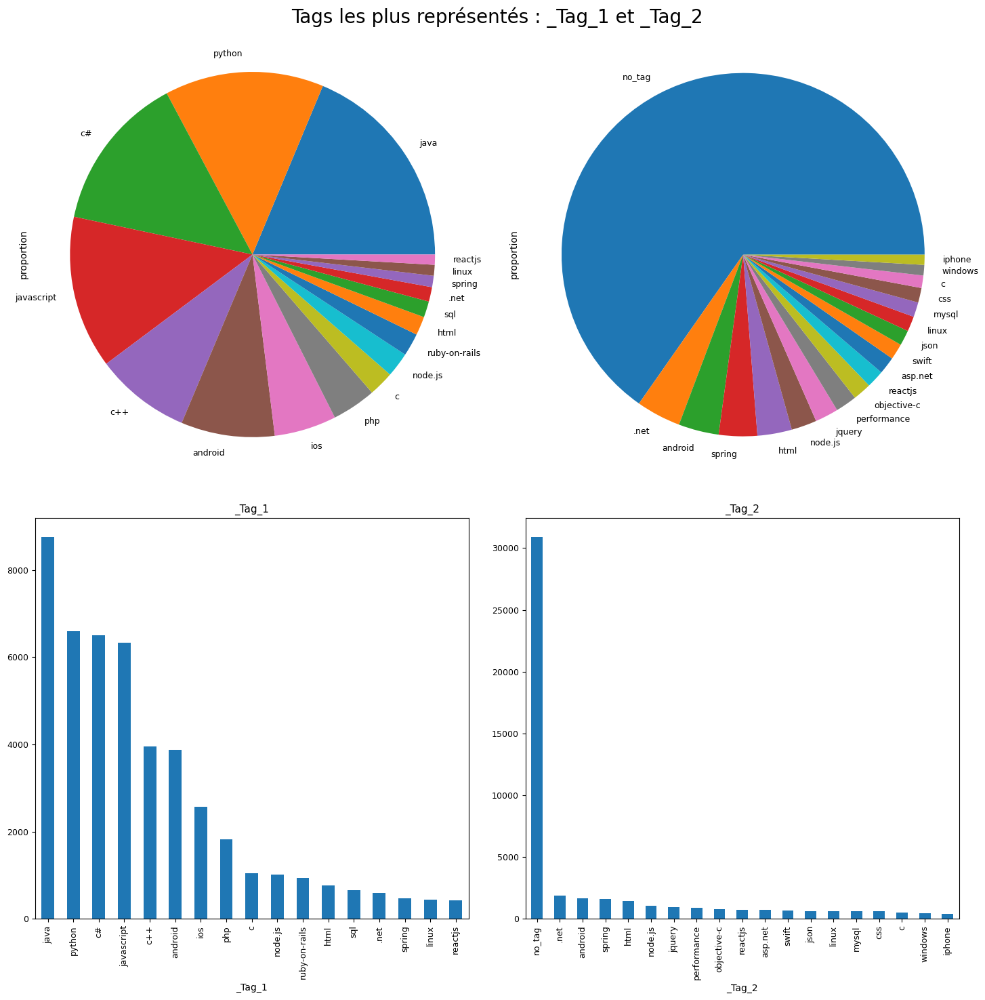

In [247]:
###########################################################
# Visualisation des tags les plus représentés             #
#    - fréquence >= 400 pour _Tag_1                       #
#    - fréquence >= 400 pour _Tag_2                       #
###########################################################
df_1_new = df.where(df['_Tag_1'].isin(intervalle_tag_1))
df_2_new = df.where(df['_Tag_2'].isin(intervalle_tag_2))


plt.figure(figsize = (15, 15))
    
# >>>>>>> Pie chart
plt.subplot(2, 2, 1)   # lignes, colonnes
df_1_new['_Tag_1'].value_counts(normalize = True).plot(kind = 'pie', fontsize = 9)
plt.axis('equal')      # Cette ligne assure que le pie chart est un cercle plutôt qu'une ellipse

plt.subplot(2, 2, 2)   # lignes, colonnes
df_2_new['_Tag_2'].value_counts(normalize = True).plot(kind = 'pie', fontsize = 9)
plt.axis('equal')      # Cette ligne assure que le pie chart est un cercle plutôt qu'une ellipse


# >>>>>>> Diagramme en tuyaux d'orgues
plt.subplot(2, 2, 3)   # lignes, colonnes
df_1_new['_Tag_1'].value_counts().plot(kind = 'bar', fontsize = 9)
plt.title('\n\n\n_Tag_1', fontsize = 11)

plt.subplot(2, 2, 4)   # lignes, colonnes
df_2_new['_Tag_2'].value_counts().plot(kind = 'bar', fontsize = 9)
plt.title('\n\n\n_Tag_2', fontsize = 11)

    
plt.suptitle('Tags les plus représentés : _Tag_1 et _Tag_2\n', fontsize = 20)
plt.tight_layout() # pour éviter chevauchement titre et ligne suivante

# 7.1.2. ETUDE DE LA FREQUENCE DE TOUS LES TAGS (VARIABLE CATEGORIELLE)

In [248]:
###############################################################
# => travail par sous-ensemble :                              #
# Calcul fréquence des tags pour un sous-ensemble             #
###############################################################
def calcul_frequence_tag_sous_ensemble(plage_min_in, plage_max_in):
    
    count_tag_1 = []
    count_tag_2 = []

    tag = new_liste_tags[plage_min_in:plage_max_in]    
    
    # Recherche fréquence pour chaque tag. Si absente, on met 0.
    for t in tag:
        if (t in count_Tag_1):
            count_tag_1.append(count_Tag_1[t])
        else:
            count_tag_1.append(0)
        
        if (t in count_Tag_2):
            count_tag_2.append(count_Tag_2[t])
        else:
            count_tag_2.append(0)
        
    print('[plage_min_in : plage_max_in] = [', plage_min_in, ':', plage_max_in, ']')        
    print(len(tag), 'valeurs tag\t\t:', tag)
    print(len(count_tag_1), 'valeurs count_tag_1\t:', count_tag_1)
    print(len(count_tag_2), 'valeurs count_tag_2\t:', count_tag_2)
    
    return tag, count_tag_1, count_tag_2

In [249]:
###############################################################
# Affichage fréquence des tags pour un sous-ensemble          #
###############################################################
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.bar.html
def affichage_frequence_tag_sous_ensemble(plage_min_in, plage_max_in):
    
    tag, count_tag_1, count_tag_2 = calcul_frequence_tag_sous_ensemble(plage_min_in = plage_min_in, 
                                                                       plage_max_in = plage_max_in)

    # Intervalle [plage_min_in : plage_max_in]
    df = pd.DataFrame({' _Tag_1': count_tag_1,
                       ' _Tag_2': count_tag_2}, index = tag)
    ax = df.plot.bar(rot = 90, stacked = True, figsize = (20, 6), fontsize = 14)
    ax.set_title('Fréquence des tags ' + str(plage_min_in) + ' --> ' + str(plage_max_in), fontsize = 20)
    ax.set_xlabel('Tags ' + str(plage_min_in) + ' --> ' + str(plage_max_in), fontsize = 14)
    ax.set_ylabel('Fréquence', fontsize = 14)

[plage_min_in : plage_max_in] = [ 0 : 99 ]
28 valeurs tag		: ['java', 'c#', 'javascript', 'python', 'c++', 'android', 'ios', '.net', 'html', 'php', 'jquery', 'objective-c', 'c', 'node.js', 'iphone', 'css', 'linux', 'asp.net', 'swift', 'spring', 'sql', 'xcode', 'performance', 'ruby-on-rails', 'json', 'reactjs', 'windows', 'mysql']
28 valeurs count_tag_1	: [8749, 6499, 6329, 6591, 3953, 3880, 2572, 599, 773, 1828, 349, 317, 1042, 1021, 135, 269, 449, 378, 232, 471, 664, 68, 328, 941, 172, 421, 261, 202]
28 valeurs count_tag_2	: [0, 89, 211, 212, 309, 1698, 234, 1881, 1451, 382, 982, 776, 523, 1070, 425, 616, 635, 729, 674, 1615, 314, 270, 900, 171, 642, 742, 443, 621]


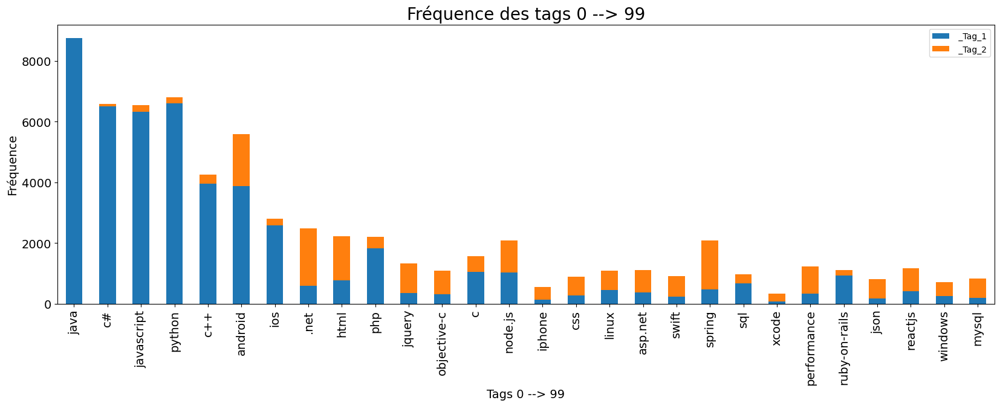

In [258]:
# Intervalle [0 : 99]
affichage_frequence_tag_sous_ensemble(plage_min_in = 0,
                                      plage_max_in = 99)

# 7.1.3. ETUDE DE LA TAILLE DES NOMS DE TAG (VARIABLE QUANTITATIVE)

In [259]:
len_Tag_1 = df['_Tag_1'].str.len() # longueur _Tag_1
len_Tag_2 = df['_Tag_2'].str.len() # longueur _Tag_2

In [260]:
# _Tag_1 : compris entre 1 et 13 caractères
len_Tag_1.describe().transpose()

count    49493.000000
mean         5.201665
std          2.820236
min          1.000000
25%          3.000000
50%          4.000000
75%          7.000000
max         13.000000
Name: _Tag_1, dtype: float64

In [261]:
# _Tag_2 : compris entre 1 et 13 caractères
len_Tag_2.describe().transpose()

count    49493.000000
mean         5.927646
std          1.472888
min          1.000000
25%          6.000000
50%          6.000000
75%          6.000000
max         13.000000
Name: _Tag_2, dtype: float64

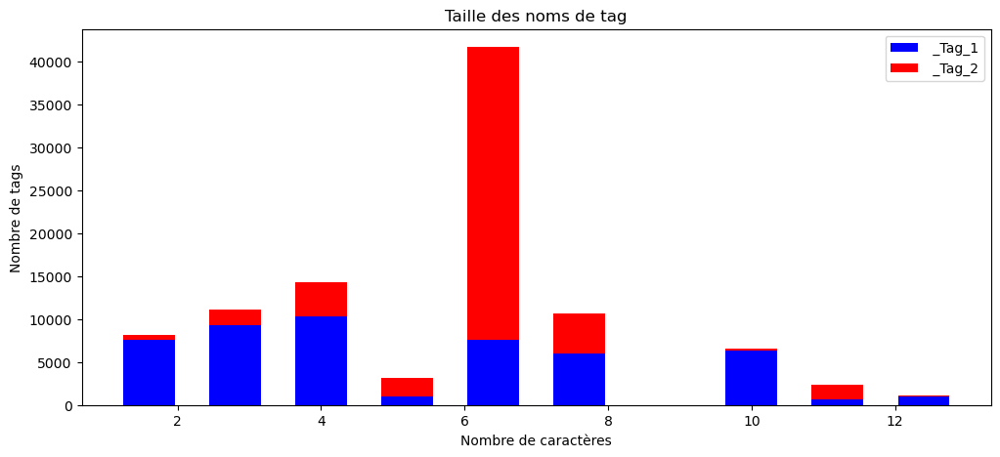

In [262]:
# http://python-simple.com/python-matplotlib/histogram.php
plt.figure(figsize = (12, 5))  # longueur, hauteur
plt.hist([len_Tag_1, len_Tag_2], color = ['blue', 'red'], label = [' _Tag_1', ' _Tag_2'], 
         rwidth = 0.6, histtype = 'barstacked')

plt.legend(loc = 'upper right')
plt.xlabel('Nombre de caractères')
plt.ylabel('Nombre de tags')
plt.title('Taille des noms de tag')
plt.show()

# 7.2. ANALYSE UNIVARIEE TEXTE

In [ ]:
# Rappel des variables :
#  --> corpus_text = ' '.join(df['_Text_clean'])
#  --> token_text = corpus_text.split()
#  --> count_text = pd.Series(token_text).value_counts()

# 7.2.1. ETUDE DE LA FREQUENCE DES MOTS (VARIABLE QUANTITATIVE)

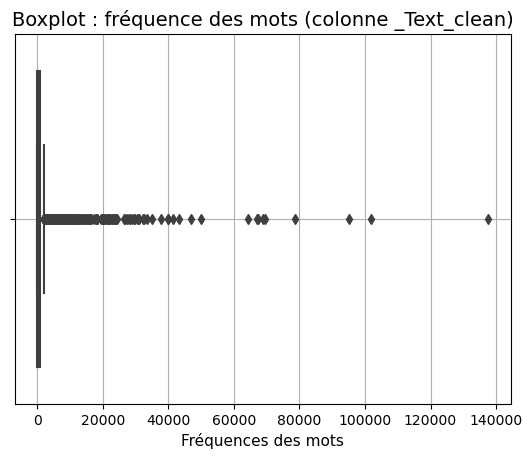

In [263]:
###########################################
# Boxplot fréquence des mots              #
###########################################
# Tout le corpus
ax1 = sns.boxplot(data = df, 
                  x    = count_text)
ax1.set_xlabel('Fréquences des mots', fontsize = 11)
plt.title('Boxplot : fréquence des mots (colonne _Text_clean)', fontsize = 14)
plt.grid(True)

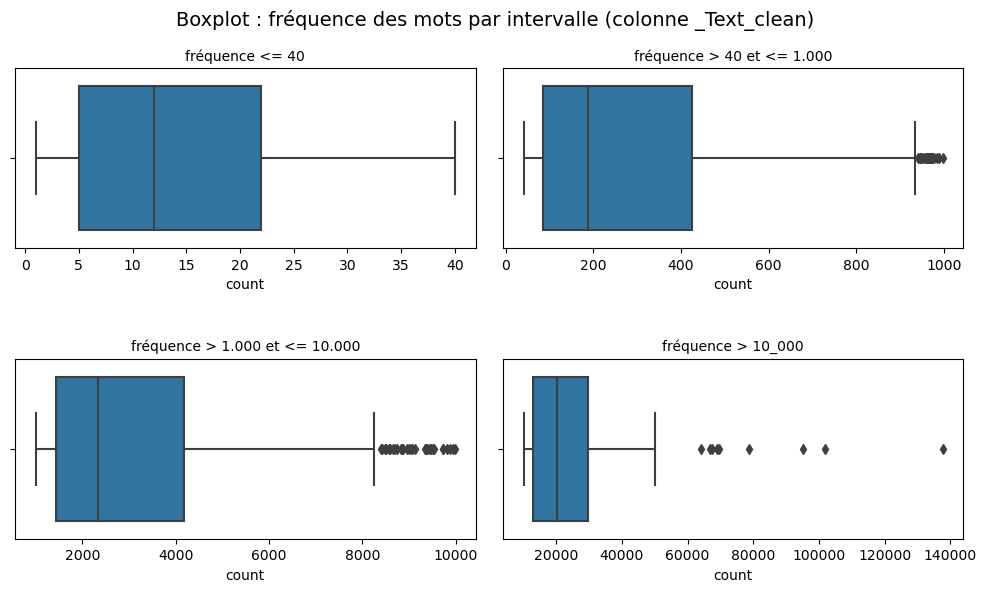

In [264]:
####################################################
# Boxplot fréquence des mots : zoom par intervalle #
####################################################
# Visualisation des données en un seul schéma
fig = plt.figure(figsize = (10, 6))  # Width, height

# Fréquence <= 40
ax = fig.add_subplot(2, 2, 1)   # lignes, colonnes
count_corpus_box = count_text[(count_text <= 40)]    
sns.boxplot(data = df,
            x    = count_corpus_box)
ax.set_title('fréquence <= 40', fontsize = 10)

# Fréquence > 40 et <= 1.000
ax = fig.add_subplot(2, 2, 2)   # lignes, colonnes
count_corpus_box = count_text[(count_text > 40) & (count_text <= 1_000)]    
sns.boxplot(data = df,
            x    = count_corpus_box)
ax.set_title('fréquence > 40 et <= 1.000', fontsize = 10)

# Fréquence > 1.000 et <= 10.000
ax = fig.add_subplot(2, 2, 3)   # lignes, colonnes
count_corpus_box = count_text[(count_text > 1_000) & (count_text <= 10_000)]    
sns.boxplot(data = df,
            x    = count_corpus_box)
ax.set_title('\n\nfréquence > 1.000 et <= 10.000', fontsize = 10)

# Fréquence > 10_000
ax = fig.add_subplot(2, 2, 4) 
count_corpus_box = count_text[(count_text > 10_000)]    
sns.boxplot(data = df,
            x    = count_corpus_box)
ax.set_title('\n\nfréquence > 10_000', fontsize = 10)

    
fig.suptitle('Boxplot : fréquence des mots par intervalle (colonne _Text_clean)', fontsize = 14)
fig.tight_layout() # pour éviter chevauchement titre et ligne suivante

# 7.2.2. ETUDE DE LA LONGUEUR DES DOCUMENTS (VARIABLE QUANTITATIVE)

In [265]:
# Longueur documents
len_Text_clean = df['_Text_clean'].str.len()

In [266]:
# on stocke ce vecteur numérique dans une colonne préfixée par _
df['_len_Text_clean'] = len_Text_clean

# output de sortie pour contrôler que l'opération s'est bien effectuée.
df.describe(include = np.number)

# la grande majorité des messages (50%) fait 147 caractères.
# Certains ont une taille très élevée (8932).

,Id,Score,ViewCount,AnswerCount,_len_Text_clean
count,4.949300e+04,49493.000000,4.949300e+04,49493.000000,49493.000000
mean,3.076258e+07,18.219425,1.790583e+04,3.013638,625.453458
std,1.899073e+07,133.987020,5.770890e+04,2.954516,582.024455
min,1.900000e+01,6.000000,6.700000e+01,1.000000,108.000000
25%,1.424325e+07,7.000000,2.452000e+03,1.000000,332.000000
50%,2.986167e+07,9.000000,6.458000e+03,2.000000,454.000000
75%,4.563654e+07,15.000000,1.642400e+04,4.000000,687.000000
max,7.636308e+07,27009.000000,6.024098e+06,98.000000,11356.000000


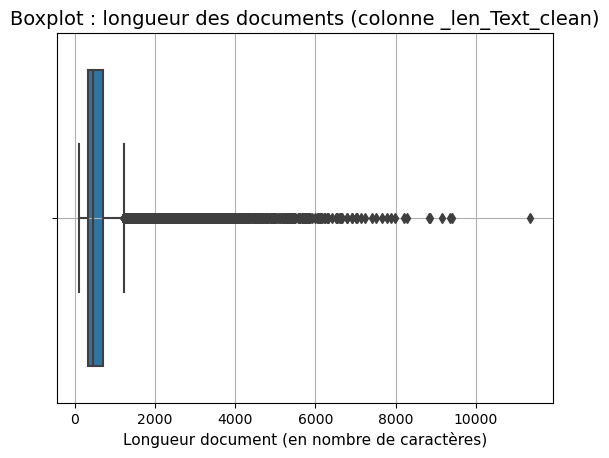

In [267]:
###########################################
# Boxplot longueur de chaque document     #
###########################################
ax1 = sns.boxplot(data = df,
                  x    = '_len_Text_clean')
ax1.set_xlabel('Longueur document (en nombre de caractères)', fontsize = 11)
plt.title('Boxplot : longueur des documents (colonne _len_Text_clean)', fontsize = 14)
plt.grid(True)

Text(0.5, 0.98, 'Displot : longueur des documents (colonne _len_Text_clean)')

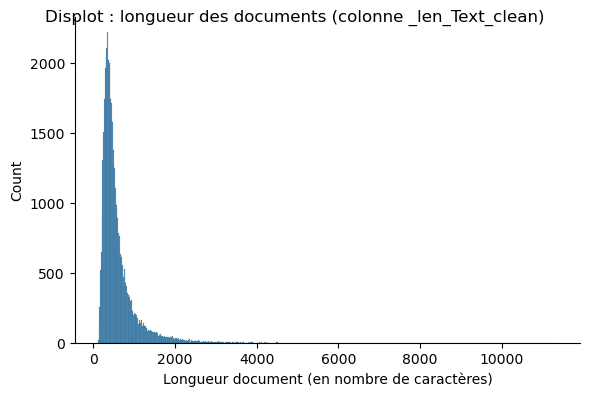

In [268]:
###########################################
# Displot longueur de chaque document     #
###########################################
# https://www.delftstack.com/fr/howto/seaborn/seaborn-font-size/
ax2 = sns.displot(data   = df, 
                  x      = '_len_Text_clean', 
                  height = 4, 
                  aspect = 1.5) # height = 4, width = 1.5 times larger than height

ax2.set_axis_labels('Longueur document (en nombre de caractères)', 'Count')
ax2.fig.suptitle('Displot : longueur des documents (colonne _len_Text_clean)')

# 7.3. FREQUENCE DISTRIBUTION (VARIABLE CATEGORIELLE)

In [269]:
# Stockage de la fréquence de distribution des sous-dataframes dans des dictionnaires
# >>>>>>>  Colonne _Stemmer_clean 
most_common_stemmer_1_gram      = {} # 1-gram
most_common_stemmer_1_gram_word = {} # 1-gram
most_common_stemmer_2_gram      = {} # 2-gram
most_common_stemmer_2_gram_word = {} # 2-gram

# >>>>>>> Colonne _Lemma_clean 
most_common_lemma_3_gram      = {} # 3-gram
most_common_lemma_3_gram_word = {} # 3-gram

In [270]:
####################################################
#   Fréquence distribution, niveau sous-dataframe  # 
####################################################
# https://askcodez.com/comptage-de-n-grammes-de-frequence-en-python-nltk.html
# https://www.askpython.com/python/examples/n-grams-python-nltk
def frequence_distribution_sous_dataframe(n_gram_in, operation_in, cle_in, colonne_in, most_common_in):
    
    most_common_word = []
    
    # Liste des index du sous-dataframe (ne commence pas forcément à 0, car filtré)
    liste_index = dict_df[cle_in].index.to_list()

    print('n_gram_in\t=', n_gram_in,
          '\noperation_in\t=', operation_in,
          '\ncle_in\t\t=', cle_in,
          '\ncolonne_in\t=', colonne_in, '\n')
    
    for index, row in dict_df[cle_in].iterrows():
        token = word_tokenize(row[colonne_in])
        
        # ngram
        if (n_gram_in == 1):
            n_grams = token
        else:
            n_grams = ngrams(token, n_gram_in)
        
        # Frequence distribution
        if (index == liste_index[0]):  # premier index du sous-dataframe
            ngram_fdist = FreqDist(n_grams)            
        elif (operation_in == '+'):
            ngram_fdist = ngram_fdist + FreqDist(n_grams)
        elif (operation_in == '&'):
            ngram_fdist = ngram_fdist & FreqDist(n_grams)            

    # most_common_in most common words
    most_common = ngram_fdist.most_common(most_common_in)
    print(most_common_in, 'most_common :', most_common, '\n')
    
    
    # Extraction liste des mots les plus communs dans une liste
    # Remarque : ind[0] = mot, ind[1] = valeur
    for ind in most_common:
        most_common_word.append(ind[0])
    print('most_common_word =', most_common_word)
    
    return most_common, most_common_word

In [271]:
#################################################
#      Affichage fréquence distribution         #
#################################################
# Couleurs  : https://matplotlib.org/stable/gallery/color/named_colors.html
# Marqueurs : https://matplotlib.org/stable/api/markers_api.html
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.plot.html
def affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in, 
                                                    name_in, 
                                                    cle_1_in, 
                                                    cle_2_in, 
                                                    intersection_cles_in):
    
    most_common_1 = most_common_n_gram_in[cle_1_in]
    most_common_2 = most_common_n_gram_in[cle_2_in]
  
    count1 = 0 
    count2 = 0     
    
    fig = plt.figure(figsize = (7, 4))  # Width, height
    
    # Maj couleurs : 1 couleur / clé
    # >>>>>>> Couleur 1    
    if (cle_1_in == 'java'):
        color_1 = 'blue'
    elif (cle_1_in == 'c#'):
        color_1 = 'red'
    elif (cle_1_in == 'javascript'):
        color_1 = 'lime'
    elif (cle_1_in == 'python'):
        color_1 = 'orange'        
    elif (cle_1_in == 'c++'):
        color_1 = 'fuchsia'
        
    # >>>>>>> Couleur 2
    if (cle_2_in == 'java'):
        color_2 = 'blue'
    elif (cle_2_in == 'c#'):
        color_2 = 'red'
    elif (cle_2_in == 'javascript'):
        color_2 = 'lime'
    elif (cle_2_in == 'python'):
        color_2 = 'orange'        
    elif (cle_2_in == 'c++'):
        color_2 = 'fuchsia'        

    
    # *******************************************
    # * Liste 1                                 *
    # *******************************************    
    for ind_1 in most_common_1: # liste de tuples
        if (ind_1[0] in intersection_cles_in):
            if (count1 == 0): # Premier passage : légende marquée une fois
                if ('1-gram' in name_in): # 1-gram
                    plt.plot(ind_1[0], ind_1[1], color = color_1, marker = 'o', linestyle = 'dashed', label = cle_1_in)
                else: # n-gram != 1
                    plt.plot(' '.join(ind_1[0]), ind_1[1], color = color_1, marker = 'o', 
                             linestyle = 'dashed', label = cle_1_in)
                count1 = 1
            else:
                if ('1-gram' in name_in): # 1-gram
                    plt.plot(ind_1[0], ind_1[1], color = color_1, marker = 'o', linestyle = 'dashed')
                else: # n-gram != 1
                    plt.plot(' '.join(ind_1[0]), ind_1[1], color = color_1, marker = 'o', 
                             linestyle = 'dashed')
            
            
    # *******************************************
    # * Liste 2                                 *
    # *******************************************
    for ind_2 in most_common_2: # liste de tuples
        if (ind_2[0] in intersection_cles_in):
            if (count2 == 0):  # Premier passage : légende marquée une fois
                if ('1-gram' in name_in): # 1-gram                
                    plt.plot(ind_2[0], ind_2[1], color = color_2, marker = 'o', linestyle = 'dashed', label = cle_2_in)
                else: # n-gram != 1
                    plt.plot(' '.join(ind_2[0]), ind_2[1], color = color_2, marker = 'o', 
                             linestyle = 'dashed', label = cle_2_in)
                count2 = 1
            else:
                if ('1-gram' in name_in): # 1-gram                
                    plt.plot(ind_2[0], ind_2[1], color = color_2, marker = 'o', linestyle = 'dashed') 
                else: # n-gram != 1
                    plt.plot(' '.join(ind_2[0]), ind_2[1], color = color_2, marker = 'o', 
                             linestyle = 'dashed')
                    
    plt.legend(loc = 'upper right')
    plt.xlabel('Mots')
    plt.xticks(rotation = 90) # légende axe des x verticale
    plt.ylabel('Fréquence')
    plt.title(name_in + ' : ' + str(len(intersection_cles_in)) + ' mots les plus communs entre ' + cle_1_in + 
              ' et ' + cle_2_in + ' ')
    plt.show()

# 7.3.1. FREQUENCE DISTRIBUTION COLONNE _STEMMER_CLEAN POUR 1-GRAM

In [272]:
# Maj paramètres communs
n_gram      = 1
operation   = '+'
colonne     = '_Stemmer_clean_final'
most_common = 50

In [273]:
# java
most_common_stemmer_1_gram['java'], most_common_stemmer_1_gram_word['java'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'java', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 1 
operation_in	= + 
cle_in		= java 
colonne_in	= _Stemmer_clean_final 

50 most_common : [('java', 101590), ('public', 31965), ('class', 26966), ('android', 26641), ('string', 23469), ('apach', 17886), ('version', 16382), ('spring', 16066), ('jar', 15922), ('import', 14337), ('return', 14209), ('privat', 14166), ('void', 12927), ('web', 12683), ('file', 11065), ('hibern', 11000), ('core', 10504), ('final', 10264), ('get', 10122), ('sun', 10067), ('intern', 9807), ('null', 9746), ('except', 8837), ('secur', 8670), ('releas', 8641), ('server', 7896), ('system', 7836), ('boot', 7799), ('static', 7548), ('list', 6889), ('build', 6530), ('object', 6497), ('execut', 6313), ('project', 6229), ('servic', 6219), ('configur', 6077), ('invok', 6051), ('layout', 6025), ('eclips', 6016), ('set', 5993), ('view', 5940), ('catalina', 5827), ('add', 5582), ('factori', 5418), ('client', 5408), ('request', 5089), ('connect', 5031), ('key', 4889), ('time', 4746), ('messag', 4203)] 

most_comm

In [274]:
# c#
most_common_stemmer_1_gram['c#'], most_common_stemmer_1_gram_word['c#'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'c#', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 1 
operation_in	= + 
cle_in		= c# 
colonne_in	= _Stemmer_clean_final 

50 most_common : [('public', 24226), ('system', 19400), ('string', 16276), ('get', 13726), ('class', 12157), ('set', 10369), ('return', 9425), ('object', 7871), ('void', 6793), ('add', 6158), ('null', 6155), ('web', 5975), ('privat', 5917), ('file', 5849), ('static', 5237), ('except', 5048), ('task', 4843), ('list', 4597), ('server', 4463), ('version', 4149), ('servic', 3786), ('project', 3783), ('text', 3781), ('time', 3777), ('client', 3754), ('key', 3660), ('request', 3635), ('model', 3453), ('messag', 3419), ('bind', 3407), ('consol', 3293), ('configur', 3102), ('entiti', 2943), ('call', 2924), ('connect', 2811), ('load', 2750), ('core', 2717), ('respons', 2571), ('refer', 2371), ('line', 2342), ('path', 2288), ('select', 2269), ('function', 2267), ('edit', 2246), ('view', 2199), ('solut', 2193), ('case', 2114), ('build', 2103), ('find', 1967), ('control', 1923)] 

most_common_word = ['public', 'syst

In [275]:
# javascript
most_common_stemmer_1_gram['javascript'], most_common_stemmer_1_gram_word['javascript'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'javascript', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 1 
operation_in	= + 
cle_in		= javascript 
colonne_in	= _Stemmer_clean_final 

50 most_common : [('function', 20694), ('class', 14896), ('return', 8657), ('text', 8164), ('get', 7311), ('file', 7274), ('consol', 6819), ('import', 5964), ('button', 5800), ('input', 5311), ('server', 5009), ('width', 4813), ('document', 4786), ('requir', 4352), ('object', 4312), ('load', 4251), ('modul', 4177), ('request', 3843), ('height', 3822), ('imag', 3705), ('set', 3653), ('select', 3556), ('post', 3520), ('angular', 3509), ('click', 3487), ('path', 3487), ('respons', 3470), ('titl', 3321), ('window', 3246), ('state', 3185), ('string', 3036), ('null', 2892), ('label', 2858), ('add', 2853), ('element', 2819), ('browser', 2753), ('default', 2744), ('client', 2655), ('time', 2643), ('messag', 2600), ('let', 2575), ('render', 2526), ('size', 2510), ('loader', 2474), ('build', 2360), ('web', 2303), ('background', 2287), ('min', 2237), ('find', 2205), ('scope', 2200)] 

most_common_word = ['f

In [276]:
# python
most_common_stemmer_1_gram['python'], most_common_stemmer_1_gram_word['python'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'python', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 1 
operation_in	= + 
cle_in		= python 
colonne_in	= _Stemmer_clean_final 

50 most_common : [('self', 27711), ('file', 21142), ('python', 19649), ('import', 17022), ('line', 14557), ('get', 11741), ('return', 10341), ('model', 9124), ('class', 7927), ('time', 7088), ('local', 6777), ('build', 6387), ('function', 6004), ('modul', 5672), ('set', 5621), ('size', 5129), ('path', 4919), ('output', 4772), ('input', 4601), ('add', 4569), ('request', 4565), ('list', 4488), ('imag', 4329), ('call', 4211), ('text', 3957), ('object', 3809), ('connect', 3503), ('except', 3434), ('key', 3427), ('pip', 3399), ('version', 3363), ('command', 3174), ('server', 3055), ('respons', 2982), ('load', 2954), ('loss', 2904), ('client', 2903), ('string', 2866), ('find', 2851), ('process', 2764), ('rang', 2687), ('max', 2634), ('messag', 2588), ('core', 2524), ('random', 2378), ('execut', 2377), ('default', 2375), ('includ', 2335), ('flask', 2322), ('bin', 2314)] 

most_common_word = ['self', 'file',

In [277]:
# c++
most_common_stemmer_1_gram['c++'], most_common_stemmer_1_gram_word['c++'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'c++', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 1 
operation_in	= + 
cle_in		= c++ 
colonne_in	= _Stemmer_clean_final 

50 most_common : [('includ', 9175), ('class', 7963), ('void', 7554), ('return', 7378), ('function', 6586), ('boost', 6358), ('size', 5658), ('string', 5178), ('char', 5113), ('file', 4760), ('vector', 4078), ('get', 4076), ('time', 3806), ('static', 3440), ('memori', 3273), ('doubl', 3165), ('set', 3026), ('public', 2849), ('build', 2712), ('object', 2709), ('call', 2574), ('auto', 2430), ('version', 2419), ('refer', 2129), ('output', 2038), ('clang', 2031), ('case', 2022), ('system', 2018), ('local', 1904), ('null', 1867), ('find', 1821), ('add', 1790), ('bin', 1749), ('load', 1738), ('list', 1674), ('alloc', 1598), ('line', 1586), ('copi', 1566), ('gnu', 1529), ('point', 1523), ('project', 1510), ('bit', 1488), ('buffer', 1486), ('back', 1421), ('move', 1377), ('default', 1373), ('constructor', 1314), ('except', 1305), ('virtual', 1278), ('releas', 1258)] 

most_common_word = ['includ', 'class', 'void

In [278]:
###################################################
#    Intersection entre les 5 sous-dataframes     #
###################################################
# https://www.cours-gratuit.com/tutoriel-python/tutoriel-python-trouver-lintersection-de-deux-listes
set_java_stemmer_1_gram        = set(most_common_stemmer_1_gram_word['java'])
set_c_sharp_stemmer_1_gram     = set(most_common_stemmer_1_gram_word['c#']) 
set_javascript_stemmer_1_gram  = set(most_common_stemmer_1_gram_word['javascript']) 
set_python_stemmer_1_gram      = set(most_common_stemmer_1_gram_word['python']) 
set_c_plus_plus_stemmer_1_gram = set(most_common_stemmer_1_gram_word['c++']) 

intersection_java_c_sharp_stemmer_1_gram     = list(set_java_stemmer_1_gram & set_c_sharp_stemmer_1_gram)
intersection_java_javascript_stemmer_1_gram  = list(set_java_stemmer_1_gram & set_javascript_stemmer_1_gram)
intersection_java_python_stemmer_1_gram      = list(set_java_stemmer_1_gram & set_python_stemmer_1_gram)
intersection_java_c_plus_plus_stemmer_1_gram = list(set_java_stemmer_1_gram & set_c_plus_plus_stemmer_1_gram)
intersection_all_stemmer_1_gram              = list(set_java_stemmer_1_gram & set_c_sharp_stemmer_1_gram & \
                                                    set_javascript_stemmer_1_gram & set_python_stemmer_1_gram & \
                                                    set_c_plus_plus_stemmer_1_gram)

print('intersection_java_c_sharp_stemmer_1_gram\t=', intersection_java_c_sharp_stemmer_1_gram)
print('intersection_java_javascript_stemmer_1_gram\t=', intersection_java_javascript_stemmer_1_gram)
print('intersection_java_python_stemmer_1_gram\t\t=', intersection_java_python_stemmer_1_gram)
print('intersection_java_c_plus_plus_stemmer_1_gram\t=', intersection_java_c_plus_plus_stemmer_1_gram)
print('intersection_all_stemmer_1_gram\t\t\t=', intersection_all_stemmer_1_gram)

intersection_java_c_sharp_stemmer_1_gram	= ['server', 'static', 'servic', 'core', 'privat', 'class', 'request', 'file', 'client', 'void', 'messag', 'connect', 'project', 'add', 'list', 'view', 'build', 'public', 'null', 'except', 'object', 'version', 'web', 'system', 'time', 'configur', 'set', 'string', 'get', 'return', 'key']
intersection_java_javascript_stemmer_1_gram	= ['client', 'web', 'import', 'server', 'time', 'set', 'add', 'build', 'class', 'request', 'messag', 'null', 'string', 'get', 'object', 'file', 'return']
intersection_java_python_stemmer_1_gram		= ['import', 'server', 'core', 'class', 'request', 'file', 'client', 'messag', 'connect', 'execut', 'add', 'list', 'build', 'except', 'object', 'version', 'time', 'set', 'string', 'get', 'return', 'key']
intersection_java_c_plus_plus_stemmer_1_gram	= ['static', 'class', 'file', 'void', 'project', 'add', 'list', 'build', 'public', 'null', 'except', 'object', 'version', 'system', 'time', 'releas', 'set', 'string', 'get', 'return']

In [ ]:
####################################################
#       Affichage fréquence distribution           #
####################################################

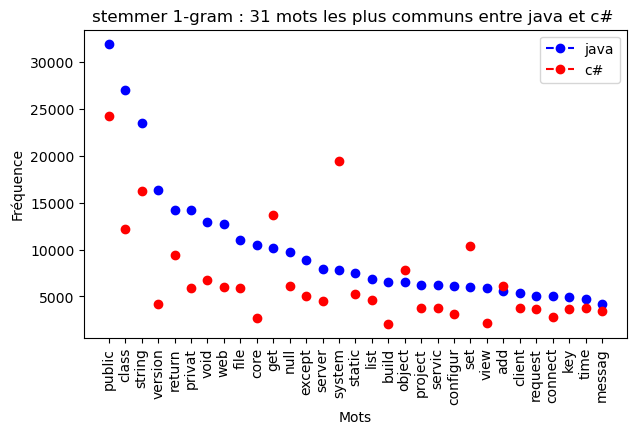

In [279]:
# Intersection mots java / c#
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_stemmer_1_gram,
                                                name_in               = 'stemmer 1-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'c#',
                                                intersection_cles_in  = intersection_java_c_sharp_stemmer_1_gram)

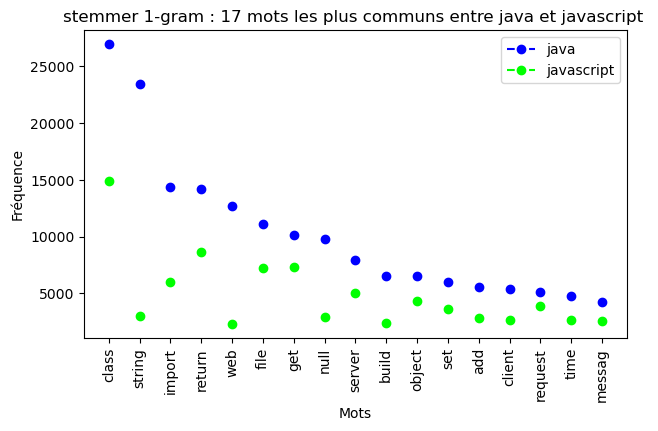

In [280]:
# Intersection mots java / javascript
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_stemmer_1_gram,
                                                name_in               = 'stemmer 1-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'javascript',
                                                intersection_cles_in  = intersection_java_javascript_stemmer_1_gram)

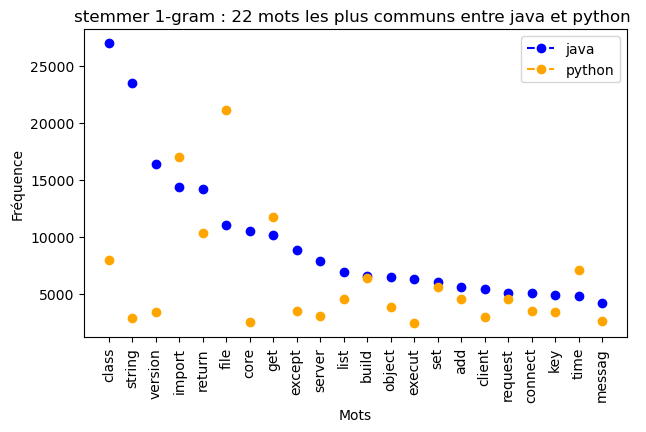

In [281]:
# Intersection mots java / python
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_stemmer_1_gram,
                                                name_in               = 'stemmer 1-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'python',
                                                intersection_cles_in  = intersection_java_python_stemmer_1_gram)

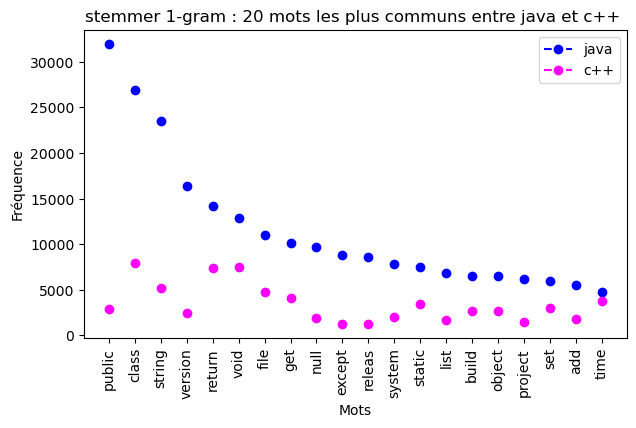

In [282]:
# Intersection mots java / c++
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_stemmer_1_gram,
                                                name_in               = 'stemmer 1-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'c++',
                                                intersection_cles_in  = intersection_java_c_plus_plus_stemmer_1_gram)

# 7.3.2. FREQUENCE DISTRIBUTION COLONNE _STEMMER_CLEAN POUR 2-GRAM

In [283]:
# Maj paramètres communs
n_gram      = 2
operation   = '+'
colonne     = '_Stemmer_clean_final'
most_common = 50

In [284]:
# java
most_common_stemmer_2_gram['java'], most_common_stemmer_2_gram_word['java'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'java', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 2 
operation_in	= + 
cle_in		= java 
colonne_in	= _Stemmer_clean_final 

50 most_common : [(('java', 'java'), 21467), (('java', 'apach'), 9256), (('public', 'void'), 8316), (('android', 'android'), 7190), (('public', 'class'), 7004), (('java', 'sun'), 5716), (('version', 'version'), 5481), (('apach', 'catalina'), 5310), (('invok', 'java'), 5116), (('java', 'android'), 4724), (('intern', 'java'), 4380), (('spring', 'boot'), 4097), (('android', 'layout'), 4057), (('class', 'public'), 3905), (('string', 'string'), 3809), (('return', 'public'), 3540), (('import', 'java'), 3509), (('public', 'static'), 3403), (('releas', 'jar'), 3327), (('class', 'privat'), 3305), (('java', 'spring'), 3234), (('jar', 'releas'), 3232), (('java', 'intern'), 3214), (('catalina', 'core'), 3163), (('core', 'java'), 3044), (('java', 'hibern'), 3021), (('web', 'java'), 2983), (('execut', 'java'), 2959), (('java', 'eclips'), 2916), (('public', 'string'), 2871), (('factori', 'java'), 2855), (('void', 'st

In [285]:
# c#
most_common_stemmer_2_gram['c#'], most_common_stemmer_2_gram_word['c#'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'c#', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 2 
operation_in	= + 
cle_in		= c# 
colonne_in	= _Stemmer_clean_final 

50 most_common : [(('get', 'set'), 5613), (('system', 'system'), 4990), (('set', 'public'), 4727), (('public', 'class'), 4043), (('class', 'public'), 3620), (('public', 'string'), 3228), (('public', 'get'), 2998), (('string', 'string'), 2649), (('system', 'web'), 2553), (('public', 'void'), 2482), (('string', 'get'), 2382), (('public', 'static'), 2351), (('public', 'public'), 1619), (('static', 'void'), 1448), (('privat', 'void'), 1229), (('web', 'system'), 1156), (('return', 'public'), 1102), (('void', 'string'), 1097), (('get', 'return'), 1096), (('privat', 'static'), 1032), (('object', 'sender'), 1025), (('class', 'privat'), 1003), (('null', 'null'), 944), (('task', 'task'), 929), (('string', 'system'), 890), (('model', 'model'), 863), (('object', 'object'), 860), (('list', 'list'), 769), (('except', 'system'), 756), (('class', 'class'), 747), (('system', 'string'), 744), (('public', 'virtual'), 743),

In [286]:
# javascript
most_common_stemmer_2_gram['javascript'], most_common_stemmer_2_gram_word['javascript'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'javascript', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 2 
operation_in	= + 
cle_in		= javascript 
colonne_in	= _Stemmer_clean_final 

50 most_common : [(('class', 'class'), 2548), (('function', 'return'), 2185), (('function', 'function'), 2070), (('import', 'import'), 1860), (('width', 'height'), 1577), (('function', 'consol'), 1460), (('button', 'button'), 1220), (('input', 'text'), 1079), (('return', 'function'), 1014), (('text', 'text'), 971), (('file', 'file'), 948), (('requir', 'requir'), 937), (('export', 'default'), 912), (('button', 'class'), 902), (('loader', 'loader'), 896), (('consol', 'consol'), 882), (('class', 'col'), 841), (('click', 'function'), 812), (('object', 'object'), 767), (('angular', 'angular'), 758), (('titl', 'titl'), 722), (('label', 'label'), 678), (('document', 'function'), 666), (('select', 'select'), 624), (('return', 'return'), 585), (('string', 'string'), 573), (('text', 'input'), 565), (('function', 'document'), 565), (('imag', 'imag'), 554), (('modul', 'modul'), 548), (('null', 'null'), 545),

In [287]:
# python
most_common_stemmer_2_gram['python'], most_common_stemmer_2_gram_word['python'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'python', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 2 
operation_in	= + 
cle_in		= python 
colonne_in	= _Stemmer_clean_final 

50 most_common : [(('self', 'self'), 8242), (('import', 'import'), 6134), (('file', 'line'), 3877), (('file', 'local'), 3078), (('python', 'python'), 2710), (('build', 'build'), 2220), (('line', 'modul'), 2130), (('return', 'self'), 2007), (('call', 'file'), 1662), (('file', 'python'), 1630), (('model', 'model'), 1599), (('self', 'file'), 1494), (('python', 'line'), 1401), (('time', 'time'), 1384), (('file', 'file'), 1346), (('self', 'return'), 1334), (('local', 'python'), 1326), (('line', 'self'), 1190), (('model', 'add'), 1102), (('class', 'class'), 1092), (('line', 'file'), 1045), (('loss', 'loss'), 1013), (('local', 'line'), 918), (('import', 'file'), 892), (('modul', 'import'), 886), (('python', 'import'), 873), (('nan', 'nan'), 824), (('class', 'self'), 823), (('modul', 'file'), 804), (('imag', 'imag'), 771), (('core', 'line'), 750), (('size', 'size'), 694), (('self', 'get'), 677), (('path', 'p

In [288]:
# c++
most_common_stemmer_2_gram['c++'], most_common_stemmer_2_gram_word['c++'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'c++', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 2 
operation_in	= + 
cle_in		= c++ 
colonne_in	= _Stemmer_clean_final 

50 most_common : [(('includ', 'includ'), 3137), (('class', 'class'), 1674), (('char', 'char'), 1412), (('boost', 'boost'), 1314), (('size', 'size'), 1267), (('void', 'void'), 1235), (('class', 'public'), 1091), (('doubl', 'doubl'), 1023), (('string', 'string'), 891), (('return', 'return'), 835), (('vector', 'vector'), 751), (('includ', 'boost'), 717), (('push', 'back'), 683), (('function', 'function'), 682), (('bin', 'bin'), 642), (('file', 'file'), 622), (('time', 'time'), 620), (('basic', 'string'), 567), (('string', 'char'), 519), (('memori', 'memori'), 491), (('local', 'includ'), 474), (('null', 'null'), 462), (('void', 'boost'), 440), (('static', 'assert'), 437), (('function', 'void'), 432), (('includ', 'string'), 410), (('gnu', 'gnu'), 398), (('public', 'void'), 397), (('text', 'refer'), 393), (('includ', 'class'), 390), (('boost', 'variant'), 389), (('includ', 'vector'), 382), (('build', 'releas'

In [ ]:
################################################################################
#   Vérification valeurs nan : valeur manquante (NaN) ou éléments du texte ?   #
################################################################################

In [289]:
# Valeurs manquantes (NaN) ?
nb_na = df.isna().sum()
nb_na[nb_na > 0]

Series([], dtype: int64)

In [290]:
# Eléments du texte ?
count = 0
for index, row in df.iterrows():
    if ((count == 0) & 
        (' nan ' in row['_Lemma_clean_final'])):
        print('index =', index, ':',
              '\n* _Text =', row['_Text'],
              '\n* _Lemma_clean_final =', row['_Lemma_clean_final'])
        break

index = 1362 : 
* _Text = Why does "dtoa.c" contain so much code? <p>I'll be the first to admit that my overall knowledge of low level programming is a bit sparse. I understand  many of the core concepts but I do not use them on a regular basis.
That being said I was absolutely astounded at how much code was needed for <a href="http://www.netlib.org/fp/dtoa.c" rel="noreferrer">dtoa.c</a>.</p>

<p>For the past couple months I have been working on an ECMAScript implementation in C# and I've been slowing filling in the holes in my engine. Last night I started working on <strong>Number.prototype.toString</strong> which is described in section <strong>15.7.4.2</strong> of the <a href="http://es5.github.io/#x15.7.4.2" rel="noreferrer">ECMAScript specification</a> <a href="http://www.ecma-international.org/publications/files/ECMA-ST/ECMA-262.pdf" rel="noreferrer">(pdf)</a>. In section <strong>9.8.1</strong>, NOTE 3 offers a link to <em>dtoa.c</em> but I was looking for a challenge so I waited

In [291]:
###################################################
#    Intersection entre les 5 sous-dataframes     #
###################################################
# https://www.cours-gratuit.com/tutoriel-python/tutoriel-python-trouver-lintersection-de-deux-listes
set_java_stemmer_2_gram        = set(most_common_stemmer_2_gram_word['java'])
set_c_sharp_stemmer_2_gram     = set(most_common_stemmer_2_gram_word['c#']) 
set_javascript_stemmer_2_gram  = set(most_common_stemmer_2_gram_word['javascript']) 
set_python_stemmer_2_gram      = set(most_common_stemmer_2_gram_word['python']) 
set_c_plus_plus_stemmer_2_gram = set(most_common_stemmer_2_gram_word['c++']) 

intersection_java_c_sharp_stemmer_2_gram     = list(set_java_stemmer_2_gram & set_c_sharp_stemmer_2_gram)
intersection_java_javascript_stemmer_2_gram  = list(set_java_stemmer_2_gram & set_javascript_stemmer_2_gram)
intersection_java_python_stemmer_2_gram      = list(set_java_stemmer_2_gram & set_python_stemmer_2_gram)
intersection_java_c_plus_plus_stemmer_2_gram = list(set_java_stemmer_2_gram & set_c_plus_plus_stemmer_2_gram)
intersection_all_stemmer_2_gram              = list(set_java_stemmer_2_gram & set_c_sharp_stemmer_2_gram & \
                                                    set_javascript_stemmer_2_gram & set_python_stemmer_2_gram & \
                                                    set_c_plus_plus_stemmer_2_gram)

print('intersection_java_c_sharp_stemmer_2_gram\t=', intersection_java_c_sharp_stemmer_2_gram)
print('intersection_java_javascript_stemmer_2_gram\t=', intersection_java_javascript_stemmer_2_gram)
print('intersection_java_python_stemmer_2_gram\t\t=', intersection_java_python_stemmer_2_gram)
print('intersection_java_c_plus_plus_stemmer_2_gram\t=', intersection_java_c_plus_plus_stemmer_2_gram)
print('intersection_all_stemmer_2_gram\t\t\t=', intersection_all_stemmer_2_gram)

intersection_java_c_sharp_stemmer_2_gram	= [('void', 'string'), ('class', 'class'), ('static', 'void'), ('privat', 'privat'), ('public', 'void'), ('string', 'string'), ('privat', 'static'), ('class', 'public'), ('class', 'privat'), ('public', 'static'), ('public', 'string'), ('return', 'public'), ('public', 'class'), ('string', 'public')]
intersection_java_javascript_stemmer_2_gram	= [('class', 'class'), ('import', 'import'), ('string', 'string')]
intersection_java_python_stemmer_2_gram		= [('class', 'class'), ('java', 'java'), ('import', 'import')]
intersection_java_c_plus_plus_stemmer_2_gram	= [('class', 'class'), ('version', 'version'), ('public', 'void'), ('string', 'string'), ('class', 'public')]
intersection_all_stemmer_2_gram			= [('class', 'class')]


In [ ]:
####################################################
#       Affichage fréquence distribution           #
####################################################
# On affiche les distributions qui ont des intersections.

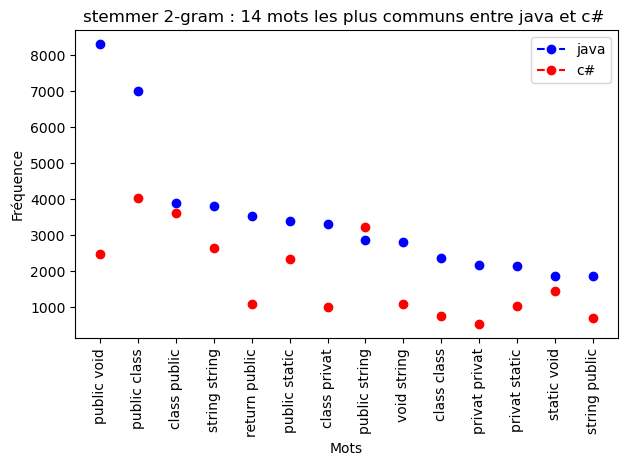

In [292]:
# Intersection mots java / c#
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_stemmer_2_gram,
                                                name_in               = 'stemmer 2-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'c#',
                                                intersection_cles_in  = intersection_java_c_sharp_stemmer_2_gram)

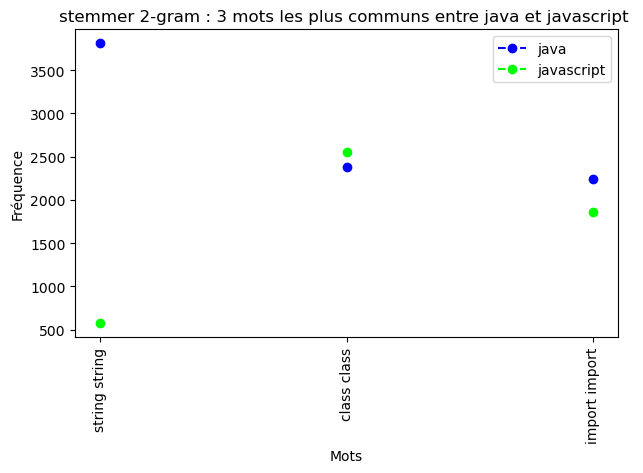

In [293]:
# Intersection mots java / javascript
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_stemmer_2_gram,
                                                name_in               = 'stemmer 2-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'javascript',
                                                intersection_cles_in  = intersection_java_javascript_stemmer_2_gram)

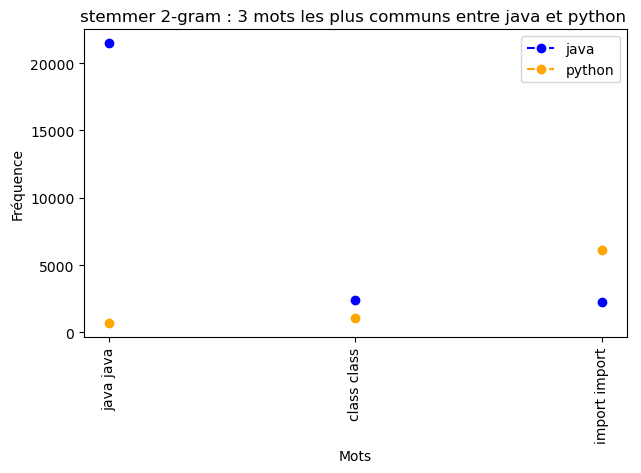

In [294]:
# Intersection mots java / python
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_stemmer_2_gram,
                                                name_in               = 'stemmer 2-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'python',
                                                intersection_cles_in  = intersection_java_python_stemmer_2_gram)

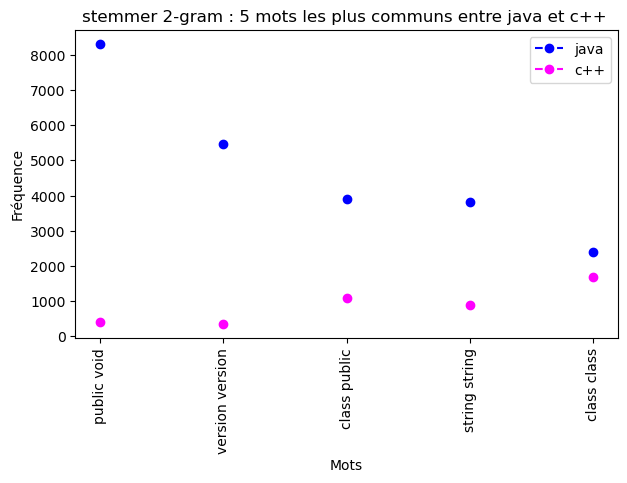

In [295]:
# Intersection mots java / c++
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_stemmer_2_gram,
                                                name_in               = 'stemmer 2-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'c++',
                                                intersection_cles_in  = intersection_java_c_plus_plus_stemmer_2_gram)

# 7.3.3. FREQUENCE DISTRIBUTION COLONNE _LEMMA_CLEAN POUR 3-GRAM

In [296]:
# Maj paramètres communs
n_gram      = 3
operation   = '+'
colonne     = '_Lemma_clean_final'
most_common = 40

In [297]:
# java
most_common_lemma_3_gram['java'], most_common_lemma_3_gram_word['java'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'java', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 3 
operation_in	= + 
cle_in		= java 
colonne_in	= _Lemma_clean_final 

40 most_common : [(('java', 'java', 'java'), 9977), (('java', 'apache', 'catalina'), 4037), (('apache', 'catalina', 'core'), 3162), (('android', 'android', 'android'), 2830), (('release', 'jar', 'release'), 2754), (('public', 'class', 'private'), 2392), (('import', 'java', 'import'), 2003), (('version', 'version', 'version'), 1980), (('java', 'factory', 'java'), 1929), (('catalina', 'core', 'java'), 1920), (('public', 'class', 'public'), 1902), (('factory', 'java', 'factory'), 1823), (('spring', 'release', 'jar'), 1743), (('boot', 'spring', 'boot'), 1671), (('java', 'android', 'java'), 1665), (('java', 'import', 'java'), 1651), (('public', 'static', 'void'), 1623), (('java', 'spring', 'release'), 1623), (('return', 'public', 'void'), 1495), (('sun', 'invoke', 'java'), 1456), (('core', 'java', 'apache'), 1441), (('java', 'apache', 'java'), 1426), (('android', 'java', 'android'), 1410), (('android', 'layou

In [298]:
# c#
most_common_lemma_3_gram['c#'], most_common_lemma_3_gram_word['c#'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'c#', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 3 
operation_in	= + 
cle_in		= c# 
colonne_in	= _Lemma_clean_final 

40 most_common : [(('get', 'set', 'public'), 4186), (('public', 'class', 'public'), 2112), (('public', 'get', 'set'), 2111), (('public', 'string', 'get'), 1944), (('system', 'system', 'system'), 1936), (('string', 'get', 'set'), 1849), (('set', 'public', 'string'), 1502), (('set', 'public', 'get'), 1201), (('system', 'web', 'system'), 943), (('web', 'system', 'web'), 850), (('string', 'string', 'string'), 692), (('public', 'class', 'private'), 633), (('class', 'public', 'get'), 613), (('static', 'void', 'string'), 612), (('public', 'static', 'void'), 555), (('public', 'public', 'public'), 495), (('class', 'public', 'string'), 478), (('public', 'partial', 'class'), 468), (('set', 'public', 'class'), 468), (('void', 'object', 'sender'), 464), (('class', 'public', 'class'), 448), (('set', 'public', 'virtual'), 426), (('class', 'public', 'static'), 415), (('public', 'get', 'return'), 410), (('get', 'return', '

In [299]:
# javascript
most_common_lemma_3_gram['javascript'], most_common_lemma_3_gram_word['javascript'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'javascript', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 3 
operation_in	= + 
cle_in		= javascript 
colonne_in	= _Lemma_clean_final 

40 most_common : [(('class', 'class', 'class'), 822), (('import', 'import', 'import'), 584), (('loader', 'loader', 'loader'), 445), (('input', 'text', 'input'), 424), (('document', 'ready', 'function'), 392), (('function', 'return', 'function'), 376), (('text', 'input', 'text'), 371), (('button', 'button', 'class'), 362), (('object', 'object', 'object'), 346), (('function', 'function', 'function'), 342), (('button', 'button', 'button'), 316), (('class', 'col', 'class'), 298), (('require', 'require', 'require'), 288), (('angular', 'angular', 'angular'), 280), (('return', 'function', 'return'), 262), (('null', 'null', 'null'), 243), (('text', 'text', 'text'), 229), (('class', 'row', 'class'), 220), (('size', 'size', 'size'), 216), (('path', 'require', 'path'), 196), (('label', 'label', 'input'), 193), (('console', 'console', 'console'), 191), (('input', 'text', 'class'), 186), (('class', 'col', 'col'

In [300]:
# python
most_common_lemma_3_gram['python'], most_common_lemma_3_gram_word['python'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'python', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 3 
operation_in	= + 
cle_in		= python 
colonne_in	= _Lemma_clean_final 

40 most_common : [(('self', 'self', 'self'), 3447), (('import', 'import', 'import'), 2337), (('build', 'build', 'build'), 1284), (('file', 'line', 'module'), 921), (('file', 'local', 'python'), 894), (('self', 'return', 'self'), 794), (('file', 'local', 'line'), 748), (('call', 'file', 'line'), 734), (('nan', 'nan', 'nan'), 671), (('python', 'python', 'python'), 626), (('line', 'module', 'import'), 590), (('line', 'module', 'file'), 552), (('file', 'python', 'line'), 526), (('loss', 'loss', 'loss'), 486), (('time', 'time', 'time'), 481), (('self', 'self', 'return'), 409), (('local', 'python', 'line'), 388), (('module', 'import', 'file'), 380), (('self', 'file', 'local'), 358), (('return', 'self', 'self'), 354), (('java', 'java', 'java'), 351), (('model', 'add', 'activation'), 343), (('module', 'file', 'line'), 298), (('token', 'token', 'token'), 293), (('class', 'class', 'class'), 292), (('model', 'mod

In [301]:
# c++
most_common_lemma_3_gram['c++'], most_common_lemma_3_gram_word['c++'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'c++', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 3 
operation_in	= + 
cle_in		= c++ 
colonne_in	= _Lemma_clean_final 

40 most_common : [(('include', 'include', 'include'), 1254), (('boost', 'boost', 'boost'), 564), (('char', 'char', 'char'), 537), (('bin', 'bin', 'bin'), 445), (('class', 'class', 'class'), 439), (('double', 'double', 'double'), 435), (('size', 'size', 'size'), 416), (('text', 'undefined', 'reference'), 384), (('basic', 'string', 'char'), 352), (('string', 'string', 'string'), 284), (('void', 'void', 'void'), 272), (('insert', 'insert', 'alt'), 270), (('internal', 'internal', 'internal'), 269), (('boost', 'variant', 'void'), 264), (('stack', 'stack', 'stack'), 259), (('void', 'boost', 'variant'), 258), (('time', 'time', 'time'), 255), (('variant', 'void', 'boost'), 255), (('include', 'include', 'string'), 231), (('return', 'return', 'return'), 226), (('char', 'allocator', 'char'), 222), (('string', 'char', 'char'), 210), (('include', 'string', 'include'), 210), (('char', 'char', 'allocator'), 203), (('lay

In [302]:
###################################################
#    Intersection entre les 5 sous-dataframes     #
###################################################
# https://www.cours-gratuit.com/tutoriel-python/tutoriel-python-trouver-lintersection-de-deux-listes
set_java_lemma_3_gram        = set(most_common_lemma_3_gram_word['java'])
set_c_sharp_lemma_3_gram     = set(most_common_lemma_3_gram_word['c#']) 
set_javascript_lemma_3_gram  = set(most_common_lemma_3_gram_word['javascript']) 
set_python_lemma_3_gram      = set(most_common_lemma_3_gram_word['python']) 
set_c_plus_plus_lemma_3_gram = set(most_common_lemma_3_gram_word['c++']) 

intersection_java_c_sharp_lemma_3_gram     = list(set_java_lemma_3_gram & set_c_sharp_lemma_3_gram)
intersection_java_javascript_lemma_3_gram  = list(set_java_lemma_3_gram & set_javascript_lemma_3_gram)
intersection_java_python_lemma_3_gram      = list(set_java_lemma_3_gram & set_python_lemma_3_gram)
intersection_java_c_plus_plus_lemma_3_gram = list(set_java_lemma_3_gram & set_c_plus_plus_lemma_3_gram)
intersection_all_lemma_3_gram              = list(set_java_lemma_3_gram & set_c_sharp_lemma_3_gram & \
                                                    set_javascript_lemma_3_gram & set_python_lemma_3_gram & \
                                                    set_c_plus_plus_lemma_3_gram)

print('intersection_java_c_sharp_lemma_3_gram\t\t=', intersection_java_c_sharp_lemma_3_gram)
print('intersection_java_javascript_lemma_3_gram\t=', intersection_java_javascript_lemma_3_gram)
print('intersection_java_python_lemma_3_gram\t\t=', intersection_java_python_lemma_3_gram)
print('intersection_java_c_plus_plus_lemma_3_gram\t=', intersection_java_c_plus_plus_lemma_3_gram)
print('intersection_all_lemma_3_gram\t\t\t=', intersection_all_lemma_3_gram)

intersection_java_c_sharp_lemma_3_gram		= [('public', 'class', 'private'), ('string', 'string', 'string'), ('public', 'static', 'void'), ('public', 'class', 'public'), ('public', 'void', 'string'), ('static', 'void', 'string')]
intersection_java_javascript_lemma_3_gram	= [('string', 'string', 'string')]
intersection_java_python_lemma_3_gram		= [('java', 'java', 'java')]
intersection_java_c_plus_plus_lemma_3_gram	= [('string', 'string', 'string')]
intersection_all_lemma_3_gram			= []


In [ ]:
####################################################
#       Affichage fréquence distribution           #
####################################################
# On affiche les distributions qui ont des intersections.

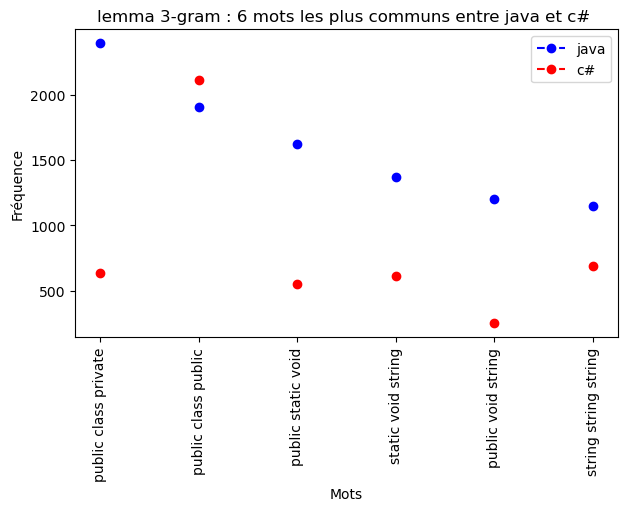

In [303]:
# Intersection mots java / c#
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_lemma_3_gram,
                                                name_in               = 'lemma 3-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'c#',
                                                intersection_cles_in  = intersection_java_c_sharp_lemma_3_gram)

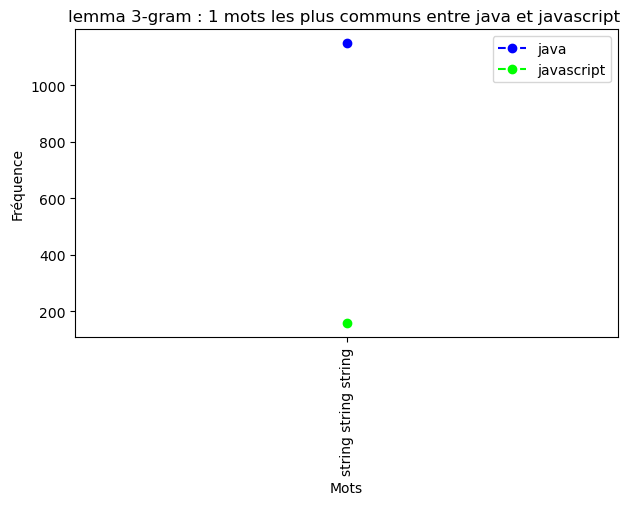

In [304]:
# Intersection mots java / javascript
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_lemma_3_gram,
                                                name_in               = 'lemma 3-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'javascript',
                                                intersection_cles_in  = intersection_java_javascript_lemma_3_gram)

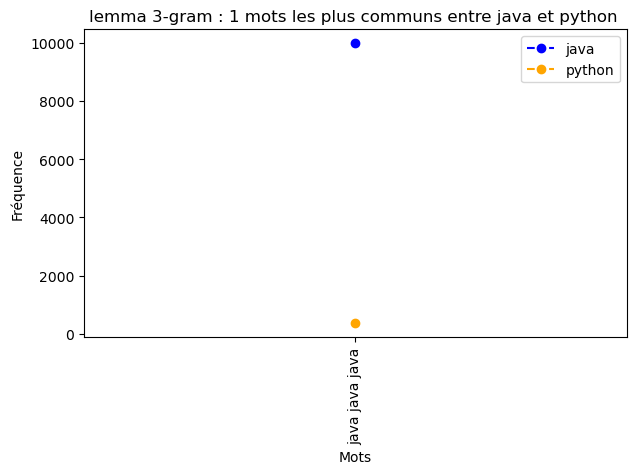

In [305]:
# Intersection mots java / python
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_lemma_3_gram,
                                                name_in               = 'lemma 3-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'python',
                                                intersection_cles_in  = intersection_java_python_lemma_3_gram)

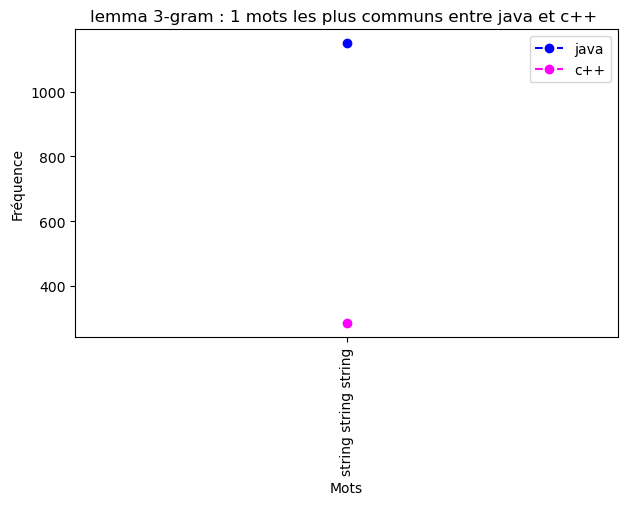

In [306]:
# Intersection mots java / c++
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_lemma_3_gram,
                                                name_in               = 'lemma 3-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'c++',
                                                intersection_cles_in  = intersection_java_c_plus_plus_lemma_3_gram)

# 7.4. WORD CLOUD (VARIABLE CATEGORIELLE)

In [ ]:
##############################################################################  
# WordCloud : visualisation des tokens les plus présents d'une colonne       #
##############################################################################

In [307]:
#########################################################  
# WordCloud pour le dataframe, d'une colonne            #
######################################################### 
def word_cloud(count_in, colonne_in, cle_in = ''):
    
    # Affichage des 20 mots les plus fréquents du corpus
    if (cle_in != ''):
        print('20 mots les plus fréquents colonne', colonne_in, ', sous-dataframe', cle_in, ':')
    else:
        print('20 mots les plus fréquents colonne', colonne_in, ':')
    print(count_in.head(20), '\n')
    
    
    # https://ichi.pro/fr/creer-des-nuages-de-mots-personnalises-en-python-145227399773811
    wc = WordCloud(background_color = 'beige',
                   max_words        = 40,      # affichage d'au moins 40 mots
                   width            = 4000, 
                   height           = 3000)
    wc.generate_from_frequencies(count_in)
    plt.imshow(wc)
    plt.axis("off")
    if (cle_in != ''):
        plt.title('Word Cloud colonne ' + colonne_in + ', sous-dataframe ' + cle_in)
    else:
        plt.title('Word Cloud colonne ' + colonne_in)
    plt.show()

In [308]:
#########################################################  
# WordCloud pour les sous-dataframes, d'une colonne     #
######################################################### 
def word_cloud_sous_dataframe(cle_in, colonne_in):
   
    #####################################
    # Corpus au format texte            #
    #####################################
    # On reconstitue le corpus en joignant l'ensemble des lignes / documents entre eux.
    corpus_text = ' '.join(dict_df[cle_in][colonne_in])

    
    #####################################
    # Corpus au format token            #
    #####################################
    token_text = corpus_text.split()
    
    
    #############################################################
    # Nombre de fois où les tokens sont présents dans le corpus #
    #############################################################  
    count_text = pd.Series(token_text).value_counts()
        
        
    #####################################
    # Wordcloud                         #
    #####################################
    word_cloud(count_in   = count_text, 
               colonne_in = colonne_in,
               cle_in     = cle_in)

20 mots les plus fréquents colonne _Text_clean :
java        137644
android     101731
class        95023
public       78751
file         69621
string       69017
return       67360
get          66939
c            64184
function     50016
import       46770
self         43116
system       41392
void         39819
version      39817
set          37698
null         35068
server       33585
text         32617
object       32248
Name: count, dtype: int64 



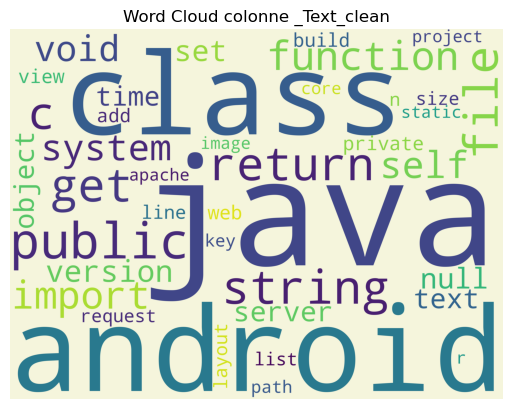

In [309]:
#########################################################
#        WordCloud dataframe, colonne _Text_clean       #
#########################################################
word_cloud(count_in   = count_text, 
           colonne_in = '_Text_clean')

20 mots les plus fréquents colonne _Stemmer_clean_final :
java        137644
android     101731
class        95023
public       78751
file         69621
string       69017
return       67360
get          66939
function     50016
import       46770
self         43116
set          42556
system       41392
void         39819
version      39817
null         35068
server       33585
build        33213
text         32617
time         32271
Name: count, dtype: int64 



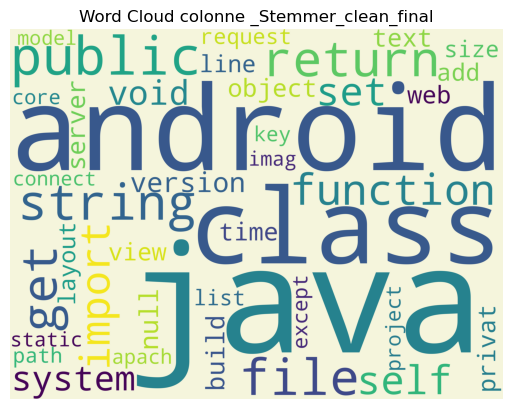

In [310]:
#########################################################
#       WordCloud dataframe, colonne _Stemmer_clean     #
#########################################################
word_cloud(count_in   = count_stemmer, 
           colonne_in = '_Stemmer_clean_final')

20 mots les plus fréquents colonne _Lemma_clean_final :
java        137644
android     101731
class        95023
public       78751
file         69621
string       69017
return       67360
get          66939
function     50016
import       46770
self         43116
system       41392
void         39819
version      39817
set          37698
null         35068
server       33585
text         32617
object       32248
time         31057
Name: count, dtype: int64 



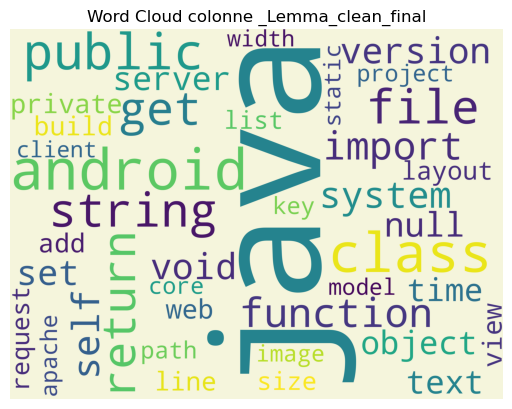

In [311]:
#########################################################
#        WordCloud dataframe, colonne _Lemma_clean      #
#########################################################
word_cloud(count_in   = count_lemma, 
           colonne_in = '_Lemma_clean_final')

20 mots les plus fréquents colonne _Stemmer_clean_final , sous-dataframe java :
java       101590
public      31965
class       26966
android     26641
string      23469
apach       17886
version     16382
spring      16066
jar         15922
import      14337
return      14209
privat      14166
void        12927
web         12683
file        11065
hibern      11000
core        10504
final       10264
get         10122
sun         10067
Name: count, dtype: int64 



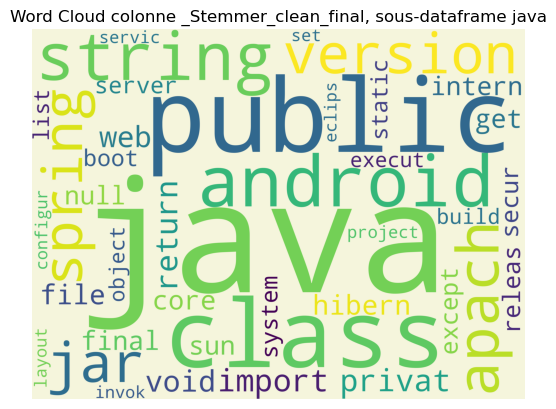

In [312]:
###########################################################
#  WordCloud sous-dataframe java, colonne _Stemmer_clean  #
###########################################################
word_cloud_sous_dataframe(cle_in     = 'java', 
                          colonne_in = '_Stemmer_clean_final')

20 mots les plus fréquents colonne _Stemmer_clean_final , sous-dataframe c# :
public     24226
system     19400
string     16276
get        13726
class      12157
set        10369
return      9425
object      7871
void        6793
add         6158
null        6155
web         5975
privat      5917
file        5849
static      5237
except      5048
task        4843
list        4597
server      4463
version     4149
Name: count, dtype: int64 



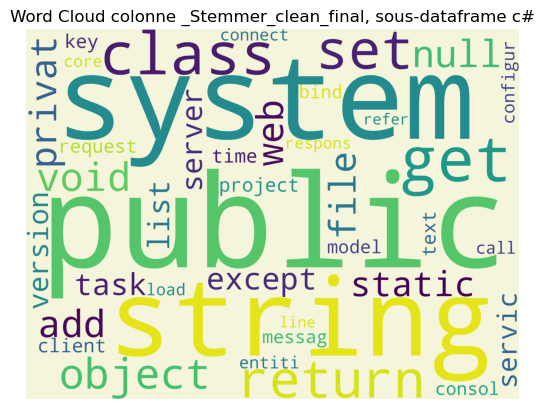

In [313]:
#########################################################
#  WordCloud sous-dataframe c#, colonne _Stemmer_clean  #
#########################################################
word_cloud_sous_dataframe(cle_in     = 'c#', 
                          colonne_in = '_Stemmer_clean_final') 

20 mots les plus fréquents colonne _Stemmer_clean_final , sous-dataframe javascript :
function    20694
class       14896
return       8657
text         8164
get          7311
file         7274
consol       6819
import       5964
button       5800
input        5311
server       5009
width        4813
document     4786
requir       4352
object       4312
load         4251
modul        4177
request      3843
height       3822
imag         3705
Name: count, dtype: int64 



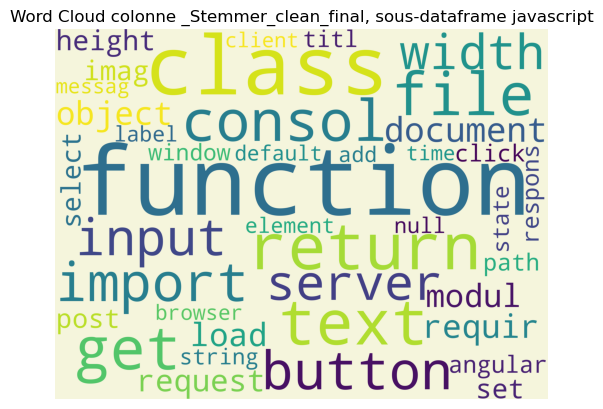

In [314]:
#################################################################
#  WordCloud sous-dataframe javascript, colonne _Stemmer_clean  #
#################################################################
word_cloud_sous_dataframe(cle_in      = 'javascript',
                          colonne_in = '_Stemmer_clean_final')

20 mots les plus fréquents colonne _Stemmer_clean_final , sous-dataframe python :
self        27711
file        21142
python      19649
import      17022
line        14557
get         11741
return      10341
model        9124
class        7927
time         7088
local        6777
build        6387
function     6004
modul        5672
set          5621
size         5129
path         4919
output       4772
input        4601
add          4569
Name: count, dtype: int64 



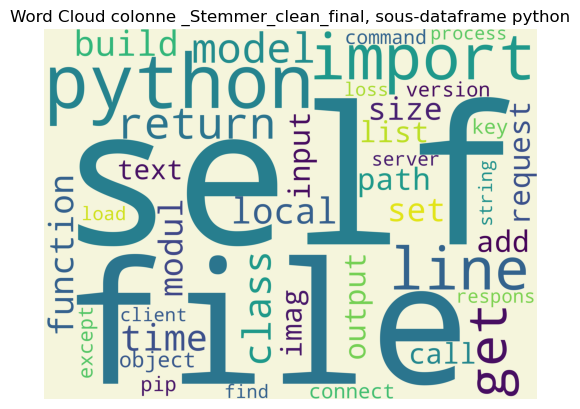

In [315]:
#############################################################
#  WordCloud sous-dataframe python, colonne _Stemmer_clean  #
#############################################################
word_cloud_sous_dataframe(cle_in      = 'python',
                          colonne_in = '_Stemmer_clean_final')

20 mots les plus fréquents colonne _Stemmer_clean_final , sous-dataframe c++ :
includ      9175
class       7963
void        7554
return      7378
function    6586
boost       6358
size        5658
string      5178
char        5113
file        4760
vector      4078
get         4076
time        3806
static      3440
memori      3273
doubl       3165
set         3026
public      2849
build       2712
object      2709
Name: count, dtype: int64 



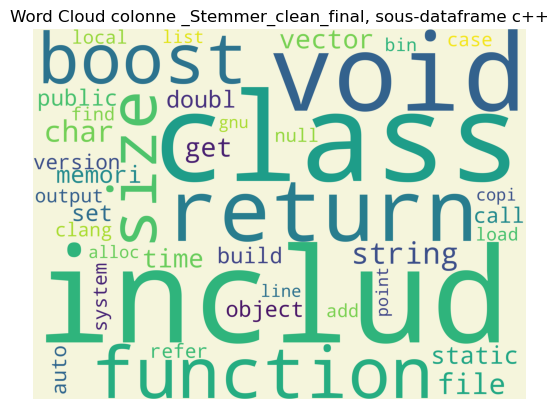

In [316]:
###########################################################
#  WordCloud sous-dataframe c++, colonne _Stemmer_clean   #
###########################################################
word_cloud_sous_dataframe(cle_in      = 'c++',
                          colonne_in = '_Stemmer_clean_final')

# 7.5. ANALYSE UNIVARIEE VARIABLES NUMERIQUES

In [317]:
# Sélection des colonnes numériques
df_numerique = df.select_dtypes(include = np.number)
var_numerique = df_numerique.columns
print('var_numerique =', var_numerique)

var_numerique = Index(['Id', 'Score', 'ViewCount', 'AnswerCount', '_len_Text_clean'], dtype='object')


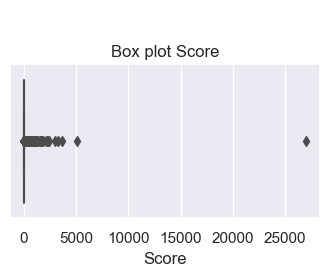

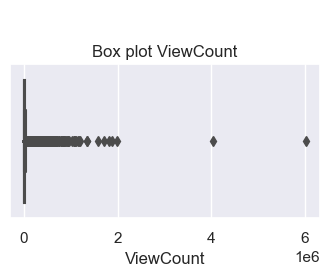

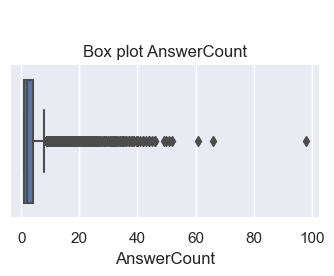

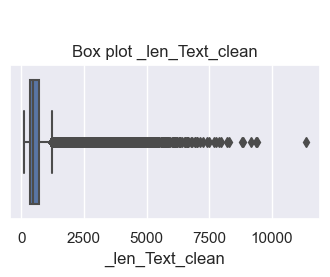

In [318]:
for col in var_numerique:
    if (col != 'Id'):
        # define figure size
        sns.set(rc = {"figure.figsize":(4, 2)}) #width=6, height=5
        plt.title('\n\nBox plot ' + col)    
        sns.boxplot(data = df, x = col)

        plt.show()    

# 8. ANALYSE BIVARIEE

# 8.1. ETUDE DE LA TAILLE DES DOCUMENTS PAR RPPORT AUX TAGS (VARIABLE QUANTITATIVE ET VARIABLE CATEGORIELLE)

In [319]:
#####################################################################
#   Box plot pour 1 variable catégorielle et 1 variable numérique   #
#####################################################################
# https://seaborn.pydata.org/generated/seaborn.boxplot.html
def box_plot(colonne_x_numerique_in, colonne_y_categorielle_in):
    
    order_categorical_level = df.groupby(colonne_y_categorielle_in)[colonne_x_numerique_in].median().sort_values().index

    plt.figure(figsize = (6, 9))
    sns.set(font_scale = 0.6)
    
    sns.boxplot(x          = colonne_x_numerique_in, 
                y          = colonne_y_categorielle_in, 
                showfliers = False, # on supprime outliers
                orient     = 'h',
                order      = order_categorical_level, 
                data       = df)
    
    plt.title('Box plot ' + colonne_x_numerique_in + ' % ' + colonne_y_categorielle_in, fontsize = 12)
    plt.show()
    
    print('\n\n')

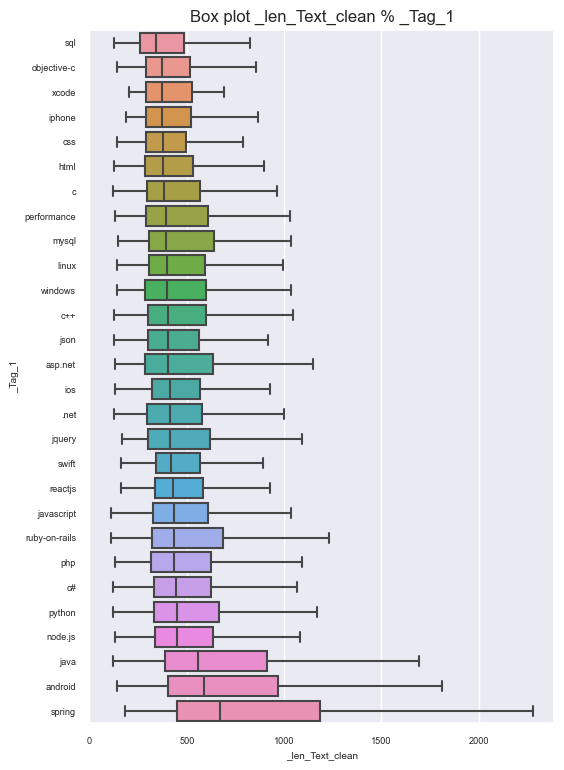

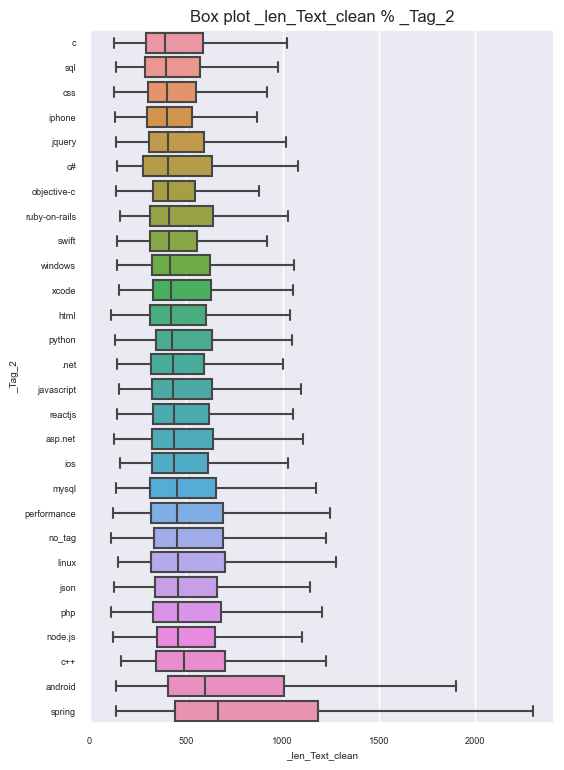

In [320]:
########################################################
# Box plot avec colonne_x_numerique = _len_Text_clean  #
########################################################
box_plot(colonne_x_numerique_in    = '_len_Text_clean',
         colonne_y_categorielle_in = '_Tag_1')

box_plot(colonne_x_numerique_in    = '_len_Text_clean',
         colonne_y_categorielle_in = '_Tag_2')

# 9. ANALYSE MULTIVARIEE

# 9.1. ANALYSE DE 3 VARIABLES NUMERIQUES

In [326]:
#######################################################################
#    Calcul du nombre de mots uniques pour les colonnes _xxx_clean    #
#######################################################################
# https://www.delftstack.com/fr/howto/python/python-count-unique-values-in-list/
# Nombre de mots uniques dans les colonnes _xxx_clean.
# on stocke ce vecteur numérique dans une colonne préfixée par _
count = 0

for index, row in df.iterrows():
    
    df.loc[index, '_unique_words_Text_clean']          = len(np.unique(df.loc[index, '_Text_clean'].split()))
    df.loc[index, '_unique_words_Lemma_clean_final']   = len(np.unique(df.loc[index, '_Lemma_clean_final'].split()))
    df.loc[index, '_unique_words_Stemmer_clean_final'] = len(np.unique(df.loc[index, '_Stemmer_clean_final'].split()))
    
    if (count < 4):
        print('index =', index, ':', '\n',
              '\t- _Text_clean\t\t\t\t=', df.loc[index, '_Text_clean'], '\n', 
              '\t- _len_Text_clean\t\t\t=', df.loc[index, '_len_Text_clean'], '\n', 
              '\t- _unique_words_Text_clean\t\t=', df.loc[index, '_unique_words_Text_clean'], '\n',  
              '\t- _Lemma_clean_final\t\t\t=', df.loc[index, '_Lemma_clean_final'], '\n',               
              '\t- _unique_words_Lemma_clean_final\t=', df.loc[index, '_unique_words_Lemma_clean_final'], '\n',
              '\t- _Stemmer_clean_final\t\t\t=', df.loc[index, '_Stemmer_clean_final'], '\n',                       
              '\t- _unique_words_Stemmer_clean_final\t=', df.loc[index, '_unique_words_Stemmer_clean_final'], '\n')
    count = count + 1

index = 0 : 
 	- _Text_clean				= performance class radio time process time process performance store configuration load input web configuration instance partial trust solution add memory disk tell time final save disk verify handle load testing performance 
 	- _len_Text_clean			= 223 
 	- _unique_words_Text_clean		= 23.0 
 	- _Lemma_clean_final			= performance class radio time process time process performance store configuration load input web configuration instance partial trust solution add memory disk tell time final save disk verify handle load testing performance 
 	- _unique_words_Lemma_clean_final	= 23.0 
 	- _Stemmer_clean_final			= perform class radio time process time process perform store configur load input web configur instanc partial trust solut add memori disk tell time final save disk handl load test perform 
 	- _unique_words_Stemmer_clean_final	= 22.0 

index = 1 : 
 	- _Text_clean				= get environment get environment setting hosting solution solution server either 

In [327]:
# summary statistics sur les colonnes de type numérique
# (transpose met les attributs en ligne pour + de lisibilité)
df.describe(include = np.number).transpose()

,count,mean,std,min,25%,50%,75%,max
Id,49493.0,3.076258e+07,1.899073e+07,19.0,14243249.0,29861672.0,45636541.0,76363078.0
Score,49493.0,1.821942e+01,1.339870e+02,6.0,7.0,9.0,15.0,27009.0
ViewCount,49493.0,1.790583e+04,5.770890e+04,67.0,2452.0,6458.0,16424.0,6024098.0
AnswerCount,49493.0,3.013638e+00,2.954516e+00,1.0,1.0,2.0,4.0,98.0
_len_Text_clean,49493.0,6.254535e+02,5.820245e+02,108.0,332.0,454.0,687.0,11356.0
_unique_words_Text_clean,49493.0,3.029416e+01,1.278563e+01,4.0,22.0,27.0,35.0,161.0
_unique_words_Lemma_clean,1.0,2.300000e+01,NaN,23.0,23.0,23.0,23.0,23.0
_unique_words_Stemmer_clean,1.0,2.200000e+01,NaN,22.0,22.0,22.0,22.0,22.0
_unique_words_Lemma_clean_final,49493.0,2.937413e+01,1.244268e+01,4.0,21.0,27.0,34.0,158.0
_unique_words_Stemmer_clean_final,49493.0,2.528095e+01,1.073358e+01,4.0,18.0,23.0,30.0,131.0


In [328]:
df.columns

Index(['CreationDate', 'Id', 'Score', 'ViewCount', 'AnswerCount', '_Text',
       '_Tag_1', '_Tag_2', '_Text_sans_html', '_Text_tokens_chaine',
       '_Text_tokens', '_Tokens_text_clean', '_Tokens_stemmer_clean',
       '_Tokens_lemma_clean', '_Text_clean', '_Stemmer_clean', '_Lemma_clean',
       '_Tokens_stemmer_clean_final', '_Tokens_lemma_clean_final',
       '_Stemmer_clean_final', '_Lemma_clean_final', '_len_Text_clean',
       '_unique_words_Text_clean', '_unique_words_Lemma_clean',
       '_unique_words_Stemmer_clean', '_unique_words_Lemma_clean_final',
       '_unique_words_Stemmer_clean_final'],
      dtype='object')

In [329]:
# Réduction du dataframe pour avoir une figure + lisible
print('df shape\t=', df.shape)

df_reduit = df[(df['AnswerCount'] <= 20) &
               (df['Score'] <= 200)]
print('df_reduit shape\t=', df_reduit.shape)

df shape	= (49493, 27)
df_reduit shape	= (49122, 27)


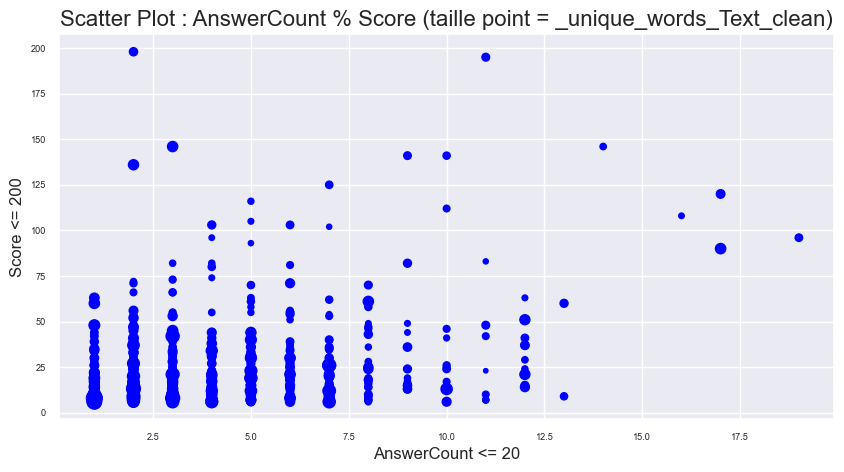

In [330]:
############################################################
# Scatter plot pour 3 variables numériques :               #
#    --> x = AnswerCount                                   #
#    --> y = Score                                         #
#    --> taille des points = _unique_words_Text_clean      #
############################################################
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.scatter.html
# https://www.geeksforgeeks.org/how-to-increase-the-size-of-scatter-points-in-matplotlib/  
# https://stackoverflow.com/questions/30336138/how-to-plot-a-multivariate-function-in-python

# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.sample.html
# Bp de points => pour + de lisibilité, on travaille sur un sous-ensemble (2000 points)
data_subset = df_reduit.sample(n = 2000, replace = True, random_state = 1)    
    
plt.figure(figsize = (10, 5)) # 6 is width, 5 is height

x = data_subset['AnswerCount']
y = data_subset['Score'] 
points_size = data_subset['_unique_words_Text_clean'] 

plt.scatter(x, y, s = points_size, c = 'blue')

plt.title('Scatter Plot : AnswerCount % Score (taille point = _unique_words_Text_clean)', fontsize = 16)
plt.xlabel('AnswerCount <= 20', fontsize = 12)
plt.ylabel('Score <= 200', fontsize = 12)
  
plt.show()

In [341]:
# Suppression :
#  ---> de la colonne date ('CreationDate').
#  ---> des colonnes intermédiaires créées pour le calcul :
#          * de la taille du texte ('_len_Text_clean')
#          * du nombre de mots uniques ('_unique_words_xxx').
#          * des colonnes nettoyées ('Text_xxx', _xxx_clean').
df.drop(['CreationDate', 
         '_Text', '_Text_tokens_chaine', '_Text_tokens', 
         '_Tokens_text_clean', '_Tokens_stemmer_clean', '_Tokens_lemma_clean', '_Text_clean',
         '_Stemmer_clean', '_Lemma_clean',
         '_len_Text_clean',
         '_unique_words_Text_clean', '_unique_words_Lemma_clean', '_unique_words_Stemmer_clean', 
         '_unique_words_Lemma_clean_final', '_unique_words_Stemmer_clean_final'],
        axis = 1, inplace = True)

In [342]:
df.columns

Index(['Id', 'Score', 'ViewCount', 'AnswerCount', '_Tag_1', '_Tag_2',
       '_Text_sans_html', '_Tokens_stemmer_clean_final',
       '_Tokens_lemma_clean_final', '_Stemmer_clean_final',
       '_Lemma_clean_final'],
      dtype='object')

# 9.2. MATRICE DE CORRELATION

In [344]:
# Sélection des colonnes numériques
df_numerique = df.select_dtypes(include = np.number)
var_numerique = df_numerique.columns
print('var_numerique =', var_numerique)

var_numerique = Index(['Id', 'Score', 'ViewCount', 'AnswerCount'], dtype='object')


In [345]:
# matrice de corrélation
corr = df_numerique.corr()
corr

,Id,Score,ViewCount,AnswerCount
Id,1.000000,-0.031838,-0.075068,-0.130597
Score,-0.031838,1.000000,0.396343,0.197131
ViewCount,-0.075068,0.396343,1.000000,0.472946
AnswerCount,-0.130597,0.197131,0.472946,1.000000


In [346]:
#####################################################################
# matrice de corrélation : représentation graphique de la diagonale #
#####################################################################
# Valeurs minimale = -1, maximale = 1. 
# fmt = arrondi 2 chiffres après la virgule.
def affichage_matrice_correlation(df_in):
    
    corr = df_in.corr()
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True

    fig, ax = plt.subplots(1, 1, figsize = (7,5))
    ax = sns.heatmap(corr, mask = mask, vmin = -1, vmax = 1, cmap = 'coolwarm', annot = True, fmt = '.2f', square = True)

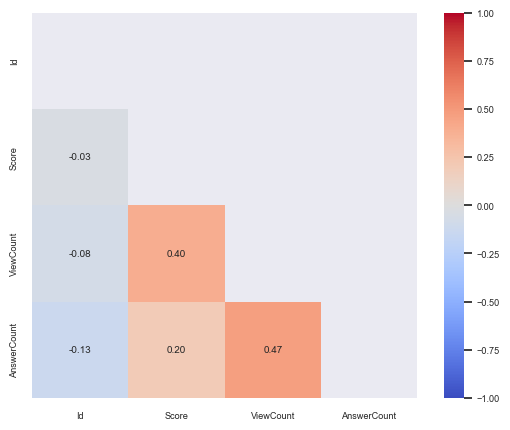

In [347]:
affichage_matrice_correlation(df_in = df_numerique)

# Il n'y a pas de corrélation entre les colonnes.

# 10. SAUVEGARDE DANS FICHIERS

In [348]:
df.columns

Index(['Id', 'Score', 'ViewCount', 'AnswerCount', '_Tag_1', '_Tag_2',
       '_Text_sans_html', '_Tokens_stemmer_clean_final',
       '_Tokens_lemma_clean_final', '_Stemmer_clean_final',
       '_Lemma_clean_final'],
      dtype='object')

In [349]:
# Suppression des colonnes numériques ('Id', 'Score', 'AnswerCount') sans intérêt pour le machine learning. 
df.drop(['Id', 'Score', 'ViewCount', 'AnswerCount'], axis = 1, inplace = True)

In [352]:
df.columns

Index(['_Tag_1', '_Tag_2', '_Text_sans_html', '_Tokens_stemmer_clean_final',
       '_Tokens_lemma_clean_final', '_Stemmer_clean_final',
       '_Lemma_clean_final'],
      dtype='object')

In [353]:
# Réinitialisation de l’index du dataFrame :
#   --> Avant sauvegarde dans fichier.
# https://www.delftstack.com/fr/howto/python-pandas/pandas-reset-index-python/
df.reset_index(inplace = True, drop = True)

In [354]:
###########################################################
#             Données nettoyées réduites                  #
###########################################################
df_light = df.copy()

In [355]:
# On enlève uniquement la colonne '_Text_sans_html'
df_light.drop(['_Text_sans_html'], axis = 1, inplace = True)

In [356]:
df_light.columns

Index(['_Tag_1', '_Tag_2', '_Tokens_stemmer_clean_final',
       '_Tokens_lemma_clean_final', '_Stemmer_clean_final',
       '_Lemma_clean_final'],
      dtype='object')

In [357]:
###########################################################
#   ENREGISTREMENT DONNEES NETTOYEES DANS DES FICHIERS    #
###########################################################
# Données nettoyées
df.to_csv(C_DATASET_CLEANED + 'QueryResults_2008_to_2023_clean.csv', 
          sep = '\t', header = True, index = False)

# Données nettoyées réduites
df_light.to_csv(C_DATASET_CLEANED + 'QueryResults_2008_to_2023_clean_light.csv', 
                sep = '\t', header = True, index = False)